In [1]:
import time
import datetime
import pandas as pd
import numpy as np
from numpy import mean, std
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import cross_val_score, RepeatedKFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score, make_scorer
from sklearn.utils import resample
from sklearn.feature_selection import RFECV

from sklearn.utils import shuffle
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression

import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor

from sklearn.ensemble import StackingRegressor
import catboost as cb

from sklearn.model_selection import KFold

C:\Users\user\anaconda3\envs\py3-tf2\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
from bayes_opt import BayesianOptimization
import warnings
warnings.filterwarnings('ignore')

## Load data

In [41]:
df = pd.read_csv('rawdata_775_CostScale.csv', encoding='latin1')

In [42]:
unscaled_data = df.drop(['no','type', 'duration'], axis=1)
unscaled_inputs = df.drop(['no','type', 'buildingcost', 'duration'], axis=1)
unscaled_targets = df['buildingcost']
unscaled_data.describe()

,totalarea,sitearea,buildingarea,typicalfloorheight,totalheight,basement,groundlevel,parkinglot,type1,type2,...,type4,type5,type6,type7,type8,type9,type10,type11,year,buildingcost
count,775.000000,7.750000e+02,775.000000,775.000000,775.000000,775.000000,775.000000,775.000000,775.000000,775.000000,...,775.000000,775.000000,775.000000,775.000000,775.000000,775.000000,775.000000,775.000000,775.000000,775.000000
mean,8135.758903,4.980733e+04,2628.330041,4.144555,20.486452,0.876129,4.113548,94.811613,0.091613,0.179355,...,0.019355,0.068387,0.037419,0.037419,0.042581,0.242581,0.040000,0.010323,2017.767742,10260.298065
std,5342.883743,1.419168e+05,1791.675555,0.684189,7.851161,0.581929,1.866337,147.167558,0.288665,0.383897,...,0.137858,0.252572,0.189910,0.189910,0.202040,0.428920,0.196086,0.101140,1.858076,6113.239972
min,325.000000,4.820000e+02,122.840000,2.400000,5.200000,0.000000,1.000000,3.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.000000,251.000000
25%,3587.205000,5.949500e+03,1294.360000,3.700000,15.925000,1.000000,3.000000,38.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2016.000000,5164.500000
50%,7014.750000,1.321000e+04,2236.310000,4.200000,19.300000,1.000000,4.000000,64.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2018.000000,9515.000000
75%,11880.940000,2.614020e+04,3643.135000,4.200000,22.775000,1.000000,5.000000,107.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2019.000000,14215.000000
max,36699.070000,1.320256e+06,11392.000000,8.000000,70.000000,4.000000,20.000000,1830.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2021.000000,28622.000000


<Figure size 7500x3000 with 0 Axes>

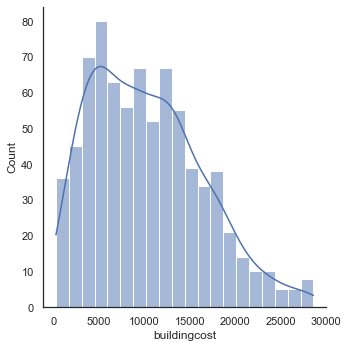

In [43]:
fig = plt.figure(figsize=(25,10),dpi=300)
sns.set(style = 'white')
sns.displot(data = unscaled_data, x = 'buildingcost', bins = 20, kde=True).set_title("Construction cost(million ₩)")
plt.savefig('Assembly Cost Distribution2.pdf')

## Data preprocessing

In [46]:
Feature_Names = ['totalarea', 'buildingarea', 'totalheight', 'basement', 
                 'groundlevel', 'parkinglot']

unscaled_X = unscaled_data[Feature_Names]
unscaled_y = unscaled_data['buildingcost']

X = unscaled_data[Feature_Names].to_numpy()
y = unscaled_data['buildingcost'].to_numpy()

#----------------------------------------------------------------------------------------------------------
#  min, max values of Cost in the training data
#----------------------------------------------------------------------------------------------------------
ymin = min(y)
ymax = max(y)

multiplier = ymax - ymin

# Feature scaling required for neural network
scaler = MinMaxScaler(feature_range=(0, 1))
scaler.fit(X)
scaled_X = scaler.transform(X)
scaler.fit(y.reshape(-1, 1))
scaled_y = scaler.transform(y.reshape(-1, 1))

scaled_X_df = pd.DataFrame(scaled_X)
scaled_y_df = pd.DataFrame(scaled_y)

# prepare cross validation
kfold = KFold(n_splits= 5, shuffle=True, random_state = 0 )

In [47]:
#################################################################################################
# To test the model
X_train, X_test, y_train, y_test = train_test_split(scaled_X, scaled_y, test_size=0.2, shuffle=True, random_state=123)
#################################################################################################

n_features = scaled_X.shape[1]

In [48]:
scaled_X_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.035829,0.001342,0.030065,0.214286,0.179938,0.25,0.157895,0.007663,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.039882,0.002046,0.053536,0.267857,0.215586,0.00,0.105263,0.017515,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.128156,0.003365,0.061897,0.321429,0.421296,0.25,0.263158,0.040504,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.071097,0.003103,0.059477,0.214286,0.162037,0.25,0.157895,0.037219,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.015976,0.000941,0.035434,0.214286,0.097994,0.00,0.052632,0.007115,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
770,0.176971,0.004389,0.202670,0.267857,0.304012,0.25,0.210526,0.041051,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
771,0.186281,0.022245,0.301305,0.642857,0.307099,0.00,0.105263,0.056924,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
772,0.239987,0.011554,0.258912,0.267857,0.216049,0.25,0.157895,0.033388,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
773,0.055328,0.001893,0.085600,0.642857,0.229938,0.25,0.105263,0.007115,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


## Neural networks

In [59]:
Adam=keras.optimizers.Adam
SGD=keras.optimizers.SGD
RMSprop=keras.optimizers.RMSprop
Adamax=keras.optimizers.Adamax
Nadam=keras.optimizers.Nadam
Ftrl=keras.optimizers.Ftrl

def bayesion_opt_nn(X_train, y_train, X_test, y_test):

    
    def nn_cl_bo(neurons, activation, optimizer, learning_rate, batch_size, 
                 layers1, dropout, dropout_rate):
        optimizerL = ['SGD', 'Adam', 'RMSprop', 'Adamax', 'Nadam', 'Ftrl']
        optimizerD= {'Adam':Adam(lr=learning_rate), 'SGD':SGD(lr=learning_rate),
                        'RMSprop':RMSprop(lr=learning_rate), 
                        'Adamax':Adamax(lr=learning_rate),
                        'Nadam':Nadam(lr=learning_rate), 'Ftrl':Ftrl(lr=learning_rate)}
        activationL = ['relu', 'sigmoid', 'softplus', 'softsign', 'tanh', 'selu','elu', 'exponential']
        
        neurons = int(round(neurons))
        activation = activationL[int(round(activation))]
        optimizer = optimizerD[optimizerL[round(optimizer)]]
        batch_size = round(batch_size)
        layers1 = round(layers1)
        #layers2 = round(layers2)
    
        def nn_cl_fun():
            nn = Sequential()
            nn.add(Dense(neurons, activation=activation, input_shape=(n_features,)))
            for i in range(layers1):
                nn.add(Dense(neurons, activation=activation))
            if dropout > 0.5:
                nn.add(Dropout(dropout_rate, seed=123))
            #for i in range(layers2):
            #    nn.add(Dense(neurons, activation=activation))
                
            nn.add(Dense(1, activation='sigmoid'))
            nn.compile(loss='mean_squared_error', optimizer=optimizer)
            return nn
        
        es = tf.keras.callbacks.EarlyStopping(patience=30)

        ann = nn_cl_fun()
        
        ann.fit(X_train, y_train, epochs=500, batch_size=batch_size, 
                    callbacks=[es],
                    validation_data = (X_test, y_test),
                    verbose=0)

        #ann = KerasRegressor(build_fn=nn_cl_fun, epochs=epochs, batch_size=batch_size,verbose=0)
        
        y_pred = ann.predict(X_test)
        y_pred=pd.DataFrame(y_pred)
        y_pred.fillna(0, inplace=True)
        r2 = r2_score(y_test, y_pred)
        return r2
        
     
    # Set paramaters
    params_nn ={
        'neurons':(20, 100),
        'activation':(0, 7),
        'optimizer':(0, 5),
        'learning_rate':(0.001, 1),
        'batch_size':(20, 1000),
        'layers1':(1, 2),
        'dropout':(0, 1),
        'dropout_rate':(0, 0.3)
    }

    # Run Bayesian Optimization
    nn_bo = BayesianOptimization(nn_cl_bo, params_nn, random_state=123)
    
    nn_bo.maximize(init_points=30, n_iter=200, acq='ei')
    
    return nn_bo

In [60]:
ann_train_rmse = []; ann_train_RSQ = []; ann_train_MBE = []
ann_test_rmse = []; ann_test_RSQ = []; ann_test_MBE = []

for train_index, test_index in kfold.split(scaled_X_df):
    scaled_X_train, scaled_X_test = scaled_X_df.iloc[train_index,:], scaled_X_df.iloc[test_index,:]
    scaled_y_train, scaled_y_test = scaled_y_df.iloc[train_index], scaled_y_df.iloc[test_index]
    unscaled_y_train, unscaled_y_test = unscaled_y.iloc[train_index], unscaled_y.iloc[test_index]
    
    scaled_X_train = scaled_X_train.to_numpy(); scaled_X_test = scaled_X_test.to_numpy()
    scaled_y_train = scaled_y_train.to_numpy(); scaled_y_test = scaled_y_test.to_numpy()
    unscaled_y_train = unscaled_y_train.to_numpy(); unscaled_y_test = unscaled_y_test.to_numpy()
    
    #----------------------------------------------------------------------------------------------------------
    nn_bo = bayesion_opt_nn(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
    params_nn_ = nn_bo.max['params']
    learning_rate = params_nn_['learning_rate']
    activationL = ['relu', 'sigmoid', 'softplus', 'softsign', 'tanh', 'selu', 'elu', 'exponential']
    params_nn_['activation'] = activationL[round(params_nn_['activation'])]
    params_nn_['batch_size'] = round(params_nn_['batch_size'])
    params_nn_['layers1'] = round(params_nn_['layers1'])
    #params_nn_['layers2'] = round(params_nn_['layers2'])
    params_nn_['neurons'] = round(params_nn_['neurons'])
    optimizerL = ['Adam', 'SGD', 'RMSprop', 'Adamax', 'Nadam', 'Ftrl','Adam']
    optimizerD= {'Adam':Adam(lr=learning_rate), 'SGD':SGD(lr=learning_rate),
                     'RMSprop':RMSprop(lr=learning_rate), 
                     'Adamax':Adamax(lr=learning_rate),
                     'Nadam':Nadam(lr=learning_rate), 'Ftrl':Ftrl(lr=learning_rate)}
    params_nn_['optimizer'] = optimizerD[optimizerL[round(params_nn_['optimizer'])]]
        
    def nn_cl_fun():
        nn = Sequential()
        nn.add(Dense(params_nn_['neurons'], activation=params_nn_['activation'], input_shape=(n_features,)))
        for i in range(params_nn_['layers1']):
            nn.add(Dense(params_nn_['neurons'], activation=params_nn_['activation']))
        if params_nn_['dropout'] > 0.5:
            nn.add(Dropout(params_nn_['dropout_rate'], seed=123))
        #for i in range(params_nn_['layers2']):
        #    nn.add(Dense(params_nn_['neurons'], activation=params_nn_['activation']))
        nn.add(Dense(1, activation='sigmoid'))
        nn.compile(loss='mean_squared_error', optimizer=params_nn_['optimizer'])
        return nn

    es = tf.keras.callbacks.EarlyStopping(patience=30)
    ann_reg = nn_cl_fun()
    ann_reg.fit(scaled_X_train, scaled_y_train, epochs=500,  
                callbacks=[es],
                validation_data = (scaled_X_test, scaled_y_test),
                verbose=0)
        
    #----------------------------------------------------------------------------------------------------------
    
    Y_hat = ann_reg.predict(scaled_X_train)
    Y_Train_Pred = (ymin + Y_hat * multiplier)
    
    train_rmse = np.sqrt(mean_squared_error(unscaled_y_train.ravel(), Y_Train_Pred))
    ann_train_rmse.append(train_rmse)
    train_RSQ = r2_score(unscaled_y_train.ravel(), Y_Train_Pred)
    ann_train_RSQ.append(train_RSQ)
    train_MBE = np.mean(unscaled_y_train.ravel() - Y_Train_Pred)
    ann_train_MBE.append(train_MBE)

    Y_hat = ann_reg.predict(scaled_X_test)
    Y_Test_Pred = (ymin + Y_hat * multiplier)

    test_rmse = np.sqrt(mean_squared_error(unscaled_y_test.ravel(), Y_Test_Pred))
    ann_test_rmse.append(test_rmse)
    test_RSQ = r2_score(unscaled_y_test.ravel(), Y_Test_Pred)
    ann_test_RSQ.append(test_RSQ)
    test_MBE = np.mean(unscaled_y_test.ravel() - Y_Test_Pred)
    ann_test_MBE.append(test_MBE)

rmse_train_df = pd.DataFrame(ann_train_rmse, columns = {'rmse_train'})
rsq_train_df = pd.DataFrame(ann_train_RSQ, columns = {'RSQ_train'})
mbe_train_df = pd.DataFrame(ann_train_MBE, columns = {'MBE_train'})
rmse_test_df = pd.DataFrame(ann_test_rmse, columns = {'rmse_test'})
rsq_test_df = pd.DataFrame(ann_test_RSQ, columns = {'RSQ_test'})
mbe_test_df = pd.DataFrame(ann_test_MBE, columns = {'MBE_test'})
ann_results_df = pd.concat([rmse_train_df, rsq_train_df, mbe_train_df, rmse_test_df, rsq_test_df, mbe_test_df], axis = 1)
ann_results_df

|   iter    |  target   | activa... | batch_... |  dropout  | dropou... |  layers1  | learni... |  neurons  | optimizer |
-------------------------------------------------------------------------------------------------------------------------
|  1        | -10.1     |  4.875    |  300.4    |  0.2269   |  0.1654   |  1.719    |  0.4237   |  98.46    |  3.424    |
|  2        |  0.8626   |  3.367    |  404.3    |  0.3432   |  0.2187   |  1.439    |  0.06062  |  51.84    |  3.69     |
|  3        | -2.999    |  1.277    |  191.9    |  0.5316   |  0.1595   |  1.634    |  0.8496   |  77.96    |  3.055    |
|  4        | -2.999    |  5.057    |  336.5    |  0.3618   |  0.06848  |  1.294    |  0.6313   |  27.37    |  2.169    |
|  5        | -2.999    |  3.016    |  503.8    |  0.4258   |  0.09368  |  1.426    |  0.8935   |  95.53    |  2.509    |
|  6        | -0.3782   |  4.368    |  133.3    |  0.3173   |  0.1244   |  1.866    |  0.2512   |  58.64    |  4.928    |
|  7        | -2.999    

|  41       | -2.999    |  1.802    |  405.8    |  0.228    |  0.1538   |  1.916    |  0.2545   |  51.5     |  2.163    |
|  42       | -10.1     |  4.823    |  404.3    |  0.0261   |  0.2213   |  1.894    |  0.9708   |  51.96    |  3.383    |
|  43       | -2.999    |  2.581    |  697.6    |  0.7546   |  0.007332 |  1.22     |  0.826    |  49.6     |  0.8089   |
|  44       | -10.1     |  3.418    |  619.2    |  0.7377   |  0.1077   |  1.536    |  0.4487   |  47.64    |  1.565    |
|  45       | -2.999    |  1.772    |  832.9    |  0.08093  |  0.1687   |  1.782    |  0.8343   |  20.48    |  4.021    |
|  46       | -10.1     |  0.78     |  336.5    |  0.3488   |  0.1933   |  1.495    |  0.9514   |  39.55    |  4.314    |
|  47       | -2.999    |  0.3747   |  155.9    |  0.3521   |  0.1832   |  1.494    |  0.8828   |  35.67    |  3.81     |
|  48       | -0.05996  |  2.057    |  836.0    |  0.376    |  0.1588   |  1.781    |  0.7009   |  20.0     |  4.831    |
|  49       | -2.999    

|  82       | -0.007924 |  0.9      |  334.3    |  0.6181   |  0.2279   |  1.982    |  0.8023   |  36.77    |  4.575    |
|  83       |  0.8911   |  3.018    |  404.2    |  0.3466   |  0.2022   |  1.275    |  0.001    |  51.3     |  4.286    |
|  84       | -10.1     |  1.887    |  698.9    |  0.3587   |  0.1364   |  1.085    |  0.6296   |  48.47    |  0.8329   |
|  85       | -2.999    |  6.017    |  407.7    |  0.8941   |  0.2561   |  1.797    |  0.925    |  98.63    |  0.8444   |
|  86       | -10.1     |  3.389    |  697.5    |  0.5515   |  0.09599  |  1.789    |  0.6957   |  47.56    |  1.396    |
|  87       | -2.999    |  3.61     |  729.2    |  0.6921   |  0.2438   |  1.492    |  0.9167   |  31.97    |  2.083    |
|  88       | -2.999    |  0.3168   |  332.0    |  0.9448   |  0.1309   |  1.797    |  0.207    |  38.09    |  3.398    |
|  89       | -0.002167 |  1.754    |  769.1    |  0.5691   |  0.01353  |  1.349    |  0.0937   |  48.45    |  4.839    |
|  90       | -2.999    

|  123      |  0.8882   |  4.433    |  727.7    |  0.2853   |  0.138    |  1.366    |  0.127    |  34.5     |  2.553    |
|  124      | -0.4315   |  3.841    |  404.3    |  0.2799   |  0.2967   |  1.861    |  0.2108   |  52.06    |  4.721    |
|  125      | -1.463e-0 |  1.537    |  155.9    |  0.867    |  0.1476   |  1.425    |  0.07852  |  36.51    |  4.529    |
|  126      |  0.8742   |  6.156    |  406.7    |  0.8602   |  0.2968   |  1.571    |  0.8915   |  99.97    |  0.09981  |
|  127      | -0.000504 |  1.552    |  334.0    |  0.07547  |  0.03966  |  1.195    |  0.4768   |  40.27    |  4.956    |
|  128      | -0.4315   |  0.3199   |  333.1    |  0.3113   |  0.2674   |  1.773    |  0.6336   |  40.13    |  4.897    |
|  129      | -2.999    |  6.064    |  406.6    |  0.9943   |  0.09193  |  1.98     |  0.3073   |  98.95    |  0.6349   |
|  130      | -2.999    |  1.909    |  400.5    |  0.5075   |  0.08959  |  1.839    |  0.6769   |  48.9     |  4.453    |
|  131      | -1.137e-0 

|  164      | -0.002566 |  1.516    |  768.6    |  0.5397   |  0.1469   |  1.567    |  0.4925   |  47.13    |  4.707    |
|  165      | -3.956    |  4.838    |  699.4    |  0.08301  |  0.268    |  1.339    |  0.5798   |  44.91    |  0.5941   |
|  166      | -2.999    |  0.8921   |  768.9    |  0.9848   |  0.259    |  1.183    |  0.4154   |  47.26    |  3.546    |
|  167      | -5.341e-0 |  2.417    |  401.7    |  0.6637   |  0.1969   |  1.802    |  0.3885   |  51.11    |  4.717    |
|  168      |  0.8792   |  4.375    |  727.8    |  0.07783  |  0.1373   |  1.429    |  0.001    |  33.99    |  2.478    |
|  169      |  0.8753   |  2.957    |  837.6    |  0.9206   |  0.04993  |  1.783    |  0.001    |  20.19    |  4.037    |
|  170      |  0.8464   |  4.651    |  727.6    |  0.8535   |  0.04971  |  1.697    |  0.02751  |  31.3     |  4.173    |
|  171      | -0.000239 |  1.655    |  334.0    |  0.9868   |  0.1907   |  1.663    |  0.8188   |  39.95    |  4.719    |
|  172      | -0.001529 

|  205      | -2.999    |  5.31     |  622.3    |  0.09381  |  0.2257   |  1.889    |  0.5117   |  49.52    |  0.9852   |
|  206      | -0.3783   |  6.454    |  135.5    |  0.7812   |  0.1635   |  1.386    |  0.6224   |  56.68    |  4.579    |
|  207      | -2.999    |  6.33     |  134.6    |  0.5578   |  0.1259   |  1.763    |  0.3033   |  58.68    |  4.454    |
|  208      | -0.4603   |  3.111    |  728.6    |  0.98     |  0.03261  |  1.987    |  0.874    |  31.99    |  4.618    |
|  209      | -0.4603   |  0.3054   |  770.0    |  0.6488   |  0.2351   |  1.673    |  0.1379   |  47.47    |  4.962    |
|  210      | -2.999    |  2.428    |  404.0    |  0.4041   |  0.2607   |  1.601    |  0.3208   |  51.08    |  3.727    |
|  211      | -0.4316   |  0.05118  |  333.3    |  0.8525   |  0.1218   |  1.953    |  0.4652   |  37.33    |  4.708    |
|  212      |  0.3998   |  2.146    |  700.6    |  0.7643   |  0.05372  |  1.499    |  0.1874   |  49.63    |  0.3284   |
|  213      | -10.1     

|  14       | -9.214    |  2.254    |  668.3    |  0.8465   |  0.166    |  1.854    |  0.3855   |  45.34    |  1.771    |
|  15       | -0.1871   |  1.198    |  832.5    |  0.3387   |  0.1657   |  1.579    |  0.522    |  20.22    |  4.942    |
|  16       | -2.358    |  6.337    |  223.5    |  0.2925   |  0.156    |  1.902    |  0.9836   |  40.6     |  2.822    |
|  17       |  0.8631   |  5.649    |  406.5    |  0.7311   |  0.04832  |  1.601    |  0.866    |  98.68    |  0.3968   |
|  18       | -2.358    |  2.998    |  220.5    |  0.4506   |  0.1643   |  1.093    |  0.2976   |  94.21    |  2.845    |
|  19       | -2.358    |  3.202    |  758.5    |  0.7419   |  0.01457  |  1.709    |  0.8394   |  33.28    |  3.905    |
|  20       | -9.214    |  2.006    |  320.3    |  0.6653   |  0.03342  |  1.665    |  0.888    |  75.7     |  2.202    |
|  21       | -0.5024   |  3.068    |  769.8    |  0.5656   |  0.02547  |  1.583    |  0.815    |  46.97    |  4.638    |
|  22       | -9.214    

|  55       | -9.214    |  5.416    |  422.1    |  0.03086  |  0.2542   |  1.256    |  0.3921   |  98.88    |  2.962    |
|  56       | -2.358    |  4.787    |  170.9    |  0.6374   |  0.1215   |  1.625    |  0.2555   |  44.67    |  1.761    |
|  57       | -2.358    |  0.4488   |  750.7    |  0.9084   |  0.1386   |  1.311    |  0.5148   |  39.24    |  2.473    |
|  58       | -0.009325 |  6.708    |  989.9    |  0.45     |  0.03223  |  1.118    |  0.8796   |  70.84    |  4.517    |
|  59       | -9.214    |  0.5482   |  795.0    |  0.25     |  0.05018  |  1.682    |  0.9102   |  72.92    |  0.8474   |
|  60       | -2.358    |  2.741    |  386.4    |  0.228    |  0.2089   |  1.987    |  0.3802   |  73.86    |  2.829    |
|  61       | -2.358    |  0.1239   |  171.1    |  0.2091   |  0.2803   |  1.336    |  0.6726   |  36.04    |  3.457    |
|  62       | -2.358    |  4.266    |  110.8    |  0.7054   |  0.1436   |  1.631    |  0.8379   |  60.69    |  4.279    |
|  63       | -2.358    

|  96       |  0.8951   |  5.486    |  407.1    |  0.9293   |  0.08326  |  1.7      |  0.9759   |  99.88    |  0.4238   |
|  97       | -2.358    |  0.4827   |  168.7    |  0.2359   |  0.0641   |  1.684    |  0.304    |  70.33    |  4.138    |
|  98       |  0.901    |  5.011    |  729.2    |  0.339    |  0.0597   |  1.404    |  0.02029  |  32.39    |  3.383    |
|  99       |  0.8905   |  2.937    |  70.54    |  0.8377   |  0.2165   |  1.301    |  0.9238   |  93.74    |  0.2094   |
|  100      |  0.8845   |  4.846    |  755.3    |  0.3697   |  0.126    |  1.395    |  0.001    |  51.1     |  1.512    |
|  101      | -0.454    |  3.419    |  278.3    |  0.375    |  0.1184   |  1.537    |  0.2691   |  95.9     |  4.854    |
|  102      | -2.358    |  3.109    |  688.1    |  0.6058   |  0.05306  |  1.337    |  0.9658   |  86.66    |  2.218    |
|  103      | -2.358    |  0.2767   |  942.0    |  0.246    |  0.1832   |  1.634    |  0.6139   |  25.51    |  2.303    |
|  104      |  0.8273   

|  137      |  0.8832   |  0.007076 |  416.2    |  0.2103   |  0.06288  |  1.235    |  0.5393   |  69.55    |  0.2573   |
|  138      | -2.358    |  0.7889   |  748.2    |  0.2906   |  0.2257   |  1.292    |  0.4619   |  65.33    |  0.7583   |
|  139      | -2.358    |  0.4931   |  239.5    |  0.8852   |  0.1247   |  1.049    |  0.6297   |  39.85    |  1.431    |
|  140      | -9.214    |  4.792    |  113.7    |  0.1923   |  0.2292   |  1.448    |  0.2736   |  47.85    |  3.359    |
|  141      | -0.4746   |  5.394    |  508.8    |  0.5488   |  0.1113   |  1.103    |  0.08476  |  55.91    |  4.564    |
|  142      | -0.5023   |  4.219    |  713.6    |  0.4425   |  0.2176   |  1.199    |  0.6667   |  88.75    |  4.598    |
|  143      | -2.356    |  0.5867   |  740.6    |  0.07814  |  0.2724   |  1.096    |  0.03499  |  90.3     |  3.373    |
|  144      | -9.214    |  6.247    |  789.9    |  0.2496   |  0.1362   |  1.159    |  0.2858   |  65.45    |  1.987    |
|  145      | -2.021    

|  178      |  0.8916   |  5.582    |  108.3    |  0.8776   |  0.2553   |  1.242    |  0.002843 |  38.51    |  0.5009   |
|  179      | -0.1884   |  1.192    |  833.1    |  0.9042   |  0.1682   |  1.33     |  0.9685   |  20.42    |  4.61     |
|  180      | -2.358    |  0.2131   |  404.3    |  0.2831   |  0.005877 |  1.639    |  0.9713   |  69.86    |  4.441    |
|  181      | -2.358    |  5.301    |  736.5    |  0.3106   |  0.1001   |  1.99     |  0.1123   |  45.29    |  2.919    |
|  182      |  0.8926   |  1.046    |  171.1    |  0.635    |  0.01393  |  1.571    |  0.1346   |  35.58    |  3.714    |
|  183      | -2.358    |  1.397    |  192.5    |  0.5204   |  0.004955 |  1.573    |  0.6823   |  77.85    |  2.806    |
|  184      | -2.358    |  3.448    |  69.56    |  0.5452   |  0.2894   |  1.285    |  0.1144   |  93.24    |  0.5749   |
|  185      | -2.358    |  0.2221   |  912.6    |  0.5967   |  0.08906  |  1.734    |  0.4671   |  56.12    |  3.196    |
|  186      | -2.358    

|  219      | -0.01501  |  2.159    |  298.8    |  0.2116   |  0.02441  |  1.284    |  0.0172   |  41.39    |  4.866    |
|  220      | -2.358    |  1.847    |  85.15    |  0.5626   |  0.1188   |  1.444    |  0.7275   |  27.27    |  4.475    |
|  221      | -0.5024   |  3.257    |  819.9    |  0.8184   |  0.04119  |  1.657    |  0.7892   |  71.97    |  4.962    |
|  222      |  0.9035   |  2.986    |  85.06    |  0.6386   |  0.05161  |  1.096    |  0.07079  |  26.76    |  2.953    |
|  223      | -2.358    |  3.723    |  110.2    |  0.9083   |  0.1201   |  1.729    |  0.7302   |  60.65    |  4.033    |
|  224      |  0.8853   |  0.735    |  171.3    |  0.9895   |  0.1543   |  1.682    |  0.1359   |  35.84    |  3.725    |
|  225      | -0.04029  |  1.267    |  156.8    |  0.7878   |  0.1964   |  1.596    |  0.2589   |  36.67    |  3.775    |


KeyboardInterrupt: 

## Random forest

In [61]:
def bayesion_opt_rf(X_train, y_train, X_test, y_test):

    # dtrain = xgb.DMatrix(X_train, y_train, feature_names = Feature_Names)
    # Define Objective Function
    def hyp_rf(max_samples,n_estimators,max_features):
        
        rf_reg = RandomForestRegressor(max_samples=max_samples,
                                n_estimators=int(n_estimators),
                                max_features=max_features
                                )
        
        rf_reg.fit(X_train, y_train)
        y_pred= rf_reg.predict(X_test)
        
        r2 = r2_score(y_test, y_pred)
        return r2
  
    pds={'max_samples':(0.2,1),
            'max_features':(0.2,1),
            'n_estimators':(10,2000)
        }    
    # Surrogate model
    rf_bo=BayesianOptimization(f=hyp_rf, pbounds=pds, verbose=2, random_state=42)  
    # Optimize
    rf_bo.maximize(init_points=30, n_iter=200, acq='ei')
    
    return rf_bo

In [34]:
rf_train_rmse = []; rf_train_RSQ = []; rf_train_MBE = []
rf_test_rmse = []; rf_test_RSQ = []; rf_test_MBE = []

for train_index, test_index in kfold.split(scaled_X_df):
    scaled_X_train, scaled_X_test = scaled_X_df.iloc[train_index,:], scaled_X_df.iloc[test_index,:]
    scaled_y_train, scaled_y_test = scaled_y_df.iloc[train_index], scaled_y_df.iloc[test_index]
    unscaled_y_train, unscaled_y_test = unscaled_y.iloc[train_index], unscaled_y.iloc[test_index]
    
    scaled_X_train = scaled_X_train.to_numpy(); scaled_X_test = scaled_X_test.to_numpy()
    scaled_y_train = scaled_y_train.to_numpy(); scaled_y_test = scaled_y_test.to_numpy()
    unscaled_y_train = unscaled_y_train.to_numpy(); unscaled_y_test = unscaled_y_test.to_numpy()
    
    #----------------------------------------------------------------------------------------------------------
    rf_bo = bayesion_opt_rf(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
    
    params_rf = rf_bo.max['params']
    params_rf['n_estimators'] = round(params_rf['n_estimators'])
    
    rf_reg = RandomForestRegressor(**params_rf)
    rf_reg.fit(scaled_X_train, scaled_y_train)
    #----------------------------------------------------------------------------------------------------------
    
    Y_hat = rf_reg.predict(scaled_X_train)
    Y_Train_Pred = (ymin + Y_hat * multiplier)
    
    train_rmse = np.sqrt(mean_squared_error(unscaled_y_train.ravel(), Y_Train_Pred))
    rf_train_rmse.append(train_rmse)
    train_RSQ = r2_score(unscaled_y_train.ravel(), Y_Train_Pred)
    rf_train_RSQ.append(train_RSQ)
    train_MBE = np.mean(unscaled_y_train.ravel() - Y_Train_Pred)
    rf_train_MBE.append(train_MBE)

    Y_hat = rf_reg.predict(scaled_X_test)
    Y_Test_Pred = (ymin + Y_hat * multiplier)

    test_rmse = np.sqrt(mean_squared_error(unscaled_y_test.ravel(), Y_Test_Pred))
    rf_test_rmse.append(test_rmse)
    test_RSQ = r2_score(unscaled_y_test.ravel(), Y_Test_Pred)
    rf_test_RSQ.append(test_RSQ)
    test_MBE = np.mean(unscaled_y_test.ravel() - Y_Test_Pred)
    rf_test_MBE.append(test_MBE)

rmse_train_df = pd.DataFrame(rf_train_rmse, columns = {'rmse_train'})
rsq_train_df = pd.DataFrame(rf_train_RSQ, columns = {'RSQ_train'})
mbe_train_df = pd.DataFrame(rf_train_MBE, columns = {'MBE_train'})
rmse_test_df = pd.DataFrame(rf_test_rmse, columns = {'rmse_test'})
rsq_test_df = pd.DataFrame(rf_test_RSQ, columns = {'RSQ_test'})
mbe_test_df = pd.DataFrame(rf_test_MBE, columns = {'MBE_test'})
rf_results_df = pd.concat([rmse_train_df, rsq_train_df, mbe_train_df, rmse_test_df, rsq_test_df, mbe_test_df], axis = 1)
rf_results_df

|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------


ValueError: Input contains NaN, infinity or a value too large for dtype('float32').

## SVR

In [62]:
from sklearn.svm import SVR, LinearSVR

def bayesion_opt_svr(X_train, y_train, X_test, y_test):
    
    # Define Objective Function
    def hyp_svr(C, gamma, degree, epsilon):

        params={'kernel':'rbf'} 
        params['C'] = int(round(C))
        
        params['gamma'] = gamma
        params['degree'] = int(round(degree))
        params['epsilon'] = epsilon
                
        svr_reg = SVR(**params)
        
        svr_reg.fit(X_train, y_train)
        y_pred= svr_reg.predict(X_test)
        
        r2 = r2_score(y_test, y_pred)
        return r2
  
    pds={'C':(1,1000),
            'gamma':(0.0001,1),
            'degree':(2,20),
            'epsilon':(0.0001,1) 
        }    
    # Surrogate model
    svr_bo=BayesianOptimization(f=hyp_svr, pbounds=pds, verbose=2, random_state=42)  
    # Optimize
    svr_bo.maximize(init_points=30, n_iter=200, acq='ei')
    
    return svr_bo

In [52]:
svr_bo =  bayesion_opt_svr(X_train, y_train, X_test, y_test)

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.4424   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.7553   |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.4422   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.7846   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.2591   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3156   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6486   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.4424   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.4424   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.4424   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.6901   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.2171   |  259.5    | 

|  69       | -0.4424   |  325.2    |  8.444    |  0.8639   |  0.3455   |
|  70       | -0.4424   |  253.4    |  12.71    |  0.8942   |  0.386    |
|  71       | -0.4424   |  450.9    |  12.44    |  0.5313   |  0.7355   |
|  72       | -0.4424   |  180.9    |  17.36    |  0.5247   |  0.2066   |
|  73       | -0.4424   |  385.6    |  7.49     |  0.5722   |  0.2078   |
|  74       | -0.4424   |  948.7    |  13.53    |  0.9931   |  0.6703   |
|  75       | -0.4424   |  301.2    |  6.783    |  0.5405   |  0.2817   |
|  76       |  0.8009   |  141.4    |  3.21     |  0.121    |  0.7477   |
|  77       |  0.7467   |  972.4    |  6.15     |  0.1146   |  0.4305   |
|  78       | -0.4424   |  821.8    |  16.68    |  0.8443   |  0.963    |
|  79       | -0.08751  |  614.1    |  12.29    |  0.3844   |  0.3521   |
|  80       | -0.4424   |  867.9    |  18.77    |  0.5568   |  0.5484   |
|  81       | -0.4424   |  529.8    |  16.93    |  0.5566   |  0.1526   |
|  82       | -0.3171   |  995.9    | 

|  137      |  0.6951   |  199.7    |  12.54    |  0.04487  |  0.7219   |
|  138      |  0.7795   |  746.0    |  15.91    |  0.1658   |  0.5954   |
|  139      |  0.3978   |  273.1    |  10.28    |  0.2734   |  0.3203   |
|  140      | -0.4424   |  858.9    |  13.95    |  0.784    |  0.1185   |
|  141      |  0.5008   |  808.1    |  4.978    |  0.03054  |  0.3036   |
|  142      | -0.4424   |  171.3    |  15.74    |  0.4932   |  0.6224   |
|  143      |  0.2515   |  632.3    |  6.731    |  0.2983   |  0.75     |
|  144      | -0.4424   |  936.2    |  17.21    |  0.8691   |  0.5667   |
|  145      | -0.4424   |  955.4    |  8.341    |  0.9504   |  0.6246   |
|  146      | -0.4424   |  354.9    |  12.4     |  0.7507   |  0.704    |
|  147      | -0.2024   |  880.0    |  18.66    |  0.4157   |  0.2819   |
|  148      | -0.4424   |  302.5    |  16.53    |  0.5106   |  0.9504   |
|  149      |  0.7244   |  201.3    |  9.532    |  0.05891  |  0.5002   |
|  150      |  0.05356  |  831.0    | 

|  205      | -0.2754   |  225.5    |  4.146    |  0.436    |  0.386    |
|  206      | -0.4424   |  87.35    |  10.02    |  0.8306   |  0.6905   |
|  207      | -0.4424   |  873.0    |  16.98    |  0.8193   |  0.7479   |
|  208      | -0.4424   |  63.95    |  5.558    |  0.7905   |  0.1104   |
|  209      | -0.4424   |  851.2    |  19.93    |  0.7361   |  0.1739   |
|  210      | -0.4424   |  674.8    |  14.85    |  0.5317   |  0.5105   |
|  211      | -0.2106   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  212      |  0.142    |  317.8    |  12.73    |  0.3309   |  0.4004   |
|  213      | -0.4424   |  632.0    |  16.69    |  0.5817   |  0.7244   |
|  214      | -0.4424   |  679.0    |  2.582    |  0.8319   |  0.06682  |
|  215      | -0.4424   |  968.5    |  9.157    |  0.8206   |  0.8392   |
|  216      | -0.4424   |  77.03    |  4.569    |  0.7392   |  0.8451   |
|  217      | -0.02259  |  674.0    |  16.43    |  0.3698   |  0.2437   |
|  218      | -0.4424   |  475.9    | 

In [53]:
params_svr = svr_bo.max['params']
params_svr['kernel'] = 'rbf'
print(params_svr)

svr_reg = SVR(**params_svr)
svr_reg.fit(X_train, y_train)

{'C': 83.01199381465013, 'degree': 10.129942661663955, 'epsilon': 0.041698409409312, 'gamma': 0.02610055128869597, 'kernel': 'rbf'}


SVR(C=83.01199381465013, degree=10.129942661663955, epsilon=0.041698409409312,
    gamma=0.02610055128869597)

In [45]:
svr_train_rmse = []; svr_train_RSQ = []; svr_train_MBE = []
svr_test_rmse = []; svr_test_RSQ = []; svr_test_MBE = []

for train_index, test_index in kfold.split(scaled_X_df):
    scaled_X_train, scaled_X_test = scaled_X_df.iloc[train_index,:], scaled_X_df.iloc[test_index,:]
    scaled_y_train, scaled_y_test = scaled_y_df.iloc[train_index], scaled_y_df.iloc[test_index]
    unscaled_y_train, unscaled_y_test = unscaled_y.iloc[train_index], unscaled_y.iloc[test_index]
    
    scaled_X_train = scaled_X_train.to_numpy(); scaled_X_test = scaled_X_test.to_numpy()
    scaled_y_train = scaled_y_train.to_numpy(); scaled_y_test = scaled_y_test.to_numpy()
    unscaled_y_train = unscaled_y_train.to_numpy(); unscaled_y_test = unscaled_y_test.to_numpy()
    
    #----------------------------------------------------------------------------------------------------------
    svr_bo = bayesion_opt_svr(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
    
    params_svr = svr_bo.max['params']
    params_svr['kernel'] = 'rbf'
    
    svr_reg = SVR(**params_svr)
    svr_reg.fit(scaled_X_train, scaled_y_train)
    #----------------------------------------------------------------------------------------------------------
    
    Y_hat = svr_reg.predict(scaled_X_train)
    Y_Train_Pred = (ymin + Y_hat * multiplier)
    
    train_rmse = np.sqrt(mean_squared_error(unscaled_y_train.ravel(), Y_Train_Pred))
    svr_train_rmse.append(train_rmse)
    train_RSQ = r2_score(unscaled_y_train.ravel(), Y_Train_Pred)
    svr_train_RSQ.append(train_RSQ)
    train_MBE = np.mean(unscaled_y_train.ravel() - Y_Train_Pred)
    svr_train_MBE.append(train_MBE)

    Y_hat = svr_reg.predict(scaled_X_test)
    Y_Test_Pred = (ymin + Y_hat * multiplier)

    test_rmse = np.sqrt(mean_squared_error(unscaled_y_test.ravel(), Y_Test_Pred))
    svr_test_rmse.append(test_rmse)
    test_RSQ = r2_score(unscaled_y_test.ravel(), Y_Test_Pred)
    svr_test_RSQ.append(test_RSQ)
    test_MBE = np.mean(unscaled_y_test.ravel() - Y_Test_Pred)
    svr_test_MBE.append(test_MBE)

rmse_train_df = pd.DataFrame(svr_train_rmse, columns = {'rmse_train'})
rsq_train_df = pd.DataFrame(svr_train_RSQ, columns = {'RSQ_train'})
mbe_train_df = pd.DataFrame(svr_train_MBE, columns = {'MBE_train'})
rmse_test_df = pd.DataFrame(svr_test_rmse, columns = {'rmse_test'})
rsq_test_df = pd.DataFrame(svr_test_RSQ, columns = {'RSQ_test'})
mbe_test_df = pd.DataFrame(svr_test_MBE, columns = {'MBE_test'})
svr_results_df = pd.concat([rmse_train_df, rsq_train_df, mbe_train_df, rmse_test_df, rsq_test_df, mbe_test_df], axis = 1)
svr_results_df

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.4132   |  375.2    |  9.606    |  0.732    |  0.5987   |
|  2        |  0.8183   |  156.9    |  3.248    |  0.05818  |  0.8662   |
|  3        |  0.7879   |  601.5    |  7.665    |  0.02068  |  0.9699   |
|  4        |  0.7853   |  832.6    |  3.699    |  0.1819   |  0.1835   |
|  5        | -0.1973   |  304.9    |  6.198    |  0.432    |  0.2913   |
|  6        |  0.3746   |  612.2    |  3.116    |  0.2922   |  0.3664   |
|  7        |  0.6717   |  456.6    |  8.281    |  0.1998   |  0.5143   |
|  8        | -0.4132   |  592.8    |  2.372    |  0.6076   |  0.1706   |
|  9        | -0.4132   |  65.99    |  9.591    |  0.9656   |  0.8084   |
|  10       | -0.4132   |  305.3    |  2.781    |  0.6843   |  0.4402   |
|  11       |  0.8182   |  122.9    |  5.961    |  0.03449  |  0.9093   |
|  12       |  0.2746   |  259.5    | 

|  67       | -0.4132   |  650.0    |  8.336    |  0.6466   |  0.9199   |
|  68       |  0.7628   |  156.9    |  3.24     |  0.000211 |  0.9358   |
|  69       |  0.7794   |  832.4    |  3.957    |  0.03659  |  0.2658   |
|  70       |  0.464    |  281.8    |  6.648    |  0.2637   |  0.4972   |
|  71       |  0.8535   |  89.16    |  3.446    |  0.000624 |  0.3767   |
|  72       |  0.8179   |  281.8    |  6.089    |  0.06818  |  0.2604   |
|  73       | -0.4132   |  385.6    |  4.44     |  0.5722   |  0.2078   |
|  74       |  0.7938   |  947.3    |  6.797    |  0.0779   |  0.4149   |
|  75       |  0.5751   |  714.3    |  8.145    |  0.2329   |  0.405    |
|  76       |  0.671    |  157.2    |  3.421    |  0.1975   |  0.5926   |
|  77       |  0.8196   |  122.8    |  5.773    |  0.07524  |  0.9826   |
|  78       |  0.8128   |  282.1    |  6.209    |  0.09908  |  0.6002   |
|  79       |  0.000261 |  614.1    |  6.573    |  0.3844   |  0.3521   |
|  80       | -0.4132   |  867.9    | 

|  136      |  0.3222   |  446.6    |  8.104    |  0.295    |  0.9016   |
|  137      | -0.2365   |  465.4    |  7.773    |  0.4415   |  0.3788   |
|  138      |  0.7666   |  746.0    |  8.183    |  0.1658   |  0.5954   |
|  139      |  0.8566   |  775.4    |  8.897    |  0.007148 |  0.08319  |
|  140      |  0.8156   |  89.44    |  3.14     |  0.06324  |  0.6247   |
|  141      | -0.4132   |  745.7    |  8.284    |  0.5073   |  0.4993   |
|  142      |  0.8018   |  947.3    |  6.759    |  0.1698   |  0.2505   |
|  143      |  0.8502   |  282.3    |  6.103    |  0.09229  |  0.09695  |
|  144      |  0.7996   |  746.1    |  7.743    |  0.03154  |  0.6409   |
|  145      | -0.4132   |  955.4    |  4.818    |  0.9504   |  0.6246   |
|  146      |  0.8029   |  832.6    |  3.775    |  0.09057  |  0.1372   |
|  147      | -0.2578   |  123.1    |  6.021    |  0.4443   |  0.9016   |
|  148      | -0.4132   |  302.5    |  8.459    |  0.5106   |  0.9504   |
|  149      |  0.8018   |  201.3    | 

KeyboardInterrupt: 

## CAT boosting

In [63]:
import catboost as ctb

def bayesion_opt_cat(X_train, y_train, X_test, y_test):

    # Objective Function
    def cat_hyp(learning_rate, depth, bagging_temperature): # Function to optimize depth and bagging temperature
        params = {"iterations": 500,
                "eval_metric": "R2",
                "verbose": False} # Default Parameters
        params["learning_rate"] = learning_rate
        params["depth"] = int(round(depth)) 
        params["bagging_temperature"] = bagging_temperature

        cbr_reg = ctb.CatBoostRegressor(**params)
        cbr_reg.fit(X_train, y_train)
        y_pred = cbr_reg.predict(X_test)
        
        r2 = r2_score(y_test, y_pred)
        return r2
    
        '''
        scores = cgb.cv(cv_dataset,
                  params,
                  fold_count=3)
        return np.max(scores['test-R2-mean'])  # Return maximum R-Squared value   
        '''
    # Domain space-- Range of hyperparameters 
    pds = {'learning_rate': (0.01, 1.0),
            'depth': (5, 8),
            'bagging_temperature': (3,10)
          }

    # Surrogate model
    optimizer = BayesianOptimization(cat_hyp, pds, random_state=42)
                                  
    # Optimize
    optimizer.maximize(init_points=30, n_iter=200, acq='ei')

    return optimizer 

In [15]:
cat_train_rmse = []; cat_train_RSQ = []; cat_train_MBE = []
cat_test_rmse = []; cat_test_RSQ = []; cat_test_MBE = []

for train_index, test_index in kfold.split(scaled_X_df):
    scaled_X_train, scaled_X_test = scaled_X_df.iloc[train_index,:], scaled_X_df.iloc[test_index,:]
    scaled_y_train, scaled_y_test = scaled_y_df.iloc[train_index], scaled_y_df.iloc[test_index]
    unscaled_y_train, unscaled_y_test = unscaled_y.iloc[train_index], unscaled_y.iloc[test_index]
    
    scaled_X_train = scaled_X_train.to_numpy(); scaled_X_test = scaled_X_test.to_numpy()
    scaled_y_train = scaled_y_train.to_numpy(); scaled_y_test = scaled_y_test.to_numpy()
    unscaled_y_train = unscaled_y_train.to_numpy(); unscaled_y_test = unscaled_y_test.to_numpy()
    
    #----------------------------------------------------------------------------------------------------------
    cbr_bo = bayesion_opt_cat(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
    params_cbr = cbr_bo.max['params']
    params_cbr['depth'] = int(round(params_cbr['depth']))
    
    cat_reg = ctb.CatBoostRegressor(**params_cbr)
    cat_reg.fit(scaled_X_train, scaled_y_train)
    #----------------------------------------------------------------------------------------------------------
    
    Y_hat = cat_reg.predict(scaled_X_train)
    Y_Train_Pred = (ymin + Y_hat * multiplier)
    
    train_rmse = np.sqrt(mean_squared_error(unscaled_y_train.ravel(), Y_Train_Pred))
    cat_train_rmse.append(train_rmse)
    train_RSQ = r2_score(unscaled_y_train.ravel(), Y_Train_Pred)
    cat_train_RSQ.append(train_RSQ)
    train_MBE = np.mean(unscaled_y_train.ravel() - Y_Train_Pred)
    cat_train_MBE.append(train_MBE)

    Y_hat = cat_reg.predict(scaled_X_test)
    Y_Test_Pred = (ymin + Y_hat * multiplier)

    test_rmse = np.sqrt(mean_squared_error(unscaled_y_test.ravel(), Y_Test_Pred))
    cat_test_rmse.append(test_rmse)
    test_RSQ = r2_score(unscaled_y_test.ravel(), Y_Test_Pred)
    cat_test_RSQ.append(test_RSQ)
    test_MBE = np.mean(unscaled_y_test.ravel() - Y_Test_Pred)
    cat_test_MBE.append(test_MBE)

rmse_train_df = pd.DataFrame(cat_train_rmse, columns = {'rmse_train'})
rsq_train_df = pd.DataFrame(cat_train_RSQ, columns = {'RSQ_train'})
mbe_train_df = pd.DataFrame(cat_train_MBE, columns = {'MBE_train'})
rmse_test_df = pd.DataFrame(cat_test_rmse, columns = {'rmse_test'})
rsq_test_df = pd.DataFrame(cat_test_RSQ, columns = {'RSQ_test'})
mbe_test_df = pd.DataFrame(cat_test_MBE, columns = {'MBE_test'})
cat_results_df = pd.concat([rmse_train_df, rsq_train_df, mbe_train_df, rmse_test_df, rsq_test_df, mbe_test_df], axis = 1)
cat_results_df

|   iter    |  target   | baggin... |   depth   | learni... |
-------------------------------------------------------------
|  1        |  0.8178   |  5.622    |  7.852    |  0.7347   |
|  2        |  0.8439   |  7.191    |  5.468    |  0.1644   |
|  3        |  0.7786   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.7594   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.8332   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8081   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.7937   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8266   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8309   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.8423   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.8385   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8046   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.7894   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.7955   |  6.081    |  5.366    |  0.5002   |
|  15   

|  81       |  0.8423   |  7.024    |  5.217    |  0.04387  |
|  82       |  0.8285   |  6.93     |  5.794    |  0.2952   |
|  83       |  0.8144   |  5.447    |  7.001    |  0.5666   |
|  84       |  0.8408   |  3.576    |  6.555    |  0.01     |
|  85       |  0.8155   |  8.654    |  6.594    |  0.5743   |
|  86       |  0.8441   |  6.316    |  6.134    |  0.01361  |
|  87       |  0.8412   |  8.404    |  6.103    |  0.01     |
|  88       |  0.8408   |  4.884    |  6.507    |  0.01     |
|  89       |  0.8412   |  5.488    |  6.194    |  0.01     |
|  90       |  0.8408   |  4.201    |  6.771    |  0.01     |
|  91       |  0.8439   |  5.41     |  5.0      |  0.01     |
|  92       |  0.8492   |  6.43     |  5.021    |  0.01943  |
|  93       |  0.8437   |  5.952    |  5.503    |  0.01478  |
|  94       |  0.8467   |  5.874    |  5.041    |  0.01815  |
|  95       |  0.8412   |  5.237    |  5.55     |  0.01     |
|  96       |  0.8382   |  8.626    |  8.0      |  0.01     |
|  97   

|  162      |  0.8423   |  5.652    |  6.498    |  0.01295  |
|  163      |  0.8412   |  9.766    |  6.093    |  0.01     |
|  164      |  0.8412   |  3.281    |  6.359    |  0.01     |
|  165      |  0.8284   |  9.637    |  6.327    |  0.1864   |
|  166      |  0.8492   |  8.774    |  5.953    |  0.02352  |
|  167      |  0.8216   |  8.629    |  5.98     |  0.255    |
|  168      |  0.846    |  5.833    |  5.3      |  0.1413   |
|  169      |  0.8409   |  8.704    |  5.856    |  0.04806  |
|  170      |  0.8408   |  8.977    |  5.214    |  0.4022   |
|  171      |  0.7881   |  4.185    |  6.189    |  0.9981   |
|  172      |  0.8439   |  7.916    |  5.325    |  0.01257  |
|  173      |  0.8412   |  8.649    |  6.076    |  0.01     |
|  174      |  0.811    |  9.223    |  5.646    |  0.4017   |
|  175      |  0.8239   |  8.298    |  5.284    |  0.2388   |
|  176      |  0.8442   |  3.838    |  6.77     |  0.3738   |
|  177      |  0.8264   |  3.413    |  6.727    |  0.4028   |
|  178  

153:	learn: 0.0588061	total: 141ms	remaining: 777ms
154:	learn: 0.0586445	total: 142ms	remaining: 777ms
155:	learn: 0.0585574	total: 144ms	remaining: 776ms
156:	learn: 0.0584336	total: 145ms	remaining: 776ms
157:	learn: 0.0582953	total: 146ms	remaining: 776ms
158:	learn: 0.0581772	total: 147ms	remaining: 775ms
159:	learn: 0.0580785	total: 148ms	remaining: 776ms
160:	learn: 0.0579305	total: 149ms	remaining: 776ms
161:	learn: 0.0578306	total: 150ms	remaining: 776ms
162:	learn: 0.0576957	total: 151ms	remaining: 777ms
163:	learn: 0.0575776	total: 152ms	remaining: 777ms
164:	learn: 0.0575191	total: 154ms	remaining: 777ms
165:	learn: 0.0574201	total: 155ms	remaining: 778ms
166:	learn: 0.0572919	total: 156ms	remaining: 777ms
167:	learn: 0.0572217	total: 157ms	remaining: 776ms
168:	learn: 0.0571531	total: 158ms	remaining: 776ms
169:	learn: 0.0570605	total: 159ms	remaining: 774ms
170:	learn: 0.0569434	total: 160ms	remaining: 773ms
171:	learn: 0.0568670	total: 160ms	remaining: 772ms
172:	learn: 

330:	learn: 0.0475539	total: 305ms	remaining: 617ms
331:	learn: 0.0475350	total: 306ms	remaining: 617ms
332:	learn: 0.0474652	total: 308ms	remaining: 616ms
333:	learn: 0.0473738	total: 309ms	remaining: 615ms
334:	learn: 0.0473526	total: 310ms	remaining: 615ms
335:	learn: 0.0473347	total: 311ms	remaining: 614ms
336:	learn: 0.0472749	total: 312ms	remaining: 613ms
337:	learn: 0.0471906	total: 313ms	remaining: 612ms
338:	learn: 0.0471108	total: 314ms	remaining: 612ms
339:	learn: 0.0470534	total: 315ms	remaining: 611ms
340:	learn: 0.0470075	total: 316ms	remaining: 610ms
341:	learn: 0.0469523	total: 317ms	remaining: 610ms
342:	learn: 0.0469253	total: 318ms	remaining: 609ms
343:	learn: 0.0468759	total: 319ms	remaining: 608ms
344:	learn: 0.0468179	total: 320ms	remaining: 607ms
345:	learn: 0.0467565	total: 321ms	remaining: 606ms
346:	learn: 0.0467093	total: 321ms	remaining: 605ms
347:	learn: 0.0466847	total: 322ms	remaining: 604ms
348:	learn: 0.0466341	total: 323ms	remaining: 603ms
349:	learn: 

516:	learn: 0.0401680	total: 470ms	remaining: 439ms
517:	learn: 0.0401248	total: 472ms	remaining: 439ms
518:	learn: 0.0401064	total: 473ms	remaining: 438ms
519:	learn: 0.0400869	total: 473ms	remaining: 437ms
520:	learn: 0.0400351	total: 474ms	remaining: 436ms
521:	learn: 0.0400114	total: 475ms	remaining: 435ms
522:	learn: 0.0399915	total: 476ms	remaining: 434ms
523:	learn: 0.0399305	total: 477ms	remaining: 434ms
524:	learn: 0.0399174	total: 478ms	remaining: 433ms
525:	learn: 0.0398972	total: 479ms	remaining: 432ms
526:	learn: 0.0398398	total: 480ms	remaining: 431ms
527:	learn: 0.0398215	total: 481ms	remaining: 430ms
528:	learn: 0.0397882	total: 482ms	remaining: 429ms
529:	learn: 0.0397597	total: 483ms	remaining: 428ms
530:	learn: 0.0397424	total: 484ms	remaining: 428ms
531:	learn: 0.0397176	total: 485ms	remaining: 427ms
532:	learn: 0.0396720	total: 486ms	remaining: 426ms
533:	learn: 0.0396133	total: 487ms	remaining: 425ms
534:	learn: 0.0395889	total: 488ms	remaining: 424ms
535:	learn: 

703:	learn: 0.0347220	total: 636ms	remaining: 267ms
704:	learn: 0.0346914	total: 637ms	remaining: 266ms
705:	learn: 0.0346756	total: 638ms	remaining: 266ms
706:	learn: 0.0346025	total: 639ms	remaining: 265ms
707:	learn: 0.0345988	total: 640ms	remaining: 264ms
708:	learn: 0.0345653	total: 641ms	remaining: 263ms
709:	learn: 0.0345178	total: 642ms	remaining: 262ms
710:	learn: 0.0344587	total: 643ms	remaining: 261ms
711:	learn: 0.0344255	total: 644ms	remaining: 260ms
712:	learn: 0.0344100	total: 645ms	remaining: 260ms
713:	learn: 0.0344037	total: 646ms	remaining: 259ms
714:	learn: 0.0343853	total: 647ms	remaining: 258ms
715:	learn: 0.0343696	total: 648ms	remaining: 257ms
716:	learn: 0.0343343	total: 649ms	remaining: 256ms
717:	learn: 0.0343136	total: 650ms	remaining: 255ms
718:	learn: 0.0342860	total: 651ms	remaining: 255ms
719:	learn: 0.0342544	total: 652ms	remaining: 254ms
720:	learn: 0.0342503	total: 653ms	remaining: 253ms
721:	learn: 0.0342265	total: 654ms	remaining: 252ms
722:	learn: 

879:	learn: 0.0306863	total: 800ms	remaining: 109ms
880:	learn: 0.0306703	total: 802ms	remaining: 108ms
881:	learn: 0.0306601	total: 803ms	remaining: 107ms
882:	learn: 0.0306398	total: 804ms	remaining: 107ms
883:	learn: 0.0306061	total: 805ms	remaining: 106ms
884:	learn: 0.0305667	total: 806ms	remaining: 105ms
885:	learn: 0.0305547	total: 807ms	remaining: 104ms
886:	learn: 0.0305372	total: 808ms	remaining: 103ms
887:	learn: 0.0305222	total: 809ms	remaining: 102ms
888:	learn: 0.0304939	total: 810ms	remaining: 101ms
889:	learn: 0.0304828	total: 811ms	remaining: 100ms
890:	learn: 0.0304711	total: 812ms	remaining: 99.3ms
891:	learn: 0.0304669	total: 813ms	remaining: 98.5ms
892:	learn: 0.0304363	total: 814ms	remaining: 97.6ms
893:	learn: 0.0304196	total: 815ms	remaining: 96.7ms
894:	learn: 0.0304019	total: 816ms	remaining: 95.8ms
895:	learn: 0.0303778	total: 817ms	remaining: 94.9ms
896:	learn: 0.0303667	total: 818ms	remaining: 94ms
897:	learn: 0.0303373	total: 819ms	remaining: 93.1ms
898:	l

|  18       |  0.8431   |  8.426    |  7.818    |  0.8959   |
|  19       |  0.8836   |  7.185    |  7.766    |  0.09761  |
|  20       |  0.8542   |  4.372    |  5.136    |  0.3321   |
|  21       |  0.8802   |  7.388    |  5.521    |  0.07319  |
|  22       |  0.8812   |  7.261    |  5.72     |  0.01     |
|  23       |  0.8743   |  6.914    |  7.534    |  0.1102   |
|  24       |  0.88     |  6.922    |  8.0      |  0.1594   |
|  25       |  0.8493   |  7.142    |  7.814    |  0.4929   |
|  26       |  0.8804   |  7.27     |  8.0      |  0.01     |
|  27       |  0.8804   |  6.516    |  7.844    |  0.01     |
|  28       |  0.8808   |  7.515    |  7.531    |  0.05035  |
|  29       |  0.8817   |  7.255    |  7.011    |  0.01     |
|  30       |  0.8817   |  7.784    |  6.996    |  0.01     |
|  31       |  0.8826   |  5.158    |  7.583    |  0.1029   |
|  32       |  0.8817   |  5.447    |  7.149    |  0.01     |
|  33       |  0.8613   |  4.877    |  5.766    |  0.5094   |
|  34   

|  99       |  0.822    |  9.536    |  5.371    |  0.9807   |
|  100      |  0.88     |  10.0     |  5.452    |  0.01     |
|  101      |  0.8728   |  9.178    |  6.536    |  0.05857  |
|  102      |  0.8701   |  9.147    |  6.73     |  0.306    |
|  103      |  0.8619   |  8.102    |  5.665    |  0.3058   |
|  104      |  0.8493   |  6.976    |  6.111    |  0.6096   |
|  105      |  0.8064   |  3.846    |  7.83     |  0.9263   |
|  106      |  0.88     |  8.222    |  5.0      |  0.01     |
|  107      |  0.8802   |  7.758    |  5.318    |  0.02083  |
|  108      |  0.8817   |  3.694    |  7.436    |  0.01     |
|  109      |  0.7858   |  6.535    |  5.024    |  0.8287   |
|  110      |  0.8779   |  8.363    |  6.641    |  0.02679  |
|  111      |  0.8806   |  7.962    |  6.466    |  0.02431  |
|  112      |  0.88     |  4.845    |  5.453    |  0.01     |
|  113      |  0.875    |  7.371    |  5.537    |  0.0924   |
|  114      |  0.88     |  10.0     |  5.0      |  0.01     |
|  115  

|  180      |  0.8797   |  6.136    |  5.426    |  0.0184   |
|  181      |  0.8704   |  8.993    |  6.223    |  0.4357   |
|  182      |  0.88     |  7.265    |  5.41     |  0.01     |
|  183      |  0.8814   |  6.702    |  5.063    |  0.02123  |
|  184      |  0.824    |  7.462    |  6.423    |  0.8209   |
|  185      |  0.7965   |  5.13     |  6.272    |  1.0      |
|  186      |  0.8525   |  6.39     |  6.638    |  0.4654   |
|  187      |  0.7965   |  3.724    |  6.411    |  1.0      |
|  188      |  0.8814   |  9.991    |  7.662    |  0.3175   |
|  189      |  0.8817   |  4.071    |  6.694    |  0.01     |
|  190      |  0.8812   |  3.0      |  6.127    |  0.01     |
|  191      |  0.8547   |  7.929    |  7.953    |  0.3448   |
|  192      |  0.8817   |  7.899    |  7.333    |  0.01     |
|  193      |  0.8812   |  10.0     |  5.837    |  0.01     |
|  194      |  0.8812   |  4.311    |  6.234    |  0.01     |
|  195      |  0.8672   |  9.319    |  7.295    |  0.2986   |
|  196  

82:	learn: 0.0383402	total: 349ms	remaining: 3.85s
83:	learn: 0.0381419	total: 356ms	remaining: 3.88s
84:	learn: 0.0377721	total: 362ms	remaining: 3.89s
85:	learn: 0.0374843	total: 368ms	remaining: 3.91s
86:	learn: 0.0370505	total: 380ms	remaining: 3.99s
87:	learn: 0.0368768	total: 388ms	remaining: 4.02s
88:	learn: 0.0367438	total: 394ms	remaining: 4.03s
89:	learn: 0.0364171	total: 400ms	remaining: 4.05s
90:	learn: 0.0362815	total: 410ms	remaining: 4.1s
91:	learn: 0.0362036	total: 414ms	remaining: 4.09s
92:	learn: 0.0360594	total: 418ms	remaining: 4.08s
93:	learn: 0.0357343	total: 423ms	remaining: 4.07s
94:	learn: 0.0354596	total: 428ms	remaining: 4.07s
95:	learn: 0.0352810	total: 434ms	remaining: 4.09s
96:	learn: 0.0350030	total: 439ms	remaining: 4.09s
97:	learn: 0.0348502	total: 444ms	remaining: 4.09s
98:	learn: 0.0346611	total: 449ms	remaining: 4.08s
99:	learn: 0.0343259	total: 453ms	remaining: 4.08s
100:	learn: 0.0341394	total: 457ms	remaining: 4.07s
101:	learn: 0.0339924	total: 46

262:	learn: 0.0167501	total: 1.06s	remaining: 2.96s
263:	learn: 0.0166218	total: 1.06s	remaining: 2.96s
264:	learn: 0.0165946	total: 1.06s	remaining: 2.95s
265:	learn: 0.0164907	total: 1.07s	remaining: 2.95s
266:	learn: 0.0164040	total: 1.07s	remaining: 2.94s
267:	learn: 0.0163881	total: 1.08s	remaining: 2.94s
268:	learn: 0.0163031	total: 1.08s	remaining: 2.93s
269:	learn: 0.0162778	total: 1.08s	remaining: 2.93s
270:	learn: 0.0162163	total: 1.09s	remaining: 2.92s
271:	learn: 0.0161415	total: 1.09s	remaining: 2.92s
272:	learn: 0.0160967	total: 1.09s	remaining: 2.91s
273:	learn: 0.0160539	total: 1.1s	remaining: 2.9s
274:	learn: 0.0160335	total: 1.1s	remaining: 2.9s
275:	learn: 0.0159609	total: 1.1s	remaining: 2.89s
276:	learn: 0.0158536	total: 1.11s	remaining: 2.89s
277:	learn: 0.0158151	total: 1.11s	remaining: 2.88s
278:	learn: 0.0157275	total: 1.11s	remaining: 2.88s
279:	learn: 0.0156315	total: 1.12s	remaining: 2.87s
280:	learn: 0.0155910	total: 1.12s	remaining: 2.87s
281:	learn: 0.015

424:	learn: 0.0093468	total: 1.6s	remaining: 2.16s
425:	learn: 0.0093124	total: 1.6s	remaining: 2.16s
426:	learn: 0.0092890	total: 1.6s	remaining: 2.15s
427:	learn: 0.0092760	total: 1.61s	remaining: 2.15s
428:	learn: 0.0092421	total: 1.61s	remaining: 2.14s
429:	learn: 0.0092277	total: 1.61s	remaining: 2.14s
430:	learn: 0.0092170	total: 1.62s	remaining: 2.14s
431:	learn: 0.0091631	total: 1.62s	remaining: 2.13s
432:	learn: 0.0091426	total: 1.62s	remaining: 2.13s
433:	learn: 0.0091170	total: 1.63s	remaining: 2.12s
434:	learn: 0.0090745	total: 1.63s	remaining: 2.12s
435:	learn: 0.0090587	total: 1.63s	remaining: 2.11s
436:	learn: 0.0090547	total: 1.64s	remaining: 2.11s
437:	learn: 0.0090515	total: 1.64s	remaining: 2.1s
438:	learn: 0.0090360	total: 1.64s	remaining: 2.1s
439:	learn: 0.0090249	total: 1.65s	remaining: 2.1s
440:	learn: 0.0090076	total: 1.65s	remaining: 2.09s
441:	learn: 0.0089810	total: 1.65s	remaining: 2.09s
442:	learn: 0.0089693	total: 1.66s	remaining: 2.08s
443:	learn: 0.0089

583:	learn: 0.0066325	total: 2.13s	remaining: 1.52s
584:	learn: 0.0066312	total: 2.13s	remaining: 1.51s
585:	learn: 0.0066201	total: 2.14s	remaining: 1.51s
586:	learn: 0.0066160	total: 2.14s	remaining: 1.51s
587:	learn: 0.0066122	total: 2.15s	remaining: 1.5s
588:	learn: 0.0066071	total: 2.15s	remaining: 1.5s
589:	learn: 0.0065937	total: 2.15s	remaining: 1.5s
590:	learn: 0.0065827	total: 2.16s	remaining: 1.49s
591:	learn: 0.0065735	total: 2.16s	remaining: 1.49s
592:	learn: 0.0065629	total: 2.16s	remaining: 1.49s
593:	learn: 0.0065600	total: 2.17s	remaining: 1.48s
594:	learn: 0.0065536	total: 2.17s	remaining: 1.48s
595:	learn: 0.0065418	total: 2.17s	remaining: 1.47s
596:	learn: 0.0065363	total: 2.18s	remaining: 1.47s
597:	learn: 0.0065285	total: 2.18s	remaining: 1.47s
598:	learn: 0.0065176	total: 2.19s	remaining: 1.46s
599:	learn: 0.0065038	total: 2.19s	remaining: 1.46s
600:	learn: 0.0064942	total: 2.19s	remaining: 1.46s
601:	learn: 0.0064931	total: 2.2s	remaining: 1.45s
602:	learn: 0.00

779:	learn: 0.0054951	total: 2.85s	remaining: 803ms
780:	learn: 0.0054941	total: 2.85s	remaining: 800ms
781:	learn: 0.0054899	total: 2.85s	remaining: 796ms
782:	learn: 0.0054871	total: 2.86s	remaining: 792ms
783:	learn: 0.0054827	total: 2.86s	remaining: 789ms
784:	learn: 0.0054807	total: 2.86s	remaining: 785ms
785:	learn: 0.0054782	total: 2.87s	remaining: 781ms
786:	learn: 0.0054765	total: 2.87s	remaining: 777ms
787:	learn: 0.0054747	total: 2.87s	remaining: 773ms
788:	learn: 0.0054720	total: 2.88s	remaining: 770ms
789:	learn: 0.0054684	total: 2.88s	remaining: 766ms
790:	learn: 0.0054670	total: 2.88s	remaining: 762ms
791:	learn: 0.0054639	total: 2.89s	remaining: 758ms
792:	learn: 0.0054617	total: 2.89s	remaining: 755ms
793:	learn: 0.0054595	total: 2.89s	remaining: 751ms
794:	learn: 0.0054571	total: 2.9s	remaining: 747ms
795:	learn: 0.0054554	total: 2.9s	remaining: 743ms
796:	learn: 0.0054523	total: 2.9s	remaining: 740ms
797:	learn: 0.0054518	total: 2.91s	remaining: 736ms
798:	learn: 0.0

941:	learn: 0.0051810	total: 3.38s	remaining: 208ms
942:	learn: 0.0051806	total: 3.39s	remaining: 205ms
943:	learn: 0.0051790	total: 3.39s	remaining: 201ms
944:	learn: 0.0051773	total: 3.39s	remaining: 198ms
945:	learn: 0.0051749	total: 3.4s	remaining: 194ms
946:	learn: 0.0051746	total: 3.4s	remaining: 190ms
947:	learn: 0.0051738	total: 3.4s	remaining: 187ms
948:	learn: 0.0051729	total: 3.41s	remaining: 183ms
949:	learn: 0.0051725	total: 3.41s	remaining: 180ms
950:	learn: 0.0051708	total: 3.41s	remaining: 176ms
951:	learn: 0.0051689	total: 3.42s	remaining: 172ms
952:	learn: 0.0051672	total: 3.42s	remaining: 169ms
953:	learn: 0.0051657	total: 3.42s	remaining: 165ms
954:	learn: 0.0051655	total: 3.43s	remaining: 162ms
955:	learn: 0.0051649	total: 3.43s	remaining: 158ms
956:	learn: 0.0051631	total: 3.43s	remaining: 154ms
957:	learn: 0.0051612	total: 3.44s	remaining: 151ms
958:	learn: 0.0051608	total: 3.44s	remaining: 147ms
959:	learn: 0.0051586	total: 3.44s	remaining: 143ms
960:	learn: 0.0

|  50       |  0.9172   |  3.621    |  5.249    |  0.2677   |
|  51       |  0.9077   |  8.749    |  5.677    |  0.01     |
|  52       |  0.9141   |  3.84     |  5.579    |  0.3735   |
|  53       |  0.9057   |  3.949    |  7.838    |  0.1095   |
|  54       |  0.9191   |  3.401    |  5.376    |  0.08743  |
|  55       |  0.9162   |  3.402    |  5.122    |  0.05939  |
|  56       |  0.9097   |  8.546    |  5.0      |  0.01     |
|  57       |  0.9195   |  8.368    |  5.669    |  0.213    |
|  58       |  0.8645   |  6.418    |  7.404    |  0.877    |
|  59       |  0.9109   |  6.813    |  6.159    |  0.1221   |
|  60       |  0.9208   |  8.265    |  5.9      |  0.1401   |
|  61       |  0.9147   |  8.106    |  5.693    |  0.1686   |
|  62       |  0.9181   |  9.327    |  5.335    |  0.2246   |
|  63       |  0.9119   |  8.287    |  5.873    |  0.3978   |
|  64       |  0.9169   |  9.083    |  5.057    |  0.1406   |
|  65       |  0.9255   |  9.355    |  5.056    |  0.36     |
|  66   

|  131      |  0.9161   |  8.929    |  5.578    |  0.2388   |
|  132      |  0.9114   |  8.128    |  5.838    |  0.2965   |
|  133      |  0.912    |  4.094    |  5.79     |  0.02435  |
|  134      |  0.9001   |  5.962    |  7.102    |  0.4036   |
|  135      |  0.9078   |  7.999    |  5.81     |  0.2851   |
|  136      |  0.9125   |  3.713    |  5.359    |  0.311    |
|  137      |  0.9176   |  3.799    |  6.293    |  0.1844   |
|  138      |  0.9038   |  4.916    |  5.281    |  0.4617   |
|  139      |  0.9054   |  3.67     |  5.171    |  0.2152   |
|  140      |  0.9036   |  6.621    |  7.462    |  0.2824   |
|  141      |  0.9068   |  8.081    |  5.732    |  0.3811   |
|  142      |  0.9165   |  3.044    |  5.008    |  0.02908  |
|  143      |  0.9108   |  8.114    |  5.938    |  0.2653   |
|  144      |  0.9126   |  3.16     |  5.065    |  0.1222   |
|  145      |  0.9184   |  3.865    |  5.486    |  0.2821   |
|  146      |  0.9064   |  3.741    |  5.493    |  0.2664   |
|  147  

|  212      |  0.9058   |  7.515    |  6.743    |  0.3904   |
|  213      |  0.9097   |  3.172    |  5.0      |  0.01     |
|  214      |  0.9086   |  8.907    |  5.648    |  0.3306   |
|  215      |  0.9147   |  8.118    |  6.074    |  0.1273   |
|  216      |  0.9114   |  9.227    |  5.448    |  0.2025   |
|  217      |  0.9037   |  3.385    |  5.362    |  0.2344   |
|  218      |  0.9123   |  3.704    |  5.315    |  0.1312   |
|  219      |  0.8653   |  8.184    |  6.409    |  0.8405   |
|  220      |  0.9165   |  4.001    |  6.085    |  0.02516  |
0:	learn: 0.1585092	total: 1.11ms	remaining: 1.11s
1:	learn: 0.1253238	total: 2.15ms	remaining: 1.07s
2:	learn: 0.1043064	total: 3.09ms	remaining: 1.03s
3:	learn: 0.0888382	total: 4.01ms	remaining: 1000ms
4:	learn: 0.0798760	total: 4.91ms	remaining: 976ms
5:	learn: 0.0756075	total: 5.79ms	remaining: 959ms
6:	learn: 0.0713193	total: 6.68ms	remaining: 947ms
7:	learn: 0.0685779	total: 7.57ms	remaining: 939ms
8:	learn: 0.0658839	total: 8.49ms

169:	learn: 0.0169291	total: 149ms	remaining: 728ms
170:	learn: 0.0168099	total: 150ms	remaining: 729ms
171:	learn: 0.0166968	total: 151ms	remaining: 729ms
172:	learn: 0.0165548	total: 152ms	remaining: 728ms
173:	learn: 0.0164991	total: 153ms	remaining: 727ms
174:	learn: 0.0163948	total: 154ms	remaining: 726ms
175:	learn: 0.0162769	total: 155ms	remaining: 725ms
176:	learn: 0.0161746	total: 156ms	remaining: 724ms
177:	learn: 0.0161087	total: 157ms	remaining: 724ms
178:	learn: 0.0160868	total: 158ms	remaining: 723ms
179:	learn: 0.0159824	total: 158ms	remaining: 722ms
180:	learn: 0.0158545	total: 159ms	remaining: 721ms
181:	learn: 0.0158261	total: 160ms	remaining: 720ms
182:	learn: 0.0157745	total: 161ms	remaining: 719ms
183:	learn: 0.0156699	total: 162ms	remaining: 718ms
184:	learn: 0.0155946	total: 163ms	remaining: 717ms
185:	learn: 0.0155275	total: 164ms	remaining: 716ms
186:	learn: 0.0154506	total: 164ms	remaining: 715ms
187:	learn: 0.0153929	total: 165ms	remaining: 714ms
188:	learn: 

360:	learn: 0.0073202	total: 315ms	remaining: 558ms
361:	learn: 0.0072959	total: 317ms	remaining: 558ms
362:	learn: 0.0072775	total: 318ms	remaining: 557ms
363:	learn: 0.0072511	total: 319ms	remaining: 557ms
364:	learn: 0.0072476	total: 319ms	remaining: 556ms
365:	learn: 0.0072382	total: 320ms	remaining: 555ms
366:	learn: 0.0072007	total: 321ms	remaining: 554ms
367:	learn: 0.0071613	total: 322ms	remaining: 553ms
368:	learn: 0.0071449	total: 323ms	remaining: 553ms
369:	learn: 0.0071332	total: 324ms	remaining: 552ms
370:	learn: 0.0071293	total: 325ms	remaining: 551ms
371:	learn: 0.0071008	total: 326ms	remaining: 550ms
372:	learn: 0.0070830	total: 327ms	remaining: 550ms
373:	learn: 0.0070542	total: 328ms	remaining: 549ms
374:	learn: 0.0070347	total: 329ms	remaining: 548ms
375:	learn: 0.0070087	total: 330ms	remaining: 548ms
376:	learn: 0.0069966	total: 331ms	remaining: 547ms
377:	learn: 0.0069722	total: 332ms	remaining: 546ms
378:	learn: 0.0069537	total: 333ms	remaining: 545ms
379:	learn: 

546:	learn: 0.0053838	total: 480ms	remaining: 398ms
547:	learn: 0.0053819	total: 481ms	remaining: 397ms
548:	learn: 0.0053790	total: 482ms	remaining: 396ms
549:	learn: 0.0053731	total: 483ms	remaining: 396ms
550:	learn: 0.0053702	total: 484ms	remaining: 395ms
551:	learn: 0.0053672	total: 485ms	remaining: 394ms
552:	learn: 0.0053644	total: 486ms	remaining: 393ms
553:	learn: 0.0053603	total: 487ms	remaining: 392ms
554:	learn: 0.0053546	total: 488ms	remaining: 391ms
555:	learn: 0.0053495	total: 489ms	remaining: 390ms
556:	learn: 0.0053468	total: 489ms	remaining: 389ms
557:	learn: 0.0053430	total: 490ms	remaining: 388ms
558:	learn: 0.0053402	total: 491ms	remaining: 388ms
559:	learn: 0.0053374	total: 492ms	remaining: 387ms
560:	learn: 0.0053318	total: 493ms	remaining: 386ms
561:	learn: 0.0053295	total: 494ms	remaining: 385ms
562:	learn: 0.0053257	total: 495ms	remaining: 384ms
563:	learn: 0.0053221	total: 496ms	remaining: 383ms
564:	learn: 0.0053197	total: 497ms	remaining: 383ms
565:	learn: 

734:	learn: 0.0050670	total: 647ms	remaining: 233ms
735:	learn: 0.0050663	total: 648ms	remaining: 233ms
736:	learn: 0.0050656	total: 649ms	remaining: 232ms
737:	learn: 0.0050656	total: 650ms	remaining: 231ms
738:	learn: 0.0050645	total: 651ms	remaining: 230ms
739:	learn: 0.0050633	total: 652ms	remaining: 229ms
740:	learn: 0.0050618	total: 653ms	remaining: 228ms
741:	learn: 0.0050617	total: 653ms	remaining: 227ms
742:	learn: 0.0050610	total: 654ms	remaining: 226ms
743:	learn: 0.0050602	total: 655ms	remaining: 225ms
744:	learn: 0.0050597	total: 656ms	remaining: 225ms
745:	learn: 0.0050591	total: 657ms	remaining: 224ms
746:	learn: 0.0050589	total: 658ms	remaining: 223ms
747:	learn: 0.0050582	total: 658ms	remaining: 222ms
748:	learn: 0.0050580	total: 659ms	remaining: 221ms
749:	learn: 0.0050576	total: 660ms	remaining: 220ms
750:	learn: 0.0050574	total: 661ms	remaining: 219ms
751:	learn: 0.0050568	total: 662ms	remaining: 218ms
752:	learn: 0.0050557	total: 663ms	remaining: 217ms
753:	learn: 

921:	learn: 0.0049996	total: 812ms	remaining: 68.7ms
922:	learn: 0.0049995	total: 813ms	remaining: 67.8ms
923:	learn: 0.0049994	total: 814ms	remaining: 66.9ms
924:	learn: 0.0049990	total: 815ms	remaining: 66.1ms
925:	learn: 0.0049988	total: 816ms	remaining: 65.2ms
926:	learn: 0.0049985	total: 816ms	remaining: 64.3ms
927:	learn: 0.0049983	total: 817ms	remaining: 63.4ms
928:	learn: 0.0049982	total: 818ms	remaining: 62.5ms
929:	learn: 0.0049980	total: 819ms	remaining: 61.6ms
930:	learn: 0.0049979	total: 820ms	remaining: 60.8ms
931:	learn: 0.0049976	total: 821ms	remaining: 59.9ms
932:	learn: 0.0049975	total: 822ms	remaining: 59ms
933:	learn: 0.0049975	total: 822ms	remaining: 58.1ms
934:	learn: 0.0049974	total: 823ms	remaining: 57.2ms
935:	learn: 0.0049973	total: 824ms	remaining: 56.4ms
936:	learn: 0.0049972	total: 825ms	remaining: 55.5ms
937:	learn: 0.0049970	total: 826ms	remaining: 54.6ms
938:	learn: 0.0049970	total: 827ms	remaining: 53.7ms
939:	learn: 0.0049969	total: 828ms	remaining: 52

|  40       |  0.8224   |  3.0      |  6.155    |  1.0      |
|  41       |  0.8652   |  9.188    |  6.308    |  0.01     |
|  42       |  0.8777   |  7.385    |  5.056    |  0.2268   |
|  43       |  0.8656   |  6.59     |  7.997    |  0.03486  |
|  44       |  0.7918   |  6.777    |  7.24     |  1.0      |
|  45       |  0.846    |  4.392    |  8.0      |  0.01     |
|  46       |  0.8652   |  5.662    |  5.616    |  0.01     |
|  47       |  0.8597   |  3.0      |  7.07     |  0.01     |
|  48       |  0.846    |  3.0      |  8.0      |  0.01     |
|  49       |  0.8652   |  9.469    |  5.582    |  0.01     |
|  50       |  0.8652   |  8.168    |  5.705    |  0.01     |
|  51       |  0.8224   |  8.652    |  5.84     |  1.0      |
|  52       |  0.869    |  5.962    |  5.0      |  0.01     |
|  53       |  0.8573   |  6.747    |  7.338    |  0.01093  |
|  54       |  0.8624   |  5.532    |  5.0      |  0.4557   |
|  55       |  0.8493   |  4.626    |  5.005    |  0.7732   |
|  56   

|  121      |  0.879    |  4.276    |  5.557    |  0.1427   |
|  122      |  0.8847   |  7.183    |  5.33     |  0.2165   |
|  123      |  0.8896   |  7.258    |  5.235    |  0.1215   |
|  124      |  0.8752   |  7.158    |  5.191    |  0.1785   |
|  125      |  0.8821   |  7.363    |  5.149    |  0.1336   |
|  126      |  0.8845   |  7.336    |  5.253    |  0.03157  |
|  127      |  0.8731   |  4.337    |  5.099    |  0.2178   |
|  128      |  0.8781   |  7.045    |  5.356    |  0.1857   |
|  129      |  0.8557   |  6.317    |  6.33     |  0.4927   |
|  130      |  0.8876   |  7.27     |  5.137    |  0.03627  |
|  131      |  0.8626   |  4.081    |  5.776    |  0.2908   |
|  132      |  0.8654   |  9.997    |  5.005    |  0.5245   |
|  133      |  0.8673   |  7.389    |  5.044    |  0.2245   |
|  134      |  0.8489   |  5.962    |  7.102    |  0.4036   |
|  135      |  0.8697   |  7.446    |  5.254    |  0.3517   |
|  136      |  0.8693   |  4.277    |  5.592    |  0.2456   |
|  137  

|  202      |  0.8811   |  7.7      |  5.477    |  0.04317  |
|  203      |  0.881    |  4.609    |  5.396    |  0.4819   |
|  204      |  0.8523   |  4.723    |  5.443    |  0.4301   |
|  205      |  0.8801   |  5.722    |  5.158    |  0.1085   |
|  206      |  0.85     |  5.365    |  5.362    |  0.7445   |
|  207      |  0.8375   |  5.591    |  5.557    |  0.6138   |
|  208      |  0.8382   |  8.961    |  7.471    |  0.3354   |
|  209      |  0.8661   |  4.67     |  5.431    |  0.5228   |
|  210      |  0.8829   |  5.831    |  5.182    |  0.02435  |
|  211      |  0.8324   |  7.634    |  7.637    |  0.4747   |
|  212      |  0.8394   |  7.515    |  6.743    |  0.3904   |
|  213      |  0.8874   |  3.228    |  5.353    |  0.1135   |
|  214      |  0.8777   |  3.142    |  5.415    |  0.1628   |
|  215      |  0.8815   |  4.66     |  5.343    |  0.4803   |
|  216      |  0.8798   |  5.604    |  5.131    |  0.06165  |
|  217      |  0.8864   |  3.255    |  5.27     |  0.1567   |
|  218  

167:	learn: 0.0289018	total: 150ms	remaining: 740ms
168:	learn: 0.0287824	total: 151ms	remaining: 740ms
169:	learn: 0.0287058	total: 152ms	remaining: 740ms
170:	learn: 0.0285461	total: 153ms	remaining: 740ms
171:	learn: 0.0284808	total: 153ms	remaining: 739ms
172:	learn: 0.0284592	total: 154ms	remaining: 738ms
173:	learn: 0.0281518	total: 155ms	remaining: 737ms
174:	learn: 0.0279337	total: 156ms	remaining: 736ms
175:	learn: 0.0278624	total: 157ms	remaining: 736ms
176:	learn: 0.0277689	total: 158ms	remaining: 735ms
177:	learn: 0.0276684	total: 159ms	remaining: 734ms
178:	learn: 0.0274845	total: 160ms	remaining: 733ms
179:	learn: 0.0272353	total: 161ms	remaining: 733ms
180:	learn: 0.0271118	total: 162ms	remaining: 732ms
181:	learn: 0.0270227	total: 163ms	remaining: 731ms
182:	learn: 0.0269238	total: 164ms	remaining: 730ms
183:	learn: 0.0268468	total: 165ms	remaining: 730ms
184:	learn: 0.0267922	total: 165ms	remaining: 729ms
185:	learn: 0.0267496	total: 166ms	remaining: 728ms
186:	learn: 

352:	learn: 0.0153831	total: 315ms	remaining: 577ms
353:	learn: 0.0153419	total: 316ms	remaining: 577ms
354:	learn: 0.0152820	total: 317ms	remaining: 577ms
355:	learn: 0.0152510	total: 318ms	remaining: 576ms
356:	learn: 0.0151968	total: 319ms	remaining: 575ms
357:	learn: 0.0151614	total: 320ms	remaining: 575ms
358:	learn: 0.0151002	total: 321ms	remaining: 574ms
359:	learn: 0.0150375	total: 322ms	remaining: 573ms
360:	learn: 0.0149877	total: 323ms	remaining: 572ms
361:	learn: 0.0149383	total: 324ms	remaining: 572ms
362:	learn: 0.0149074	total: 325ms	remaining: 571ms
363:	learn: 0.0148531	total: 326ms	remaining: 570ms
364:	learn: 0.0147631	total: 327ms	remaining: 570ms
365:	learn: 0.0147201	total: 328ms	remaining: 569ms
366:	learn: 0.0146571	total: 330ms	remaining: 568ms
367:	learn: 0.0146443	total: 331ms	remaining: 568ms
368:	learn: 0.0146108	total: 332ms	remaining: 567ms
369:	learn: 0.0145501	total: 333ms	remaining: 566ms
370:	learn: 0.0144994	total: 334ms	remaining: 566ms
371:	learn: 

535:	learn: 0.0091198	total: 480ms	remaining: 415ms
536:	learn: 0.0090986	total: 481ms	remaining: 414ms
537:	learn: 0.0090732	total: 482ms	remaining: 414ms
538:	learn: 0.0090497	total: 483ms	remaining: 413ms
539:	learn: 0.0090274	total: 484ms	remaining: 412ms
540:	learn: 0.0090151	total: 485ms	remaining: 411ms
541:	learn: 0.0089948	total: 485ms	remaining: 410ms
542:	learn: 0.0089837	total: 486ms	remaining: 409ms
543:	learn: 0.0089705	total: 487ms	remaining: 408ms
544:	learn: 0.0089539	total: 488ms	remaining: 407ms
545:	learn: 0.0089329	total: 489ms	remaining: 407ms
546:	learn: 0.0088861	total: 490ms	remaining: 406ms
547:	learn: 0.0088620	total: 491ms	remaining: 405ms
548:	learn: 0.0088362	total: 492ms	remaining: 404ms
549:	learn: 0.0087900	total: 492ms	remaining: 403ms
550:	learn: 0.0087539	total: 493ms	remaining: 402ms
551:	learn: 0.0087186	total: 494ms	remaining: 401ms
552:	learn: 0.0086820	total: 495ms	remaining: 400ms
553:	learn: 0.0086502	total: 496ms	remaining: 399ms
554:	learn: 

714:	learn: 0.0057497	total: 646ms	remaining: 257ms
715:	learn: 0.0057417	total: 647ms	remaining: 256ms
716:	learn: 0.0057259	total: 648ms	remaining: 256ms
717:	learn: 0.0057089	total: 649ms	remaining: 255ms
718:	learn: 0.0056954	total: 650ms	remaining: 254ms
719:	learn: 0.0056901	total: 651ms	remaining: 253ms
720:	learn: 0.0056692	total: 651ms	remaining: 252ms
721:	learn: 0.0056451	total: 652ms	remaining: 251ms
722:	learn: 0.0056232	total: 653ms	remaining: 250ms
723:	learn: 0.0056054	total: 654ms	remaining: 249ms
724:	learn: 0.0055867	total: 655ms	remaining: 249ms
725:	learn: 0.0055784	total: 656ms	remaining: 248ms
726:	learn: 0.0055623	total: 657ms	remaining: 247ms
727:	learn: 0.0055476	total: 658ms	remaining: 246ms
728:	learn: 0.0055312	total: 659ms	remaining: 245ms
729:	learn: 0.0055092	total: 660ms	remaining: 244ms
730:	learn: 0.0054944	total: 661ms	remaining: 243ms
731:	learn: 0.0054916	total: 662ms	remaining: 242ms
732:	learn: 0.0054898	total: 663ms	remaining: 241ms
733:	learn: 

888:	learn: 0.0038692	total: 810ms	remaining: 101ms
889:	learn: 0.0038601	total: 811ms	remaining: 100ms
890:	learn: 0.0038519	total: 812ms	remaining: 99.3ms
891:	learn: 0.0038485	total: 813ms	remaining: 98.4ms
892:	learn: 0.0038365	total: 814ms	remaining: 97.5ms
893:	learn: 0.0038301	total: 815ms	remaining: 96.6ms
894:	learn: 0.0038278	total: 816ms	remaining: 95.7ms
895:	learn: 0.0038197	total: 817ms	remaining: 94.9ms
896:	learn: 0.0037976	total: 818ms	remaining: 93.9ms
897:	learn: 0.0037831	total: 819ms	remaining: 93ms
898:	learn: 0.0037805	total: 820ms	remaining: 92.1ms
899:	learn: 0.0037775	total: 821ms	remaining: 91.2ms
900:	learn: 0.0037702	total: 822ms	remaining: 90.3ms
901:	learn: 0.0037659	total: 823ms	remaining: 89.4ms
902:	learn: 0.0037560	total: 824ms	remaining: 88.5ms
903:	learn: 0.0037415	total: 825ms	remaining: 87.6ms
904:	learn: 0.0037335	total: 826ms	remaining: 86.7ms
905:	learn: 0.0037225	total: 827ms	remaining: 85.8ms
906:	learn: 0.0037126	total: 827ms	remaining: 84.8

|  23       |  0.8949   |  7.657    |  5.064    |  0.01     |
|  24       |  0.9049   |  3.579    |  5.633    |  0.1089   |
|  25       |  0.896    |  3.422    |  6.197    |  0.01     |
|  26       |  0.8553   |  3.254    |  5.631    |  0.7054   |
|  27       |  0.8949   |  3.95     |  5.497    |  0.01     |
|  28       |  0.8913   |  7.182    |  7.029    |  0.01     |
|  29       |  0.9072   |  6.511    |  5.038    |  0.06726  |
|  30       |  0.8949   |  5.899    |  5.0      |  0.01     |
|  31       |  0.8893   |  5.158    |  7.583    |  0.1029   |
|  32       |  0.8949   |  9.661    |  5.417    |  0.01     |
|  33       |  0.8921   |  4.877    |  5.766    |  0.5094   |
|  34       |  0.8822   |  7.287    |  5.185    |  0.4306   |
|  35       |  0.9      |  6.622    |  5.452    |  0.01173  |
|  36       |  0.9036   |  3.974    |  5.846    |  0.382    |
|  37       |  0.9015   |  7.267    |  5.334    |  0.09668  |
|  38       |  0.8639   |  5.354    |  5.174    |  0.8797   |
|  39   

|  104      |  0.8873   |  6.976    |  6.111    |  0.6096   |
|  105      |  0.8398   |  3.846    |  7.83     |  0.9263   |
|  106      |  0.9025   |  9.409    |  5.39     |  0.523    |
|  107      |  0.8903   |  6.969    |  5.178    |  0.1245   |
|  108      |  0.885    |  6.712    |  5.332    |  0.2591   |
|  109      |  0.8689   |  6.535    |  5.024    |  0.8287   |
|  110      |  0.902    |  7.736    |  5.213    |  0.06806  |
|  111      |  0.9037   |  6.436    |  5.223    |  0.08276  |
|  112      |  0.9031   |  7.082    |  5.129    |  0.01682  |
|  113      |  0.8858   |  3.958    |  5.883    |  0.3649   |
|  114      |  0.9052   |  3.587    |  5.615    |  0.1081   |
|  115      |  0.8867   |  9.372    |  5.365    |  0.3861   |
|  116      |  0.8976   |  7.388    |  5.552    |  0.01848  |
|  117      |  0.9002   |  6.953    |  5.305    |  0.04054  |
|  118      |  0.8973   |  5.274    |  5.431    |  0.04854  |
|  119      |  0.8576   |  7.446    |  7.61     |  0.7295   |
|  120  

|  185      |  0.8993   |  8.295    |  5.234    |  0.1472   |
|  186      |  0.9005   |  6.666    |  5.617    |  0.1071   |
|  187      |  0.9019   |  3.596    |  5.44     |  0.1257   |
|  188      |  0.8949   |  8.285    |  5.485    |  0.01     |
|  189      |  0.9028   |  5.272    |  5.442    |  0.02636  |
|  190      |  0.902    |  7.797    |  5.558    |  0.01865  |
|  191      |  0.8964   |  3.42     |  5.417    |  0.148    |
|  192      |  0.9025   |  6.779    |  5.746    |  0.08442  |
|  193      |  0.8906   |  8.193    |  5.546    |  0.5141   |
|  194      |  0.8986   |  6.73     |  5.835    |  0.225    |
|  195      |  0.8997   |  6.866    |  5.729    |  0.203    |
|  196      |  0.9033   |  7.691    |  5.662    |  0.109    |
|  197      |  0.9063   |  7.833    |  5.71     |  0.06125  |
|  198      |  0.8916   |  9.379    |  5.173    |  0.6682   |
|  199      |  0.8883   |  7.829    |  5.688    |  0.1662   |
|  200      |  0.9      |  4.775    |  5.59     |  0.06704  |
|  201  

145:	learn: 0.0309724	total: 141ms	remaining: 825ms
146:	learn: 0.0308205	total: 142ms	remaining: 825ms
147:	learn: 0.0307518	total: 143ms	remaining: 824ms
148:	learn: 0.0306128	total: 144ms	remaining: 824ms
149:	learn: 0.0304683	total: 145ms	remaining: 823ms
150:	learn: 0.0303515	total: 146ms	remaining: 822ms
151:	learn: 0.0301939	total: 147ms	remaining: 820ms
152:	learn: 0.0301307	total: 148ms	remaining: 819ms
153:	learn: 0.0300578	total: 149ms	remaining: 818ms
154:	learn: 0.0300135	total: 150ms	remaining: 818ms
155:	learn: 0.0299436	total: 151ms	remaining: 817ms
156:	learn: 0.0297678	total: 152ms	remaining: 817ms
157:	learn: 0.0297261	total: 153ms	remaining: 816ms
158:	learn: 0.0295236	total: 154ms	remaining: 816ms
159:	learn: 0.0294067	total: 155ms	remaining: 815ms
160:	learn: 0.0292785	total: 156ms	remaining: 814ms
161:	learn: 0.0292321	total: 157ms	remaining: 813ms
162:	learn: 0.0291713	total: 158ms	remaining: 812ms
163:	learn: 0.0291142	total: 159ms	remaining: 811ms
164:	learn: 

316:	learn: 0.0171412	total: 305ms	remaining: 656ms
317:	learn: 0.0170877	total: 306ms	remaining: 656ms
318:	learn: 0.0170348	total: 307ms	remaining: 655ms
319:	learn: 0.0169761	total: 308ms	remaining: 654ms
320:	learn: 0.0168672	total: 309ms	remaining: 653ms
321:	learn: 0.0168205	total: 310ms	remaining: 652ms
322:	learn: 0.0167224	total: 310ms	remaining: 651ms
323:	learn: 0.0167012	total: 311ms	remaining: 649ms
324:	learn: 0.0166920	total: 312ms	remaining: 648ms
325:	learn: 0.0166586	total: 313ms	remaining: 647ms
326:	learn: 0.0166021	total: 314ms	remaining: 646ms
327:	learn: 0.0165540	total: 315ms	remaining: 645ms
328:	learn: 0.0164888	total: 316ms	remaining: 643ms
329:	learn: 0.0164404	total: 316ms	remaining: 642ms
330:	learn: 0.0164030	total: 317ms	remaining: 641ms
331:	learn: 0.0163357	total: 318ms	remaining: 640ms
332:	learn: 0.0163069	total: 319ms	remaining: 639ms
333:	learn: 0.0162964	total: 320ms	remaining: 638ms
334:	learn: 0.0162419	total: 321ms	remaining: 637ms
335:	learn: 

506:	learn: 0.0104893	total: 471ms	remaining: 458ms
507:	learn: 0.0104780	total: 472ms	remaining: 457ms
508:	learn: 0.0104423	total: 473ms	remaining: 456ms
509:	learn: 0.0104187	total: 474ms	remaining: 455ms
510:	learn: 0.0104024	total: 475ms	remaining: 454ms
511:	learn: 0.0103899	total: 476ms	remaining: 454ms
512:	learn: 0.0103647	total: 477ms	remaining: 453ms
513:	learn: 0.0103500	total: 478ms	remaining: 452ms
514:	learn: 0.0103414	total: 479ms	remaining: 451ms
515:	learn: 0.0103195	total: 479ms	remaining: 450ms
516:	learn: 0.0103131	total: 480ms	remaining: 449ms
517:	learn: 0.0102982	total: 481ms	remaining: 448ms
518:	learn: 0.0102823	total: 482ms	remaining: 447ms
519:	learn: 0.0102698	total: 483ms	remaining: 446ms
520:	learn: 0.0102551	total: 484ms	remaining: 445ms
521:	learn: 0.0102191	total: 485ms	remaining: 444ms
522:	learn: 0.0101975	total: 486ms	remaining: 443ms
523:	learn: 0.0101538	total: 486ms	remaining: 442ms
524:	learn: 0.0101514	total: 487ms	remaining: 441ms
525:	learn: 

693:	learn: 0.0076793	total: 637ms	remaining: 281ms
694:	learn: 0.0076629	total: 638ms	remaining: 280ms
695:	learn: 0.0076582	total: 639ms	remaining: 279ms
696:	learn: 0.0076580	total: 640ms	remaining: 278ms
697:	learn: 0.0076414	total: 641ms	remaining: 277ms
698:	learn: 0.0076255	total: 642ms	remaining: 276ms
699:	learn: 0.0076254	total: 643ms	remaining: 275ms
700:	learn: 0.0076234	total: 644ms	remaining: 275ms
701:	learn: 0.0076005	total: 644ms	remaining: 274ms
702:	learn: 0.0075961	total: 645ms	remaining: 273ms
703:	learn: 0.0075872	total: 646ms	remaining: 272ms
704:	learn: 0.0075774	total: 647ms	remaining: 271ms
705:	learn: 0.0075593	total: 648ms	remaining: 270ms
706:	learn: 0.0075543	total: 649ms	remaining: 269ms
707:	learn: 0.0075539	total: 650ms	remaining: 268ms
708:	learn: 0.0075538	total: 651ms	remaining: 267ms
709:	learn: 0.0075442	total: 652ms	remaining: 266ms
710:	learn: 0.0075419	total: 653ms	remaining: 266ms
711:	learn: 0.0075392	total: 654ms	remaining: 265ms
712:	learn: 

881:	learn: 0.0062678	total: 803ms	remaining: 107ms
882:	learn: 0.0062613	total: 804ms	remaining: 107ms
883:	learn: 0.0062521	total: 805ms	remaining: 106ms
884:	learn: 0.0062404	total: 806ms	remaining: 105ms
885:	learn: 0.0062392	total: 807ms	remaining: 104ms
886:	learn: 0.0062344	total: 808ms	remaining: 103ms
887:	learn: 0.0062271	total: 809ms	remaining: 102ms
888:	learn: 0.0062231	total: 810ms	remaining: 101ms
889:	learn: 0.0062163	total: 811ms	remaining: 100ms
890:	learn: 0.0062073	total: 812ms	remaining: 99.3ms
891:	learn: 0.0062022	total: 813ms	remaining: 98.4ms
892:	learn: 0.0061947	total: 814ms	remaining: 97.5ms
893:	learn: 0.0061881	total: 814ms	remaining: 96.6ms
894:	learn: 0.0061835	total: 815ms	remaining: 95.7ms
895:	learn: 0.0061811	total: 816ms	remaining: 94.7ms
896:	learn: 0.0061751	total: 817ms	remaining: 93.8ms
897:	learn: 0.0061730	total: 818ms	remaining: 92.9ms
898:	learn: 0.0061700	total: 819ms	remaining: 92ms
899:	learn: 0.0061643	total: 820ms	remaining: 91.1ms
900:

,rmse_train,RSQ_train,MBE_train,rmse_test,RSQ_test,MBE_test
0,841.056369,0.982610,0.807318,2134.676199,0.848334,52.854916
1,151.567088,0.999417,0.023313,1985.682931,0.887848,-263.430117
2,147.801019,0.999436,-0.000192,1669.868441,0.925294,-75.149000
3,92.101147,0.999759,0.090714,2372.837731,0.890434,198.237297
4,171.500597,0.999239,0.002786,1874.179946,0.907692,59.055884


## Manual Stacking Ensemble Method

In [64]:
# List to save 3 boosting models
rf_models = []
svr_models = []
cat_models = []

rf_train_rsq = []
svr_train_rsq = []
cat_train_rsq = []

rf_test_rsq = []
svr_test_rsq = []
cat_test_rsq = []

loop_counts = 1

# 결과값의 저장（3model*5seed）
first_preds = pd.DataFrame(np.zeros((len(unscaled_X), 3*5)))

for seed_no in range(5):         
    row_no_list = list(range(len(unscaled_X)))
    kfold = KFold(n_splits=5, shuffle=True, random_state = seed_no)
    
    for train_index, test_index in kfold.split(scaled_X_df):
        scaled_X_train, scaled_X_test = scaled_X_df.iloc[train_index,:], scaled_X_df.iloc[test_index,:]
        scaled_y_train, scaled_y_test = scaled_y_df.iloc[train_index], scaled_y_df.iloc[test_index]
        unscaled_y_train, unscaled_y_test = unscaled_y.iloc[train_index], unscaled_y.iloc[test_index]
    
        scaled_X_train = scaled_X_train.to_numpy(); scaled_X_test = scaled_X_test.to_numpy()
        scaled_y_train = scaled_y_train.to_numpy(); scaled_y_test = scaled_y_test.to_numpy()
        unscaled_y_train = unscaled_y_train.to_numpy(); unscaled_y_test = unscaled_y_test.to_numpy()
    
        #----------------------------------------------------------------------------------------------------------
        rf_bo = bayesion_opt_rf(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
    
        params_rf = rf_bo.max['params']
        params_rf['n_estimators'] = round(params_rf['n_estimators'])
    
        rf_reg = RandomForestRegressor(**params_rf)
    
        
        #SVR
        svr_bo = bayesion_opt_svr(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
    
        params_svr = svr_bo.max['params']
        params_svr['kernel'] = 'rbf'
    
        svr_reg = SVR(**params_svr)
    
        #Cat Boosting
        cbr_bo = bayesion_opt_cat(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
        params_cbr = cbr_bo.max['params']
        params_cbr['depth'] = int(round(params_cbr['depth']))
        cat_reg = ctb.CatBoostRegressor(**params_cbr)
        #----------------------------------------------------------------------------------------------------------  
        
        loop_counts += 1
        
        # save models
        rf_models.append(rf_reg) 
        svr_models.append(svr_reg) 
        cat_models.append(cat_reg) 
        
        #----------------------------------------------------------------------------------------------------
        rf_reg.fit(scaled_X_train, scaled_y_train)
        Y_hat = rf_reg.predict(scaled_X_train)
        Y_Train_Pred = (ymin + Y_hat * multiplier)
        rf_train_rsq.append(r2_score(unscaled_y_train.ravel(), Y_Train_Pred))

        svr_reg.fit(scaled_X_train, scaled_y_train)
        Y_hat = svr_reg.predict(scaled_X_train)
        Y_Train_Pred = (ymin + Y_hat * multiplier)
        svr_train_rsq.append(r2_score(unscaled_y_train.ravel(), Y_Train_Pred))
        
        cat_reg.fit(scaled_X_train, scaled_y_train)
        Y_hat = cat_reg.predict(scaled_X_train)
        Y_Train_Pred = (ymin + Y_hat * multiplier)
        cat_train_rsq.append(r2_score(unscaled_y_train.ravel(), Y_Train_Pred))
        
        #----------------------------------------------------------------------------------------------------
        rf_Y_hat = rf_reg.predict(scaled_X_test)
        Y_Test_Pred = (ymin + rf_Y_hat * multiplier)
        rf_test_rsq.append(r2_score(unscaled_y_test.ravel(), Y_Test_Pred))

        svr_Y_hat = svr_reg.predict(scaled_X_test)
        Y_Test_Pred = (ymin + svr_Y_hat * multiplier)
        svr_test_rsq.append(r2_score(unscaled_y_test.ravel(), Y_Test_Pred))
        
        cat_Y_hat = cat_reg.predict(scaled_X_test)
        Y_Test_Pred = (ymin + cat_Y_hat * multiplier)
        cat_test_rsq.append(r2_score(unscaled_y_test.ravel(), Y_Test_Pred))
        #----------------------------------------------------------------------------------------------------
        
        # 각 모델별 예측 결과값을 저장
        first_preds.iloc[test_index, (seed_no)] = rf_Y_hat
        first_preds.iloc[test_index, (seed_no) + 5] = svr_Y_hat
        first_preds.iloc[test_index, (seed_no) + 10] = cat_Y_hat

|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.895    |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.8936   |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.8883   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.8958   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.8949   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.8922   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.8969   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8913   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.8937   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.8937   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.8971   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.8824   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8938   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.8971   |  0.5521   |  0.2976   |  995.4    |
|  15   

|  80       |  0.899    |  0.4086   |  0.4177   |  251.3    |
|  81       |  0.8953   |  0.585    |  0.5633   |  1.128e+0 |
|  82       |  0.8917   |  0.8265   |  0.6293   |  1.799e+0 |
|  83       |  0.8871   |  0.9207   |  0.7656   |  1.647e+0 |
|  84       |  0.8869   |  0.3037   |  0.2241   |  1.923e+0 |
|  85       |  0.8908   |  0.2584   |  0.9479   |  1.971e+0 |
|  86       |  0.8918   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.8964   |  0.6109   |  0.3305   |  799.2    |
|  88       |  0.891    |  0.944    |  0.596    |  269.1    |
|  89       |  0.8876   |  0.9547   |  0.6884   |  1.961e+0 |
|  90       |  0.8832   |  0.9936   |  0.9115   |  1.301e+0 |
|  91       |  0.8865   |  0.2292   |  0.5979   |  964.6    |
|  92       |  0.8877   |  0.2965   |  0.3262   |  938.9    |
|  93       |  0.8971   |  0.6129   |  0.602    |  159.1    |
|  94       |  0.8904   |  0.6827   |  0.9729   |  660.3    |
|  95       |  0.8921   |  0.9537   |  0.4534   |  975.7    |
|  96   

|  161      |  0.893    |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.8897   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.8943   |  0.3349   |  0.7424   |  1.189e+0 |
|  164      |  0.895    |  0.5557   |  0.2547   |  439.5    |
|  165      |  0.8975   |  0.5003   |  0.4341   |  1.659e+0 |
|  166      |  0.8964   |  0.789    |  0.2822   |  523.3    |
|  167      |  0.8951   |  0.6571   |  0.4801   |  159.0    |
|  168      |  0.8962   |  0.5108   |  0.2595   |  1.723e+0 |
|  169      |  0.8956   |  0.4751   |  0.5085   |  159.0    |
|  170      |  0.8953   |  0.7186   |  0.2432   |  251.2    |
|  171      |  0.8934   |  0.8008   |  0.4746   |  136.6    |
|  172      |  0.8978   |  0.4103   |  0.6993   |  1.189e+0 |
|  173      |  0.8976   |  0.4805   |  0.4492   |  439.4    |
|  174      |  0.8949   |  0.435    |  0.6479   |  1.723e+0 |
|  175      |  0.8912   |  0.6082   |  0.38     |  136.7    |
|  176      |  0.8971   |  0.5619   |  0.4217   |  1.659e+0 |
|  177  

|  15       |  0.7641   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.5168   |  389.3    |  6.884    |  0.8288   |  0.3568   |
|  17       |  0.7859   |  281.7    |  11.77    |  0.141    |  0.8022   |
|  18       | -0.5168   |  75.48    |  19.76    |  0.7723   |  0.1988   |
|  19       | -0.5168   |  6.517    |  16.68    |  0.7069   |  0.729    |
|  20       |  0.0641   |  771.5    |  3.333    |  0.3585   |  0.116    |
|  21       |  0.1913   |  863.2    |  13.22    |  0.331    |  0.06365  |
|  22       | -0.5168   |  311.7    |  7.853    |  0.7296   |  0.6376   |
|  23       |  0.8104   |  887.3    |  10.5     |  0.1197   |  0.7133   |
|  24       | -0.5168   |  761.0    |  12.1     |  0.771    |  0.4938   |
|  25       |  0.83     |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.2229   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.2174   |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.3665   |  229.6    | 

|  84       | -0.03677  |  947.3    |  12.81    |  0.0001   |  0.3555   |
|  85       |  0.8063   |  523.1    |  9.834    |  0.1017   |  0.4214   |
|  86       | -0.343    |  282.1    |  12.67    |  0.4392   |  0.7335   |
|  87       |  0.7791   |  972.4    |  6.15     |  0.1146   |  0.4305   |
|  88       |  0.8036   |  281.6    |  12.67    |  0.1242   |  0.7822   |
|  89       | -0.08427  |  614.1    |  12.29    |  0.3844   |  0.3521   |
|  90       | -0.5168   |  867.9    |  18.77    |  0.5568   |  0.5484   |
|  91       |  0.4633   |  156.6    |  4.99     |  0.25     |  0.9662   |
|  92       | -0.3633   |  995.9    |  4.656    |  0.4483   |  0.1285   |
|  93       | -0.5168   |  771.4    |  5.882    |  0.7086   |  0.00467  |
|  94       | -0.5168   |  431.4    |  15.81    |  0.8637   |  0.3221   |
|  95       | -0.1411   |  457.1    |  16.19    |  0.3917   |  0.7956   |
|  96       |  0.8013   |  117.2    |  17.64    |  0.1311   |  0.3111   |
|  97       | -0.5168   |  349.2    | 

|  152      |  0.7876   |  947.6    |  12.92    |  0.1449   |  0.4147   |
|  153      | -0.5168   |  523.9    |  9.957    |  0.5538   |  0.3179   |
|  154      |  0.7997   |  832.4    |  6.017    |  0.1623   |  0.4159   |
|  155      | -0.5168   |  955.4    |  8.341    |  0.9504   |  0.6246   |
|  156      |  0.09398  |  123.3    |  11.03    |  0.3367   |  0.7825   |
|  157      |  0.7112   |  156.2    |  4.594    |  0.1793   |  0.8721   |
|  158      | -0.5168   |  302.5    |  16.53    |  0.5106   |  0.9504   |
|  159      |  0.7889   |  201.3    |  9.532    |  0.05891  |  0.5002   |
|  160      |  0.2401   |  831.0    |  4.447    |  0.007982 |  0.6375   |
|  161      |  0.337    |  288.9    |  11.74    |  0.2831   |  0.798    |
|  162      |  0.3649   |  746.2    |  15.34    |  0.2857   |  0.4252   |
|  163      |  0.6143   |  523.4    |  10.1     |  0.2222   |  0.2233   |
|  164      |  0.4957   |  201.5    |  9.439    |  0.255    |  0.173    |
|  165      |  0.7068   |  972.4    | 

|  220      | -0.02552  |  972.2    |  6.059    |  0.0001   |  0.5066   |
|  221      | -0.2414   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  222      |  0.1542   |  317.8    |  12.73    |  0.3309   |  0.4004   |
|  223      |  0.7886   |  972.2    |  6.083    |  0.1458   |  0.6685   |
|  224      |  0.6078   |  723.9    |  6.81     |  0.2089   |  0.9333   |
|  225      |  0.7278   |  523.1    |  10.51    |  0.1235   |  0.2869   |
|  226      |  0.8024   |  156.5    |  4.493    |  0.1236   |  0.9365   |
|  227      | -0.008008 |  674.0    |  16.43    |  0.3698   |  0.2437   |
|  228      | -0.5168   |  475.9    |  8.329    |  0.9474   |  0.4918   |
|  229      |  0.884    |  832.5    |  5.472    |  0.01043  |  0.02112  |
|  230      |  0.6866   |  156.5    |  4.709    |  0.02794  |  0.7537   |
|   iter    |  target   | baggin... |   depth   | learni... |
-------------------------------------------------------------
|  1        |  0.8511   |  5.622    |  7.852    |  0.7347   |


|  66       |  0.8988   |  8.058    |  5.038    |  0.01305  |
|  67       |  0.8994   |  8.313    |  5.037    |  0.01575  |
|  68       |  0.8967   |  8.595    |  5.164    |  0.04019  |
|  69       |  0.893    |  7.959    |  5.698    |  0.05034  |
|  70       |  0.8995   |  7.684    |  5.063    |  0.01292  |
|  71       |  0.9013   |  7.829    |  5.239    |  0.0268   |
|  72       |  0.8951   |  4.677    |  7.203    |  0.01465  |
|  73       |  0.9014   |  7.943    |  5.22     |  0.01857  |
|  74       |  0.8988   |  5.241    |  6.859    |  0.01891  |
|  75       |  0.8971   |  5.085    |  6.619    |  0.0135   |
|  76       |  0.8983   |  5.489    |  6.557    |  0.01591  |
|  77       |  0.8974   |  7.303    |  6.707    |  0.01671  |
|  78       |  0.899    |  3.965    |  6.06     |  0.01404  |
|  79       |  0.8982   |  3.679    |  5.464    |  0.0103   |
|  80       |  0.8982   |  3.859    |  5.677    |  0.01497  |
|  81       |  0.9009   |  8.493    |  5.014    |  0.01739  |
|  82   

|  147      |  0.895    |  3.895    |  5.846    |  0.01     |
|  148      |  0.8994   |  8.953    |  5.188    |  0.0352   |
|  149      |  0.8982   |  8.97     |  5.049    |  0.01     |
|  150      |  0.8773   |  6.621    |  7.462    |  0.2824   |
|  151      |  0.8982   |  9.207    |  5.224    |  0.01     |
|  152      |  0.9017   |  8.266    |  5.196    |  0.0264   |
|  153      |  0.8696   |  8.114    |  5.938    |  0.2653   |
|  154      |  0.89     |  8.224    |  5.055    |  0.1133   |
|  155      |  0.8982   |  3.465    |  5.488    |  0.01     |
|  156      |  0.8982   |  7.92     |  5.427    |  0.01     |
|  157      |  0.895    |  9.223    |  6.258    |  0.01     |
|  158      |  0.895    |  3.267    |  5.627    |  0.01     |
|  159      |  0.8879   |  9.33     |  5.015    |  0.08581  |
|  160      |  0.895    |  3.902    |  6.24     |  0.01     |
|  161      |  0.8368   |  6.249    |  7.611    |  0.8865   |
|  162      |  0.8507   |  9.177    |  6.78     |  0.7082   |
|  163  

|  228      |  0.895    |  5.082    |  6.187    |  0.01     |
|  229      |  0.8657   |  8.184    |  6.409    |  0.8405   |
|  230      |  0.8928   |  8.568    |  7.383    |  0.01     |
0:	learn: 0.2140238	total: 890us	remaining: 890ms
1:	learn: 0.2102170	total: 1.94ms	remaining: 970ms
2:	learn: 0.2070924	total: 2.72ms	remaining: 903ms
3:	learn: 0.2033603	total: 3.46ms	remaining: 861ms
4:	learn: 0.1994677	total: 4.21ms	remaining: 838ms
5:	learn: 0.1959840	total: 4.97ms	remaining: 823ms
6:	learn: 0.1925103	total: 5.75ms	remaining: 815ms
7:	learn: 0.1891565	total: 6.52ms	remaining: 808ms
8:	learn: 0.1858215	total: 7.3ms	remaining: 804ms
9:	learn: 0.1827276	total: 8.05ms	remaining: 797ms
10:	learn: 0.1795511	total: 9.02ms	remaining: 811ms
11:	learn: 0.1764719	total: 9.78ms	remaining: 805ms
12:	learn: 0.1734909	total: 10.6ms	remaining: 802ms
13:	learn: 0.1706939	total: 11.4ms	remaining: 801ms
14:	learn: 0.1680001	total: 12.1ms	remaining: 793ms
15:	learn: 0.1654761	total: 12.9ms	remaining: 

215:	learn: 0.0568550	total: 166ms	remaining: 602ms
216:	learn: 0.0567982	total: 167ms	remaining: 601ms
217:	learn: 0.0567447	total: 168ms	remaining: 601ms
218:	learn: 0.0566353	total: 168ms	remaining: 600ms
219:	learn: 0.0565418	total: 169ms	remaining: 600ms
220:	learn: 0.0565015	total: 170ms	remaining: 599ms
221:	learn: 0.0564425	total: 171ms	remaining: 598ms
222:	learn: 0.0563386	total: 172ms	remaining: 598ms
223:	learn: 0.0562740	total: 172ms	remaining: 598ms
224:	learn: 0.0562045	total: 173ms	remaining: 597ms
225:	learn: 0.0561643	total: 174ms	remaining: 596ms
226:	learn: 0.0561110	total: 175ms	remaining: 596ms
227:	learn: 0.0560656	total: 176ms	remaining: 595ms
228:	learn: 0.0560109	total: 177ms	remaining: 595ms
229:	learn: 0.0559346	total: 178ms	remaining: 596ms
230:	learn: 0.0558984	total: 179ms	remaining: 596ms
231:	learn: 0.0558671	total: 180ms	remaining: 596ms
232:	learn: 0.0557805	total: 181ms	remaining: 597ms
233:	learn: 0.0556970	total: 182ms	remaining: 596ms
234:	learn: 

420:	learn: 0.0465956	total: 332ms	remaining: 456ms
421:	learn: 0.0465083	total: 333ms	remaining: 456ms
422:	learn: 0.0464901	total: 334ms	remaining: 456ms
423:	learn: 0.0464220	total: 335ms	remaining: 455ms
424:	learn: 0.0463701	total: 336ms	remaining: 454ms
425:	learn: 0.0463344	total: 337ms	remaining: 454ms
426:	learn: 0.0462627	total: 338ms	remaining: 453ms
427:	learn: 0.0462332	total: 339ms	remaining: 453ms
428:	learn: 0.0462144	total: 340ms	remaining: 452ms
429:	learn: 0.0461804	total: 341ms	remaining: 452ms
430:	learn: 0.0461308	total: 342ms	remaining: 451ms
431:	learn: 0.0460653	total: 343ms	remaining: 451ms
432:	learn: 0.0460326	total: 344ms	remaining: 450ms
433:	learn: 0.0460053	total: 345ms	remaining: 449ms
434:	learn: 0.0459760	total: 346ms	remaining: 449ms
435:	learn: 0.0459252	total: 347ms	remaining: 449ms
436:	learn: 0.0458970	total: 348ms	remaining: 448ms
437:	learn: 0.0458407	total: 349ms	remaining: 448ms
438:	learn: 0.0458110	total: 350ms	remaining: 447ms
439:	learn: 

610:	learn: 0.0395652	total: 497ms	remaining: 317ms
611:	learn: 0.0395327	total: 498ms	remaining: 316ms
612:	learn: 0.0394728	total: 499ms	remaining: 315ms
613:	learn: 0.0394547	total: 501ms	remaining: 315ms
614:	learn: 0.0394023	total: 502ms	remaining: 314ms
615:	learn: 0.0393971	total: 503ms	remaining: 313ms
616:	learn: 0.0393633	total: 504ms	remaining: 313ms
617:	learn: 0.0393337	total: 505ms	remaining: 312ms
618:	learn: 0.0393218	total: 506ms	remaining: 311ms
619:	learn: 0.0392826	total: 506ms	remaining: 310ms
620:	learn: 0.0392368	total: 507ms	remaining: 310ms
621:	learn: 0.0392261	total: 508ms	remaining: 309ms
622:	learn: 0.0391706	total: 509ms	remaining: 308ms
623:	learn: 0.0391478	total: 510ms	remaining: 308ms
624:	learn: 0.0391268	total: 511ms	remaining: 307ms
625:	learn: 0.0391162	total: 512ms	remaining: 306ms
626:	learn: 0.0390787	total: 513ms	remaining: 305ms
627:	learn: 0.0390188	total: 514ms	remaining: 305ms
628:	learn: 0.0389854	total: 515ms	remaining: 304ms
629:	learn: 

794:	learn: 0.0346578	total: 663ms	remaining: 171ms
795:	learn: 0.0346460	total: 663ms	remaining: 170ms
796:	learn: 0.0346163	total: 665ms	remaining: 169ms
797:	learn: 0.0345852	total: 666ms	remaining: 169ms
798:	learn: 0.0345736	total: 667ms	remaining: 168ms
799:	learn: 0.0345620	total: 668ms	remaining: 167ms
800:	learn: 0.0345466	total: 669ms	remaining: 166ms
801:	learn: 0.0345345	total: 670ms	remaining: 165ms
802:	learn: 0.0345231	total: 671ms	remaining: 165ms
803:	learn: 0.0345117	total: 672ms	remaining: 164ms
804:	learn: 0.0344848	total: 672ms	remaining: 163ms
805:	learn: 0.0344732	total: 673ms	remaining: 162ms
806:	learn: 0.0344687	total: 674ms	remaining: 161ms
807:	learn: 0.0344517	total: 675ms	remaining: 160ms
808:	learn: 0.0344306	total: 677ms	remaining: 160ms
809:	learn: 0.0344139	total: 678ms	remaining: 159ms
810:	learn: 0.0344108	total: 679ms	remaining: 158ms
811:	learn: 0.0343855	total: 680ms	remaining: 157ms
812:	learn: 0.0343625	total: 680ms	remaining: 157ms
813:	learn: 

980:	learn: 0.0312109	total: 829ms	remaining: 16.1ms
981:	learn: 0.0311889	total: 830ms	remaining: 15.2ms
982:	learn: 0.0311821	total: 832ms	remaining: 14.4ms
983:	learn: 0.0311542	total: 833ms	remaining: 13.5ms
984:	learn: 0.0311307	total: 834ms	remaining: 12.7ms
985:	learn: 0.0311044	total: 835ms	remaining: 11.8ms
986:	learn: 0.0311028	total: 836ms	remaining: 11ms
987:	learn: 0.0310826	total: 837ms	remaining: 10.2ms
988:	learn: 0.0310804	total: 838ms	remaining: 9.32ms
989:	learn: 0.0310650	total: 839ms	remaining: 8.47ms
990:	learn: 0.0310578	total: 840ms	remaining: 7.63ms
991:	learn: 0.0310269	total: 841ms	remaining: 6.78ms
992:	learn: 0.0310131	total: 842ms	remaining: 5.93ms
993:	learn: 0.0309877	total: 843ms	remaining: 5.09ms
994:	learn: 0.0309803	total: 844ms	remaining: 4.24ms
995:	learn: 0.0309628	total: 845ms	remaining: 3.39ms
996:	learn: 0.0309557	total: 846ms	remaining: 2.55ms
997:	learn: 0.0309485	total: 848ms	remaining: 1.7ms
998:	learn: 0.0309228	total: 849ms	remaining: 849

|  70       |  0.9129   |  0.5776   |  0.8783   |  1.752e+0 |
|  71       |  0.9118   |  0.8705   |  0.4368   |  1.753e+0 |
|  72       |  0.9101   |  0.9231   |  0.2894   |  441.4    |
|  73       |  0.9117   |  0.6045   |  0.6304   |  1.895e+0 |
|  74       |  0.8967   |  0.3938   |  0.3271   |  1.753e+0 |
|  75       |  0.9093   |  0.3966   |  0.9673   |  1.38e+03 |
|  76       |  0.9114   |  0.8083   |  0.6885   |  1.51e+03 |
|  77       |  0.9089   |  0.9723   |  0.9419   |  171.4    |
|  78       |  0.8991   |  0.2821   |  0.9578   |  137.0    |
|  79       |  0.9111   |  0.6656   |  0.945    |  1.753e+0 |
|  80       |  0.9116   |  0.8976   |  0.4333   |  1.753e+0 |
|  81       |  0.9097   |  0.8677   |  1.0      |  1.467e+0 |
|  82       |  0.905    |  0.326    |  0.9861   |  1.752e+0 |
|  83       |  0.9127   |  0.7337   |  0.7697   |  1.753e+0 |
|  84       |  0.912    |  0.9354   |  0.5883   |  1.752e+0 |
|  85       |  0.9119   |  0.8552   |  0.704    |  1.753e+0 |
|  86   

|  151      |  0.9058   |  0.6029   |  0.2694   |  1.029e+0 |
|  152      |  0.9057   |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.9115   |  0.7845   |  0.45     |  523.3    |
|  154      |  0.9109   |  0.9989   |  0.5395   |  406.6    |
|  155      |  0.9107   |  0.8495   |  0.9979   |  1.934e+0 |
|  156      |  0.9106   |  0.779    |  0.9982   |  874.4    |
|  157      |  0.9102   |  0.4599   |  0.9133   |  1.753e+0 |
|  158      |  0.9125   |  0.8082   |  0.5893   |  557.5    |
|  159      |  0.8976   |  0.2514   |  0.7352   |  628.8    |
|  160      |  0.9093   |  0.5679   |  0.4979   |  557.7    |
|  161      |  0.9121   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.9108   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.9125   |  0.6895   |  0.7337   |  1.772e+0 |
|  164      |  0.9125   |  0.6314   |  0.6536   |  1.772e+0 |
|  165      |  0.9119   |  0.8592   |  0.3933   |  446.4    |
|  166      |  0.8993   |  0.2885   |  0.8379   |  1.772e+0 |
|  167  

|  3        |  0.7982   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.8532   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.3513   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3508   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.7323   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.5832   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.5832   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.5832   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.8516   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.2499   |  259.5    |  13.93    |  0.3118   |  0.5201   |
|  13       | -0.5832   |  547.2    |  5.327    |  0.9696   |  0.7752   |
|  14       | -0.5832   |  939.6    |  18.11    |  0.5979   |  0.9219   |
|  15       |  0.8467   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.5832   |  389.3    | 

|  72       | -0.5832   |  265.9    |  19.86    |  0.5244   |  0.9723   |
|  73       | -0.5832   |  787.4    |  19.4     |  0.881    |  0.5269   |
|  74       |  0.8446   |  706.9    |  3.904    |  0.1285   |  0.2549   |
|  75       | -0.5832   |  211.1    |  16.2     |  0.8726   |  0.3964   |
|  76       | -0.5832   |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       | -0.5832   |  650.0    |  16.26    |  0.6466   |  0.9199   |
|  78       | -0.5832   |  848.1    |  2.413    |  0.6886   |  0.142    |
|  79       | -0.5832   |  325.2    |  8.444    |  0.8639   |  0.3455   |
|  80       | -0.5832   |  253.4    |  12.71    |  0.8942   |  0.386    |
|  81       | -0.5832   |  450.9    |  12.44    |  0.5313   |  0.7355   |
|  82       | -0.5832   |  180.9    |  17.36    |  0.5247   |  0.2066   |
|  83       | -0.5832   |  385.6    |  7.49     |  0.5722   |  0.2078   |
|  84       | -0.5832   |  948.7    |  13.53    |  0.9931   |  0.6703   |
|  85       | -0.5832   |  301.2    | 

|  141      | -0.5832   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8337   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      | -0.4654   |  787.3    |  11.73    |  0.4539   |  0.3026   |
|  144      | -0.3796   |  990.6    |  16.94    |  0.4366   |  0.392    |
|  145      |  0.3449   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.3063   |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.8611   |  199.7    |  12.54    |  0.04487  |  0.7219   |
|  148      |  0.8216   |  746.0    |  15.91    |  0.1658   |  0.5954   |
|  149      |  0.4401   |  273.1    |  10.28    |  0.2734   |  0.3203   |
|  150      | -0.5832   |  858.9    |  13.95    |  0.784    |  0.1185   |
|  151      |  0.7625   |  808.1    |  4.978    |  0.03054  |  0.3036   |
|  152      | -0.581    |  171.3    |  15.74    |  0.4932   |  0.6224   |
|  153      |  0.2958   |  632.3    |  6.731    |  0.2983   |  0.75     |
|  154      | -0.5832   |  936.2    | 

|  209      |  0.7714   |  886.8    |  17.08    |  0.1992   |  0.2204   |
|  210      | -0.5832   |  25.61    |  7.858    |  0.5425   |  0.9436   |
|  211      |  0.8558   |  297.3    |  9.434    |  0.1221   |  0.3612   |
|  212      | -0.5832   |  364.4    |  7.362    |  0.9561   |  0.5545   |
|  213      |  0.4207   |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      |  0.0545   |  50.29    |  18.16    |  0.353    |  0.4225   |
|  215      | -0.3764   |  225.5    |  4.146    |  0.436    |  0.386    |
|  216      | -0.5832   |  87.35    |  10.02    |  0.8306   |  0.6905   |
|  217      | -0.5832   |  873.0    |  16.98    |  0.8193   |  0.7479   |
|  218      | -0.5832   |  63.95    |  5.558    |  0.7905   |  0.1104   |
|  219      | -0.5832   |  851.2    |  19.93    |  0.7361   |  0.1739   |
|  220      | -0.5832   |  674.8    |  14.85    |  0.5317   |  0.5105   |
|  221      | -0.2778   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  222      |  0.168    |  317.8    | 

|  53       |  0.8474   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.9108   |  6.364    |  6.751    |  0.01     |
|  55       |  0.9196   |  7.296    |  5.62     |  0.1336   |
|  56       |  0.9168   |  7.279    |  6.252    |  0.1059   |
|  57       |  0.9195   |  7.348    |  6.388    |  0.02367  |
|  58       |  0.9167   |  7.409    |  6.249    |  0.07073  |
|  59       |  0.9108   |  8.188    |  7.127    |  0.01     |
|  60       |  0.9108   |  7.903    |  7.323    |  0.01     |
|  61       |  0.9231   |  6.577    |  6.955    |  0.03307  |
|  62       |  0.9197   |  8.178    |  7.565    |  0.04874  |
|  63       |  0.9148   |  3.949    |  7.838    |  0.1095   |
|  64       |  0.9182   |  8.316    |  7.434    |  0.07815  |
|  65       |  0.9085   |  8.136    |  7.442    |  0.2329   |
|  66       |  0.9091   |  4.163    |  7.614    |  0.01     |
|  67       |  0.9153   |  8.368    |  5.669    |  0.213    |
|  68       |  0.844    |  6.418    |  7.404    |  0.877    |
|  69   

|  134      |  0.9091   |  8.055    |  7.555    |  0.01     |
|  135      |  0.9108   |  8.501    |  7.358    |  0.01     |
|  136      |  0.9094   |  6.522    |  6.671    |  0.2485   |
|  137      |  0.9108   |  6.78     |  7.769    |  0.244    |
|  138      |  0.9109   |  9.294    |  6.588    |  0.1867   |
|  139      |  0.9005   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.916    |  8.687    |  5.469    |  0.01835  |
|  141      |  0.9168   |  7.337    |  7.962    |  0.09707  |
|  142      |  0.9096   |  6.519    |  6.676    |  0.2456   |
|  143      |  0.9234   |  8.536    |  7.41     |  0.06277  |
|  144      |  0.8931   |  5.962    |  7.102    |  0.4036   |
|  145      |  0.9078   |  8.584    |  7.373    |  0.1844   |
|  146      |  0.9108   |  8.645    |  7.476    |  0.01     |
|  147      |  0.9089   |  6.765    |  6.25     |  0.2109   |
|  148      |  0.9188   |  6.953    |  6.056    |  0.1073   |
|  149      |  0.9196   |  6.443    |  6.273    |  0.126    |
|  150  

|  215      |  0.92     |  5.788    |  5.68     |  0.07292  |
|  216      |  0.8991   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.9107   |  4.576    |  5.498    |  0.01     |
|  218      |  0.9142   |  4.913    |  5.033    |  0.01265  |
|  219      |  0.9107   |  4.839    |  5.41     |  0.01     |
|  220      |  0.9048   |  3.976    |  7.772    |  0.2072   |
|  221      |  0.8789   |  7.634    |  7.637    |  0.4747   |
|  222      |  0.8813   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.9225   |  8.539    |  7.41     |  0.0563   |
|  224      |  0.9183   |  8.468    |  7.408    |  0.1167   |
|  225      |  0.9224   |  4.758    |  5.815    |  0.05405  |
|  226      |  0.9162   |  4.757    |  5.744    |  0.2119   |
|  227      |  0.9199   |  4.939    |  5.87     |  0.02054  |
|  228      |  0.9115   |  4.771    |  6.019    |  0.01     |
|  229      |  0.9046   |  6.663    |  6.005    |  0.2956   |
|  230      |  0.9172   |  4.964    |  5.718    |  0.1457   |
0:	learn

150:	learn: 0.0333777	total: 165ms	remaining: 929ms
151:	learn: 0.0332368	total: 167ms	remaining: 929ms
152:	learn: 0.0330535	total: 168ms	remaining: 930ms
153:	learn: 0.0329144	total: 169ms	remaining: 929ms
154:	learn: 0.0327643	total: 170ms	remaining: 929ms
155:	learn: 0.0325540	total: 172ms	remaining: 928ms
156:	learn: 0.0324713	total: 173ms	remaining: 928ms
157:	learn: 0.0323698	total: 174ms	remaining: 927ms
158:	learn: 0.0322009	total: 175ms	remaining: 927ms
159:	learn: 0.0320136	total: 177ms	remaining: 928ms
160:	learn: 0.0318796	total: 179ms	remaining: 932ms
161:	learn: 0.0318085	total: 180ms	remaining: 932ms
162:	learn: 0.0316016	total: 182ms	remaining: 934ms
163:	learn: 0.0314930	total: 183ms	remaining: 934ms
164:	learn: 0.0313681	total: 184ms	remaining: 933ms
165:	learn: 0.0312351	total: 186ms	remaining: 933ms
166:	learn: 0.0310912	total: 187ms	remaining: 932ms
167:	learn: 0.0309978	total: 188ms	remaining: 932ms
168:	learn: 0.0308809	total: 189ms	remaining: 931ms
169:	learn: 

415:	learn: 0.0124990	total: 508ms	remaining: 713ms
416:	learn: 0.0124868	total: 509ms	remaining: 712ms
417:	learn: 0.0124069	total: 510ms	remaining: 711ms
418:	learn: 0.0123411	total: 512ms	remaining: 710ms
419:	learn: 0.0123238	total: 513ms	remaining: 709ms
420:	learn: 0.0122699	total: 515ms	remaining: 708ms
421:	learn: 0.0122400	total: 516ms	remaining: 707ms
422:	learn: 0.0122147	total: 518ms	remaining: 706ms
423:	learn: 0.0122126	total: 519ms	remaining: 705ms
424:	learn: 0.0121683	total: 520ms	remaining: 704ms
425:	learn: 0.0121297	total: 522ms	remaining: 703ms
426:	learn: 0.0120892	total: 523ms	remaining: 702ms
427:	learn: 0.0120307	total: 525ms	remaining: 702ms
428:	learn: 0.0120164	total: 527ms	remaining: 701ms
429:	learn: 0.0120040	total: 528ms	remaining: 700ms
430:	learn: 0.0119688	total: 529ms	remaining: 699ms
431:	learn: 0.0119467	total: 531ms	remaining: 698ms
432:	learn: 0.0119436	total: 532ms	remaining: 697ms
433:	learn: 0.0118972	total: 533ms	remaining: 696ms
434:	learn: 

676:	learn: 0.0059693	total: 850ms	remaining: 406ms
677:	learn: 0.0059690	total: 851ms	remaining: 404ms
678:	learn: 0.0059345	total: 853ms	remaining: 403ms
679:	learn: 0.0059148	total: 854ms	remaining: 402ms
680:	learn: 0.0058967	total: 856ms	remaining: 401ms
681:	learn: 0.0058745	total: 857ms	remaining: 400ms
682:	learn: 0.0058493	total: 858ms	remaining: 398ms
683:	learn: 0.0058324	total: 860ms	remaining: 397ms
684:	learn: 0.0058214	total: 861ms	remaining: 396ms
685:	learn: 0.0058104	total: 863ms	remaining: 395ms
686:	learn: 0.0057966	total: 864ms	remaining: 394ms
687:	learn: 0.0057834	total: 866ms	remaining: 393ms
688:	learn: 0.0057629	total: 867ms	remaining: 392ms
689:	learn: 0.0057464	total: 869ms	remaining: 390ms
690:	learn: 0.0057241	total: 870ms	remaining: 389ms
691:	learn: 0.0057099	total: 871ms	remaining: 388ms
692:	learn: 0.0057030	total: 873ms	remaining: 387ms
693:	learn: 0.0056821	total: 874ms	remaining: 385ms
694:	learn: 0.0056659	total: 875ms	remaining: 384ms
695:	learn: 

935:	learn: 0.0030682	total: 1.19s	remaining: 81.6ms
936:	learn: 0.0030632	total: 1.19s	remaining: 80.3ms
937:	learn: 0.0030474	total: 1.2s	remaining: 79.1ms
938:	learn: 0.0030395	total: 1.2s	remaining: 77.8ms
939:	learn: 0.0030324	total: 1.2s	remaining: 76.5ms
940:	learn: 0.0030220	total: 1.2s	remaining: 75.3ms
941:	learn: 0.0030124	total: 1.2s	remaining: 74ms
942:	learn: 0.0030087	total: 1.2s	remaining: 72.7ms
943:	learn: 0.0030061	total: 1.2s	remaining: 71.5ms
944:	learn: 0.0029944	total: 1.21s	remaining: 70.2ms
945:	learn: 0.0029809	total: 1.21s	remaining: 68.9ms
946:	learn: 0.0029793	total: 1.21s	remaining: 67.7ms
947:	learn: 0.0029698	total: 1.21s	remaining: 66.4ms
948:	learn: 0.0029587	total: 1.21s	remaining: 65.1ms
949:	learn: 0.0029438	total: 1.21s	remaining: 63.9ms
950:	learn: 0.0029411	total: 1.21s	remaining: 62.6ms
951:	learn: 0.0029302	total: 1.22s	remaining: 61.3ms
952:	learn: 0.0029230	total: 1.22s	remaining: 60.1ms
953:	learn: 0.0029192	total: 1.22s	remaining: 58.8ms
95

|  47       |  0.8909   |  0.8638   |  0.3259   |  949.7    |
|  48       |  0.8601   |  0.2254   |  0.9525   |  185.4    |
|  49       |  0.8939   |  0.9434   |  0.9288   |  186.5    |
|  50       |  0.8899   |  0.9841   |  0.2602   |  405.7    |
|  51       |  0.885    |  0.4309   |  0.9102   |  157.1    |
|  52       |  0.8886   |  0.6214   |  0.377    |  1.872e+0 |
|  53       |  0.8725   |  0.2563   |  0.8246   |  1.746e+0 |
|  54       |  0.8905   |  0.7311   |  0.3534   |  1.619e+0 |
|  55       |  0.8942   |  0.7095   |  0.7763   |  1.618e+0 |
|  56       |  0.8953   |  0.8098   |  0.9527   |  406.3    |
|  57       |  0.8944   |  0.8756   |  0.4892   |  406.9    |
|  58       |  0.891    |  0.9123   |  0.2766   |  1.792e+0 |
|  59       |  0.8842   |  0.4653   |  0.4485   |  186.5    |
|  60       |  0.8948   |  0.8446   |  0.8762   |  1.62e+03 |
|  61       |  0.8642   |  0.249    |  0.9363   |  1.62e+03 |
|  62       |  0.8949   |  0.9736   |  0.9308   |  405.6    |
|  63   

|  128      |  0.8953   |  0.9654   |  0.7809   |  949.3    |
|  129      |  0.894    |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.8943   |  0.9121   |  0.6341   |  107.9    |
|  131      |  0.8925   |  0.6574   |  0.5362   |  750.1    |
|  132      |  0.8937   |  0.6098   |  0.9707   |  1.791e+0 |
|  133      |  0.8952   |  0.8992   |  0.6687   |  157.7    |
|  134      |  0.8948   |  0.98     |  0.9642   |  1.792e+0 |
|  135      |  0.8944   |  0.8737   |  0.7231   |  1.456e+0 |
|  136      |  0.8952   |  0.9948   |  0.8158   |  604.7    |
|  137      |  0.8873   |  0.6677   |  0.2591   |  1.456e+0 |
|  138      |  0.8944   |  0.9128   |  0.6039   |  749.7    |
|  139      |  0.8893   |  0.5185   |  0.9136   |  1.456e+0 |
|  140      |  0.8927   |  0.9377   |  0.9554   |  156.2    |
|  141      |  0.8959   |  0.8936   |  0.9961   |  604.9    |
|  142      |  0.8806   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.8939   |  0.8326   |  0.8427   |  116.1    |
|  144  

|  209      |  0.8945   |  1.0      |  1.0      |  322.4    |
|  210      |  0.8787   |  0.4029   |  0.3573   |  124.7    |
|  211      |  0.896    |  0.8991   |  0.8028   |  1.64e+03 |
|  212      |  0.8918   |  0.5954   |  0.9335   |  1.64e+03 |
|  213      |  0.8894   |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.8907   |  0.6304   |  0.5019   |  1.64e+03 |
|  215      |  0.8925   |  0.8654   |  0.3518   |  1.622e+0 |
|  216      |  0.8788   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.8941   |  0.9219   |  0.8601   |  1.793e+0 |
|  218      |  0.8923   |  0.5399   |  0.9154   |  322.5    |
|  219      |  0.8921   |  0.5688   |  1.0      |  1.793e+0 |
|  220      |  0.8959   |  0.942    |  0.9182   |  1.414e+0 |
|  221      |  0.8954   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.8943   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.8834   |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.8941   |  0.9488   |  0.5938   |  944.3    |
|  225  

|  50       |  0.7834   |  523.6    |  9.783    |  0.05499  |  0.4217   |
|  51       |  0.5753   |  523.1    |  9.535    |  0.2271   |  0.2775   |
|  52       | -0.4428   |  59.35    |  4.319    |  0.5504   |  0.8696   |
|  53       |  0.7572   |  947.4    |  12.87    |  0.1688   |  0.4402   |
|  54       | -0.4428   |  149.6    |  18.95    |  0.5351   |  0.6172   |
|  55       |  0.04278  |  523.7    |  8.21     |  0.3759   |  0.0206   |
|  56       | -0.4428   |  947.8    |  13.13    |  0.6655   |  0.6104   |
|  57       |  0.7285   |  832.6    |  5.901    |  0.0486   |  0.6942   |
|  58       |  0.8369   |  523.5    |  10.22    |  0.07912  |  0.1326   |
|  59       | -0.3747   |  716.6    |  2.945    |  0.4745   |  0.1759   |
|  60       |  0.6457   |  524.4    |  8.645    |  0.2152   |  0.1522   |
|  61       | -0.4428   |  838.1    |  7.29     |  0.8853   |  0.6905   |
|  62       |  0.8235   |  522.4    |  7.963    |  0.01777  |  0.1618   |
|  63       |  0.4842   |  946.9    | 

|  118      |  0.1959   |  157.0    |  4.082    |  0.3176   |  0.8845   |
|  119      | -0.4428   |  815.3    |  9.866    |  0.7856   |  0.6925   |
|  120      |  0.03077  |  465.6    |  13.81    |  0.3678   |  0.3558   |
|  121      | -0.4428   |  577.9    |  15.18    |  0.8554   |  0.02655  |
|  122      |  0.3691   |  394.1    |  17.35    |  0.273    |  0.8881   |
|  123      |  0.6607   |  91.86    |  4.386    |  0.1877   |  0.6992   |
|  124      | -0.4428   |  383.8    |  19.25    |  0.9609   |  0.5305   |
|  125      | -0.4428   |  74.27    |  19.56    |  0.6799   |  0.6017   |
|  126      |  0.8189   |  523.3    |  10.11    |  0.08521  |  0.7021   |
|  127      | -0.4428   |  288.3    |  11.61    |  0.7817   |  0.2824   |
|  128      |  0.8292   |  156.5    |  4.302    |  0.1018   |  0.7174   |
|  129      | -0.4428   |  988.9    |  18.16    |  0.5996   |  0.7984   |
|  130      |  0.6599   |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.1393   |  563.0    | 

|  186      |  0.1015   |  522.9    |  10.48    |  0.3509   |  0.2861   |
|  187      |  0.5924   |  724.3    |  6.594    |  0.006562 |  0.6158   |
|  188      |  0.7096   |  966.8    |  5.658    |  0.1936   |  0.1889   |
|  189      |  0.846    |  91.25    |  5.62     |  0.1196   |  0.4782   |
|  190      | -0.4428   |  76.98    |  6.14     |  0.6425   |  0.8373   |
|  191      |  0.6791   |  90.73    |  6.183    |  0.1751   |  0.9203   |
|  192      | -0.2768   |  195.8    |  11.37    |  0.4388   |  0.5893   |
|  193      | -0.217    |  796.9    |  11.53    |  0.4235   |  0.6749   |
|  194      |  0.8448   |  90.98    |  5.316    |  0.1446   |  0.2093   |
|  195      | -0.4428   |  106.5    |  8.747    |  0.6129   |  0.9304   |
|  196      |  0.8087   |  201.4    |  10.26    |  0.121    |  0.955    |
|  197      |  0.7092   |  90.51    |  5.826    |  0.1876   |  0.281    |
|  198      | -0.06773  |  206.0    |  19.01    |  0.381    |  0.958    |
|  199      | -0.4428   |  904.8    | 

|  26       |  0.8767   |  8.103    |  7.314    |  0.0833   |
|  27       |  0.8503   |  5.509    |  5.348    |  0.8645   |
|  28       |  0.8829   |  7.363    |  5.993    |  0.07292  |
|  29       |  0.8543   |  5.177    |  5.976    |  0.7323   |
|  30       |  0.8321   |  7.463    |  7.662    |  0.4775   |
|  31       |  0.8849   |  7.147    |  5.718    |  0.01024  |
|  32       |  0.8803   |  6.753    |  7.462    |  0.02885  |
|  33       |  0.8816   |  8.01     |  6.774    |  0.01     |
|  34       |  0.8846   |  6.153    |  5.2      |  0.01     |
|  35       |  0.8846   |  6.721    |  5.0      |  0.01     |
|  36       |  0.8823   |  3.434    |  6.099    |  0.01     |
|  37       |  0.8866   |  7.915    |  5.674    |  0.02395  |
|  38       |  0.8906   |  7.713    |  5.282    |  0.02534  |
|  39       |  0.8846   |  8.213    |  5.0      |  0.01     |
|  40       |  0.8843   |  3.0      |  5.37     |  0.2322   |
|  41       |  0.845    |  3.028    |  5.644    |  0.7995   |
|  42   

|  107      |  0.8846   |  5.196    |  5.0      |  0.01     |
|  108      |  0.8823   |  5.05     |  5.613    |  0.01     |
|  109      |  0.8665   |  9.536    |  5.371    |  0.9807   |
|  110      |  0.8894   |  4.638    |  6.305    |  0.01976  |
|  111      |  0.882    |  9.178    |  6.536    |  0.05857  |
|  112      |  0.8567   |  9.147    |  6.73     |  0.306    |
|  113      |  0.8752   |  8.102    |  5.665    |  0.3058   |
|  114      |  0.8554   |  6.976    |  6.111    |  0.6096   |
|  115      |  0.7833   |  3.846    |  7.83     |  0.9263   |
|  116      |  0.876    |  5.871    |  5.014    |  0.2598   |
|  117      |  0.8897   |  5.348    |  5.231    |  0.02338  |
|  118      |  0.8823   |  8.819    |  6.185    |  0.01     |
|  119      |  0.8398   |  6.535    |  5.024    |  0.8287   |
|  120      |  0.8881   |  5.326    |  5.234    |  0.02233  |
|  121      |  0.8776   |  5.247    |  5.506    |  0.1858   |
|  122      |  0.8846   |  5.313    |  5.412    |  0.01     |
|  123  

|  188      |  0.8861   |  3.737    |  5.639    |  0.04851  |
|  189      |  0.8892   |  3.624    |  5.698    |  0.03403  |
|  190      |  0.8859   |  3.56     |  5.579    |  0.04187  |
|  191      |  0.8688   |  8.993    |  6.223    |  0.4357   |
|  192      |  0.8823   |  7.134    |  6.337    |  0.01     |
|  193      |  0.8868   |  5.938    |  5.129    |  0.05667  |
|  194      |  0.8484   |  7.462    |  6.423    |  0.8209   |
|  195      |  0.8878   |  3.66     |  5.57     |  0.01797  |
|  196      |  0.8783   |  6.025    |  5.199    |  0.157    |
|  197      |  0.8823   |  9.103    |  6.23     |  0.01     |
|  198      |  0.8846   |  5.141    |  5.288    |  0.01     |
|  199      |  0.8615   |  9.842    |  6.431    |  0.4624   |
|  200      |  0.8767   |  5.652    |  6.402    |  0.1456   |
|  201      |  0.8898   |  7.407    |  6.18     |  0.02634  |
|  202      |  0.8852   |  7.521    |  6.22     |  0.04765  |
|  203      |  0.8651   |  8.193    |  5.546    |  0.5141   |
|  204  

230:	learn: 0.0545802	total: 159ms	remaining: 528ms
231:	learn: 0.0545022	total: 160ms	remaining: 528ms
232:	learn: 0.0544041	total: 160ms	remaining: 528ms
233:	learn: 0.0543483	total: 161ms	remaining: 528ms
234:	learn: 0.0542824	total: 162ms	remaining: 528ms
235:	learn: 0.0542532	total: 163ms	remaining: 528ms
236:	learn: 0.0541774	total: 164ms	remaining: 527ms
237:	learn: 0.0541430	total: 164ms	remaining: 527ms
238:	learn: 0.0540793	total: 165ms	remaining: 526ms
239:	learn: 0.0540500	total: 166ms	remaining: 526ms
240:	learn: 0.0539794	total: 167ms	remaining: 525ms
241:	learn: 0.0539336	total: 168ms	remaining: 525ms
242:	learn: 0.0538838	total: 169ms	remaining: 525ms
243:	learn: 0.0538456	total: 169ms	remaining: 525ms
244:	learn: 0.0538046	total: 170ms	remaining: 524ms
245:	learn: 0.0537400	total: 171ms	remaining: 524ms
246:	learn: 0.0537043	total: 172ms	remaining: 524ms
247:	learn: 0.0536315	total: 173ms	remaining: 524ms
248:	learn: 0.0535959	total: 173ms	remaining: 523ms
249:	learn: 

433:	learn: 0.0447467	total: 325ms	remaining: 424ms
434:	learn: 0.0446813	total: 326ms	remaining: 423ms
435:	learn: 0.0446407	total: 327ms	remaining: 423ms
436:	learn: 0.0445889	total: 328ms	remaining: 422ms
437:	learn: 0.0445293	total: 329ms	remaining: 422ms
438:	learn: 0.0444612	total: 330ms	remaining: 421ms
439:	learn: 0.0444166	total: 331ms	remaining: 421ms
440:	learn: 0.0443870	total: 331ms	remaining: 420ms
441:	learn: 0.0443802	total: 332ms	remaining: 419ms
442:	learn: 0.0443545	total: 333ms	remaining: 419ms
443:	learn: 0.0442736	total: 334ms	remaining: 418ms
444:	learn: 0.0442471	total: 335ms	remaining: 418ms
445:	learn: 0.0442101	total: 336ms	remaining: 417ms
446:	learn: 0.0441865	total: 337ms	remaining: 416ms
447:	learn: 0.0441384	total: 338ms	remaining: 416ms
448:	learn: 0.0440947	total: 339ms	remaining: 416ms
449:	learn: 0.0440514	total: 340ms	remaining: 415ms
450:	learn: 0.0439696	total: 340ms	remaining: 414ms
451:	learn: 0.0439119	total: 341ms	remaining: 414ms
452:	learn: 

637:	learn: 0.0373804	total: 492ms	remaining: 279ms
638:	learn: 0.0373453	total: 493ms	remaining: 278ms
639:	learn: 0.0373395	total: 494ms	remaining: 278ms
640:	learn: 0.0373159	total: 495ms	remaining: 277ms
641:	learn: 0.0372992	total: 496ms	remaining: 277ms
642:	learn: 0.0372715	total: 497ms	remaining: 276ms
643:	learn: 0.0372531	total: 498ms	remaining: 275ms
644:	learn: 0.0372074	total: 499ms	remaining: 275ms
645:	learn: 0.0371749	total: 500ms	remaining: 274ms
646:	learn: 0.0371418	total: 501ms	remaining: 273ms
647:	learn: 0.0371009	total: 502ms	remaining: 273ms
648:	learn: 0.0370783	total: 503ms	remaining: 272ms
649:	learn: 0.0370599	total: 504ms	remaining: 271ms
650:	learn: 0.0370168	total: 505ms	remaining: 271ms
651:	learn: 0.0369994	total: 506ms	remaining: 270ms
652:	learn: 0.0369786	total: 507ms	remaining: 269ms
653:	learn: 0.0369611	total: 508ms	remaining: 269ms
654:	learn: 0.0369238	total: 509ms	remaining: 268ms
655:	learn: 0.0368903	total: 510ms	remaining: 267ms
656:	learn: 

802:	learn: 0.0331242	total: 657ms	remaining: 161ms
803:	learn: 0.0331031	total: 658ms	remaining: 160ms
804:	learn: 0.0330853	total: 659ms	remaining: 160ms
805:	learn: 0.0330524	total: 661ms	remaining: 159ms
806:	learn: 0.0330237	total: 662ms	remaining: 158ms
807:	learn: 0.0329989	total: 663ms	remaining: 157ms
808:	learn: 0.0329741	total: 664ms	remaining: 157ms
809:	learn: 0.0329661	total: 665ms	remaining: 156ms
810:	learn: 0.0329325	total: 666ms	remaining: 155ms
811:	learn: 0.0329130	total: 666ms	remaining: 154ms
812:	learn: 0.0328841	total: 667ms	remaining: 154ms
813:	learn: 0.0328763	total: 668ms	remaining: 153ms
814:	learn: 0.0328738	total: 669ms	remaining: 152ms
815:	learn: 0.0328576	total: 671ms	remaining: 151ms
816:	learn: 0.0328292	total: 672ms	remaining: 150ms
817:	learn: 0.0328036	total: 673ms	remaining: 150ms
818:	learn: 0.0327735	total: 674ms	remaining: 149ms
819:	learn: 0.0327449	total: 674ms	remaining: 148ms
820:	learn: 0.0327325	total: 675ms	remaining: 147ms
821:	learn: 

982:	learn: 0.0293362	total: 823ms	remaining: 14.2ms
983:	learn: 0.0293240	total: 824ms	remaining: 13.4ms
984:	learn: 0.0292955	total: 826ms	remaining: 12.6ms
985:	learn: 0.0292791	total: 827ms	remaining: 11.7ms
986:	learn: 0.0292548	total: 827ms	remaining: 10.9ms
987:	learn: 0.0292395	total: 828ms	remaining: 10.1ms
988:	learn: 0.0292211	total: 829ms	remaining: 9.22ms
989:	learn: 0.0291941	total: 830ms	remaining: 8.39ms
990:	learn: 0.0291840	total: 831ms	remaining: 7.55ms
991:	learn: 0.0291742	total: 832ms	remaining: 6.71ms
992:	learn: 0.0291528	total: 833ms	remaining: 5.88ms
993:	learn: 0.0291390	total: 834ms	remaining: 5.04ms
994:	learn: 0.0291121	total: 835ms	remaining: 4.2ms
995:	learn: 0.0290895	total: 837ms	remaining: 3.36ms
996:	learn: 0.0290867	total: 838ms	remaining: 2.52ms
997:	learn: 0.0290840	total: 839ms	remaining: 1.68ms
998:	learn: 0.0290555	total: 840ms	remaining: 841us
999:	learn: 0.0290492	total: 841ms	remaining: 0us
|   iter    |  target   | max_fe... | max_sa... | n

|  71       |  0.9061   |  0.9469   |  0.9368   |  155.9    |
|  72       |  0.9096   |  0.9691   |  0.9629   |  156.9    |
|  73       |  0.9104   |  0.9949   |  0.9898   |  1.821e+0 |
|  74       |  0.9107   |  0.9712   |  0.9395   |  1.82e+03 |
|  75       |  0.9098   |  0.9567   |  0.5521   |  1.82e+03 |
|  76       |  0.8886   |  0.3911   |  0.9612   |  948.8    |
|  77       |  0.901    |  0.8365   |  0.2408   |  950.1    |
|  78       |  0.9054   |  0.7006   |  0.5372   |  185.4    |
|  79       |  0.9137   |  0.9525   |  0.949    |  406.6    |
|  80       |  0.8751   |  0.2619   |  0.9378   |  406.1    |
|  81       |  0.8998   |  0.8392   |  0.2415   |  186.3    |
|  82       |  0.9063   |  0.7857   |  0.9845   |  184.5    |
|  83       |  0.8672   |  0.3281   |  0.2997   |  184.1    |
|  84       |  0.9105   |  0.9285   |  0.8393   |  185.4    |
|  85       |  0.8964   |  0.4835   |  0.8703   |  1.046e+0 |
|  86       |  0.9058   |  0.7066   |  0.7355   |  1.044e+0 |
|  87   

|  152      |  0.9056   |  0.8278   |  0.4191   |  1.822e+0 |
|  153      |  0.911    |  0.9758   |  0.9591   |  100.4    |
|  154      |  0.902    |  0.5983   |  0.7111   |  100.7    |
|  155      |  0.9052   |  0.7307   |  0.9275   |  100.0    |
|  156      |  0.8651   |  0.2214   |  0.9227   |  809.2    |
|  157      |  0.8657   |  0.2302   |  0.9424   |  408.1    |
|  158      |  0.8996   |  0.6647   |  0.7444   |  97.94    |
|  159      |  0.9072   |  0.9396   |  0.3153   |  100.2    |
|  160      |  0.8854   |  0.5177   |  0.2596   |  96.39    |
|  161      |  0.9026   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.9097   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.9016   |  0.7099   |  0.4161   |  1.413e+0 |
|  164      |  0.9028   |  0.6496   |  0.7594   |  1.414e+0 |
|  165      |  0.8963   |  0.732    |  0.2291   |  1.414e+0 |
|  166      |  0.8953   |  0.4874   |  0.7949   |  1.413e+0 |
|  167      |  0.9111   |  0.9783   |  0.8835   |  404.9    |
|  168  

|  3        |  0.3307   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.8206   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.1308   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.4204   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6877   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.3359   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.3359   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.3359   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.6973   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.3229   |  259.5    |  13.93    |  0.3118   |  0.5201   |
|  13       | -0.3359   |  547.2    |  5.327    |  0.9696   |  0.7752   |
|  14       | -0.3359   |  939.6    |  18.11    |  0.5979   |  0.9219   |
|  15       |  0.7115   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.3359   |  389.3    | 

|  72       | -0.3359   |  265.9    |  19.86    |  0.5244   |  0.9723   |
|  73       | -0.3359   |  787.4    |  19.4     |  0.881    |  0.5269   |
|  74       |  0.8224   |  706.9    |  3.904    |  0.1285   |  0.2549   |
|  75       | -0.3359   |  211.1    |  16.2     |  0.8726   |  0.3964   |
|  76       | -0.3359   |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       | -0.3359   |  650.0    |  16.26    |  0.6466   |  0.9199   |
|  78       | -0.3359   |  848.1    |  2.413    |  0.6886   |  0.142    |
|  79       | -0.3359   |  325.2    |  8.444    |  0.8639   |  0.3455   |
|  80       | -0.3359   |  253.4    |  12.71    |  0.8942   |  0.386    |
|  81       | -0.3359   |  450.9    |  12.44    |  0.5313   |  0.7355   |
|  82       | -0.3359   |  180.9    |  17.36    |  0.5247   |  0.2066   |
|  83       | -0.3359   |  385.6    |  7.49     |  0.5722   |  0.2078   |
|  84       | -0.3359   |  948.7    |  13.53    |  0.9931   |  0.6703   |
|  85       | -0.3359   |  301.2    | 

|  140      | -0.3359   |  225.6    |  17.72    |  0.7776   |  0.5116   |
|  141      | -0.3359   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.7516   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      | -0.2017   |  787.3    |  11.73    |  0.4539   |  0.3026   |
|  144      | -0.1561   |  990.6    |  16.94    |  0.4366   |  0.392    |
|  145      |  0.3973   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.3448   |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.7274   |  199.7    |  12.54    |  0.04487  |  0.7219   |
|  148      |  0.7685   |  746.0    |  15.91    |  0.1658   |  0.5954   |
|  149      |  0.4941   |  273.1    |  10.28    |  0.2734   |  0.3203   |
|  150      | -0.3359   |  858.9    |  13.95    |  0.784    |  0.1185   |
|  151      |  0.4293   |  808.1    |  4.978    |  0.03054  |  0.3036   |
|  152      | -0.3291   |  171.3    |  15.74    |  0.4932   |  0.6224   |
|  153      |  0.3432   |  632.3    | 

|  208      |  0.5524   |  637.0    |  6.48     |  0.2487   |  0.4718   |
|  209      |  0.7556   |  886.8    |  17.08    |  0.1992   |  0.2204   |
|  210      | -0.3359   |  25.61    |  7.858    |  0.5425   |  0.9436   |
|  211      |  0.8302   |  297.3    |  9.434    |  0.1221   |  0.3612   |
|  212      | -0.3359   |  364.4    |  7.362    |  0.9561   |  0.5545   |
|  213      |  0.4788   |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      |  0.181    |  50.29    |  18.16    |  0.353    |  0.4225   |
|  215      | -0.1536   |  225.5    |  4.146    |  0.436    |  0.386    |
|  216      | -0.3359   |  87.35    |  10.02    |  0.8306   |  0.6905   |
|  217      | -0.3359   |  873.0    |  16.98    |  0.8193   |  0.7479   |
|  218      | -0.3359   |  63.95    |  5.558    |  0.7905   |  0.1104   |
|  219      | -0.3359   |  851.2    |  19.93    |  0.7361   |  0.1739   |
|  220      | -0.3359   |  674.8    |  14.85    |  0.5317   |  0.5105   |
|  221      | -0.09166  |  392.1    | 

|  52       |  0.8431   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8316   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.8996   |  8.539    |  5.783    |  0.09478  |
|  55       |  0.893    |  8.804    |  5.965    |  0.1444   |
|  56       |  0.8801   |  9.904    |  7.333    |  0.2055   |
|  57       |  0.8542   |  9.965    |  7.037    |  0.3345   |
|  58       |  0.8863   |  8.622    |  5.742    |  0.3606   |
|  59       |  0.88     |  8.651    |  5.547    |  0.01     |
|  60       |  0.8911   |  6.719    |  5.0      |  0.01     |
|  61       |  0.902    |  7.513    |  6.03     |  0.1723   |
|  62       |  0.9002   |  8.323    |  5.993    |  0.03636  |
|  63       |  0.8801   |  3.949    |  7.838    |  0.1095   |
|  64       |  0.9006   |  7.979    |  5.913    |  0.03387  |
|  65       |  0.894    |  8.057    |  6.157    |  0.1637   |
|  66       |  0.8959   |  8.212    |  5.779    |  0.1655   |
|  67       |  0.8966   |  8.368    |  5.669    |  0.213    |
|  68   

|  133      |  0.8918   |  5.348    |  5.316    |  0.246    |
|  134      |  0.9031   |  6.825    |  5.353    |  0.2087   |
|  135      |  0.9042   |  7.178    |  5.34     |  0.1181   |
|  136      |  0.8958   |  7.184    |  5.546    |  0.1646   |
|  137      |  0.9027   |  9.059    |  5.291    |  0.2411   |
|  138      |  0.9079   |  5.138    |  5.302    |  0.1186   |
|  139      |  0.8985   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.9101   |  5.31     |  5.483    |  0.1304   |
|  141      |  0.9045   |  5.266    |  5.226    |  0.1281   |
|  142      |  0.8707   |  5.125    |  5.885    |  0.8622   |
|  143      |  0.8933   |  8.536    |  7.41     |  0.06277  |
|  144      |  0.866    |  5.962    |  7.102    |  0.4036   |
|  145      |  0.9108   |  9.018    |  5.278    |  0.07636  |
|  146      |  0.9037   |  6.966    |  5.245    |  0.04835  |
|  147      |  0.891    |  9.198    |  5.374    |  0.2533   |
|  148      |  0.9023   |  4.916    |  5.281    |  0.4617   |
|  149  

|  214      |  0.9087   |  6.902    |  5.49     |  0.0343   |
|  215      |  0.9093   |  9.273    |  5.394    |  0.1637   |
|  216      |  0.8775   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8973   |  5.273    |  5.517    |  0.2157   |
|  218      |  0.8707   |  8.961    |  7.471    |  0.3354   |
|  219      |  0.8982   |  5.209    |  5.338    |  0.1338   |
|  220      |  0.8711   |  3.976    |  7.772    |  0.2072   |
|  221      |  0.8462   |  7.634    |  7.637    |  0.4747   |
|  222      |  0.8704   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.8698   |  4.774    |  6.694    |  0.3686   |
|  224      |  0.9076   |  8.914    |  5.416    |  0.1533   |
|  225      |  0.8946   |  5.157    |  5.348    |  0.302    |
|  226      |  0.8987   |  3.936    |  6.191    |  0.1801   |
|  227      |  0.8532   |  9.914    |  7.111    |  0.4602   |
|  228      |  0.8959   |  8.968    |  5.543    |  0.02733  |
|  229      |  0.8575   |  8.184    |  6.409    |  0.8405   |
|  230  

193:	learn: 0.0253383	total: 161ms	remaining: 670ms
194:	learn: 0.0252437	total: 162ms	remaining: 670ms
195:	learn: 0.0250414	total: 163ms	remaining: 671ms
196:	learn: 0.0249762	total: 164ms	remaining: 670ms
197:	learn: 0.0248813	total: 165ms	remaining: 670ms
198:	learn: 0.0247559	total: 166ms	remaining: 669ms
199:	learn: 0.0247007	total: 167ms	remaining: 668ms
200:	learn: 0.0246778	total: 168ms	remaining: 668ms
201:	learn: 0.0245561	total: 169ms	remaining: 668ms
202:	learn: 0.0243590	total: 170ms	remaining: 667ms
203:	learn: 0.0242709	total: 171ms	remaining: 667ms
204:	learn: 0.0241960	total: 172ms	remaining: 667ms
205:	learn: 0.0241004	total: 173ms	remaining: 667ms
206:	learn: 0.0240733	total: 174ms	remaining: 667ms
207:	learn: 0.0239404	total: 175ms	remaining: 668ms
208:	learn: 0.0238065	total: 177ms	remaining: 668ms
209:	learn: 0.0237280	total: 177ms	remaining: 668ms
210:	learn: 0.0236224	total: 178ms	remaining: 667ms
211:	learn: 0.0234788	total: 179ms	remaining: 666ms
212:	learn: 

358:	learn: 0.0143101	total: 326ms	remaining: 582ms
359:	learn: 0.0142226	total: 327ms	remaining: 581ms
360:	learn: 0.0141788	total: 328ms	remaining: 580ms
361:	learn: 0.0141271	total: 329ms	remaining: 579ms
362:	learn: 0.0140783	total: 329ms	remaining: 578ms
363:	learn: 0.0140558	total: 330ms	remaining: 577ms
364:	learn: 0.0140270	total: 331ms	remaining: 576ms
365:	learn: 0.0139923	total: 332ms	remaining: 575ms
366:	learn: 0.0139701	total: 333ms	remaining: 575ms
367:	learn: 0.0139350	total: 334ms	remaining: 574ms
368:	learn: 0.0139167	total: 335ms	remaining: 573ms
369:	learn: 0.0138893	total: 336ms	remaining: 572ms
370:	learn: 0.0138588	total: 337ms	remaining: 571ms
371:	learn: 0.0138304	total: 338ms	remaining: 571ms
372:	learn: 0.0137534	total: 339ms	remaining: 570ms
373:	learn: 0.0137075	total: 340ms	remaining: 569ms
374:	learn: 0.0136536	total: 341ms	remaining: 569ms
375:	learn: 0.0136129	total: 342ms	remaining: 568ms
376:	learn: 0.0135657	total: 343ms	remaining: 566ms
377:	learn: 

550:	learn: 0.0092758	total: 493ms	remaining: 401ms
551:	learn: 0.0092671	total: 494ms	remaining: 401ms
552:	learn: 0.0092367	total: 495ms	remaining: 400ms
553:	learn: 0.0092126	total: 496ms	remaining: 399ms
554:	learn: 0.0092009	total: 497ms	remaining: 398ms
555:	learn: 0.0091854	total: 498ms	remaining: 397ms
556:	learn: 0.0091704	total: 498ms	remaining: 396ms
557:	learn: 0.0091517	total: 500ms	remaining: 396ms
558:	learn: 0.0091346	total: 501ms	remaining: 395ms
559:	learn: 0.0091111	total: 502ms	remaining: 394ms
560:	learn: 0.0090809	total: 503ms	remaining: 393ms
561:	learn: 0.0090739	total: 503ms	remaining: 392ms
562:	learn: 0.0090641	total: 504ms	remaining: 392ms
563:	learn: 0.0090489	total: 505ms	remaining: 391ms
564:	learn: 0.0090301	total: 506ms	remaining: 390ms
565:	learn: 0.0090183	total: 507ms	remaining: 389ms
566:	learn: 0.0089982	total: 509ms	remaining: 388ms
567:	learn: 0.0089801	total: 510ms	remaining: 388ms
568:	learn: 0.0089702	total: 511ms	remaining: 387ms
569:	learn: 

747:	learn: 0.0069261	total: 658ms	remaining: 222ms
748:	learn: 0.0069195	total: 660ms	remaining: 221ms
749:	learn: 0.0069040	total: 661ms	remaining: 220ms
750:	learn: 0.0068984	total: 662ms	remaining: 219ms
751:	learn: 0.0068932	total: 662ms	remaining: 218ms
752:	learn: 0.0068908	total: 663ms	remaining: 218ms
753:	learn: 0.0068849	total: 664ms	remaining: 217ms
754:	learn: 0.0068802	total: 665ms	remaining: 216ms
755:	learn: 0.0068683	total: 666ms	remaining: 215ms
756:	learn: 0.0068584	total: 667ms	remaining: 214ms
757:	learn: 0.0068551	total: 668ms	remaining: 213ms
758:	learn: 0.0068469	total: 669ms	remaining: 212ms
759:	learn: 0.0068454	total: 670ms	remaining: 212ms
760:	learn: 0.0068403	total: 671ms	remaining: 211ms
761:	learn: 0.0068293	total: 672ms	remaining: 210ms
762:	learn: 0.0068118	total: 673ms	remaining: 209ms
763:	learn: 0.0068068	total: 674ms	remaining: 208ms
764:	learn: 0.0067945	total: 675ms	remaining: 207ms
765:	learn: 0.0067923	total: 676ms	remaining: 207ms
766:	learn: 

939:	learn: 0.0059513	total: 825ms	remaining: 52.7ms
940:	learn: 0.0059472	total: 826ms	remaining: 51.8ms
941:	learn: 0.0059462	total: 827ms	remaining: 50.9ms
942:	learn: 0.0059432	total: 828ms	remaining: 50.1ms
943:	learn: 0.0059430	total: 829ms	remaining: 49.2ms
944:	learn: 0.0059392	total: 830ms	remaining: 48.3ms
945:	learn: 0.0059371	total: 831ms	remaining: 47.5ms
946:	learn: 0.0059349	total: 832ms	remaining: 46.6ms
947:	learn: 0.0059338	total: 833ms	remaining: 45.7ms
948:	learn: 0.0059318	total: 834ms	remaining: 44.8ms
949:	learn: 0.0059289	total: 835ms	remaining: 44ms
950:	learn: 0.0059273	total: 836ms	remaining: 43.1ms
951:	learn: 0.0059264	total: 837ms	remaining: 42.2ms
952:	learn: 0.0059235	total: 838ms	remaining: 41.3ms
953:	learn: 0.0059213	total: 839ms	remaining: 40.5ms
954:	learn: 0.0059152	total: 840ms	remaining: 39.6ms
955:	learn: 0.0059141	total: 841ms	remaining: 38.7ms
956:	learn: 0.0059115	total: 842ms	remaining: 37.8ms
957:	learn: 0.0059100	total: 843ms	remaining: 37

|  49       |  0.8979   |  0.8691   |  0.2774   |  950.0    |
|  50       |  0.9004   |  0.9493   |  0.8243   |  1.79e+03 |
|  51       |  0.8984   |  0.5398   |  0.9056   |  1.618e+0 |
|  52       |  0.8972   |  0.8      |  0.3269   |  1.618e+0 |
|  53       |  0.8953   |  0.4864   |  0.5113   |  949.1    |
|  54       |  0.8994   |  0.5859   |  1.0      |  950.4    |
|  55       |  0.8943   |  0.4281   |  0.6204   |  951.0    |
|  56       |  0.8996   |  0.8098   |  0.9527   |  406.3    |
|  57       |  0.884    |  0.2539   |  0.5173   |  101.7    |
|  58       |  0.888    |  0.4544   |  0.3485   |  103.0    |
|  59       |  0.8953   |  0.828    |  0.9006   |  102.3    |
|  60       |  0.8848   |  0.2462   |  0.5633   |  351.8    |
|  61       |  0.9011   |  0.9889   |  0.7118   |  406.0    |
|  62       |  0.8792   |  0.2056   |  0.3624   |  186.0    |
|  63       |  0.8941   |  0.3084   |  0.9567   |  210.1    |
|  64       |  0.8968   |  0.9491   |  0.9551   |  185.9    |
|  65   

|  130      |  0.9006   |  0.6334   |  0.8841   |  749.8    |
|  131      |  0.8996   |  1.0      |  1.0      |  1.753e+0 |
|  132      |  0.8987   |  0.5647   |  0.7048   |  749.5    |
|  133      |  0.8981   |  0.5284   |  0.7335   |  1.792e+0 |
|  134      |  0.8987   |  0.5309   |  0.8352   |  750.4    |
|  135      |  0.9001   |  0.9703   |  0.6445   |  874.3    |
|  136      |  0.8984   |  0.5629   |  0.9041   |  321.1    |
|  137      |  0.9      |  0.9171   |  0.9491   |  604.7    |
|  138      |  0.9015   |  1.0      |  0.8383   |  321.2    |
|  139      |  0.8983   |  0.8185   |  0.6294   |  321.3    |
|  140      |  0.8912   |  0.334    |  0.5611   |  605.0    |
|  141      |  0.9      |  0.9545   |  0.7883   |  1.792e+0 |
|  142      |  0.8942   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.8976   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.8991   |  0.9418   |  0.7736   |  750.1    |
|  145      |  0.8979   |  0.4974   |  0.8331   |  1.456e+0 |
|  146  

|  211      |  0.9003   |  0.5771   |  0.9975   |  1.412e+0 |
|  212      |  0.9009   |  0.703    |  1.0      |  556.5    |
|  213      |  0.8981   |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.8986   |  0.9063   |  0.3737   |  1.412e+0 |
|  215      |  0.8996   |  0.7401   |  0.9067   |  1.412e+0 |
|  216      |  0.8925   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.8999   |  0.8017   |  0.6705   |  1.639e+0 |
|  218      |  0.8993   |  0.8634   |  0.7122   |  556.0    |
|  219      |  0.8985   |  0.5979   |  0.6464   |  1.412e+0 |
|  220      |  0.8985   |  0.8946   |  0.8022   |  1.64e+03 |
|  221      |  0.9017   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.8988   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.8941   |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.8998   |  0.9488   |  0.5938   |  944.3    |
|  225      |  0.8942   |  0.3864   |  0.7058   |  943.8    |
|  226      |  0.9013   |  0.8998   |  0.8931   |  1.413e+0 |
|  227  

|  51       |  0.6505   |  521.4    |  7.892    |  0.1917   |  0.4755   |
|  52       |  0.7706   |  156.4    |  4.642    |  0.1081   |  0.995    |
|  53       | -0.2095   |  520.8    |  10.47    |  0.4105   |  0.2935   |
|  54       | -0.5137   |  149.6    |  18.95    |  0.5351   |  0.6172   |
|  55       |  0.7663   |  281.1    |  11.51    |  0.1563   |  0.5453   |
|  56       |  0.1663   |  523.6    |  8.578    |  0.3273   |  0.5102   |
|  57       |  0.1303   |  89.88    |  5.169    |  0.3416   |  0.2657   |
|  58       |  0.8143   |  523.5    |  10.22    |  0.07912  |  0.1326   |
|  59       | -0.06557  |  522.4    |  7.864    |  0.3818   |  0.08445  |
|  60       |  0.62     |  524.4    |  8.645    |  0.2152   |  0.1522   |
|  61       |  0.8969   |  89.28    |  5.901    |  0.0001   |  0.1862   |
|  62       |  0.7998   |  521.7    |  7.552    |  0.06218  |  0.4078   |
|  63       | -0.3214   |  832.7    |  5.977    |  0.4359   |  0.8536   |
|  64       | -0.5137   |  156.8    | 

|  120      |  0.8442   |  86.86    |  6.947    |  0.04075  |  0.5075   |
|  121      | -0.5137   |  577.9    |  15.18    |  0.8554   |  0.02655  |
|  122      |  0.3805   |  394.1    |  17.35    |  0.273    |  0.8881   |
|  123      |  0.6918   |  832.3    |  5.474    |  0.2143   |  0.04165  |
|  124      | -0.5137   |  383.8    |  19.25    |  0.9609   |  0.5305   |
|  125      | -0.5137   |  74.27    |  19.56    |  0.6799   |  0.6017   |
|  126      |  0.3055   |  464.6    |  14.02    |  0.3062   |  0.1387   |
|  127      | -0.5137   |  288.3    |  11.61    |  0.7817   |  0.2824   |
|  128      |  0.5416   |  281.2    |  12.76    |  0.01367  |  0.7183   |
|  129      | -0.5137   |  988.9    |  18.16    |  0.5996   |  0.7984   |
|  130      |  0.3479   |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.1287   |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.4642   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.6894   |  157.1    | 

|  188      |  0.7129   |  966.8    |  5.658    |  0.1936   |  0.1889   |
|  189      |  0.8104   |  746.0    |  15.65    |  0.04548  |  0.2426   |
|  190      | -0.5137   |  76.98    |  6.14     |  0.6425   |  0.8373   |
|  191      |  0.8869   |  88.85    |  5.238    |  0.02221  |  0.2013   |
|  192      | -0.3261   |  195.8    |  11.37    |  0.4388   |  0.5893   |
|  193      | -0.2664   |  796.9    |  11.53    |  0.4235   |  0.6749   |
|  194      | -0.09215  |  724.0    |  6.446    |  0.3825   |  0.5734   |
|  195      | -0.5137   |  106.5    |  8.747    |  0.6129   |  0.9304   |
|  196      | -0.5137   |  831.2    |  6.06     |  0.573    |  0.000763 |
|  197      |  0.8724   |  259.5    |  14.63    |  0.05247  |  0.1474   |
|  198      |  0.4215   |  89.0     |  5.122    |  0.2767   |  0.06965  |
|  199      | -0.5137   |  904.8    |  15.16    |  0.844    |  0.1791   |
|  200      | -0.5137   |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      | -0.5137   |  160.9    | 

|  28       |  0.9043   |  7.363    |  5.993    |  0.07292  |
|  29       |  0.8598   |  5.177    |  5.976    |  0.7323   |
|  30       |  0.8773   |  7.463    |  7.662    |  0.4775   |
|  31       |  0.9001   |  7.349    |  5.742    |  0.01     |
|  32       |  0.9052   |  7.129    |  6.168    |  0.02244  |
|  33       |  0.9014   |  5.719    |  5.93     |  0.1805   |
|  34       |  0.9001   |  7.412    |  6.374    |  0.01     |
|  35       |  0.8992   |  6.359    |  6.051    |  0.08245  |
|  36       |  0.8998   |  7.477    |  5.317    |  0.01     |
|  37       |  0.9027   |  7.126    |  6.204    |  0.01787  |
|  38       |  0.9001   |  7.042    |  5.938    |  0.01     |
|  39       |  0.9029   |  7.218    |  6.086    |  0.05139  |
|  40       |  0.9001   |  7.631    |  6.107    |  0.01     |
|  41       |  0.8943   |  5.158    |  7.583    |  0.1029   |
|  42       |  0.9017   |  6.824    |  6.172    |  0.07569  |
|  43       |  0.9053   |  7.612    |  6.111    |  0.02043  |
|  44   

|  109      |  0.8376   |  9.536    |  5.371    |  0.9807   |
|  110      |  0.9053   |  5.355    |  5.323    |  0.06599  |
|  111      |  0.8925   |  9.178    |  6.536    |  0.05857  |
|  112      |  0.8697   |  9.147    |  6.73     |  0.306    |
|  113      |  0.9014   |  8.102    |  5.665    |  0.3058   |
|  114      |  0.8634   |  6.976    |  6.111    |  0.6096   |
|  115      |  0.8204   |  3.846    |  7.83     |  0.9263   |
|  116      |  0.9005   |  5.476    |  5.598    |  0.05128  |
|  117      |  0.903    |  5.614    |  5.288    |  0.01754  |
|  118      |  0.8959   |  8.208    |  5.49     |  0.1902   |
|  119      |  0.8629   |  6.535    |  5.024    |  0.8287   |
|  120      |  0.8998   |  5.483    |  5.397    |  0.01     |
|  121      |  0.9003   |  5.557    |  5.066    |  0.01128  |
|  122      |  0.9001   |  5.313    |  5.585    |  0.01     |
|  123      |  0.8845   |  9.967    |  7.645    |  0.378    |
|  124      |  0.8932   |  8.599    |  7.385    |  0.1647   |
|  125  

|  190      |  0.8913   |  3.43     |  5.408    |  0.1361   |
|  191      |  0.8799   |  8.993    |  6.223    |  0.4357   |
|  192      |  0.9001   |  3.116    |  5.689    |  0.01     |
|  193      |  0.9034   |  3.091    |  5.677    |  0.2888   |
|  194      |  0.8679   |  7.462    |  6.423    |  0.8209   |
|  195      |  0.8926   |  3.0      |  5.499    |  0.193    |
|  196      |  0.8906   |  3.21     |  5.817    |  0.2626   |
|  197      |  0.8667   |  3.087    |  5.644    |  0.5579   |
|  198      |  0.8942   |  8.252    |  6.169    |  0.1872   |
|  199      |  0.9078   |  7.868    |  5.298    |  0.02894  |
|  200      |  0.8552   |  7.376    |  6.286    |  0.5711   |
|  201      |  0.9044   |  7.136    |  6.207    |  0.02733  |
|  202      |  0.9037   |  7.749    |  5.228    |  0.01687  |
|  203      |  0.8903   |  8.193    |  5.546    |  0.5141   |
|  204      |  0.9042   |  7.966    |  5.116    |  0.05254  |
|  205      |  0.8963   |  7.963    |  5.241    |  0.1809   |
|  206  

162:	learn: 0.0499191	total: 161ms	remaining: 829ms
163:	learn: 0.0498296	total: 163ms	remaining: 829ms
164:	learn: 0.0497257	total: 164ms	remaining: 829ms
165:	learn: 0.0496683	total: 165ms	remaining: 829ms
166:	learn: 0.0496542	total: 166ms	remaining: 828ms
167:	learn: 0.0495855	total: 167ms	remaining: 828ms
168:	learn: 0.0495333	total: 168ms	remaining: 827ms
169:	learn: 0.0493308	total: 169ms	remaining: 827ms
170:	learn: 0.0492845	total: 170ms	remaining: 826ms
171:	learn: 0.0492336	total: 172ms	remaining: 826ms
172:	learn: 0.0491669	total: 173ms	remaining: 826ms
173:	learn: 0.0490939	total: 174ms	remaining: 827ms
174:	learn: 0.0490467	total: 175ms	remaining: 827ms
175:	learn: 0.0489854	total: 177ms	remaining: 827ms
176:	learn: 0.0488799	total: 178ms	remaining: 827ms
177:	learn: 0.0487788	total: 180ms	remaining: 829ms
178:	learn: 0.0486989	total: 181ms	remaining: 830ms
179:	learn: 0.0486255	total: 182ms	remaining: 830ms
180:	learn: 0.0485807	total: 183ms	remaining: 830ms
181:	learn: 

465:	learn: 0.0309442	total: 504ms	remaining: 577ms
466:	learn: 0.0309286	total: 505ms	remaining: 576ms
467:	learn: 0.0309094	total: 506ms	remaining: 575ms
468:	learn: 0.0308444	total: 507ms	remaining: 575ms
469:	learn: 0.0307670	total: 509ms	remaining: 574ms
470:	learn: 0.0307295	total: 510ms	remaining: 573ms
471:	learn: 0.0307235	total: 511ms	remaining: 572ms
472:	learn: 0.0306718	total: 513ms	remaining: 571ms
473:	learn: 0.0306136	total: 514ms	remaining: 571ms
474:	learn: 0.0305758	total: 516ms	remaining: 570ms
475:	learn: 0.0305383	total: 517ms	remaining: 569ms
476:	learn: 0.0305204	total: 519ms	remaining: 569ms
477:	learn: 0.0304647	total: 520ms	remaining: 568ms
478:	learn: 0.0304110	total: 521ms	remaining: 567ms
479:	learn: 0.0303938	total: 523ms	remaining: 566ms
480:	learn: 0.0303666	total: 524ms	remaining: 565ms
481:	learn: 0.0302860	total: 525ms	remaining: 564ms
482:	learn: 0.0302352	total: 526ms	remaining: 563ms
483:	learn: 0.0302111	total: 528ms	remaining: 562ms
484:	learn: 

727:	learn: 0.0221048	total: 848ms	remaining: 317ms
728:	learn: 0.0220760	total: 850ms	remaining: 316ms
729:	learn: 0.0220490	total: 852ms	remaining: 315ms
730:	learn: 0.0219953	total: 854ms	remaining: 314ms
731:	learn: 0.0219784	total: 856ms	remaining: 313ms
732:	learn: 0.0219458	total: 858ms	remaining: 313ms
733:	learn: 0.0219118	total: 860ms	remaining: 312ms
734:	learn: 0.0218803	total: 862ms	remaining: 311ms
735:	learn: 0.0218664	total: 865ms	remaining: 310ms
736:	learn: 0.0218284	total: 867ms	remaining: 309ms
737:	learn: 0.0217941	total: 869ms	remaining: 308ms
738:	learn: 0.0217576	total: 871ms	remaining: 307ms
739:	learn: 0.0217367	total: 872ms	remaining: 307ms
740:	learn: 0.0217100	total: 875ms	remaining: 306ms
741:	learn: 0.0217017	total: 876ms	remaining: 305ms
742:	learn: 0.0216781	total: 878ms	remaining: 304ms
743:	learn: 0.0216549	total: 880ms	remaining: 303ms
744:	learn: 0.0216352	total: 882ms	remaining: 302ms
745:	learn: 0.0216061	total: 884ms	remaining: 301ms
746:	learn: 

958:	learn: 0.0172029	total: 1.19s	remaining: 50.8ms
959:	learn: 0.0171815	total: 1.19s	remaining: 49.5ms
960:	learn: 0.0171375	total: 1.19s	remaining: 48.3ms
961:	learn: 0.0171118	total: 1.19s	remaining: 47.1ms
962:	learn: 0.0170962	total: 1.19s	remaining: 45.8ms
963:	learn: 0.0170818	total: 1.19s	remaining: 44.6ms
964:	learn: 0.0170631	total: 1.2s	remaining: 43.4ms
965:	learn: 0.0170442	total: 1.2s	remaining: 42.2ms
966:	learn: 0.0170262	total: 1.2s	remaining: 40.9ms
967:	learn: 0.0170009	total: 1.2s	remaining: 39.7ms
968:	learn: 0.0169818	total: 1.2s	remaining: 38.5ms
969:	learn: 0.0169644	total: 1.2s	remaining: 37.2ms
970:	learn: 0.0169214	total: 1.21s	remaining: 36ms
971:	learn: 0.0169051	total: 1.21s	remaining: 34.8ms
972:	learn: 0.0168783	total: 1.21s	remaining: 33.5ms
973:	learn: 0.0168697	total: 1.21s	remaining: 32.3ms
974:	learn: 0.0168671	total: 1.21s	remaining: 31ms
975:	learn: 0.0168587	total: 1.21s	remaining: 29.8ms
976:	learn: 0.0168526	total: 1.21s	remaining: 28.6ms
977

|  59       |  0.9115   |  0.8776   |  0.4113   |  1.058e+0 |
|  60       |  0.8903   |  0.2462   |  0.5633   |  351.8    |
|  61       |  0.9081   |  0.4723   |  0.3815   |  1.354e+0 |
|  62       |  0.9106   |  0.5903   |  0.399    |  439.3    |
|  63       |  0.9081   |  0.3084   |  0.9567   |  210.1    |
|  64       |  0.9044   |  0.4806   |  0.3073   |  1.459e+0 |
|  65       |  0.9135   |  0.7871   |  0.9974   |  905.0    |
|  66       |  0.9116   |  0.8229   |  0.455    |  810.1    |
|  67       |  0.9111   |  0.8135   |  0.3785   |  418.1    |
|  68       |  0.9122   |  0.5906   |  0.841    |  1.753e+0 |
|  69       |  0.91     |  0.6358   |  0.5091   |  235.3    |
|  70       |  0.9112   |  0.7955   |  0.4821   |  747.7    |
|  71       |  0.9124   |  0.6069   |  0.5415   |  845.7    |
|  72       |  0.9093   |  0.9231   |  0.2894   |  441.4    |
|  73       |  0.9128   |  0.6045   |  0.6304   |  1.895e+0 |
|  74       |  0.9126   |  0.8276   |  0.5548   |  1.335e+0 |
|  75   

|  140      |  0.8906   |  0.232    |  0.4619   |  249.1    |
|  141      |  0.913    |  0.7815   |  0.6826   |  659.9    |
|  142      |  0.907    |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.9151   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.9127   |  0.5385   |  0.7605   |  801.2    |
|  145      |  0.9088   |  0.6435   |  0.8663   |  116.2    |
|  146      |  0.9099   |  0.8157   |  0.7883   |  115.8    |
|  147      |  0.9096   |  0.3225   |  0.9798   |  249.2    |
|  148      |  0.9107   |  0.9601   |  0.7763   |  116.4    |
|  149      |  0.9116   |  0.5738   |  0.7173   |  1.016e+0 |
|  150      |  0.9143   |  0.6139   |  0.8564   |  557.6    |
|  151      |  0.9121   |  0.4504   |  0.6444   |  557.5    |
|  152      |  0.9096   |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.9123   |  0.7845   |  0.45     |  523.3    |
|  154      |  0.9114   |  0.8287   |  0.7525   |  557.7    |
|  155      |  0.9132   |  0.4643   |  0.9325   |  557.5    |
|  156  

|  221      |  0.9129   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.9124   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.9112   |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.9032   |  0.2858   |  0.9238   |  185.9    |
|  225      |  0.9112   |  0.4383   |  0.7808   |  1.015e+0 |
|  226      |  0.9134   |  0.5752   |  0.8127   |  904.8    |
|  227      |  0.9108   |  0.9902   |  0.763    |  915.0    |
|  228      |  0.9071   |  0.4881   |  0.4269   |  136.5    |
|  229      |  0.9115   |  0.7721   |  0.765    |  136.4    |
|  230      |  0.9126   |  0.6615   |  0.8077   |  905.0    |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.4719   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.8427   |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.6946   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4      

|  59       | -0.02148  |  522.4    |  7.864    |  0.3818   |  0.08445  |
|  60       |  0.8324   |  525.2    |  8.318    |  0.088    |  0.4767   |
|  61       |  0.9141   |  89.39    |  5.844    |  0.0001   |  0.041    |
|  62       |  0.8542   |  122.8    |  11.02    |  0.1025   |  0.4059   |
|  63       | -0.2431   |  123.4    |  11.47    |  0.4339   |  0.09901  |
|  64       | -0.4719   |  832.8    |  5.402    |  0.6376   |  0.7821   |
|  65       |  0.9015   |  524.8    |  8.415    |  0.0001   |  0.09086  |
|  66       | -0.4719   |  887.1    |  10.67    |  0.9235   |  0.8259   |
|  67       |  0.694    |  833.0    |  6.247    |  0.01221  |  0.4769   |
|  68       |  0.9163   |  714.0    |  15.84    |  0.007588 |  0.01151  |
|  69       |  0.738    |  832.2    |  6.537    |  0.2003   |  0.182    |
|  70       | -0.4719   |  714.6    |  15.63    |  0.6026   |  0.1329   |
|  71       |  0.121    |  449.1    |  3.002    |  0.3296   |  0.9496   |
|  72       | -0.1707   |  122.4    | 

|  128      |  0.7648   |  448.7    |  3.093    |  0.01973  |  0.5273   |
|  129      | -0.4719   |  988.9    |  18.16    |  0.5996   |  0.7984   |
|  130      |  0.7447   |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.1364   |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.4742   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.7838   |  157.1    |  4.806    |  0.01816  |  0.6941   |
|  134      |  0.3469   |  601.6    |  14.4     |  0.2848   |  0.5542   |
|  135      |  0.6617   |  707.2    |  3.793    |  0.0001   |  0.3299   |
|  136      |  0.6154   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.835    |  282.0    |  12.55    |  0.06817  |  0.7686   |
|  138      | -0.4251   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.3585   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.4719   |  465.0    |  14.43    |  0.6471   |  0.1278   |
|  141      | -0.4719   |  449.3    | 

|  196      |  0.7233   |  339.7    |  6.846    |  0.012    |  0.595    |
|  197      |  0.8171   |  282.4    |  12.58    |  0.1191   |  0.589    |
|  198      |  0.8393   |  201.2    |  9.748    |  0.0952   |  0.6768   |
|  199      | -0.4719   |  904.8    |  15.16    |  0.844    |  0.1791   |
|  200      | -0.4719   |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      | -0.4719   |  160.9    |  10.86    |  0.9383   |  0.2241   |
|  202      | -0.1056   |  713.4    |  19.93    |  0.3989   |  0.3118   |
|  203      |  0.7788   |  122.9    |  10.98    |  0.0001   |  0.5304   |
|  204      |  0.845    |  340.2    |  6.909    |  0.05674  |  0.4097   |
|  205      | -0.1655   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.4719   |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.8423   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.6739   |  199.7    |  12.23    |  0.0001   |  0.9113   |
|  209      |  0.8529   |  123.0    | 

|  38       |  0.9093   |  8.866    |  5.744    |  0.4593   |
|  39       |  0.909    |  8.967    |  5.83     |  0.01     |
|  40       |  0.916    |  8.573    |  5.6      |  0.04713  |
|  41       |  0.906    |  5.158    |  7.583    |  0.1029   |
|  42       |  0.9097   |  8.827    |  5.303    |  0.07432  |
|  43       |  0.8897   |  4.877    |  5.766    |  0.5094   |
|  44       |  0.891    |  7.287    |  5.185    |  0.4306   |
|  45       |  0.9135   |  8.209    |  6.999    |  0.01815  |
|  46       |  0.921    |  7.401    |  5.884    |  0.2242   |
|  47       |  0.9181   |  7.47     |  5.957    |  0.1231   |
|  48       |  0.8648   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.9074   |  7.458    |  5.697    |  0.291    |
|  50       |  0.9056   |  7.847    |  7.086    |  0.01     |
|  51       |  0.9056   |  8.451    |  7.276    |  0.01     |
|  52       |  0.8531   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8768   |  3.492    |  7.342    |  0.8738   |
|  54   

|  119      |  0.8786   |  6.535    |  5.024    |  0.8287   |
|  120      |  0.9203   |  8.658    |  5.729    |  0.1303   |
|  121      |  0.9182   |  6.335    |  5.752    |  0.07156  |
|  122      |  0.9159   |  7.372    |  5.944    |  0.1416   |
|  123      |  0.9208   |  7.255    |  6.048    |  0.06485  |
|  124      |  0.9205   |  6.35     |  5.657    |  0.1209   |
|  125      |  0.9143   |  8.659    |  5.749    |  0.2155   |
|  126      |  0.9227   |  7.296    |  5.831    |  0.1001   |
|  127      |  0.9167   |  8.659    |  5.66     |  0.1337   |
|  128      |  0.9112   |  7.384    |  5.774    |  0.2112   |
|  129      |  0.8826   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.9152   |  5.764    |  6.115    |  0.1406   |
|  131      |  0.9211   |  7.237    |  6.104    |  0.1001   |
|  132      |  0.9171   |  6.41     |  5.759    |  0.0683   |
|  133      |  0.9198   |  7.296    |  5.766    |  0.04897  |
|  134      |  0.9162   |  6.366    |  5.731    |  0.1647   |
|  135  

|  200      |  0.9165   |  6.751    |  5.769    |  0.0616   |
|  201      |  0.9151   |  6.677    |  5.922    |  0.1578   |
|  202      |  0.9205   |  6.528    |  6.033    |  0.08755  |
|  203      |  0.902    |  8.193    |  5.546    |  0.5141   |
|  204      |  0.9172   |  6.852    |  5.928    |  0.1017   |
|  205      |  0.9168   |  7.295    |  5.845    |  0.04902  |
|  206      |  0.9129   |  6.724    |  5.905    |  0.1154   |
|  207      |  0.917    |  6.841    |  5.823    |  0.1061   |
|  208      |  0.9088   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9158   |  6.598    |  6.099    |  0.01801  |
|  210      |  0.9251   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.9135   |  4.867    |  5.621    |  0.1219   |
|  212      |  0.9209   |  6.554    |  6.04     |  0.04275  |
|  213      |  0.9009   |  4.286    |  5.918    |  0.5187   |
|  214      |  0.8947   |  4.308    |  5.866    |  0.6497   |
|  215      |  0.9197   |  4.751    |  5.638    |  0.07558  |
|  216  

155:	learn: 0.0438540	total: 172ms	remaining: 932ms
156:	learn: 0.0437034	total: 174ms	remaining: 932ms
157:	learn: 0.0436478	total: 175ms	remaining: 932ms
158:	learn: 0.0435059	total: 176ms	remaining: 931ms
159:	learn: 0.0434425	total: 177ms	remaining: 931ms
160:	learn: 0.0434131	total: 179ms	remaining: 931ms
161:	learn: 0.0433070	total: 180ms	remaining: 930ms
162:	learn: 0.0431755	total: 181ms	remaining: 930ms
163:	learn: 0.0431094	total: 182ms	remaining: 930ms
164:	learn: 0.0429636	total: 184ms	remaining: 930ms
165:	learn: 0.0427821	total: 185ms	remaining: 931ms
166:	learn: 0.0426387	total: 187ms	remaining: 932ms
167:	learn: 0.0425086	total: 188ms	remaining: 932ms
168:	learn: 0.0424372	total: 189ms	remaining: 931ms
169:	learn: 0.0423029	total: 190ms	remaining: 930ms
170:	learn: 0.0422811	total: 192ms	remaining: 929ms
171:	learn: 0.0421544	total: 193ms	remaining: 929ms
172:	learn: 0.0420546	total: 194ms	remaining: 928ms
173:	learn: 0.0419834	total: 195ms	remaining: 926ms
174:	learn: 

418:	learn: 0.0244813	total: 514ms	remaining: 713ms
419:	learn: 0.0244235	total: 516ms	remaining: 712ms
420:	learn: 0.0243304	total: 517ms	remaining: 712ms
421:	learn: 0.0243020	total: 519ms	remaining: 711ms
422:	learn: 0.0242654	total: 521ms	remaining: 710ms
423:	learn: 0.0241800	total: 522ms	remaining: 710ms
424:	learn: 0.0240673	total: 524ms	remaining: 709ms
425:	learn: 0.0239867	total: 525ms	remaining: 708ms
426:	learn: 0.0239673	total: 527ms	remaining: 707ms
427:	learn: 0.0239175	total: 528ms	remaining: 706ms
428:	learn: 0.0238688	total: 530ms	remaining: 705ms
429:	learn: 0.0238036	total: 531ms	remaining: 705ms
430:	learn: 0.0236902	total: 533ms	remaining: 704ms
431:	learn: 0.0236503	total: 534ms	remaining: 703ms
432:	learn: 0.0236150	total: 536ms	remaining: 702ms
433:	learn: 0.0235462	total: 537ms	remaining: 700ms
434:	learn: 0.0235076	total: 538ms	remaining: 699ms
435:	learn: 0.0234889	total: 540ms	remaining: 698ms
436:	learn: 0.0234477	total: 541ms	remaining: 697ms
437:	learn: 

654:	learn: 0.0162898	total: 856ms	remaining: 451ms
655:	learn: 0.0162677	total: 857ms	remaining: 450ms
656:	learn: 0.0162575	total: 859ms	remaining: 448ms
657:	learn: 0.0162398	total: 860ms	remaining: 447ms
658:	learn: 0.0162375	total: 862ms	remaining: 446ms
659:	learn: 0.0162157	total: 863ms	remaining: 445ms
660:	learn: 0.0161898	total: 865ms	remaining: 443ms
661:	learn: 0.0161681	total: 866ms	remaining: 442ms
662:	learn: 0.0161302	total: 868ms	remaining: 441ms
663:	learn: 0.0161169	total: 869ms	remaining: 440ms
664:	learn: 0.0160844	total: 871ms	remaining: 439ms
665:	learn: 0.0160662	total: 873ms	remaining: 438ms
666:	learn: 0.0160064	total: 874ms	remaining: 437ms
667:	learn: 0.0159841	total: 876ms	remaining: 436ms
668:	learn: 0.0159675	total: 878ms	remaining: 434ms
669:	learn: 0.0159486	total: 880ms	remaining: 433ms
670:	learn: 0.0159406	total: 881ms	remaining: 432ms
671:	learn: 0.0158970	total: 883ms	remaining: 431ms
672:	learn: 0.0158885	total: 885ms	remaining: 430ms
673:	learn: 

887:	learn: 0.0118479	total: 1.2s	remaining: 151ms
888:	learn: 0.0118420	total: 1.2s	remaining: 150ms
889:	learn: 0.0118281	total: 1.2s	remaining: 149ms
890:	learn: 0.0117977	total: 1.2s	remaining: 147ms
891:	learn: 0.0117801	total: 1.21s	remaining: 146ms
892:	learn: 0.0117710	total: 1.21s	remaining: 145ms
893:	learn: 0.0117540	total: 1.21s	remaining: 143ms
894:	learn: 0.0117456	total: 1.21s	remaining: 142ms
895:	learn: 0.0117308	total: 1.21s	remaining: 141ms
896:	learn: 0.0117172	total: 1.21s	remaining: 139ms
897:	learn: 0.0116863	total: 1.22s	remaining: 138ms
898:	learn: 0.0116733	total: 1.22s	remaining: 137ms
899:	learn: 0.0116460	total: 1.22s	remaining: 135ms
900:	learn: 0.0116231	total: 1.22s	remaining: 134ms
901:	learn: 0.0116096	total: 1.22s	remaining: 133ms
902:	learn: 0.0115931	total: 1.22s	remaining: 131ms
903:	learn: 0.0115827	total: 1.22s	remaining: 130ms
904:	learn: 0.0115629	total: 1.22s	remaining: 129ms
905:	learn: 0.0115510	total: 1.23s	remaining: 127ms
906:	learn: 0.01

|  22       |  0.8972   |  0.4854   |  0.4247   |  1.09e+03 |
|  23       |  0.8878   |  0.3127   |  0.8418   |  158.4    |
|  24       |  0.9173   |  0.9895   |  0.8178   |  405.4    |
|  25       |  0.8721   |  0.2044   |  0.8524   |  1.417e+0 |
|  26       |  0.9097   |  0.7832   |  0.817    |  157.3    |
|  27       |  0.892    |  0.4868   |  0.2927   |  1.728e+0 |
|  28       |  0.9097   |  0.6986   |  0.4647   |  136.5    |
|  29       |  0.8941   |  0.4488   |  0.4601   |  1.462e+0 |
|  30       |  0.912    |  0.71     |  0.9098   |  949.7    |
|  31       |  0.9121   |  0.7284   |  0.5767   |  405.9    |
|  32       |  0.9168   |  0.9187   |  0.5478   |  404.9    |
|  33       |  0.9145   |  0.9862   |  0.4362   |  155.8    |
|  34       |  0.8937   |  0.3305   |  0.9086   |  404.2    |
|  35       |  0.8981   |  0.3727   |  0.793    |  156.2    |
|  36       |  0.9133   |  0.9196   |  0.3364   |  404.9    |
|  37       |  0.9083   |  0.6753   |  0.6337   |  405.1    |
|  38   

|  103      |  0.8861   |  0.4205   |  0.2576   |  874.2    |
|  104      |  0.9162   |  0.9651   |  0.3836   |  1.51e+03 |
|  105      |  0.9154   |  0.9178   |  0.7436   |  873.8    |
|  106      |  0.9139   |  0.9514   |  0.8821   |  874.2    |
|  107      |  0.9151   |  0.9906   |  0.709    |  1.82e+03 |
|  108      |  0.9147   |  0.8308   |  0.8743   |  405.8    |
|  109      |  0.9147   |  0.947    |  0.299    |  1.961e+0 |
|  110      |  0.9163   |  0.966    |  0.452    |  1.314e+0 |
|  111      |  0.914    |  0.906    |  0.6095   |  107.6    |
|  112      |  0.9143   |  0.9026   |  0.6612   |  605.1    |
|  113      |  0.9121   |  0.7831   |  0.3774   |  604.7    |
|  114      |  0.909    |  0.6544   |  0.4964   |  1.215e+0 |
|  115      |  0.8854   |  0.2967   |  0.9547   |  1.852e+0 |
|  116      |  0.9125   |  0.8946   |  0.9552   |  604.7    |
|  117      |  0.9173   |  0.9998   |  0.4736   |  873.4    |
|  118      |  0.9135   |  0.8128   |  0.3649   |  872.8    |
|  119  

|  184      |  0.9144   |  0.9968   |  0.7704   |  1.414e+0 |
|  185      |  0.9062   |  0.5874   |  0.6341   |  1.414e+0 |
|  186      |  0.9151   |  0.9691   |  0.2865   |  1.415e+0 |
|  187      |  0.9099   |  0.9534   |  0.2233   |  108.1    |
|  188      |  0.9117   |  0.7303   |  0.6678   |  321.6    |
|  189      |  0.9167   |  0.9967   |  0.6332   |  371.5    |
|  190      |  0.8733   |  0.2194   |  0.7686   |  1.791e+0 |
|  191      |  0.9155   |  0.8849   |  0.5261   |  865.7    |
|  192      |  0.8943   |  0.4202   |  0.5488   |  865.9    |
|  193      |  0.914    |  0.9199   |  0.7054   |  865.3    |
|  194      |  0.9114   |  0.71     |  0.5795   |  1.64e+03 |
|  195      |  0.9133   |  0.916    |  0.2574   |  865.5    |
|  196      |  0.9126   |  0.8452   |  0.8585   |  372.4    |
|  197      |  0.915    |  0.8652   |  0.5639   |  522.7    |
|  198      |  0.882    |  0.3964   |  0.2926   |  522.9    |
|  199      |  0.8869   |  0.333    |  0.4638   |  321.1    |
|  200  

|  31       | -0.604    |  97.37    |  5.04     |  0.9827   |  0.4932   |
|  32       |  0.5413   |  523.2    |  9.912    |  0.2296   |  0.9056   |
|  33       |  0.7873   |  90.25    |  4.933    |  0.1406   |  0.6317   |
|  34       |  0.8572   |  524.4    |  8.358    |  0.114    |  0.1506   |
|  35       |  0.9127   |  522.6    |  8.11     |  0.0001   |  0.0001   |
|  36       | -0.604    |  86.6     |  2.925    |  0.8403   |  0.4139   |
|  37       | -0.604    |  89.99    |  7.122    |  0.6267   |  0.4409   |
|  38       | -0.604    |  524.0    |  8.36     |  0.7684   |  0.4866   |
|  39       |  0.7518   |  282.1    |  12.13    |  0.1473   |  0.924    |
|  40       |  0.8576   |  90.14    |  5.055    |  0.0481   |  0.3538   |
|  41       | -0.604    |  89.04    |  5.136    |  0.5016   |  0.6858   |
|  42       |  0.9048   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.8445   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       |  0.8459   |  281.7    | 

|  99       |  0.5153   |  281.8    |  12.17    |  0.0001   |  0.8686   |
|  100      |  0.7651   |  601.1    |  14.64    |  0.1353   |  0.9711   |
|  101      | -0.604    |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.604    |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      |  0.7238   |  523.3    |  10.59    |  0.1714   |  0.7952   |
|  104      |  0.574    |  281.6    |  11.46    |  0.218    |  0.9703   |
|  105      |  0.8132   |  523.1    |  10.11    |  0.04097  |  0.7915   |
|  106      |  0.6648   |  281.5    |  11.92    |  0.1804   |  0.993    |
|  107      |  0.8597   |  122.8    |  11.22    |  0.03808  |  0.3704   |
|  108      |  0.4982   |  281.7    |  11.27    |  0.2419   |  0.8637   |
|  109      |  0.2325   |  798.5    |  2.301    |  0.3021   |  0.9534   |
|  110      |  0.6606   |  522.8    |  10.66    |  0.01362  |  0.6631   |
|  111      | -0.1314   |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      |  0.7694   |  523.3    | 

|  167      |  0.663    |  746.4    |  16.19    |  0.212    |  0.3191   |
|  168      |  0.6409   |  259.6    |  14.0     |  0.2125   |  0.5127   |
|  169      | -0.604    |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      | -0.5512   |  339.5    |  6.759    |  0.4816   |  0.3238   |
|  171      | -0.604    |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.4758   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      |  0.8622   |  465.4    |  14.08    |  0.0001   |  0.1321   |
|  174      | -0.604    |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      |  0.8903   |  524.2    |  8.547    |  0.02044  |  0.101    |
|  176      |  0.04572  |  259.5    |  14.4     |  0.3447   |  0.9037   |
|  177      | -0.604    |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      |  0.4442   |  340.1    |  6.322    |  0.2589   |  0.6798   |
|  179      |  0.254    |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.604    |  964.6    | 

|  3        |  0.8664   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8377   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.9106   |  8.827    |  5.637    |  0.19     |
|  6        |  0.89     |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8703   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.9058   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8973   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.8982   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.9082   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8355   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8766   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.8954   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.8816   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.8801   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.8236   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.8209   |  8.426    |  7.818    |  0.8959   |
|  19   

|  84       |  0.9073   |  7.277    |  5.169    |  0.4333   |
|  85       |  0.9037   |  7.132    |  5.989    |  0.06031  |
|  86       |  0.9003   |  3.951    |  6.278    |  0.2007   |
|  87       |  0.9025   |  3.982    |  5.498    |  0.01     |
|  88       |  0.905    |  8.703    |  5.506    |  0.09492  |
|  89       |  0.9155   |  8.985    |  5.502    |  0.1793   |
|  90       |  0.9132   |  8.867    |  5.481    |  0.2802   |
|  91       |  0.9022   |  9.003    |  5.589    |  0.3028   |
|  92       |  0.8974   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.8992   |  6.613    |  6.508    |  0.08416  |
|  94       |  0.9093   |  9.012    |  5.357    |  0.2287   |
|  95       |  0.9064   |  8.88     |  5.468    |  0.1407   |
|  96       |  0.9061   |  6.852    |  5.038    |  0.03569  |
|  97       |  0.8863   |  4.906    |  7.039    |  0.5966   |
|  98       |  0.9148   |  7.764    |  5.664    |  0.408    |
|  99       |  0.8826   |  5.61     |  7.732    |  0.1289   |
|  100  

|  165      |  0.9044   |  7.219    |  5.388    |  0.1576   |
|  166      |  0.9087   |  7.323    |  5.473    |  0.1716   |
|  167      |  0.9094   |  7.237    |  5.277    |  0.0714   |
|  168      |  0.9014   |  3.927    |  5.945    |  0.194    |
|  169      |  0.9089   |  7.352    |  5.519    |  0.1112   |
|  170      |  0.9      |  6.946    |  5.437    |  0.1438   |
|  171      |  0.9092   |  7.167    |  5.467    |  0.2241   |
|  172      |  0.8956   |  9.0      |  5.508    |  0.1387   |
|  173      |  0.8945   |  7.211    |  5.313    |  0.1786   |
|  174      |  0.9021   |  9.952    |  6.253    |  0.01695  |
|  175      |  0.9112   |  7.332    |  5.513    |  0.1638   |
|  176      |  0.9009   |  7.736    |  5.664    |  0.382    |
|  177      |  0.9108   |  6.978    |  5.284    |  0.07229  |
|  178      |  0.9086   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.9106   |  7.224    |  5.457    |  0.1734   |
|  180      |  0.9124   |  7.374    |  5.286    |  0.07577  |
|  181  

214:	learn: 0.0216356	total: 158ms	remaining: 576ms
215:	learn: 0.0215364	total: 159ms	remaining: 576ms
216:	learn: 0.0215037	total: 160ms	remaining: 576ms
217:	learn: 0.0214109	total: 161ms	remaining: 576ms
218:	learn: 0.0212838	total: 161ms	remaining: 576ms
219:	learn: 0.0211798	total: 162ms	remaining: 575ms
220:	learn: 0.0211378	total: 163ms	remaining: 575ms
221:	learn: 0.0210781	total: 164ms	remaining: 575ms
222:	learn: 0.0210765	total: 165ms	remaining: 574ms
223:	learn: 0.0209896	total: 166ms	remaining: 573ms
224:	learn: 0.0209668	total: 166ms	remaining: 573ms
225:	learn: 0.0209049	total: 167ms	remaining: 572ms
226:	learn: 0.0208125	total: 168ms	remaining: 572ms
227:	learn: 0.0206684	total: 169ms	remaining: 571ms
228:	learn: 0.0206020	total: 170ms	remaining: 571ms
229:	learn: 0.0205507	total: 170ms	remaining: 570ms
230:	learn: 0.0204912	total: 171ms	remaining: 570ms
231:	learn: 0.0204879	total: 172ms	remaining: 570ms
232:	learn: 0.0203992	total: 173ms	remaining: 570ms
233:	learn: 

426:	learn: 0.0112508	total: 324ms	remaining: 435ms
427:	learn: 0.0112302	total: 325ms	remaining: 434ms
428:	learn: 0.0112192	total: 326ms	remaining: 434ms
429:	learn: 0.0111897	total: 327ms	remaining: 433ms
430:	learn: 0.0111619	total: 328ms	remaining: 433ms
431:	learn: 0.0111466	total: 329ms	remaining: 432ms
432:	learn: 0.0110932	total: 329ms	remaining: 431ms
433:	learn: 0.0110922	total: 330ms	remaining: 431ms
434:	learn: 0.0110352	total: 331ms	remaining: 430ms
435:	learn: 0.0109890	total: 332ms	remaining: 429ms
436:	learn: 0.0109552	total: 333ms	remaining: 429ms
437:	learn: 0.0109485	total: 334ms	remaining: 428ms
438:	learn: 0.0108964	total: 335ms	remaining: 428ms
439:	learn: 0.0108681	total: 335ms	remaining: 427ms
440:	learn: 0.0108524	total: 336ms	remaining: 426ms
441:	learn: 0.0108273	total: 337ms	remaining: 426ms
442:	learn: 0.0108158	total: 338ms	remaining: 425ms
443:	learn: 0.0107758	total: 339ms	remaining: 425ms
444:	learn: 0.0107751	total: 340ms	remaining: 424ms
445:	learn: 

629:	learn: 0.0074262	total: 492ms	remaining: 289ms
630:	learn: 0.0074214	total: 493ms	remaining: 288ms
631:	learn: 0.0074066	total: 494ms	remaining: 288ms
632:	learn: 0.0073884	total: 495ms	remaining: 287ms
633:	learn: 0.0073878	total: 496ms	remaining: 286ms
634:	learn: 0.0073775	total: 497ms	remaining: 286ms
635:	learn: 0.0073693	total: 498ms	remaining: 285ms
636:	learn: 0.0073652	total: 499ms	remaining: 284ms
637:	learn: 0.0073414	total: 499ms	remaining: 283ms
638:	learn: 0.0073275	total: 500ms	remaining: 283ms
639:	learn: 0.0073267	total: 501ms	remaining: 282ms
640:	learn: 0.0073260	total: 502ms	remaining: 281ms
641:	learn: 0.0073198	total: 503ms	remaining: 281ms
642:	learn: 0.0073137	total: 504ms	remaining: 280ms
643:	learn: 0.0073063	total: 505ms	remaining: 279ms
644:	learn: 0.0072959	total: 506ms	remaining: 279ms
645:	learn: 0.0072817	total: 507ms	remaining: 278ms
646:	learn: 0.0072776	total: 508ms	remaining: 277ms
647:	learn: 0.0072606	total: 509ms	remaining: 277ms
648:	learn: 

817:	learn: 0.0061454	total: 657ms	remaining: 146ms
818:	learn: 0.0061431	total: 658ms	remaining: 145ms
819:	learn: 0.0061429	total: 659ms	remaining: 145ms
820:	learn: 0.0061427	total: 660ms	remaining: 144ms
821:	learn: 0.0061425	total: 661ms	remaining: 143ms
822:	learn: 0.0061362	total: 662ms	remaining: 142ms
823:	learn: 0.0061333	total: 663ms	remaining: 142ms
824:	learn: 0.0061285	total: 664ms	remaining: 141ms
825:	learn: 0.0061237	total: 665ms	remaining: 140ms
826:	learn: 0.0061195	total: 666ms	remaining: 139ms
827:	learn: 0.0061168	total: 667ms	remaining: 139ms
828:	learn: 0.0061119	total: 668ms	remaining: 138ms
829:	learn: 0.0061109	total: 669ms	remaining: 137ms
830:	learn: 0.0061065	total: 670ms	remaining: 136ms
831:	learn: 0.0061027	total: 671ms	remaining: 136ms
832:	learn: 0.0060953	total: 672ms	remaining: 135ms
833:	learn: 0.0060865	total: 673ms	remaining: 134ms
834:	learn: 0.0060845	total: 674ms	remaining: 133ms
835:	learn: 0.0060820	total: 675ms	remaining: 132ms
836:	learn: 

|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.8688   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.8734   |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.8524   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.8716   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.8745   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.8591   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.8702   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8604   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.8712   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.8699   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.8721   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.8692   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8632   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.868    |  0.5521   |  0.2976   |  995.4    |
|  15   

|  80       |  0.8686   |  0.4151   |  0.591    |  1.94e+03 |
|  81       |  0.8726   |  0.585    |  0.5633   |  1.128e+0 |
|  82       |  0.8724   |  0.9052   |  0.3      |  155.6    |
|  83       |  0.8722   |  0.8434   |  0.6734   |  1.659e+0 |
|  84       |  0.8726   |  0.9036   |  0.2601   |  156.9    |
|  85       |  0.8733   |  0.6089   |  0.4351   |  1.128e+0 |
|  86       |  0.8611   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.8698   |  0.6109   |  0.3305   |  799.2    |
|  88       |  0.8585   |  0.3062   |  0.4342   |  1.128e+0 |
|  89       |  0.8721   |  0.9547   |  0.6884   |  1.961e+0 |
|  90       |  0.8714   |  0.9579   |  0.7917   |  1.128e+0 |
|  91       |  0.8478   |  0.2292   |  0.5979   |  964.6    |
|  92       |  0.8734   |  0.9548   |  0.5191   |  1.128e+0 |
|  93       |  0.874    |  0.9286   |  0.4507   |  1.128e+0 |
|  94       |  0.8736   |  0.9054   |  0.3989   |  1.128e+0 |
|  95       |  0.8726   |  0.8019   |  0.6705   |  1.128e+0 |
|  96   

|  161      |  0.871    |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.8729   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.8711   |  0.996    |  0.6489   |  523.3    |
|  164      |  0.8714   |  0.7716   |  0.7316   |  1.773e+0 |
|  165      |  0.8754   |  0.8592   |  0.3933   |  446.4    |
|  166      |  0.8707   |  0.5543   |  0.5009   |  446.6    |
|  167      |  0.8732   |  0.8252   |  0.4973   |  446.2    |
|  168      |  0.8687   |  0.7214   |  0.9985   |  523.1    |
|  169      |  0.8703   |  0.9363   |  0.6757   |  446.3    |
|  170      |  0.8731   |  0.9875   |  0.3109   |  446.2    |
|  171      |  0.8704   |  0.7923   |  0.2827   |  446.5    |
|  172      |  0.8727   |  0.9107   |  0.4203   |  157.7    |
|  173      |  0.8731   |  0.9112   |  0.2782   |  1.659e+0 |
|  174      |  0.8735   |  0.9464   |  0.5219   |  446.5    |
|  175      |  0.8708   |  0.9802   |  0.7488   |  1.28e+03 |
|  176      |  0.8723   |  0.9045   |  0.5593   |  1.45e+03 |
|  177  

|  15       |  0.8224   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.5242   |  389.3    |  6.884    |  0.8288   |  0.3568   |
|  17       |  0.7576   |  281.7    |  11.77    |  0.141    |  0.8022   |
|  18       | -0.5242   |  75.48    |  19.76    |  0.7723   |  0.1988   |
|  19       | -0.5242   |  6.517    |  16.68    |  0.7069   |  0.729    |
|  20       |  0.06012  |  771.5    |  3.333    |  0.3585   |  0.116    |
|  21       |  0.1964   |  863.2    |  13.22    |  0.331    |  0.06365  |
|  22       | -0.5242   |  311.7    |  7.853    |  0.7296   |  0.6376   |
|  23       |  0.7792   |  887.3    |  10.5     |  0.1197   |  0.7133   |
|  24       | -0.5242   |  761.0    |  12.1     |  0.771    |  0.4938   |
|  25       |  0.8305   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.1987   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.2267   |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.3505   |  229.6    | 

|  84       |  0.6197   |  947.4    |  12.6     |  0.0001   |  0.4661   |
|  85       |  0.8186   |  523.1    |  9.834    |  0.1017   |  0.4214   |
|  86       |  0.8438   |  832.1    |  5.529    |  0.1669   |  0.07076  |
|  87       |  0.7865   |  714.4    |  15.53    |  0.1877   |  0.08019  |
|  88       |  0.8179   |  282.1    |  11.47    |  0.09908  |  0.6002   |
|  89       | -0.0923   |  614.1    |  12.29    |  0.3844   |  0.3521   |
|  90       | -0.5242   |  867.9    |  18.77    |  0.5568   |  0.5484   |
|  91       |  0.4176   |  156.6    |  4.99     |  0.25     |  0.9662   |
|  92       | -0.3514   |  995.9    |  4.656    |  0.4483   |  0.1285   |
|  93       | -0.5242   |  771.4    |  5.882    |  0.7086   |  0.00467  |
|  94       |  0.8396   |  116.4    |  17.55    |  0.1113   |  0.2728   |
|  95       |  0.7888   |  831.9    |  5.873    |  0.08749  |  0.6723   |
|  96       | -0.5242   |  832.5    |  5.273    |  0.5153   |  0.5089   |
|  97       | -0.5242   |  349.2    | 

|  152      |  0.7975   |  745.9    |  15.34    |  0.1105   |  0.592    |
|  153      |  0.8444   |  282.3    |  11.23    |  0.09229  |  0.09695  |
|  154      |  0.7694   |  832.4    |  6.017    |  0.1623   |  0.4159   |
|  155      | -0.5242   |  955.4    |  8.341    |  0.9504   |  0.6246   |
|  156      |  0.7042   |  832.2    |  5.811    |  0.0001   |  0.2234   |
|  157      |  0.6162   |  715.3    |  15.51    |  0.2106   |  0.2487   |
|  158      | -0.5242   |  302.5    |  16.53    |  0.5106   |  0.9504   |
|  159      |  0.8466   |  201.3    |  9.532    |  0.05891  |  0.5002   |
|  160      |  0.8325   |  831.8    |  5.418    |  0.0001   |  0.09495  |
|  161      |  0.5108   |  746.2    |  15.98    |  0.2361   |  0.3287   |
|  162      |  0.7306   |  123.3    |  11.11    |  0.1498   |  0.8981   |
|  163      |  0.7781   |  281.8    |  11.21    |  0.1093   |  0.7611   |
|  164      |  0.4777   |  201.5    |  9.439    |  0.255    |  0.173    |
|  165      |  0.8351   |  282.7    | 

|  220      | -0.5242   |  156.8    |  4.464    |  0.5307   |  0.536    |
|  221      | -0.2509   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  222      |  0.1428   |  317.8    |  12.73    |  0.3309   |  0.4004   |
|  223      |  0.8493   |  465.4    |  14.38    |  0.0001   |  0.09496  |
|  224      |  0.6722   |  714.7    |  15.39    |  0.0001   |  0.3354   |
|  225      |  0.8273   |  426.7    |  8.631    |  0.0673   |  0.6413   |
|  226      |  0.6557   |  426.9    |  8.65     |  0.182    |  0.7667   |
|  227      | -0.01062  |  674.0    |  16.43    |  0.3698   |  0.2437   |
|  228      |  0.8632   |  524.5    |  8.389    |  0.04301  |  0.01746  |
|  229      |  0.8158   |  746.3    |  15.96    |  0.1382   |  0.3052   |
|  230      |  0.6701   |  282.4    |  11.36    |  0.000599 |  0.7744   |
|   iter    |  target   | baggin... |   depth   | learni... |
-------------------------------------------------------------
|  1        |  0.8188   |  5.622    |  7.852    |  0.7347   |


|  66       |  0.867    |  8.471    |  5.629    |  0.1057   |
|  67       |  0.8658   |  8.368    |  5.669    |  0.213    |
|  68       |  0.8422   |  6.418    |  7.404    |  0.877    |
|  69       |  0.8666   |  6.813    |  6.159    |  0.1221   |
|  70       |  0.8665   |  7.247    |  5.61     |  0.1131   |
|  71       |  0.8643   |  8.5      |  5.693    |  0.1584   |
|  72       |  0.8552   |  9.327    |  5.335    |  0.2246   |
|  73       |  0.8681   |  7.376    |  5.627    |  0.1862   |
|  74       |  0.8687   |  8.417    |  5.689    |  0.138    |
|  75       |  0.8737   |  7.271    |  5.97     |  0.02782  |
|  76       |  0.8558   |  8.322    |  6.832    |  0.7562   |
|  77       |  0.8659   |  7.356    |  5.909    |  0.1083   |
|  78       |  0.8631   |  3.718    |  7.842    |  0.07316  |
|  79       |  0.8721   |  7.197    |  5.943    |  0.01664  |
|  80       |  0.8676   |  8.59     |  5.514    |  0.1984   |
|  81       |  0.8681   |  8.742    |  5.55     |  0.2227   |
|  82   

|  147      |  0.8586   |  8.761    |  5.743    |  0.1985   |
|  148      |  0.8648   |  4.916    |  5.281    |  0.4617   |
|  149      |  0.8723   |  5.313    |  5.307    |  0.03855  |
|  150      |  0.857    |  6.621    |  7.462    |  0.2824   |
|  151      |  0.8736   |  5.247    |  5.395    |  0.0334   |
|  152      |  0.8497   |  4.614    |  6.851    |  0.6603   |
|  153      |  0.8572   |  8.114    |  5.938    |  0.2653   |
|  154      |  0.8722   |  7.376    |  5.569    |  0.08702  |
|  155      |  0.8714   |  5.268    |  5.372    |  0.01295  |
|  156      |  0.8712   |  8.596    |  5.559    |  0.01273  |
|  157      |  0.8688   |  7.175    |  5.914    |  0.1238   |
|  158      |  0.8585   |  8.897    |  5.675    |  0.2396   |
|  159      |  0.8663   |  8.66     |  5.623    |  0.06543  |
|  160      |  0.8718   |  7.2      |  5.874    |  0.03859  |
|  161      |  0.832    |  6.249    |  7.611    |  0.8865   |
|  162      |  0.8357   |  9.177    |  6.78     |  0.7082   |
|  163  

|  228      |  0.8636   |  4.792    |  5.614    |  0.1313   |
|  229      |  0.8293   |  8.184    |  6.409    |  0.8405   |
|  230      |  0.871    |  6.889    |  5.022    |  0.01624  |
0:	learn: 0.2121701	total: 1.68ms	remaining: 1.68s
1:	learn: 0.2075970	total: 3.46ms	remaining: 1.72s
2:	learn: 0.2031064	total: 4.96ms	remaining: 1.65s
3:	learn: 0.1991704	total: 6.35ms	remaining: 1.58s
4:	learn: 0.1952310	total: 7.76ms	remaining: 1.54s
5:	learn: 0.1913579	total: 9.18ms	remaining: 1.52s
6:	learn: 0.1875659	total: 10.7ms	remaining: 1.51s
7:	learn: 0.1842175	total: 12.1ms	remaining: 1.5s
8:	learn: 0.1806566	total: 13.7ms	remaining: 1.51s
9:	learn: 0.1767875	total: 15.1ms	remaining: 1.5s
10:	learn: 0.1737655	total: 15.9ms	remaining: 1.43s
11:	learn: 0.1703308	total: 17.4ms	remaining: 1.44s
12:	learn: 0.1669333	total: 18.9ms	remaining: 1.43s
13:	learn: 0.1635987	total: 20.3ms	remaining: 1.43s
14:	learn: 0.1606657	total: 21.7ms	remaining: 1.43s
15:	learn: 0.1578270	total: 23.2ms	remaining: 

211:	learn: 0.0500519	total: 339ms	remaining: 1.26s
212:	learn: 0.0499733	total: 341ms	remaining: 1.26s
213:	learn: 0.0498620	total: 343ms	remaining: 1.26s
214:	learn: 0.0497921	total: 345ms	remaining: 1.26s
215:	learn: 0.0497480	total: 347ms	remaining: 1.26s
216:	learn: 0.0497084	total: 349ms	remaining: 1.26s
217:	learn: 0.0496085	total: 351ms	remaining: 1.26s
218:	learn: 0.0495431	total: 353ms	remaining: 1.26s
219:	learn: 0.0494363	total: 354ms	remaining: 1.26s
220:	learn: 0.0493913	total: 356ms	remaining: 1.25s
221:	learn: 0.0493241	total: 358ms	remaining: 1.25s
222:	learn: 0.0492317	total: 360ms	remaining: 1.25s
223:	learn: 0.0491831	total: 362ms	remaining: 1.25s
224:	learn: 0.0491532	total: 364ms	remaining: 1.25s
225:	learn: 0.0490994	total: 365ms	remaining: 1.25s
226:	learn: 0.0490666	total: 367ms	remaining: 1.25s
227:	learn: 0.0490073	total: 369ms	remaining: 1.25s
228:	learn: 0.0489634	total: 370ms	remaining: 1.25s
229:	learn: 0.0488768	total: 372ms	remaining: 1.25s
230:	learn: 

448:	learn: 0.0374435	total: 678ms	remaining: 833ms
449:	learn: 0.0373981	total: 680ms	remaining: 831ms
450:	learn: 0.0373800	total: 682ms	remaining: 830ms
451:	learn: 0.0373588	total: 683ms	remaining: 828ms
452:	learn: 0.0373266	total: 684ms	remaining: 826ms
453:	learn: 0.0372757	total: 686ms	remaining: 825ms
454:	learn: 0.0372416	total: 687ms	remaining: 823ms
455:	learn: 0.0371770	total: 689ms	remaining: 822ms
456:	learn: 0.0371375	total: 690ms	remaining: 820ms
457:	learn: 0.0371193	total: 691ms	remaining: 818ms
458:	learn: 0.0370909	total: 693ms	remaining: 817ms
459:	learn: 0.0370738	total: 694ms	remaining: 815ms
460:	learn: 0.0369845	total: 696ms	remaining: 814ms
461:	learn: 0.0369305	total: 697ms	remaining: 812ms
462:	learn: 0.0368654	total: 698ms	remaining: 810ms
463:	learn: 0.0368154	total: 699ms	remaining: 808ms
464:	learn: 0.0367690	total: 701ms	remaining: 806ms
465:	learn: 0.0367468	total: 702ms	remaining: 804ms
466:	learn: 0.0366823	total: 703ms	remaining: 803ms
467:	learn: 

715:	learn: 0.0286569	total: 1.02s	remaining: 406ms
716:	learn: 0.0286294	total: 1.02s	remaining: 404ms
717:	learn: 0.0286023	total: 1.02s	remaining: 403ms
718:	learn: 0.0285600	total: 1.03s	remaining: 401ms
719:	learn: 0.0285557	total: 1.03s	remaining: 400ms
720:	learn: 0.0285375	total: 1.03s	remaining: 398ms
721:	learn: 0.0284929	total: 1.03s	remaining: 397ms
722:	learn: 0.0284681	total: 1.03s	remaining: 395ms
723:	learn: 0.0284332	total: 1.03s	remaining: 394ms
724:	learn: 0.0283970	total: 1.03s	remaining: 393ms
725:	learn: 0.0283890	total: 1.04s	remaining: 391ms
726:	learn: 0.0283726	total: 1.04s	remaining: 390ms
727:	learn: 0.0283494	total: 1.04s	remaining: 388ms
728:	learn: 0.0283308	total: 1.04s	remaining: 387ms
729:	learn: 0.0283032	total: 1.04s	remaining: 386ms
730:	learn: 0.0282780	total: 1.04s	remaining: 384ms
731:	learn: 0.0282520	total: 1.05s	remaining: 383ms
732:	learn: 0.0282480	total: 1.05s	remaining: 382ms
733:	learn: 0.0282276	total: 1.05s	remaining: 380ms
734:	learn: 

941:	learn: 0.0235849	total: 1.36s	remaining: 84.1ms
942:	learn: 0.0235563	total: 1.37s	remaining: 82.6ms
943:	learn: 0.0235193	total: 1.37s	remaining: 81.2ms
944:	learn: 0.0235059	total: 1.37s	remaining: 79.8ms
945:	learn: 0.0234707	total: 1.37s	remaining: 78.4ms
946:	learn: 0.0234398	total: 1.38s	remaining: 77ms
947:	learn: 0.0234156	total: 1.38s	remaining: 75.5ms
948:	learn: 0.0234014	total: 1.38s	remaining: 74.1ms
949:	learn: 0.0233635	total: 1.38s	remaining: 72.7ms
950:	learn: 0.0233433	total: 1.38s	remaining: 71.2ms
951:	learn: 0.0233042	total: 1.38s	remaining: 69.8ms
952:	learn: 0.0232847	total: 1.39s	remaining: 68.3ms
953:	learn: 0.0232645	total: 1.39s	remaining: 66.9ms
954:	learn: 0.0232607	total: 1.39s	remaining: 65.5ms
955:	learn: 0.0232358	total: 1.39s	remaining: 64ms
956:	learn: 0.0231994	total: 1.39s	remaining: 62.5ms
957:	learn: 0.0231813	total: 1.39s	remaining: 61.1ms
958:	learn: 0.0231652	total: 1.39s	remaining: 59.6ms
959:	learn: 0.0231409	total: 1.4s	remaining: 58.2m

|  50       |  0.903    |  0.4633   |  0.9705   |  1.015e+0 |
|  51       |  0.9027   |  0.8151   |  0.2653   |  1.28e+03 |
|  52       |  0.9029   |  0.6214   |  0.377    |  1.872e+0 |
|  53       |  0.8921   |  0.2563   |  0.8246   |  1.746e+0 |
|  54       |  0.8961   |  0.3531   |  0.5365   |  1.768e+0 |
|  55       |  0.9012   |  0.6936   |  0.2377   |  1.69e+03 |
|  56       |  0.9055   |  0.8506   |  0.8088   |  1.314e+0 |
|  57       |  0.9043   |  0.8157   |  0.6655   |  157.0    |
|  58       |  0.8832   |  0.2504   |  0.4301   |  1.281e+0 |
|  59       |  0.9056   |  0.7458   |  0.5512   |  102.3    |
|  60       |  0.8768   |  0.2462   |  0.5633   |  351.8    |
|  61       |  0.9054   |  0.9651   |  0.7215   |  157.6    |
|  62       |  0.9049   |  0.8218   |  0.6879   |  156.5    |
|  63       |  0.8964   |  0.3084   |  0.9567   |  210.1    |
|  64       |  0.9046   |  0.9909   |  0.8576   |  157.2    |
|  65       |  0.9043   |  0.7427   |  0.6281   |  157.6    |
|  66   

|  131      |  0.9058   |  0.6509   |  0.9775   |  186.6    |
|  132      |  0.8966   |  0.3052   |  0.989    |  1.456e+0 |
|  133      |  0.8895   |  0.2591   |  0.6399   |  186.4    |
|  134      |  0.9055   |  0.8284   |  0.8091   |  1.456e+0 |
|  135      |  0.9054   |  0.9908   |  0.598    |  1.792e+0 |
|  136      |  0.9055   |  0.6347   |  0.9456   |  186.7    |
|  137      |  0.9041   |  0.9477   |  0.7627   |  186.6    |
|  138      |  0.9032   |  0.683    |  0.4123   |  441.9    |
|  139      |  0.9057   |  0.8002   |  0.4083   |  1.221e+0 |
|  140      |  0.9064   |  0.9377   |  0.9554   |  156.2    |
|  141      |  0.9057   |  0.847    |  0.4786   |  1.456e+0 |
|  142      |  0.8979   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.9024   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.9018   |  0.3784   |  0.8266   |  1.221e+0 |
|  145      |  0.9062   |  0.7154   |  0.9455   |  951.2    |
|  146      |  0.9048   |  0.8884   |  1.0      |  187.0    |
|  147  

|  212      |  0.9033   |  0.9036   |  0.3456   |  157.5    |
|  213      |  0.9052   |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.9056   |  0.7323   |  0.9186   |  1.753e+0 |
|  215      |  0.9043   |  0.6836   |  0.34     |  1.753e+0 |
|  216      |  0.8974   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.9068   |  0.8248   |  0.6048   |  1.137e+0 |
|  218      |  0.9032   |  0.6123   |  0.4344   |  1.137e+0 |
|  219      |  0.9053   |  0.9558   |  0.3206   |  1.64e+03 |
|  220      |  0.904    |  0.7066   |  0.9888   |  102.6    |
|  221      |  0.9067   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.9063   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.9019   |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.9061   |  0.9488   |  0.5938   |  944.3    |
|  225      |  0.9058   |  0.8796   |  0.6944   |  1.138e+0 |
|  226      |  0.9062   |  0.9915   |  0.6382   |  1.64e+03 |
|  227      |  0.9063   |  0.9902   |  0.763    |  915.0    |
|  228  

|  52       |  0.8219   |  156.4    |  4.642    |  0.1081   |  0.995    |
|  53       | -0.4165   |  281.1    |  12.54    |  0.5238   |  0.5378   |
|  54       | -0.4165   |  149.6    |  18.95    |  0.5351   |  0.6172   |
|  55       |  0.6765   |  90.4     |  5.144    |  0.23     |  0.1244   |
|  56       | -0.4165   |  887.9    |  10.39    |  0.5631   |  0.4215   |
|  57       |  0.1803   |  89.88    |  5.169    |  0.3416   |  0.2657   |
|  58       |  0.8632   |  523.5    |  10.22    |  0.07912  |  0.1326   |
|  59       | -0.3727   |  716.6    |  2.945    |  0.4745   |  0.1759   |
|  60       |  0.1005   |  522.7    |  8.294    |  0.3598   |  0.2162   |
|  61       | -0.4165   |  838.1    |  7.29     |  0.8853   |  0.6905   |
|  62       |  0.8681   |  522.4    |  7.963    |  0.01777  |  0.1618   |
|  63       | -0.4165   |  600.9    |  5.128    |  0.5737   |  0.785    |
|  64       |  0.7949   |  798.5    |  2.141    |  0.06742  |  0.8999   |
|  65       |  0.823    |  523.1    | 

|  120      |  0.1345   |  116.2    |  17.7     |  0.361    |  0.02741  |
|  121      | -0.4165   |  577.9    |  15.18    |  0.8554   |  0.02655  |
|  122      |  0.4237   |  394.1    |  17.35    |  0.273    |  0.8881   |
|  123      |  0.2782   |  456.3    |  16.02    |  0.3121   |  0.6093   |
|  124      | -0.4165   |  383.8    |  19.25    |  0.9609   |  0.5305   |
|  125      | -0.4165   |  74.27    |  19.56    |  0.6799   |  0.6017   |
|  126      |  0.7917   |  863.3    |  13.1     |  0.2025   |  0.08119  |
|  127      | -0.4165   |  288.3    |  11.61    |  0.7817   |  0.2824   |
|  128      |  0.8175   |  156.5    |  4.302    |  0.1018   |  0.7174   |
|  129      | -0.4165   |  988.9    |  18.16    |  0.5996   |  0.7984   |
|  130      |  0.6471   |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.1793   |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.5193   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.7496   |  157.1    | 

|  189      |  0.814    |  746.0    |  15.65    |  0.04548  |  0.2426   |
|  190      | -0.4165   |  76.98    |  6.14     |  0.6425   |  0.8373   |
|  191      |  0.8415   |  524.3    |  8.571    |  0.07096  |  0.3201   |
|  192      | -0.2664   |  195.8    |  11.37    |  0.4388   |  0.5893   |
|  193      | -0.205    |  796.9    |  11.53    |  0.4235   |  0.6749   |
|  194      |  0.8542   |  90.98    |  5.316    |  0.1446   |  0.2093   |
|  195      | -0.4165   |  106.5    |  8.747    |  0.6129   |  0.9304   |
|  196      |  0.5982   |  339.7    |  6.846    |  0.012    |  0.595    |
|  197      |  0.7966   |  90.51    |  5.826    |  0.1876   |  0.281    |
|  198      |  0.8268   |  122.9    |  11.58    |  0.1138   |  0.5016   |
|  199      | -0.4165   |  904.8    |  15.16    |  0.844    |  0.1791   |
|  200      | -0.4165   |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      | -0.4165   |  160.9    |  10.86    |  0.9383   |  0.2241   |
|  202      | -0.09161  |  713.4    | 

|  29       |  0.8774   |  5.177    |  5.976    |  0.7323   |
|  30       |  0.8812   |  7.463    |  7.662    |  0.4775   |
|  31       |  0.9068   |  5.995    |  5.992    |  0.09942  |
|  32       |  0.9004   |  7.318    |  5.751    |  0.01     |
|  33       |  0.9088   |  7.281    |  6.225    |  0.04504  |
|  34       |  0.9004   |  7.534    |  6.182    |  0.01     |
|  35       |  0.9004   |  6.725    |  6.285    |  0.01     |
|  36       |  0.8996   |  5.567    |  5.961    |  0.07438  |
|  37       |  0.9058   |  7.35     |  6.027    |  0.08719  |
|  38       |  0.9004   |  7.116    |  6.455    |  0.01     |
|  39       |  0.9032   |  6.193    |  6.321    |  0.193    |
|  40       |  0.9091   |  7.407    |  5.404    |  0.03943  |
|  41       |  0.9077   |  5.158    |  7.583    |  0.1029   |
|  42       |  0.9004   |  7.427    |  5.962    |  0.01     |
|  43       |  0.9081   |  7.398    |  5.397    |  0.04407  |
|  44       |  0.895    |  7.287    |  5.185    |  0.4306   |
|  45   

|  110      |  0.91     |  8.025    |  7.155    |  0.1374   |
|  111      |  0.8989   |  3.781    |  7.989    |  0.1604   |
|  112      |  0.8981   |  9.147    |  6.73     |  0.306    |
|  113      |  0.8951   |  8.102    |  5.665    |  0.3058   |
|  114      |  0.8897   |  6.976    |  6.111    |  0.6096   |
|  115      |  0.8497   |  3.846    |  7.83     |  0.9263   |
|  116      |  0.8891   |  9.409    |  5.39     |  0.523    |
|  117      |  0.9027   |  3.916    |  7.908    |  0.09626  |
|  118      |  0.9048   |  4.068    |  7.804    |  0.1732   |
|  119      |  0.8652   |  6.535    |  5.024    |  0.8287   |
|  120      |  0.9054   |  4.087    |  7.879    |  0.07412  |
|  121      |  0.9056   |  5.99     |  6.42     |  0.08028  |
|  122      |  0.8976   |  4.605    |  7.149    |  0.01     |
|  123      |  0.9051   |  6.198    |  6.533    |  0.1171   |
|  124      |  0.9069   |  4.737    |  7.217    |  0.05878  |
|  125      |  0.9095   |  5.975    |  6.1      |  0.06986  |
|  126  

|  191      |  0.8894   |  8.993    |  6.223    |  0.4357   |
|  192      |  0.9039   |  5.707    |  6.334    |  0.01155  |
|  193      |  0.9087   |  5.614    |  6.169    |  0.06212  |
|  194      |  0.8785   |  7.462    |  6.423    |  0.8209   |
|  195      |  0.9045   |  5.3      |  7.642    |  0.1419   |
|  196      |  0.9032   |  5.503    |  6.206    |  0.01306  |
|  197      |  0.9062   |  5.836    |  6.549    |  0.03954  |
|  198      |  0.9104   |  5.668    |  6.567    |  0.06708  |
|  199      |  0.8807   |  9.842    |  6.431    |  0.4624   |
|  200      |  0.9037   |  6.785    |  5.001    |  0.1694   |
|  201      |  0.9005   |  6.718    |  5.082    |  0.01     |
|  202      |  0.8976   |  5.706    |  6.675    |  0.01     |
|  203      |  0.8912   |  8.193    |  5.546    |  0.5141   |
|  204      |  0.9041   |  5.696    |  6.516    |  0.1404   |
|  205      |  0.9076   |  5.711    |  6.505    |  0.04024  |
|  206      |  0.899    |  6.959    |  5.068    |  0.1275   |
|  207  

145:	learn: 0.0350126	total: 171ms	remaining: 1000ms
146:	learn: 0.0348060	total: 172ms	remaining: 1s
147:	learn: 0.0346934	total: 174ms	remaining: 1s
148:	learn: 0.0344620	total: 175ms	remaining: 1s
149:	learn: 0.0343548	total: 176ms	remaining: 1000ms
150:	learn: 0.0342294	total: 178ms	remaining: 1000ms
151:	learn: 0.0340758	total: 179ms	remaining: 999ms
152:	learn: 0.0340298	total: 180ms	remaining: 998ms
153:	learn: 0.0339288	total: 182ms	remaining: 998ms
154:	learn: 0.0337929	total: 183ms	remaining: 998ms
155:	learn: 0.0336736	total: 184ms	remaining: 998ms
156:	learn: 0.0336170	total: 186ms	remaining: 998ms
157:	learn: 0.0335862	total: 188ms	remaining: 1000ms
158:	learn: 0.0334956	total: 189ms	remaining: 999ms
159:	learn: 0.0333971	total: 190ms	remaining: 999ms
160:	learn: 0.0333642	total: 191ms	remaining: 998ms
161:	learn: 0.0333168	total: 193ms	remaining: 997ms
162:	learn: 0.0331845	total: 194ms	remaining: 996ms
163:	learn: 0.0330163	total: 195ms	remaining: 995ms
164:	learn: 0.032

409:	learn: 0.0151693	total: 513ms	remaining: 739ms
410:	learn: 0.0151425	total: 515ms	remaining: 738ms
411:	learn: 0.0151087	total: 516ms	remaining: 737ms
412:	learn: 0.0150963	total: 518ms	remaining: 736ms
413:	learn: 0.0150901	total: 519ms	remaining: 735ms
414:	learn: 0.0150672	total: 520ms	remaining: 733ms
415:	learn: 0.0150299	total: 521ms	remaining: 732ms
416:	learn: 0.0149850	total: 523ms	remaining: 731ms
417:	learn: 0.0148788	total: 524ms	remaining: 730ms
418:	learn: 0.0148483	total: 526ms	remaining: 729ms
419:	learn: 0.0148120	total: 527ms	remaining: 728ms
420:	learn: 0.0147835	total: 529ms	remaining: 727ms
421:	learn: 0.0147478	total: 531ms	remaining: 727ms
422:	learn: 0.0146886	total: 532ms	remaining: 726ms
423:	learn: 0.0146584	total: 534ms	remaining: 725ms
424:	learn: 0.0146077	total: 535ms	remaining: 724ms
425:	learn: 0.0145513	total: 537ms	remaining: 723ms
426:	learn: 0.0145094	total: 538ms	remaining: 722ms
427:	learn: 0.0144967	total: 539ms	remaining: 721ms
428:	learn: 

656:	learn: 0.0083218	total: 856ms	remaining: 447ms
657:	learn: 0.0082985	total: 858ms	remaining: 446ms
658:	learn: 0.0082944	total: 859ms	remaining: 445ms
659:	learn: 0.0082576	total: 861ms	remaining: 443ms
660:	learn: 0.0082480	total: 862ms	remaining: 442ms
661:	learn: 0.0082278	total: 864ms	remaining: 441ms
662:	learn: 0.0082130	total: 865ms	remaining: 440ms
663:	learn: 0.0081832	total: 866ms	remaining: 438ms
664:	learn: 0.0081751	total: 868ms	remaining: 437ms
665:	learn: 0.0081563	total: 869ms	remaining: 436ms
666:	learn: 0.0081494	total: 871ms	remaining: 435ms
667:	learn: 0.0081192	total: 872ms	remaining: 434ms
668:	learn: 0.0080959	total: 874ms	remaining: 432ms
669:	learn: 0.0080861	total: 876ms	remaining: 431ms
670:	learn: 0.0080688	total: 877ms	remaining: 430ms
671:	learn: 0.0080361	total: 879ms	remaining: 429ms
672:	learn: 0.0080183	total: 881ms	remaining: 428ms
673:	learn: 0.0080122	total: 882ms	remaining: 427ms
674:	learn: 0.0080006	total: 884ms	remaining: 426ms
675:	learn: 

888:	learn: 0.0050972	total: 1.2s	remaining: 150ms
889:	learn: 0.0050812	total: 1.2s	remaining: 148ms
890:	learn: 0.0050745	total: 1.2s	remaining: 147ms
891:	learn: 0.0050718	total: 1.2s	remaining: 146ms
892:	learn: 0.0050654	total: 1.21s	remaining: 144ms
893:	learn: 0.0050570	total: 1.21s	remaining: 143ms
894:	learn: 0.0050408	total: 1.21s	remaining: 142ms
895:	learn: 0.0050253	total: 1.21s	remaining: 140ms
896:	learn: 0.0050153	total: 1.21s	remaining: 139ms
897:	learn: 0.0049998	total: 1.21s	remaining: 138ms
898:	learn: 0.0049862	total: 1.21s	remaining: 136ms
899:	learn: 0.0049663	total: 1.22s	remaining: 135ms
900:	learn: 0.0049524	total: 1.22s	remaining: 134ms
901:	learn: 0.0049428	total: 1.22s	remaining: 133ms
902:	learn: 0.0049351	total: 1.22s	remaining: 131ms
903:	learn: 0.0049249	total: 1.22s	remaining: 130ms
904:	learn: 0.0049097	total: 1.22s	remaining: 128ms
905:	learn: 0.0049033	total: 1.23s	remaining: 127ms
906:	learn: 0.0048933	total: 1.23s	remaining: 126ms
907:	learn: 0.00

|  23       |  0.8894   |  0.3127   |  0.8418   |  158.4    |
|  24       |  0.8905   |  0.9895   |  0.8178   |  405.4    |
|  25       |  0.8874   |  0.2044   |  0.8524   |  1.417e+0 |
|  26       |  0.8925   |  0.7832   |  0.817    |  157.3    |
|  27       |  0.8933   |  0.4868   |  0.2927   |  1.728e+0 |
|  28       |  0.8949   |  0.6986   |  0.4647   |  136.5    |
|  29       |  0.8945   |  0.4488   |  0.4601   |  1.462e+0 |
|  30       |  0.8937   |  0.71     |  0.9098   |  949.7    |
|  31       |  0.8945   |  0.8206   |  0.7189   |  1.228e+0 |
|  32       |  0.8793   |  0.2581   |  0.238    |  1.228e+0 |
|  33       |  0.8927   |  0.3927   |  0.3957   |  1.462e+0 |
|  34       |  0.8945   |  0.807    |  0.5079   |  1.227e+0 |
|  35       |  0.8957   |  0.6421   |  0.3949   |  320.3    |
|  36       |  0.8959   |  0.8089   |  0.3318   |  1.94e+03 |
|  37       |  0.893    |  0.8307   |  0.6638   |  1.227e+0 |
|  38       |  0.895    |  0.6401   |  0.3012   |  1.227e+0 |
|  39   

|  104      |  0.8937   |  0.9266   |  0.777    |  1.221e+0 |
|  105      |  0.8941   |  0.6887   |  0.6669   |  1.94e+03 |
|  106      |  0.8917   |  0.9408   |  0.8631   |  852.1    |
|  107      |  0.8908   |  0.2811   |  0.6113   |  1.065e+0 |
|  108      |  0.895    |  0.4572   |  0.6985   |  440.0    |
|  109      |  0.8943   |  0.947    |  0.299    |  1.961e+0 |
|  110      |  0.8922   |  0.5942   |  0.4431   |  320.5    |
|  111      |  0.8919   |  0.906    |  0.6095   |  107.6    |
|  112      |  0.8951   |  0.9026   |  0.6612   |  605.1    |
|  113      |  0.8936   |  0.7831   |  0.3774   |  604.7    |
|  114      |  0.8951   |  0.6544   |  0.4964   |  1.215e+0 |
|  115      |  0.8909   |  0.2967   |  0.9547   |  1.852e+0 |
|  116      |  0.8935   |  0.9325   |  0.3039   |  1.041e+0 |
|  117      |  0.8937   |  0.5006   |  0.9015   |  1.934e+0 |
|  118      |  0.8935   |  0.9627   |  0.4766   |  371.9    |
|  119      |  0.8919   |  0.604    |  0.2063   |  1.656e+0 |
|  120  

|  185      |  0.8934   |  0.9683   |  0.2922   |  292.7    |
|  186      |  0.8947   |  0.5981   |  0.4748   |  1.228e+0 |
|  187      |  0.8938   |  0.5357   |  0.8349   |  1.214e+0 |
|  188      |  0.8948   |  0.4631   |  0.9695   |  1.735e+0 |
|  189      |  0.8951   |  0.6916   |  0.4209   |  136.6    |
|  190      |  0.8949   |  0.8231   |  0.6245   |  874.0    |
|  191      |  0.8951   |  0.8849   |  0.5261   |  865.7    |
|  192      |  0.8957   |  0.6866   |  0.3105   |  650.8    |
|  193      |  0.8944   |  0.9016   |  0.253    |  1.13e+03 |
|  194      |  0.8942   |  0.71     |  0.5795   |  1.64e+03 |
|  195      |  0.8951   |  0.8802   |  0.6611   |  292.8    |
|  196      |  0.892    |  0.3249   |  0.7021   |  249.1    |
|  197      |  0.8948   |  0.9416   |  0.4892   |  809.8    |
|  198      |  0.894    |  0.5534   |  0.7691   |  249.0    |
|  199      |  0.894    |  0.982    |  0.5815   |  919.3    |
|  200      |  0.8948   |  0.7001   |  0.5428   |  1.138e+0 |
|  201  

|  31       | -0.3683   |  99.21    |  4.078    |  0.7447   |  0.2706   |
|  32       | -0.3683   |  832.6    |  6.071    |  0.6786   |  0.1182   |
|  33       | -0.3048   |  5.474    |  2.727    |  0.4665   |  0.3522   |
|  34       | -0.3683   |  970.8    |  14.77    |  0.9939   |  0.374    |
|  35       | -0.3683   |  472.0    |  4.889    |  0.802    |  0.09659  |
|  36       | -0.2581   |  938.4    |  14.71    |  0.4502   |  0.9985   |
|  37       |  0.6223   |  775.4    |  17.88    |  0.2272   |  0.3725   |
|  38       |  0.5432   |  194.4    |  13.18    |  0.2483   |  0.7678   |
|  39       | -0.3683   |  7.297    |  10.27    |  0.9767   |  0.5268   |
|  40       |  0.389    |  742.9    |  11.45    |  0.3004   |  0.01977  |
|  41       |  0.5269   |  887.1    |  11.56    |  0.257    |  0.5312   |
|  42       |  0.8293   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.7033   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       | -0.3683   |  83.98    | 

|  99       |  0.6932   |  453.7    |  17.11    |  0.04954  |  0.9923   |
|  100      | -0.3683   |  915.8    |  6.539    |  0.6161   |  0.1884   |
|  101      | -0.3683   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.3683   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      | -0.3683   |  317.3    |  17.88    |  0.7131   |  0.5321   |
|  104      | -0.3683   |  689.0    |  12.86    |  0.6678   |  0.5822   |
|  105      |  0.8152   |  896.7    |  7.425    |  0.1648   |  0.4349   |
|  106      | -0.3683   |  542.7    |  10.27    |  0.7517   |  0.1955   |
|  107      | -0.3683   |  798.0    |  19.77    |  0.6114   |  0.485    |
|  108      |  0.2007   |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      | -0.3683   |  821.1    |  10.45    |  0.9612   |  0.4931   |
|  110      |  0.7721   |  632.6    |  2.993    |  0.06093  |  0.2971   |
|  111      |  0.002316 |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      | -0.111    |  649.5    | 

|  168      |  0.1909   |  15.72    |  12.05    |  0.3374   |  0.9065   |
|  169      | -0.3683   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      |  0.8776   |  83.01    |  10.13    |  0.0417   |  0.0261   |
|  171      | -0.3683   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.5182   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      | -0.3683   |  454.7    |  14.42    |  0.5053   |  0.6935   |
|  174      | -0.3683   |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      | -0.3683   |  634.3    |  3.743    |  0.9953   |  0.5148   |
|  176      |  0.8343   |  643.8    |  19.61    |  0.1212   |  0.6751   |
|  177      | -0.3683   |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      | -0.3683   |  680.3    |  9.328    |  0.9407   |  0.8666   |
|  179      |  0.35     |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.3683   |  964.6    |  5.86     |  0.8359   |  0.2008   |
|  181      | -0.3683   |  25.99    | 

|  4        |  0.8503   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.8941   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8734   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8828   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8855   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8892   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.8946   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.8868   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8052   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8485   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.8778   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.8772   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.8848   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.8459   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.7895   |  8.426    |  7.818    |  0.8959   |
|  19       |  0.8883   |  7.185    |  7.766    |  0.09761  |
|  20   

|  84       |  0.8996   |  9.099    |  6.117    |  0.01     |
|  85       |  0.8866   |  9.014    |  6.286    |  0.1133   |
|  86       |  0.887    |  9.911    |  7.306    |  0.2186   |
|  87       |  0.8879   |  8.866    |  6.206    |  0.07387  |
|  88       |  0.8973   |  6.465    |  7.24     |  0.01     |
|  89       |  0.8973   |  7.778    |  7.092    |  0.01     |
|  90       |  0.901    |  8.244    |  7.139    |  0.02057  |
|  91       |  0.8915   |  8.145    |  7.179    |  0.08047  |
|  92       |  0.8969   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.8881   |  6.613    |  6.508    |  0.08416  |
|  94       |  0.8785   |  8.421    |  7.048    |  0.15     |
|  95       |  0.8996   |  9.361    |  5.97     |  0.01     |
|  96       |  0.8992   |  6.852    |  5.038    |  0.03569  |
|  97       |  0.8304   |  4.906    |  7.039    |  0.5966   |
|  98       |  0.8799   |  7.764    |  5.664    |  0.408    |
|  99       |  0.8905   |  5.61     |  7.732    |  0.1289   |
|  100  

|  165      |  0.8973   |  4.755    |  7.126    |  0.01     |
|  166      |  0.8973   |  8.368    |  6.633    |  0.01     |
|  167      |  0.8973   |  8.337    |  7.167    |  0.01     |
|  168      |  0.8992   |  7.856    |  7.177    |  0.02288  |
|  169      |  0.8954   |  8.366    |  6.408    |  0.02988  |
|  170      |  0.8973   |  6.36     |  7.08     |  0.01     |
|  171      |  0.8973   |  5.189    |  5.247    |  0.01     |
|  172      |  0.9002   |  9.145    |  5.994    |  0.0115   |
|  173      |  0.8996   |  9.44     |  5.889    |  0.01     |
|  174      |  0.901    |  8.65     |  6.575    |  0.01686  |
|  175      |  0.889    |  8.779    |  6.517    |  0.09023  |
|  176      |  0.8915   |  6.045    |  5.571    |  0.6777   |
|  177      |  0.8975   |  6.848    |  5.142    |  0.01     |
|  178      |  0.8918   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.8951   |  8.401    |  6.302    |  0.1054   |
|  180      |  0.8996   |  8.923    |  6.363    |  0.01     |
|  181  

142:	learn: 0.0356961	total: 163ms	remaining: 979ms
143:	learn: 0.0354488	total: 165ms	remaining: 980ms
144:	learn: 0.0353414	total: 166ms	remaining: 980ms
145:	learn: 0.0351934	total: 168ms	remaining: 980ms
146:	learn: 0.0351101	total: 169ms	remaining: 979ms
147:	learn: 0.0350488	total: 170ms	remaining: 979ms
148:	learn: 0.0349588	total: 171ms	remaining: 978ms
149:	learn: 0.0345882	total: 172ms	remaining: 977ms
150:	learn: 0.0343436	total: 173ms	remaining: 975ms
151:	learn: 0.0342626	total: 175ms	remaining: 974ms
152:	learn: 0.0341571	total: 176ms	remaining: 973ms
153:	learn: 0.0339892	total: 177ms	remaining: 972ms
154:	learn: 0.0337588	total: 178ms	remaining: 971ms
155:	learn: 0.0336116	total: 179ms	remaining: 970ms
156:	learn: 0.0335050	total: 181ms	remaining: 970ms
157:	learn: 0.0334272	total: 182ms	remaining: 969ms
158:	learn: 0.0332631	total: 183ms	remaining: 970ms
159:	learn: 0.0331113	total: 185ms	remaining: 970ms
160:	learn: 0.0328861	total: 186ms	remaining: 970ms
161:	learn: 

415:	learn: 0.0150302	total: 505ms	remaining: 709ms
416:	learn: 0.0150137	total: 507ms	remaining: 708ms
417:	learn: 0.0149736	total: 508ms	remaining: 707ms
418:	learn: 0.0149382	total: 509ms	remaining: 706ms
419:	learn: 0.0149162	total: 511ms	remaining: 705ms
420:	learn: 0.0148491	total: 512ms	remaining: 704ms
421:	learn: 0.0147830	total: 513ms	remaining: 703ms
422:	learn: 0.0147708	total: 514ms	remaining: 702ms
423:	learn: 0.0146964	total: 516ms	remaining: 701ms
424:	learn: 0.0146642	total: 517ms	remaining: 700ms
425:	learn: 0.0146017	total: 518ms	remaining: 698ms
426:	learn: 0.0145773	total: 520ms	remaining: 697ms
427:	learn: 0.0145501	total: 521ms	remaining: 696ms
428:	learn: 0.0145000	total: 522ms	remaining: 695ms
429:	learn: 0.0144794	total: 523ms	remaining: 694ms
430:	learn: 0.0144435	total: 525ms	remaining: 693ms
431:	learn: 0.0143751	total: 526ms	remaining: 691ms
432:	learn: 0.0143466	total: 527ms	remaining: 690ms
433:	learn: 0.0143269	total: 528ms	remaining: 689ms
434:	learn: 

686:	learn: 0.0092200	total: 849ms	remaining: 387ms
687:	learn: 0.0092098	total: 850ms	remaining: 386ms
688:	learn: 0.0091882	total: 852ms	remaining: 385ms
689:	learn: 0.0091838	total: 853ms	remaining: 383ms
690:	learn: 0.0091796	total: 854ms	remaining: 382ms
691:	learn: 0.0091743	total: 856ms	remaining: 381ms
692:	learn: 0.0091355	total: 857ms	remaining: 380ms
693:	learn: 0.0091179	total: 858ms	remaining: 378ms
694:	learn: 0.0091044	total: 859ms	remaining: 377ms
695:	learn: 0.0090896	total: 861ms	remaining: 376ms
696:	learn: 0.0090756	total: 862ms	remaining: 375ms
697:	learn: 0.0090685	total: 863ms	remaining: 374ms
698:	learn: 0.0090470	total: 865ms	remaining: 372ms
699:	learn: 0.0090327	total: 866ms	remaining: 371ms
700:	learn: 0.0090213	total: 867ms	remaining: 370ms
701:	learn: 0.0089985	total: 868ms	remaining: 369ms
702:	learn: 0.0089952	total: 869ms	remaining: 367ms
703:	learn: 0.0089742	total: 871ms	remaining: 366ms
704:	learn: 0.0089565	total: 872ms	remaining: 365ms
705:	learn: 

954:	learn: 0.0067946	total: 1.19s	remaining: 56.2ms
955:	learn: 0.0067922	total: 1.19s	remaining: 55ms
956:	learn: 0.0067859	total: 1.2s	remaining: 53.7ms
957:	learn: 0.0067786	total: 1.2s	remaining: 52.5ms
958:	learn: 0.0067769	total: 1.2s	remaining: 51.2ms
959:	learn: 0.0067654	total: 1.2s	remaining: 50ms
960:	learn: 0.0067578	total: 1.2s	remaining: 48.7ms
961:	learn: 0.0067560	total: 1.2s	remaining: 47.5ms
962:	learn: 0.0067525	total: 1.2s	remaining: 46.2ms
963:	learn: 0.0067498	total: 1.2s	remaining: 45ms
964:	learn: 0.0067412	total: 1.21s	remaining: 43.7ms
965:	learn: 0.0067360	total: 1.21s	remaining: 42.5ms
966:	learn: 0.0067328	total: 1.21s	remaining: 41.2ms
967:	learn: 0.0067295	total: 1.21s	remaining: 40ms
968:	learn: 0.0067237	total: 1.21s	remaining: 38.7ms
969:	learn: 0.0067166	total: 1.21s	remaining: 37.5ms
970:	learn: 0.0067102	total: 1.21s	remaining: 36.2ms
971:	learn: 0.0067099	total: 1.21s	remaining: 35ms
972:	learn: 0.0067056	total: 1.22s	remaining: 33.7ms
973:	learn:

|  57       |  0.8677   |  0.3827   |  0.3907   |  323.0    |
|  58       |  0.8651   |  0.2504   |  0.4301   |  1.281e+0 |
|  59       |  0.8641   |  0.8776   |  0.4113   |  1.058e+0 |
|  60       |  0.8605   |  0.2462   |  0.5633   |  351.8    |
|  61       |  0.8686   |  0.4723   |  0.3815   |  1.354e+0 |
|  62       |  0.8682   |  0.5903   |  0.399    |  439.3    |
|  63       |  0.8685   |  0.3084   |  0.9567   |  210.1    |
|  64       |  0.8669   |  0.4806   |  0.3073   |  1.459e+0 |
|  65       |  0.8692   |  0.7871   |  0.9974   |  905.0    |
|  66       |  0.8652   |  0.8229   |  0.455    |  810.1    |
|  67       |  0.8663   |  0.8135   |  0.3785   |  418.1    |
|  68       |  0.8705   |  0.5906   |  0.841    |  1.753e+0 |
|  69       |  0.8657   |  0.6358   |  0.5091   |  235.3    |
|  70       |  0.8665   |  0.7955   |  0.4821   |  747.7    |
|  71       |  0.8694   |  0.6069   |  0.5415   |  845.7    |
|  72       |  0.8647   |  0.9231   |  0.2894   |  441.4    |
|  73   

|  138      |  0.8677   |  0.2246   |  0.958    |  901.6    |
|  139      |  0.8678   |  0.5791   |  0.5547   |  980.4    |
|  140      |  0.8666   |  0.7454   |  0.5643   |  287.7    |
|  141      |  0.8634   |  0.8538   |  0.2565   |  1.858e+0 |
|  142      |  0.8685   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.8689   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.8709   |  0.5385   |  0.7605   |  801.2    |
|  145      |  0.869    |  0.9035   |  0.8168   |  544.2    |
|  146      |  0.8706   |  0.3703   |  0.6037   |  885.9    |
|  147      |  0.8702   |  0.6433   |  0.8456   |  1.635e+0 |
|  148      |  0.8655   |  0.419    |  0.275    |  918.0    |
|  149      |  0.8689   |  0.4678   |  0.5335   |  1.941e+0 |
|  150      |  0.8703   |  0.6139   |  0.8564   |  557.6    |
|  151      |  0.8674   |  0.6029   |  0.2694   |  1.029e+0 |
|  152      |  0.87     |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.8673   |  0.7845   |  0.45     |  523.3    |
|  154  

|  219      |  0.8692   |  0.3405   |  0.7169   |  102.4    |
|  220      |  0.8707   |  0.3116   |  0.9391   |  406.3    |
|  221      |  0.8677   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.8686   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.8711   |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.8673   |  0.946    |  0.7386   |  832.4    |
|  225      |  0.8714   |  0.7498   |  0.5857   |  100.7    |
|  226      |  0.8672   |  0.7049   |  0.6375   |  100.8    |
|  227      |  0.8681   |  0.9902   |  0.763    |  915.0    |
|  228      |  0.8713   |  0.4297   |  0.8693   |  1.518e+0 |
|  229      |  0.8711   |  0.4041   |  0.5786   |  102.7    |
|  230      |  0.8686   |  0.5158   |  0.7301   |  102.7    |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.5719   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.8011   |  156.9  

|  58       |  0.8409   |  523.5    |  10.22    |  0.07912  |  0.1326   |
|  59       | -0.195    |  525.1    |  9.024    |  0.3926   |  0.03314  |
|  60       |  0.543    |  90.71    |  7.531    |  0.2374   |  0.1548   |
|  61       |  0.7224   |  90.31    |  5.256    |  0.0001   |  0.6217   |
|  62       |  0.8584   |  90.12    |  7.31     |  0.04307  |  0.1511   |
|  63       |  0.858    |  612.8    |  3.543    |  0.1047   |  0.1179   |
|  64       | -0.5719   |  156.8    |  4.588    |  0.6925   |  0.4697   |
|  65       |  0.7851   |  523.1    |  10.8     |  0.1127   |  0.5936   |
|  66       |  0.7203   |  90.84    |  4.746    |  0.1637   |  0.9982   |
|  67       | -0.5719   |  613.0    |  3.994    |  0.549    |  0.05501  |
|  68       |  0.8696   |  714.0    |  15.84    |  0.007588 |  0.01151  |
|  69       |  0.8283   |  523.1    |  10.62    |  0.1324   |  0.003379 |
|  70       |  0.7431   |  612.9    |  3.259    |  0.1832   |  0.1647   |
|  71       | -0.5719   |  713.5    | 

|  126      | -0.1134   |  281.3    |  11.28    |  0.3754   |  0.4238   |
|  127      | -0.5719   |  288.3    |  11.61    |  0.7817   |  0.2824   |
|  128      |  0.7137   |  123.2    |  11.78    |  0.007687 |  0.9236   |
|  129      | -0.5719   |  988.9    |  18.16    |  0.5996   |  0.7984   |
|  130      |  0.6864   |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.04783  |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.4262   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.7338   |  157.1    |  4.806    |  0.01816  |  0.6941   |
|  134      |  0.715    |  523.0    |  10.94    |  0.01898  |  0.2455   |
|  135      | -0.2687   |  832.8    |  5.348    |  0.4082   |  0.6294   |
|  136      |  0.5946   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.628    |  522.4    |  11.49    |  0.2019   |  0.5214   |
|  138      | -0.5348   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.3188   |  64.94    | 

|  194      |  0.8107   |  90.98    |  5.316    |  0.1446   |  0.2093   |
|  195      |  0.7068   |  340.2    |  7.03     |  0.01669  |  0.3656   |
|  196      |  0.8617   |  339.2    |  7.576    |  0.08191  |  0.01667  |
|  197      |  0.7766   |  612.6    |  3.537    |  0.06754  |  0.485    |
|  198      |  0.8065   |  201.2    |  9.748    |  0.0952   |  0.6768   |
|  199      | -0.5719   |  340.5    |  7.718    |  0.5191   |  0.4938   |
|  200      |  0.8213   |  89.68    |  5.695    |  0.0001   |  0.0001   |
|  201      |  0.09216  |  200.6    |  10.16    |  0.3272   |  0.432    |
|  202      |  0.6856   |  338.5    |  7.85     |  0.186    |  0.4559   |
|  203      |  0.7754   |  124.4    |  10.44    |  0.0001   |  0.378    |
|  204      | -0.5719   |  90.98    |  5.623    |  0.5847   |  0.4804   |
|  205      |  0.7863   |  90.87    |  4.952    |  0.0001   |  0.4105   |
|  206      |  0.7516   |  338.8    |  7.51     |  0.03522  |  0.2784   |
|  207      |  0.7915   |  199.9    | 

|  36       |  0.8674   |  8.718    |  5.751    |  0.01503  |
|  37       |  0.8726   |  7.35     |  6.027    |  0.08719  |
|  38       |  0.8638   |  7.392    |  5.968    |  0.01     |
|  39       |  0.8632   |  7.349    |  5.923    |  0.1246   |
|  40       |  0.8654   |  8.938    |  5.654    |  0.1913   |
|  41       |  0.8675   |  5.158    |  7.583    |  0.1029   |
|  42       |  0.8678   |  8.736    |  5.569    |  0.2104   |
|  43       |  0.8753   |  7.237    |  6.139    |  0.04488  |
|  44       |  0.8425   |  7.287    |  5.185    |  0.4306   |
|  45       |  0.867    |  7.146    |  7.159    |  0.1367   |
|  46       |  0.8721   |  8.813    |  5.832    |  0.1144   |
|  47       |  0.8705   |  8.835    |  5.69     |  0.09815  |
|  48       |  0.8246   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.8716   |  8.77     |  5.707    |  0.2618   |
|  50       |  0.8692   |  8.953    |  5.819    |  0.01516  |
|  51       |  0.8638   |  9.035    |  5.669    |  0.01     |
|  52   

|  117      |  0.8775   |  8.668    |  5.878    |  0.08341  |
|  118      |  0.8717   |  8.695    |  5.969    |  0.08903  |
|  119      |  0.7972   |  6.535    |  5.024    |  0.8287   |
|  120      |  0.8649   |  8.555    |  5.861    |  0.1493   |
|  121      |  0.8767   |  8.724    |  5.859    |  0.07396  |
|  122      |  0.8703   |  7.454    |  5.684    |  0.06416  |
|  123      |  0.8638   |  8.668    |  5.897    |  0.01     |
|  124      |  0.8638   |  7.626    |  5.707    |  0.01     |
|  125      |  0.8726   |  7.505    |  5.522    |  0.02194  |
|  126      |  0.8625   |  7.591    |  5.588    |  0.1252   |
|  127      |  0.8673   |  5.288    |  5.175    |  0.0505   |
|  128      |  0.8635   |  5.389    |  5.333    |  0.01     |
|  129      |  0.8457   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.8694   |  5.152    |  5.307    |  0.1349   |
|  131      |  0.8635   |  5.132    |  5.245    |  0.01     |
|  132      |  0.8676   |  5.274    |  5.401    |  0.1687   |
|  133  

|  198      |  0.8761   |  8.887    |  5.765    |  0.07061  |
|  199      |  0.8626   |  6.74     |  6.893    |  0.08851  |
|  200      |  0.8681   |  6.818    |  6.854    |  0.01683  |
|  201      |  0.8627   |  7.594    |  6.051    |  0.2132   |
|  202      |  0.8746   |  8.756    |  6.03     |  0.07043  |
|  203      |  0.852    |  8.193    |  5.546    |  0.5141   |
|  204      |  0.8706   |  7.32     |  6.163    |  0.04426  |
|  205      |  0.8654   |  6.786    |  6.91     |  0.07678  |
|  206      |  0.8723   |  8.818    |  5.925    |  0.1051   |
|  207      |  0.8729   |  6.619    |  6.304    |  0.07381  |
|  208      |  0.8268   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.8696   |  7.522    |  6.117    |  0.2158   |
|  210      |  0.8759   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.8657   |  7.106    |  5.07     |  0.104    |
|  212      |  0.87     |  8.781    |  6.091    |  0.1195   |
|  213      |  0.8712   |  8.713    |  5.855    |  0.06745  |
|  214  

173:	learn: 0.0195116	total: 188ms	remaining: 892ms
174:	learn: 0.0192959	total: 189ms	remaining: 893ms
175:	learn: 0.0191569	total: 191ms	remaining: 892ms
176:	learn: 0.0190401	total: 192ms	remaining: 892ms
177:	learn: 0.0189575	total: 193ms	remaining: 891ms
178:	learn: 0.0188952	total: 194ms	remaining: 890ms
179:	learn: 0.0188227	total: 195ms	remaining: 890ms
180:	learn: 0.0186907	total: 196ms	remaining: 889ms
181:	learn: 0.0186297	total: 198ms	remaining: 888ms
182:	learn: 0.0185907	total: 199ms	remaining: 887ms
183:	learn: 0.0184697	total: 200ms	remaining: 886ms
184:	learn: 0.0184126	total: 201ms	remaining: 885ms
185:	learn: 0.0182847	total: 202ms	remaining: 883ms
186:	learn: 0.0181688	total: 203ms	remaining: 883ms
187:	learn: 0.0180989	total: 204ms	remaining: 882ms
188:	learn: 0.0179840	total: 205ms	remaining: 880ms
189:	learn: 0.0178581	total: 206ms	remaining: 879ms
190:	learn: 0.0177629	total: 207ms	remaining: 878ms
191:	learn: 0.0176975	total: 208ms	remaining: 877ms
192:	learn: 

472:	learn: 0.0071340	total: 532ms	remaining: 592ms
473:	learn: 0.0071215	total: 533ms	remaining: 591ms
474:	learn: 0.0070840	total: 534ms	remaining: 590ms
475:	learn: 0.0070684	total: 535ms	remaining: 589ms
476:	learn: 0.0070575	total: 537ms	remaining: 589ms
477:	learn: 0.0070513	total: 538ms	remaining: 587ms
478:	learn: 0.0070346	total: 539ms	remaining: 586ms
479:	learn: 0.0070167	total: 540ms	remaining: 585ms
480:	learn: 0.0070075	total: 542ms	remaining: 584ms
481:	learn: 0.0070047	total: 543ms	remaining: 583ms
482:	learn: 0.0069960	total: 544ms	remaining: 582ms
483:	learn: 0.0069875	total: 545ms	remaining: 581ms
484:	learn: 0.0069631	total: 547ms	remaining: 580ms
485:	learn: 0.0069581	total: 548ms	remaining: 579ms
486:	learn: 0.0069432	total: 549ms	remaining: 578ms
487:	learn: 0.0069254	total: 550ms	remaining: 577ms
488:	learn: 0.0069246	total: 551ms	remaining: 576ms
489:	learn: 0.0069022	total: 552ms	remaining: 575ms
490:	learn: 0.0068867	total: 554ms	remaining: 574ms
491:	learn: 

746:	learn: 0.0055687	total: 874ms	remaining: 296ms
747:	learn: 0.0055650	total: 876ms	remaining: 295ms
748:	learn: 0.0055628	total: 877ms	remaining: 294ms
749:	learn: 0.0055616	total: 879ms	remaining: 293ms
750:	learn: 0.0055606	total: 880ms	remaining: 292ms
751:	learn: 0.0055583	total: 881ms	remaining: 291ms
752:	learn: 0.0055576	total: 883ms	remaining: 290ms
753:	learn: 0.0055566	total: 884ms	remaining: 288ms
754:	learn: 0.0055550	total: 885ms	remaining: 287ms
755:	learn: 0.0055513	total: 886ms	remaining: 286ms
756:	learn: 0.0055488	total: 888ms	remaining: 285ms
757:	learn: 0.0055466	total: 889ms	remaining: 284ms
758:	learn: 0.0055449	total: 890ms	remaining: 283ms
759:	learn: 0.0055439	total: 892ms	remaining: 282ms
760:	learn: 0.0055436	total: 893ms	remaining: 280ms
761:	learn: 0.0055424	total: 894ms	remaining: 279ms
762:	learn: 0.0055388	total: 895ms	remaining: 278ms
763:	learn: 0.0055365	total: 897ms	remaining: 277ms
764:	learn: 0.0055329	total: 898ms	remaining: 276ms
765:	learn: 

995:	learn: 0.0053429	total: 1.22s	remaining: 4.89ms
996:	learn: 0.0053425	total: 1.22s	remaining: 3.67ms
997:	learn: 0.0053418	total: 1.22s	remaining: 2.45ms
998:	learn: 0.0053416	total: 1.22s	remaining: 1.22ms
999:	learn: 0.0053414	total: 1.22s	remaining: 0us
|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.8988   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.9011   |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.8789   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.9006   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.9018   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.885    |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.8986   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8838   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.9012   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.8997   |  0.6114   |  0.6739   |  102.4

|  78       |  0.8791   |  0.2821   |  0.9578   |  137.0    |
|  79       |  0.8994   |  0.8618   |  0.5349   |  483.2    |
|  80       |  0.8936   |  0.4086   |  0.4177   |  251.3    |
|  81       |  0.9005   |  0.585    |  0.5633   |  1.128e+0 |
|  82       |  0.8987   |  0.8265   |  0.6293   |  1.799e+0 |
|  83       |  0.893    |  0.9207   |  0.7656   |  1.647e+0 |
|  84       |  0.8725   |  0.3037   |  0.2241   |  1.923e+0 |
|  85       |  0.8891   |  0.2584   |  0.9479   |  1.971e+0 |
|  86       |  0.8907   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.8997   |  0.6109   |  0.3305   |  799.2    |
|  88       |  0.8959   |  0.944    |  0.596    |  269.1    |
|  89       |  0.893    |  0.9547   |  0.6884   |  1.961e+0 |
|  90       |  0.8882   |  0.9936   |  0.9115   |  1.301e+0 |
|  91       |  0.8731   |  0.2292   |  0.5979   |  964.6    |
|  92       |  0.8727   |  0.2965   |  0.3262   |  938.9    |
|  93       |  0.9024   |  0.6129   |  0.602    |  159.1    |
|  94   

|  159      |  0.9022   |  0.664    |  0.4168   |  1.215e+0 |
|  160      |  0.9036   |  0.7582   |  0.338    |  1.215e+0 |
|  161      |  0.8984   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.8957   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.898    |  0.8081   |  0.4466   |  523.5    |
|  164      |  0.9003   |  0.5728   |  0.6396   |  747.6    |
|  165      |  0.901    |  0.6548   |  0.4039   |  1.952e+0 |
|  166      |  0.9016   |  0.6432   |  0.4862   |  845.9    |
|  167      |  0.8971   |  0.7367   |  0.8318   |  159.1    |
|  168      |  0.8986   |  0.9706   |  0.4791   |  604.5    |
|  169      |  0.9022   |  0.732    |  0.3938   |  136.4    |
|  170      |  0.903    |  0.7944   |  0.2386   |  418.1    |
|  171      |  0.8975   |  0.9381   |  0.5087   |  523.1    |
|  172      |  0.8946   |  0.461    |  0.4645   |  136.5    |
|  173      |  0.8897   |  0.512    |  0.2143   |  1.215e+0 |
|  174      |  0.9011   |  0.6605   |  0.4846   |  441.4    |
|  175  

|  15       |  0.858    |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.4836   |  389.3    |  6.884    |  0.8288   |  0.3568   |
|  17       |  0.7848   |  281.7    |  11.77    |  0.141    |  0.8022   |
|  18       | -0.4836   |  75.48    |  19.76    |  0.7723   |  0.1988   |
|  19       | -0.4836   |  6.517    |  16.68    |  0.7069   |  0.729    |
|  20       |  0.1045   |  771.5    |  3.333    |  0.3585   |  0.116    |
|  21       |  0.2383   |  863.2    |  13.22    |  0.331    |  0.06365  |
|  22       | -0.4836   |  311.7    |  7.853    |  0.7296   |  0.6376   |
|  23       |  0.816    |  887.3    |  10.5     |  0.1197   |  0.7133   |
|  24       | -0.4836   |  761.0    |  12.1     |  0.771    |  0.4938   |
|  25       |  0.8672   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.2612   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.1792   |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.3999   |  229.6    | 

|  83       | -0.4836   |  385.6    |  7.49     |  0.5722   |  0.2078   |
|  84       |  0.3875   |  123.4    |  10.97    |  0.2812   |  0.6504   |
|  85       |  0.7897   |  523.1    |  9.834    |  0.1017   |  0.4214   |
|  86       | -0.3915   |  523.6    |  10.51    |  0.4694   |  0.2952   |
|  87       |  0.8518   |  122.8    |  10.49    |  0.07524  |  0.9826   |
|  88       |  0.8068   |  282.1    |  11.47    |  0.09908  |  0.6002   |
|  89       | -0.03702  |  614.1    |  12.29    |  0.3844   |  0.3521   |
|  90       | -0.4836   |  867.9    |  18.77    |  0.5568   |  0.5484   |
|  91       |  0.471    |  156.6    |  4.99     |  0.25     |  0.9662   |
|  92       | -0.3084   |  995.9    |  4.656    |  0.4483   |  0.1285   |
|  93       | -0.4836   |  771.4    |  5.882    |  0.7086   |  0.00467  |
|  94       |  0.862    |  116.4    |  17.55    |  0.1113   |  0.2728   |
|  95       | -0.4836   |  117.0    |  17.36    |  0.6657   |  0.4395   |
|  96       |  0.6455   |  887.1    | 

|  151      |  0.7437   |  887.1    |  10.36    |  0.009364 |  0.3509   |
|  152      |  0.8194   |  745.9    |  15.34    |  0.1105   |  0.592    |
|  153      |  0.8173   |  116.2    |  17.83    |  0.0001   |  0.3601   |
|  154      |  0.8181   |  122.8    |  10.68    |  0.03437  |  0.6561   |
|  155      | -0.4836   |  955.4    |  8.341    |  0.9504   |  0.6246   |
|  156      |  0.8647   |  832.7    |  6.106    |  0.0001   |  0.1025   |
|  157      |  0.7651   |  339.6    |  7.116    |  0.153    |  0.9363   |
|  158      | -0.4836   |  302.5    |  16.53    |  0.5106   |  0.9504   |
|  159      |  0.85     |  201.3    |  9.532    |  0.05891  |  0.5002   |
|  160      |  0.8978   |  833.1    |  6.441    |  0.0001   |  0.0001   |
|  161      |  0.5661   |  746.2    |  15.98    |  0.2361   |  0.3287   |
|  162      |  0.3923   |  746.2    |  15.34    |  0.2857   |  0.4252   |
|  163      |  0.6915   |  746.1    |  16.04    |  0.1944   |  0.5448   |
|  164      |  0.522    |  201.5    | 

|  219      |  0.6519   |  724.7    |  7.052    |  0.0192   |  0.8663   |
|  220      |  0.4784   |  747.0    |  17.16    |  0.2537   |  0.6728   |
|  221      | -0.2029   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  222      |  0.1982   |  317.8    |  12.73    |  0.3309   |  0.4004   |
|  223      |  0.8447   |  465.5    |  14.28    |  0.0001   |  0.1699   |
|  224      |  0.6981   |  745.5    |  15.34    |  0.1834   |  0.8442   |
|  225      |  0.813    |  745.6    |  15.46    |  0.1353   |  0.5031   |
|  226      |  0.786    |  746.6    |  16.11    |  0.06757  |  0.8965   |
|  227      |  0.03662  |  674.0    |  16.43    |  0.3698   |  0.2437   |
|  228      |  0.7335   |  157.0    |  5.915    |  0.0001   |  1.0      |
|  229      |  0.8087   |  746.3    |  15.96    |  0.1382   |  0.3052   |
|  230      |  0.7335   |  157.0    |  4.515    |  0.0001   |  1.0      |
|   iter    |  target   | baggin... |   depth   | learni... |
--------------------------------------------------

|  65       |  0.8857   |  8.137    |  7.99     |  0.4553   |
|  66       |  0.9153   |  7.639    |  5.998    |  0.4889   |
|  67       |  0.9139   |  8.368    |  5.669    |  0.213    |
|  68       |  0.8783   |  6.418    |  7.404    |  0.877    |
|  69       |  0.9102   |  6.813    |  6.159    |  0.1221   |
|  70       |  0.8966   |  6.424    |  5.734    |  0.2974   |
|  71       |  0.9048   |  7.641    |  5.971    |  0.5258   |
|  72       |  0.9129   |  9.327    |  5.335    |  0.2246   |
|  73       |  0.8967   |  8.775    |  5.538    |  0.233    |
|  74       |  0.9177   |  7.261    |  5.477    |  0.09078  |
|  75       |  0.9153   |  7.264    |  5.466    |  0.1401   |
|  76       |  0.8764   |  8.322    |  6.832    |  0.7562   |
|  77       |  0.909    |  6.381    |  5.768    |  0.2064   |
|  78       |  0.9026   |  3.718    |  7.842    |  0.07316  |
|  79       |  0.9045   |  7.351    |  5.936    |  0.0176   |
|  80       |  0.8979   |  8.93     |  5.818    |  0.5054   |
|  81   

|  146      |  0.9154   |  6.994    |  5.057    |  0.1156   |
|  147      |  0.9205   |  6.974    |  5.06     |  0.08339  |
|  148      |  0.9096   |  4.916    |  5.281    |  0.4617   |
|  149      |  0.9169   |  6.851    |  5.03     |  0.0535   |
|  150      |  0.9033   |  6.621    |  7.462    |  0.2824   |
|  151      |  0.9134   |  6.944    |  5.001    |  0.1076   |
|  152      |  0.9201   |  6.818    |  5.126    |  0.0693   |
|  153      |  0.9041   |  8.114    |  5.938    |  0.2653   |
|  154      |  0.9165   |  6.975    |  5.059    |  0.05199  |
|  155      |  0.9114   |  6.851    |  5.06     |  0.02552  |
|  156      |  0.9126   |  6.813    |  5.135    |  0.1007   |
|  157      |  0.9144   |  6.817    |  5.172    |  0.03499  |
|  158      |  0.916    |  6.804    |  5.018    |  0.02809  |
|  159      |  0.9142   |  6.407    |  5.621    |  0.1931   |
|  160      |  0.9164   |  6.888    |  5.02     |  0.122    |
|  161      |  0.8687   |  6.249    |  7.611    |  0.8865   |
|  162  

|  227      |  0.9154   |  7.664    |  5.996    |  0.4458   |
|  228      |  0.9071   |  4.758    |  5.606    |  0.01645  |
|  229      |  0.866    |  8.184    |  6.409    |  0.8405   |
|  230      |  0.9143   |  4.779    |  5.538    |  0.05922  |
0:	learn: 0.1988144	total: 888us	remaining: 887ms
1:	learn: 0.1866187	total: 2.03ms	remaining: 1.01s
2:	learn: 0.1765138	total: 2.88ms	remaining: 956ms
3:	learn: 0.1661744	total: 3.71ms	remaining: 923ms
4:	learn: 0.1563857	total: 4.54ms	remaining: 903ms
5:	learn: 0.1475255	total: 5.51ms	remaining: 913ms
6:	learn: 0.1400027	total: 6.37ms	remaining: 903ms
7:	learn: 0.1328403	total: 7.24ms	remaining: 898ms
8:	learn: 0.1267979	total: 8.01ms	remaining: 882ms
9:	learn: 0.1215421	total: 8.86ms	remaining: 877ms
10:	learn: 0.1164111	total: 9.68ms	remaining: 870ms
11:	learn: 0.1119028	total: 10.5ms	remaining: 862ms
12:	learn: 0.1077381	total: 11.2ms	remaining: 854ms
13:	learn: 0.1036406	total: 12ms	remaining: 847ms
14:	learn: 0.0997053	total: 12.8ms	re

209:	learn: 0.0382177	total: 166ms	remaining: 623ms
210:	learn: 0.0380972	total: 167ms	remaining: 623ms
211:	learn: 0.0379690	total: 168ms	remaining: 623ms
212:	learn: 0.0379147	total: 168ms	remaining: 622ms
213:	learn: 0.0378963	total: 169ms	remaining: 622ms
214:	learn: 0.0378795	total: 170ms	remaining: 621ms
215:	learn: 0.0377448	total: 171ms	remaining: 620ms
216:	learn: 0.0376618	total: 172ms	remaining: 619ms
217:	learn: 0.0376000	total: 172ms	remaining: 618ms
218:	learn: 0.0375219	total: 173ms	remaining: 617ms
219:	learn: 0.0374270	total: 174ms	remaining: 616ms
220:	learn: 0.0373594	total: 175ms	remaining: 616ms
221:	learn: 0.0372924	total: 176ms	remaining: 615ms
222:	learn: 0.0371680	total: 176ms	remaining: 615ms
223:	learn: 0.0371048	total: 177ms	remaining: 615ms
224:	learn: 0.0369446	total: 178ms	remaining: 614ms
225:	learn: 0.0368113	total: 179ms	remaining: 614ms
226:	learn: 0.0366684	total: 180ms	remaining: 614ms
227:	learn: 0.0365207	total: 181ms	remaining: 613ms
228:	learn: 

399:	learn: 0.0253007	total: 331ms	remaining: 497ms
400:	learn: 0.0252642	total: 332ms	remaining: 496ms
401:	learn: 0.0252322	total: 333ms	remaining: 496ms
402:	learn: 0.0252268	total: 334ms	remaining: 495ms
403:	learn: 0.0251940	total: 335ms	remaining: 494ms
404:	learn: 0.0251616	total: 336ms	remaining: 494ms
405:	learn: 0.0250919	total: 337ms	remaining: 493ms
406:	learn: 0.0250256	total: 338ms	remaining: 492ms
407:	learn: 0.0249523	total: 339ms	remaining: 491ms
408:	learn: 0.0249011	total: 339ms	remaining: 490ms
409:	learn: 0.0248577	total: 340ms	remaining: 490ms
410:	learn: 0.0247605	total: 341ms	remaining: 489ms
411:	learn: 0.0247150	total: 342ms	remaining: 488ms
412:	learn: 0.0246456	total: 343ms	remaining: 487ms
413:	learn: 0.0246229	total: 344ms	remaining: 486ms
414:	learn: 0.0245885	total: 344ms	remaining: 485ms
415:	learn: 0.0245337	total: 345ms	remaining: 485ms
416:	learn: 0.0244815	total: 346ms	remaining: 484ms
417:	learn: 0.0244283	total: 347ms	remaining: 483ms
418:	learn: 

592:	learn: 0.0177543	total: 498ms	remaining: 342ms
593:	learn: 0.0177243	total: 499ms	remaining: 341ms
594:	learn: 0.0176977	total: 500ms	remaining: 340ms
595:	learn: 0.0176631	total: 501ms	remaining: 340ms
596:	learn: 0.0176071	total: 502ms	remaining: 339ms
597:	learn: 0.0175793	total: 503ms	remaining: 338ms
598:	learn: 0.0175776	total: 504ms	remaining: 337ms
599:	learn: 0.0175473	total: 505ms	remaining: 337ms
600:	learn: 0.0175146	total: 506ms	remaining: 336ms
601:	learn: 0.0174682	total: 507ms	remaining: 335ms
602:	learn: 0.0174392	total: 508ms	remaining: 334ms
603:	learn: 0.0173957	total: 508ms	remaining: 333ms
604:	learn: 0.0173692	total: 509ms	remaining: 333ms
605:	learn: 0.0173513	total: 510ms	remaining: 332ms
606:	learn: 0.0173283	total: 511ms	remaining: 331ms
607:	learn: 0.0172841	total: 512ms	remaining: 330ms
608:	learn: 0.0172685	total: 513ms	remaining: 329ms
609:	learn: 0.0172242	total: 514ms	remaining: 328ms
610:	learn: 0.0171926	total: 515ms	remaining: 328ms
611:	learn: 

775:	learn: 0.0130132	total: 664ms	remaining: 192ms
776:	learn: 0.0129963	total: 665ms	remaining: 191ms
777:	learn: 0.0129790	total: 666ms	remaining: 190ms
778:	learn: 0.0129477	total: 667ms	remaining: 189ms
779:	learn: 0.0129175	total: 668ms	remaining: 188ms
780:	learn: 0.0129079	total: 668ms	remaining: 187ms
781:	learn: 0.0128934	total: 669ms	remaining: 187ms
782:	learn: 0.0128680	total: 670ms	remaining: 186ms
783:	learn: 0.0128299	total: 671ms	remaining: 185ms
784:	learn: 0.0128272	total: 672ms	remaining: 184ms
785:	learn: 0.0128125	total: 673ms	remaining: 183ms
786:	learn: 0.0127829	total: 674ms	remaining: 182ms
787:	learn: 0.0127711	total: 675ms	remaining: 182ms
788:	learn: 0.0126916	total: 676ms	remaining: 181ms
789:	learn: 0.0126663	total: 676ms	remaining: 180ms
790:	learn: 0.0126480	total: 677ms	remaining: 179ms
791:	learn: 0.0126277	total: 678ms	remaining: 178ms
792:	learn: 0.0126199	total: 679ms	remaining: 177ms
793:	learn: 0.0126000	total: 680ms	remaining: 176ms
794:	learn: 

964:	learn: 0.0100120	total: 830ms	remaining: 30.1ms
965:	learn: 0.0099955	total: 831ms	remaining: 29.3ms
966:	learn: 0.0099799	total: 833ms	remaining: 28.4ms
967:	learn: 0.0099732	total: 833ms	remaining: 27.6ms
968:	learn: 0.0099534	total: 834ms	remaining: 26.7ms
969:	learn: 0.0099251	total: 835ms	remaining: 25.8ms
970:	learn: 0.0099061	total: 836ms	remaining: 25ms
971:	learn: 0.0099041	total: 837ms	remaining: 24.1ms
972:	learn: 0.0098846	total: 838ms	remaining: 23.2ms
973:	learn: 0.0098754	total: 839ms	remaining: 22.4ms
974:	learn: 0.0098690	total: 839ms	remaining: 21.5ms
975:	learn: 0.0098583	total: 840ms	remaining: 20.7ms
976:	learn: 0.0098441	total: 841ms	remaining: 19.8ms
977:	learn: 0.0098294	total: 842ms	remaining: 18.9ms
978:	learn: 0.0098099	total: 843ms	remaining: 18.1ms
979:	learn: 0.0097903	total: 844ms	remaining: 17.2ms
980:	learn: 0.0097779	total: 845ms	remaining: 16.4ms
981:	learn: 0.0097682	total: 846ms	remaining: 15.5ms
982:	learn: 0.0097526	total: 847ms	remaining: 14

|  62       |  0.887    |  0.947    |  0.4167   |  136.5    |
|  63       |  0.8752   |  0.3084   |  0.9567   |  210.1    |
|  64       |  0.8892   |  0.8309   |  0.8444   |  1.618e+0 |
|  65       |  0.8866   |  0.6861   |  0.8083   |  1.618e+0 |
|  66       |  0.89     |  0.8623   |  0.738    |  1.821e+0 |
|  67       |  0.8874   |  0.8135   |  0.3785   |  418.1    |
|  68       |  0.8852   |  0.5906   |  0.841    |  1.753e+0 |
|  69       |  0.8874   |  0.6358   |  0.5091   |  235.3    |
|  70       |  0.8906   |  0.8202   |  0.9215   |  157.4    |
|  71       |  0.8877   |  0.6817   |  0.6123   |  1.821e+0 |
|  72       |  0.8843   |  0.9231   |  0.2894   |  441.4    |
|  73       |  0.8886   |  0.792    |  0.5767   |  1.821e+0 |
|  74       |  0.8913   |  0.9193   |  0.817    |  1.618e+0 |
|  75       |  0.8888   |  0.7178   |  0.7634   |  1.618e+0 |
|  76       |  0.8902   |  0.8083   |  0.6885   |  1.51e+03 |
|  77       |  0.8903   |  0.8195   |  0.8497   |  136.3    |
|  78   

|  143      |  0.8911   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.8846   |  0.5385   |  0.7605   |  801.2    |
|  145      |  0.8866   |  0.7549   |  0.7293   |  116.1    |
|  146      |  0.8918   |  0.9819   |  0.3781   |  107.7    |
|  147      |  0.889    |  0.7934   |  0.9538   |  852.1    |
|  148      |  0.8916   |  0.9468   |  0.8625   |  1.619e+0 |
|  149      |  0.8905   |  0.9065   |  0.841    |  1.822e+0 |
|  150      |  0.8869   |  0.6139   |  0.8564   |  557.6    |
|  151      |  0.8866   |  0.7257   |  0.5023   |  136.5    |
|  152      |  0.8777   |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.8869   |  0.7845   |  0.45     |  523.3    |
|  154      |  0.887    |  0.7137   |  0.8582   |  157.3    |
|  155      |  0.8897   |  0.8691   |  0.9232   |  321.1    |
|  156      |  0.89     |  0.8202   |  0.61     |  1.619e+0 |
|  157      |  0.891    |  0.9765   |  0.5216   |  1.821e+0 |
|  158      |  0.8885   |  0.8656   |  0.8524   |  157.3    |
|  159  

|  224      |  0.8917   |  0.9015   |  0.9944   |  1.618e+0 |
|  225      |  0.8904   |  0.9293   |  0.5071   |  852.0    |
|  226      |  0.8873   |  0.6953   |  0.9186   |  1.51e+03 |
|  227      |  0.8909   |  0.9902   |  0.763    |  915.0    |
|  228      |  0.889    |  0.8074   |  0.9763   |  136.2    |
|  229      |  0.89     |  0.8734   |  0.641    |  919.3    |
|  230      |  0.8872   |  0.7597   |  0.8185   |  321.1    |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.4467   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.779    |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.3956   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.7704   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.2187   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3688   |  612.2    |  4.511    

|  62       | -0.4467   |  281.8    |  12.17    |  0.5985   |  0.8241   |
|  63       | -0.4467   |  600.9    |  5.128    |  0.5737   |  0.785    |
|  64       |  0.7571   |  798.5    |  2.141    |  0.06742  |  0.8999   |
|  65       | -0.4467   |  83.18    |  4.994    |  0.942    |  0.9463   |
|  66       | -0.4467   |  618.2    |  15.91    |  0.8554   |  0.4362   |
|  67       | -0.0933   |  833.0    |  6.247    |  0.01221  |  0.4769   |
|  68       | -0.08198  |  89.3     |  5.358    |  0.3996   |  0.1057   |
|  69       |  0.6593   |  281.6    |  11.62    |  0.1946   |  0.7915   |
|  70       |  0.2411   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.8298   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       |  0.5888   |  117.0    |  17.91    |  0.2313   |  0.3807   |
|  73       |  0.7719   |  714.4    |  15.64    |  0.1574   |  0.6513   |
|  74       |  0.305    |  116.9    |  18.09    |  0.3089   |  0.3648   |
|  75       | -0.1982   |  448.7    | 

|  130      |  0.5489   |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.1786   |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.4908   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.5865   |  157.1    |  4.806    |  0.01816  |  0.6941   |
|  134      |  0.7892   |  122.7    |  10.85    |  0.1334   |  0.7714   |
|  135      |  0.4632   |  206.8    |  19.88    |  0.2712   |  0.1777   |
|  136      |  0.6098   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      | -0.4467   |  832.7    |  5.593    |  0.5238   |  0.8771   |
|  138      | -0.3987   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.3799   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      |  0.822    |  98.53    |  5.051    |  0.03194  |  0.257    |
|  141      | -0.4467   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.7776   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      |  0.793    |  887.2    | 

|  198      |  0.5926   |  714.3    |  15.62    |  0.03371  |  0.8614   |
|  199      | -0.4467   |  904.8    |  15.16    |  0.844    |  0.1791   |
|  200      | -0.4467   |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      | -0.4467   |  160.9    |  10.86    |  0.9383   |  0.2241   |
|  202      | -0.08431  |  713.4    |  19.93    |  0.3989   |  0.3118   |
|  203      | -0.4467   |  465.1    |  14.12    |  0.6193   |  0.0652   |
|  204      | -0.4467   |  339.6    |  6.508    |  0.5092   |  0.02927  |
|  205      | -0.1395   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.4467   |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.7833   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.1687   |  99.24    |  4.916    |  0.3424   |  0.3857   |
|  209      |  0.8823   |  798.6    |  2.369    |  0.001473 |  0.007423 |
|  210      |  0.7914   |  448.7    |  3.621    |  0.1094   |  0.8702   |
|  211      |  0.09185  |  282.4    | 

|  40       |  0.8736   |  6.517    |  7.147    |  0.06511  |
|  41       |  0.8634   |  5.158    |  7.583    |  0.1029   |
|  42       |  0.879    |  6.228    |  6.918    |  0.1265   |
|  43       |  0.8538   |  4.877    |  5.766    |  0.5094   |
|  44       |  0.8508   |  7.287    |  5.185    |  0.4306   |
|  45       |  0.8308   |  6.41     |  6.962    |  0.3772   |
|  46       |  0.8614   |  3.974    |  5.846    |  0.382    |
|  47       |  0.8804   |  3.976    |  6.031    |  0.282    |
|  48       |  0.8031   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.8539   |  4.084    |  6.036    |  0.4597   |
|  50       |  0.8807   |  3.935    |  5.948    |  0.2962   |
|  51       |  0.8723   |  7.376    |  5.863    |  0.1993   |
|  52       |  0.8559   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8392   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.8846   |  7.466    |  5.338    |  0.1084   |
|  55       |  0.8687   |  6.263    |  7.053    |  0.01     |
|  56   

|  121      |  0.8569   |  8.271    |  5.688    |  0.3585   |
|  122      |  0.8903   |  6.878    |  5.14     |  0.03754  |
|  123      |  0.845    |  9.967    |  7.645    |  0.378    |
|  124      |  0.8691   |  8.599    |  7.385    |  0.1647   |
|  125      |  0.8862   |  6.807    |  5.052    |  0.1234   |
|  126      |  0.8777   |  8.148    |  5.609    |  0.155    |
|  127      |  0.8844   |  8.469    |  5.667    |  0.0696   |
|  128      |  0.8906   |  8.266    |  5.764    |  0.08693  |
|  129      |  0.8233   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.8773   |  8.339    |  5.705    |  0.01301  |
|  131      |  0.8791   |  8.155    |  5.804    |  0.1468   |
|  132      |  0.8768   |  8.466    |  5.81     |  0.08312  |
|  133      |  0.878    |  8.317    |  5.794    |  0.1515   |
|  134      |  0.8835   |  8.542    |  5.591    |  0.1846   |
|  135      |  0.8302   |  9.437    |  7.715    |  0.5281   |
|  136      |  0.8747   |  8.407    |  5.535    |  0.1061   |
|  137  

|  202      |  0.8758   |  6.294    |  5.657    |  0.01285  |
|  203      |  0.8595   |  8.193    |  5.546    |  0.5141   |
|  204      |  0.8818   |  5.769    |  5.394    |  0.1224   |
|  205      |  0.8475   |  9.652    |  7.79     |  0.4586   |
|  206      |  0.889    |  6.265    |  5.233    |  0.1151   |
|  207      |  0.8838   |  6.383    |  5.182    |  0.0262   |
|  208      |  0.8199   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.8618   |  3.426    |  7.891    |  0.2232   |
|  210      |  0.8842   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.889    |  6.223    |  5.115    |  0.04242  |
|  212      |  0.8744   |  6.099    |  5.077    |  0.1782   |
|  213      |  0.8576   |  6.546    |  6.48     |  0.4418   |
|  214      |  0.875    |  6.36     |  5.083    |  0.1728   |
|  215      |  0.8708   |  3.765    |  6.224    |  0.3064   |
|  216      |  0.84     |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8755   |  4.909    |  5.484    |  0.01     |
|  218  

207:	learn: 0.0374515	total: 163ms	remaining: 620ms
208:	learn: 0.0373489	total: 164ms	remaining: 620ms
209:	learn: 0.0373165	total: 165ms	remaining: 619ms
210:	learn: 0.0371965	total: 166ms	remaining: 619ms
211:	learn: 0.0371806	total: 166ms	remaining: 618ms
212:	learn: 0.0370844	total: 167ms	remaining: 618ms
213:	learn: 0.0370271	total: 168ms	remaining: 618ms
214:	learn: 0.0369812	total: 169ms	remaining: 617ms
215:	learn: 0.0368236	total: 170ms	remaining: 616ms
216:	learn: 0.0367956	total: 171ms	remaining: 616ms
217:	learn: 0.0367814	total: 172ms	remaining: 615ms
218:	learn: 0.0366853	total: 172ms	remaining: 615ms
219:	learn: 0.0366120	total: 173ms	remaining: 614ms
220:	learn: 0.0365750	total: 174ms	remaining: 613ms
221:	learn: 0.0364931	total: 175ms	remaining: 613ms
222:	learn: 0.0364728	total: 176ms	remaining: 612ms
223:	learn: 0.0363576	total: 176ms	remaining: 611ms
224:	learn: 0.0362515	total: 177ms	remaining: 611ms
225:	learn: 0.0361560	total: 178ms	remaining: 611ms
226:	learn: 

406:	learn: 0.0245896	total: 328ms	remaining: 479ms
407:	learn: 0.0245343	total: 329ms	remaining: 478ms
408:	learn: 0.0244434	total: 330ms	remaining: 477ms
409:	learn: 0.0243779	total: 331ms	remaining: 477ms
410:	learn: 0.0243457	total: 332ms	remaining: 476ms
411:	learn: 0.0243028	total: 333ms	remaining: 475ms
412:	learn: 0.0242735	total: 334ms	remaining: 475ms
413:	learn: 0.0242479	total: 335ms	remaining: 474ms
414:	learn: 0.0241970	total: 336ms	remaining: 473ms
415:	learn: 0.0241888	total: 337ms	remaining: 473ms
416:	learn: 0.0241584	total: 338ms	remaining: 472ms
417:	learn: 0.0241359	total: 339ms	remaining: 471ms
418:	learn: 0.0240781	total: 340ms	remaining: 471ms
419:	learn: 0.0240081	total: 340ms	remaining: 470ms
420:	learn: 0.0239469	total: 341ms	remaining: 470ms
421:	learn: 0.0239010	total: 342ms	remaining: 469ms
422:	learn: 0.0238602	total: 343ms	remaining: 468ms
423:	learn: 0.0238387	total: 345ms	remaining: 468ms
424:	learn: 0.0238111	total: 346ms	remaining: 468ms
425:	learn: 

594:	learn: 0.0175646	total: 496ms	remaining: 337ms
595:	learn: 0.0175639	total: 497ms	remaining: 337ms
596:	learn: 0.0175483	total: 498ms	remaining: 336ms
597:	learn: 0.0175232	total: 499ms	remaining: 335ms
598:	learn: 0.0175004	total: 500ms	remaining: 335ms
599:	learn: 0.0174628	total: 501ms	remaining: 334ms
600:	learn: 0.0174458	total: 502ms	remaining: 333ms
601:	learn: 0.0174332	total: 503ms	remaining: 332ms
602:	learn: 0.0173884	total: 504ms	remaining: 332ms
603:	learn: 0.0173774	total: 505ms	remaining: 331ms
604:	learn: 0.0173396	total: 506ms	remaining: 330ms
605:	learn: 0.0173229	total: 507ms	remaining: 329ms
606:	learn: 0.0172747	total: 508ms	remaining: 329ms
607:	learn: 0.0172414	total: 509ms	remaining: 328ms
608:	learn: 0.0171990	total: 510ms	remaining: 327ms
609:	learn: 0.0171511	total: 511ms	remaining: 326ms
610:	learn: 0.0170987	total: 512ms	remaining: 326ms
611:	learn: 0.0170623	total: 513ms	remaining: 325ms
612:	learn: 0.0170040	total: 514ms	remaining: 325ms
613:	learn: 

774:	learn: 0.0131440	total: 661ms	remaining: 192ms
775:	learn: 0.0131134	total: 662ms	remaining: 191ms
776:	learn: 0.0130967	total: 663ms	remaining: 190ms
777:	learn: 0.0130803	total: 664ms	remaining: 190ms
778:	learn: 0.0130612	total: 666ms	remaining: 189ms
779:	learn: 0.0130358	total: 667ms	remaining: 188ms
780:	learn: 0.0130289	total: 668ms	remaining: 187ms
781:	learn: 0.0130114	total: 669ms	remaining: 186ms
782:	learn: 0.0129969	total: 670ms	remaining: 186ms
783:	learn: 0.0129688	total: 671ms	remaining: 185ms
784:	learn: 0.0129385	total: 672ms	remaining: 184ms
785:	learn: 0.0129078	total: 673ms	remaining: 183ms
786:	learn: 0.0128755	total: 674ms	remaining: 182ms
787:	learn: 0.0128564	total: 675ms	remaining: 182ms
788:	learn: 0.0128256	total: 676ms	remaining: 181ms
789:	learn: 0.0127851	total: 677ms	remaining: 180ms
790:	learn: 0.0127709	total: 678ms	remaining: 179ms
791:	learn: 0.0127439	total: 679ms	remaining: 178ms
792:	learn: 0.0127168	total: 680ms	remaining: 178ms
793:	learn: 

955:	learn: 0.0101426	total: 828ms	remaining: 38.1ms
956:	learn: 0.0101418	total: 829ms	remaining: 37.3ms
957:	learn: 0.0101314	total: 831ms	remaining: 36.4ms
958:	learn: 0.0101299	total: 831ms	remaining: 35.5ms
959:	learn: 0.0101162	total: 832ms	remaining: 34.7ms
960:	learn: 0.0101077	total: 833ms	remaining: 33.8ms
961:	learn: 0.0100902	total: 834ms	remaining: 33ms
962:	learn: 0.0100892	total: 835ms	remaining: 32.1ms
963:	learn: 0.0100774	total: 836ms	remaining: 31.2ms
964:	learn: 0.0100588	total: 837ms	remaining: 30.4ms
965:	learn: 0.0100530	total: 838ms	remaining: 29.5ms
966:	learn: 0.0100395	total: 839ms	remaining: 28.6ms
967:	learn: 0.0100161	total: 840ms	remaining: 27.8ms
968:	learn: 0.0100154	total: 841ms	remaining: 26.9ms
969:	learn: 0.0100012	total: 842ms	remaining: 26.1ms
970:	learn: 0.0099911	total: 843ms	remaining: 25.2ms
971:	learn: 0.0099802	total: 844ms	remaining: 24.3ms
972:	learn: 0.0099739	total: 846ms	remaining: 23.5ms
973:	learn: 0.0099625	total: 847ms	remaining: 22

|  57       |  0.9108   |  1.0      |  0.3159   |  950.1    |
|  58       |  0.8769   |  0.2504   |  0.4301   |  1.281e+0 |
|  59       |  0.91     |  0.8075   |  0.6578   |  1.314e+0 |
|  60       |  0.8887   |  0.3681   |  0.3552   |  1.314e+0 |
|  61       |  0.9084   |  0.8482   |  0.9893   |  1.315e+0 |
|  62       |  0.9085   |  0.5905   |  0.5626   |  185.8    |
|  63       |  0.908    |  0.6072   |  0.474    |  185.9    |
|  64       |  0.91     |  0.9186   |  0.8599   |  1.314e+0 |
|  65       |  0.9103   |  0.9991   |  0.2427   |  951.1    |
|  66       |  0.9092   |  0.9908   |  0.9867   |  949.3    |
|  67       |  0.9109   |  1.0      |  0.6646   |  1.043e+0 |
|  68       |  0.8953   |  0.4043   |  0.3954   |  1.043e+0 |
|  69       |  0.9031   |  0.45     |  0.9669   |  371.5    |
|  70       |  0.9091   |  0.7918   |  0.9957   |  1.042e+0 |
|  71       |  0.9099   |  0.991    |  0.9446   |  1.313e+0 |
|  72       |  0.9114   |  0.9855   |  0.4006   |  1.621e+0 |
|  73   

|  138      |  0.9121   |  1.0      |  0.5992   |  951.6    |
|  139      |  0.9095   |  0.9817   |  0.9502   |  1.961e+0 |
|  140      |  0.9138   |  0.972    |  0.99     |  108.0    |
|  141      |  0.9085   |  0.9816   |  0.9713   |  108.8    |
|  142      |  0.8973   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.9092   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.9082   |  0.8297   |  0.2953   |  951.6    |
|  145      |  0.91     |  0.9185   |  0.8756   |  952.0    |
|  146      |  0.912    |  0.8904   |  0.9059   |  320.4    |
|  147      |  0.905    |  0.7495   |  0.2781   |  1.96e+03 |
|  148      |  0.9087   |  0.969    |  0.6081   |  108.0    |
|  149      |  0.9106   |  0.9609   |  0.8034   |  951.2    |
|  150      |  0.9083   |  0.6139   |  0.8564   |  557.6    |
|  151      |  0.9062   |  0.8011   |  0.2225   |  1.621e+0 |
|  152      |  0.8963   |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.9086   |  0.7845   |  0.45     |  523.3    |
|  154  

|  219      |  0.9051   |  0.5943   |  0.9818   |  522.8    |
|  220      |  0.9096   |  0.9293   |  0.9977   |  750.3    |
|  221      |  0.9094   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.9105   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.9079   |  0.9525   |  0.2106   |  1.622e+0 |
|  224      |  0.8876   |  0.3116   |  0.4655   |  775.1    |
|  225      |  0.9111   |  0.9219   |  0.4639   |  1.622e+0 |
|  226      |  0.9092   |  0.6477   |  0.4391   |  774.2    |
|  227      |  0.9116   |  0.9902   |  0.763    |  915.0    |
|  228      |  0.9105   |  0.9292   |  0.6866   |  774.3    |
|  229      |  0.9099   |  0.8957   |  0.5203   |  915.3    |
|  230      |  0.9126   |  1.0      |  0.5092   |  406.7    |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.2789   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.8465   |  156.9  

|  59       | -0.2128   |  716.6    |  2.945    |  0.4745   |  0.1759   |
|  60       | -0.1657   |  900.1    |  5.781    |  0.4614   |  0.1438   |
|  61       | -0.2789   |  838.1    |  7.29     |  0.8853   |  0.6905   |
|  62       |  0.6632   |  829.4    |  4.022    |  0.2104   |  0.8576   |
|  63       | -0.2789   |  600.9    |  5.128    |  0.5737   |  0.785    |
|  64       |  0.7195   |  798.5    |  2.141    |  0.06742  |  0.8999   |
|  65       | -0.2789   |  83.18    |  4.994    |  0.942    |  0.9463   |
|  66       | -0.2789   |  618.2    |  15.91    |  0.8554   |  0.4362   |
|  67       |  0.236    |  229.1    |  18.97    |  0.3377   |  0.9016   |
|  68       | -0.2789   |  225.4    |  12.62    |  0.9488   |  0.8705   |
|  69       | -0.2789   |  641.8    |  10.2     |  0.7664   |  0.8106   |
|  70       |  0.3297   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.8647   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       | -0.2789   |  265.9    | 

|  127      | -0.2789   |  288.3    |  11.61    |  0.7817   |  0.2824   |
|  128      | -0.2789   |  745.3    |  11.39    |  0.9815   |  0.3909   |
|  129      | -0.2789   |  988.9    |  18.16    |  0.5996   |  0.7984   |
|  130      |  0.7646   |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.2768   |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.5614   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      | -0.2789   |  274.4    |  15.11    |  0.877    |  0.2847   |
|  134      |  0.6057   |  411.0    |  17.81    |  0.2288   |  0.9398   |
|  135      |  0.2784   |  473.8    |  16.64    |  0.3285   |  0.789    |
|  136      |  0.6608   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      | -0.1424   |  289.6    |  3.102    |  0.4471   |  0.261    |
|  138      | -0.2375   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.4596   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.2789   |  225.6    | 

|  195      | -0.2789   |  106.5    |  8.747    |  0.6129   |  0.9304   |
|  196      | -0.2789   |  314.6    |  16.48    |  0.5488   |  0.6964   |
|  197      | -0.2789   |  472.5    |  3.931    |  0.5139   |  0.5285   |
|  198      |  0.5544   |  577.0    |  10.08    |  0.2546   |  0.5764   |
|  199      | -0.2789   |  904.8    |  15.16    |  0.844    |  0.1791   |
|  200      | -0.2789   |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      | -0.2789   |  160.9    |  10.86    |  0.9383   |  0.2241   |
|  202      |  0.04343  |  713.4    |  19.93    |  0.3989   |  0.3118   |
|  203      |  0.3007   |  356.3    |  19.85    |  0.3223   |  0.8026   |
|  204      | -0.2789   |  900.0    |  6.697    |  0.6947   |  0.5771   |
|  205      | -0.01122  |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.2789   |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.7845   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.5846   |  637.0    | 

|  37       |  0.8856   |  5.127    |  5.319    |  0.6831   |
|  38       |  0.8973   |  5.157    |  5.304    |  0.6869   |
|  39       |  0.8907   |  5.146    |  5.22     |  0.6823   |
|  40       |  0.9125   |  5.458    |  5.809    |  0.293    |
|  41       |  0.9033   |  5.158    |  7.583    |  0.1029   |
|  42       |  0.9094   |  5.43     |  5.839    |  0.2324   |
|  43       |  0.9073   |  7.23     |  6.063    |  0.02707  |
|  44       |  0.8799   |  7.287    |  5.185    |  0.4306   |
|  45       |  0.9006   |  7.146    |  7.159    |  0.1367   |
|  46       |  0.9075   |  7.326    |  6.014    |  0.06123  |
|  47       |  0.9089   |  5.454    |  5.86     |  0.2772   |
|  48       |  0.8597   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.8928   |  9.162    |  7.513    |  0.3276   |
|  50       |  0.9139   |  5.42     |  5.807    |  0.2796   |
|  51       |  0.9104   |  7.337    |  5.917    |  0.08828  |
|  52       |  0.8375   |  6.687    |  5.664    |  0.9365   |
|  53   

|  118      |  0.9122   |  5.275    |  5.345    |  0.01695  |
|  119      |  0.8686   |  6.535    |  5.024    |  0.8287   |
|  120      |  0.9082   |  5.281    |  5.329    |  0.05544  |
|  121      |  0.9125   |  7.441    |  6.094    |  0.08581  |
|  122      |  0.9064   |  5.419    |  5.841    |  0.1946   |
|  123      |  0.8982   |  5.402    |  5.779    |  0.2973   |
|  124      |  0.9132   |  7.455    |  6.011    |  0.08479  |
|  125      |  0.9083   |  7.355    |  6.08     |  0.02497  |
|  126      |  0.9064   |  7.451    |  6.003    |  0.1114   |
|  127      |  0.902    |  5.372    |  5.703    |  0.3388   |
|  128      |  0.908    |  7.281    |  6.064    |  0.07446  |
|  129      |  0.8364   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.9059   |  5.512    |  5.875    |  0.5585   |
|  131      |  0.9069   |  7.39     |  6.098    |  0.03126  |
|  132      |  0.9079   |  5.208    |  5.356    |  0.03335  |
|  133      |  0.913    |  7.509    |  6.028    |  0.06634  |
|  134  

|  199      |  0.8985   |  9.842    |  6.431    |  0.4624   |
|  200      |  0.9062   |  7.381    |  5.966    |  0.0125   |
|  201      |  0.9024   |  7.389    |  5.988    |  0.1054   |
|  202      |  0.8976   |  7.191    |  5.985    |  0.1221   |
|  203      |  0.8821   |  8.193    |  5.546    |  0.5141   |
|  204      |  0.9093   |  5.2      |  5.283    |  0.04461  |
|  205      |  0.9068   |  9.946    |  6.219    |  0.05439  |
|  206      |  0.9035   |  4.243    |  5.639    |  0.4257   |
|  207      |  0.9111   |  9.872    |  6.317    |  0.06669  |
|  208      |  0.8706   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9063   |  5.232    |  5.317    |  0.08463  |
|  210      |  0.9127   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.9095   |  7.286    |  5.906    |  0.08041  |
|  212      |  0.905    |  9.847    |  6.27     |  0.1107   |
|  213      |  0.8938   |  7.198    |  7.769    |  0.08664  |
|  214      |  0.9084   |  5.266    |  5.397    |  0.011    |
|  215  

144:	learn: 0.0150580	total: 162ms	remaining: 956ms
145:	learn: 0.0149366	total: 163ms	remaining: 956ms
146:	learn: 0.0148845	total: 165ms	remaining: 957ms
147:	learn: 0.0147448	total: 166ms	remaining: 957ms
148:	learn: 0.0146586	total: 167ms	remaining: 956ms
149:	learn: 0.0145248	total: 169ms	remaining: 956ms
150:	learn: 0.0144828	total: 170ms	remaining: 955ms
151:	learn: 0.0143713	total: 171ms	remaining: 955ms
152:	learn: 0.0141889	total: 172ms	remaining: 954ms
153:	learn: 0.0140536	total: 174ms	remaining: 953ms
154:	learn: 0.0139967	total: 175ms	remaining: 953ms
155:	learn: 0.0139494	total: 176ms	remaining: 952ms
156:	learn: 0.0138439	total: 177ms	remaining: 952ms
157:	learn: 0.0138327	total: 179ms	remaining: 954ms
158:	learn: 0.0137516	total: 181ms	remaining: 958ms
159:	learn: 0.0136465	total: 183ms	remaining: 960ms
160:	learn: 0.0135797	total: 185ms	remaining: 963ms
161:	learn: 0.0135050	total: 186ms	remaining: 964ms
162:	learn: 0.0133938	total: 188ms	remaining: 965ms
163:	learn: 

384:	learn: 0.0059979	total: 504ms	remaining: 806ms
385:	learn: 0.0059901	total: 506ms	remaining: 805ms
386:	learn: 0.0059844	total: 507ms	remaining: 804ms
387:	learn: 0.0059771	total: 509ms	remaining: 803ms
388:	learn: 0.0059755	total: 510ms	remaining: 802ms
389:	learn: 0.0059739	total: 512ms	remaining: 801ms
390:	learn: 0.0059666	total: 513ms	remaining: 800ms
391:	learn: 0.0059613	total: 515ms	remaining: 798ms
392:	learn: 0.0059529	total: 516ms	remaining: 797ms
393:	learn: 0.0059496	total: 518ms	remaining: 797ms
394:	learn: 0.0059487	total: 519ms	remaining: 796ms
395:	learn: 0.0059380	total: 521ms	remaining: 795ms
396:	learn: 0.0059296	total: 523ms	remaining: 794ms
397:	learn: 0.0059247	total: 525ms	remaining: 793ms
398:	learn: 0.0059196	total: 526ms	remaining: 793ms
399:	learn: 0.0059139	total: 528ms	remaining: 792ms
400:	learn: 0.0059051	total: 529ms	remaining: 790ms
401:	learn: 0.0059008	total: 531ms	remaining: 789ms
402:	learn: 0.0058937	total: 532ms	remaining: 788ms
403:	learn: 

632:	learn: 0.0053339	total: 847ms	remaining: 491ms
633:	learn: 0.0053332	total: 849ms	remaining: 490ms
634:	learn: 0.0053324	total: 850ms	remaining: 489ms
635:	learn: 0.0053322	total: 852ms	remaining: 487ms
636:	learn: 0.0053314	total: 853ms	remaining: 486ms
637:	learn: 0.0053307	total: 855ms	remaining: 485ms
638:	learn: 0.0053305	total: 856ms	remaining: 484ms
639:	learn: 0.0053297	total: 857ms	remaining: 482ms
640:	learn: 0.0053293	total: 859ms	remaining: 481ms
641:	learn: 0.0053292	total: 860ms	remaining: 480ms
642:	learn: 0.0053288	total: 862ms	remaining: 479ms
643:	learn: 0.0053282	total: 864ms	remaining: 477ms
644:	learn: 0.0053276	total: 865ms	remaining: 476ms
645:	learn: 0.0053272	total: 867ms	remaining: 475ms
646:	learn: 0.0053268	total: 868ms	remaining: 474ms
647:	learn: 0.0053267	total: 870ms	remaining: 472ms
648:	learn: 0.0053263	total: 871ms	remaining: 471ms
649:	learn: 0.0053263	total: 872ms	remaining: 470ms
650:	learn: 0.0053259	total: 874ms	remaining: 468ms
651:	learn: 

896:	learn: 0.0052919	total: 1.19s	remaining: 136ms
897:	learn: 0.0052919	total: 1.19s	remaining: 135ms
898:	learn: 0.0052918	total: 1.19s	remaining: 134ms
899:	learn: 0.0052918	total: 1.19s	remaining: 133ms
900:	learn: 0.0052918	total: 1.19s	remaining: 131ms
901:	learn: 0.0052918	total: 1.2s	remaining: 130ms
902:	learn: 0.0052917	total: 1.2s	remaining: 129ms
903:	learn: 0.0052917	total: 1.2s	remaining: 127ms
904:	learn: 0.0052917	total: 1.2s	remaining: 126ms
905:	learn: 0.0052917	total: 1.2s	remaining: 125ms
906:	learn: 0.0052916	total: 1.2s	remaining: 123ms
907:	learn: 0.0052916	total: 1.2s	remaining: 122ms
908:	learn: 0.0052916	total: 1.21s	remaining: 121ms
909:	learn: 0.0052916	total: 1.21s	remaining: 119ms
910:	learn: 0.0052916	total: 1.21s	remaining: 118ms
911:	learn: 0.0052915	total: 1.21s	remaining: 117ms
912:	learn: 0.0052915	total: 1.21s	remaining: 116ms
913:	learn: 0.0052915	total: 1.21s	remaining: 114ms
914:	learn: 0.0052915	total: 1.22s	remaining: 113ms
915:	learn: 0.00529

|  27       |  0.9062   |  0.4868   |  0.2927   |  1.728e+0 |
|  28       |  0.9113   |  0.6986   |  0.4647   |  136.5    |
|  29       |  0.9089   |  0.4488   |  0.4601   |  1.462e+0 |
|  30       |  0.9101   |  0.71     |  0.9098   |  949.7    |
|  31       |  0.9103   |  0.9221   |  0.5562   |  156.8    |
|  32       |  0.911    |  0.5401   |  0.8809   |  157.2    |
|  33       |  0.9078   |  0.9611   |  0.8985   |  157.8    |
|  34       |  0.9099   |  0.8762   |  0.8978   |  157.0    |
|  35       |  0.9094   |  0.6054   |  0.7319   |  157.4    |
|  36       |  0.9068   |  0.4971   |  0.2783   |  995.3    |
|  37       |  0.9046   |  0.2755   |  0.841    |  1.195e+0 |
|  38       |  0.907    |  0.4733   |  0.4938   |  1.045e+0 |
|  39       |  0.9105   |  0.3999   |  0.8934   |  186.2    |
|  40       |  0.9094   |  0.9002   |  0.7679   |  157.4    |
|  41       |  0.9096   |  0.4466   |  0.8889   |  196.7    |
|  42       |  0.9083   |  0.7759   |  0.8249   |  186.0    |
|  43   

|  108      |  0.9082   |  0.8443   |  0.6379   |  157.3    |
|  109      |  0.9104   |  0.947    |  0.299    |  1.961e+0 |
|  110      |  0.9107   |  0.7093   |  0.4681   |  810.1    |
|  111      |  0.9097   |  0.906    |  0.6095   |  107.6    |
|  112      |  0.9111   |  0.9026   |  0.6612   |  605.1    |
|  113      |  0.9104   |  0.7831   |  0.3774   |  604.7    |
|  114      |  0.9098   |  0.6544   |  0.4964   |  1.215e+0 |
|  115      |  0.9045   |  0.2967   |  0.9547   |  1.852e+0 |
|  116      |  0.9106   |  0.9325   |  0.3039   |  1.041e+0 |
|  117      |  0.9104   |  0.6823   |  0.8374   |  1.753e+0 |
|  118      |  0.9099   |  0.6986   |  0.829    |  1.51e+03 |
|  119      |  0.9079   |  0.604    |  0.2063   |  1.656e+0 |
|  120      |  0.9089   |  0.6164   |  0.9258   |  156.8    |
|  121      |  0.9099   |  0.8379   |  0.558    |  874.2    |
|  122      |  0.9079   |  0.6697   |  0.3709   |  136.5    |
|  123      |  0.9099   |  0.9962   |  0.9054   |  749.8    |
|  124  

|  189      |  0.9101   |  0.8364   |  0.4996   |  1.51e+03 |
|  190      |  0.9106   |  0.8231   |  0.6245   |  874.0    |
|  191      |  0.911    |  0.8849   |  0.5261   |  865.7    |
|  192      |  0.9115   |  0.6113   |  0.5377   |  1.94e+03 |
|  193      |  0.9085   |  0.8695   |  0.7075   |  604.9    |
|  194      |  0.9103   |  0.71     |  0.5795   |  1.64e+03 |
|  195      |  0.9107   |  0.7835   |  0.6083   |  865.9    |
|  196      |  0.9107   |  0.7355   |  0.8993   |  557.4    |
|  197      |  0.9089   |  0.9261   |  0.5094   |  1.045e+0 |
|  198      |  0.9093   |  0.4503   |  0.5736   |  1.94e+03 |
|  199      |  0.9108   |  0.982    |  0.5815   |  919.3    |
|  200      |  0.9104   |  0.4419   |  0.9963   |  186.3    |
|  201      |  0.9109   |  0.7862   |  0.5837   |  1.94e+03 |
|  202      |  0.9116   |  0.8304   |  0.3782   |  865.8    |
|  203      |  0.9098   |  0.7935   |  0.3457   |  1.023e+0 |
|  204      |  0.9103   |  0.4231   |  0.9506   |  157.2    |
|  205  

|  33       |  0.04312  |  90.37    |  5.157    |  0.3331   |  0.6727   |
|  34       |  0.847    |  97.76    |  5.211    |  0.1215   |  0.3717   |
|  35       |  0.8811   |  88.4     |  5.949    |  0.1059   |  0.06298  |
|  36       | -0.05038  |  89.0     |  6.284    |  0.3521   |  0.7233   |
|  37       | -0.6567   |  522.9    |  9.508    |  0.7989   |  0.294    |
|  38       | -0.6567   |  88.79    |  5.542    |  0.5696   |  0.3116   |
|  39       | -0.6567   |  612.0    |  4.439    |  0.5458   |  0.1193   |
|  40       |  0.3198   |  742.9    |  11.45    |  0.3004   |  0.01977  |
|  41       |  0.4041   |  887.1    |  11.56    |  0.257    |  0.5312   |
|  42       |  0.9018   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.6545   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       | -0.6567   |  83.98    |  16.37    |  0.922    |  0.9716   |
|  45       | -0.6567   |  365.2    |  7.161    |  0.6923   |  0.6674   |
|  46       | -0.6567   |  986.9    | 

|  101      | -0.6567   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.6567   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      | -0.6567   |  317.3    |  17.88    |  0.7131   |  0.5321   |
|  104      | -0.6567   |  689.0    |  12.86    |  0.6678   |  0.5822   |
|  105      |  0.7936   |  896.7    |  7.425    |  0.1648   |  0.4349   |
|  106      | -0.6567   |  542.7    |  10.27    |  0.7517   |  0.1955   |
|  107      | -0.6567   |  798.0    |  19.77    |  0.6114   |  0.485    |
|  108      |  0.02787  |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      | -0.6567   |  821.1    |  10.45    |  0.9612   |  0.4931   |
|  110      |  0.791    |  632.6    |  2.993    |  0.06093  |  0.2971   |
|  111      | -0.1901   |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      | -0.3258   |  649.5    |  18.61    |  0.4177   |  0.1053   |
|  113      |  0.8507   |  465.2    |  14.27    |  0.04806  |  0.1298   |
|  114      |  0.625    |  209.5    | 

|  170      |  0.9138   |  83.01    |  10.13    |  0.0417   |  0.0261   |
|  171      | -0.6567   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.4128   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      | -0.6567   |  454.7    |  14.42    |  0.5053   |  0.6935   |
|  174      | -0.6567   |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      | -0.6567   |  634.3    |  3.743    |  0.9953   |  0.5148   |
|  176      |  0.8029   |  643.8    |  19.61    |  0.1212   |  0.6751   |
|  177      | -0.6567   |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      | -0.6567   |  680.3    |  9.328    |  0.9407   |  0.8666   |
|  179      |  0.1968   |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.6567   |  964.6    |  5.86     |  0.8359   |  0.2008   |
|  181      | -0.6567   |  25.99    |  19.42    |  0.8667   |  0.1861   |
|  182      |  0.8074   |  724.2    |  7.034    |  0.151    |  0.5385   |
|  183      | -0.09993  |  583.3    | 

|  7        |  0.8895   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8984   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.901    |  6.192    |  7.356    |  0.2077   |
|  10       |  0.9148   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.9142   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8758   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8572   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.8966   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.9101   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.9      |  7.638    |  5.935    |  0.5249   |
|  17       |  0.8543   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.8648   |  8.426    |  7.818    |  0.8959   |
|  19       |  0.9103   |  7.185    |  7.766    |  0.09761  |
|  20       |  0.8857   |  4.372    |  5.136    |  0.3321   |
|  21       |  0.8818   |  5.721    |  5.814    |  0.8305   |
|  22       |  0.8827   |  5.497    |  5.843    |  0.5473   |
|  23   

|  88       |  0.9166   |  8.059    |  7.145    |  0.0209   |
|  89       |  0.9098   |  8.019    |  7.216    |  0.07823  |
|  90       |  0.9152   |  8.162    |  7.232    |  0.04371  |
|  91       |  0.9128   |  3.565    |  7.71     |  0.01     |
|  92       |  0.8899   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.9148   |  6.613    |  6.508    |  0.08416  |
|  94       |  0.9138   |  6.538    |  6.65     |  0.08415  |
|  95       |  0.9036   |  6.633    |  6.717    |  0.1545   |
|  96       |  0.9072   |  6.852    |  5.038    |  0.03569  |
|  97       |  0.8711   |  4.906    |  7.039    |  0.5966   |
|  98       |  0.8882   |  7.764    |  5.664    |  0.408    |
|  99       |  0.9135   |  5.61     |  7.732    |  0.1289   |
|  100      |  0.8952   |  9.422    |  6.163    |  0.4399   |
|  101      |  0.9129   |  5.257    |  5.303    |  0.02605  |
|  102      |  0.9126   |  8.121    |  7.088    |  0.06368  |
|  103      |  0.9133   |  6.657    |  6.628    |  0.01642  |
|  104  

|  169      |  0.917    |  3.898    |  7.773    |  0.05704  |
|  170      |  0.9141   |  6.726    |  7.22     |  0.01986  |
|  171      |  0.9155   |  3.926    |  7.869    |  0.04263  |
|  172      |  0.9094   |  7.24     |  6.23     |  0.09719  |
|  173      |  0.9159   |  3.791    |  7.734    |  0.06734  |
|  174      |  0.916    |  9.952    |  6.253    |  0.01695  |
|  175      |  0.9141   |  9.889    |  6.302    |  0.01711  |
|  176      |  0.9124   |  3.832    |  7.791    |  0.01351  |
|  177      |  0.9133   |  3.844    |  7.671    |  0.05156  |
|  178      |  0.9099   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.9171   |  6.52     |  6.847    |  0.04503  |
|  180      |  0.9122   |  3.867    |  7.775    |  0.1419   |
|  181      |  0.8616   |  4.185    |  6.189    |  0.9981   |
|  182      |  0.906    |  6.55     |  6.876    |  0.128    |
|  183      |  0.8641   |  6.037    |  5.039    |  0.9691   |
|  184      |  0.9059   |  7.337    |  6.218    |  0.1583   |
|  185  

104:	learn: 0.0508187	total: 180ms	remaining: 1.53s
105:	learn: 0.0506809	total: 182ms	remaining: 1.53s
106:	learn: 0.0504882	total: 184ms	remaining: 1.54s
107:	learn: 0.0502741	total: 186ms	remaining: 1.54s
108:	learn: 0.0502225	total: 188ms	remaining: 1.54s
109:	learn: 0.0500812	total: 190ms	remaining: 1.54s
110:	learn: 0.0499057	total: 192ms	remaining: 1.54s
111:	learn: 0.0497736	total: 194ms	remaining: 1.54s
112:	learn: 0.0495768	total: 197ms	remaining: 1.54s
113:	learn: 0.0494115	total: 199ms	remaining: 1.55s
114:	learn: 0.0492470	total: 202ms	remaining: 1.55s
115:	learn: 0.0491187	total: 204ms	remaining: 1.55s
116:	learn: 0.0489744	total: 206ms	remaining: 1.55s
117:	learn: 0.0488630	total: 208ms	remaining: 1.55s
118:	learn: 0.0487308	total: 210ms	remaining: 1.55s
119:	learn: 0.0485597	total: 212ms	remaining: 1.55s
120:	learn: 0.0484087	total: 213ms	remaining: 1.55s
121:	learn: 0.0482460	total: 215ms	remaining: 1.55s
122:	learn: 0.0481348	total: 217ms	remaining: 1.55s
123:	learn: 

286:	learn: 0.0312042	total: 533ms	remaining: 1.32s
287:	learn: 0.0311539	total: 535ms	remaining: 1.32s
288:	learn: 0.0310734	total: 537ms	remaining: 1.32s
289:	learn: 0.0310356	total: 540ms	remaining: 1.32s
290:	learn: 0.0309866	total: 542ms	remaining: 1.32s
291:	learn: 0.0309470	total: 544ms	remaining: 1.32s
292:	learn: 0.0307985	total: 546ms	remaining: 1.32s
293:	learn: 0.0307250	total: 548ms	remaining: 1.32s
294:	learn: 0.0306386	total: 551ms	remaining: 1.32s
295:	learn: 0.0306120	total: 553ms	remaining: 1.31s
296:	learn: 0.0305179	total: 555ms	remaining: 1.31s
297:	learn: 0.0304612	total: 557ms	remaining: 1.31s
298:	learn: 0.0304175	total: 559ms	remaining: 1.31s
299:	learn: 0.0303581	total: 561ms	remaining: 1.31s
300:	learn: 0.0303115	total: 563ms	remaining: 1.31s
301:	learn: 0.0302491	total: 565ms	remaining: 1.31s
302:	learn: 0.0302157	total: 567ms	remaining: 1.3s
303:	learn: 0.0301781	total: 569ms	remaining: 1.3s
304:	learn: 0.0300842	total: 571ms	remaining: 1.3s
305:	learn: 0.0

448:	learn: 0.0222069	total: 883ms	remaining: 1.08s
449:	learn: 0.0221146	total: 886ms	remaining: 1.08s
450:	learn: 0.0220533	total: 888ms	remaining: 1.08s
451:	learn: 0.0220267	total: 891ms	remaining: 1.08s
452:	learn: 0.0219878	total: 893ms	remaining: 1.08s
453:	learn: 0.0219466	total: 895ms	remaining: 1.08s
454:	learn: 0.0219288	total: 897ms	remaining: 1.07s
455:	learn: 0.0218786	total: 900ms	remaining: 1.07s
456:	learn: 0.0218360	total: 902ms	remaining: 1.07s
457:	learn: 0.0218070	total: 905ms	remaining: 1.07s
458:	learn: 0.0217658	total: 908ms	remaining: 1.07s
459:	learn: 0.0217188	total: 910ms	remaining: 1.07s
460:	learn: 0.0216880	total: 913ms	remaining: 1.07s
461:	learn: 0.0216802	total: 916ms	remaining: 1.07s
462:	learn: 0.0216559	total: 918ms	remaining: 1.06s
463:	learn: 0.0215893	total: 921ms	remaining: 1.06s
464:	learn: 0.0215532	total: 924ms	remaining: 1.06s
465:	learn: 0.0215330	total: 926ms	remaining: 1.06s
466:	learn: 0.0214991	total: 929ms	remaining: 1.06s
467:	learn: 

686:	learn: 0.0148827	total: 1.41s	remaining: 643ms
687:	learn: 0.0148620	total: 1.41s	remaining: 641ms
688:	learn: 0.0148423	total: 1.42s	remaining: 640ms
689:	learn: 0.0148207	total: 1.42s	remaining: 637ms
690:	learn: 0.0147994	total: 1.42s	remaining: 636ms
691:	learn: 0.0147751	total: 1.42s	remaining: 634ms
692:	learn: 0.0147568	total: 1.43s	remaining: 631ms
693:	learn: 0.0147408	total: 1.43s	remaining: 629ms
694:	learn: 0.0147214	total: 1.43s	remaining: 628ms
695:	learn: 0.0146736	total: 1.43s	remaining: 626ms
696:	learn: 0.0146490	total: 1.43s	remaining: 624ms
697:	learn: 0.0146431	total: 1.44s	remaining: 622ms
698:	learn: 0.0146216	total: 1.44s	remaining: 619ms
699:	learn: 0.0146053	total: 1.44s	remaining: 617ms
700:	learn: 0.0145837	total: 1.44s	remaining: 615ms
701:	learn: 0.0145736	total: 1.44s	remaining: 613ms
702:	learn: 0.0145619	total: 1.45s	remaining: 611ms
703:	learn: 0.0145323	total: 1.45s	remaining: 609ms
704:	learn: 0.0144992	total: 1.45s	remaining: 607ms
705:	learn: 

847:	learn: 0.0118457	total: 1.76s	remaining: 316ms
848:	learn: 0.0118359	total: 1.77s	remaining: 314ms
849:	learn: 0.0118074	total: 1.77s	remaining: 312ms
850:	learn: 0.0118021	total: 1.77s	remaining: 310ms
851:	learn: 0.0117942	total: 1.78s	remaining: 309ms
852:	learn: 0.0117835	total: 1.78s	remaining: 307ms
853:	learn: 0.0117683	total: 1.78s	remaining: 305ms
854:	learn: 0.0117503	total: 1.78s	remaining: 302ms
855:	learn: 0.0117371	total: 1.78s	remaining: 300ms
856:	learn: 0.0117201	total: 1.79s	remaining: 298ms
857:	learn: 0.0117055	total: 1.79s	remaining: 296ms
858:	learn: 0.0116855	total: 1.79s	remaining: 294ms
859:	learn: 0.0116705	total: 1.79s	remaining: 292ms
860:	learn: 0.0116485	total: 1.8s	remaining: 290ms
861:	learn: 0.0116363	total: 1.8s	remaining: 288ms
862:	learn: 0.0116285	total: 1.8s	remaining: 286ms
863:	learn: 0.0116124	total: 1.8s	remaining: 284ms
864:	learn: 0.0115807	total: 1.81s	remaining: 282ms
865:	learn: 0.0115682	total: 1.81s	remaining: 280ms
866:	learn: 0.01

|  3        |  0.9076   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.9088   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.9104   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.9077   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.9124   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.9072   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.9139   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.9118   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.9106   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.9087   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.9094   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.9106   |  0.5521   |  0.2976   |  995.4    |
|  15       |  0.9064   |  0.2275   |  0.9275   |  525.0    |
|  16       |  0.9122   |  0.73     |  0.4494   |  1.045e+0 |
|  17       |  0.9119   |  0.6374   |  0.3479   |  1.939e+0 |
|  18       |  0.9118   |  0.8201   |  0.9516   |  1.791e+0 |
|  19   

|  84       |  0.8994   |  0.3037   |  0.2241   |  1.923e+0 |
|  85       |  0.9128   |  0.2584   |  0.9479   |  1.971e+0 |
|  86       |  0.9099   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.9112   |  0.6109   |  0.3305   |  799.2    |
|  88       |  0.9072   |  0.944    |  0.596    |  269.1    |
|  89       |  0.9086   |  0.9547   |  0.6884   |  1.961e+0 |
|  90       |  0.9082   |  0.9936   |  0.9115   |  1.301e+0 |
|  91       |  0.9044   |  0.2292   |  0.5979   |  964.6    |
|  92       |  0.9011   |  0.2965   |  0.3262   |  938.9    |
|  93       |  0.9134   |  0.6129   |  0.602    |  159.1    |
|  94       |  0.9128   |  0.6827   |  0.9729   |  660.3    |
|  95       |  0.9092   |  0.9537   |  0.4534   |  975.7    |
|  96       |  0.9074   |  0.6402   |  0.21     |  61.65    |
|  97       |  0.9149   |  0.4178   |  0.7436   |  1.189e+0 |
|  98       |  0.9116   |  0.7444   |  0.3771   |  809.9    |
|  99       |  0.9132   |  0.4983   |  0.9286   |  249.1    |
|  100  

|  165      |  0.9121   |  0.6548   |  0.4039   |  1.952e+0 |
|  166      |  0.9134   |  0.6562   |  0.8131   |  1.467e+0 |
|  167      |  0.9135   |  0.4312   |  0.6932   |  1.189e+0 |
|  168      |  0.9145   |  0.3131   |  0.9525   |  1.926e+0 |
|  169      |  0.9116   |  0.5212   |  0.918    |  196.9    |
|  170      |  0.9153   |  0.4201   |  0.8321   |  210.1    |
|  171      |  0.9106   |  0.2862   |  0.7316   |  1.926e+0 |
|  172      |  0.9136   |  0.3235   |  0.9554   |  1.926e+0 |
|  173      |  0.9107   |  0.2743   |  0.9331   |  196.8    |
|  174      |  0.9142   |  0.4498   |  0.9589   |  1.926e+0 |
|  175      |  0.9151   |  0.4356   |  0.9271   |  196.7    |
|  176      |  0.9124   |  0.6768   |  0.4844   |  1.045e+0 |
|  177      |  0.9118   |  0.3474   |  0.6491   |  1.189e+0 |
|  178      |  0.9114   |  0.5237   |  0.2799   |  273.9    |
|  179      |  0.9141   |  0.578    |  0.9156   |  1.926e+0 |
|  180      |  0.9134   |  0.5753   |  0.7039   |  801.3    |
|  181  

|  15       |  0.7883   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.4658   |  389.3    |  6.884    |  0.8288   |  0.3568   |
|  17       |  0.8232   |  281.7    |  11.77    |  0.141    |  0.8022   |
|  18       | -0.4658   |  75.48    |  19.76    |  0.7723   |  0.1988   |
|  19       | -0.4658   |  6.517    |  16.68    |  0.7069   |  0.729    |
|  20       |  0.1553   |  771.5    |  3.333    |  0.3585   |  0.116    |
|  21       |  0.2974   |  863.2    |  13.22    |  0.331    |  0.06365  |
|  22       | -0.4658   |  311.7    |  7.853    |  0.7296   |  0.6376   |
|  23       |  0.8559   |  887.3    |  10.5     |  0.1197   |  0.7133   |
|  24       | -0.4658   |  761.0    |  12.1     |  0.771    |  0.4938   |
|  25       |  0.8336   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.3092   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.1547   |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.4407   |  229.6    | 

|  83       | -0.4658   |  385.6    |  7.49     |  0.5722   |  0.2078   |
|  84       | -0.4658   |  948.7    |  13.53    |  0.9931   |  0.6703   |
|  85       | -0.4658   |  301.2    |  6.783    |  0.5405   |  0.2817   |
|  86       |  0.8521   |  141.4    |  3.21     |  0.121    |  0.7477   |
|  87       |  0.845    |  972.4    |  6.15     |  0.1146   |  0.4305   |
|  88       | -0.4658   |  821.8    |  16.68    |  0.8443   |  0.963    |
|  89       | -0.009621 |  614.1    |  12.29    |  0.3844   |  0.3521   |
|  90       | -0.4658   |  867.9    |  18.77    |  0.5568   |  0.5484   |
|  91       | -0.4658   |  529.8    |  16.93    |  0.5566   |  0.1526   |
|  92       | -0.3027   |  995.9    |  4.656    |  0.4483   |  0.1285   |
|  93       | -0.4658   |  771.4    |  5.882    |  0.7086   |  0.00467  |
|  94       | -0.4658   |  431.4    |  15.81    |  0.8637   |  0.3221   |
|  95       |  0.3922   |  810.6    |  14.06    |  0.289    |  0.8669   |
|  96       | -0.4658   |  185.7    | 

|  151      |  0.5217   |  808.1    |  4.978    |  0.03054  |  0.3036   |
|  152      | -0.4621   |  171.3    |  15.74    |  0.4932   |  0.6224   |
|  153      |  0.3586   |  632.3    |  6.731    |  0.2983   |  0.75     |
|  154      | -0.4658   |  936.2    |  17.21    |  0.8691   |  0.5667   |
|  155      | -0.4658   |  955.4    |  8.341    |  0.9504   |  0.6246   |
|  156      | -0.4658   |  354.9    |  12.4     |  0.7507   |  0.704    |
|  157      | -0.1546   |  880.0    |  18.66    |  0.4157   |  0.2819   |
|  158      | -0.4658   |  302.5    |  16.53    |  0.5106   |  0.9504   |
|  159      |  0.8036   |  201.3    |  9.532    |  0.05891  |  0.5002   |
|  160      |  0.347    |  831.0    |  4.447    |  0.007982 |  0.6375   |
|  161      |  0.4205   |  288.9    |  11.74    |  0.2831   |  0.798    |
|  162      |  0.1358   |  129.3    |  10.43    |  0.3527   |  0.4953   |
|  163      | -0.4658   |  642.1    |  17.82    |  0.5188   |  0.1038   |
|  164      |  0.7899   |  531.8    | 

|  219      | -0.4658   |  851.2    |  19.93    |  0.7361   |  0.1739   |
|  220      | -0.4658   |  674.8    |  14.85    |  0.5317   |  0.5105   |
|  221      | -0.1798   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  222      |  0.2487   |  317.8    |  12.73    |  0.3309   |  0.4004   |
|  223      | -0.4658   |  632.0    |  16.69    |  0.5817   |  0.7244   |
|  224      | -0.4658   |  679.0    |  2.582    |  0.8319   |  0.06682  |
|  225      | -0.4658   |  968.5    |  9.157    |  0.8206   |  0.8392   |
|  226      | -0.4658   |  77.03    |  4.569    |  0.7392   |  0.8451   |
|  227      |  0.07498  |  674.0    |  16.43    |  0.3698   |  0.2437   |
|  228      | -0.4658   |  475.9    |  8.329    |  0.9474   |  0.4918   |
|  229      |  0.8041   |  756.6    |  3.485    |  0.07124  |  0.205    |
|  230      | -0.4658   |  308.3    |  5.024    |  0.7689   |  0.715    |
|   iter    |  target   | baggin... |   depth   | learni... |
--------------------------------------------------

|  65       |  0.92     |  6.371    |  5.888    |  0.2453   |
|  66       |  0.9134   |  6.321    |  5.797    |  0.2184   |
|  67       |  0.9128   |  8.368    |  5.669    |  0.213    |
|  68       |  0.8595   |  6.418    |  7.404    |  0.877    |
|  69       |  0.9153   |  6.813    |  6.159    |  0.1221   |
|  70       |  0.9156   |  6.528    |  5.841    |  0.08037  |
|  71       |  0.922    |  6.487    |  5.868    |  0.2304   |
|  72       |  0.9135   |  9.327    |  5.335    |  0.2246   |
|  73       |  0.9096   |  6.449    |  5.996    |  0.2825   |
|  74       |  0.8993   |  6.411    |  5.79     |  0.3358   |
|  75       |  0.9139   |  6.462    |  5.879    |  0.1516   |
|  76       |  0.8677   |  8.322    |  6.832    |  0.7562   |
|  77       |  0.9193   |  6.703    |  5.899    |  0.1573   |
|  78       |  0.9084   |  3.718    |  7.842    |  0.07316  |
|  79       |  0.9117   |  6.56     |  5.778    |  0.2555   |
|  80       |  0.9148   |  6.71     |  6.008    |  0.073    |
|  81   

|  146      |  0.9201   |  8.878    |  5.75     |  0.0787   |
|  147      |  0.9139   |  8.838    |  5.764    |  0.1996   |
|  148      |  0.899    |  4.916    |  5.281    |  0.4617   |
|  149      |  0.9163   |  8.839    |  5.684    |  0.02936  |
|  150      |  0.9042   |  6.621    |  7.462    |  0.2824   |
|  151      |  0.9056   |  9.979    |  7.484    |  0.1866   |
|  152      |  0.9024   |  9.846    |  7.417    |  0.2163   |
|  153      |  0.9082   |  8.114    |  5.938    |  0.2653   |
|  154      |  0.9144   |  8.969    |  5.686    |  0.03709  |
|  155      |  0.9084   |  8.886    |  5.834    |  0.01     |
|  156      |  0.9153   |  8.874    |  5.686    |  0.1126   |
|  157      |  0.918    |  7.828    |  6.092    |  0.1539   |
|  158      |  0.9149   |  7.411    |  5.895    |  0.09711  |
|  159      |  0.9099   |  7.906    |  5.983    |  0.2339   |
|  160      |  0.9133   |  6.677    |  5.883    |  0.03311  |
|  161      |  0.8638   |  6.249    |  7.611    |  0.8865   |
|  162  

|  227      |  0.9145   |  4.849    |  5.649    |  0.0312   |
|  228      |  0.9154   |  4.876    |  5.797    |  0.1655   |
|  229      |  0.8889   |  8.184    |  6.409    |  0.8405   |
|  230      |  0.9113   |  4.918    |  5.953    |  0.08317  |
0:	learn: 0.1991424	total: 5.89ms	remaining: 5.88s
1:	learn: 0.1857595	total: 7.24ms	remaining: 3.62s
2:	learn: 0.1728061	total: 8.47ms	remaining: 2.82s
3:	learn: 0.1625222	total: 9.73ms	remaining: 2.42s
4:	learn: 0.1535073	total: 11ms	remaining: 2.18s
5:	learn: 0.1448080	total: 12.1ms	remaining: 2.01s
6:	learn: 0.1366645	total: 13.4ms	remaining: 1.9s
7:	learn: 0.1297644	total: 14.6ms	remaining: 1.81s
8:	learn: 0.1233535	total: 15.8ms	remaining: 1.74s
9:	learn: 0.1169758	total: 16.9ms	remaining: 1.68s
10:	learn: 0.1125080	total: 17.5ms	remaining: 1.58s
11:	learn: 0.1077107	total: 18.7ms	remaining: 1.54s
12:	learn: 0.1028697	total: 19.9ms	remaining: 1.51s
13:	learn: 0.0983700	total: 21.2ms	remaining: 1.49s
14:	learn: 0.0953616	total: 22.5ms	re

284:	learn: 0.0244623	total: 337ms	remaining: 846ms
285:	learn: 0.0244239	total: 339ms	remaining: 845ms
286:	learn: 0.0243802	total: 340ms	remaining: 844ms
287:	learn: 0.0243278	total: 341ms	remaining: 843ms
288:	learn: 0.0242786	total: 342ms	remaining: 842ms
289:	learn: 0.0242758	total: 344ms	remaining: 841ms
290:	learn: 0.0242469	total: 345ms	remaining: 840ms
291:	learn: 0.0242025	total: 346ms	remaining: 839ms
292:	learn: 0.0241769	total: 347ms	remaining: 838ms
293:	learn: 0.0240927	total: 348ms	remaining: 837ms
294:	learn: 0.0239388	total: 350ms	remaining: 836ms
295:	learn: 0.0238375	total: 351ms	remaining: 834ms
296:	learn: 0.0237869	total: 352ms	remaining: 833ms
297:	learn: 0.0237022	total: 353ms	remaining: 832ms
298:	learn: 0.0236690	total: 355ms	remaining: 831ms
299:	learn: 0.0236032	total: 356ms	remaining: 831ms
300:	learn: 0.0235883	total: 358ms	remaining: 831ms
301:	learn: 0.0235699	total: 359ms	remaining: 830ms
302:	learn: 0.0235136	total: 360ms	remaining: 829ms
303:	learn: 

566:	learn: 0.0133307	total: 680ms	remaining: 519ms
567:	learn: 0.0132945	total: 681ms	remaining: 518ms
568:	learn: 0.0132621	total: 683ms	remaining: 517ms
569:	learn: 0.0132434	total: 684ms	remaining: 516ms
570:	learn: 0.0132224	total: 685ms	remaining: 515ms
571:	learn: 0.0132209	total: 686ms	remaining: 514ms
572:	learn: 0.0131989	total: 688ms	remaining: 513ms
573:	learn: 0.0131903	total: 689ms	remaining: 512ms
574:	learn: 0.0131897	total: 691ms	remaining: 510ms
575:	learn: 0.0131790	total: 692ms	remaining: 510ms
576:	learn: 0.0131528	total: 694ms	remaining: 509ms
577:	learn: 0.0131434	total: 695ms	remaining: 508ms
578:	learn: 0.0131315	total: 697ms	remaining: 507ms
579:	learn: 0.0131154	total: 698ms	remaining: 506ms
580:	learn: 0.0130995	total: 700ms	remaining: 505ms
581:	learn: 0.0130606	total: 702ms	remaining: 504ms
582:	learn: 0.0130215	total: 703ms	remaining: 503ms
583:	learn: 0.0130060	total: 705ms	remaining: 502ms
584:	learn: 0.0129774	total: 706ms	remaining: 501ms
585:	learn: 

803:	learn: 0.0090468	total: 1.02s	remaining: 249ms
804:	learn: 0.0090364	total: 1.02s	remaining: 248ms
805:	learn: 0.0090270	total: 1.03s	remaining: 247ms
806:	learn: 0.0090089	total: 1.03s	remaining: 246ms
807:	learn: 0.0089926	total: 1.03s	remaining: 245ms
808:	learn: 0.0089877	total: 1.03s	remaining: 244ms
809:	learn: 0.0089759	total: 1.03s	remaining: 242ms
810:	learn: 0.0089680	total: 1.03s	remaining: 241ms
811:	learn: 0.0089540	total: 1.04s	remaining: 240ms
812:	learn: 0.0089362	total: 1.04s	remaining: 239ms
813:	learn: 0.0089202	total: 1.04s	remaining: 238ms
814:	learn: 0.0089073	total: 1.04s	remaining: 236ms
815:	learn: 0.0089017	total: 1.04s	remaining: 235ms
816:	learn: 0.0088897	total: 1.04s	remaining: 234ms
817:	learn: 0.0088833	total: 1.05s	remaining: 233ms
818:	learn: 0.0088617	total: 1.05s	remaining: 232ms
819:	learn: 0.0088488	total: 1.05s	remaining: 231ms
820:	learn: 0.0088393	total: 1.05s	remaining: 229ms
821:	learn: 0.0088174	total: 1.05s	remaining: 228ms
822:	learn: 

|  1        |  0.8899   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.89     |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.8614   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.8898   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.8965   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.8707   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.8875   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8671   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.8935   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.8869   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.8941   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.8953   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8748   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.8873   |  0.5521   |  0.2976   |  995.4    |
|  15       |  0.8626   |  0.2275   |  0.9275   |  525.0    |
|  16       |  0.8948   |  0.73     |  0.4494   |  1.045e+0 |
|  17   

|  82       |  0.8886   |  0.4264   |  0.7872   |  186.0    |
|  83       |  0.8967   |  0.9649   |  0.8316   |  1.51e+03 |
|  84       |  0.8963   |  0.8052   |  0.5829   |  1.619e+0 |
|  85       |  0.8942   |  0.7303   |  0.5352   |  1.791e+0 |
|  86       |  0.8732   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.8967   |  0.9306   |  0.6776   |  1.791e+0 |
|  88       |  0.8956   |  0.9834   |  0.9009   |  1.51e+03 |
|  89       |  0.8929   |  0.5767   |  0.8227   |  950.1    |
|  90       |  0.898    |  0.9961   |  0.3797   |  1.619e+0 |
|  91       |  0.8945   |  0.7913   |  0.3359   |  1.619e+0 |
|  92       |  0.8913   |  0.5949   |  0.6846   |  371.8    |
|  93       |  0.8967   |  0.9984   |  0.5683   |  418.5    |
|  94       |  0.8811   |  0.4536   |  0.3672   |  418.5    |
|  95       |  0.8963   |  0.7228   |  0.8926   |  1.314e+0 |
|  96       |  0.8955   |  0.9104   |  0.8441   |  418.1    |
|  97       |  0.8858   |  0.4178   |  0.7436   |  1.189e+0 |
|  98   

|  163      |  0.8964   |  0.7352   |  0.9979   |  417.8    |
|  164      |  0.8956   |  0.8034   |  0.3473   |  1.413e+0 |
|  165      |  0.8898   |  0.732    |  0.2291   |  1.414e+0 |
|  166      |  0.8893   |  0.4874   |  0.7949   |  1.413e+0 |
|  167      |  0.8956   |  0.9592   |  0.941    |  417.6    |
|  168      |  0.8942   |  0.912    |  0.2285   |  417.6    |
|  169      |  0.8962   |  0.9801   |  0.9073   |  1.315e+0 |
|  170      |  0.8992   |  0.9936   |  0.6645   |  107.4    |
|  171      |  0.8961   |  0.903    |  0.8837   |  107.0    |
|  172      |  0.8974   |  0.8804   |  0.424    |  1.791e+0 |
|  173      |  0.8958   |  0.9111   |  0.9259   |  418.0    |
|  174      |  0.8951   |  0.994    |  0.2375   |  1.791e+0 |
|  175      |  0.8947   |  0.651    |  0.9186   |  417.2    |
|  176      |  0.8953   |  0.9082   |  0.2616   |  418.0    |
|  177      |  0.8854   |  0.3894   |  0.9858   |  116.0    |
|  178      |  0.881    |  0.5237   |  0.2799   |  273.9    |
|  179  

|  14       | -0.4259   |  939.6    |  18.11    |  0.5979   |  0.9219   |
|  15       |  0.8473   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.4259   |  389.3    |  6.884    |  0.8288   |  0.3568   |
|  17       |  0.7941   |  281.7    |  11.77    |  0.141    |  0.8022   |
|  18       | -0.4259   |  75.48    |  19.76    |  0.7723   |  0.1988   |
|  19       | -0.4259   |  6.517    |  16.68    |  0.7069   |  0.729    |
|  20       |  0.1246   |  771.5    |  3.333    |  0.3585   |  0.116    |
|  21       |  0.2509   |  863.2    |  13.22    |  0.331    |  0.06365  |
|  22       | -0.4259   |  311.7    |  7.853    |  0.7296   |  0.6376   |
|  23       |  0.8082   |  887.3    |  10.5     |  0.1197   |  0.7133   |
|  24       | -0.4259   |  761.0    |  12.1     |  0.771    |  0.4938   |
|  25       |  0.8472   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.239    |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.1535   |  907.7    | 

|  83       |  0.7717   |  517.6    |  2.549    |  0.04906  |  0.3734   |
|  84       |  0.2631   |  147.7    |  2.083    |  0.3077   |  0.5306   |
|  85       | -0.03901  |  89.64    |  5.308    |  0.3894   |  0.252    |
|  86       |  0.6908   |  887.6    |  10.96    |  0.01678  |  0.7484   |
|  87       |  0.8145   |  122.8    |  10.49    |  0.07524  |  0.9826   |
|  88       |  0.5603   |  123.3    |  10.66    |  0.2219   |  0.5274   |
|  89       |  0.8024   |  523.2    |  10.29    |  0.11     |  0.4476   |
|  90       | -0.1959   |  523.9    |  9.892    |  0.4272   |  0.2861   |
|  91       |  0.4296   |  156.6    |  4.99     |  0.25     |  0.9662   |
|  92       |  0.8299   |  148.3    |  2.247    |  0.08409  |  0.5543   |
|  93       | -0.2423   |  89.03    |  5.904    |  0.4414   |  0.1606   |
|  94       |  0.8196   |  522.4    |  9.877    |  0.1219   |  0.1704   |
|  95       |  0.8626   |  148.4    |  2.246    |  0.0001   |  0.1347   |
|  96       |  0.09734  |  117.3    | 

|  151      |  0.7097   |  887.1    |  10.36    |  0.009364 |  0.3509   |
|  152      |  0.5989   |  947.7    |  12.83    |  0.0001   |  0.4045   |
|  153      |  0.1596   |  517.2    |  2.749    |  0.3557   |  0.01158  |
|  154      |  0.8073   |  122.8    |  10.68    |  0.03437  |  0.6561   |
|  155      | -0.4259   |  955.4    |  8.341    |  0.9504   |  0.6246   |
|  156      |  0.7621   |  745.9    |  16.17    |  0.03486  |  0.8591   |
|  157      |  0.2723   |  707.3    |  4.857    |  0.3239   |  0.1034   |
|  158      | -0.4259   |  302.5    |  16.53    |  0.5106   |  0.9504   |
|  159      |  0.7973   |  201.3    |  9.532    |  0.05891  |  0.5002   |
|  160      |  0.6219   |  831.0    |  4.447    |  0.007982 |  0.6375   |
|  161      |  0.5468   |  863.3    |  12.98    |  0.2384   |  0.1474   |
|  162      |  0.8073   |  516.7    |  2.064    |  0.1201   |  0.4907   |
|  163      |  0.5206   |  949.4    |  14.82    |  0.2309   |  0.6495   |
|  164      |  0.2365   |  517.6    | 

|  219      | -0.4259   |  281.9    |  11.88    |  0.7132   |  0.7566   |
|  220      |  0.8232   |  95.8     |  4.446    |  0.02317  |  0.4633   |
|  221      | -0.1747   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  222      |  0.1924   |  317.8    |  12.73    |  0.3309   |  0.4004   |
|  223      |  0.8992   |  465.0    |  14.54    |  0.0001   |  0.0001   |
|  224      |  0.8373   |  88.99    |  5.509    |  0.08209  |  0.6376   |
|  225      |  0.8069   |  522.2    |  10.24    |  0.1448   |  0.1411   |
|  226      |  0.6721   |  426.9    |  8.65     |  0.182    |  0.7667   |
|  227      |  0.05619  |  674.0    |  16.43    |  0.3698   |  0.2437   |
|  228      |  0.1449   |  96.48    |  4.422    |  0.3502   |  0.2106   |
|  229      |  0.8057   |  756.6    |  3.485    |  0.07124  |  0.205    |
|  230      |  0.692    |  156.9    |  4.476    |  0.0001   |  0.7355   |
|   iter    |  target   | baggin... |   depth   | learni... |
--------------------------------------------------

|  65       |  0.8842   |  8.137    |  7.99     |  0.4553   |
|  66       |  0.8737   |  8.451    |  5.956    |  0.408    |
|  67       |  0.8948   |  8.368    |  5.669    |  0.213    |
|  68       |  0.8704   |  6.418    |  7.404    |  0.877    |
|  69       |  0.8921   |  6.813    |  6.159    |  0.1221   |
|  70       |  0.8912   |  8.211    |  6.058    |  0.377    |
|  71       |  0.8768   |  6.56     |  6.281    |  0.4257   |
|  72       |  0.8935   |  9.327    |  5.335    |  0.2246   |
|  73       |  0.8661   |  6.54     |  6.614    |  0.9479   |
|  74       |  0.8483   |  8.491    |  6.331    |  0.6694   |
|  75       |  0.8385   |  4.72     |  7.877    |  0.6915   |
|  76       |  0.8904   |  8.322    |  6.832    |  0.7562   |
|  77       |  0.8858   |  9.758    |  7.782    |  0.09027  |
|  78       |  0.879    |  3.718    |  7.842    |  0.07316  |
|  79       |  0.8821   |  8.791    |  6.256    |  0.2454   |
|  80       |  0.8881   |  4.825    |  5.816    |  0.13     |
|  81   

|  146      |  0.8835   |  4.49     |  6.514    |  0.4458   |
|  147      |  0.8568   |  6.879    |  7.421    |  0.8185   |
|  148      |  0.8765   |  4.916    |  5.281    |  0.4617   |
|  149      |  0.8612   |  5.344    |  6.251    |  0.9708   |
|  150      |  0.8855   |  6.621    |  7.462    |  0.2824   |
|  151      |  0.8878   |  6.526    |  5.26     |  0.517    |
|  152      |  0.8572   |  4.614    |  6.851    |  0.6603   |
|  153      |  0.8812   |  8.114    |  5.938    |  0.2653   |
|  154      |  0.8604   |  7.982    |  5.315    |  0.6816   |
|  155      |  0.8841   |  9.351    |  5.454    |  0.3214   |
|  156      |  0.8887   |  8.089    |  6.668    |  0.6774   |
|  157      |  0.889    |  4.781    |  6.621    |  0.5779   |
|  158      |  0.8698   |  7.561    |  5.049    |  0.4695   |
|  159      |  0.8794   |  3.45     |  7.007    |  0.3179   |
|  160      |  0.8932   |  8.478    |  6.958    |  0.2902   |
|  161      |  0.8441   |  6.249    |  7.611    |  0.8865   |
|  162  

|  227      |  0.8913   |  9.914    |  7.111    |  0.4602   |
|  228      |  0.8446   |  6.023    |  6.363    |  0.8347   |
|  229      |  0.8561   |  8.184    |  6.409    |  0.8405   |
|  230      |  0.8961   |  5.785    |  6.247    |  0.2077   |
0:	learn: 0.1556411	total: 2.12ms	remaining: 2.12s
1:	learn: 0.1198296	total: 4.2ms	remaining: 2.09s
2:	learn: 0.0982201	total: 6.12ms	remaining: 2.04s
3:	learn: 0.0838699	total: 8.1ms	remaining: 2.02s
4:	learn: 0.0759854	total: 10ms	remaining: 2s
5:	learn: 0.0705857	total: 12ms	remaining: 1.98s
6:	learn: 0.0668046	total: 14ms	remaining: 1.98s
7:	learn: 0.0642362	total: 15.9ms	remaining: 1.97s
8:	learn: 0.0620428	total: 17.8ms	remaining: 1.96s
9:	learn: 0.0600482	total: 19.7ms	remaining: 1.95s
10:	learn: 0.0582668	total: 21.7ms	remaining: 1.95s
11:	learn: 0.0568511	total: 23.4ms	remaining: 1.93s
12:	learn: 0.0562330	total: 25.2ms	remaining: 1.91s
13:	learn: 0.0547888	total: 27ms	remaining: 1.9s
14:	learn: 0.0538424	total: 28.8ms	remaining: 1.

192:	learn: 0.0067117	total: 357ms	remaining: 1.49s
193:	learn: 0.0066993	total: 359ms	remaining: 1.49s
194:	learn: 0.0066935	total: 361ms	remaining: 1.49s
195:	learn: 0.0066712	total: 363ms	remaining: 1.49s
196:	learn: 0.0066344	total: 365ms	remaining: 1.49s
197:	learn: 0.0065925	total: 367ms	remaining: 1.49s
198:	learn: 0.0065481	total: 369ms	remaining: 1.49s
199:	learn: 0.0065424	total: 371ms	remaining: 1.48s
200:	learn: 0.0065370	total: 373ms	remaining: 1.48s
201:	learn: 0.0065179	total: 376ms	remaining: 1.48s
202:	learn: 0.0064943	total: 378ms	remaining: 1.48s
203:	learn: 0.0064702	total: 380ms	remaining: 1.48s
204:	learn: 0.0064442	total: 381ms	remaining: 1.48s
205:	learn: 0.0064314	total: 383ms	remaining: 1.48s
206:	learn: 0.0063896	total: 385ms	remaining: 1.48s
207:	learn: 0.0063693	total: 387ms	remaining: 1.47s
208:	learn: 0.0063476	total: 389ms	remaining: 1.47s
209:	learn: 0.0063245	total: 391ms	remaining: 1.47s
210:	learn: 0.0062967	total: 393ms	remaining: 1.47s
211:	learn: 

370:	learn: 0.0053340	total: 710ms	remaining: 1.2s
371:	learn: 0.0053324	total: 712ms	remaining: 1.2s
372:	learn: 0.0053310	total: 715ms	remaining: 1.2s
373:	learn: 0.0053298	total: 716ms	remaining: 1.2s
374:	learn: 0.0053293	total: 719ms	remaining: 1.2s
375:	learn: 0.0053288	total: 721ms	remaining: 1.2s
376:	learn: 0.0053279	total: 723ms	remaining: 1.19s
377:	learn: 0.0053269	total: 725ms	remaining: 1.19s
378:	learn: 0.0053258	total: 727ms	remaining: 1.19s
379:	learn: 0.0053252	total: 730ms	remaining: 1.19s
380:	learn: 0.0053245	total: 731ms	remaining: 1.19s
381:	learn: 0.0053231	total: 733ms	remaining: 1.19s
382:	learn: 0.0053220	total: 735ms	remaining: 1.18s
383:	learn: 0.0053209	total: 737ms	remaining: 1.18s
384:	learn: 0.0053199	total: 739ms	remaining: 1.18s
385:	learn: 0.0053193	total: 741ms	remaining: 1.18s
386:	learn: 0.0053192	total: 743ms	remaining: 1.18s
387:	learn: 0.0053187	total: 745ms	remaining: 1.18s
388:	learn: 0.0053177	total: 747ms	remaining: 1.17s
389:	learn: 0.0053

545:	learn: 0.0052904	total: 1.06s	remaining: 883ms
546:	learn: 0.0052904	total: 1.06s	remaining: 882ms
547:	learn: 0.0052904	total: 1.07s	remaining: 880ms
548:	learn: 0.0052903	total: 1.07s	remaining: 878ms
549:	learn: 0.0052903	total: 1.07s	remaining: 877ms
550:	learn: 0.0052902	total: 1.07s	remaining: 875ms
551:	learn: 0.0052902	total: 1.07s	remaining: 873ms
552:	learn: 0.0052902	total: 1.08s	remaining: 871ms
553:	learn: 0.0052901	total: 1.08s	remaining: 870ms
554:	learn: 0.0052901	total: 1.08s	remaining: 868ms
555:	learn: 0.0052901	total: 1.08s	remaining: 866ms
556:	learn: 0.0052901	total: 1.09s	remaining: 865ms
557:	learn: 0.0052901	total: 1.09s	remaining: 863ms
558:	learn: 0.0052901	total: 1.09s	remaining: 861ms
559:	learn: 0.0052900	total: 1.09s	remaining: 859ms
560:	learn: 0.0052900	total: 1.09s	remaining: 857ms
561:	learn: 0.0052900	total: 1.1s	remaining: 855ms
562:	learn: 0.0052900	total: 1.1s	remaining: 853ms
563:	learn: 0.0052900	total: 1.1s	remaining: 851ms
564:	learn: 0.0

716:	learn: 0.0052891	total: 1.41s	remaining: 558ms
717:	learn: 0.0052891	total: 1.42s	remaining: 557ms
718:	learn: 0.0052891	total: 1.42s	remaining: 555ms
719:	learn: 0.0052891	total: 1.42s	remaining: 553ms
720:	learn: 0.0052891	total: 1.42s	remaining: 551ms
721:	learn: 0.0052891	total: 1.43s	remaining: 549ms
722:	learn: 0.0052891	total: 1.43s	remaining: 547ms
723:	learn: 0.0052891	total: 1.43s	remaining: 545ms
724:	learn: 0.0052891	total: 1.43s	remaining: 543ms
725:	learn: 0.0052891	total: 1.44s	remaining: 542ms
726:	learn: 0.0052891	total: 1.44s	remaining: 540ms
727:	learn: 0.0052891	total: 1.44s	remaining: 538ms
728:	learn: 0.0052891	total: 1.44s	remaining: 536ms
729:	learn: 0.0052891	total: 1.44s	remaining: 534ms
730:	learn: 0.0052891	total: 1.45s	remaining: 532ms
731:	learn: 0.0052891	total: 1.45s	remaining: 530ms
732:	learn: 0.0052891	total: 1.45s	remaining: 528ms
733:	learn: 0.0052891	total: 1.45s	remaining: 527ms
734:	learn: 0.0052891	total: 1.46s	remaining: 525ms
735:	learn: 

880:	learn: 0.0052890	total: 1.77s	remaining: 239ms
881:	learn: 0.0052890	total: 1.77s	remaining: 237ms
882:	learn: 0.0052890	total: 1.77s	remaining: 235ms
883:	learn: 0.0052890	total: 1.77s	remaining: 233ms
884:	learn: 0.0052890	total: 1.78s	remaining: 231ms
885:	learn: 0.0052890	total: 1.78s	remaining: 229ms
886:	learn: 0.0052890	total: 1.78s	remaining: 227ms
887:	learn: 0.0052890	total: 1.78s	remaining: 225ms
888:	learn: 0.0052890	total: 1.78s	remaining: 223ms
889:	learn: 0.0052890	total: 1.79s	remaining: 221ms
890:	learn: 0.0052890	total: 1.79s	remaining: 219ms
891:	learn: 0.0052890	total: 1.79s	remaining: 217ms
892:	learn: 0.0052890	total: 1.79s	remaining: 215ms
893:	learn: 0.0052890	total: 1.8s	remaining: 213ms
894:	learn: 0.0052890	total: 1.8s	remaining: 211ms
895:	learn: 0.0052890	total: 1.8s	remaining: 209ms
896:	learn: 0.0052890	total: 1.8s	remaining: 207ms
897:	learn: 0.0052890	total: 1.8s	remaining: 205ms
898:	learn: 0.0052890	total: 1.81s	remaining: 203ms
899:	learn: 0.005

|  19       |  0.8815   |  0.6783   |  0.9375   |  186.1    |
|  20       |  0.8635   |  0.3568   |  0.2362   |  657.4    |
|  21       |  0.8762   |  0.5109   |  0.4171   |  1.659e+0 |
|  22       |  0.8746   |  0.4854   |  0.4247   |  1.09e+03 |
|  23       |  0.8718   |  0.3127   |  0.8418   |  158.4    |
|  24       |  0.8831   |  0.9895   |  0.8178   |  405.4    |
|  25       |  0.8581   |  0.2044   |  0.8524   |  1.417e+0 |
|  26       |  0.8826   |  0.7832   |  0.817    |  157.3    |
|  27       |  0.8724   |  0.4868   |  0.2927   |  1.728e+0 |
|  28       |  0.8791   |  0.6986   |  0.4647   |  136.5    |
|  29       |  0.874    |  0.4488   |  0.4601   |  1.462e+0 |
|  30       |  0.8819   |  0.71     |  0.9098   |  949.7    |
|  31       |  0.8783   |  0.4995   |  0.798    |  1.618e+0 |
|  32       |  0.8823   |  0.9516   |  0.8355   |  1.619e+0 |
|  33       |  0.8842   |  0.8274   |  0.8146   |  156.5    |
|  34       |  0.8526   |  0.2143   |  0.4873   |  404.8    |
|  35   

|  100      |  0.8832   |  0.9339   |  0.5102   |  874.1    |
|  101      |  0.8651   |  0.458    |  0.2808   |  42.26    |
|  102      |  0.8812   |  0.6952   |  0.5458   |  874.6    |
|  103      |  0.8839   |  0.9715   |  0.9348   |  405.9    |
|  104      |  0.8787   |  0.4611   |  0.796    |  874.2    |
|  105      |  0.8835   |  0.9665   |  0.9849   |  1.79e+03 |
|  106      |  0.8779   |  0.8279   |  0.2413   |  873.7    |
|  107      |  0.8834   |  0.9731   |  0.8714   |  1.79e+03 |
|  108      |  0.8821   |  0.9785   |  0.5281   |  405.9    |
|  109      |  0.8814   |  0.947    |  0.299    |  1.961e+0 |
|  110      |  0.8824   |  0.819    |  0.7522   |  408.4    |
|  111      |  0.8834   |  0.906    |  0.6095   |  107.6    |
|  112      |  0.8827   |  0.9026   |  0.6612   |  605.1    |
|  113      |  0.8817   |  0.7831   |  0.3774   |  604.7    |
|  114      |  0.88     |  0.6544   |  0.4964   |  1.215e+0 |
|  115      |  0.8662   |  0.2967   |  0.9547   |  1.852e+0 |
|  116  

|  181      |  0.8669   |  0.3355   |  0.5171   |  1.996e+0 |
|  182      |  0.8823   |  0.9598   |  0.7941   |  440.5    |
|  183      |  0.8792   |  0.5354   |  0.5792   |  1.414e+0 |
|  184      |  0.8812   |  0.9871   |  0.2933   |  1.414e+0 |
|  185      |  0.8841   |  0.9666   |  0.9624   |  1.79e+03 |
|  186      |  0.8836   |  0.9665   |  0.8969   |  1.456e+0 |
|  187      |  0.8806   |  0.8553   |  0.9384   |  605.2    |
|  188      |  0.8826   |  0.993    |  0.853    |  1.413e+0 |
|  189      |  0.882    |  0.994    |  0.4313   |  1.789e+0 |
|  190      |  0.8831   |  0.9981   |  0.7478   |  442.3    |
|  191      |  0.8811   |  0.8849   |  0.5261   |  865.7    |
|  192      |  0.8791   |  0.587    |  1.0      |  408.2    |
|  193      |  0.881    |  0.9969   |  0.2782   |  750.5    |
|  194      |  0.8809   |  0.71     |  0.5795   |  1.64e+03 |
|  195      |  0.8818   |  0.9102   |  0.4722   |  1.62e+03 |
|  196      |  0.8825   |  0.8435   |  0.6323   |  604.7    |
|  197  

|  25       |  0.7831   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.1354   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.2906   |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.2823   |  229.6    |  3.386    |  0.2898   |  0.1613   |
|  29       | -0.5991   |  929.8    |  16.55    |  0.6334   |  0.8715   |
|  30       | -0.5991   |  803.9    |  5.358    |  0.8926   |  0.5394   |
|  31       |  0.7867   |  149.2    |  7.275    |  0.03221  |  0.7434   |
|  32       |  0.4751   |  523.2    |  9.912    |  0.2296   |  0.9056   |
|  33       |  0.8195   |  154.7    |  5.504    |  0.05084  |  0.8316   |
|  34       |  0.4629   |  151.1    |  4.136    |  0.2538   |  0.07964  |
|  35       |  0.8833   |  523.4    |  7.18     |  0.0001   |  0.0001   |
|  36       | -0.5991   |  153.6    |  9.995    |  0.6835   |  0.9023   |
|  37       |  0.8833   |  522.0    |  8.108    |  0.0001   |  0.0001   |
|  38       | -0.5991   |  155.9    | 

|  94       | -0.5991   |  431.4    |  15.81    |  0.8637   |  0.3221   |
|  95       |  0.002081 |  449.8    |  3.134    |  0.3407   |  0.8414   |
|  96       |  0.8241   |  117.2    |  17.64    |  0.1311   |  0.3111   |
|  97       | -0.5991   |  349.2    |  3.278    |  0.9799   |  0.5622   |
|  98       | -0.2616   |  260.3    |  16.32    |  0.4097   |  0.04961  |
|  99       |  0.7601   |  281.8    |  12.03    |  0.03018  |  0.8136   |
|  100      |  0.7606   |  601.1    |  14.63    |  0.1423   |  0.9712   |
|  101      | -0.5991   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.5991   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      |  0.7708   |  117.1    |  17.34    |  0.1875   |  0.02102  |
|  104      |  0.5181   |  281.6    |  11.46    |  0.218    |  0.9703   |
|  105      |  0.4527   |  601.3    |  14.18    |  0.2347   |  0.9007   |
|  106      | -0.5117   |  523.3    |  10.28    |  0.4602   |  0.5007   |
|  107      |  0.825    |  149.0    | 

|  162      |  0.8202   |  116.5    |  17.38    |  0.1128   |  0.2989   |
|  163      |  0.721    |  117.2    |  17.57    |  0.1628   |  0.8616   |
|  164      |  0.4336   |  201.5    |  9.439    |  0.255    |  0.173    |
|  165      |  0.8012   |  116.9    |  16.92    |  0.1767   |  0.1238   |
|  166      |  0.2541   |  832.7    |  6.106    |  0.0001   |  0.3928   |
|  167      | -0.5991   |  745.8    |  15.56    |  0.5282   |  0.7463   |
|  168      |  0.2262   |  149.3    |  7.554    |  0.2958   |  0.3605   |
|  169      | -0.5991   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      | -0.5709   |  339.5    |  6.759    |  0.4816   |  0.3238   |
|  171      | -0.5991   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.3706   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      |  0.8104   |  713.8    |  15.81    |  0.08677  |  0.2064   |
|  174      | -0.5991   |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      |  0.7825   |  116.9    | 

|  230      |  0.6422   |  157.1    |  4.648    |  0.0001   |  1.0      |
|   iter    |  target   | baggin... |   depth   | learni... |
-------------------------------------------------------------
|  1        |  0.8104   |  5.622    |  7.852    |  0.7347   |
|  2        |  0.8716   |  7.191    |  5.468    |  0.1644   |
|  3        |  0.8228   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8624   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.8684   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8646   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8347   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8581   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8535   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.8748   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.8784   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8056   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8655   |  5.132    |  5.293    |  0.6874 

|  78       |  0.8672   |  3.718    |  7.842    |  0.07316  |
|  79       |  0.8752   |  5.643    |  5.331    |  0.01     |
|  80       |  0.8776   |  5.633    |  5.048    |  0.3225   |
|  81       |  0.8861   |  5.051    |  5.006    |  0.02125  |
|  82       |  0.8883   |  5.002    |  5.289    |  0.02131  |
|  83       |  0.8705   |  4.965    |  5.138    |  0.2745   |
|  84       |  0.8891   |  5.239    |  5.492    |  0.02206  |
|  85       |  0.8851   |  4.857    |  5.67     |  0.01896  |
|  86       |  0.8701   |  3.951    |  6.278    |  0.2007   |
|  87       |  0.8758   |  5.137    |  5.78     |  0.01     |
|  88       |  0.8889   |  5.246    |  5.265    |  0.04435  |
|  89       |  0.8858   |  7.697    |  5.44     |  0.0845   |
|  90       |  0.8831   |  5.035    |  5.479    |  0.09854  |
|  91       |  0.8859   |  7.068    |  5.895    |  0.03222  |
|  92       |  0.8752   |  4.655    |  5.435    |  0.01     |
|  93       |  0.8746   |  6.613    |  6.508    |  0.08416  |
|  94   

|  159      |  0.8867   |  5.245    |  5.0      |  0.06841  |
|  160      |  0.8844   |  5.352    |  5.0      |  0.1957   |
|  161      |  0.7978   |  6.249    |  7.611    |  0.8865   |
|  162      |  0.8328   |  9.177    |  6.78     |  0.7082   |
|  163      |  0.8834   |  7.021    |  5.217    |  0.05099  |
|  164      |  0.8752   |  5.453    |  5.462    |  0.01     |
|  165      |  0.8758   |  7.792    |  6.18     |  0.01     |
|  166      |  0.8825   |  4.655    |  5.87     |  0.01613  |
|  167      |  0.8819   |  7.796    |  5.677    |  0.0525   |
|  168      |  0.875    |  5.528    |  5.035    |  0.1555   |
|  169      |  0.8758   |  8.034    |  6.282    |  0.01     |
|  170      |  0.8752   |  6.653    |  5.496    |  0.01     |
|  171      |  0.8763   |  7.07     |  6.112    |  0.08964  |
|  172      |  0.8758   |  6.721    |  5.887    |  0.01     |
|  173      |  0.8613   |  6.854    |  5.818    |  0.1788   |
|  174      |  0.8838   |  6.69     |  5.315    |  0.0164   |
|  175  

231:	learn: 0.0518485	total: 162ms	remaining: 535ms
232:	learn: 0.0518057	total: 162ms	remaining: 535ms
233:	learn: 0.0517791	total: 163ms	remaining: 534ms
234:	learn: 0.0517358	total: 164ms	remaining: 534ms
235:	learn: 0.0516859	total: 165ms	remaining: 534ms
236:	learn: 0.0515893	total: 166ms	remaining: 534ms
237:	learn: 0.0515554	total: 167ms	remaining: 534ms
238:	learn: 0.0515075	total: 167ms	remaining: 533ms
239:	learn: 0.0514648	total: 168ms	remaining: 533ms
240:	learn: 0.0514217	total: 169ms	remaining: 532ms
241:	learn: 0.0513597	total: 170ms	remaining: 532ms
242:	learn: 0.0512909	total: 171ms	remaining: 532ms
243:	learn: 0.0512420	total: 172ms	remaining: 532ms
244:	learn: 0.0511840	total: 173ms	remaining: 532ms
245:	learn: 0.0511234	total: 173ms	remaining: 531ms
246:	learn: 0.0510704	total: 174ms	remaining: 532ms
247:	learn: 0.0510378	total: 175ms	remaining: 531ms
248:	learn: 0.0509979	total: 176ms	remaining: 531ms
249:	learn: 0.0509315	total: 177ms	remaining: 530ms
250:	learn: 

432:	learn: 0.0422036	total: 327ms	remaining: 428ms
433:	learn: 0.0421744	total: 328ms	remaining: 428ms
434:	learn: 0.0421483	total: 329ms	remaining: 427ms
435:	learn: 0.0421199	total: 330ms	remaining: 427ms
436:	learn: 0.0420957	total: 331ms	remaining: 426ms
437:	learn: 0.0420655	total: 332ms	remaining: 426ms
438:	learn: 0.0420378	total: 333ms	remaining: 425ms
439:	learn: 0.0420070	total: 333ms	remaining: 424ms
440:	learn: 0.0419521	total: 334ms	remaining: 424ms
441:	learn: 0.0419245	total: 335ms	remaining: 423ms
442:	learn: 0.0418619	total: 336ms	remaining: 423ms
443:	learn: 0.0418205	total: 337ms	remaining: 422ms
444:	learn: 0.0417614	total: 338ms	remaining: 422ms
445:	learn: 0.0417352	total: 339ms	remaining: 421ms
446:	learn: 0.0416934	total: 340ms	remaining: 421ms
447:	learn: 0.0416303	total: 341ms	remaining: 420ms
448:	learn: 0.0415838	total: 342ms	remaining: 420ms
449:	learn: 0.0415430	total: 343ms	remaining: 419ms
450:	learn: 0.0415332	total: 344ms	remaining: 419ms
451:	learn: 

622:	learn: 0.0357242	total: 494ms	remaining: 299ms
623:	learn: 0.0357139	total: 495ms	remaining: 298ms
624:	learn: 0.0356923	total: 496ms	remaining: 298ms
625:	learn: 0.0356645	total: 497ms	remaining: 297ms
626:	learn: 0.0356239	total: 498ms	remaining: 296ms
627:	learn: 0.0355661	total: 499ms	remaining: 296ms
628:	learn: 0.0355532	total: 500ms	remaining: 295ms
629:	learn: 0.0355200	total: 501ms	remaining: 294ms
630:	learn: 0.0354835	total: 502ms	remaining: 294ms
631:	learn: 0.0354537	total: 503ms	remaining: 293ms
632:	learn: 0.0354351	total: 504ms	remaining: 292ms
633:	learn: 0.0354202	total: 505ms	remaining: 291ms
634:	learn: 0.0354005	total: 506ms	remaining: 291ms
635:	learn: 0.0353937	total: 507ms	remaining: 290ms
636:	learn: 0.0353747	total: 508ms	remaining: 289ms
637:	learn: 0.0353642	total: 509ms	remaining: 289ms
638:	learn: 0.0353390	total: 510ms	remaining: 288ms
639:	learn: 0.0353191	total: 511ms	remaining: 287ms
640:	learn: 0.0352825	total: 512ms	remaining: 287ms
641:	learn: 

799:	learn: 0.0313608	total: 659ms	remaining: 165ms
800:	learn: 0.0313323	total: 660ms	remaining: 164ms
801:	learn: 0.0313149	total: 661ms	remaining: 163ms
802:	learn: 0.0312785	total: 662ms	remaining: 162ms
803:	learn: 0.0312544	total: 663ms	remaining: 162ms
804:	learn: 0.0312196	total: 664ms	remaining: 161ms
805:	learn: 0.0312088	total: 665ms	remaining: 160ms
806:	learn: 0.0311780	total: 666ms	remaining: 159ms
807:	learn: 0.0311651	total: 667ms	remaining: 159ms
808:	learn: 0.0311269	total: 668ms	remaining: 158ms
809:	learn: 0.0310852	total: 669ms	remaining: 157ms
810:	learn: 0.0310510	total: 670ms	remaining: 156ms
811:	learn: 0.0310291	total: 671ms	remaining: 155ms
812:	learn: 0.0310087	total: 672ms	remaining: 155ms
813:	learn: 0.0309833	total: 673ms	remaining: 154ms
814:	learn: 0.0309590	total: 674ms	remaining: 153ms
815:	learn: 0.0309381	total: 675ms	remaining: 152ms
816:	learn: 0.0309155	total: 676ms	remaining: 151ms
817:	learn: 0.0309074	total: 677ms	remaining: 151ms
818:	learn: 

972:	learn: 0.0277281	total: 825ms	remaining: 22.9ms
973:	learn: 0.0277143	total: 827ms	remaining: 22.1ms
974:	learn: 0.0277099	total: 828ms	remaining: 21.2ms
975:	learn: 0.0276894	total: 829ms	remaining: 20.4ms
976:	learn: 0.0276742	total: 830ms	remaining: 19.5ms
977:	learn: 0.0276627	total: 831ms	remaining: 18.7ms
978:	learn: 0.0276422	total: 832ms	remaining: 17.8ms
979:	learn: 0.0276168	total: 833ms	remaining: 17ms
980:	learn: 0.0275804	total: 834ms	remaining: 16.1ms
981:	learn: 0.0275637	total: 835ms	remaining: 15.3ms
982:	learn: 0.0275525	total: 836ms	remaining: 14.5ms
983:	learn: 0.0275353	total: 837ms	remaining: 13.6ms
984:	learn: 0.0274980	total: 838ms	remaining: 12.8ms
985:	learn: 0.0274778	total: 839ms	remaining: 11.9ms
986:	learn: 0.0274573	total: 840ms	remaining: 11.1ms
987:	learn: 0.0274371	total: 841ms	remaining: 10.2ms
988:	learn: 0.0274171	total: 842ms	remaining: 9.36ms
989:	learn: 0.0274098	total: 843ms	remaining: 8.51ms
990:	learn: 0.0273958	total: 844ms	remaining: 7.

|  66       |  0.9207   |  0.8229   |  0.455    |  810.1    |
|  67       |  0.9215   |  0.8135   |  0.3785   |  418.1    |
|  68       |  0.9233   |  0.5906   |  0.841    |  1.753e+0 |
|  69       |  0.9214   |  0.6358   |  0.5091   |  235.3    |
|  70       |  0.9218   |  0.7955   |  0.4821   |  747.7    |
|  71       |  0.9225   |  0.6069   |  0.5415   |  845.7    |
|  72       |  0.9204   |  0.9231   |  0.2894   |  441.4    |
|  73       |  0.9229   |  0.6045   |  0.6304   |  1.895e+0 |
|  74       |  0.922    |  0.8276   |  0.5548   |  1.335e+0 |
|  75       |  0.9204   |  0.3966   |  0.9673   |  1.38e+03 |
|  76       |  0.922    |  0.8083   |  0.6885   |  1.51e+03 |
|  77       |  0.9212   |  0.9723   |  0.9419   |  171.4    |
|  78       |  0.9191   |  0.2821   |  0.9578   |  137.0    |
|  79       |  0.9214   |  0.8618   |  0.5349   |  483.2    |
|  80       |  0.9184   |  0.4086   |  0.4177   |  251.3    |
|  81       |  0.9214   |  0.585    |  0.5633   |  1.128e+0 |
|  82   

|  147      |  0.9224   |  0.8168   |  0.403    |  1.045e+0 |
|  148      |  0.9235   |  0.5873   |  0.7601   |  1.47e+03 |
|  149      |  0.9217   |  0.5795   |  0.5793   |  1.753e+0 |
|  150      |  0.922    |  0.6139   |  0.8564   |  557.6    |
|  151      |  0.9206   |  0.9195   |  0.4823   |  1.045e+0 |
|  152      |  0.9188   |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.9212   |  0.7845   |  0.45     |  523.3    |
|  154      |  0.9228   |  0.6529   |  0.84     |  1.753e+0 |
|  155      |  0.9231   |  0.6323   |  0.9448   |  1.469e+0 |
|  156      |  0.9219   |  0.7501   |  0.8784   |  1.47e+03 |
|  157      |  0.9225   |  0.7111   |  0.564    |  1.895e+0 |
|  158      |  0.9227   |  0.6235   |  0.8953   |  660.5    |
|  159      |  0.9227   |  0.5352   |  0.8698   |  440.0    |
|  160      |  0.9233   |  0.5482   |  0.978    |  1.47e+03 |
|  161      |  0.9236   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.9203   |  0.906    |  0.6747   |  1.414e+0 |
|  163  

|  228      |  0.9225   |  0.6688   |  0.8405   |  1.772e+0 |
|  229      |  0.922    |  0.7924   |  0.5758   |  1.679e+0 |
|  230      |  0.923    |  0.7054   |  0.8032   |  407.4    |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.405    |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.87     |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.691    |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.8013   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.207    |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3824   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6785   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.405    |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.405    |  65.99    |  19.08    |  0.9656   |  0.8084   |


|  64       |  0.8145   |  798.5    |  2.141    |  0.06742  |  0.8999   |
|  65       | -0.405    |  83.18    |  4.994    |  0.942    |  0.9463   |
|  66       | -0.405    |  618.2    |  15.91    |  0.8554   |  0.4362   |
|  67       |  0.1479   |  229.1    |  18.97    |  0.3377   |  0.9016   |
|  68       | -0.405    |  225.4    |  12.62    |  0.9488   |  0.8705   |
|  69       | -0.405    |  641.8    |  10.2     |  0.7664   |  0.8106   |
|  70       |  0.2441   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.8183   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       | -0.405    |  265.9    |  19.86    |  0.5244   |  0.9723   |
|  73       | -0.405    |  787.4    |  19.4     |  0.881    |  0.5269   |
|  74       |  0.841    |  706.9    |  3.904    |  0.1285   |  0.2549   |
|  75       | -0.405    |  211.1    |  16.2     |  0.8726   |  0.3964   |
|  76       | -0.405    |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       | -0.405    |  650.0    | 

|  132      |  0.5098   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      | -0.405    |  274.4    |  15.11    |  0.877    |  0.2847   |
|  134      |  0.5746   |  411.0    |  17.81    |  0.2288   |  0.9398   |
|  135      |  0.1933   |  473.8    |  16.64    |  0.3285   |  0.789    |
|  136      |  0.6445   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      | -0.2593   |  289.6    |  3.102    |  0.4471   |  0.261    |
|  138      | -0.3609   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.4135   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.405    |  225.6    |  17.72    |  0.7776   |  0.5116   |
|  141      | -0.405    |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8776   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      | -0.2855   |  787.3    |  11.73    |  0.4539   |  0.3026   |
|  144      | -0.2282   |  990.6    |  16.94    |  0.4366   |  0.392    |
|  145      |  0.3733   |  725.8    | 

|  200      | -0.405    |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      | -0.405    |  160.9    |  10.86    |  0.9383   |  0.2241   |
|  202      | -0.07903  |  713.4    |  19.93    |  0.3989   |  0.3118   |
|  203      |  0.2195   |  356.3    |  19.85    |  0.3223   |  0.8026   |
|  204      | -0.405    |  900.0    |  6.697    |  0.6947   |  0.5771   |
|  205      | -0.1344   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.405    |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.8589   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.5337   |  637.0    |  6.48     |  0.2487   |  0.4718   |
|  209      |  0.7157   |  886.8    |  17.08    |  0.1992   |  0.2204   |
|  210      | -0.405    |  25.61    |  7.858    |  0.5425   |  0.9436   |
|  211      |  0.8564   |  297.3    |  9.434    |  0.1221   |  0.3612   |
|  212      | -0.405    |  364.4    |  7.362    |  0.9561   |  0.5545   |
|  213      |  0.4476   |  193.1    | 

|  43       |  0.9107   |  4.877    |  5.766    |  0.5094   |
|  44       |  0.9116   |  7.287    |  5.185    |  0.4306   |
|  45       |  0.9203   |  8.829    |  5.62     |  0.01     |
|  46       |  0.9225   |  3.974    |  5.846    |  0.382    |
|  47       |  0.9274   |  3.891    |  6.033    |  0.2858   |
|  48       |  0.8907   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.9233   |  4.059    |  5.998    |  0.211    |
|  50       |  0.9199   |  3.961    |  6.085    |  0.4436   |
|  51       |  0.9287   |  8.943    |  5.968    |  0.06286  |
|  52       |  0.8672   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8766   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.9216   |  7.652    |  6.108    |  0.01141  |
|  55       |  0.9255   |  9.144    |  6.011    |  0.198    |
|  56       |  0.9213   |  8.713    |  5.772    |  0.2556   |
|  57       |  0.9236   |  8.704    |  5.641    |  0.34     |
|  58       |  0.9244   |  8.941    |  5.843    |  0.02064  |
|  59   

|  124      |  0.929    |  7.266    |  5.844    |  0.06216  |
|  125      |  0.9219   |  7.251    |  5.684    |  0.1148   |
|  126      |  0.9143   |  9.345    |  6.198    |  0.3322   |
|  127      |  0.9291   |  7.668    |  5.881    |  0.07324  |
|  128      |  0.9249   |  7.798    |  5.855    |  0.01485  |
|  129      |  0.9244   |  7.728    |  5.965    |  0.1407   |
|  130      |  0.9275   |  7.731    |  5.798    |  0.1485   |
|  131      |  0.9267   |  7.735    |  5.682    |  0.09236  |
|  132      |  0.9296   |  7.878    |  5.711    |  0.05329  |
|  133      |  0.9203   |  7.654    |  5.774    |  0.01     |
|  134      |  0.9279   |  7.917    |  5.669    |  0.177    |
|  135      |  0.9209   |  7.892    |  5.816    |  0.1386   |
|  136      |  0.9255   |  7.943    |  5.555    |  0.1405   |
|  137      |  0.9187   |  7.818    |  5.564    |  0.1368   |
|  138      |  0.9221   |  8.087    |  5.647    |  0.119    |
|  139      |  0.9139   |  6.317    |  6.33     |  0.4927   |
|  140  

|  205      |  0.9278   |  8.787    |  5.725    |  0.1174   |
|  206      |  0.9193   |  4.243    |  5.639    |  0.4257   |
|  207      |  0.9305   |  7.392    |  5.914    |  0.05531  |
|  208      |  0.9028   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9228   |  7.352    |  5.964    |  0.09081  |
|  210      |  0.9284   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.9298   |  7.304    |  5.926    |  0.04886  |
|  212      |  0.9291   |  9.213    |  6.004    |  0.2079   |
|  213      |  0.9255   |  8.781    |  5.684    |  0.1936   |
|  214      |  0.9291   |  8.811    |  5.722    |  0.06614  |
|  215      |  0.9305   |  7.84     |  5.724    |  0.07238  |
|  216      |  0.8965   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.9055   |  5.591    |  5.557    |  0.6138   |
|  218      |  0.906    |  8.961    |  7.471    |  0.3354   |
|  219      |  0.9306   |  7.049    |  6.131    |  0.05764  |
|  220      |  0.927    |  7.232    |  5.827    |  0.09108  |
|  221  

148:	learn: 0.0175368	total: 174ms	remaining: 995ms
149:	learn: 0.0173925	total: 175ms	remaining: 994ms
150:	learn: 0.0172593	total: 177ms	remaining: 995ms
151:	learn: 0.0172309	total: 178ms	remaining: 995ms
152:	learn: 0.0170860	total: 180ms	remaining: 995ms
153:	learn: 0.0170129	total: 181ms	remaining: 994ms
154:	learn: 0.0168551	total: 182ms	remaining: 993ms
155:	learn: 0.0168244	total: 183ms	remaining: 993ms
156:	learn: 0.0167593	total: 185ms	remaining: 992ms
157:	learn: 0.0167006	total: 186ms	remaining: 991ms
158:	learn: 0.0166425	total: 187ms	remaining: 991ms
159:	learn: 0.0165188	total: 189ms	remaining: 992ms
160:	learn: 0.0164230	total: 190ms	remaining: 991ms
161:	learn: 0.0163620	total: 192ms	remaining: 992ms
162:	learn: 0.0162310	total: 193ms	remaining: 992ms
163:	learn: 0.0160927	total: 195ms	remaining: 992ms
164:	learn: 0.0159781	total: 196ms	remaining: 992ms
165:	learn: 0.0158866	total: 197ms	remaining: 991ms
166:	learn: 0.0156671	total: 198ms	remaining: 990ms
167:	learn: 

410:	learn: 0.0060767	total: 517ms	remaining: 741ms
411:	learn: 0.0060761	total: 518ms	remaining: 740ms
412:	learn: 0.0060668	total: 520ms	remaining: 739ms
413:	learn: 0.0060648	total: 521ms	remaining: 738ms
414:	learn: 0.0060591	total: 523ms	remaining: 737ms
415:	learn: 0.0060546	total: 525ms	remaining: 736ms
416:	learn: 0.0060473	total: 526ms	remaining: 736ms
417:	learn: 0.0060335	total: 528ms	remaining: 734ms
418:	learn: 0.0060186	total: 529ms	remaining: 733ms
419:	learn: 0.0060132	total: 530ms	remaining: 732ms
420:	learn: 0.0060009	total: 532ms	remaining: 731ms
421:	learn: 0.0059891	total: 533ms	remaining: 731ms
422:	learn: 0.0059797	total: 535ms	remaining: 729ms
423:	learn: 0.0059718	total: 536ms	remaining: 728ms
424:	learn: 0.0059588	total: 538ms	remaining: 728ms
425:	learn: 0.0059518	total: 540ms	remaining: 727ms
426:	learn: 0.0059479	total: 541ms	remaining: 726ms
427:	learn: 0.0059380	total: 542ms	remaining: 725ms
428:	learn: 0.0059340	total: 544ms	remaining: 724ms
429:	learn: 

648:	learn: 0.0053448	total: 860ms	remaining: 465ms
649:	learn: 0.0053444	total: 862ms	remaining: 464ms
650:	learn: 0.0053437	total: 864ms	remaining: 463ms
651:	learn: 0.0053433	total: 866ms	remaining: 462ms
652:	learn: 0.0053425	total: 867ms	remaining: 461ms
653:	learn: 0.0053420	total: 869ms	remaining: 460ms
654:	learn: 0.0053411	total: 870ms	remaining: 458ms
655:	learn: 0.0053406	total: 872ms	remaining: 457ms
656:	learn: 0.0053405	total: 873ms	remaining: 456ms
657:	learn: 0.0053401	total: 874ms	remaining: 454ms
658:	learn: 0.0053394	total: 875ms	remaining: 453ms
659:	learn: 0.0053388	total: 877ms	remaining: 452ms
660:	learn: 0.0053385	total: 878ms	remaining: 450ms
661:	learn: 0.0053383	total: 880ms	remaining: 449ms
662:	learn: 0.0053377	total: 881ms	remaining: 448ms
663:	learn: 0.0053375	total: 883ms	remaining: 447ms
664:	learn: 0.0053372	total: 886ms	remaining: 446ms
665:	learn: 0.0053358	total: 888ms	remaining: 445ms
666:	learn: 0.0053354	total: 889ms	remaining: 444ms
667:	learn: 

849:	learn: 0.0052961	total: 1.2s	remaining: 212ms
850:	learn: 0.0052959	total: 1.2s	remaining: 211ms
851:	learn: 0.0052959	total: 1.21s	remaining: 209ms
852:	learn: 0.0052959	total: 1.21s	remaining: 208ms
853:	learn: 0.0052958	total: 1.21s	remaining: 207ms
854:	learn: 0.0052958	total: 1.21s	remaining: 205ms
855:	learn: 0.0052956	total: 1.21s	remaining: 204ms
856:	learn: 0.0052956	total: 1.21s	remaining: 203ms
857:	learn: 0.0052955	total: 1.22s	remaining: 201ms
858:	learn: 0.0052954	total: 1.22s	remaining: 200ms
859:	learn: 0.0052954	total: 1.22s	remaining: 199ms
860:	learn: 0.0052953	total: 1.22s	remaining: 197ms
861:	learn: 0.0052953	total: 1.22s	remaining: 196ms
862:	learn: 0.0052952	total: 1.23s	remaining: 195ms
863:	learn: 0.0052951	total: 1.23s	remaining: 193ms
864:	learn: 0.0052951	total: 1.23s	remaining: 192ms
865:	learn: 0.0052950	total: 1.23s	remaining: 190ms
866:	learn: 0.0052949	total: 1.23s	remaining: 189ms
867:	learn: 0.0052949	total: 1.23s	remaining: 188ms
868:	learn: 0.

|  3        |  0.8603   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.8766   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.8764   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.8663   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.8731   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8683   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.8726   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.8749   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.8775   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.8735   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8696   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.8745   |  0.5521   |  0.2976   |  995.4    |
|  15       |  0.8593   |  0.2275   |  0.9275   |  525.0    |
|  16       |  0.8758   |  0.73     |  0.4494   |  1.045e+0 |
|  17       |  0.8736   |  0.6374   |  0.3479   |  1.939e+0 |
|  18       |  0.8736   |  0.8201   |  0.9516   |  1.791e+0 |
|  19   

|  84       |  0.8579   |  0.3037   |  0.2241   |  1.923e+0 |
|  85       |  0.8664   |  0.2584   |  0.9479   |  1.971e+0 |
|  86       |  0.8679   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.8745   |  0.6109   |  0.3305   |  799.2    |
|  88       |  0.8755   |  0.944    |  0.596    |  269.1    |
|  89       |  0.8751   |  0.9547   |  0.6884   |  1.961e+0 |
|  90       |  0.8731   |  0.9936   |  0.9115   |  1.301e+0 |
|  91       |  0.8569   |  0.2292   |  0.5979   |  964.6    |
|  92       |  0.8568   |  0.2965   |  0.3262   |  938.9    |
|  93       |  0.8751   |  0.6129   |  0.602    |  159.1    |
|  94       |  0.8729   |  0.6827   |  0.9729   |  660.3    |
|  95       |  0.8747   |  0.9537   |  0.4534   |  975.7    |
|  96       |  0.8712   |  0.6402   |  0.21     |  61.65    |
|  97       |  0.872    |  0.4178   |  0.7436   |  1.189e+0 |
|  98       |  0.8774   |  0.7444   |  0.3771   |  809.9    |
|  99       |  0.8741   |  0.4983   |  0.9286   |  249.1    |
|  100  

|  165      |  0.8765   |  0.6548   |  0.4039   |  1.952e+0 |
|  166      |  0.8626   |  0.3264   |  0.2857   |  139.4    |
|  167      |  0.876    |  0.5862   |  0.3015   |  320.3    |
|  168      |  0.8752   |  0.8327   |  0.4873   |  417.9    |
|  169      |  0.8755   |  0.732    |  0.3938   |  136.4    |
|  170      |  0.8767   |  0.7944   |  0.2386   |  418.1    |
|  171      |  0.876    |  0.8008   |  0.4746   |  136.6    |
|  172      |  0.8758   |  0.9073   |  0.3039   |  1.058e+0 |
|  173      |  0.8777   |  0.8854   |  0.4067   |  809.9    |
|  174      |  0.8788   |  0.7262   |  0.3527   |  136.9    |
|  175      |  0.8727   |  0.727    |  0.484    |  809.8    |
|  176      |  0.8725   |  0.9169   |  0.3868   |  421.1    |
|  177      |  0.8715   |  0.5167   |  0.3808   |  139.7    |
|  178      |  0.8711   |  0.5237   |  0.2799   |  273.9    |
|  179      |  0.871    |  0.8227   |  0.9533   |  116.2    |
|  180      |  0.8762   |  0.8704   |  0.3037   |  1.058e+0 |
|  181  

|  15       |  0.8153   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.4638   |  389.3    |  6.884    |  0.8288   |  0.3568   |
|  17       |  0.7723   |  281.7    |  11.77    |  0.141    |  0.8022   |
|  18       | -0.4638   |  75.48    |  19.76    |  0.7723   |  0.1988   |
|  19       | -0.4638   |  6.517    |  16.68    |  0.7069   |  0.729    |
|  20       |  0.08287  |  771.5    |  3.333    |  0.3585   |  0.116    |
|  21       |  0.2269   |  863.2    |  13.22    |  0.331    |  0.06365  |
|  22       | -0.4638   |  311.7    |  7.853    |  0.7296   |  0.6376   |
|  23       |  0.7432   |  887.3    |  10.5     |  0.1197   |  0.7133   |
|  24       | -0.4638   |  761.0    |  12.1     |  0.771    |  0.4938   |
|  25       |  0.8551   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.2311   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.188    |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.3606   |  229.6    | 

|  82       | -0.4638   |  887.5    |  10.26    |  0.6651   |  0.4538   |
|  83       | -0.4638   |  385.6    |  7.49     |  0.5722   |  0.2078   |
|  84       |  0.4512   |  947.1    |  12.84    |  0.0001   |  0.319    |
|  85       |  0.6685   |  523.1    |  9.834    |  0.1017   |  0.4214   |
|  86       | -0.3116   |  282.1    |  12.67    |  0.4392   |  0.7335   |
|  87       |  0.6672   |  972.4    |  6.15     |  0.1146   |  0.4305   |
|  88       | -0.08522  |  845.5    |  15.08    |  0.3864   |  0.6898   |
|  89       | -0.0554   |  614.1    |  12.29    |  0.3844   |  0.3521   |
|  90       | -0.4638   |  867.9    |  18.77    |  0.5568   |  0.5484   |
|  91       |  0.4729   |  156.6    |  4.99     |  0.25     |  0.9662   |
|  92       | -0.305    |  995.9    |  4.656    |  0.4483   |  0.1285   |
|  93       | -0.4638   |  771.4    |  5.882    |  0.7086   |  0.00467  |
|  94       |  0.7868   |  116.4    |  17.55    |  0.1113   |  0.2728   |
|  95       | -0.4638   |  523.0    | 

|  151      |  0.7239   |  833.0    |  5.232    |  0.1229   |  0.446    |
|  152      |  0.1408   |  947.6    |  12.83    |  0.0001   |  0.5209   |
|  153      |  0.7736   |  887.5    |  11.09    |  0.1381   |  0.7618   |
|  154      |  0.8267   |  522.7    |  7.926    |  0.00629  |  0.1014   |
|  155      | -0.4638   |  955.4    |  8.341    |  0.9504   |  0.6246   |
|  156      |  0.5745   |  833.3    |  5.394    |  0.2226   |  0.7887   |
|  157      |  0.7637   |  123.2    |  10.92    |  0.08811  |  0.4944   |
|  158      | -0.4638   |  302.5    |  16.53    |  0.5106   |  0.9504   |
|  159      |  0.7454   |  201.3    |  9.532    |  0.05891  |  0.5002   |
|  160      |  0.1187   |  831.0    |  4.447    |  0.007982 |  0.6375   |
|  161      |  0.3452   |  288.9    |  11.74    |  0.2831   |  0.798    |
|  162      |  0.7879   |  116.5    |  17.38    |  0.1128   |  0.2989   |
|  163      |  0.6184   |  523.4    |  10.1     |  0.2222   |  0.2233   |
|  164      |  0.5071   |  201.5    | 

|  219      |  0.7155   |  199.6    |  12.66    |  0.1157   |  0.4818   |
|  220      |  0.6271   |  972.1    |  5.913    |  0.1116   |  0.3531   |
|  221      | -0.2113   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  222      |  0.1743   |  317.8    |  12.73    |  0.3309   |  0.4004   |
|  223      |  0.7377   |  90.23    |  4.914    |  0.09326  |  0.9187   |
|  224      |  0.6106   |  723.9    |  6.81     |  0.2089   |  0.9333   |
|  225      |  0.6915   |  523.1    |  10.51    |  0.1235   |  0.2869   |
|  226      |  0.7376   |  122.7    |  10.27    |  0.114    |  0.8558   |
|  227      |  0.02196  |  674.0    |  16.43    |  0.3698   |  0.2437   |
|  228      |  0.8825   |  524.5    |  8.389    |  0.04301  |  0.01746  |
|  229      |  0.8868   |  832.5    |  5.472    |  0.01043  |  0.02112  |
|  230      |  0.5809   |  156.7    |  4.817    |  0.0001   |  0.6088   |
|   iter    |  target   | baggin... |   depth   | learni... |
--------------------------------------------------

|  65       |  0.8804   |  8.102    |  5.723    |  0.02664  |
|  66       |  0.8811   |  8.488    |  5.245    |  0.01659  |
|  67       |  0.8783   |  5.358    |  6.536    |  0.01     |
|  68       |  0.8818   |  4.165    |  6.121    |  0.01     |
|  69       |  0.8809   |  6.63     |  5.0      |  0.01     |
|  70       |  0.8803   |  7.684    |  5.063    |  0.01292  |
|  71       |  0.8809   |  7.096    |  5.0      |  0.01     |
|  72       |  0.8809   |  9.534    |  5.156    |  0.01194  |
|  73       |  0.8798   |  8.125    |  5.353    |  0.01096  |
|  74       |  0.8789   |  7.933    |  6.171    |  0.013    |
|  75       |  0.8805   |  9.931    |  5.746    |  0.01218  |
|  76       |  0.8818   |  9.656    |  6.193    |  0.01     |
|  77       |  0.8828   |  6.126    |  5.04     |  0.0202   |
|  78       |  0.8825   |  6.186    |  5.257    |  0.01284  |
|  79       |  0.8804   |  5.702    |  5.372    |  0.01766  |
|  80       |  0.8818   |  4.585    |  6.209    |  0.01     |
|  81   

|  146      |  0.8818   |  8.207    |  5.992    |  0.01     |
|  147      |  0.8771   |  5.735    |  6.609    |  0.02948  |
|  148      |  0.8818   |  4.344    |  6.301    |  0.01     |
|  149      |  0.8783   |  5.338    |  6.931    |  0.01     |
|  150      |  0.87     |  6.621    |  7.462    |  0.2824   |
|  151      |  0.8809   |  8.528    |  5.0      |  0.01     |
|  152      |  0.8818   |  5.168    |  6.248    |  0.01     |
|  153      |  0.8697   |  8.114    |  5.938    |  0.2653   |
|  154      |  0.8783   |  3.521    |  7.106    |  0.01     |
|  155      |  0.8724   |  8.399    |  5.15     |  0.2151   |
|  156      |  0.88     |  4.356    |  6.108    |  0.01787  |
|  157      |  0.8829   |  7.361    |  5.01     |  0.01575  |
|  158      |  0.8818   |  6.003    |  6.299    |  0.01     |
|  159      |  0.8783   |  7.513    |  6.874    |  0.01     |
|  160      |  0.8792   |  3.23     |  5.542    |  0.02588  |
|  161      |  0.8286   |  6.249    |  7.611    |  0.8865   |
|  162  

|  227      |  0.8761   |  6.153    |  5.163    |  0.07432  |
|  228      |  0.8811   |  4.796    |  5.804    |  0.01913  |
|  229      |  0.8165   |  8.184    |  6.409    |  0.8405   |
|  230      |  0.8701   |  8.607    |  7.408    |  0.1583   |
0:	learn: 0.2174506	total: 894us	remaining: 894ms
1:	learn: 0.2142190	total: 1.82ms	remaining: 909ms
2:	learn: 0.2113432	total: 2.67ms	remaining: 887ms
3:	learn: 0.2081619	total: 3.44ms	remaining: 857ms
4:	learn: 0.2047657	total: 4.34ms	remaining: 864ms
5:	learn: 0.2020492	total: 5.08ms	remaining: 841ms
6:	learn: 0.1990788	total: 5.86ms	remaining: 831ms
7:	learn: 0.1963168	total: 6.63ms	remaining: 823ms
8:	learn: 0.1936306	total: 7.39ms	remaining: 814ms
9:	learn: 0.1910774	total: 8.16ms	remaining: 808ms
10:	learn: 0.1882392	total: 8.96ms	remaining: 806ms
11:	learn: 0.1855226	total: 9.72ms	remaining: 800ms
12:	learn: 0.1828287	total: 10.5ms	remaining: 799ms
13:	learn: 0.1800992	total: 11.4ms	remaining: 800ms
14:	learn: 0.1775418	total: 12.2ms	

211:	learn: 0.0594366	total: 164ms	remaining: 609ms
212:	learn: 0.0593702	total: 165ms	remaining: 609ms
213:	learn: 0.0592864	total: 166ms	remaining: 610ms
214:	learn: 0.0592336	total: 167ms	remaining: 609ms
215:	learn: 0.0591478	total: 168ms	remaining: 609ms
216:	learn: 0.0590553	total: 169ms	remaining: 609ms
217:	learn: 0.0590125	total: 170ms	remaining: 608ms
218:	learn: 0.0589220	total: 171ms	remaining: 608ms
219:	learn: 0.0588363	total: 172ms	remaining: 608ms
220:	learn: 0.0587859	total: 172ms	remaining: 608ms
221:	learn: 0.0587212	total: 173ms	remaining: 607ms
222:	learn: 0.0586400	total: 174ms	remaining: 607ms
223:	learn: 0.0585524	total: 175ms	remaining: 606ms
224:	learn: 0.0584772	total: 176ms	remaining: 606ms
225:	learn: 0.0584120	total: 177ms	remaining: 605ms
226:	learn: 0.0583206	total: 178ms	remaining: 606ms
227:	learn: 0.0582797	total: 179ms	remaining: 606ms
228:	learn: 0.0582454	total: 180ms	remaining: 606ms
229:	learn: 0.0582085	total: 181ms	remaining: 606ms
230:	learn: 

398:	learn: 0.0507108	total: 329ms	remaining: 495ms
399:	learn: 0.0506711	total: 330ms	remaining: 495ms
400:	learn: 0.0506354	total: 331ms	remaining: 494ms
401:	learn: 0.0506117	total: 332ms	remaining: 494ms
402:	learn: 0.0505911	total: 333ms	remaining: 493ms
403:	learn: 0.0505398	total: 334ms	remaining: 493ms
404:	learn: 0.0504950	total: 335ms	remaining: 492ms
405:	learn: 0.0504325	total: 336ms	remaining: 492ms
406:	learn: 0.0503989	total: 337ms	remaining: 492ms
407:	learn: 0.0503867	total: 338ms	remaining: 491ms
408:	learn: 0.0503600	total: 339ms	remaining: 490ms
409:	learn: 0.0503070	total: 340ms	remaining: 490ms
410:	learn: 0.0502902	total: 341ms	remaining: 489ms
411:	learn: 0.0502167	total: 342ms	remaining: 489ms
412:	learn: 0.0501741	total: 343ms	remaining: 488ms
413:	learn: 0.0501301	total: 344ms	remaining: 487ms
414:	learn: 0.0500691	total: 345ms	remaining: 487ms
415:	learn: 0.0500296	total: 347ms	remaining: 486ms
416:	learn: 0.0500047	total: 348ms	remaining: 486ms
417:	learn: 

570:	learn: 0.0449824	total: 495ms	remaining: 372ms
571:	learn: 0.0449324	total: 496ms	remaining: 371ms
572:	learn: 0.0448948	total: 498ms	remaining: 371ms
573:	learn: 0.0448459	total: 498ms	remaining: 370ms
574:	learn: 0.0448212	total: 499ms	remaining: 369ms
575:	learn: 0.0447856	total: 500ms	remaining: 368ms
576:	learn: 0.0447742	total: 501ms	remaining: 368ms
577:	learn: 0.0447421	total: 502ms	remaining: 367ms
578:	learn: 0.0447143	total: 503ms	remaining: 366ms
579:	learn: 0.0447012	total: 504ms	remaining: 365ms
580:	learn: 0.0446836	total: 505ms	remaining: 364ms
581:	learn: 0.0446575	total: 506ms	remaining: 364ms
582:	learn: 0.0446261	total: 507ms	remaining: 363ms
583:	learn: 0.0445696	total: 508ms	remaining: 362ms
584:	learn: 0.0445518	total: 509ms	remaining: 361ms
585:	learn: 0.0445263	total: 510ms	remaining: 361ms
586:	learn: 0.0444794	total: 511ms	remaining: 360ms
587:	learn: 0.0444545	total: 512ms	remaining: 359ms
588:	learn: 0.0444324	total: 513ms	remaining: 358ms
589:	learn: 

744:	learn: 0.0399268	total: 661ms	remaining: 226ms
745:	learn: 0.0399187	total: 662ms	remaining: 225ms
746:	learn: 0.0398755	total: 663ms	remaining: 225ms
747:	learn: 0.0398340	total: 664ms	remaining: 224ms
748:	learn: 0.0398197	total: 665ms	remaining: 223ms
749:	learn: 0.0397917	total: 666ms	remaining: 222ms
750:	learn: 0.0397566	total: 667ms	remaining: 221ms
751:	learn: 0.0397355	total: 668ms	remaining: 220ms
752:	learn: 0.0397216	total: 669ms	remaining: 220ms
753:	learn: 0.0396942	total: 670ms	remaining: 219ms
754:	learn: 0.0396587	total: 672ms	remaining: 218ms
755:	learn: 0.0396172	total: 673ms	remaining: 217ms
756:	learn: 0.0395829	total: 674ms	remaining: 216ms
757:	learn: 0.0395404	total: 675ms	remaining: 215ms
758:	learn: 0.0395151	total: 675ms	remaining: 214ms
759:	learn: 0.0395120	total: 676ms	remaining: 214ms
760:	learn: 0.0394798	total: 677ms	remaining: 213ms
761:	learn: 0.0394591	total: 678ms	remaining: 212ms
762:	learn: 0.0394330	total: 680ms	remaining: 211ms
763:	learn: 

923:	learn: 0.0359610	total: 827ms	remaining: 68ms
924:	learn: 0.0359375	total: 828ms	remaining: 67.2ms
925:	learn: 0.0359360	total: 829ms	remaining: 66.3ms
926:	learn: 0.0359001	total: 830ms	remaining: 65.4ms
927:	learn: 0.0358918	total: 831ms	remaining: 64.5ms
928:	learn: 0.0358425	total: 832ms	remaining: 63.6ms
929:	learn: 0.0358065	total: 833ms	remaining: 62.7ms
930:	learn: 0.0357945	total: 834ms	remaining: 61.8ms
931:	learn: 0.0357654	total: 835ms	remaining: 60.9ms
932:	learn: 0.0357635	total: 836ms	remaining: 60ms
933:	learn: 0.0357340	total: 837ms	remaining: 59.1ms
934:	learn: 0.0357216	total: 838ms	remaining: 58.3ms
935:	learn: 0.0357111	total: 839ms	remaining: 57.4ms
936:	learn: 0.0356686	total: 840ms	remaining: 56.5ms
937:	learn: 0.0356505	total: 841ms	remaining: 55.6ms
938:	learn: 0.0356248	total: 842ms	remaining: 54.7ms
939:	learn: 0.0356031	total: 843ms	remaining: 53.8ms
940:	learn: 0.0355596	total: 844ms	remaining: 52.9ms
941:	learn: 0.0355124	total: 845ms	remaining: 52ms

|  41       |  0.8977   |  0.4466   |  0.8889   |  196.7    |
|  42       |  0.8881   |  0.8263   |  0.7998   |  196.6    |
|  43       |  0.8951   |  0.4146   |  0.4042   |  1.014e+0 |
|  44       |  0.8951   |  0.6899   |  0.2492   |  855.5    |
|  45       |  0.8877   |  0.2419   |  0.911    |  196.9    |
|  46       |  0.8902   |  0.9566   |  0.5611   |  1.821e+0 |
|  47       |  0.8925   |  0.439    |  0.303    |  320.4    |
|  48       |  0.8925   |  0.4691   |  0.2465   |  1.758e+0 |
|  49       |  0.8944   |  0.5404   |  0.7195   |  196.6    |
|  50       |  0.8971   |  0.4628   |  0.9768   |  1.466e+0 |
|  51       |  0.893    |  0.8077   |  0.3228   |  855.5    |
|  52       |  0.8961   |  0.6214   |  0.377    |  1.872e+0 |
|  53       |  0.8947   |  0.2563   |  0.8246   |  1.746e+0 |
|  54       |  0.8924   |  0.3416   |  0.446    |  1.462e+0 |
|  55       |  0.8944   |  0.2996   |  0.858    |  1.467e+0 |
|  56       |  0.8905   |  0.8506   |  0.8088   |  1.314e+0 |
|  57   

|  122      |  0.8917   |  0.4683   |  0.4071   |  143.9    |
|  123      |  0.8866   |  0.9962   |  0.9054   |  749.8    |
|  124      |  0.8898   |  0.8399   |  0.836    |  321.0    |
|  125      |  0.8903   |  0.9395   |  0.487    |  292.8    |
|  126      |  0.8956   |  0.5891   |  0.8811   |  1.753e+0 |
|  127      |  0.8918   |  0.5145   |  0.9      |  196.7    |
|  128      |  0.8939   |  0.3791   |  0.4484   |  1.872e+0 |
|  129      |  0.893    |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.8939   |  0.9484   |  0.2529   |  1.772e+0 |
|  131      |  0.8957   |  0.5644   |  0.472    |  1.215e+0 |
|  132      |  0.8958   |  0.3572   |  0.9777   |  210.1    |
|  133      |  0.897    |  0.5229   |  0.8032   |  1.189e+0 |
|  134      |  0.8944   |  0.6083   |  0.9301   |  1.355e+0 |
|  135      |  0.8873   |  0.9357   |  0.9241   |  1.051e+0 |
|  136      |  0.8941   |  0.4672   |  0.91     |  249.2    |
|  137      |  0.9006   |  0.321    |  0.9983   |  210.1    |
|  138  

|  203      |  0.8941   |  0.7935   |  0.3457   |  1.023e+0 |
|  204      |  0.8979   |  0.3801   |  0.8877   |  1.189e+0 |
|  205      |  0.8965   |  0.5555   |  0.9459   |  1.753e+0 |
|  206      |  0.896    |  0.551    |  0.9462   |  1.736e+0 |
|  207      |  0.8952   |  0.6745   |  0.7162   |  1.189e+0 |
|  208      |  0.892    |  0.929    |  0.2461   |  1.333e+0 |
|  209      |  0.8893   |  0.2487   |  0.9708   |  438.6    |
|  210      |  0.8965   |  0.4029   |  0.3573   |  124.7    |
|  211      |  0.8956   |  0.5827   |  0.8061   |  1.467e+0 |
|  212      |  0.8974   |  0.4859   |  0.9973   |  1.189e+0 |
|  213      |  0.8939   |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.8983   |  0.4325   |  0.9809   |  1.735e+0 |
|  215      |  0.896    |  0.5733   |  0.4085   |  1.659e+0 |
|  216      |  0.8925   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.8941   |  0.4962   |  0.3486   |  1.224e+0 |
|  218      |  0.8874   |  0.8813   |  0.859    |  664.1    |
|  219  

|  44       |  0.7668   |  281.7    |  12.15    |  0.03681  |  0.3269   |
|  45       |  0.5083   |  522.9    |  10.31    |  0.2585   |  0.4899   |
|  46       |  0.8468   |  90.67    |  4.707    |  0.0001   |  0.11     |
|  47       | -0.3653   |  887.6    |  11.06    |  0.4839   |  0.8394   |
|  48       |  0.7942   |  91.5     |  4.358    |  0.1731   |  0.1512   |
|  49       | -0.3246   |  886.8    |  9.964    |  0.4697   |  0.7707   |
|  50       |  0.7635   |  91.13    |  5.005    |  0.02932  |  0.5688   |
|  51       | -0.3989   |  91.1     |  4.419    |  0.7789   |  0.1098   |
|  52       | -0.3989   |  59.35    |  4.319    |  0.5504   |  0.8696   |
|  53       |  0.7728   |  947.4    |  12.87    |  0.1688   |  0.4402   |
|  54       | -0.3989   |  149.6    |  18.95    |  0.5351   |  0.6172   |
|  55       |  0.6243   |  90.4     |  5.144    |  0.23     |  0.1244   |
|  56       |  0.8316   |  90.92    |  3.637    |  0.04282  |  0.1815   |
|  57       |  0.2313   |  832.9    | 

|  113      |  0.7975   |  465.2    |  14.27    |  0.04806  |  0.1298   |
|  114      |  0.8268   |  116.9    |  17.64    |  0.0001   |  0.2271   |
|  115      |  0.6758   |  157.7    |  5.62     |  0.02372  |  0.7947   |
|  116      | -0.3989   |  284.8    |  2.882    |  0.945    |  0.3894   |
|  117      |  0.7169   |  157.2    |  5.239    |  0.03249  |  0.5577   |
|  118      |  0.8024   |  281.0    |  11.69    |  0.07101  |  0.3949   |
|  119      | -0.3989   |  815.3    |  9.866    |  0.7856   |  0.6925   |
|  120      |  0.5941   |  116.0    |  17.82    |  0.006089 |  0.8438   |
|  121      | -0.3989   |  577.9    |  15.18    |  0.8554   |  0.02655  |
|  122      |  0.4367   |  394.1    |  17.35    |  0.273    |  0.8881   |
|  123      | -0.3989   |  281.1    |  11.7     |  0.5723   |  0.553    |
|  124      | -0.3989   |  383.8    |  19.25    |  0.9609   |  0.5305   |
|  125      | -0.3989   |  74.27    |  19.56    |  0.6799   |  0.6017   |
|  126      | -0.3989   |  91.7     | 

|  181      |  0.77     |  340.4    |  7.291    |  0.01826  |  0.2627   |
|  182      |  0.7868   |  724.2    |  7.034    |  0.151    |  0.5385   |
|  183      |  0.7973   |  340.7    |  7.347    |  0.141    |  0.4129   |
|  184      | -0.3989   |  256.8    |  7.043    |  0.9977   |  0.6512   |
|  185      |  0.7664   |  90.87    |  4.8      |  0.1516   |  0.8518   |
|  186      |  0.8027   |  116.5    |  17.39    |  0.1608   |  0.2778   |
|  187      |  0.8731   |  464.8    |  14.34    |  0.0001   |  0.0001   |
|  188      |  0.7115   |  966.8    |  5.658    |  0.1936   |  0.1889   |
|  189      |  0.6579   |  724.4    |  7.606    |  0.2198   |  0.09909  |
|  190      | -0.3989   |  76.98    |  6.14     |  0.6425   |  0.8373   |
|  191      |  0.7378   |  281.4    |  12.68    |  0.002961 |  0.315    |
|  192      | -0.2213   |  195.8    |  11.37    |  0.4388   |  0.5893   |
|  193      | -0.1621   |  796.9    |  11.53    |  0.4235   |  0.6749   |
|  194      |  0.009731 |  724.0    | 

|  20       |  0.897    |  4.372    |  5.136    |  0.3321   |
|  21       |  0.8796   |  5.721    |  5.814    |  0.8305   |
|  22       |  0.8817   |  5.497    |  5.843    |  0.5473   |
|  23       |  0.9036   |  3.986    |  7.407    |  0.08381  |
|  24       |  0.8913   |  9.908    |  7.317    |  0.2067   |
|  25       |  0.8967   |  3.039    |  7.446    |  0.7098   |
|  26       |  0.9037   |  8.103    |  7.314    |  0.0833   |
|  27       |  0.8688   |  5.509    |  5.348    |  0.8645   |
|  28       |  0.8978   |  7.363    |  5.993    |  0.07292  |
|  29       |  0.8912   |  5.177    |  5.976    |  0.7323   |
|  30       |  0.8785   |  7.463    |  7.662    |  0.4775   |
|  31       |  0.8944   |  7.307    |  5.493    |  0.03032  |
|  32       |  0.9054   |  7.217    |  5.59     |  0.07409  |
|  33       |  0.8971   |  8.073    |  7.419    |  0.01     |
|  34       |  0.8943   |  7.294    |  5.611    |  0.1436   |
|  35       |  0.9018   |  7.164    |  5.536    |  0.01902  |
|  36   

|  101      |  0.8976   |  5.257    |  5.303    |  0.02605  |
|  102      |  0.901    |  4.04     |  6.984    |  0.1658   |
|  103      |  0.8985   |  6.731    |  6.58     |  0.09989  |
|  104      |  0.8949   |  6.64     |  6.367    |  0.0898   |
|  105      |  0.9045   |  6.53     |  6.595    |  0.06689  |
|  106      |  0.901    |  3.832    |  7.233    |  0.07537  |
|  107      |  0.9038   |  6.55     |  6.593    |  0.06548  |
|  108      |  0.8955   |  3.94     |  7.189    |  0.07107  |
|  109      |  0.8659   |  9.536    |  5.371    |  0.9807   |
|  110      |  0.9012   |  6.526    |  6.524    |  0.1691   |
|  111      |  0.9062   |  3.957    |  6.951    |  0.1855   |
|  112      |  0.8994   |  9.147    |  6.73     |  0.306    |
|  113      |  0.8925   |  8.102    |  5.665    |  0.3058   |
|  114      |  0.893    |  6.976    |  6.111    |  0.6096   |
|  115      |  0.8548   |  3.846    |  7.83     |  0.9263   |
|  116      |  0.8801   |  9.409    |  5.39     |  0.523    |
|  117  

|  182      |  0.9026   |  8.397    |  5.693    |  0.08555  |
|  183      |  0.8662   |  6.037    |  5.039    |  0.9691   |
|  184      |  0.8982   |  3.745    |  7.258    |  0.2779   |
|  185      |  0.9003   |  8.359    |  5.511    |  0.1259   |
|  186      |  0.8912   |  4.538    |  7.026    |  0.2861   |
|  187      |  0.9043   |  4.463    |  6.963    |  0.06489  |
|  188      |  0.9013   |  4.211    |  7.014    |  0.09453  |
|  189      |  0.8984   |  4.227    |  6.939    |  0.06354  |
|  190      |  0.9038   |  4.05     |  6.999    |  0.06332  |
|  191      |  0.8941   |  8.993    |  6.223    |  0.4357   |
|  192      |  0.9016   |  4.391    |  7.021    |  0.1613   |
|  193      |  0.9078   |  4.15     |  6.931    |  0.1462   |
|  194      |  0.8878   |  7.462    |  6.423    |  0.8209   |
|  195      |  0.9049   |  3.866    |  7.009    |  0.08147  |
|  196      |  0.9009   |  4.125    |  6.957    |  0.05652  |
|  197      |  0.9033   |  4.134    |  6.803    |  0.1417   |
|  198  

102:	learn: 0.0327751	total: 173ms	remaining: 1.5s
103:	learn: 0.0324642	total: 175ms	remaining: 1.5s
104:	learn: 0.0323730	total: 177ms	remaining: 1.5s
105:	learn: 0.0321412	total: 178ms	remaining: 1.5s
106:	learn: 0.0318664	total: 180ms	remaining: 1.5s
107:	learn: 0.0316191	total: 182ms	remaining: 1.5s
108:	learn: 0.0314584	total: 184ms	remaining: 1.5s
109:	learn: 0.0312200	total: 186ms	remaining: 1.5s
110:	learn: 0.0309781	total: 188ms	remaining: 1.51s
111:	learn: 0.0308069	total: 190ms	remaining: 1.51s
112:	learn: 0.0304978	total: 192ms	remaining: 1.51s
113:	learn: 0.0303261	total: 194ms	remaining: 1.51s
114:	learn: 0.0302002	total: 196ms	remaining: 1.51s
115:	learn: 0.0299582	total: 198ms	remaining: 1.51s
116:	learn: 0.0297899	total: 200ms	remaining: 1.51s
117:	learn: 0.0296481	total: 202ms	remaining: 1.51s
118:	learn: 0.0295143	total: 203ms	remaining: 1.51s
119:	learn: 0.0294691	total: 205ms	remaining: 1.5s
120:	learn: 0.0293400	total: 207ms	remaining: 1.5s
121:	learn: 0.0291233	

286:	learn: 0.0134996	total: 526ms	remaining: 1.31s
287:	learn: 0.0134641	total: 529ms	remaining: 1.31s
288:	learn: 0.0134127	total: 531ms	remaining: 1.31s
289:	learn: 0.0133481	total: 533ms	remaining: 1.3s
290:	learn: 0.0133229	total: 535ms	remaining: 1.3s
291:	learn: 0.0133206	total: 537ms	remaining: 1.3s
292:	learn: 0.0132462	total: 539ms	remaining: 1.3s
293:	learn: 0.0132125	total: 542ms	remaining: 1.3s
294:	learn: 0.0131804	total: 544ms	remaining: 1.3s
295:	learn: 0.0131268	total: 546ms	remaining: 1.3s
296:	learn: 0.0130821	total: 549ms	remaining: 1.3s
297:	learn: 0.0130370	total: 551ms	remaining: 1.3s
298:	learn: 0.0129806	total: 553ms	remaining: 1.29s
299:	learn: 0.0129703	total: 555ms	remaining: 1.29s
300:	learn: 0.0129535	total: 557ms	remaining: 1.29s
301:	learn: 0.0128990	total: 559ms	remaining: 1.29s
302:	learn: 0.0128553	total: 561ms	remaining: 1.29s
303:	learn: 0.0128097	total: 563ms	remaining: 1.29s
304:	learn: 0.0127522	total: 565ms	remaining: 1.29s
305:	learn: 0.0126865

460:	learn: 0.0081409	total: 879ms	remaining: 1.03s
461:	learn: 0.0081253	total: 881ms	remaining: 1.03s
462:	learn: 0.0081043	total: 884ms	remaining: 1.02s
463:	learn: 0.0080837	total: 886ms	remaining: 1.02s
464:	learn: 0.0080676	total: 888ms	remaining: 1.02s
465:	learn: 0.0080451	total: 890ms	remaining: 1.02s
466:	learn: 0.0080238	total: 893ms	remaining: 1.02s
467:	learn: 0.0080198	total: 895ms	remaining: 1.02s
468:	learn: 0.0080107	total: 897ms	remaining: 1.02s
469:	learn: 0.0079846	total: 901ms	remaining: 1.01s
470:	learn: 0.0079834	total: 903ms	remaining: 1.01s
471:	learn: 0.0079607	total: 906ms	remaining: 1.01s
472:	learn: 0.0079537	total: 909ms	remaining: 1.01s
473:	learn: 0.0079256	total: 912ms	remaining: 1.01s
474:	learn: 0.0079106	total: 914ms	remaining: 1.01s
475:	learn: 0.0078770	total: 917ms	remaining: 1.01s
476:	learn: 0.0078668	total: 919ms	remaining: 1.01s
477:	learn: 0.0078558	total: 922ms	remaining: 1.01s
478:	learn: 0.0078242	total: 925ms	remaining: 1s
479:	learn: 0.0

688:	learn: 0.0058823	total: 1.41s	remaining: 635ms
689:	learn: 0.0058756	total: 1.41s	remaining: 633ms
690:	learn: 0.0058736	total: 1.41s	remaining: 631ms
691:	learn: 0.0058708	total: 1.41s	remaining: 629ms
692:	learn: 0.0058604	total: 1.42s	remaining: 627ms
693:	learn: 0.0058580	total: 1.42s	remaining: 625ms
694:	learn: 0.0058572	total: 1.42s	remaining: 623ms
695:	learn: 0.0058521	total: 1.42s	remaining: 621ms
696:	learn: 0.0058477	total: 1.42s	remaining: 619ms
697:	learn: 0.0058414	total: 1.43s	remaining: 617ms
698:	learn: 0.0058361	total: 1.43s	remaining: 615ms
699:	learn: 0.0058335	total: 1.43s	remaining: 614ms
700:	learn: 0.0058305	total: 1.43s	remaining: 612ms
701:	learn: 0.0058251	total: 1.44s	remaining: 609ms
702:	learn: 0.0058197	total: 1.44s	remaining: 607ms
703:	learn: 0.0058194	total: 1.44s	remaining: 605ms
704:	learn: 0.0058160	total: 1.44s	remaining: 603ms
705:	learn: 0.0058121	total: 1.44s	remaining: 601ms
706:	learn: 0.0058099	total: 1.45s	remaining: 599ms
707:	learn: 

857:	learn: 0.0054900	total: 1.76s	remaining: 291ms
858:	learn: 0.0054894	total: 1.76s	remaining: 289ms
859:	learn: 0.0054889	total: 1.76s	remaining: 287ms
860:	learn: 0.0054873	total: 1.76s	remaining: 285ms
861:	learn: 0.0054862	total: 1.77s	remaining: 283ms
862:	learn: 0.0054858	total: 1.77s	remaining: 281ms
863:	learn: 0.0054847	total: 1.77s	remaining: 279ms
864:	learn: 0.0054829	total: 1.77s	remaining: 277ms
865:	learn: 0.0054820	total: 1.77s	remaining: 275ms
866:	learn: 0.0054803	total: 1.78s	remaining: 273ms
867:	learn: 0.0054803	total: 1.78s	remaining: 271ms
868:	learn: 0.0054798	total: 1.78s	remaining: 269ms
869:	learn: 0.0054792	total: 1.78s	remaining: 267ms
870:	learn: 0.0054762	total: 1.79s	remaining: 265ms
871:	learn: 0.0054740	total: 1.79s	remaining: 263ms
872:	learn: 0.0054739	total: 1.79s	remaining: 261ms
873:	learn: 0.0054737	total: 1.79s	remaining: 259ms
874:	learn: 0.0054717	total: 1.79s	remaining: 256ms
875:	learn: 0.0054710	total: 1.8s	remaining: 254ms
876:	learn: 0

|  7        |  0.8987   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8834   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.9055   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.9146   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.9029   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.9128   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8868   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.9014   |  0.5521   |  0.2976   |  995.4    |
|  15       |  0.8776   |  0.2275   |  0.9275   |  525.0    |
|  16       |  0.9086   |  0.73     |  0.4494   |  1.045e+0 |
|  17       |  0.9027   |  0.6374   |  0.3479   |  1.939e+0 |
|  18       |  0.9117   |  0.8201   |  0.9516   |  1.791e+0 |
|  19       |  0.9065   |  0.6783   |  0.9375   |  186.1    |
|  20       |  0.8782   |  0.3568   |  0.2362   |  657.4    |
|  21       |  0.901    |  0.5109   |  0.4171   |  1.659e+0 |
|  22       |  0.8981   |  0.4854   |  0.4247   |  1.09e+03 |
|  23   

|  88       |  0.8904   |  0.35     |  0.6535   |  1.619e+0 |
|  89       |  0.9134   |  0.9191   |  0.9287   |  1.314e+0 |
|  90       |  0.9134   |  0.931    |  0.9291   |  1.821e+0 |
|  91       |  0.9079   |  0.7586   |  0.374    |  1.51e+03 |
|  92       |  0.9139   |  0.9091   |  0.53     |  1.314e+0 |
|  93       |  0.9067   |  0.6399   |  0.5269   |  1.791e+0 |
|  94       |  0.8884   |  0.3254   |  0.438    |  371.9    |
|  95       |  0.9129   |  0.8522   |  0.8204   |  406.4    |
|  96       |  0.9125   |  0.982    |  0.6885   |  371.7    |
|  97       |  0.899    |  0.4178   |  0.7436   |  1.189e+0 |
|  98       |  0.9083   |  0.7444   |  0.3771   |  809.9    |
|  99       |  0.9034   |  0.4983   |  0.9286   |  249.1    |
|  100      |  0.9141   |  0.9339   |  0.5102   |  874.1    |
|  101      |  0.8957   |  0.458    |  0.2808   |  42.26    |
|  102      |  0.9109   |  0.7911   |  0.441    |  873.8    |
|  103      |  0.8862   |  0.4205   |  0.2576   |  874.2    |
|  104  

|  169      |  0.9037   |  0.5681   |  0.5963   |  321.9    |
|  170      |  0.9103   |  0.9895   |  0.2384   |  605.5    |
|  171      |  0.9148   |  0.9839   |  0.8688   |  406.3    |
|  172      |  0.9138   |  0.995    |  0.7531   |  1.821e+0 |
|  173      |  0.9143   |  0.9603   |  0.6449   |  1.821e+0 |
|  174      |  0.913    |  0.9417   |  0.8652   |  1.793e+0 |
|  175      |  0.9139   |  0.9181   |  0.5864   |  1.315e+0 |
|  176      |  0.906    |  0.7131   |  0.3263   |  1.315e+0 |
|  177      |  0.9113   |  0.7208   |  0.9538   |  1.315e+0 |
|  178      |  0.8952   |  0.5237   |  0.2799   |  273.9    |
|  179      |  0.9118   |  0.8828   |  0.9198   |  1.315e+0 |
|  180      |  0.9012   |  0.44     |  0.8614   |  1.793e+0 |
|  181      |  0.9153   |  1.0      |  0.4922   |  873.4    |
|  182      |  0.9094   |  0.6383   |  0.8608   |  873.1    |
|  183      |  0.9085   |  0.8329   |  0.3194   |  873.0    |
|  184      |  0.9095   |  0.8535   |  0.323    |  1.82e+03 |
|  185  

|  25       |  0.7498   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.2372   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.1869   |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.4048   |  229.6    |  3.386    |  0.2898   |  0.1613   |
|  29       | -0.4656   |  929.8    |  16.55    |  0.6334   |  0.8715   |
|  30       | -0.4656   |  803.9    |  5.358    |  0.8926   |  0.5394   |
|  31       |  0.8527   |  98.44    |  5.116    |  0.06166  |  0.5602   |
|  32       |  0.6827   |  98.61    |  4.849    |  0.1887   |  0.8184   |
|  33       |  0.8455   |  99.06    |  6.419    |  0.04205  |  0.7762   |
|  34       |  0.2614   |  97.68    |  7.454    |  0.3204   |  0.1799   |
|  35       |  0.8426   |  99.24    |  6.147    |  0.09759  |  0.4137   |
|  36       |  0.5439   |  155.9    |  5.861    |  0.2291   |  0.8283   |
|  37       |  0.6772   |  156.6    |  3.436    |  0.2006   |  0.584    |
|  38       |  0.4781   |  124.2    | 

|  93       | -0.4656   |  771.4    |  5.882    |  0.7086   |  0.00467  |
|  94       | -0.4656   |  431.4    |  15.81    |  0.8637   |  0.3221   |
|  95       |  0.8395   |  98.85    |  5.392    |  0.09258  |  0.5511   |
|  96       |  0.8236   |  117.2    |  17.64    |  0.1311   |  0.3111   |
|  97       | -0.4656   |  349.2    |  3.278    |  0.9799   |  0.5622   |
|  98       | -0.1623   |  260.3    |  16.32    |  0.4097   |  0.04961  |
|  99       |  0.4229   |  122.7    |  11.06    |  0.2644   |  0.702    |
|  100      |  0.4106   |  972.0    |  5.89     |  0.268    |  0.6903   |
|  101      | -0.4656   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.4656   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      |  0.7665   |  117.1    |  17.34    |  0.1875   |  0.02102  |
|  104      |  0.8095   |  123.4    |  11.59    |  0.1153   |  0.8841   |
|  105      |  0.8037   |  523.1    |  10.11    |  0.04097  |  0.7915   |
|  106      |  0.5099   |  706.9    | 

|  162      |  0.3718   |  746.2    |  15.34    |  0.2857   |  0.4252   |
|  163      |  0.7912   |  121.1    |  11.91    |  0.01249  |  0.6891   |
|  164      |  0.5297   |  121.3    |  11.31    |  0.23     |  0.9413   |
|  165      |  0.7544   |  199.4    |  12.37    |  0.017    |  0.5953   |
|  166      |  0.8558   |  98.94    |  6.314    |  0.06836  |  0.7459   |
|  167      |  0.7324   |  887.2    |  10.7     |  0.1635   |  0.9642   |
|  168      |  0.0941   |  15.72    |  12.05    |  0.3374   |  0.9065   |
|  169      | -0.4656   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      |  0.6956   |  98.19    |  4.955    |  0.1821   |  0.8659   |
|  171      | -0.4656   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.4784   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      |  0.3214   |  340.1    |  6.46     |  0.2962   |  0.4662   |
|  174      |  0.5159   |  159.1    |  5.327    |  0.2474   |  0.5015   |
|  175      |  0.7964   |  116.9    | 

|  230      |  0.709    |  157.0    |  4.137    |  0.0001   |  0.9479   |
|   iter    |  target   | baggin... |   depth   | learni... |
-------------------------------------------------------------
|  1        |  0.8869   |  5.622    |  7.852    |  0.7347   |
|  2        |  0.9156   |  7.191    |  5.468    |  0.1644   |
|  3        |  0.8925   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8891   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.9065   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8864   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8858   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.9098   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.9006   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.912    |  6.6      |  6.777    |  0.05599  |
|  11       |  0.9017   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8609   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8911   |  5.132    |  5.293    |  0.6874 

|  79       |  0.8987   |  3.914    |  7.85     |  0.01601  |
|  80       |  0.9061   |  7.065    |  5.339    |  0.1984   |
|  81       |  0.905    |  9.972    |  7.232    |  0.0922   |
|  82       |  0.9062   |  6.967    |  5.467    |  0.1855   |
|  83       |  0.9067   |  3.807    |  7.834    |  0.1498   |
|  84       |  0.9077   |  6.609    |  6.682    |  0.2126   |
|  85       |  0.9042   |  4.025    |  5.932    |  0.3936   |
|  86       |  0.9096   |  3.951    |  6.278    |  0.2007   |
|  87       |  0.8991   |  4.01     |  6.337    |  0.2397   |
|  88       |  0.8983   |  3.891    |  6.222    |  0.155    |
|  89       |  0.9059   |  6.609    |  6.758    |  0.3087   |
|  90       |  0.9055   |  7.161    |  5.36     |  0.1746   |
|  91       |  0.9141   |  7.123    |  5.344    |  0.0335   |
|  92       |  0.9061   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.908    |  6.613    |  6.508    |  0.08416  |
|  94       |  0.8916   |  3.951    |  5.855    |  0.4634   |
|  95   

|  160      |  0.9152   |  6.832    |  5.09     |  0.04071  |
|  161      |  0.8636   |  6.249    |  7.611    |  0.8865   |
|  162      |  0.8726   |  9.177    |  6.78     |  0.7082   |
|  163      |  0.9143   |  7.065    |  5.342    |  0.02298  |
|  164      |  0.905    |  7.388    |  5.942    |  0.06179  |
|  165      |  0.9115   |  7.049    |  5.315    |  0.08695  |
|  166      |  0.8966   |  9.96     |  7.304    |  0.1333   |
|  167      |  0.911    |  7.038    |  5.353    |  0.06545  |
|  168      |  0.9101   |  7.207    |  5.312    |  0.06362  |
|  169      |  0.9076   |  4.929    |  7.075    |  0.624    |
|  170      |  0.9091   |  7.166    |  5.323    |  0.01684  |
|  171      |  0.9103   |  7.168    |  5.264    |  0.0585   |
|  172      |  0.9065   |  5.229    |  5.378    |  0.1211   |
|  173      |  0.9132   |  5.195    |  5.229    |  0.06226  |
|  174      |  0.907    |  9.952    |  6.253    |  0.01695  |
|  175      |  0.9093   |  5.182    |  5.267    |  0.1096   |
|  176  

234:	learn: 0.0484897	total: 167ms	remaining: 544ms
235:	learn: 0.0483837	total: 168ms	remaining: 544ms
236:	learn: 0.0482923	total: 169ms	remaining: 544ms
237:	learn: 0.0482483	total: 170ms	remaining: 544ms
238:	learn: 0.0482296	total: 171ms	remaining: 544ms
239:	learn: 0.0481656	total: 172ms	remaining: 543ms
240:	learn: 0.0480612	total: 172ms	remaining: 543ms
241:	learn: 0.0479915	total: 173ms	remaining: 542ms
242:	learn: 0.0479185	total: 174ms	remaining: 542ms
243:	learn: 0.0478721	total: 175ms	remaining: 541ms
244:	learn: 0.0478164	total: 176ms	remaining: 541ms
245:	learn: 0.0477129	total: 176ms	remaining: 540ms
246:	learn: 0.0476316	total: 177ms	remaining: 540ms
247:	learn: 0.0475685	total: 178ms	remaining: 539ms
248:	learn: 0.0475523	total: 179ms	remaining: 539ms
249:	learn: 0.0475405	total: 179ms	remaining: 538ms
250:	learn: 0.0474908	total: 180ms	remaining: 538ms
251:	learn: 0.0473853	total: 181ms	remaining: 537ms
252:	learn: 0.0472893	total: 182ms	remaining: 537ms
253:	learn: 

442:	learn: 0.0371493	total: 333ms	remaining: 419ms
443:	learn: 0.0371143	total: 334ms	remaining: 418ms
444:	learn: 0.0370773	total: 335ms	remaining: 418ms
445:	learn: 0.0370403	total: 336ms	remaining: 417ms
446:	learn: 0.0370351	total: 337ms	remaining: 417ms
447:	learn: 0.0369771	total: 338ms	remaining: 416ms
448:	learn: 0.0369532	total: 338ms	remaining: 415ms
449:	learn: 0.0368854	total: 339ms	remaining: 415ms
450:	learn: 0.0368633	total: 340ms	remaining: 414ms
451:	learn: 0.0368044	total: 341ms	remaining: 413ms
452:	learn: 0.0367715	total: 342ms	remaining: 413ms
453:	learn: 0.0367290	total: 343ms	remaining: 412ms
454:	learn: 0.0366993	total: 344ms	remaining: 412ms
455:	learn: 0.0366314	total: 344ms	remaining: 411ms
456:	learn: 0.0365852	total: 345ms	remaining: 410ms
457:	learn: 0.0365063	total: 346ms	remaining: 410ms
458:	learn: 0.0364844	total: 347ms	remaining: 409ms
459:	learn: 0.0364793	total: 348ms	remaining: 408ms
460:	learn: 0.0364449	total: 348ms	remaining: 407ms
461:	learn: 

636:	learn: 0.0308419	total: 500ms	remaining: 285ms
637:	learn: 0.0308227	total: 501ms	remaining: 284ms
638:	learn: 0.0307963	total: 502ms	remaining: 284ms
639:	learn: 0.0307745	total: 503ms	remaining: 283ms
640:	learn: 0.0307424	total: 504ms	remaining: 282ms
641:	learn: 0.0307245	total: 504ms	remaining: 281ms
642:	learn: 0.0306666	total: 505ms	remaining: 281ms
643:	learn: 0.0306537	total: 506ms	remaining: 280ms
644:	learn: 0.0306369	total: 507ms	remaining: 279ms
645:	learn: 0.0306073	total: 508ms	remaining: 278ms
646:	learn: 0.0305981	total: 509ms	remaining: 278ms
647:	learn: 0.0305824	total: 510ms	remaining: 277ms
648:	learn: 0.0305481	total: 510ms	remaining: 276ms
649:	learn: 0.0305232	total: 511ms	remaining: 275ms
650:	learn: 0.0304964	total: 512ms	remaining: 275ms
651:	learn: 0.0304695	total: 513ms	remaining: 274ms
652:	learn: 0.0304515	total: 514ms	remaining: 273ms
653:	learn: 0.0304219	total: 515ms	remaining: 273ms
654:	learn: 0.0303989	total: 516ms	remaining: 272ms
655:	learn: 

817:	learn: 0.0262056	total: 666ms	remaining: 148ms
818:	learn: 0.0261802	total: 667ms	remaining: 147ms
819:	learn: 0.0261607	total: 668ms	remaining: 147ms
820:	learn: 0.0261492	total: 669ms	remaining: 146ms
821:	learn: 0.0261332	total: 670ms	remaining: 145ms
822:	learn: 0.0261136	total: 672ms	remaining: 144ms
823:	learn: 0.0260931	total: 673ms	remaining: 144ms
824:	learn: 0.0260618	total: 674ms	remaining: 143ms
825:	learn: 0.0260507	total: 675ms	remaining: 142ms
826:	learn: 0.0260381	total: 676ms	remaining: 141ms
827:	learn: 0.0260273	total: 677ms	remaining: 141ms
828:	learn: 0.0260045	total: 678ms	remaining: 140ms
829:	learn: 0.0259807	total: 679ms	remaining: 139ms
830:	learn: 0.0259656	total: 680ms	remaining: 138ms
831:	learn: 0.0259523	total: 681ms	remaining: 138ms
832:	learn: 0.0259231	total: 682ms	remaining: 137ms
833:	learn: 0.0258986	total: 683ms	remaining: 136ms
834:	learn: 0.0258745	total: 685ms	remaining: 135ms
835:	learn: 0.0258574	total: 686ms	remaining: 134ms
836:	learn: 

980:	learn: 0.0232241	total: 832ms	remaining: 16.1ms
981:	learn: 0.0232134	total: 833ms	remaining: 15.3ms
982:	learn: 0.0231885	total: 835ms	remaining: 14.4ms
983:	learn: 0.0231677	total: 836ms	remaining: 13.6ms
984:	learn: 0.0231492	total: 837ms	remaining: 12.7ms
985:	learn: 0.0231256	total: 838ms	remaining: 11.9ms
986:	learn: 0.0231150	total: 839ms	remaining: 11ms
987:	learn: 0.0231011	total: 840ms	remaining: 10.2ms
988:	learn: 0.0230761	total: 841ms	remaining: 9.35ms
989:	learn: 0.0230269	total: 842ms	remaining: 8.5ms
990:	learn: 0.0230126	total: 843ms	remaining: 7.65ms
991:	learn: 0.0230032	total: 844ms	remaining: 6.8ms
992:	learn: 0.0229688	total: 845ms	remaining: 5.95ms
993:	learn: 0.0229533	total: 846ms	remaining: 5.1ms
994:	learn: 0.0229286	total: 847ms	remaining: 4.25ms
995:	learn: 0.0229168	total: 848ms	remaining: 3.4ms
996:	learn: 0.0228972	total: 848ms	remaining: 2.55ms
997:	learn: 0.0228634	total: 849ms	remaining: 1.7ms
998:	learn: 0.0228471	total: 850ms	remaining: 851us
9

|  70       |  0.9035   |  0.9772   |  0.691    |  947.6    |
|  71       |  0.8924   |  0.4445   |  0.8711   |  947.7    |
|  72       |  0.8997   |  0.8211   |  0.9646   |  135.5    |
|  73       |  0.9002   |  0.9587   |  0.3293   |  947.3    |
|  74       |  0.9006   |  0.9725   |  0.3888   |  135.0    |
|  75       |  0.8931   |  0.5111   |  0.3364   |  135.6    |
|  76       |  0.9014   |  0.964    |  0.4005   |  134.2    |
|  77       |  0.9016   |  0.9855   |  0.8968   |  947.2    |
|  78       |  0.8857   |  0.3716   |  0.4015   |  133.7    |
|  79       |  0.8994   |  0.7639   |  0.9326   |  134.6    |
|  80       |  0.8991   |  0.7118   |  0.9419   |  140.2    |
|  81       |  0.8758   |  0.2069   |  0.9001   |  139.7    |
|  82       |  0.9031   |  0.9908   |  0.4239   |  140.4    |
|  83       |  0.9019   |  0.844    |  0.7416   |  140.7    |
|  84       |  0.8957   |  0.8486   |  0.2163   |  140.7    |
|  85       |  0.8995   |  0.9969   |  0.7367   |  140.1    |
|  86   

|  151      |  0.8729   |  0.2442   |  0.7484   |  321.1    |
|  152      |  0.8893   |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.8998   |  0.7845   |  0.45     |  523.3    |
|  154      |  0.899    |  0.6797   |  0.4396   |  522.6    |
|  155      |  0.8863   |  0.3028   |  0.7903   |  523.1    |
|  156      |  0.9024   |  0.9928   |  0.4355   |  875.1    |
|  157      |  0.9027   |  0.9517   |  0.8621   |  1.456e+0 |
|  158      |  0.9028   |  0.9374   |  0.5179   |  748.6    |
|  159      |  0.8983   |  0.6392   |  0.7756   |  748.3    |
|  160      |  0.8986   |  0.9235   |  0.2605   |  523.8    |
|  161      |  0.899    |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.9019   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.895    |  0.5309   |  0.5759   |  1.413e+0 |
|  164      |  0.8996   |  0.6496   |  0.7594   |  1.414e+0 |
|  165      |  0.8943   |  0.732    |  0.2291   |  1.414e+0 |
|  166      |  0.9006   |  0.9974   |  0.3269   |  749.1    |
|  167  

|  3        |  0.6536   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.8255   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.3031   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3053   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6593   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.5471   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.5471   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.5471   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.8082   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.2097   |  259.5    |  13.93    |  0.3118   |  0.5201   |
|  13       | -0.5471   |  547.2    |  5.327    |  0.9696   |  0.7752   |
|  14       | -0.5471   |  939.6    |  18.11    |  0.5979   |  0.9219   |
|  15       |  0.8549   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.5471   |  389.3    | 

|  71       |  0.8384   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       | -0.5471   |  265.9    |  19.86    |  0.5244   |  0.9723   |
|  73       | -0.5471   |  787.4    |  19.4     |  0.881    |  0.5269   |
|  74       |  0.8142   |  706.9    |  3.904    |  0.1285   |  0.2549   |
|  75       | -0.5471   |  211.1    |  16.2     |  0.8726   |  0.3964   |
|  76       | -0.5471   |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       | -0.5471   |  650.0    |  16.26    |  0.6466   |  0.9199   |
|  78       | -0.5471   |  848.1    |  2.413    |  0.6886   |  0.142    |
|  79       | -0.5471   |  325.2    |  8.444    |  0.8639   |  0.3455   |
|  80       | -0.5471   |  253.4    |  12.71    |  0.8942   |  0.386    |
|  81       | -0.5471   |  450.9    |  12.44    |  0.5313   |  0.7355   |
|  82       | -0.5471   |  180.9    |  17.36    |  0.5247   |  0.2066   |
|  83       | -0.5471   |  385.6    |  7.49     |  0.5722   |  0.2078   |
|  84       |  0.8733   |  90.18    | 

|  139      |  0.3388   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.3629   |  947.5    |  13.14    |  0.4415   |  0.7953   |
|  141      | -0.5471   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8294   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      |  0.4747   |  886.9    |  10.63    |  0.0001   |  0.4456   |
|  144      |  0.6297   |  523.0    |  9.613    |  0.009613 |  0.6609   |
|  145      |  0.2937   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.2519   |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.5263   |  829.5    |  4.11     |  0.229    |  0.7863   |
|  148      |  0.7782   |  746.0    |  15.91    |  0.1658   |  0.5954   |
|  149      |  0.9045   |  117.0    |  17.49    |  0.01449  |  0.003459 |
|  150      | -0.05911  |  524.6    |  7.999    |  0.3831   |  0.2567   |
|  151      | -0.1651   |  465.3    |  14.66    |  0.4066   |  0.1349   |
|  152      |  0.6945   |  714.3    | 

|  207      |  0.8088   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.7541   |  201.2    |  9.529    |  0.0001   |  0.279    |
|  209      |  0.8346   |  123.0    |  10.38    |  0.05758  |  0.5039   |
|  210      |  0.7149   |  829.3    |  4.015    |  0.07105  |  0.9404   |
|  211      |  0.6556   |  259.6    |  14.21    |  0.0001   |  0.4913   |
|  212      |  0.7955   |  123.7    |  10.93    |  0.03593  |  0.5823   |
|  213      |  0.3697   |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      |  0.5      |  745.8    |  16.07    |  0.0001   |  0.576    |
|  215      |  0.8326   |  89.45    |  5.046    |  0.04569  |  0.4515   |
|  216      | -0.5471   |  87.35    |  10.02    |  0.8306   |  0.6905   |
|  217      | -0.5471   |  873.0    |  16.98    |  0.8193   |  0.7479   |
|  218      |  0.8328   |  89.64    |  4.584    |  0.1545   |  0.3355   |
|  219      |  0.5104   |  116.7    |  17.49    |  0.2397   |  0.5115   |
|  220      |  0.6414   |  714.1    | 

|  51       |  0.8928   |  7.324    |  5.128    |  0.4242   |
|  52       |  0.8783   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8565   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.9017   |  7.419    |  5.88     |  0.2391   |
|  55       |  0.8992   |  7.433    |  5.933    |  0.1787   |
|  56       |  0.904    |  7.206    |  5.425    |  0.05041  |
|  57       |  0.9017   |  7.302    |  5.197    |  0.4506   |
|  58       |  0.8951   |  7.172    |  7.175    |  0.05168  |
|  59       |  0.9029   |  7.381    |  5.858    |  0.1847   |
|  60       |  0.8936   |  7.4      |  5.904    |  0.01037  |
|  61       |  0.8884   |  7.11     |  7.103    |  0.1235   |
|  62       |  0.9021   |  6.415    |  5.746    |  0.2236   |
|  63       |  0.8963   |  3.949    |  7.838    |  0.1095   |
|  64       |  0.893    |  7.262    |  5.217    |  0.3799   |
|  65       |  0.8894   |  7.25     |  7.162    |  0.1458   |
|  66       |  0.8952   |  7.291    |  5.184    |  0.4034   |
|  67   

|  132      |  0.906    |  6.872    |  5.183    |  0.04144  |
|  133      |  0.9054   |  5.194    |  5.177    |  0.06167  |
|  134      |  0.9035   |  6.855    |  5.148    |  0.01426  |
|  135      |  0.904    |  6.79     |  5.199    |  0.05156  |
|  136      |  0.8965   |  7.434    |  6.025    |  0.1956   |
|  137      |  0.9025   |  6.863    |  5.239    |  0.06568  |
|  138      |  0.9057   |  6.823    |  5.133    |  0.04096  |
|  139      |  0.8964   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.8958   |  7.36     |  6.026    |  0.2445   |
|  141      |  0.899    |  5.14     |  5.217    |  0.1089   |
|  142      |  0.8794   |  6.027    |  5.868    |  0.6271   |
|  143      |  0.9028   |  8.536    |  7.41     |  0.06277  |
|  144      |  0.8802   |  5.962    |  7.102    |  0.4036   |
|  145      |  0.8894   |  5.995    |  5.856    |  0.5661   |
|  146      |  0.8841   |  5.988    |  5.9      |  0.5976   |
|  147      |  0.9049   |  5.194    |  5.293    |  0.0181   |
|  148  

|  213      |  0.8971   |  6.546    |  6.48     |  0.4418   |
|  214      |  0.9003   |  6.76     |  5.114    |  0.01192  |
|  215      |  0.906    |  5.079    |  5.273    |  0.01916  |
|  216      |  0.8795   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8957   |  5.591    |  5.557    |  0.6138   |
|  218      |  0.8845   |  8.961    |  7.471    |  0.3354   |
|  219      |  0.9068   |  6.702    |  5.12     |  0.04246  |
|  220      |  0.9044   |  6.848    |  5.042    |  0.09024  |
|  221      |  0.8734   |  7.634    |  7.637    |  0.4747   |
|  222      |  0.8766   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.8956   |  8.539    |  7.41     |  0.0563   |
|  224      |  0.8927   |  8.468    |  7.408    |  0.1167   |
|  225      |  0.9012   |  6.997    |  5.169    |  0.09161  |
|  226      |  0.9084   |  6.811    |  5.288    |  0.04101  |
|  227      |  0.904    |  6.906    |  5.254    |  0.02267  |
|  228      |  0.9062   |  6.801    |  5.255    |  0.0896   |
|  229  

182:	learn: 0.0122344	total: 155ms	remaining: 690ms
183:	learn: 0.0121125	total: 156ms	remaining: 690ms
184:	learn: 0.0121082	total: 157ms	remaining: 690ms
185:	learn: 0.0120498	total: 157ms	remaining: 689ms
186:	learn: 0.0120201	total: 158ms	remaining: 689ms
187:	learn: 0.0119670	total: 159ms	remaining: 688ms
188:	learn: 0.0119629	total: 160ms	remaining: 687ms
189:	learn: 0.0119407	total: 161ms	remaining: 687ms
190:	learn: 0.0117633	total: 162ms	remaining: 686ms
191:	learn: 0.0116895	total: 163ms	remaining: 685ms
192:	learn: 0.0116135	total: 164ms	remaining: 684ms
193:	learn: 0.0115440	total: 164ms	remaining: 683ms
194:	learn: 0.0114510	total: 165ms	remaining: 682ms
195:	learn: 0.0113595	total: 166ms	remaining: 681ms
196:	learn: 0.0112816	total: 167ms	remaining: 680ms
197:	learn: 0.0112478	total: 168ms	remaining: 679ms
198:	learn: 0.0111970	total: 168ms	remaining: 678ms
199:	learn: 0.0111618	total: 169ms	remaining: 677ms
200:	learn: 0.0110664	total: 170ms	remaining: 676ms
201:	learn: 

374:	learn: 0.0060147	total: 320ms	remaining: 534ms
375:	learn: 0.0060018	total: 321ms	remaining: 533ms
376:	learn: 0.0059966	total: 322ms	remaining: 533ms
377:	learn: 0.0059899	total: 323ms	remaining: 532ms
378:	learn: 0.0059807	total: 324ms	remaining: 531ms
379:	learn: 0.0059710	total: 325ms	remaining: 530ms
380:	learn: 0.0059653	total: 326ms	remaining: 529ms
381:	learn: 0.0059620	total: 327ms	remaining: 528ms
382:	learn: 0.0059569	total: 327ms	remaining: 528ms
383:	learn: 0.0059518	total: 328ms	remaining: 527ms
384:	learn: 0.0059316	total: 329ms	remaining: 526ms
385:	learn: 0.0059265	total: 330ms	remaining: 525ms
386:	learn: 0.0059241	total: 331ms	remaining: 524ms
387:	learn: 0.0059118	total: 332ms	remaining: 523ms
388:	learn: 0.0059109	total: 333ms	remaining: 523ms
389:	learn: 0.0059059	total: 334ms	remaining: 522ms
390:	learn: 0.0058989	total: 334ms	remaining: 521ms
391:	learn: 0.0058946	total: 335ms	remaining: 520ms
392:	learn: 0.0058840	total: 336ms	remaining: 519ms
393:	learn: 

553:	learn: 0.0053684	total: 486ms	remaining: 391ms
554:	learn: 0.0053675	total: 487ms	remaining: 391ms
555:	learn: 0.0053661	total: 488ms	remaining: 390ms
556:	learn: 0.0053654	total: 489ms	remaining: 389ms
557:	learn: 0.0053643	total: 490ms	remaining: 388ms
558:	learn: 0.0053639	total: 491ms	remaining: 387ms
559:	learn: 0.0053636	total: 492ms	remaining: 386ms
560:	learn: 0.0053632	total: 493ms	remaining: 386ms
561:	learn: 0.0053626	total: 494ms	remaining: 385ms
562:	learn: 0.0053620	total: 495ms	remaining: 384ms
563:	learn: 0.0053615	total: 495ms	remaining: 383ms
564:	learn: 0.0053610	total: 496ms	remaining: 382ms
565:	learn: 0.0053609	total: 497ms	remaining: 381ms
566:	learn: 0.0053603	total: 498ms	remaining: 380ms
567:	learn: 0.0053594	total: 499ms	remaining: 379ms
568:	learn: 0.0053594	total: 500ms	remaining: 379ms
569:	learn: 0.0053589	total: 501ms	remaining: 378ms
570:	learn: 0.0053583	total: 502ms	remaining: 377ms
571:	learn: 0.0053574	total: 502ms	remaining: 376ms
572:	learn: 

736:	learn: 0.0053001	total: 652ms	remaining: 233ms
737:	learn: 0.0053000	total: 653ms	remaining: 232ms
738:	learn: 0.0052997	total: 654ms	remaining: 231ms
739:	learn: 0.0052997	total: 655ms	remaining: 230ms
740:	learn: 0.0052996	total: 656ms	remaining: 229ms
741:	learn: 0.0052994	total: 657ms	remaining: 228ms
742:	learn: 0.0052993	total: 658ms	remaining: 228ms
743:	learn: 0.0052992	total: 659ms	remaining: 227ms
744:	learn: 0.0052990	total: 660ms	remaining: 226ms
745:	learn: 0.0052990	total: 661ms	remaining: 225ms
746:	learn: 0.0052988	total: 662ms	remaining: 224ms
747:	learn: 0.0052987	total: 663ms	remaining: 223ms
748:	learn: 0.0052985	total: 664ms	remaining: 222ms
749:	learn: 0.0052984	total: 665ms	remaining: 222ms
750:	learn: 0.0052983	total: 666ms	remaining: 221ms
751:	learn: 0.0052981	total: 666ms	remaining: 220ms
752:	learn: 0.0052980	total: 667ms	remaining: 219ms
753:	learn: 0.0052979	total: 668ms	remaining: 218ms
754:	learn: 0.0052978	total: 669ms	remaining: 217ms
755:	learn: 

909:	learn: 0.0052908	total: 819ms	remaining: 81ms
910:	learn: 0.0052908	total: 820ms	remaining: 80.1ms
911:	learn: 0.0052907	total: 821ms	remaining: 79.2ms
912:	learn: 0.0052907	total: 822ms	remaining: 78.3ms
913:	learn: 0.0052907	total: 823ms	remaining: 77.4ms
914:	learn: 0.0052907	total: 824ms	remaining: 76.5ms
915:	learn: 0.0052906	total: 825ms	remaining: 75.6ms
916:	learn: 0.0052906	total: 826ms	remaining: 74.7ms
917:	learn: 0.0052906	total: 827ms	remaining: 73.8ms
918:	learn: 0.0052906	total: 828ms	remaining: 72.9ms
919:	learn: 0.0052906	total: 828ms	remaining: 72ms
920:	learn: 0.0052906	total: 829ms	remaining: 71.1ms
921:	learn: 0.0052906	total: 830ms	remaining: 70.2ms
922:	learn: 0.0052906	total: 831ms	remaining: 69.3ms
923:	learn: 0.0052906	total: 832ms	remaining: 68.4ms
924:	learn: 0.0052906	total: 833ms	remaining: 67.5ms
925:	learn: 0.0052905	total: 834ms	remaining: 66.6ms
926:	learn: 0.0052905	total: 835ms	remaining: 65.7ms
927:	learn: 0.0052905	total: 836ms	remaining: 64.8

|  33       |  0.8765   |  0.7493   |  0.4975   |  184.9    |
|  34       |  0.8745   |  0.5472   |  0.3118   |  1.226e+0 |
|  35       |  0.8736   |  0.8622   |  0.2143   |  1.229e+0 |
|  36       |  0.8793   |  0.6283   |  0.2442   |  187.5    |
|  37       |  0.8694   |  0.7061   |  0.8942   |  188.3    |
|  38       |  0.8609   |  0.3301   |  0.2498   |  185.7    |
|  39       |  0.8701   |  0.4425   |  0.3881   |  1.226e+0 |
|  40       |  0.8738   |  0.6403   |  0.4082   |  187.8    |
|  41       |  0.8666   |  0.4466   |  0.8889   |  196.7    |
|  42       |  0.875    |  0.6954   |  0.4172   |  187.5    |
|  43       |  0.8733   |  0.4146   |  0.4042   |  1.014e+0 |
|  44       |  0.8768   |  0.6899   |  0.2492   |  855.5    |
|  45       |  0.8744   |  0.5165   |  0.6676   |  184.8    |
|  46       |  0.8707   |  0.9566   |  0.5611   |  1.821e+0 |
|  47       |  0.8751   |  0.7445   |  0.4831   |  296.8    |
|  48       |  0.8721   |  0.4691   |  0.2465   |  1.758e+0 |
|  49   

|  114      |  0.8757   |  0.6544   |  0.4964   |  1.215e+0 |
|  115      |  0.8612   |  0.2967   |  0.9547   |  1.852e+0 |
|  116      |  0.8742   |  0.9325   |  0.3039   |  1.041e+0 |
|  117      |  0.8722   |  0.5006   |  0.9015   |  1.934e+0 |
|  118      |  0.8717   |  0.4702   |  0.8837   |  1.691e+0 |
|  119      |  0.874    |  0.604    |  0.2063   |  1.656e+0 |
|  120      |  0.8713   |  0.9477   |  0.375    |  420.9    |
|  121      |  0.8763   |  0.7708   |  0.3144   |  1.415e+0 |
|  122      |  0.8709   |  0.4683   |  0.4071   |  143.9    |
|  123      |  0.8672   |  0.9962   |  0.9054   |  749.8    |
|  124      |  0.8694   |  0.8399   |  0.836    |  321.0    |
|  125      |  0.8738   |  0.9395   |  0.487    |  292.8    |
|  126      |  0.874    |  0.7357   |  0.3602   |  840.7    |
|  127      |  0.8422   |  0.2538   |  0.2234   |  97.97    |
|  128      |  0.8662   |  0.3155   |  0.9037   |  1.548e+0 |
|  129      |  0.873    |  0.7081   |  0.8961   |  1.456e+0 |
|  130  

|  195      |  0.8758   |  0.8126   |  0.3128   |  1.94e+03 |
|  196      |  0.8757   |  0.6774   |  0.5169   |  1.045e+0 |
|  197      |  0.8765   |  0.589    |  0.3678   |  1.659e+0 |
|  198      |  0.8748   |  0.8177   |  0.3335   |  1.414e+0 |
|  199      |  0.8708   |  0.982    |  0.5815   |  919.3    |
|  200      |  0.8753   |  0.7001   |  0.5428   |  1.138e+0 |
|  201      |  0.8765   |  0.6802   |  0.3484   |  320.5    |
|  202      |  0.8755   |  0.6366   |  0.59     |  1.659e+0 |
|  203      |  0.8772   |  0.7935   |  0.3457   |  1.023e+0 |
|  204      |  0.8721   |  0.4479   |  0.4518   |  1.228e+0 |
|  205      |  0.8768   |  0.6068   |  0.2952   |  1.69e+03 |
|  206      |  0.8764   |  0.625    |  0.5784   |  184.8    |
|  207      |  0.8723   |  0.4946   |  0.5113   |  1.659e+0 |
|  208      |  0.8752   |  0.929    |  0.2461   |  1.333e+0 |
|  209      |  0.8554   |  0.2487   |  0.9708   |  438.6    |
|  210      |  0.865    |  0.4029   |  0.3573   |  124.7    |
|  211  

|  37       | -0.606    |  89.99    |  7.122    |  0.6267   |  0.4409   |
|  38       |  0.07152  |  522.9    |  8.866    |  0.3372   |  0.71     |
|  39       | -0.606    |  887.6    |  11.21    |  0.5144   |  0.6009   |
|  40       |  0.8298   |  90.14    |  5.055    |  0.0481   |  0.3538   |
|  41       |  0.3098   |  887.2    |  10.12    |  0.0001   |  0.7731   |
|  42       |  0.8508   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.7689   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       |  0.7571   |  281.7    |  12.15    |  0.03681  |  0.3269   |
|  45       | -0.606    |  89.79    |  4.948    |  0.7511   |  0.2082   |
|  46       |  0.7858   |  281.2    |  11.66    |  0.1481   |  0.5985   |
|  47       |  0.7198   |  714.2    |  15.46    |  0.04341  |  0.4028   |
|  48       |  0.2826   |  845.6    |  14.92    |  0.2955   |  0.5408   |
|  49       |  0.6491   |  122.5    |  11.04    |  0.01441  |  0.8998   |
|  50       |  0.7542   |  523.6    | 

|  105      |  0.789    |  281.0    |  11.61    |  0.1023   |  0.9364   |
|  106      |  0.6756   |  281.5    |  11.92    |  0.1804   |  0.993    |
|  107      |  0.8065   |  122.8    |  11.22    |  0.03808  |  0.3704   |
|  108      |  0.08091  |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      | -0.606    |  972.7    |  5.986    |  0.5231   |  0.5385   |
|  110      | -0.606    |  523.2    |  9.51     |  0.5059   |  0.1362   |
|  111      | -0.1682   |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      |  0.758    |  972.0    |  5.739    |  0.08104  |  0.2991   |
|  113      |  0.8406   |  465.2    |  14.27    |  0.04806  |  0.1298   |
|  114      | -0.02609  |  117.2    |  17.63    |  0.3671   |  0.08974  |
|  115      | -0.606    |  832.7    |  6.179    |  0.7398   |  0.5171   |
|  116      | -0.606    |  284.8    |  2.882    |  0.945    |  0.3894   |
|  117      |  0.6422   |  122.8    |  11.33    |  0.1969   |  0.7898   |
|  118      |  0.5206   |  116.7    | 

|  173      |  0.2885   |  340.1    |  6.46     |  0.2962   |  0.4662   |
|  174      | -0.606    |  90.14    |  7.1      |  0.8374   |  0.4787   |
|  175      |  0.7793   |  116.9    |  17.64    |  0.1492   |  0.699    |
|  176      |  0.8334   |  972.7    |  6.151    |  0.03264  |  0.1246   |
|  177      | -0.606    |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      |  0.7863   |  863.2    |  12.99    |  0.03047  |  0.1759   |
|  179      |  0.2334   |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.606    |  964.6    |  5.86     |  0.8359   |  0.2008   |
|  181      |  0.4282   |  199.6    |  12.38    |  0.2598   |  0.6135   |
|  182      |  0.787    |  724.2    |  7.034    |  0.151    |  0.5385   |
|  183      |  0.4205   |  449.3    |  3.68     |  0.0001   |  1.0      |
|  184      | -0.606    |  256.8    |  7.043    |  0.9977   |  0.6512   |
|  185      | -0.507    |  724.5    |  6.98     |  0.4576   |  0.2481   |
|  186      | -0.606    |  863.2    | 

|  10       |  0.8609   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.8753   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.7537   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8545   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.8714   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.8479   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.8391   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.789    |  6.827    |  5.555    |  0.9699   |
|  18       |  0.6877   |  8.426    |  7.818    |  0.8959   |
|  19       |  0.8599   |  7.185    |  7.766    |  0.09761  |
|  20       |  0.8617   |  4.372    |  5.136    |  0.3321   |
|  21       |  0.8065   |  5.721    |  5.814    |  0.8305   |
|  22       |  0.8617   |  5.497    |  5.843    |  0.5473   |
|  23       |  0.8625   |  3.986    |  7.407    |  0.08381  |
|  24       |  0.8441   |  9.908    |  7.317    |  0.2067   |
|  25       |  0.7574   |  3.039    |  7.446    |  0.7098   |
|  26   

|  91       |  0.87     |  3.0      |  5.0      |  0.01     |
|  92       |  0.87     |  3.587    |  5.0      |  0.01     |
|  93       |  0.8711   |  3.065    |  5.579    |  0.07624  |
|  94       |  0.866    |  3.0      |  5.0      |  0.5453   |
|  95       |  0.8762   |  3.446    |  6.07     |  0.04226  |
|  96       |  0.8692   |  3.06     |  6.216    |  0.01082  |
|  97       |  0.8231   |  4.906    |  7.039    |  0.5966   |
|  98       |  0.8635   |  7.764    |  5.664    |  0.408    |
|  99       |  0.861    |  5.61     |  7.732    |  0.1289   |
|  100      |  0.8553   |  9.422    |  6.163    |  0.4399   |
|  101      |  0.8689   |  5.257    |  5.303    |  0.02605  |
|  102      |  0.8634   |  4.879    |  7.857    |  0.01     |
|  103      |  0.8706   |  3.041    |  5.865    |  0.4334   |
|  104      |  0.87     |  8.151    |  5.335    |  0.01     |
|  105      |  0.8735   |  7.661    |  5.133    |  0.01978  |
|  106      |  0.8656   |  5.289    |  7.407    |  0.01     |
|  107  

|  172      |  0.8639   |  5.676    |  5.735    |  0.2666   |
|  173      |  0.8695   |  5.726    |  5.679    |  0.07726  |
|  174      |  0.877    |  7.378    |  5.902    |  0.05199  |
|  175      |  0.8755   |  7.472    |  6.002    |  0.111    |
|  176      |  0.8725   |  7.393    |  5.917    |  0.1465   |
|  177      |  0.8761   |  5.491    |  5.685    |  0.1793   |
|  178      |  0.8661   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.8758   |  4.051    |  6.284    |  0.2523   |
|  180      |  0.874    |  3.969    |  6.3      |  0.3248   |
|  181      |  0.7837   |  4.185    |  6.189    |  0.9981   |
|  182      |  0.879    |  5.62     |  5.66     |  0.1792   |
|  183      |  0.7955   |  6.037    |  5.039    |  0.9691   |
|  184      |  0.8712   |  5.55     |  5.62     |  0.1146   |
|  185      |  0.8685   |  5.558    |  5.582    |  0.2605   |
|  186      |  0.8763   |  8.056    |  5.948    |  0.1477   |
|  187      |  0.8807   |  4.106    |  6.313    |  0.1114   |
|  188  

158:	learn: 0.0283144	total: 201ms	remaining: 1.06s
159:	learn: 0.0281629	total: 202ms	remaining: 1.06s
160:	learn: 0.0280662	total: 204ms	remaining: 1.06s
161:	learn: 0.0278991	total: 205ms	remaining: 1.06s
162:	learn: 0.0278481	total: 206ms	remaining: 1.06s
163:	learn: 0.0277115	total: 207ms	remaining: 1.06s
164:	learn: 0.0274486	total: 209ms	remaining: 1.05s
165:	learn: 0.0273647	total: 210ms	remaining: 1.05s
166:	learn: 0.0272105	total: 211ms	remaining: 1.05s
167:	learn: 0.0270438	total: 212ms	remaining: 1.05s
168:	learn: 0.0269023	total: 213ms	remaining: 1.05s
169:	learn: 0.0267970	total: 215ms	remaining: 1.05s
170:	learn: 0.0265623	total: 216ms	remaining: 1.05s
171:	learn: 0.0264500	total: 217ms	remaining: 1.04s
172:	learn: 0.0263643	total: 218ms	remaining: 1.04s
173:	learn: 0.0263014	total: 220ms	remaining: 1.04s
174:	learn: 0.0261943	total: 221ms	remaining: 1.04s
175:	learn: 0.0261788	total: 222ms	remaining: 1.04s
176:	learn: 0.0261689	total: 223ms	remaining: 1.04s
177:	learn: 

425:	learn: 0.0102044	total: 543ms	remaining: 732ms
426:	learn: 0.0101561	total: 544ms	remaining: 731ms
427:	learn: 0.0101249	total: 546ms	remaining: 729ms
428:	learn: 0.0100709	total: 547ms	remaining: 728ms
429:	learn: 0.0100585	total: 548ms	remaining: 727ms
430:	learn: 0.0099903	total: 550ms	remaining: 726ms
431:	learn: 0.0099319	total: 551ms	remaining: 724ms
432:	learn: 0.0098589	total: 552ms	remaining: 723ms
433:	learn: 0.0097956	total: 553ms	remaining: 722ms
434:	learn: 0.0097813	total: 555ms	remaining: 721ms
435:	learn: 0.0097379	total: 556ms	remaining: 719ms
436:	learn: 0.0097103	total: 557ms	remaining: 718ms
437:	learn: 0.0096895	total: 558ms	remaining: 716ms
438:	learn: 0.0096840	total: 560ms	remaining: 715ms
439:	learn: 0.0096682	total: 561ms	remaining: 714ms
440:	learn: 0.0096070	total: 562ms	remaining: 712ms
441:	learn: 0.0095819	total: 563ms	remaining: 711ms
442:	learn: 0.0095798	total: 565ms	remaining: 710ms
443:	learn: 0.0095775	total: 566ms	remaining: 709ms
444:	learn: 

682:	learn: 0.0048021	total: 886ms	remaining: 411ms
683:	learn: 0.0047999	total: 887ms	remaining: 410ms
684:	learn: 0.0047930	total: 889ms	remaining: 409ms
685:	learn: 0.0047754	total: 890ms	remaining: 407ms
686:	learn: 0.0047618	total: 891ms	remaining: 406ms
687:	learn: 0.0047406	total: 893ms	remaining: 405ms
688:	learn: 0.0047272	total: 894ms	remaining: 403ms
689:	learn: 0.0047137	total: 895ms	remaining: 402ms
690:	learn: 0.0046971	total: 896ms	remaining: 401ms
691:	learn: 0.0046687	total: 898ms	remaining: 400ms
692:	learn: 0.0046681	total: 899ms	remaining: 398ms
693:	learn: 0.0046453	total: 900ms	remaining: 397ms
694:	learn: 0.0046444	total: 901ms	remaining: 396ms
695:	learn: 0.0046375	total: 903ms	remaining: 394ms
696:	learn: 0.0046367	total: 904ms	remaining: 393ms
697:	learn: 0.0046360	total: 905ms	remaining: 392ms
698:	learn: 0.0046293	total: 906ms	remaining: 390ms
699:	learn: 0.0046137	total: 908ms	remaining: 389ms
700:	learn: 0.0045997	total: 909ms	remaining: 388ms
701:	learn: 

949:	learn: 0.0023507	total: 1.23s	remaining: 64.7ms
950:	learn: 0.0023473	total: 1.23s	remaining: 63.4ms
951:	learn: 0.0023336	total: 1.23s	remaining: 62.1ms
952:	learn: 0.0023335	total: 1.23s	remaining: 60.8ms
953:	learn: 0.0023285	total: 1.23s	remaining: 59.5ms
954:	learn: 0.0023189	total: 1.24s	remaining: 58.2ms
955:	learn: 0.0023123	total: 1.24s	remaining: 56.9ms
956:	learn: 0.0023011	total: 1.24s	remaining: 55.6ms
957:	learn: 0.0022996	total: 1.24s	remaining: 54.3ms
958:	learn: 0.0022952	total: 1.24s	remaining: 53ms
959:	learn: 0.0022924	total: 1.24s	remaining: 51.7ms
960:	learn: 0.0022888	total: 1.24s	remaining: 50.4ms
961:	learn: 0.0022847	total: 1.24s	remaining: 49.2ms
962:	learn: 0.0022846	total: 1.25s	remaining: 47.9ms
963:	learn: 0.0022739	total: 1.25s	remaining: 46.6ms
964:	learn: 0.0022666	total: 1.25s	remaining: 45.3ms
965:	learn: 0.0022664	total: 1.25s	remaining: 44ms
966:	learn: 0.0022545	total: 1.25s	remaining: 42.7ms
967:	learn: 0.0022533	total: 1.25s	remaining: 41.4

|  54       |  0.9053   |  0.3531   |  0.5365   |  1.768e+0 |
|  55       |  0.9045   |  0.6936   |  0.2377   |  1.69e+03 |
|  56       |  0.911    |  0.8506   |  0.8088   |  1.314e+0 |
|  57       |  0.9118   |  0.9854   |  0.9104   |  407.5    |
|  58       |  0.8966   |  0.2504   |  0.4301   |  1.281e+0 |
|  59       |  0.908    |  0.4553   |  0.441    |  371.7    |
|  60       |  0.8935   |  0.2462   |  0.5633   |  351.8    |
|  61       |  0.9096   |  0.798    |  0.4973   |  1.619e+0 |
|  62       |  0.9108   |  0.7489   |  0.9756   |  1.313e+0 |
|  63       |  0.9081   |  0.3084   |  0.9567   |  210.1    |
|  64       |  0.9112   |  0.9909   |  0.8576   |  157.2    |
|  65       |  0.9112   |  0.83     |  0.9693   |  1.466e+0 |
|  66       |  0.9078   |  0.9483   |  0.302    |  1.314e+0 |
|  67       |  0.9063   |  0.8135   |  0.3785   |  418.1    |
|  68       |  0.9094   |  0.5906   |  0.841    |  1.753e+0 |
|  69       |  0.9062   |  0.6358   |  0.5091   |  235.3    |
|  70   

|  135      |  0.9106   |  0.9357   |  0.9241   |  1.051e+0 |
|  136      |  0.9048   |  0.3164   |  0.5496   |  1.305e+0 |
|  137      |  0.9111   |  0.8381   |  0.6907   |  1.222e+0 |
|  138      |  0.909    |  0.9128   |  0.6039   |  749.7    |
|  139      |  0.9107   |  0.6141   |  0.7623   |  604.9    |
|  140      |  0.9087   |  0.5404   |  0.8841   |  1.221e+0 |
|  141      |  0.9074   |  0.608    |  0.4198   |  1.221e+0 |
|  142      |  0.9051   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.9114   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.9089   |  0.5385   |  0.7605   |  801.2    |
|  145      |  0.9148   |  0.6435   |  0.8663   |  116.2    |
|  146      |  0.9034   |  0.5057   |  0.4889   |  116.3    |
|  147      |  0.9102   |  0.6433   |  0.8456   |  1.635e+0 |
|  148      |  0.9058   |  0.3238   |  0.9053   |  115.8    |
|  149      |  0.9079   |  0.5898   |  0.9566   |  116.3    |
|  150      |  0.9112   |  0.6139   |  0.8564   |  557.6    |
|  151  

|  216      |  0.9022   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.9106   |  0.4164   |  0.9176   |  750.1    |
|  218      |  0.91     |  0.9713   |  0.5964   |  407.6    |
|  219      |  0.9108   |  0.8748   |  0.7626   |  1.313e+0 |
|  220      |  0.9072   |  0.3116   |  0.9391   |  406.3    |
|  221      |  0.9117   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.9099   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.9053   |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.9105   |  0.9069   |  0.9407   |  749.3    |
|  225      |  0.9105   |  0.9899   |  0.6529   |  320.9    |
|  226      |  0.9103   |  0.5829   |  0.9531   |  943.8    |
|  227      |  0.9114   |  0.9902   |  0.763    |  915.0    |
|  228      |  0.9103   |  0.7604   |  0.7523   |  915.2    |
|  229      |  0.9086   |  0.6541   |  0.9308   |  604.7    |
|  230      |  0.9091   |  0.7477   |  0.6601   |  1.314e+0 |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma 

|  56       |  0.3753   |  883.7    |  10.99    |  0.004841 |  0.9959   |
|  57       |  0.6633   |  832.6    |  5.901    |  0.0486   |  0.6942   |
|  58       |  0.8638   |  523.5    |  10.22    |  0.07912  |  0.1326   |
|  59       | -0.3      |  716.6    |  2.945    |  0.4745   |  0.1759   |
|  60       | -0.2512   |  900.1    |  5.781    |  0.4614   |  0.1438   |
|  61       | -0.3707   |  838.1    |  7.29     |  0.8853   |  0.6905   |
|  62       |  0.8136   |  522.4    |  7.963    |  0.01777  |  0.1618   |
|  63       | -0.3707   |  600.9    |  5.128    |  0.5737   |  0.785    |
|  64       |  0.7882   |  798.5    |  2.141    |  0.06742  |  0.8999   |
|  65       | -0.07634  |  521.8    |  7.577    |  0.4135   |  0.08186  |
|  66       | -0.3707   |  618.2    |  15.91    |  0.8554   |  0.4362   |
|  67       |  0.848    |  523.4    |  8.874    |  0.1658   |  0.05833  |
|  68       |  0.8569   |  885.1    |  6.956    |  0.1017   |  0.9194   |
|  69       |  0.1801   |  281.8    | 

|  124      | -0.3707   |  383.8    |  19.25    |  0.9609   |  0.5305   |
|  125      | -0.3707   |  74.27    |  19.56    |  0.6799   |  0.6017   |
|  126      |  0.7547   |  863.3    |  13.1     |  0.2025   |  0.08119  |
|  127      | -0.3707   |  288.3    |  11.61    |  0.7817   |  0.2824   |
|  128      |  0.8254   |  884.5    |  7.099    |  0.08245  |  0.9154   |
|  129      | -0.3707   |  988.9    |  18.16    |  0.5996   |  0.7984   |
|  130      |  0.479    |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.2139   |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.5399   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.6769   |  157.1    |  4.806    |  0.01816  |  0.6941   |
|  134      |  0.8444   |  832.8    |  6.37     |  0.1163   |  0.4298   |
|  135      |  0.509    |  706.8    |  3.861    |  0.0001   |  0.4935   |
|  136      |  0.6495   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.7131   |  523.0    | 

|  192      | -0.2053   |  195.8    |  11.37    |  0.4388   |  0.5893   |
|  193      | -0.1493   |  796.9    |  11.53    |  0.4235   |  0.6749   |
|  194      |  0.5698   |  88.73    |  6.046    |  0.2511   |  0.3584   |
|  195      | -0.3707   |  106.5    |  8.747    |  0.6129   |  0.9304   |
|  196      |  0.5745   |  339.7    |  6.846    |  0.012    |  0.595    |
|  197      | -0.2215   |  966.5    |  5.334    |  0.4467   |  0.3045   |
|  198      |  0.5044   |  89.0     |  5.122    |  0.2767   |  0.06965  |
|  199      | -0.3707   |  904.8    |  15.16    |  0.844    |  0.1791   |
|  200      | -0.3707   |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      |  0.4452   |  885.3    |  7.222    |  0.02899  |  0.6749   |
|  202      | -0.03374  |  713.4    |  19.93    |  0.3989   |  0.3118   |
|  203      |  0.7078   |  524.6    |  8.144    |  0.2105   |  0.2797   |
|  204      |  0.3859   |  522.5    |  8.294    |  0.3106   |  0.0158   |
|  205      | -0.09128  |  476.0    | 

|  33       |  0.9029   |  7.449    |  6.313    |  0.01     |
|  34       |  0.8995   |  6.282    |  7.053    |  0.01     |
|  35       |  0.9029   |  7.537    |  5.866    |  0.01     |
|  36       |  0.9016   |  6.612    |  7.725    |  0.1461   |
|  37       |  0.8787   |  6.587    |  7.157    |  0.4002   |
|  38       |  0.9076   |  6.248    |  7.478    |  0.02196  |
|  39       |  0.8995   |  6.93     |  7.389    |  0.01     |
|  40       |  0.9102   |  4.721    |  5.0      |  0.3051   |
|  41       |  0.9017   |  5.158    |  7.583    |  0.1029   |
|  42       |  0.8995   |  4.454    |  7.463    |  0.01     |
|  43       |  0.8772   |  4.877    |  5.766    |  0.5094   |
|  44       |  0.8987   |  7.287    |  5.185    |  0.4306   |
|  45       |  0.902    |  4.56     |  5.0      |  0.6159   |
|  46       |  0.8814   |  3.974    |  5.846    |  0.382    |
|  47       |  0.9074   |  3.976    |  6.031    |  0.282    |
|  48       |  0.8782   |  5.354    |  5.174    |  0.8797   |
|  49   

|  114      |  0.8812   |  6.976    |  6.111    |  0.6096   |
|  115      |  0.8385   |  3.846    |  7.83     |  0.9263   |
|  116      |  0.8988   |  9.409    |  5.39     |  0.523    |
|  117      |  0.9109   |  4.376    |  5.231    |  0.02067  |
|  118      |  0.9067   |  4.308    |  5.145    |  0.1211   |
|  119      |  0.8731   |  6.535    |  5.024    |  0.8287   |
|  120      |  0.9147   |  4.433    |  5.04     |  0.05132  |
|  121      |  0.9159   |  4.344    |  5.286    |  0.1152   |
|  122      |  0.913    |  4.408    |  5.265    |  0.08691  |
|  123      |  0.9082   |  4.651    |  5.241    |  0.1944   |
|  124      |  0.9135   |  4.478    |  5.17     |  0.06364  |
|  125      |  0.9163   |  4.335    |  5.22     |  0.09752  |
|  126      |  0.9079   |  7.122    |  6.248    |  0.06408  |
|  127      |  0.9097   |  4.59     |  5.261    |  0.2056   |
|  128      |  0.9149   |  4.429    |  5.115    |  0.09522  |
|  129      |  0.8653   |  7.446    |  7.61     |  0.7295   |
|  130  

|  195      |  0.9097   |  4.49     |  5.143    |  0.1125   |
|  196      |  0.904    |  9.618    |  6.39     |  0.3242   |
|  197      |  0.9109   |  4.49     |  5.307    |  0.1446   |
|  198      |  0.9127   |  4.4      |  5.288    |  0.178    |
|  199      |  0.8771   |  9.842    |  6.431    |  0.4624   |
|  200      |  0.9158   |  4.266    |  5.057    |  0.07392  |
|  201      |  0.913    |  4.559    |  5.258    |  0.05922  |
|  202      |  0.9139   |  4.221    |  5.118    |  0.09992  |
|  203      |  0.8873   |  8.193    |  5.546    |  0.5141   |
|  204      |  0.9093   |  4.254    |  5.079    |  0.1222   |
|  205      |  0.916    |  4.515    |  5.318    |  0.07126  |
|  206      |  0.9161   |  4.191    |  5.169    |  0.05053  |
|  207      |  0.9133   |  4.354    |  5.247    |  0.1546   |
|  208      |  0.89     |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9132   |  4.196    |  5.067    |  0.08263  |
|  210      |  0.9123   |  4.775    |  5.59     |  0.06704  |
|  211  

210:	learn: 0.0454272	total: 171ms	remaining: 641ms
211:	learn: 0.0454138	total: 172ms	remaining: 640ms
212:	learn: 0.0453661	total: 173ms	remaining: 639ms
213:	learn: 0.0453450	total: 174ms	remaining: 639ms
214:	learn: 0.0452968	total: 175ms	remaining: 638ms
215:	learn: 0.0451801	total: 175ms	remaining: 637ms
216:	learn: 0.0451484	total: 176ms	remaining: 636ms
217:	learn: 0.0450520	total: 177ms	remaining: 635ms
218:	learn: 0.0450436	total: 178ms	remaining: 634ms
219:	learn: 0.0450136	total: 178ms	remaining: 633ms
220:	learn: 0.0449800	total: 179ms	remaining: 631ms
221:	learn: 0.0449122	total: 180ms	remaining: 630ms
222:	learn: 0.0448238	total: 181ms	remaining: 629ms
223:	learn: 0.0447461	total: 181ms	remaining: 628ms
224:	learn: 0.0446874	total: 182ms	remaining: 628ms
225:	learn: 0.0446135	total: 183ms	remaining: 628ms
226:	learn: 0.0445662	total: 184ms	remaining: 627ms
227:	learn: 0.0444769	total: 185ms	remaining: 626ms
228:	learn: 0.0444160	total: 186ms	remaining: 625ms
229:	learn: 

420:	learn: 0.0338686	total: 338ms	remaining: 465ms
421:	learn: 0.0338386	total: 339ms	remaining: 465ms
422:	learn: 0.0338299	total: 340ms	remaining: 464ms
423:	learn: 0.0337912	total: 341ms	remaining: 464ms
424:	learn: 0.0337630	total: 342ms	remaining: 463ms
425:	learn: 0.0336782	total: 343ms	remaining: 463ms
426:	learn: 0.0335615	total: 344ms	remaining: 462ms
427:	learn: 0.0335060	total: 345ms	remaining: 461ms
428:	learn: 0.0334018	total: 346ms	remaining: 461ms
429:	learn: 0.0333812	total: 347ms	remaining: 460ms
430:	learn: 0.0333516	total: 348ms	remaining: 460ms
431:	learn: 0.0333254	total: 349ms	remaining: 459ms
432:	learn: 0.0333101	total: 350ms	remaining: 458ms
433:	learn: 0.0332805	total: 351ms	remaining: 458ms
434:	learn: 0.0332698	total: 352ms	remaining: 457ms
435:	learn: 0.0331907	total: 353ms	remaining: 457ms
436:	learn: 0.0331584	total: 354ms	remaining: 456ms
437:	learn: 0.0331370	total: 355ms	remaining: 455ms
438:	learn: 0.0330806	total: 356ms	remaining: 455ms
439:	learn: 

584:	learn: 0.0279456	total: 504ms	remaining: 357ms
585:	learn: 0.0279305	total: 505ms	remaining: 357ms
586:	learn: 0.0278694	total: 506ms	remaining: 356ms
587:	learn: 0.0278196	total: 507ms	remaining: 356ms
588:	learn: 0.0277702	total: 508ms	remaining: 355ms
589:	learn: 0.0277435	total: 509ms	remaining: 354ms
590:	learn: 0.0277150	total: 510ms	remaining: 353ms
591:	learn: 0.0277012	total: 511ms	remaining: 352ms
592:	learn: 0.0276818	total: 513ms	remaining: 352ms
593:	learn: 0.0276433	total: 514ms	remaining: 351ms
594:	learn: 0.0276164	total: 515ms	remaining: 350ms
595:	learn: 0.0276118	total: 516ms	remaining: 350ms
596:	learn: 0.0276022	total: 517ms	remaining: 349ms
597:	learn: 0.0275625	total: 518ms	remaining: 348ms
598:	learn: 0.0275584	total: 519ms	remaining: 348ms
599:	learn: 0.0275279	total: 520ms	remaining: 347ms
600:	learn: 0.0274810	total: 522ms	remaining: 346ms
601:	learn: 0.0274654	total: 523ms	remaining: 346ms
602:	learn: 0.0274302	total: 524ms	remaining: 345ms
603:	learn: 

877:	learn: 0.0206110	total: 832ms	remaining: 116ms
878:	learn: 0.0205794	total: 833ms	remaining: 115ms
879:	learn: 0.0205173	total: 834ms	remaining: 114ms
880:	learn: 0.0205038	total: 835ms	remaining: 113ms
881:	learn: 0.0204941	total: 837ms	remaining: 112ms
882:	learn: 0.0204776	total: 838ms	remaining: 111ms
883:	learn: 0.0204633	total: 839ms	remaining: 110ms
884:	learn: 0.0204281	total: 840ms	remaining: 109ms
885:	learn: 0.0204172	total: 841ms	remaining: 108ms
886:	learn: 0.0203955	total: 843ms	remaining: 107ms
887:	learn: 0.0203764	total: 844ms	remaining: 106ms
888:	learn: 0.0203412	total: 845ms	remaining: 105ms
889:	learn: 0.0203225	total: 846ms	remaining: 105ms
890:	learn: 0.0203193	total: 847ms	remaining: 104ms
891:	learn: 0.0202964	total: 848ms	remaining: 103ms
892:	learn: 0.0202679	total: 850ms	remaining: 102ms
893:	learn: 0.0202556	total: 851ms	remaining: 101ms
894:	learn: 0.0202265	total: 852ms	remaining: 99.9ms
895:	learn: 0.0202183	total: 853ms	remaining: 99ms
896:	learn: 

In [70]:
print('RandomForest Accuracy: ', np.array(rf_test_rsq).mean())
print('SVR Accuracy: ', np.array(svr_test_rsq).mean())
print('CatBoost Accuracy: ', np.array(cat_test_rsq).mean())

RandomForest Accuracy:  0.8997035955209459
SVR Accuracy:  0.8965878621725092
CatBoost Accuracy:  0.9064480625392833


In [ ]:
print('RandomForest Accuracy: ', np.array(rf_test_rsq).mean())
print('SVR Accuracy: ', np.array(svr_test_rsq).mean())
print('CatBoost Accuracy: ', np.array(cat_test_rsq).mean())

In [65]:
first_preds

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.070062,0.069602,0.074026,0.076367,0.073029,0.074818,0.066637,0.072948,0.067873,0.077662,0.065006,0.068255,0.066613,0.070242,0.081057
1,0.108426,0.098807,0.099683,0.092573,0.102314,0.080803,0.077883,0.087324,0.080630,0.078751,0.086878,0.103829,0.101246,0.082858,0.102009
2,0.216045,0.221368,0.214624,0.226126,0.222935,0.217548,0.189176,0.209179,0.202970,0.203005,0.205325,0.201036,0.171843,0.202469,0.187198
3,0.139995,0.140303,0.143014,0.139862,0.145835,0.116890,0.111539,0.107044,0.104345,0.139915,0.118450,0.122133,0.132151,0.142311,0.125499
4,0.047049,0.044522,0.046311,0.048365,0.040171,0.020909,0.054676,0.036899,0.040341,0.037130,0.039889,0.032224,0.041051,0.035378,0.031538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
770,0.310706,0.321998,0.301630,0.306585,0.309341,0.372679,0.356726,0.374532,0.376643,0.381330,0.362409,0.360125,0.400616,0.365994,0.373592
771,0.379574,0.365644,0.370668,0.390519,0.367171,0.431969,0.387747,0.385650,0.449244,0.502718,0.375185,0.369043,0.396107,0.397619,0.447190
772,0.429729,0.413835,0.412812,0.421171,0.407248,0.427763,0.432165,0.425181,0.410902,0.442572,0.439847,0.418134,0.460972,0.421156,0.419039
773,0.159227,0.134633,0.147438,0.147543,0.132515,0.187188,0.212850,0.200648,0.209138,0.220442,0.153864,0.166065,0.171631,0.152743,0.135381


In [67]:
# List to save 3 boosting models
rf_models = []
svr_models = []
ann_models = []
cat_models = []

rf_train_rsq = []
svr_train_rsq = []
ann_train_rsq = []
cat_train_rsq = []

rf_test_rsq = []
svr_test_rsq = []
ann_test_rsq = []
cat_test_rsq = []

loop_counts = 1

# 결과값의 저장（3model*5seed）
first_preds = pd.DataFrame(np.zeros((len(unscaled_X), 4*5)))

for seed_no in range(5):         
    row_no_list = list(range(len(unscaled_X)))
    kfold = KFold(n_splits=5, shuffle=True, random_state = seed_no)
    
    for train_index, test_index in kfold.split(scaled_X_df):
        scaled_X_train, scaled_X_test = scaled_X_df.iloc[train_index,:], scaled_X_df.iloc[test_index,:]
        scaled_y_train, scaled_y_test = scaled_y_df.iloc[train_index], scaled_y_df.iloc[test_index]
        unscaled_y_train, unscaled_y_test = unscaled_y.iloc[train_index], unscaled_y.iloc[test_index]
    
        scaled_X_train = scaled_X_train.to_numpy(); scaled_X_test = scaled_X_test.to_numpy()
        scaled_y_train = scaled_y_train.to_numpy(); scaled_y_test = scaled_y_test.to_numpy()
        unscaled_y_train = unscaled_y_train.to_numpy(); unscaled_y_test = unscaled_y_test.to_numpy()
    
        #----------------------------------------------------------------------------------------------------------
        rf_bo = bayesion_opt_rf(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
    
        params_rf = rf_bo.max['params']
        params_rf['n_estimators'] = round(params_rf['n_estimators'])
    
        rf_reg = RandomForestRegressor(**params_rf)
    
        #ANN
        
        nn_bo = bayesion_opt_nn(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
        params_nn_ = nn_bo.max['params']
        learning_rate = params_nn_['learning_rate']
        activationL = ['relu', 'sigmoid', 'softplus', 'softsign', 'tanh', 'selu', 'elu', 'exponential']
        params_nn_['activation'] = activationL[round(params_nn_['activation'])]
        params_nn_['batch_size'] = round(params_nn_['batch_size'])
        params_nn_['layers1'] = round(params_nn_['layers1'])
        #params_nn_['layers2'] = round(params_nn_['layers2'])
        params_nn_['neurons'] = round(params_nn_['neurons'])
        optimizerL = ['Adam', 'SGD', 'RMSprop', 'Adamax', 'Nadam', 'Ftrl','Adam']
        optimizerD= {'Adam':Adam(lr=learning_rate), 'SGD':SGD(lr=learning_rate),
                     'RMSprop':RMSprop(lr=learning_rate), 
                     'Adamax':Adamax(lr=learning_rate),
                     'Nadam':Nadam(lr=learning_rate), 'Ftrl':Ftrl(lr=learning_rate)}
        params_nn_['optimizer'] = optimizerD[optimizerL[round(params_nn_['optimizer'])]]
        
        def nn_cl_fun():
            nn = Sequential()
            nn.add(Dense(params_nn_['neurons'], activation=params_nn_['activation'], input_shape=(n_features,)))

            for i in range(params_nn_['layers1']):
                nn.add(Dense(params_nn_['neurons'], activation=params_nn_['activation']))
            if params_nn_['dropout'] > 0.5:
                nn.add(Dropout(params_nn_['dropout_rate'], seed=123))
            #for i in range(params_nn_['layers2']):
            #    nn.add(Dense(params_nn_['neurons'], activation=params_nn_['activation']))
            nn.add(Dense(1, activation='sigmoid'))
            nn.compile(loss='mean_squared_error', optimizer=params_nn_['optimizer'])
            return nn

        es = tf.keras.callbacks.EarlyStopping(patience=30)
        ann_reg = nn_cl_fun()
        ann_reg.fit(scaled_X_train, scaled_y_train, epochs=500,  
                    callbacks=[es],
                    validation_data = (scaled_X_test, scaled_y_test),
                    verbose=0)
        
        #SVR
        svr_bo = bayesion_opt_svr(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
    
        params_svr = svr_bo.max['params']
        params_svr['kernel'] = 'rbf'
    
        svr_reg = SVR(**params_svr)
    
        #Cat Boosting
        cbr_bo = bayesion_opt_cat(scaled_X_train, scaled_y_train, scaled_X_test, scaled_y_test)
        params_cbr = cbr_bo.max['params']
        params_cbr['depth'] = int(round(params_cbr['depth']))
        cat_reg = ctb.CatBoostRegressor(**params_cbr)
        #----------------------------------------------------------------------------------------------------------  
        
        loop_counts += 1
        
        # save models
        rf_models.append(rf_reg) 
        svr_models.append(svr_reg) 
        #ann_models.append(ann_reg)
        cat_models.append(cat_reg) 
        
        #----------------------------------------------------------------------------------------------------
        rf_reg.fit(scaled_X_train, scaled_y_train)
        Y_hat = rf_reg.predict(scaled_X_train)
        Y_Train_Pred = (ymin + Y_hat * multiplier)
        rf_train_rsq.append(r2_score(unscaled_y_train.ravel(), Y_Train_Pred))
        
        Y_hat = ann_reg.predict(scaled_X_train)
        Y_Train_Pred = (ymin + Y_hat * multiplier)
        ann_train_rsq.append(r2_score(unscaled_y_train.ravel(), Y_Train_Pred))

        svr_reg.fit(scaled_X_train, scaled_y_train)
        Y_hat = svr_reg.predict(scaled_X_train)
        Y_Train_Pred = (ymin + Y_hat * multiplier)
        svr_train_rsq.append(r2_score(unscaled_y_train.ravel(), Y_Train_Pred))
        
        cat_reg.fit(scaled_X_train, scaled_y_train)
        Y_hat = cat_reg.predict(scaled_X_train)
        Y_Train_Pred = (ymin + Y_hat * multiplier)
        cat_train_rsq.append(r2_score(unscaled_y_train.ravel(), Y_Train_Pred))
        
        #----------------------------------------------------------------------------------------------------
        rf_Y_hat = rf_reg.predict(scaled_X_test)
        Y_Test_Pred = (ymin + rf_Y_hat * multiplier)
        rf_test_rsq.append(r2_score(unscaled_y_test.ravel(), Y_Test_Pred))

        ann_Y_hat = ann_reg.predict(scaled_X_test)
        Y_Test_Pred = (ymin + ann_Y_hat * multiplier)
        ann_test_rsq.append(r2_score(unscaled_y_test.ravel(), Y_Test_Pred))
        ann_Y_hat= ann_Y_hat.reshape(len(ann_Y_hat), )

        svr_Y_hat = svr_reg.predict(scaled_X_test)
        Y_Test_Pred = (ymin + svr_Y_hat * multiplier)
        svr_test_rsq.append(r2_score(unscaled_y_test.ravel(), Y_Test_Pred))
        
        cat_Y_hat = cat_reg.predict(scaled_X_test)
        Y_Test_Pred = (ymin + cat_Y_hat * multiplier)
        cat_test_rsq.append(r2_score(unscaled_y_test.ravel(), Y_Test_Pred))
        #----------------------------------------------------------------------------------------------------
        
        # 각 모델별 예측 결과값을 저장
        first_preds.iloc[test_index, (seed_no)] = rf_Y_hat
        first_preds.iloc[test_index, (seed_no) + 5] = ann_Y_hat
        first_preds.iloc[test_index, (seed_no) + 10] = svr_Y_hat
        first_preds.iloc[test_index, (seed_no) + 15] = cat_Y_hat

|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.8958   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.897    |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.8877   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.8953   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.8924   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.8905   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.8971   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8918   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.8975   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.8948   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.8926   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.8819   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8942   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.8961   |  0.5521   |  0.2976   |  995.4    |
|  15   

|  80       |  0.8933   |  0.4086   |  0.4177   |  251.3    |
|  81       |  0.8951   |  0.585    |  0.5633   |  1.128e+0 |
|  82       |  0.8915   |  0.8265   |  0.6293   |  1.799e+0 |
|  83       |  0.8861   |  0.9207   |  0.7656   |  1.647e+0 |
|  84       |  0.8851   |  0.3037   |  0.2241   |  1.923e+0 |
|  85       |  0.8924   |  0.2584   |  0.9479   |  1.971e+0 |
|  86       |  0.8906   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.8976   |  0.6109   |  0.3305   |  799.2    |
|  88       |  0.8894   |  0.944    |  0.596    |  269.1    |
|  89       |  0.8866   |  0.9547   |  0.6884   |  1.961e+0 |
|  90       |  0.8821   |  0.9936   |  0.9115   |  1.301e+0 |
|  91       |  0.8843   |  0.2292   |  0.5979   |  964.6    |
|  92       |  0.885    |  0.2965   |  0.3262   |  938.9    |
|  93       |  0.8934   |  0.6129   |  0.602    |  159.1    |
|  94       |  0.8901   |  0.6827   |  0.9729   |  660.3    |
|  95       |  0.8909   |  0.9537   |  0.4534   |  975.7    |
|  96   

|  161      |  0.8949   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.8892   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.8972   |  0.7472   |  0.2375   |  855.3    |
|  164      |  0.896    |  0.5707   |  0.2139   |  1.94e+03 |
|  165      |  0.8994   |  0.5542   |  0.3465   |  320.4    |
|  166      |  0.8948   |  0.54     |  0.9242   |  407.4    |
|  167      |  0.8967   |  0.6954   |  0.2258   |  855.4    |
|  168      |  0.8961   |  0.6515   |  0.4055   |  1.872e+0 |
|  169      |  0.8978   |  0.6535   |  0.3096   |  1.953e+0 |
|  170      |  0.8982   |  0.532    |  0.4374   |  1.872e+0 |
|  171      |  0.8971   |  0.6999   |  0.3547   |  1.94e+03 |
|  172      |  0.8995   |  0.6427   |  0.2833   |  799.3    |
|  173      |  0.8959   |  0.4694   |  0.5016   |  320.4    |
|  174      |  0.8956   |  0.4544   |  0.7328   |  1.189e+0 |
|  175      |  0.8971   |  0.5879   |  0.4474   |  1.215e+0 |
|  176      |  0.8971   |  0.5825   |  0.2668   |  855.3    |
|  177  

|  5        | -2.999    |  3.016    |  503.8    |  0.4258   |  0.09368  |  1.426    |  0.8935   |  95.53    |  2.509    |
|  6        | -0.3783   |  4.368    |  133.3    |  0.3173   |  0.1244   |  1.866    |  0.2512   |  58.64    |  4.928    |
|  7        | -10.1     |  3.636    |  620.6    |  0.1206   |  0.2479   |  1.603    |  0.5455   |  47.42    |  1.521    |
|  8        | -2.999    |  2.919    |  687.7    |  0.8755   |  0.1531   |  1.669    |  0.5864   |  69.99    |  3.373    |
|  9        | -2.999    |  5.896    |  101.5    |  0.7637   |  0.0731   |  1.194    |  0.5729   |  27.66    |  4.427    |
|  10       | -0.001959 |  4.391    |  728.9    |  0.01613  |  0.1783   |  1.557    |  0.1598   |  32.25    |  3.478    |
|  11       |  0.09273  |  2.231    |  698.1    |  0.5544   |  0.1167   |  1.925    |  0.8418   |  48.59    |  0.218    |
|  12       | -2.999    |  2.133    |  410.2    |  0.705    |  0.2986   |  1.356    |  0.7628   |  67.45    |  3.459    |
|  13       | -2.999    

|  46       |  0.8838   |  4.534    |  111.7    |  0.8067   |  0.2399   |  1.358    |  0.01281  |  39.03    |  0.572    |
|  47       |  0.8839   |  4.854    |  112.1    |  0.5363   |  0.1599   |  1.708    |  0.07396  |  37.81    |  0.2107   |
|  48       | -0.000217 |  2.108    |  153.0    |  0.05215  |  0.1967   |  1.334    |  0.4887   |  35.28    |  4.63     |
|  49       |  0.8812   |  3.596    |  111.4    |  0.5826   |  0.2286   |  1.593    |  0.4556   |  38.46    |  0.3434   |
|  50       |  0.8786   |  2.839    |  405.3    |  0.6079   |  0.3      |  1.698    |  0.001    |  51.65    |  4.314    |
|  51       |  0.8837   |  5.364    |  110.4    |  0.4729   |  0.1583   |  1.311    |  0.2594   |  38.48    |  0.0      |
|  52       | -2.999    |  0.4175   |  153.0    |  0.4065   |  0.2194   |  1.431    |  0.9361   |  35.38    |  3.7      |
|  53       | -10.1     |  4.544    |  112.1    |  0.4288   |  0.04289  |  1.974    |  0.4927   |  38.17    |  1.665    |
|  54       | -0.4604   

|  87       | -0.3831   |  2.569    |  153.5    |  0.01216  |  0.07603  |  1.319    |  0.1088   |  36.56    |  4.59     |
|  88       | -10.1     |  5.076    |  155.1    |  0.2765   |  0.07814  |  1.038    |  0.2017   |  31.25    |  1.741    |
|  89       | -0.7009   |  1.413    |  402.4    |  0.7212   |  0.04136  |  1.81     |  0.1527   |  52.66    |  3.845    |
|  90       | -10.1     |  3.244    |  153.7    |  0.2123   |  0.1567   |  1.256    |  0.7824   |  31.85    |  2.751    |
|  91       | -2.999    |  3.174    |  153.2    |  0.5742   |  0.1191   |  1.339    |  0.8214   |  36.09    |  4.159    |
|  92       |  0.8879   |  5.118    |  110.1    |  0.7725   |  0.07407  |  1.434    |  0.7551   |  35.25    |  0.1085   |
|  93       | -2.999    |  1.968    |  404.5    |  0.8832   |  0.2571   |  1.128    |  0.7847   |  50.82    |  3.914    |
|  94       |  0.8868   |  3.404    |  109.8    |  0.1994   |  0.0528   |  1.88     |  0.05171  |  35.5     |  1.012    |
|  95       | -2.999    

|  128      |  0.8822   |  4.119    |  156.9    |  0.921    |  0.0768   |  1.957    |  0.005598 |  35.9     |  2.857    |
|  129      | -2.999    |  6.064    |  406.6    |  0.9943   |  0.09193  |  1.98     |  0.3073   |  98.95    |  0.6349   |
|  130      |  0.8738   |  3.69     |  260.0    |  0.2608   |  0.1022   |  1.548    |  0.08276  |  21.8     |  3.286    |
|  131      |  0.8812   |  1.184    |  106.1    |  0.7186   |  0.1503   |  1.96     |  0.01422  |  20.52    |  0.5936   |
|  132      | -2.999    |  4.213    |  955.6    |  0.09925  |  0.1877   |  1.087    |  0.5198   |  76.15    |  2.654    |
|  133      | -2.999    |  5.952    |  466.4    |  0.4207   |  0.1874   |  1.877    |  0.6884   |  59.89    |  4.127    |
|  134      |  0.8784   |  1.687    |  113.5    |  0.8281   |  0.1173   |  1.65     |  0.5091   |  40.79    |  0.01194  |
|  135      | -2.999    |  1.435    |  402.4    |  0.5729   |  0.03674  |  1.209    |  0.4599   |  53.71    |  2.638    |
|  136      | -2.999    

|  169      | -2.999    |  1.782    |  787.2    |  0.8374   |  0.1746   |  1.909    |  0.9328   |  25.64    |  0.7702   |
|  170      | -2.999    |  5.745    |  405.7    |  0.1283   |  0.06101  |  1.356    |  0.5994   |  58.89    |  2.679    |
|  171      | -10.1     |  3.91     |  982.3    |  0.06813  |  0.2275   |  1.89     |  0.7567   |  96.27    |  4.365    |
|  172      | -2.999    |  2.669    |  372.0    |  0.7325   |  0.2485   |  1.684    |  0.09683  |  78.97    |  0.5323   |
|  173      | -0.000311 |  1.288    |  155.2    |  0.03152  |  0.2003   |  1.647    |  0.7755   |  35.82    |  4.594    |
|  174      | -2.839e-0 |  6.637    |  939.2    |  0.2878   |  0.1481   |  1.798    |  0.8      |  45.9     |  4.903    |
|  175      | -0.2337   |  3.591    |  113.6    |  0.3826   |  0.1053   |  1.182    |  0.2766   |  39.92    |  0.8617   |
|  176      | -10.1     |  6.494    |  152.4    |  0.0936   |  0.0286   |  1.24     |  0.3508   |  31.33    |  3.011    |
|  177      | -10.1     

|  210      | -2.999    |  3.513    |  158.0    |  0.446    |  0.2746   |  1.796    |  0.177    |  36.25    |  3.573    |
|  211      | -2.999    |  1.62     |  78.46    |  0.2652   |  0.1633   |  1.006    |  0.6514   |  81.92    |  2.901    |
|  212      | -2.999    |  6.341    |  502.6    |  0.2639   |  0.2757   |  1.476    |  0.1135   |  72.74    |  2.048    |
|  213      | -2.999    |  3.305    |  770.6    |  0.1461   |  0.02207  |  1.615    |  0.4707   |  47.56    |  4.22     |
|  214      | -0.4316   |  4.936    |  405.6    |  0.7201   |  0.01619  |  1.529    |  0.5256   |  53.28    |  4.933    |
|  215      | -2.999    |  4.633    |  88.89    |  0.4058   |  0.2933   |  1.111    |  0.9608   |  74.29    |  0.9868   |
|  216      | -10.1     |  4.448    |  157.4    |  0.426    |  0.2163   |  1.525    |  0.7592   |  36.0     |  2.567    |
|  217      | -2.999    |  2.21     |  830.3    |  0.2225   |  0.004636 |  1.329    |  0.1812   |  21.14    |  4.157    |
|  218      | -2.999    

|  33       |  0.4276   |  158.0    |  4.728    |  0.0001   |  0.9555   |
|  34       |  0.7724   |  156.4    |  4.902    |  0.1692   |  0.5674   |
|  35       | -0.5168   |  888.3    |  11.25    |  0.909    |  0.3701   |
|  36       | -0.5168   |  156.2    |  4.047    |  0.5891   |  0.9681   |
|  37       | -0.04674  |  832.0    |  5.901    |  0.3769   |  0.2822   |
|  38       |  0.0957   |  887.1    |  10.32    |  0.0001   |  0.794    |
|  39       |  0.7673   |  282.1    |  12.13    |  0.1473   |  0.924    |
|  40       |  0.3187   |  742.9    |  11.45    |  0.3004   |  0.01977  |
|  41       |  0.6874   |  887.5    |  10.62    |  0.1922   |  0.6571   |
|  42       |  0.8648   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.7876   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       |  0.6345   |  281.7    |  12.15    |  0.03681  |  0.3269   |
|  45       | -0.5168   |  365.2    |  7.161    |  0.6923   |  0.6674   |
|  46       |  0.806    |  281.3    | 

|  101      | -0.5168   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.5168   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      |  0.7568   |  117.1    |  17.34    |  0.1875   |  0.02102  |
|  104      |  0.7744   |  972.1    |  6.14     |  0.137    |  0.4309   |
|  105      |  0.733    |  523.1    |  10.11    |  0.04097  |  0.7915   |
|  106      |  0.6986   |  281.5    |  11.92    |  0.1804   |  0.993    |
|  107      |  0.78     |  971.7    |  5.89     |  0.06883  |  0.4411   |
|  108      |  0.1094   |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      |  0.2478   |  798.5    |  2.301    |  0.3021   |  0.9534   |
|  110      |  0.6824   |  122.6    |  10.85    |  0.1861   |  0.9744   |
|  111      | -0.1008   |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      | -0.2223   |  649.5    |  18.61    |  0.4177   |  0.1053   |
|  113      |  0.7722   |  465.2    |  14.27    |  0.04806  |  0.1298   |
|  114      |  0.4986   |  117.0    | 

|  170      | -0.3854   |  156.2    |  4.815    |  0.4493   |  0.8826   |
|  171      | -0.5168   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.4575   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      |  0.7636   |  465.2    |  14.25    |  0.1543   |  0.2039   |
|  174      | -0.5168   |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      |  0.1746   |  746.0    |  15.95    |  0.3237   |  0.5416   |
|  176      |  0.7759   |  832.5    |  6.088    |  0.07655  |  0.3451   |
|  177      | -0.5168   |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      | -0.06934  |  201.4    |  9.58     |  0.3795   |  0.4847   |
|  179      |  0.2612   |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.5168   |  964.6    |  5.86     |  0.8359   |  0.2008   |
|  181      |  0.444    |  199.6    |  12.38    |  0.2598   |  0.6135   |
|  182      |  0.7935   |  724.2    |  7.034    |  0.151    |  0.5385   |
|  183      |  0.7953   |  832.7    | 

|  7        |  0.8496   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8741   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8627   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.8866   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.8835   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8363   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8482   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.8344   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.8755   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.8623   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.815    |  6.827    |  5.555    |  0.9699   |
|  18       |  0.8255   |  8.426    |  7.818    |  0.8959   |
|  19       |  0.8903   |  7.185    |  7.766    |  0.09761  |
|  20       |  0.8707   |  4.372    |  5.136    |  0.3321   |
|  21       |  0.832    |  5.721    |  5.814    |  0.8305   |
|  22       |  0.8585   |  5.497    |  5.843    |  0.5473   |
|  23   

|  87       |  0.8879   |  3.79     |  8.0      |  0.01     |
|  88       |  0.896    |  9.996    |  6.51     |  0.02176  |
|  89       |  0.8996   |  9.096    |  6.103    |  0.018    |
|  90       |  0.8998   |  8.367    |  5.08     |  0.01288  |
|  91       |  0.895    |  9.431    |  6.142    |  0.01     |
|  92       |  0.8928   |  3.0      |  6.764    |  0.01     |
|  93       |  0.8982   |  8.153    |  5.41     |  0.01     |
|  94       |  0.862    |  9.06     |  6.469    |  0.4652   |
|  95       |  0.8932   |  5.125    |  7.514    |  0.01811  |
|  96       |  0.895    |  6.93     |  6.38     |  0.01     |
|  97       |  0.8303   |  4.906    |  7.039    |  0.5966   |
|  98       |  0.8983   |  3.529    |  5.661    |  0.01324  |
|  99       |  0.8928   |  8.555    |  7.491    |  0.01     |
|  100      |  0.8983   |  8.796    |  6.022    |  0.01342  |
|  101      |  0.8982   |  5.029    |  5.0      |  0.01     |
|  102      |  0.8949   |  5.071    |  5.345    |  0.04876  |
|  103  

|  168      |  0.8795   |  8.947    |  5.099    |  0.1921   |
|  169      |  0.895    |  5.194    |  6.334    |  0.01     |
|  170      |  0.8922   |  4.902    |  5.567    |  0.05144  |
|  171      |  0.8982   |  7.632    |  5.245    |  0.01     |
|  172      |  0.8943   |  8.421    |  5.093    |  0.06082  |
|  173      |  0.8922   |  4.934    |  5.94     |  0.127    |
|  174      |  0.9041   |  8.801    |  5.206    |  0.02499  |
|  175      |  0.895    |  5.136    |  5.848    |  0.01     |
|  176      |  0.8759   |  7.721    |  5.152    |  0.1475   |
|  177      |  0.8892   |  3.593    |  5.552    |  0.1565   |
|  178      |  0.8926   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.8884   |  9.816    |  6.572    |  0.08643  |
|  180      |  0.8869   |  8.957    |  6.034    |  0.08871  |
|  181      |  0.7971   |  4.185    |  6.189    |  0.9981   |
|  182      |  0.8887   |  9.494    |  6.37     |  0.06925  |
|  183      |  0.8982   |  4.956    |  5.165    |  0.01     |
|  184  

232:	learn: 0.0557805	total: 164ms	remaining: 540ms
233:	learn: 0.0556970	total: 165ms	remaining: 539ms
234:	learn: 0.0556469	total: 166ms	remaining: 539ms
235:	learn: 0.0555502	total: 167ms	remaining: 539ms
236:	learn: 0.0554859	total: 167ms	remaining: 539ms
237:	learn: 0.0554454	total: 168ms	remaining: 539ms
238:	learn: 0.0554272	total: 169ms	remaining: 538ms
239:	learn: 0.0553538	total: 170ms	remaining: 538ms
240:	learn: 0.0552950	total: 171ms	remaining: 538ms
241:	learn: 0.0552271	total: 172ms	remaining: 538ms
242:	learn: 0.0551872	total: 172ms	remaining: 537ms
243:	learn: 0.0550843	total: 173ms	remaining: 537ms
244:	learn: 0.0549855	total: 174ms	remaining: 537ms
245:	learn: 0.0549588	total: 175ms	remaining: 536ms
246:	learn: 0.0549308	total: 176ms	remaining: 536ms
247:	learn: 0.0548830	total: 176ms	remaining: 535ms
248:	learn: 0.0548534	total: 177ms	remaining: 535ms
249:	learn: 0.0548293	total: 178ms	remaining: 535ms
250:	learn: 0.0547953	total: 179ms	remaining: 535ms
251:	learn: 

440:	learn: 0.0457116	total: 330ms	remaining: 418ms
441:	learn: 0.0456645	total: 331ms	remaining: 418ms
442:	learn: 0.0456164	total: 332ms	remaining: 418ms
443:	learn: 0.0455990	total: 333ms	remaining: 417ms
444:	learn: 0.0455574	total: 334ms	remaining: 416ms
445:	learn: 0.0455092	total: 335ms	remaining: 416ms
446:	learn: 0.0454558	total: 336ms	remaining: 415ms
447:	learn: 0.0454287	total: 336ms	remaining: 415ms
448:	learn: 0.0453889	total: 337ms	remaining: 414ms
449:	learn: 0.0453637	total: 338ms	remaining: 413ms
450:	learn: 0.0453307	total: 339ms	remaining: 413ms
451:	learn: 0.0452818	total: 340ms	remaining: 412ms
452:	learn: 0.0452560	total: 341ms	remaining: 412ms
453:	learn: 0.0451950	total: 342ms	remaining: 411ms
454:	learn: 0.0451786	total: 343ms	remaining: 411ms
455:	learn: 0.0451590	total: 344ms	remaining: 410ms
456:	learn: 0.0451136	total: 345ms	remaining: 410ms
457:	learn: 0.0450658	total: 346ms	remaining: 409ms
458:	learn: 0.0450166	total: 347ms	remaining: 409ms
459:	learn: 

635:	learn: 0.0388401	total: 496ms	remaining: 284ms
636:	learn: 0.0388145	total: 497ms	remaining: 283ms
637:	learn: 0.0387724	total: 498ms	remaining: 283ms
638:	learn: 0.0387501	total: 499ms	remaining: 282ms
639:	learn: 0.0387414	total: 500ms	remaining: 281ms
640:	learn: 0.0387291	total: 501ms	remaining: 281ms
641:	learn: 0.0386760	total: 502ms	remaining: 280ms
642:	learn: 0.0386226	total: 503ms	remaining: 279ms
643:	learn: 0.0386164	total: 504ms	remaining: 279ms
644:	learn: 0.0385924	total: 505ms	remaining: 278ms
645:	learn: 0.0385667	total: 506ms	remaining: 277ms
646:	learn: 0.0385370	total: 507ms	remaining: 276ms
647:	learn: 0.0385184	total: 508ms	remaining: 276ms
648:	learn: 0.0384492	total: 509ms	remaining: 275ms
649:	learn: 0.0384342	total: 509ms	remaining: 274ms
650:	learn: 0.0384027	total: 511ms	remaining: 274ms
651:	learn: 0.0383700	total: 511ms	remaining: 273ms
652:	learn: 0.0383556	total: 512ms	remaining: 272ms
653:	learn: 0.0383335	total: 513ms	remaining: 272ms
654:	learn: 

823:	learn: 0.0341168	total: 663ms	remaining: 142ms
824:	learn: 0.0341055	total: 664ms	remaining: 141ms
825:	learn: 0.0340662	total: 665ms	remaining: 140ms
826:	learn: 0.0340410	total: 666ms	remaining: 139ms
827:	learn: 0.0340309	total: 667ms	remaining: 139ms
828:	learn: 0.0339891	total: 668ms	remaining: 138ms
829:	learn: 0.0339610	total: 669ms	remaining: 137ms
830:	learn: 0.0339488	total: 670ms	remaining: 136ms
831:	learn: 0.0339203	total: 671ms	remaining: 135ms
832:	learn: 0.0339182	total: 671ms	remaining: 135ms
833:	learn: 0.0339056	total: 672ms	remaining: 134ms
834:	learn: 0.0338650	total: 673ms	remaining: 133ms
835:	learn: 0.0338550	total: 674ms	remaining: 132ms
836:	learn: 0.0338400	total: 675ms	remaining: 131ms
837:	learn: 0.0338373	total: 676ms	remaining: 131ms
838:	learn: 0.0338235	total: 677ms	remaining: 130ms
839:	learn: 0.0338128	total: 678ms	remaining: 129ms
840:	learn: 0.0338026	total: 679ms	remaining: 128ms
841:	learn: 0.0337907	total: 680ms	remaining: 128ms
842:	learn: 

|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.9098   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.9089   |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.8925   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.9066   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.9139   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.8995   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.9085   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8962   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.9135   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.9115   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.9067   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.9079   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8972   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.9055   |  0.5521   |  0.2976   |  995.4    |
|  15   

|  81       |  0.9108   |  0.585    |  0.5633   |  1.128e+0 |
|  82       |  0.9127   |  0.8265   |  0.6293   |  1.799e+0 |
|  83       |  0.9105   |  0.9207   |  0.7656   |  1.647e+0 |
|  84       |  0.8815   |  0.3037   |  0.2241   |  1.923e+0 |
|  85       |  0.8998   |  0.2584   |  0.9479   |  1.971e+0 |
|  86       |  0.9002   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.9082   |  0.6109   |  0.3305   |  799.2    |
|  88       |  0.9126   |  0.944    |  0.596    |  269.1    |
|  89       |  0.9115   |  0.9547   |  0.6884   |  1.961e+0 |
|  90       |  0.9094   |  0.9936   |  0.9115   |  1.301e+0 |
|  91       |  0.8894   |  0.2292   |  0.5979   |  964.6    |
|  92       |  0.8857   |  0.2965   |  0.3262   |  938.9    |
|  93       |  0.9124   |  0.6129   |  0.602    |  159.1    |
|  94       |  0.9122   |  0.6827   |  0.9729   |  660.3    |
|  95       |  0.9119   |  0.9537   |  0.4534   |  975.7    |
|  96       |  0.9025   |  0.6402   |  0.21     |  61.65    |
|  97   

|  162      |  0.9109   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.9074   |  0.4388   |  0.5603   |  1.336e+0 |
|  164      |  0.8899   |  0.2335   |  0.7928   |  1.753e+0 |
|  165      |  0.9134   |  0.5142   |  0.892    |  156.1    |
|  166      |  0.9102   |  0.7286   |  0.8273   |  156.0    |
|  167      |  0.9125   |  0.925    |  0.6414   |  372.0    |
|  168      |  0.912    |  0.7928   |  0.7488   |  1.753e+0 |
|  169      |  0.9122   |  0.9413   |  0.6251   |  1.335e+0 |
|  170      |  0.9116   |  0.8205   |  0.951    |  116.3    |
|  171      |  0.9107   |  0.7903   |  0.9902   |  372.1    |
|  172      |  0.9099   |  0.8563   |  0.8161   |  1.753e+0 |
|  173      |  0.9065   |  0.9241   |  0.9722   |  249.1    |
|  174      |  0.9118   |  0.8086   |  0.5392   |  371.0    |
|  175      |  0.9093   |  0.8144   |  0.9706   |  1.753e+0 |
|  176      |  0.9109   |  0.6768   |  0.4844   |  1.045e+0 |
|  177      |  0.9124   |  0.6695   |  0.5859   |  372.1    |
|  178  

|  6        | -0.4222   |  4.368    |  133.3    |  0.3173   |  0.1244   |  1.866    |  0.2512   |  58.64    |  4.928    |
|  7        | -2.358    |  3.636    |  620.6    |  0.1206   |  0.2479   |  1.603    |  0.5455   |  47.42    |  1.521    |
|  8        | -2.358    |  2.919    |  687.7    |  0.8755   |  0.1531   |  1.669    |  0.5864   |  69.99    |  3.373    |
|  9        | -2.358    |  5.896    |  101.5    |  0.7637   |  0.0731   |  1.194    |  0.5729   |  27.66    |  4.427    |
|  10       | -0.01231  |  4.391    |  728.9    |  0.01613  |  0.1783   |  1.557    |  0.1598   |  32.25    |  3.478    |
|  11       |  0.7543   |  2.231    |  698.1    |  0.5544   |  0.1167   |  1.925    |  0.8418   |  48.59    |  0.218    |
|  12       | -2.358    |  2.133    |  410.2    |  0.705    |  0.2986   |  1.356    |  0.7628   |  67.45    |  3.459    |
|  13       | -2.358    |  1.058    |  410.9    |  0.2409   |  0.103    |  1.513    |  0.667    |  28.47    |  0.6545   |
|  14       | -2.358    

|  47       | -2.358    |  6.141    |  207.1    |  0.1093   |  0.275    |  1.64     |  0.7525   |  87.82    |  2.512    |
|  48       | -9.214    |  4.93     |  492.3    |  0.1827   |  0.04427  |  1.956    |  0.2419   |  74.42    |  1.289    |
|  49       | -0.004261 |  0.8347   |  941.5    |  0.5836   |  0.1229   |  1.598    |  0.1094   |  26.42    |  1.481    |
|  50       | -2.358    |  2.303    |  780.6    |  0.02498  |  0.1749   |  1.429    |  0.6588   |  67.23    |  2.196    |
|  51       | -2.358    |  5.523    |  113.6    |  0.4717   |  0.06643  |  1.631    |  0.8801   |  47.02    |  3.604    |
|  52       |  0.8987   |  4.872    |  755.4    |  0.4125   |  0.1252   |  1.472    |  0.04416  |  51.54    |  1.32     |
|  53       | -2.358    |  5.26     |  569.8    |  0.4531   |  0.115    |  1.121    |  0.5063   |  64.13    |  2.919    |
|  54       | -2.358    |  2.265    |  838.5    |  0.1124   |  0.2487   |  1.532    |  0.4084   |  80.57    |  3.304    |
|  55       | -2.358    

|  88       | -2.358    |  0.6616   |  740.9    |  0.1448   |  0.1129   |  1.048    |  0.8494   |  90.4     |  3.932    |
|  89       | -2.358    |  4.312    |  754.2    |  0.2998   |  0.1525   |  1.205    |  0.3995   |  52.5     |  0.7496   |
|  90       | -9.214    |  2.473    |  33.61    |  0.339    |  0.005974 |  1.006    |  0.7804   |  77.94    |  4.48     |
|  91       |  0.1438   |  4.284    |  755.7    |  0.1157   |  0.07541  |  1.874    |  0.137    |  51.05    |  1.328    |
|  92       | -0.454    |  3.14     |  278.5    |  0.2673   |  0.1417   |  1.464    |  0.8094   |  95.4     |  4.515    |
|  93       | -2.358    |  5.333    |  756.5    |  0.6019   |  0.104    |  1.855    |  0.8725   |  51.99    |  1.226    |
|  94       | -2.358    |  4.767    |  755.9    |  0.2011   |  0.2513   |  1.732    |  0.4692   |  51.79    |  2.859    |
|  95       | -2.358    |  3.931    |  729.0    |  0.836    |  0.2496   |  1.187    |  0.621    |  31.99    |  2.231    |
|  96       |  0.8751   

|  129      | -2.358    |  4.983    |  440.1    |  0.1236   |  0.0016   |  1.037    |  0.2909   |  88.16    |  2.083    |
|  130      |  0.9071   |  3.69     |  260.0    |  0.2608   |  0.1022   |  1.548    |  0.08276  |  21.8     |  3.286    |
|  131      |  0.902    |  1.184    |  106.1    |  0.7186   |  0.1503   |  1.96     |  0.01422  |  20.52    |  0.5936   |
|  132      | -9.214    |  4.213    |  955.6    |  0.09925  |  0.1877   |  1.087    |  0.5198   |  76.15    |  2.654    |
|  133      | -9.214    |  5.952    |  466.4    |  0.4207   |  0.1874   |  1.877    |  0.6884   |  59.89    |  4.127    |
|  134      | -2.358    |  1.326    |  491.2    |  0.7144   |  0.1936   |  1.764    |  0.2681   |  34.03    |  1.963    |
|  135      |  0.8708   |  6.122    |  196.1    |  0.3091   |  0.1835   |  1.567    |  0.1226   |  36.09    |  0.2502   |
|  136      | -2.358    |  6.821    |  430.4    |  0.6828   |  0.0624   |  1.786    |  0.8568   |  51.17    |  2.243    |
|  137      |  0.8811   

|  170      | -9.214    |  5.745    |  405.7    |  0.1283   |  0.06101  |  1.356    |  0.5994   |  58.89    |  2.679    |
|  171      | -9.214    |  3.91     |  982.3    |  0.06813  |  0.2275   |  1.89     |  0.7567   |  96.27    |  4.365    |
|  172      |  0.8814   |  2.669    |  372.0    |  0.7325   |  0.2485   |  1.684    |  0.09683  |  78.97    |  0.5323   |
|  173      |  0.5629   |  1.612    |  337.7    |  0.8026   |  0.06146  |  1.302    |  0.4463   |  72.73    |  0.3916   |
|  174      | -0.01019  |  6.637    |  939.2    |  0.2878   |  0.1481   |  1.798    |  0.8      |  45.9     |  4.903    |
|  175      | -2.358    |  2.015    |  369.6    |  0.369    |  0.09217  |  1.458    |  0.7006   |  29.78    |  2.017    |
|  176      | -2.358    |  6.494    |  152.4    |  0.0936   |  0.0286   |  1.24     |  0.3508   |  31.33    |  3.011    |
|  177      | -9.214    |  1.081    |  412.7    |  0.3082   |  0.05926  |  1.701    |  0.3069   |  37.43    |  1.565    |
|  178      | -2.358    

|  211      | -2.358    |  1.62     |  78.46    |  0.2652   |  0.1633   |  1.006    |  0.6514   |  81.92    |  2.901    |
|  212      | -2.358    |  6.341    |  502.6    |  0.2639   |  0.2757   |  1.476    |  0.1135   |  72.74    |  2.048    |
|  213      | -9.214    |  3.457    |  433.0    |  0.1701   |  0.0785   |  1.095    |  0.3979   |  80.8     |  2.716    |
|  214      | -0.000455 |  1.496    |  692.6    |  0.5993   |  0.2627   |  1.556    |  0.9503   |  32.93    |  0.4835   |
|  215      | -9.214    |  4.633    |  88.89    |  0.4058   |  0.2933   |  1.111    |  0.9608   |  74.29    |  0.9868   |
|  216      | -2.358    |  6.651    |  611.5    |  0.1883   |  0.2238   |  1.519    |  0.2389   |  42.18    |  2.94     |
|  217      | -9.077    |  5.491    |  592.5    |  0.9631   |  0.2009   |  1.131    |  0.07541  |  52.86    |  3.677    |
|  218      | -9.214    |  2.344    |  655.2    |  0.7639   |  0.2384   |  1.252    |  0.1856   |  64.93    |  2.595    |
|  219      | -0.01145  

|  35       | -0.5832   |  472.0    |  4.889    |  0.802    |  0.09659  |
|  36       | -0.4567   |  938.4    |  14.71    |  0.4502   |  0.9985   |
|  37       |  0.6353   |  775.4    |  17.88    |  0.2272   |  0.3725   |
|  38       |  0.5153   |  194.4    |  13.18    |  0.2483   |  0.7678   |
|  39       | -0.5832   |  7.297    |  10.27    |  0.9767   |  0.5268   |
|  40       |  0.3761   |  742.9    |  11.45    |  0.3004   |  0.01977  |
|  41       |  0.4865   |  887.1    |  11.56    |  0.257    |  0.5312   |
|  42       |  0.8982   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.8465   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       | -0.5832   |  83.98    |  16.37    |  0.922    |  0.9716   |
|  45       | -0.5832   |  365.2    |  7.161    |  0.6923   |  0.6674   |
|  46       | -0.5832   |  986.9    |  12.89    |  0.9006   |  0.7571   |
|  47       |  0.822    |  714.2    |  15.46    |  0.04341  |  0.4028   |
|  48       |  0.3201   |  845.6    | 

|  103      | -0.5832   |  317.3    |  17.88    |  0.7131   |  0.5321   |
|  104      | -0.5832   |  689.0    |  12.86    |  0.6678   |  0.5822   |
|  105      |  0.8401   |  896.7    |  7.425    |  0.1648   |  0.4349   |
|  106      | -0.5832   |  542.7    |  10.27    |  0.7517   |  0.1955   |
|  107      | -0.5832   |  798.0    |  19.77    |  0.6114   |  0.485    |
|  108      |  0.1078   |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      | -0.5832   |  821.1    |  10.45    |  0.9612   |  0.4931   |
|  110      |  0.8103   |  632.6    |  2.993    |  0.06093  |  0.2971   |
|  111      | -0.1223   |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      | -0.2665   |  649.5    |  18.61    |  0.4177   |  0.1053   |
|  113      |  0.8403   |  465.2    |  14.27    |  0.04806  |  0.1298   |
|  114      |  0.7827   |  209.5    |  5.976    |  0.01753  |  0.6135   |
|  115      |  0.8474   |  349.1    |  6.977    |  0.05928  |  0.8795   |
|  116      | -0.5832   |  284.8    | 

|  172      |  0.4818   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      | -0.5832   |  454.7    |  14.42    |  0.5053   |  0.6935   |
|  174      | -0.5832   |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      | -0.5832   |  634.3    |  3.743    |  0.9953   |  0.5148   |
|  176      |  0.8515   |  643.8    |  19.61    |  0.1212   |  0.6751   |
|  177      | -0.5832   |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      | -0.5832   |  680.3    |  9.328    |  0.9407   |  0.8666   |
|  179      |  0.2841   |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.5832   |  964.6    |  5.86     |  0.8359   |  0.2008   |
|  181      | -0.5832   |  25.99    |  19.42    |  0.8667   |  0.1861   |
|  182      |  0.8437   |  724.2    |  7.034    |  0.151    |  0.5385   |
|  183      | -0.02628  |  583.3    |  16.44    |  0.3688   |  0.4348   |
|  184      | -0.5832   |  256.8    |  7.043    |  0.9977   |  0.6512   |
|  185      |  0.8175   |  867.8    | 

|  9        |  0.9154   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.9216   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.9234   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8637   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.9004   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.9027   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.9027   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.8919   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.8745   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.8235   |  8.426    |  7.818    |  0.8959   |
|  19       |  0.916    |  7.185    |  7.766    |  0.09761  |
|  20       |  0.9056   |  4.372    |  5.136    |  0.3321   |
|  21       |  0.8682   |  5.721    |  5.814    |  0.8305   |
|  22       |  0.9001   |  5.497    |  5.843    |  0.5473   |
|  23       |  0.9172   |  3.986    |  7.407    |  0.08381  |
|  24       |  0.899    |  9.908    |  7.317    |  0.2067   |
|  25   

|  90       |  0.9089   |  3.698    |  6.26     |  0.2151   |
|  91       |  0.92     |  3.896    |  6.197    |  0.05408  |
|  92       |  0.9016   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.9182   |  6.613    |  6.508    |  0.08416  |
|  94       |  0.9115   |  4.037    |  6.371    |  0.01     |
|  95       |  0.9207   |  8.534    |  5.394    |  0.0781   |
|  96       |  0.911    |  8.562    |  5.437    |  0.309    |
|  97       |  0.8859   |  4.906    |  7.039    |  0.5966   |
|  98       |  0.8995   |  7.764    |  5.664    |  0.408    |
|  99       |  0.9106   |  5.61     |  7.732    |  0.1289   |
|  100      |  0.9037   |  9.422    |  6.163    |  0.4399   |
|  101      |  0.9176   |  5.257    |  5.303    |  0.02605  |
|  102      |  0.9172   |  8.321    |  5.357    |  0.03295  |
|  103      |  0.9164   |  8.476    |  5.669    |  0.01202  |
|  104      |  0.9091   |  7.059    |  7.894    |  0.01     |
|  105      |  0.919    |  7.429    |  7.894    |  0.02361  |
|  106  

|  171      |  0.9069   |  9.145    |  5.546    |  0.2436   |
|  172      |  0.9131   |  8.928    |  5.428    |  0.01095  |
|  173      |  0.9115   |  9.354    |  5.526    |  0.01     |
|  174      |  0.9091   |  8.421    |  7.516    |  0.01     |
|  175      |  0.9206   |  8.224    |  7.981    |  0.03165  |
|  176      |  0.9182   |  7.968    |  7.942    |  0.02999  |
|  177      |  0.9203   |  8.221    |  7.854    |  0.04097  |
|  178      |  0.9147   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.9209   |  5.586    |  5.495    |  0.03455  |
|  180      |  0.9164   |  5.544    |  5.266    |  0.01869  |
|  181      |  0.8684   |  4.185    |  6.189    |  0.9981   |
|  182      |  0.9075   |  5.493    |  5.435    |  0.207    |
|  183      |  0.9187   |  5.775    |  5.565    |  0.04827  |
|  184      |  0.9115   |  5.589    |  5.716    |  0.01     |
|  185      |  0.9172   |  3.629    |  6.459    |  0.01702  |
|  186      |  0.9091   |  7.67     |  8.0      |  0.01     |
|  187  

151:	learn: 0.0332368	total: 163ms	remaining: 908ms
152:	learn: 0.0330535	total: 164ms	remaining: 908ms
153:	learn: 0.0329144	total: 165ms	remaining: 909ms
154:	learn: 0.0327643	total: 167ms	remaining: 909ms
155:	learn: 0.0325540	total: 168ms	remaining: 909ms
156:	learn: 0.0324713	total: 169ms	remaining: 908ms
157:	learn: 0.0323698	total: 170ms	remaining: 908ms
158:	learn: 0.0322009	total: 172ms	remaining: 908ms
159:	learn: 0.0320136	total: 173ms	remaining: 908ms
160:	learn: 0.0318796	total: 174ms	remaining: 908ms
161:	learn: 0.0318085	total: 175ms	remaining: 908ms
162:	learn: 0.0316016	total: 177ms	remaining: 908ms
163:	learn: 0.0314930	total: 178ms	remaining: 907ms
164:	learn: 0.0313681	total: 179ms	remaining: 907ms
165:	learn: 0.0312351	total: 180ms	remaining: 906ms
166:	learn: 0.0310912	total: 182ms	remaining: 905ms
167:	learn: 0.0309978	total: 183ms	remaining: 905ms
168:	learn: 0.0308809	total: 184ms	remaining: 904ms
169:	learn: 0.0307171	total: 185ms	remaining: 903ms
170:	learn: 

431:	learn: 0.0119467	total: 506ms	remaining: 666ms
432:	learn: 0.0119436	total: 508ms	remaining: 665ms
433:	learn: 0.0118972	total: 509ms	remaining: 664ms
434:	learn: 0.0118717	total: 511ms	remaining: 663ms
435:	learn: 0.0118149	total: 512ms	remaining: 662ms
436:	learn: 0.0117660	total: 514ms	remaining: 662ms
437:	learn: 0.0116914	total: 515ms	remaining: 661ms
438:	learn: 0.0116725	total: 516ms	remaining: 660ms
439:	learn: 0.0116035	total: 518ms	remaining: 659ms
440:	learn: 0.0115554	total: 519ms	remaining: 658ms
441:	learn: 0.0115274	total: 521ms	remaining: 657ms
442:	learn: 0.0114803	total: 522ms	remaining: 656ms
443:	learn: 0.0114523	total: 523ms	remaining: 655ms
444:	learn: 0.0114232	total: 525ms	remaining: 654ms
445:	learn: 0.0113825	total: 526ms	remaining: 653ms
446:	learn: 0.0113514	total: 527ms	remaining: 652ms
447:	learn: 0.0113381	total: 529ms	remaining: 651ms
448:	learn: 0.0113008	total: 530ms	remaining: 650ms
449:	learn: 0.0112569	total: 531ms	remaining: 649ms
450:	learn: 

687:	learn: 0.0057834	total: 850ms	remaining: 385ms
688:	learn: 0.0057629	total: 851ms	remaining: 384ms
689:	learn: 0.0057464	total: 853ms	remaining: 383ms
690:	learn: 0.0057241	total: 854ms	remaining: 382ms
691:	learn: 0.0057099	total: 856ms	remaining: 381ms
692:	learn: 0.0057030	total: 857ms	remaining: 380ms
693:	learn: 0.0056821	total: 859ms	remaining: 379ms
694:	learn: 0.0056659	total: 860ms	remaining: 377ms
695:	learn: 0.0056416	total: 861ms	remaining: 376ms
696:	learn: 0.0056328	total: 863ms	remaining: 375ms
697:	learn: 0.0056310	total: 864ms	remaining: 374ms
698:	learn: 0.0056093	total: 866ms	remaining: 373ms
699:	learn: 0.0056008	total: 867ms	remaining: 372ms
700:	learn: 0.0055883	total: 869ms	remaining: 371ms
701:	learn: 0.0055813	total: 870ms	remaining: 369ms
702:	learn: 0.0055696	total: 872ms	remaining: 368ms
703:	learn: 0.0055474	total: 874ms	remaining: 367ms
704:	learn: 0.0055393	total: 875ms	remaining: 366ms
705:	learn: 0.0055236	total: 876ms	remaining: 365ms
706:	learn: 

935:	learn: 0.0030682	total: 1.19s	remaining: 81.5ms
936:	learn: 0.0030632	total: 1.19s	remaining: 80.2ms
937:	learn: 0.0030474	total: 1.19s	remaining: 79ms
938:	learn: 0.0030395	total: 1.2s	remaining: 77.7ms
939:	learn: 0.0030324	total: 1.2s	remaining: 76.4ms
940:	learn: 0.0030220	total: 1.2s	remaining: 75.2ms
941:	learn: 0.0030124	total: 1.2s	remaining: 73.9ms
942:	learn: 0.0030087	total: 1.2s	remaining: 72.6ms
943:	learn: 0.0030061	total: 1.2s	remaining: 71.4ms
944:	learn: 0.0029944	total: 1.2s	remaining: 70.1ms
945:	learn: 0.0029809	total: 1.21s	remaining: 68.8ms
946:	learn: 0.0029793	total: 1.21s	remaining: 67.6ms
947:	learn: 0.0029698	total: 1.21s	remaining: 66.3ms
948:	learn: 0.0029587	total: 1.21s	remaining: 65.1ms
949:	learn: 0.0029438	total: 1.21s	remaining: 63.8ms
950:	learn: 0.0029411	total: 1.21s	remaining: 62.5ms
951:	learn: 0.0029302	total: 1.21s	remaining: 61.2ms
952:	learn: 0.0029230	total: 1.22s	remaining: 60ms
953:	learn: 0.0029192	total: 1.22s	remaining: 58.7ms
954:

|  47       |  0.8836   |  0.5287   |  0.3152   |  373.4    |
|  48       |  0.8965   |  0.9521   |  0.9533   |  374.9    |
|  49       |  0.8952   |  0.7966   |  0.8116   |  374.6    |
|  50       |  0.8942   |  0.994    |  0.953    |  373.9    |
|  51       |  0.8956   |  0.8824   |  0.9342   |  375.8    |
|  52       |  0.8952   |  0.9083   |  0.7981   |  375.4    |
|  53       |  0.8881   |  0.4501   |  0.7946   |  376.7    |
|  54       |  0.8937   |  0.9077   |  0.9899   |  157.5    |
|  55       |  0.8938   |  0.8488   |  0.5557   |  187.0    |
|  56       |  0.8881   |  0.8545   |  0.2353   |  374.4    |
|  57       |  0.8652   |  0.2      |  1.0      |  950.1    |
|  58       |  0.8904   |  0.9983   |  0.243    |  949.9    |
|  59       |  0.8961   |  0.8182   |  0.8715   |  949.5    |
|  60       |  0.8931   |  0.9526   |  0.3934   |  186.4    |
|  61       |  0.8949   |  0.9976   |  0.9749   |  950.0    |
|  62       |  0.8873   |  0.4597   |  0.9856   |  375.2    |
|  63   

|  128      |  0.8933   |  0.9321   |  0.7559   |  370.7    |
|  129      |  0.8941   |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.8908   |  0.9484   |  0.2529   |  1.772e+0 |
|  131      |  0.8893   |  0.9559   |  0.2355   |  291.7    |
|  132      |  0.8973   |  0.8194   |  0.9984   |  369.8    |
|  133      |  0.8618   |  0.2256   |  0.9249   |  1.456e+0 |
|  134      |  0.8919   |  0.5952   |  0.7826   |  1.457e+0 |
|  135      |  0.8947   |  0.9838   |  0.6872   |  1.791e+0 |
|  136      |  0.8753   |  0.3164   |  0.5496   |  1.305e+0 |
|  137      |  0.8967   |  0.9171   |  0.9491   |  604.7    |
|  138      |  0.8962   |  1.0      |  0.6574   |  292.4    |
|  139      |  0.8884   |  0.4445   |  0.9875   |  605.1    |
|  140      |  0.8944   |  0.9917   |  0.778    |  603.9    |
|  141      |  0.8917   |  0.9925   |  0.3823   |  1.457e+0 |
|  142      |  0.8802   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.8948   |  0.8326   |  0.8427   |  116.1    |
|  144  

|  209      |  0.862    |  0.2487   |  0.9708   |  438.6    |
|  210      |  0.8671   |  0.4029   |  0.3573   |  124.7    |
|  211      |  0.8866   |  0.7065   |  0.2373   |  749.3    |
|  212      |  0.8918   |  0.6023   |  0.6602   |  867.2    |
|  213      |  0.8913   |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.8914   |  0.9162   |  0.2955   |  1.413e+0 |
|  215      |  0.8937   |  0.9841   |  0.5751   |  557.6    |
|  216      |  0.8775   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.8934   |  0.8068   |  0.6544   |  749.6    |
|  218      |  0.8938   |  0.9808   |  0.8727   |  606.0    |
|  219      |  0.8926   |  0.9757   |  0.5007   |  866.5    |
|  220      |  0.8955   |  0.9293   |  0.9977   |  750.3    |
|  221      |  0.8947   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.8917   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.8823   |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.8901   |  0.7379   |  0.3097   |  557.6    |
|  225  

|  29       |  0.8628   |  6.429    |  109.5    |  0.4637   |  0.1507   |  1.314    |  0.04829  |  39.33    |  0.4776   |
|  30       | -8.611    |  1.668    |  811.6    |  0.895    |  0.01297  |  1.302    |  0.9806   |  63.16    |  3.132    |
|  31       | -2.571    |  6.827    |  351.7    |  0.5752   |  0.2751   |  1.941    |  0.2507   |  59.75    |  4.216    |
|  32       | -2.571    |  1.779    |  540.4    |  0.177    |  0.2006   |  1.899    |  0.748    |  40.66    |  2.972    |
|  33       |  0.8738   |  3.8      |  620.6    |  0.6827   |  0.2908   |  1.089    |  0.01215  |  47.41    |  1.221    |
|  34       | -0.3897   |  3.605    |  769.2    |  0.8349   |  0.1719   |  1.772    |  0.4368   |  46.39    |  4.748    |
|  35       |  0.7565   |  2.497    |  698.7    |  0.5007   |  0.1349   |  1.778    |  0.7626   |  49.65    |  0.3745   |
|  36       | -2.571    |  2.582    |  84.62    |  0.9981   |  0.2882   |  1.69     |  0.8676   |  28.24    |  3.13     |
|  37       | -8.611    

|  70       | -2.571    |  0.2835   |  741.5    |  0.5492   |  0.03281  |  1.132    |  0.5785   |  90.6     |  3.504    |
|  71       | -2.571    |  3.241    |  85.33    |  0.7331   |  0.09989  |  1.927    |  0.3783   |  29.27    |  3.584    |
|  72       | -2.571    |  2.454    |  951.3    |  0.9853   |  0.2895   |  1.392    |  0.7015   |  72.66    |  3.871    |
|  73       | -2.571    |  2.245    |  574.2    |  0.724    |  0.1021   |  1.72     |  0.5962   |  65.98    |  2.516    |
|  74       | -2.571    |  3.19     |  769.8    |  0.8423   |  0.1813   |  1.726    |  0.4361   |  46.46    |  4.473    |
|  75       | -2.571    |  6.607    |  235.6    |  0.1005   |  0.2041   |  1.923    |  0.4192   |  87.56    |  2.086    |
|  76       | -2.571    |  0.1647   |  212.1    |  0.5764   |  0.2639   |  1.047    |  0.1217   |  89.47    |  3.101    |
|  77       | -2.571    |  3.181    |  769.2    |  0.03918  |  0.2174   |  1.328    |  0.942    |  47.89    |  4.425    |
|  78       | -0.000490 

|  111      | -0.000512 |  0.8028   |  712.9    |  0.3604   |  0.1088   |  1.599    |  0.1632   |  94.72    |  4.853    |
|  112      | -2.571    |  6.535    |  108.2    |  0.3315   |  0.07599  |  1.847    |  0.2422   |  39.26    |  0.3467   |
|  113      | -0.3198   |  3.913    |  132.8    |  0.3441   |  0.2226   |  1.133    |  0.9828   |  57.6     |  4.943    |
|  114      |  0.8812   |  6.288    |  107.9    |  0.06858  |  0.2028   |  1.638    |  0.6123   |  37.24    |  0.16     |
|  115      | -2.571    |  6.175    |  729.0    |  0.8235   |  0.2831   |  1.732    |  0.7155   |  31.93    |  3.203    |
|  116      | -0.000204 |  1.703    |  334.9    |  0.5235   |  0.09144  |  1.342    |  0.9195   |  39.34    |  4.88     |
|  117      | -8.611    |  6.633    |  108.9    |  0.1648   |  0.2941   |  1.874    |  0.5266   |  36.27    |  0.6168   |
|  118      |  0.8768   |  3.177    |  71.05    |  0.8408   |  0.1593   |  1.109    |  0.4281   |  94.45    |  0.08072  |
|  119      | -8.611    

|  152      | -8.611    |  3.109    |  134.2    |  0.9137   |  0.02719  |  1.899    |  0.3308   |  59.47    |  4.27     |
|  153      |  0.4388   |  0.1045   |  696.4    |  0.3072   |  0.1556   |  1.573    |  0.06441  |  46.57    |  0.4971   |
|  154      |  0.8874   |  3.045    |  701.7    |  0.1831   |  0.2533   |  1.003    |  0.01602  |  49.87    |  0.5912   |
|  155      | -8.611    |  1.129    |  155.8    |  0.9705   |  0.2879   |  1.698    |  0.7218   |  36.18    |  3.454    |
|  156      |  0.8769   |  3.117    |  70.72    |  0.8127   |  0.1757   |  1.224    |  0.6478   |  94.1     |  0.1324   |
|  157      | -2.571    |  4.894    |  822.8    |  0.2175   |  0.1164   |  1.148    |  0.9384   |  97.78    |  3.684    |
|  158      |  0.8776   |  3.84     |  70.31    |  0.8944   |  0.1519   |  1.639    |  0.2222   |  93.48    |  0.4221   |
|  159      | -8.611    |  4.039    |  201.7    |  0.1676   |  0.03572  |  1.087    |  0.1531   |  60.03    |  2.043    |
|  160      | -2.571    

|  193      | -0.3897   |  6.271    |  698.8    |  0.6219   |  0.2229   |  1.187    |  0.1425   |  28.03    |  4.519    |
|  194      | -2.571    |  4.407    |  728.6    |  0.543    |  0.05636  |  1.216    |  0.4817   |  30.98    |  3.063    |
|  195      | -2.571    |  4.77     |  348.8    |  0.4087   |  0.2669   |  1.645    |  0.02511  |  82.75    |  1.932    |
|  196      |  0.8757   |  2.63     |  72.02    |  0.9168   |  0.1628   |  1.494    |  0.2876   |  94.44    |  0.2942   |
|  197      | -0.3896   |  5.569    |  819.5    |  0.1408   |  0.1784   |  1.506    |  0.5854   |  24.17    |  4.75     |
|  198      | -2.571    |  3.46     |  702.2    |  0.444    |  0.2621   |  1.625    |  0.3094   |  50.19    |  1.483    |
|  199      | -2.571    |  0.003231 |  696.5    |  0.0725   |  0.1821   |  1.86     |  0.4532   |  47.17    |  1.49     |
|  200      | -0.3197   |  3.179    |  129.0    |  0.2689   |  0.008478 |  1.284    |  0.018    |  71.72    |  4.991    |
|  201      | -8.611    

|  3        |  0.6327   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.754    |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.2349   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3269   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6387   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.4428   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.4428   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.4428   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.7611   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.2358   |  259.5    |  13.93    |  0.3118   |  0.5201   |
|  13       | -0.4428   |  547.2    |  5.327    |  0.9696   |  0.7752   |
|  14       | -0.4428   |  939.6    |  18.11    |  0.5979   |  0.9219   |
|  15       |  0.8266   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.4428   |  389.3    | 

|  70       |  0.8137   |  206.8    |  19.31    |  0.06467  |  0.4161   |
|  71       |  0.8058   |  281.2    |  11.92    |  0.05943  |  0.2471   |
|  72       | -0.4428   |  207.3    |  18.92    |  0.576    |  0.1409   |
|  73       | -0.4428   |  524.9    |  8.396    |  0.568    |  0.01057  |
|  74       |  0.7535   |  522.2    |  7.819    |  0.1916   |  0.02922  |
|  75       |  0.3888   |  449.4    |  3.816    |  0.2686   |  0.7901   |
|  76       |  0.7072   |  281.2    |  11.82    |  0.01441  |  0.7223   |
|  77       |  0.7542   |  156.4    |  4.861    |  0.0131   |  0.6086   |
|  78       |  0.04401  |  156.8    |  5.132    |  0.3585   |  0.6093   |
|  79       |  0.8202   |  888.5    |  11.2     |  0.09791  |  0.8684   |
|  80       | -0.05943  |  714.4    |  14.88    |  0.3896   |  0.2708   |
|  81       | -0.4428   |  450.9    |  12.44    |  0.5313   |  0.7355   |
|  82       |  0.776    |  889.1    |  11.73    |  0.1475   |  0.8138   |
|  83       |  0.5715   |  448.5    | 

|  139      |  0.3626   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.4428   |  465.0    |  14.43    |  0.6471   |  0.1278   |
|  141      | -0.4428   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8037   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      |  0.4966   |  888.6    |  11.56    |  0.0001   |  0.912    |
|  144      |  0.7861   |  91.57    |  3.738    |  0.0456   |  0.7414   |
|  145      |  0.3204   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.2887   |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.776    |  199.7    |  12.54    |  0.04487  |  0.7219   |
|  148      |  0.7492   |  746.0    |  15.91    |  0.1658   |  0.5954   |
|  149      |  0.5964   |  889.3    |  11.76    |  0.0001   |  0.4159   |
|  150      |  0.8295   |  91.28    |  4.956    |  0.09577  |  0.7912   |
|  151      |  0.8222   |  91.48    |  4.23     |  0.1334   |  0.6798   |
|  152      |  0.6023   |  888.1    | 

|  207      |  0.815    |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.6692   |  199.7    |  12.19    |  0.0001   |  0.9049   |
|  209      | -0.33     |  723.6    |  6.796    |  0.4496   |  0.8136   |
|  210      |  0.5385   |  123.2    |  11.07    |  0.2315   |  0.456    |
|  211      |  0.7013   |  887.7    |  10.46    |  0.03597  |  0.6686   |
|  212      |  0.8265   |  947.6    |  12.51    |  0.1204   |  0.2572   |
|  213      |  0.3849   |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      |  0.7979   |  156.2    |  4.451    |  0.1311   |  0.9475   |
|  215      |  0.7651   |  947.3    |  12.72    |  0.0001   |  0.1853   |
|  216      |  0.7729   |  90.78    |  5.33     |  0.0001   |  0.6396   |
|  217      | -0.4428   |  873.0    |  16.98    |  0.8193   |  0.7479   |
|  218      |  0.6338   |  201.8    |  10.54    |  0.2065   |  0.3374   |
|  219      |  0.6327   |  724.7    |  7.052    |  0.0192   |  0.8663   |
|  220      |  0.2853   |  90.01    | 

|  51       |  0.8823   |  3.0      |  5.527    |  0.01     |
|  52       |  0.8862   |  3.989    |  6.323    |  0.03426  |
|  53       |  0.8872   |  5.4      |  6.43     |  0.01747  |
|  54       |  0.8816   |  4.778    |  6.733    |  0.01     |
|  55       |  0.8834   |  5.811    |  6.803    |  0.01572  |
|  56       |  0.8823   |  5.514    |  5.764    |  0.01     |
|  57       |  0.8846   |  9.036    |  5.0      |  0.01     |
|  58       |  0.8846   |  7.648    |  5.414    |  0.01     |
|  59       |  0.8851   |  7.977    |  5.281    |  0.05669  |
|  60       |  0.8846   |  7.749    |  5.09     |  0.01     |
|  61       |  0.8823   |  8.219    |  6.05     |  0.01     |
|  62       |  0.8601   |  9.562    |  5.968    |  0.3586   |
|  63       |  0.8742   |  3.949    |  7.838    |  0.1095   |
|  64       |  0.8846   |  9.357    |  5.324    |  0.01     |
|  65       |  0.8846   |  8.594    |  5.0      |  0.01     |
|  66       |  0.8872   |  5.729    |  6.355    |  0.01265  |
|  67   

|  132      |  0.8888   |  7.694    |  5.48     |  0.04077  |
|  133      |  0.8896   |  5.414    |  5.307    |  0.03549  |
|  134      |  0.8834   |  3.907    |  5.84     |  0.06904  |
|  135      |  0.8871   |  7.836    |  5.25     |  0.1022   |
|  136      |  0.8921   |  5.358    |  5.063    |  0.02834  |
|  137      |  0.8846   |  5.418    |  5.111    |  0.01     |
|  138      |  0.8898   |  7.822    |  5.274    |  0.02597  |
|  139      |  0.8615   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.8803   |  5.39     |  5.15     |  0.109    |
|  141      |  0.8887   |  7.743    |  5.209    |  0.05465  |
|  142      |  0.8818   |  5.244    |  5.499    |  0.1771   |
|  143      |  0.8773   |  8.536    |  7.41     |  0.06277  |
|  144      |  0.8586   |  5.962    |  7.102    |  0.4036   |
|  145      |  0.8877   |  5.195    |  5.453    |  0.05489  |
|  146      |  0.881    |  5.246    |  5.402    |  0.1267   |
|  147      |  0.8846   |  5.333    |  5.0      |  0.01     |
|  148  

|  213      |  0.8902   |  5.94     |  5.134    |  0.05425  |
|  214      |  0.8781   |  5.958    |  5.194    |  0.1152   |
|  215      |  0.8888   |  5.852    |  5.22     |  0.04255  |
|  216      |  0.8577   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8846   |  5.964    |  5.178    |  0.01     |
|  218      |  0.8567   |  8.961    |  7.471    |  0.3354   |
|  219      |  0.8889   |  5.71     |  5.273    |  0.01963  |
|  220      |  0.866    |  3.976    |  7.772    |  0.2072   |
|  221      |  0.8302   |  7.634    |  7.637    |  0.4747   |
|  222      |  0.8686   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.8823   |  7.353    |  6.258    |  0.01     |
|  224      |  0.8815   |  9.368    |  5.184    |  0.1836   |
|  225      |  0.8832   |  5.432    |  6.546    |  0.01612  |
|  226      |  0.8877   |  5.647    |  5.405    |  0.04868  |
|  227      |  0.8819   |  9.58     |  5.104    |  0.1066   |
|  228      |  0.8877   |  3.698    |  5.668    |  0.01796  |
|  229  

220:	learn: 0.0552506	total: 159ms	remaining: 559ms
221:	learn: 0.0551853	total: 160ms	remaining: 559ms
222:	learn: 0.0551111	total: 160ms	remaining: 559ms
223:	learn: 0.0550304	total: 161ms	remaining: 558ms
224:	learn: 0.0549310	total: 162ms	remaining: 558ms
225:	learn: 0.0548815	total: 163ms	remaining: 558ms
226:	learn: 0.0548216	total: 164ms	remaining: 557ms
227:	learn: 0.0547650	total: 164ms	remaining: 557ms
228:	learn: 0.0546705	total: 165ms	remaining: 556ms
229:	learn: 0.0546241	total: 166ms	remaining: 556ms
230:	learn: 0.0545802	total: 167ms	remaining: 555ms
231:	learn: 0.0545022	total: 168ms	remaining: 555ms
232:	learn: 0.0544041	total: 169ms	remaining: 555ms
233:	learn: 0.0543483	total: 169ms	remaining: 554ms
234:	learn: 0.0542824	total: 170ms	remaining: 554ms
235:	learn: 0.0542532	total: 171ms	remaining: 553ms
236:	learn: 0.0541774	total: 172ms	remaining: 553ms
237:	learn: 0.0541430	total: 173ms	remaining: 552ms
238:	learn: 0.0540793	total: 173ms	remaining: 552ms
239:	learn: 

423:	learn: 0.0452211	total: 324ms	remaining: 440ms
424:	learn: 0.0451725	total: 325ms	remaining: 440ms
425:	learn: 0.0451197	total: 326ms	remaining: 440ms
426:	learn: 0.0450495	total: 327ms	remaining: 439ms
427:	learn: 0.0450207	total: 328ms	remaining: 439ms
428:	learn: 0.0449533	total: 329ms	remaining: 438ms
429:	learn: 0.0449329	total: 330ms	remaining: 438ms
430:	learn: 0.0448864	total: 331ms	remaining: 437ms
431:	learn: 0.0448538	total: 332ms	remaining: 437ms
432:	learn: 0.0448197	total: 333ms	remaining: 436ms
433:	learn: 0.0447467	total: 334ms	remaining: 435ms
434:	learn: 0.0446813	total: 335ms	remaining: 435ms
435:	learn: 0.0446407	total: 335ms	remaining: 434ms
436:	learn: 0.0445889	total: 336ms	remaining: 433ms
437:	learn: 0.0445293	total: 337ms	remaining: 432ms
438:	learn: 0.0444612	total: 338ms	remaining: 432ms
439:	learn: 0.0444166	total: 339ms	remaining: 431ms
440:	learn: 0.0443870	total: 339ms	remaining: 430ms
441:	learn: 0.0443802	total: 340ms	remaining: 430ms
442:	learn: 

594:	learn: 0.0387486	total: 490ms	remaining: 334ms
595:	learn: 0.0387134	total: 491ms	remaining: 333ms
596:	learn: 0.0386670	total: 493ms	remaining: 332ms
597:	learn: 0.0386200	total: 494ms	remaining: 332ms
598:	learn: 0.0385785	total: 495ms	remaining: 331ms
599:	learn: 0.0385575	total: 496ms	remaining: 330ms
600:	learn: 0.0385156	total: 497ms	remaining: 330ms
601:	learn: 0.0384976	total: 498ms	remaining: 329ms
602:	learn: 0.0384569	total: 499ms	remaining: 328ms
603:	learn: 0.0384296	total: 500ms	remaining: 328ms
604:	learn: 0.0384062	total: 501ms	remaining: 327ms
605:	learn: 0.0383791	total: 502ms	remaining: 326ms
606:	learn: 0.0383400	total: 503ms	remaining: 326ms
607:	learn: 0.0383200	total: 504ms	remaining: 325ms
608:	learn: 0.0382956	total: 505ms	remaining: 324ms
609:	learn: 0.0382642	total: 506ms	remaining: 324ms
610:	learn: 0.0382236	total: 507ms	remaining: 323ms
611:	learn: 0.0381862	total: 508ms	remaining: 322ms
612:	learn: 0.0381483	total: 509ms	remaining: 321ms
613:	learn: 

774:	learn: 0.0338111	total: 656ms	remaining: 190ms
775:	learn: 0.0337855	total: 657ms	remaining: 190ms
776:	learn: 0.0337828	total: 658ms	remaining: 189ms
777:	learn: 0.0337458	total: 659ms	remaining: 188ms
778:	learn: 0.0337101	total: 660ms	remaining: 187ms
779:	learn: 0.0336857	total: 661ms	remaining: 186ms
780:	learn: 0.0336515	total: 662ms	remaining: 186ms
781:	learn: 0.0336361	total: 663ms	remaining: 185ms
782:	learn: 0.0336028	total: 664ms	remaining: 184ms
783:	learn: 0.0335861	total: 665ms	remaining: 183ms
784:	learn: 0.0335740	total: 666ms	remaining: 182ms
785:	learn: 0.0335429	total: 666ms	remaining: 181ms
786:	learn: 0.0335183	total: 667ms	remaining: 181ms
787:	learn: 0.0335101	total: 668ms	remaining: 180ms
788:	learn: 0.0334826	total: 669ms	remaining: 179ms
789:	learn: 0.0334781	total: 670ms	remaining: 178ms
790:	learn: 0.0334437	total: 671ms	remaining: 177ms
791:	learn: 0.0334161	total: 672ms	remaining: 176ms
792:	learn: 0.0333922	total: 673ms	remaining: 176ms
793:	learn: 

959:	learn: 0.0297788	total: 823ms	remaining: 34.3ms
960:	learn: 0.0297723	total: 824ms	remaining: 33.4ms
961:	learn: 0.0297606	total: 825ms	remaining: 32.6ms
962:	learn: 0.0297297	total: 826ms	remaining: 31.7ms
963:	learn: 0.0297000	total: 827ms	remaining: 30.9ms
964:	learn: 0.0296755	total: 828ms	remaining: 30ms
965:	learn: 0.0296628	total: 828ms	remaining: 29.2ms
966:	learn: 0.0296368	total: 829ms	remaining: 28.3ms
967:	learn: 0.0296256	total: 830ms	remaining: 27.4ms
968:	learn: 0.0296231	total: 831ms	remaining: 26.6ms
969:	learn: 0.0296047	total: 832ms	remaining: 25.7ms
970:	learn: 0.0295763	total: 833ms	remaining: 24.9ms
971:	learn: 0.0295584	total: 834ms	remaining: 24ms
972:	learn: 0.0295390	total: 835ms	remaining: 23.2ms
973:	learn: 0.0295206	total: 835ms	remaining: 22.3ms
974:	learn: 0.0294756	total: 836ms	remaining: 21.4ms
975:	learn: 0.0294680	total: 837ms	remaining: 20.6ms
976:	learn: 0.0294505	total: 838ms	remaining: 19.7ms
977:	learn: 0.0294318	total: 839ms	remaining: 18.9

|  59       |  0.9063   |  0.7944   |  0.5162   |  950.4    |
|  60       |  0.8608   |  0.2486   |  0.8213   |  950.9    |
|  61       |  0.904    |  0.8742   |  0.2993   |  950.0    |
|  62       |  0.9047   |  0.6519   |  0.8861   |  1.789e+0 |
|  63       |  0.9066   |  0.7495   |  0.9868   |  372.5    |
|  64       |  0.9098   |  0.9697   |  0.3794   |  372.8    |
|  65       |  0.874    |  0.3329   |  0.3346   |  373.1    |
|  66       |  0.9102   |  0.9674   |  0.852    |  404.9    |
|  67       |  0.8996   |  0.6783   |  0.4404   |  404.0    |
|  68       |  0.9042   |  0.5537   |  0.9946   |  405.0    |
|  69       |  0.9095   |  0.8606   |  0.8862   |  137.3    |
|  70       |  0.8992   |  0.7165   |  0.3484   |  137.3    |
|  71       |  0.9066   |  0.8981   |  0.8298   |  372.1    |
|  72       |  0.9117   |  0.9691   |  0.9629   |  156.9    |
|  73       |  0.9116   |  0.9391   |  0.9797   |  137.9    |
|  74       |  0.9007   |  0.5038   |  0.8914   |  137.7    |
|  75   

|  140      |  0.9101   |  0.922    |  0.9422   |  1.858e+0 |
|  141      |  0.9115   |  1.0      |  0.8057   |  1.859e+0 |
|  142      |  0.9071   |  0.7608   |  0.9379   |  1.859e+0 |
|  143      |  0.9098   |  0.8954   |  0.9858   |  1.857e+0 |
|  144      |  0.9045   |  0.6436   |  0.8266   |  1.856e+0 |
|  145      |  0.9079   |  0.9631   |  0.963    |  185.1    |
|  146      |  0.9043   |  0.9608   |  0.2228   |  1.859e+0 |
|  147      |  0.9079   |  0.9188   |  0.6435   |  1.86e+03 |
|  148      |  0.8734   |  0.2638   |  0.7297   |  1.86e+03 |
|  149      |  0.91     |  1.0      |  0.5248   |  1.861e+0 |
|  150      |  0.9105   |  0.9753   |  0.7268   |  1.859e+0 |
|  151      |  0.9102   |  0.9591   |  0.9036   |  1.859e+0 |
|  152      |  0.9092   |  0.948    |  0.8796   |  1.862e+0 |
|  153      |  0.9106   |  0.9921   |  0.9906   |  1.861e+0 |
|  154      |  0.9004   |  0.578    |  0.649    |  1.862e+0 |
|  155      |  0.8575   |  0.2474   |  0.9803   |  153.9    |
|  156  

|  221      |  0.9077   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.9053   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.89     |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.9027   |  0.5922   |  0.8271   |  944.7    |
|  225      |  0.9094   |  0.9592   |  0.9893   |  943.4    |
|  226      |  0.904    |  0.7897   |  0.422    |  943.5    |
|  227      |  0.9069   |  0.9214   |  0.9867   |  137.9    |
|  228      |  0.9064   |  0.8307   |  0.4928   |  1.859e+0 |
|  229      |  0.9032   |  0.692    |  0.7249   |  1.451e+0 |
|  230      |  0.9057   |  0.8454   |  0.803    |  137.7    |
|   iter    |  target   | activa... | batch_... |  dropout  | dropou... |  layers1  | learni... |  neurons  | optimizer |
-------------------------------------------------------------------------------------------------------------------------
|  1        | -7.679    |  4.875    |  300.4    |  0.2269   |  0.1654   |  1.719    |  0.4237   |  98.46    |  3.424    |
|  2        | 

|  35       | -2.599    |  5.127    |  406.5    |  0.625    |  0.2892   |  1.308    |  0.3145   |  97.68    |  3.262    |
|  36       | -2.599    |  1.86     |  403.0    |  0.6324   |  0.2719   |  1.683    |  0.3648   |  52.41    |  2.784    |
|  37       | -2.599    |  6.865    |  107.0    |  0.8403   |  0.1644   |  1.316    |  0.3672   |  39.31    |  2.844    |
|  38       | -0.2708   |  3.609    |  407.2    |  0.1219   |  0.000857 |  1.116    |  0.02566  |  50.27    |  4.561    |
|  39       | -0.2707   |  3.924    |  405.7    |  0.7224   |  0.2876   |  1.67     |  0.2293   |  53.2     |  4.92     |
|  40       |  0.9215   |  4.024    |  405.5    |  0.0      |  0.06984  |  1.0      |  0.001    |  51.77    |  3.101    |
|  41       |  0.9177   |  5.105    |  727.8    |  0.0      |  0.1548   |  2.0      |  0.001    |  31.43    |  4.135    |
|  42       | -2.599    |  2.456    |  699.5    |  0.541    |  0.05008  |  1.515    |  0.7102   |  50.81    |  1.032    |
|  43       | -2.599    

|  76       | -0.00776  |  1.019    |  699.7    |  0.6013   |  0.1422   |  1.551    |  0.6958   |  48.63    |  0.0392   |
|  77       | -0.233    |  3.964    |  133.9    |  0.8025   |  0.2611   |  1.744    |  0.8206   |  58.04    |  4.551    |
|  78       | -0.2911   |  3.248    |  728.2    |  0.1425   |  0.004847 |  1.289    |  0.9363   |  29.39    |  4.757    |
|  79       | -0.000436 |  2.106    |  406.0    |  0.9876   |  0.1056   |  1.438    |  0.2101   |  50.45    |  4.936    |
|  80       | -2.599    |  0.3944   |  156.1    |  0.3901   |  0.01109  |  1.717    |  0.1196   |  35.19    |  2.5      |
|  81       | -2.599    |  0.9597   |  699.6    |  0.6704   |  0.1492   |  1.685    |  0.4296   |  48.67    |  0.9771   |
|  82       | -2.599    |  1.946    |  336.0    |  0.8819   |  0.184    |  1.216    |  0.7119   |  38.8     |  4.432    |
|  83       |  0.923    |  2.889    |  405.0    |  0.1092   |  0.1209   |  1.154    |  0.001    |  51.77    |  3.544    |
|  84       | -0.000373 

|  117      | -2.599    |  2.058    |  698.5    |  0.7023   |  0.197    |  1.155    |  0.9524   |  48.06    |  0.531    |
|  118      | -7.679    |  4.514    |  404.2    |  0.0894   |  0.08924  |  1.315    |  0.4533   |  51.81    |  2.429    |
|  119      |  0.9184   |  3.991    |  408.4    |  0.5825   |  0.1363   |  1.511    |  0.6992   |  97.24    |  0.4788   |
|  120      | -7.679    |  3.166    |  404.7    |  0.9123   |  0.1989   |  1.486    |  0.3013   |  51.69    |  3.825    |
|  121      | -2.599    |  4.308    |  729.5    |  0.6743   |  0.1179   |  1.204    |  0.6546   |  33.06    |  2.963    |
|  122      | -0.233    |  3.704    |  132.3    |  0.7257   |  0.2811   |  1.955    |  0.7483   |  57.69    |  4.847    |
|  123      | -7.679    |  1.731    |  153.0    |  0.8812   |  0.2024   |  1.485    |  0.9835   |  37.9     |  4.34     |
|  124      | -0.2706   |  3.048    |  406.5    |  0.3764   |  0.03347  |  1.205    |  0.3909   |  49.62    |  4.777    |
|  125      | -0.000615 

|  158      | -0.000155 |  1.063    |  405.3    |  0.5322   |  0.08809  |  1.136    |  0.2517   |  52.3     |  4.673    |
|  159      | -7.679    |  4.039    |  201.7    |  0.1676   |  0.03572  |  1.087    |  0.1531   |  60.03    |  2.043    |
|  160      | -2.599    |  0.7311   |  500.3    |  0.9616   |  0.08605  |  1.272    |  0.7886   |  98.34    |  2.441    |
|  161      | -2.599    |  4.1      |  136.2    |  0.1272   |  0.08011  |  1.881    |  0.9941   |  59.28    |  3.935    |
|  162      | -7.679    |  0.8817   |  621.7    |  0.5276   |  0.1533   |  1.512    |  0.5544   |  24.16    |  1.091    |
|  163      | -7.801    |  4.414    |  681.3    |  0.9689   |  0.1143   |  1.705    |  0.6534   |  88.29    |  4.301    |
|  164      | -0.000147 |  0.5723   |  406.5    |  0.5713   |  0.09014  |  1.474    |  0.03259  |  51.84    |  4.707    |
|  165      |  0.8965   |  3.133    |  416.9    |  0.567    |  0.02759  |  1.943    |  0.2508   |  39.27    |  1.335    |
|  166      |  0.9224   

|  199      | -0.06706  |  0.6594   |  830.9    |  0.111    |  0.1124   |  1.496    |  0.824    |  20.63    |  4.908    |
|  200      | -7.679    |  2.107    |  156.4    |  0.2366   |  0.1291   |  1.11     |  0.1677   |  36.8     |  4.474    |
|  201      | -2.599    |  3.118    |  831.8    |  0.4094   |  0.2791   |  1.883    |  0.435    |  21.11    |  4.207    |
|  202      | -2.599    |  0.8407   |  832.9    |  0.2946   |  0.03815  |  1.35     |  0.4547   |  22.15    |  3.962    |
|  203      |  0.4085   |  2.166    |  698.1    |  0.2248   |  0.1095   |  1.592    |  0.435    |  50.38    |  0.05109  |
|  204      | -2.599    |  2.885    |  696.8    |  0.4673   |  0.06981  |  1.952    |  0.7472   |  50.08    |  0.9427   |
|  205      |  0.7924   |  4.349    |  405.6    |  0.0308   |  0.06559  |  1.455    |  0.04073  |  96.69    |  0.01621  |
|  206      | -7.679    |  3.064    |  129.8    |  0.2663   |  0.04996  |  1.536    |  0.2026   |  57.5     |  3.998    |
|  207      | -0.2706   

|  25       |  0.7136   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.3142   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.0711   |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.464    |  229.6    |  3.386    |  0.2898   |  0.1613   |
|  29       | -0.3359   |  929.8    |  16.55    |  0.6334   |  0.8715   |
|  30       | -0.3359   |  803.9    |  5.358    |  0.8926   |  0.5394   |
|  31       | -0.3359   |  101.2    |  4.669    |  0.7021   |  0.7258   |
|  32       | -0.3359   |  832.6    |  6.071    |  0.6786   |  0.1182   |
|  33       | -0.2421   |  5.474    |  2.727    |  0.4665   |  0.3522   |
|  34       | -0.3359   |  970.8    |  14.77    |  0.9939   |  0.374    |
|  35       | -0.3359   |  472.0    |  4.889    |  0.802    |  0.09659  |
|  36       | -0.2165   |  938.4    |  14.71    |  0.4502   |  0.9985   |
|  37       |  0.6492   |  775.4    |  17.88    |  0.2272   |  0.3725   |
|  38       |  0.5075   |  194.4    | 

|  93       | -0.3359   |  771.4    |  5.882    |  0.7086   |  0.00467  |
|  94       | -0.3359   |  431.4    |  15.81    |  0.8637   |  0.3221   |
|  95       |  0.3692   |  810.6    |  14.06    |  0.289    |  0.8669   |
|  96       | -0.3359   |  185.7    |  9.708    |  0.9215   |  0.3774   |
|  97       | -0.3359   |  349.2    |  3.278    |  0.9799   |  0.5622   |
|  98       | -0.02301  |  260.3    |  16.32    |  0.4097   |  0.04961  |
|  99       |  0.6463   |  453.7    |  17.11    |  0.04954  |  0.9923   |
|  100      | -0.3359   |  915.8    |  6.539    |  0.6161   |  0.1884   |
|  101      | -0.3359   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.3359   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      | -0.3359   |  317.3    |  17.88    |  0.7131   |  0.5321   |
|  104      | -0.3359   |  689.0    |  12.86    |  0.6678   |  0.5822   |
|  105      |  0.798    |  896.7    |  7.425    |  0.1648   |  0.4349   |
|  106      | -0.3359   |  542.7    | 

|  162      |  0.1728   |  129.3    |  10.43    |  0.3527   |  0.4953   |
|  163      | -0.3359   |  642.1    |  17.82    |  0.5188   |  0.1038   |
|  164      |  0.6242   |  531.8    |  19.55    |  0.06364  |  0.169    |
|  165      | -0.3359   |  942.9    |  7.063    |  0.9793   |  0.2544   |
|  166      | -0.3359   |  67.8     |  19.3     |  0.8119   |  0.006204 |
|  167      |  0.3782   |  252.6    |  6.815    |  0.3082   |  0.2715   |
|  168      |  0.1787   |  15.72    |  12.05    |  0.3374   |  0.9065   |
|  169      | -0.3359   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      |  0.9158   |  83.01    |  10.13    |  0.0417   |  0.0261   |
|  171      | -0.3359   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.53     |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      | -0.3359   |  454.7    |  14.42    |  0.5053   |  0.6935   |
|  174      | -0.3359   |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      | -0.3359   |  634.3    | 

|  230      | -0.3359   |  308.3    |  5.024    |  0.7689   |  0.715    |
|   iter    |  target   | baggin... |   depth   | learni... |
-------------------------------------------------------------
|  1        |  0.8232   |  5.622    |  7.852    |  0.7347   |
|  2        |  0.9108   |  7.191    |  5.468    |  0.1644   |
|  3        |  0.8403   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8437   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.8991   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8848   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8744   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8939   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8885   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.89     |  6.6      |  6.777    |  0.05599  |
|  11       |  0.8969   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8296   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8534   |  5.132    |  5.293    |  0.6874 

|  79       |  0.8911   |  9.232    |  5.372    |  0.01     |
|  80       |  0.9101   |  8.981    |  5.31     |  0.1682   |
|  81       |  0.9034   |  9.058    |  5.419    |  0.2024   |
|  82       |  0.8974   |  8.857    |  5.31     |  0.384    |
|  83       |  0.9075   |  8.955    |  5.179    |  0.08684  |
|  84       |  0.9021   |  5.725    |  5.665    |  0.1944   |
|  85       |  0.9079   |  5.886    |  5.379    |  0.1696   |
|  86       |  0.9017   |  3.951    |  6.278    |  0.2007   |
|  87       |  0.8911   |  5.698    |  5.404    |  0.01     |
|  88       |  0.8922   |  6.019    |  5.549    |  0.1769   |
|  89       |  0.89     |  5.903    |  5.181    |  0.2826   |
|  90       |  0.8947   |  5.702    |  5.407    |  0.3324   |
|  91       |  0.8941   |  5.564    |  5.945    |  0.2296   |
|  92       |  0.8932   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.8875   |  6.613    |  6.508    |  0.08416  |
|  94       |  0.88     |  3.707    |  6.24     |  0.01     |
|  95   

|  160      |  0.9064   |  6.698    |  5.259    |  0.121    |
|  161      |  0.8389   |  6.249    |  7.611    |  0.8865   |
|  162      |  0.8469   |  9.177    |  6.78     |  0.7082   |
|  163      |  0.9051   |  6.799    |  5.306    |  0.1102   |
|  164      |  0.9043   |  5.188    |  5.575    |  0.113    |
|  165      |  0.893    |  6.801    |  5.134    |  0.01054  |
|  166      |  0.8978   |  5.256    |  5.528    |  0.07293  |
|  167      |  0.895    |  5.063    |  5.453    |  0.2287   |
|  168      |  0.8823   |  8.991    |  5.438    |  0.3463   |
|  169      |  0.8985   |  5.064    |  5.591    |  0.0747   |
|  170      |  0.9064   |  6.927    |  5.256    |  0.1796   |
|  171      |  0.8943   |  8.911    |  5.205    |  0.2028   |
|  172      |  0.8917   |  9.1      |  5.275    |  0.4175   |
|  173      |  0.9097   |  8.99     |  5.394    |  0.08933  |
|  174      |  0.901    |  5.79     |  5.507    |  0.2102   |
|  175      |  0.9057   |  6.683    |  5.395    |  0.1853   |
|  176  

207:	learn: 0.0239404	total: 159ms	remaining: 606ms
208:	learn: 0.0238065	total: 160ms	remaining: 606ms
209:	learn: 0.0237280	total: 161ms	remaining: 605ms
210:	learn: 0.0236224	total: 162ms	remaining: 605ms
211:	learn: 0.0234788	total: 163ms	remaining: 604ms
212:	learn: 0.0234045	total: 163ms	remaining: 604ms
213:	learn: 0.0232899	total: 164ms	remaining: 603ms
214:	learn: 0.0232442	total: 165ms	remaining: 602ms
215:	learn: 0.0232252	total: 166ms	remaining: 601ms
216:	learn: 0.0231888	total: 166ms	remaining: 601ms
217:	learn: 0.0230889	total: 167ms	remaining: 600ms
218:	learn: 0.0230532	total: 168ms	remaining: 600ms
219:	learn: 0.0229778	total: 169ms	remaining: 599ms
220:	learn: 0.0229051	total: 170ms	remaining: 598ms
221:	learn: 0.0227551	total: 170ms	remaining: 597ms
222:	learn: 0.0227309	total: 171ms	remaining: 597ms
223:	learn: 0.0226477	total: 172ms	remaining: 596ms
224:	learn: 0.0225010	total: 173ms	remaining: 595ms
225:	learn: 0.0223393	total: 173ms	remaining: 594ms
226:	learn: 

405:	learn: 0.0126835	total: 325ms	remaining: 476ms
406:	learn: 0.0126624	total: 326ms	remaining: 475ms
407:	learn: 0.0126051	total: 327ms	remaining: 475ms
408:	learn: 0.0126006	total: 328ms	remaining: 474ms
409:	learn: 0.0125719	total: 329ms	remaining: 473ms
410:	learn: 0.0125218	total: 330ms	remaining: 473ms
411:	learn: 0.0124676	total: 331ms	remaining: 472ms
412:	learn: 0.0124045	total: 332ms	remaining: 472ms
413:	learn: 0.0123665	total: 333ms	remaining: 471ms
414:	learn: 0.0123468	total: 334ms	remaining: 471ms
415:	learn: 0.0122979	total: 335ms	remaining: 470ms
416:	learn: 0.0122418	total: 336ms	remaining: 469ms
417:	learn: 0.0122181	total: 337ms	remaining: 469ms
418:	learn: 0.0121658	total: 337ms	remaining: 468ms
419:	learn: 0.0121419	total: 338ms	remaining: 467ms
420:	learn: 0.0121166	total: 339ms	remaining: 467ms
421:	learn: 0.0120926	total: 340ms	remaining: 466ms
422:	learn: 0.0120672	total: 341ms	remaining: 465ms
423:	learn: 0.0120351	total: 342ms	remaining: 465ms
424:	learn: 

583:	learn: 0.0087068	total: 491ms	remaining: 350ms
584:	learn: 0.0086995	total: 492ms	remaining: 349ms
585:	learn: 0.0086896	total: 493ms	remaining: 348ms
586:	learn: 0.0086741	total: 494ms	remaining: 348ms
587:	learn: 0.0086613	total: 495ms	remaining: 347ms
588:	learn: 0.0086394	total: 496ms	remaining: 346ms
589:	learn: 0.0086243	total: 497ms	remaining: 346ms
590:	learn: 0.0086028	total: 498ms	remaining: 345ms
591:	learn: 0.0085897	total: 499ms	remaining: 344ms
592:	learn: 0.0085671	total: 500ms	remaining: 343ms
593:	learn: 0.0085570	total: 501ms	remaining: 342ms
594:	learn: 0.0085408	total: 502ms	remaining: 342ms
595:	learn: 0.0085283	total: 503ms	remaining: 341ms
596:	learn: 0.0085080	total: 504ms	remaining: 340ms
597:	learn: 0.0084941	total: 505ms	remaining: 339ms
598:	learn: 0.0084703	total: 506ms	remaining: 339ms
599:	learn: 0.0084473	total: 507ms	remaining: 338ms
600:	learn: 0.0084401	total: 508ms	remaining: 337ms
601:	learn: 0.0084153	total: 509ms	remaining: 336ms
602:	learn: 

759:	learn: 0.0068454	total: 656ms	remaining: 207ms
760:	learn: 0.0068403	total: 657ms	remaining: 206ms
761:	learn: 0.0068293	total: 658ms	remaining: 205ms
762:	learn: 0.0068118	total: 659ms	remaining: 205ms
763:	learn: 0.0068068	total: 660ms	remaining: 204ms
764:	learn: 0.0067945	total: 660ms	remaining: 203ms
765:	learn: 0.0067923	total: 661ms	remaining: 202ms
766:	learn: 0.0067888	total: 662ms	remaining: 201ms
767:	learn: 0.0067885	total: 663ms	remaining: 200ms
768:	learn: 0.0067856	total: 664ms	remaining: 199ms
769:	learn: 0.0067791	total: 665ms	remaining: 199ms
770:	learn: 0.0067564	total: 666ms	remaining: 198ms
771:	learn: 0.0067500	total: 667ms	remaining: 197ms
772:	learn: 0.0067480	total: 668ms	remaining: 196ms
773:	learn: 0.0067443	total: 669ms	remaining: 195ms
774:	learn: 0.0067391	total: 670ms	remaining: 195ms
775:	learn: 0.0067322	total: 671ms	remaining: 194ms
776:	learn: 0.0067288	total: 672ms	remaining: 193ms
777:	learn: 0.0067218	total: 673ms	remaining: 192ms
778:	learn: 

928:	learn: 0.0059823	total: 821ms	remaining: 62.7ms
929:	learn: 0.0059806	total: 822ms	remaining: 61.9ms
930:	learn: 0.0059780	total: 823ms	remaining: 61ms
931:	learn: 0.0059743	total: 824ms	remaining: 60.1ms
932:	learn: 0.0059741	total: 825ms	remaining: 59.2ms
933:	learn: 0.0059711	total: 826ms	remaining: 58.4ms
934:	learn: 0.0059705	total: 827ms	remaining: 57.5ms
935:	learn: 0.0059672	total: 828ms	remaining: 56.6ms
936:	learn: 0.0059622	total: 829ms	remaining: 55.7ms
937:	learn: 0.0059574	total: 830ms	remaining: 54.8ms
938:	learn: 0.0059539	total: 830ms	remaining: 53.9ms
939:	learn: 0.0059513	total: 831ms	remaining: 53.1ms
940:	learn: 0.0059472	total: 832ms	remaining: 52.2ms
941:	learn: 0.0059462	total: 833ms	remaining: 51.3ms
942:	learn: 0.0059432	total: 834ms	remaining: 50.4ms
943:	learn: 0.0059430	total: 835ms	remaining: 49.5ms
944:	learn: 0.0059392	total: 836ms	remaining: 48.6ms
945:	learn: 0.0059371	total: 837ms	remaining: 47.8ms
946:	learn: 0.0059349	total: 838ms	remaining: 46

|  43       |  0.8913   |  0.4146   |  0.4042   |  1.014e+0 |
|  44       |  0.8942   |  0.6899   |  0.2492   |  855.5    |
|  45       |  0.8997   |  0.5195   |  0.95     |  949.1    |
|  46       |  0.8997   |  0.9566   |  0.5611   |  1.821e+0 |
|  47       |  0.8937   |  0.4147   |  0.4207   |  1.659e+0 |
|  48       |  0.8909   |  0.4691   |  0.2465   |  1.758e+0 |
|  49       |  0.8991   |  0.9645   |  0.4737   |  1.659e+0 |
|  50       |  0.898    |  0.4633   |  0.9705   |  1.015e+0 |
|  51       |  0.8971   |  0.8151   |  0.2653   |  1.28e+03 |
|  52       |  0.8974   |  0.6214   |  0.377    |  1.872e+0 |
|  53       |  0.8914   |  0.2563   |  0.8246   |  1.746e+0 |
|  54       |  0.8938   |  0.3531   |  0.5365   |  1.768e+0 |
|  55       |  0.8952   |  0.6936   |  0.2377   |  1.69e+03 |
|  56       |  0.9002   |  0.8506   |  0.8088   |  1.314e+0 |
|  57       |  0.8922   |  0.301    |  0.8032   |  949.6    |
|  58       |  0.8872   |  0.2504   |  0.4301   |  1.281e+0 |
|  59   

|  124      |  0.8993   |  0.8399   |  0.836    |  321.0    |
|  125      |  0.8999   |  0.9542   |  0.7299   |  749.6    |
|  126      |  0.9011   |  0.8572   |  0.7336   |  750.1    |
|  127      |  0.8992   |  0.6721   |  0.8784   |  749.8    |
|  128      |  0.8986   |  0.5317   |  0.8076   |  1.509e+0 |
|  129      |  0.9004   |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.9046   |  0.9121   |  0.6341   |  107.9    |
|  131      |  0.8984   |  0.5536   |  0.8813   |  108.1    |
|  132      |  0.8939   |  0.8383   |  0.3642   |  108.3    |
|  133      |  0.9004   |  0.9748   |  0.9711   |  1.456e+0 |
|  134      |  0.8985   |  0.4932   |  0.8661   |  1.456e+0 |
|  135      |  0.8988   |  0.5687   |  0.5253   |  750.6    |
|  136      |  0.9001   |  0.8073   |  0.9939   |  750.7    |
|  137      |  0.898    |  0.9399   |  0.2908   |  750.2    |
|  138      |  0.9005   |  0.9425   |  0.9073   |  604.4    |
|  139      |  0.8998   |  0.8835   |  0.582    |  604.2    |
|  140  

|  205      |  0.8988   |  0.9756   |  0.7518   |  949.4    |
|  206      |  0.9      |  0.7673   |  0.9111   |  1.619e+0 |
|  207      |  0.8978   |  0.8876   |  0.4045   |  107.8    |
|  208      |  0.897    |  0.929    |  0.2461   |  1.333e+0 |
|  209      |  0.8999   |  0.9769   |  0.991    |  1.618e+0 |
|  210      |  0.8872   |  0.4029   |  0.3573   |  124.7    |
|  211      |  0.8998   |  0.8142   |  0.5473   |  1.51e+03 |
|  212      |  0.8987   |  0.7318   |  0.9469   |  1.314e+0 |
|  213      |  0.898    |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.9001   |  0.8553   |  0.8236   |  1.509e+0 |
|  215      |  0.8991   |  0.6769   |  0.57     |  949.2    |
|  216      |  0.8928   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.8996   |  0.9522   |  0.8055   |  1.619e+0 |
|  218      |  0.9013   |  0.8813   |  0.859    |  664.1    |
|  219      |  0.8999   |  0.5741   |  0.9666   |  1.456e+0 |
|  220      |  0.8936   |  0.3116   |  0.9391   |  406.3    |
|  221  

|  27       | -3.033    |  4.628    |  68.12    |  0.7923   |  0.1556   |  1.426    |  0.7884   |  52.93    |  2.405    |
|  28       | -0.00499  |  1.271    |  334.9    |  0.8455   |  0.05607  |  1.417    |  0.989    |  38.93    |  4.584    |
|  29       |  0.8633   |  6.429    |  109.5    |  0.4637   |  0.1507   |  1.314    |  0.04829  |  39.33    |  0.4776   |
|  30       | -3.033    |  1.668    |  811.6    |  0.895    |  0.01297  |  1.302    |  0.9806   |  63.16    |  3.132    |
|  31       | -3.033    |  6.827    |  351.7    |  0.5752   |  0.2751   |  1.941    |  0.2507   |  59.75    |  4.216    |
|  32       | -10.08    |  1.779    |  540.4    |  0.177    |  0.2006   |  1.899    |  0.748    |  40.66    |  2.972    |
|  33       |  0.8764   |  3.8      |  620.6    |  0.6827   |  0.2908   |  1.089    |  0.01215  |  47.41    |  1.221    |
|  34       | -0.4516   |  3.605    |  769.2    |  0.8349   |  0.1719   |  1.772    |  0.4368   |  46.39    |  4.748    |
|  35       |  0.6884   

|  68       | -3.033    |  2.737    |  768.1    |  0.9978   |  0.2168   |  1.094    |  0.8796   |  45.27    |  4.036    |
|  69       | -3.033    |  3.089    |  770.2    |  0.8853   |  0.2966   |  1.423    |  0.2796   |  47.9     |  2.687    |
|  70       | -3.032    |  4.364    |  730.5    |  0.05571  |  0.0874   |  1.483    |  0.1711   |  32.21    |  3.73     |
|  71       | -3.033    |  2.947    |  770.1    |  0.7356   |  0.2071   |  1.279    |  0.9399   |  47.2     |  3.292    |
|  72       | -3.033    |  0.4254   |  335.6    |  0.5221   |  0.225    |  1.863    |  0.9254   |  41.5     |  3.731    |
|  73       | -0.4233   |  3.56     |  404.8    |  0.235    |  0.2      |  1.398    |  0.3254   |  51.93    |  4.647    |
|  74       |  0.8891   |  3.573    |  769.8    |  0.7305   |  0.0      |  1.706    |  0.001    |  46.41    |  3.496    |
|  75       |  0.8872   |  5.136    |  621.8    |  0.6378   |  0.2841   |  1.727    |  0.5754   |  44.73    |  0.01133  |
|  76       | -3.033    

|  109      | -0.06847  |  1.852    |  697.9    |  0.04666  |  0.2643   |  1.551    |  0.3085   |  48.89    |  0.3174   |
|  110      | -9.271    |  3.38     |  620.4    |  0.9715   |  0.05523  |  1.262    |  0.8203   |  46.79    |  0.623    |
|  111      | -3.033    |  2.154    |  696.8    |  0.3798   |  0.2593   |  1.682    |  0.445    |  48.24    |  1.404    |
|  112      | -3.033    |  5.097    |  618.9    |  0.8141   |  0.04209  |  1.103    |  0.3781   |  44.12    |  0.9718   |
|  113      | -0.3702   |  3.913    |  132.8    |  0.3441   |  0.2226   |  1.133    |  0.9828   |  57.6     |  4.943    |
|  114      | -0.4231   |  3.34     |  403.5    |  0.4691   |  0.2063   |  1.458    |  0.8207   |  50.5     |  4.551    |
|  115      | -2.851    |  3.497    |  771.1    |  0.5765   |  0.04948  |  1.897    |  0.09456  |  46.68    |  4.099    |
|  116      | -0.423    |  5.683    |  401.5    |  0.3522   |  0.07927  |  1.567    |  0.9541   |  49.66    |  4.819    |
|  117      |  0.8413   

|  150      |  0.7292   |  0.7968   |  332.6    |  0.4678   |  0.05106  |  1.738    |  0.02216  |  39.3     |  3.766    |
|  151      | -10.08    |  0.7217   |  698.7    |  0.412    |  0.05501  |  1.989    |  0.3003   |  48.34    |  0.6451   |
|  152      | -3.033    |  3.109    |  134.2    |  0.9137   |  0.02719  |  1.899    |  0.3308   |  59.47    |  4.27     |
|  153      |  0.4431   |  0.1045   |  696.4    |  0.3072   |  0.1556   |  1.573    |  0.06441  |  46.57    |  0.4971   |
|  154      | -3.033    |  3.426    |  728.5    |  0.6743   |  0.1435   |  1.341    |  0.4608   |  31.76    |  4.309    |
|  155      | -3.033    |  6.842    |  617.2    |  0.6221   |  0.04551  |  1.463    |  0.6417   |  45.2     |  1.217    |
|  156      |  0.9025   |  3.055    |  403.2    |  0.7138   |  0.144    |  1.747    |  0.02389  |  51.65    |  3.433    |
|  157      | -10.08    |  2.011    |  331.8    |  0.7437   |  0.04285  |  1.805    |  0.9069   |  40.2     |  2.582    |
|  158      | -0.4232   

|  191      |  0.8697   |  5.848    |  620.8    |  0.2577   |  0.2631   |  1.9      |  0.4222   |  47.33    |  0.4862   |
|  192      | -3.033    |  3.968    |  403.6    |  0.7923   |  0.07539  |  1.22     |  0.5021   |  53.78    |  4.145    |
|  193      | -1.661e-0 |  2.462    |  401.2    |  0.3698   |  0.1583   |  1.649    |  0.856    |  50.93    |  4.718    |
|  194      | -3.032    |  1.245    |  155.8    |  0.3995   |  0.0651   |  1.949    |  0.1684   |  35.41    |  3.442    |
|  195      | -3.033    |  1.734    |  401.5    |  0.7232   |  0.2735   |  1.982    |  0.9063   |  51.09    |  4.048    |
|  196      | -0.423    |  3.056    |  403.4    |  0.6555   |  0.02367  |  1.174    |  0.2376   |  50.42    |  4.772    |
|  197      | -3.033    |  5.209    |  407.2    |  0.06756  |  0.03928  |  1.026    |  0.6105   |  98.62    |  0.7287   |
|  198      |  0.8092   |  5.257    |  620.9    |  0.07983  |  0.003033 |  1.221    |  0.6763   |  47.11    |  0.05551  |
|  199      | -3.033    

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.5137   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.7806   |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.3472   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.7585   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.2977   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3405   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6208   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.5137   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.5137   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.5137   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.7219   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.2371   |  259.5    | 

|  67       |  0.8003   |  523.4    |  8.874    |  0.1658   |  0.05833  |
|  68       | -0.5137   |  522.8    |  10.42    |  0.5421   |  0.08976  |
|  69       |  0.8504   |  281.2    |  12.11    |  0.05467  |  0.284    |
|  70       |  0.1953   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.8052   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       |  0.5415   |  117.0    |  17.91    |  0.2313   |  0.3807   |
|  73       |  0.1589   |  887.2    |  10.49    |  0.3352   |  0.2783   |
|  74       |  0.7678   |  706.9    |  3.904    |  0.1285   |  0.2549   |
|  75       | -0.5137   |  707.0    |  3.663    |  0.5168   |  0.2863   |
|  76       | -0.5137   |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       | -0.5137   |  650.0    |  16.26    |  0.6466   |  0.9199   |
|  78       |  0.4894   |  156.6    |  4.937    |  0.0001   |  1.0      |
|  79       | -0.5137   |  325.2    |  8.444    |  0.8639   |  0.3455   |
|  80       |  0.4317   |  281.8    | 

|  135      |  0.8394   |  86.66    |  6.347    |  0.06356  |  0.5565   |
|  136      |  0.5773   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      | -0.3759   |  86.98    |  6.568    |  0.45     |  0.9046   |
|  138      | -0.4681   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.375    |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      |  0.3794   |  281.5    |  11.12    |  0.2832   |  0.3541   |
|  141      | -0.5137   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8079   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      | -0.1176   |  887.2    |  10.23    |  0.0001   |  0.8999   |
|  144      |  0.6537   |  339.7    |  6.213    |  0.02208  |  0.5443   |
|  145      |  0.3316   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.287    |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.7733   |  199.7    |  12.54    |  0.04487  |  0.7219   |
|  148      |  0.7342   |  746.0    | 

|  203      |  0.5635   |  123.2    |  10.64    |  0.0001   |  1.0      |
|  204      |  0.5579   |  746.1    |  15.58    |  0.004108 |  0.445    |
|  205      | -0.2176   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.5137   |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.7095   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.4817   |  199.7    |  12.24    |  0.0001   |  0.8912   |
|  209      | -0.4988   |  832.1    |  6.154    |  0.4944   |  0.08972  |
|  210      | -0.5137   |  25.61    |  7.858    |  0.5425   |  0.9436   |
|  211      |  0.796    |  259.6    |  14.27    |  0.0001   |  0.2998   |
|  212      | -0.3901   |  966.5    |  5.867    |  0.4612   |  0.1943   |
|  213      |  0.4042   |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      |  0.6721   |  746.0    |  16.05    |  0.0001   |  0.3089   |
|  215      | -0.01556  |  426.8    |  9.088    |  0.3688   |  0.3472   |
|  216      |  0.7797   |  521.6    | 

|  46       |  0.9001   |  7.521    |  6.078    |  0.01     |
|  47       |  0.9046   |  7.593    |  6.147    |  0.05969  |
|  48       |  0.8426   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.8958   |  6.991    |  6.146    |  0.1008   |
|  50       |  0.8927   |  7.275    |  5.881    |  0.1438   |
|  51       |  0.9037   |  6.622    |  6.101    |  0.05062  |
|  52       |  0.8466   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8381   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.9001   |  7.425    |  5.52     |  0.01     |
|  55       |  0.9001   |  6.621    |  6.286    |  0.05444  |
|  56       |  0.8835   |  9.904    |  7.333    |  0.2055   |
|  57       |  0.8925   |  9.936    |  7.215    |  0.2104   |
|  58       |  0.9022   |  6.509    |  6.157    |  0.08015  |
|  59       |  0.9022   |  7.319    |  6.209    |  0.02671  |
|  60       |  0.9037   |  6.674    |  6.174    |  0.1343   |
|  61       |  0.9049   |  6.675    |  6.185    |  0.03132  |
|  62   

|  127      |  0.8971   |  5.729    |  5.729    |  0.09787  |
|  128      |  0.8991   |  8.88     |  5.407    |  0.116    |
|  129      |  0.8594   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.8998   |  8.655    |  5.325    |  0.01     |
|  131      |  0.8999   |  5.684    |  5.175    |  0.1649   |
|  132      |  0.8998   |  5.815    |  5.209    |  0.01     |
|  133      |  0.897    |  5.966    |  5.976    |  0.1177   |
|  134      |  0.905    |  5.624    |  6.047    |  0.02237  |
|  135      |  0.9015   |  5.562    |  6.096    |  0.1805   |
|  136      |  0.8989   |  5.755    |  6.151    |  0.09062  |
|  137      |  0.9056   |  5.477    |  6.155    |  0.03037  |
|  138      |  0.9065   |  5.542    |  6.387    |  0.03455  |
|  139      |  0.8725   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.8988   |  5.397    |  6.322    |  0.1012   |
|  141      |  0.9001   |  5.587    |  6.252    |  0.01     |
|  142      |  0.8483   |  5.125    |  5.885    |  0.8622   |
|  143  

|  208      |  0.8662   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.904    |  7.987    |  5.298    |  0.01973  |
|  210      |  0.9071   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.9001   |  4.754    |  5.759    |  0.01     |
|  212      |  0.904    |  4.608    |  5.55     |  0.06977  |
|  213      |  0.8843   |  6.546    |  6.48     |  0.4418   |
|  214      |  0.8922   |  4.722    |  5.628    |  0.2222   |
|  215      |  0.9009   |  4.726    |  5.38     |  0.07513  |
|  216      |  0.8667   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.9023   |  8.285    |  5.084    |  0.01374  |
|  218      |  0.9001   |  4.859    |  5.524    |  0.01     |
|  219      |  0.8998   |  8.527    |  5.0      |  0.01     |
|  220      |  0.899    |  3.196    |  5.819    |  0.2694   |
|  221      |  0.8699   |  7.634    |  7.637    |  0.4747   |
|  222      |  0.8851   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.8931   |  8.539    |  7.41     |  0.0563   |
|  224  

155:	learn: 0.0506988	total: 171ms	remaining: 925ms
156:	learn: 0.0506607	total: 172ms	remaining: 925ms
157:	learn: 0.0505106	total: 174ms	remaining: 925ms
158:	learn: 0.0504268	total: 175ms	remaining: 924ms
159:	learn: 0.0502824	total: 176ms	remaining: 924ms
160:	learn: 0.0501507	total: 177ms	remaining: 923ms
161:	learn: 0.0500803	total: 178ms	remaining: 922ms
162:	learn: 0.0499191	total: 179ms	remaining: 921ms
163:	learn: 0.0498296	total: 180ms	remaining: 920ms
164:	learn: 0.0497257	total: 182ms	remaining: 919ms
165:	learn: 0.0496683	total: 183ms	remaining: 919ms
166:	learn: 0.0496542	total: 184ms	remaining: 917ms
167:	learn: 0.0495855	total: 185ms	remaining: 917ms
168:	learn: 0.0495333	total: 186ms	remaining: 916ms
169:	learn: 0.0493308	total: 187ms	remaining: 915ms
170:	learn: 0.0492845	total: 189ms	remaining: 914ms
171:	learn: 0.0492336	total: 190ms	remaining: 913ms
172:	learn: 0.0491669	total: 191ms	remaining: 912ms
173:	learn: 0.0490939	total: 192ms	remaining: 912ms
174:	learn: 

444:	learn: 0.0320230	total: 514ms	remaining: 641ms
445:	learn: 0.0319494	total: 516ms	remaining: 640ms
446:	learn: 0.0318884	total: 517ms	remaining: 640ms
447:	learn: 0.0318243	total: 518ms	remaining: 638ms
448:	learn: 0.0318104	total: 519ms	remaining: 637ms
449:	learn: 0.0317568	total: 521ms	remaining: 636ms
450:	learn: 0.0316923	total: 522ms	remaining: 635ms
451:	learn: 0.0316428	total: 523ms	remaining: 634ms
452:	learn: 0.0316282	total: 524ms	remaining: 633ms
453:	learn: 0.0315472	total: 526ms	remaining: 632ms
454:	learn: 0.0315172	total: 527ms	remaining: 631ms
455:	learn: 0.0314111	total: 528ms	remaining: 630ms
456:	learn: 0.0313408	total: 529ms	remaining: 629ms
457:	learn: 0.0312715	total: 530ms	remaining: 628ms
458:	learn: 0.0312550	total: 532ms	remaining: 627ms
459:	learn: 0.0312041	total: 533ms	remaining: 625ms
460:	learn: 0.0311824	total: 534ms	remaining: 624ms
461:	learn: 0.0311447	total: 535ms	remaining: 623ms
462:	learn: 0.0310999	total: 536ms	remaining: 622ms
463:	learn: 

701:	learn: 0.0227821	total: 857ms	remaining: 364ms
702:	learn: 0.0227692	total: 859ms	remaining: 363ms
703:	learn: 0.0227490	total: 860ms	remaining: 362ms
704:	learn: 0.0227395	total: 861ms	remaining: 360ms
705:	learn: 0.0227118	total: 863ms	remaining: 359ms
706:	learn: 0.0226807	total: 864ms	remaining: 358ms
707:	learn: 0.0226516	total: 865ms	remaining: 357ms
708:	learn: 0.0226351	total: 867ms	remaining: 356ms
709:	learn: 0.0226059	total: 868ms	remaining: 354ms
710:	learn: 0.0225921	total: 869ms	remaining: 353ms
711:	learn: 0.0225424	total: 870ms	remaining: 352ms
712:	learn: 0.0225007	total: 871ms	remaining: 351ms
713:	learn: 0.0224649	total: 873ms	remaining: 350ms
714:	learn: 0.0224180	total: 874ms	remaining: 348ms
715:	learn: 0.0224092	total: 875ms	remaining: 347ms
716:	learn: 0.0223572	total: 877ms	remaining: 346ms
717:	learn: 0.0223391	total: 878ms	remaining: 345ms
718:	learn: 0.0223165	total: 879ms	remaining: 344ms
719:	learn: 0.0222973	total: 880ms	remaining: 342ms
720:	learn: 

959:	learn: 0.0171815	total: 1.2s	remaining: 50ms
960:	learn: 0.0171375	total: 1.2s	remaining: 48.7ms
961:	learn: 0.0171118	total: 1.2s	remaining: 47.5ms
962:	learn: 0.0170962	total: 1.2s	remaining: 46.2ms
963:	learn: 0.0170818	total: 1.2s	remaining: 45ms
964:	learn: 0.0170631	total: 1.21s	remaining: 43.7ms
965:	learn: 0.0170442	total: 1.21s	remaining: 42.5ms
966:	learn: 0.0170262	total: 1.21s	remaining: 41.3ms
967:	learn: 0.0170009	total: 1.21s	remaining: 40ms
968:	learn: 0.0169818	total: 1.21s	remaining: 38.8ms
969:	learn: 0.0169644	total: 1.21s	remaining: 37.5ms
970:	learn: 0.0169214	total: 1.21s	remaining: 36.3ms
971:	learn: 0.0169051	total: 1.22s	remaining: 35ms
972:	learn: 0.0168783	total: 1.22s	remaining: 33.8ms
973:	learn: 0.0168697	total: 1.22s	remaining: 32.5ms
974:	learn: 0.0168671	total: 1.22s	remaining: 31.3ms
975:	learn: 0.0168587	total: 1.22s	remaining: 30ms
976:	learn: 0.0168526	total: 1.22s	remaining: 28.8ms
977:	learn: 0.0168399	total: 1.22s	remaining: 27.5ms
978:	lea

|  59       |  0.9101   |  0.8776   |  0.4113   |  1.058e+0 |
|  60       |  0.8949   |  0.2462   |  0.5633   |  351.8    |
|  61       |  0.9071   |  0.4723   |  0.3815   |  1.354e+0 |
|  62       |  0.9078   |  0.5903   |  0.399    |  439.3    |
|  63       |  0.9072   |  0.3084   |  0.9567   |  210.1    |
|  64       |  0.906    |  0.4806   |  0.3073   |  1.459e+0 |
|  65       |  0.9139   |  0.7871   |  0.9974   |  905.0    |
|  66       |  0.9127   |  0.8229   |  0.455    |  810.1    |
|  67       |  0.9082   |  0.8135   |  0.3785   |  418.1    |
|  68       |  0.9128   |  0.5906   |  0.841    |  1.753e+0 |
|  69       |  0.9111   |  0.6358   |  0.5091   |  235.3    |
|  70       |  0.9121   |  0.7955   |  0.4821   |  747.7    |
|  71       |  0.9123   |  0.6069   |  0.5415   |  845.7    |
|  72       |  0.9106   |  0.9231   |  0.2894   |  441.4    |
|  73       |  0.9118   |  0.6045   |  0.6304   |  1.895e+0 |
|  74       |  0.9133   |  0.8276   |  0.5548   |  1.335e+0 |
|  75   

|  140      |  0.912    |  0.4033   |  0.7389   |  1.934e+0 |
|  141      |  0.9072   |  0.758    |  0.254    |  995.5    |
|  142      |  0.9072   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.9139   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.9124   |  0.5385   |  0.7605   |  801.2    |
|  145      |  0.9131   |  0.6435   |  0.8663   |  116.2    |
|  146      |  0.9113   |  0.8462   |  1.0      |  186.2    |
|  147      |  0.9108   |  0.8875   |  0.8484   |  660.3    |
|  148      |  0.9085   |  0.9601   |  0.7763   |  116.4    |
|  149      |  0.914    |  0.5896   |  0.9945   |  904.8    |
|  150      |  0.9129   |  0.6139   |  0.8564   |  557.6    |
|  151      |  0.9145   |  0.5508   |  0.7881   |  115.9    |
|  152      |  0.91     |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.9113   |  0.7845   |  0.45     |  523.3    |
|  154      |  0.9129   |  0.6022   |  0.9314   |  115.9    |
|  155      |  0.9106   |  0.4755   |  0.6445   |  116.0    |
|  156  

|  221      |  0.913    |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.9128   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.9092   |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.9121   |  0.8574   |  0.8894   |  1.935e+0 |
|  225      |  0.9123   |  0.7828   |  0.8398   |  406.9    |
|  226      |  0.914    |  0.5814   |  0.9981   |  1.015e+0 |
|  227      |  0.9114   |  0.9944   |  0.9657   |  1.335e+0 |
|  228      |  0.9111   |  0.8504   |  0.5997   |  265.0    |
|  229      |  0.9136   |  0.6044   |  0.9008   |  905.0    |
|  230      |  0.911    |  0.9696   |  0.9812   |  1.015e+0 |
|   iter    |  target   | activa... | batch_... |  dropout  | dropou... |  layers1  | learni... |  neurons  | optimizer |
-------------------------------------------------------------------------------------------------------------------------
|  1        | -8.845    |  4.875    |  300.4    |  0.2269   |  0.1654   |  1.719    |  0.4237   |  98.46    |  3.424    |
|  2        | 

|  35       | -0.1495   |  1.434    |  834.8    |  0.4533   |  0.0462   |  1.359    |  0.1069   |  20.5     |  4.81     |
|  36       | -2.56     |  3.934    |  728.9    |  0.583    |  0.1064   |  1.897    |  0.5145   |  33.3     |  3.005    |
|  37       | -2.56     |  0.2423   |  832.7    |  0.08611  |  0.01018  |  1.865    |  0.3603   |  20.83    |  3.25     |
|  38       | -2.56     |  5.389    |  729.6    |  0.6175   |  0.2504   |  1.421    |  0.7413   |  33.41    |  2.057    |
|  39       | -8.845    |  4.934    |  406.1    |  0.3562   |  0.1887   |  1.137    |  0.4933   |  98.89    |  0.8116   |
|  40       | -2.56     |  3.361    |  898.8    |  0.2563   |  0.02522  |  1.836    |  0.7001   |  91.59    |  1.492    |
|  41       | -2.755    |  6.193    |  566.9    |  0.6297   |  0.2051   |  1.841    |  0.9935   |  66.08    |  2.612    |
|  42       |  0.8816   |  3.478    |  278.4    |  0.06666  |  0.1027   |  1.837    |  0.01522  |  95.09    |  3.785    |
|  43       |  0.922    

|  76       | -2.56     |  0.1647   |  212.1    |  0.5764   |  0.2639   |  1.047    |  0.1217   |  89.47    |  3.101    |
|  77       | -2.56     |  1.079    |  539.6    |  0.9047   |  0.1916   |  1.787    |  0.6512   |  40.05    |  2.855    |
|  78       | -0.001693 |  0.8169   |  713.0    |  0.3498   |  0.05798  |  1.878    |  0.1934   |  93.52    |  4.693    |
|  79       | -2.56     |  2.332    |  688.2    |  0.5344   |  0.2852   |  1.089    |  0.2215   |  86.56    |  3.098    |
|  80       | -0.3569   |  5.848    |  162.2    |  0.7055   |  0.1595   |  1.391    |  0.1493   |  93.8     |  4.935    |
|  81       | -8.845    |  5.048    |  450.7    |  0.4964   |  0.02953  |  1.686    |  0.2378   |  70.65    |  2.574    |
|  82       |  0.8217   |  0.2116   |  973.0    |  0.2267   |  0.06266  |  1.743    |  0.824    |  75.65    |  0.1277   |
|  83       |  0.00115  |  1.279    |  972.5    |  0.5535   |  0.2808   |  1.913    |  0.3273   |  75.42    |  0.285    |
|  84       | -2.56     

|  117      | -2.56     |  2.058    |  698.5    |  0.7023   |  0.197    |  1.155    |  0.9524   |  48.06    |  0.531    |
|  118      | -0.06097  |  2.205    |  834.7    |  0.6501   |  0.1547   |  1.558    |  0.8753   |  20.32    |  4.702    |
|  119      | -2.56     |  2.59     |  278.4    |  0.5527   |  0.1018   |  1.906    |  0.5534   |  94.74    |  2.886    |
|  120      | -2.56     |  3.166    |  404.7    |  0.9123   |  0.1989   |  1.486    |  0.3013   |  51.69    |  3.825    |
|  121      | -0.1407   |  4.308    |  729.5    |  0.6743   |  0.1179   |  1.204    |  0.6546   |  33.06    |  2.963    |
|  122      | -0.06514  |  1.708    |  834.2    |  0.5102   |  0.1244   |  1.505    |  0.5533   |  20.35    |  4.786    |
|  123      | -0.000754 |  2.284    |  334.9    |  0.05198  |  0.1503   |  1.224    |  0.7751   |  40.07    |  5.0      |
|  124      |  0.9101   |  3.527    |  404.0    |  0.0      |  0.2346   |  1.401    |  0.001    |  51.97    |  3.582    |
|  125      | -2.56     

|  158      | -2.56     |  5.835    |  351.2    |  0.2627   |  0.03271  |  1.132    |  0.5615   |  57.78    |  4.362    |
|  159      |  0.914    |  6.14     |  109.5    |  0.5525   |  0.2152   |  1.512    |  0.001    |  39.15    |  0.7102   |
|  160      | -2.56     |  4.036    |  131.7    |  0.7939   |  0.1491   |  1.729    |  0.5097   |  58.92    |  4.361    |
|  161      | -0.000295 |  6.827    |  990.5    |  0.4839   |  0.000167 |  1.0      |  0.9897   |  71.11    |  4.616    |
|  162      | -0.01821  |  1.12     |  940.3    |  0.6113   |  0.241    |  1.808    |  0.3607   |  25.3     |  1.412    |
|  163      |  0.1541   |  0.7856   |  971.4    |  0.9189   |  0.04057  |  1.138    |  0.8434   |  75.02    |  0.2837   |
|  164      | -8.845    |  5.843    |  108.6    |  0.03277  |  0.1232   |  1.789    |  0.8923   |  39.32    |  0.5953   |
|  165      |  0.808    |  0.8824   |  941.1    |  0.5984   |  0.1362   |  1.622    |  0.06008  |  26.61    |  1.924    |
|  166      | -2.56     

|  199      | -0.1271   |  0.6594   |  830.9    |  0.111    |  0.1124   |  1.496    |  0.824    |  20.63    |  4.908    |
|  200      | -2.56     |  0.4964   |  940.4    |  0.7648   |  0.2333   |  1.049    |  0.3085   |  24.02    |  2.059    |
|  201      | -2.56     |  3.118    |  831.8    |  0.4094   |  0.2791   |  1.883    |  0.435    |  21.11    |  4.207    |
|  202      | -8.845    |  5.466    |  349.8    |  0.3587   |  0.1016   |  1.262    |  0.5103   |  57.87    |  3.811    |
|  203      | -2.56     |  2.961    |  741.9    |  0.404    |  0.2144   |  1.625    |  0.7966   |  90.14    |  3.096    |
|  204      | -0.3568   |  6.369    |  162.7    |  0.2432   |  0.06296  |  1.575    |  0.9559   |  93.59    |  4.664    |
|  205      | -2.56     |  2.184    |  835.9    |  0.8025   |  0.06459  |  1.898    |  0.8542   |  21.45    |  4.408    |
|  206      | -2.56     |  1.729    |  762.0    |  0.8333   |  0.1145   |  1.28     |  0.4431   |  85.58    |  2.459    |
|  207      | -2.56     

|  15       |  0.8766   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.4719   |  389.3    |  6.884    |  0.8288   |  0.3568   |
|  17       |  0.8022   |  281.7    |  11.77    |  0.141    |  0.8022   |
|  18       | -0.4719   |  75.48    |  19.76    |  0.7723   |  0.1988   |
|  19       | -0.4719   |  6.517    |  16.68    |  0.7069   |  0.729    |
|  20       |  0.08205  |  771.5    |  3.333    |  0.3585   |  0.116    |
|  21       |  0.2407   |  863.2    |  13.22    |  0.331    |  0.06365  |
|  22       | -0.4719   |  311.7    |  7.853    |  0.7296   |  0.6376   |
|  23       |  0.8212   |  887.3    |  10.5     |  0.1197   |  0.7133   |
|  24       | -0.4719   |  761.0    |  12.1     |  0.771    |  0.4938   |
|  25       |  0.8962   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.2233   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.1769   |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.3962   |  229.6    | 

|  83       | -0.4719   |  385.6    |  7.49     |  0.5722   |  0.2078   |
|  84       |  0.8459   |  206.5    |  19.67    |  0.0561   |  0.7104   |
|  85       |  0.5112   |  524.7    |  9.324    |  0.2746   |  0.04756  |
|  86       |  0.6427   |  887.6    |  10.96    |  0.01678  |  0.7484   |
|  87       |  0.3554   |  156.3    |  5.191    |  0.2751   |  0.9281   |
|  88       |  0.3953   |  706.4    |  3.555    |  0.2766   |  0.4349   |
|  89       | -0.04717  |  614.1    |  12.29    |  0.3844   |  0.3521   |
|  90       | -0.4719   |  867.9    |  18.77    |  0.5568   |  0.5484   |
|  91       |  0.2467   |  713.5    |  15.36    |  0.3189   |  0.2634   |
|  92       | -0.2959   |  995.9    |  4.656    |  0.4483   |  0.1285   |
|  93       | -0.4719   |  771.4    |  5.882    |  0.7086   |  0.00467  |
|  94       |  0.8392   |  282.2    |  12.82    |  0.06361  |  0.8996   |
|  95       |  0.7176   |  206.2    |  19.35    |  0.007602 |  0.5564   |
|  96       |  0.9028   |  707.0    | 

|  151      |  0.8355   |  89.48    |  6.692    |  0.1473   |  0.2519   |
|  152      |  0.814    |  745.9    |  15.34    |  0.1105   |  0.592    |
|  153      | -0.2554   |  199.7    |  12.92    |  0.4318   |  0.501    |
|  154      |  0.8354   |  122.8    |  10.68    |  0.03437  |  0.6561   |
|  155      | -0.4719   |  955.4    |  8.341    |  0.9504   |  0.6246   |
|  156      |  0.819    |  832.5    |  6.865    |  0.1582   |  0.2484   |
|  157      |  0.8531   |  123.2    |  10.92    |  0.08811  |  0.4944   |
|  158      | -0.4719   |  302.5    |  16.53    |  0.5106   |  0.9504   |
|  159      |  0.8475   |  201.3    |  9.532    |  0.05891  |  0.5002   |
|  160      |  0.8585   |  89.27    |  6.071    |  0.0001   |  0.3441   |
|  161      |  0.5797   |  746.2    |  15.98    |  0.2361   |  0.3287   |
|  162      |  0.3601   |  746.2    |  15.34    |  0.2857   |  0.4252   |
|  163      |  0.6887   |  746.1    |  16.04    |  0.1944   |  0.5448   |
|  164      |  0.5348   |  201.5    | 

|  219      |  0.8417   |  281.1    |  11.86    |  0.08193  |  0.8097   |
|  220      |  0.8277   |  283.3    |  11.64    |  0.1036   |  0.9034   |
|  221      | -0.1986   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  222      |  0.167    |  317.8    |  12.73    |  0.3309   |  0.4004   |
|  223      |  0.9134   |  465.4    |  14.38    |  0.0001   |  0.02205  |
|  224      |  0.6547   |  714.0    |  15.8     |  0.0001   |  0.3351   |
|  225      |  0.8451   |  89.6     |  6.659    |  0.04164  |  0.7626   |
|  226      |  0.8118   |  746.6    |  16.11    |  0.06757  |  0.8965   |
|  227      |  0.02     |  674.0    |  16.43    |  0.3698   |  0.2437   |
|  228      |  0.9145   |  524.5    |  8.389    |  0.04301  |  0.01746  |
|  229      |  0.8107   |  746.3    |  15.96    |  0.1382   |  0.3052   |
|  230      |  0.1986   |  427.0    |  8.758    |  0.3121   |  0.9638   |
|   iter    |  target   | baggin... |   depth   | learni... |
--------------------------------------------------

|  65       |  0.9151   |  6.325    |  5.791    |  0.05134  |
|  66       |  0.9231   |  5.773    |  6.108    |  0.1948   |
|  67       |  0.9128   |  8.368    |  5.669    |  0.213    |
|  68       |  0.8773   |  6.418    |  7.404    |  0.877    |
|  69       |  0.9187   |  6.813    |  6.159    |  0.1221   |
|  70       |  0.9198   |  6.512    |  6.06     |  0.05881  |
|  71       |  0.909    |  6.659    |  6.316    |  0.01     |
|  72       |  0.9048   |  9.327    |  5.335    |  0.2246   |
|  73       |  0.9065   |  5.781    |  6.249    |  0.296    |
|  74       |  0.9195   |  5.734    |  5.998    |  0.1075   |
|  75       |  0.9074   |  6.582    |  6.11     |  0.2602   |
|  76       |  0.879    |  8.322    |  6.832    |  0.7562   |
|  77       |  0.9162   |  6.638    |  5.993    |  0.0177   |
|  78       |  0.9123   |  8.784    |  5.626    |  0.01446  |
|  79       |  0.9231   |  8.727    |  5.674    |  0.1001   |
|  80       |  0.9233   |  8.77     |  5.627    |  0.09074  |
|  81   

|  146      |  0.9058   |  5.967    |  5.891    |  0.5496   |
|  147      |  0.9112   |  6.748    |  6.144    |  0.1384   |
|  148      |  0.8907   |  4.916    |  5.281    |  0.4617   |
|  149      |  0.9178   |  7.449    |  5.941    |  0.02474  |
|  150      |  0.9111   |  6.621    |  7.462    |  0.2824   |
|  151      |  0.9213   |  6.718    |  6.218    |  0.06806  |
|  152      |  0.9171   |  6.328    |  5.952    |  0.1367   |
|  153      |  0.9073   |  8.114    |  5.938    |  0.2653   |
|  154      |  0.9141   |  8.743    |  5.685    |  0.1701   |
|  155      |  0.9157   |  8.587    |  5.76     |  0.156    |
|  156      |  0.9186   |  6.828    |  6.105    |  0.06117  |
|  157      |  0.9176   |  6.425    |  6.064    |  0.09651  |
|  158      |  0.9172   |  7.194    |  5.572    |  0.06352  |
|  159      |  0.9222   |  7.458    |  6.028    |  0.07569  |
|  160      |  0.9196   |  6.807    |  6.196    |  0.05291  |
|  161      |  0.8754   |  6.249    |  7.611    |  0.8865   |
|  162  

|  227      |  0.9209   |  6.557    |  6.08     |  0.08844  |
|  228      |  0.9145   |  4.758    |  5.606    |  0.01645  |
|  229      |  0.887    |  8.184    |  6.409    |  0.8405   |
|  230      |  0.9175   |  7.238    |  5.797    |  0.1062   |
0:	learn: 0.2039431	total: 1.28ms	remaining: 1.28s
1:	learn: 0.1940357	total: 2.59ms	remaining: 1.29s
2:	learn: 0.1843219	total: 3.69ms	remaining: 1.23s
3:	learn: 0.1758224	total: 4.94ms	remaining: 1.23s
4:	learn: 0.1681786	total: 6.06ms	remaining: 1.21s
5:	learn: 0.1612248	total: 7.07ms	remaining: 1.17s
6:	learn: 0.1539854	total: 8.3ms	remaining: 1.18s
7:	learn: 0.1478698	total: 9.36ms	remaining: 1.16s
8:	learn: 0.1420705	total: 10.4ms	remaining: 1.15s
9:	learn: 0.1359037	total: 11.5ms	remaining: 1.13s
10:	learn: 0.1315226	total: 12ms	remaining: 1.08s
11:	learn: 0.1265259	total: 12.9ms	remaining: 1.06s
12:	learn: 0.1216758	total: 13.9ms	remaining: 1.05s
13:	learn: 0.1171583	total: 14.8ms	remaining: 1.04s
14:	learn: 0.1137832	total: 15.9ms	re

154:	learn: 0.0439673	total: 170ms	remaining: 925ms
155:	learn: 0.0438540	total: 171ms	remaining: 925ms
156:	learn: 0.0437034	total: 172ms	remaining: 925ms
157:	learn: 0.0436478	total: 173ms	remaining: 924ms
158:	learn: 0.0435059	total: 174ms	remaining: 922ms
159:	learn: 0.0434425	total: 175ms	remaining: 921ms
160:	learn: 0.0434131	total: 177ms	remaining: 921ms
161:	learn: 0.0433070	total: 178ms	remaining: 921ms
162:	learn: 0.0431755	total: 179ms	remaining: 920ms
163:	learn: 0.0431094	total: 180ms	remaining: 920ms
164:	learn: 0.0429636	total: 182ms	remaining: 920ms
165:	learn: 0.0427821	total: 183ms	remaining: 919ms
166:	learn: 0.0426387	total: 184ms	remaining: 919ms
167:	learn: 0.0425086	total: 185ms	remaining: 918ms
168:	learn: 0.0424372	total: 186ms	remaining: 917ms
169:	learn: 0.0423029	total: 188ms	remaining: 916ms
170:	learn: 0.0422811	total: 189ms	remaining: 916ms
171:	learn: 0.0421544	total: 190ms	remaining: 915ms
172:	learn: 0.0420546	total: 192ms	remaining: 916ms
173:	learn: 

427:	learn: 0.0239175	total: 513ms	remaining: 686ms
428:	learn: 0.0238688	total: 515ms	remaining: 685ms
429:	learn: 0.0238036	total: 516ms	remaining: 684ms
430:	learn: 0.0236902	total: 517ms	remaining: 683ms
431:	learn: 0.0236503	total: 518ms	remaining: 682ms
432:	learn: 0.0236150	total: 520ms	remaining: 681ms
433:	learn: 0.0235462	total: 521ms	remaining: 679ms
434:	learn: 0.0235076	total: 522ms	remaining: 678ms
435:	learn: 0.0234889	total: 524ms	remaining: 677ms
436:	learn: 0.0234477	total: 525ms	remaining: 676ms
437:	learn: 0.0233900	total: 526ms	remaining: 675ms
438:	learn: 0.0233441	total: 527ms	remaining: 674ms
439:	learn: 0.0233041	total: 529ms	remaining: 673ms
440:	learn: 0.0232648	total: 530ms	remaining: 672ms
441:	learn: 0.0232388	total: 532ms	remaining: 671ms
442:	learn: 0.0232222	total: 533ms	remaining: 670ms
443:	learn: 0.0231822	total: 534ms	remaining: 669ms
444:	learn: 0.0231349	total: 536ms	remaining: 668ms
445:	learn: 0.0230847	total: 537ms	remaining: 667ms
446:	learn: 

669:	learn: 0.0159486	total: 856ms	remaining: 421ms
670:	learn: 0.0159406	total: 857ms	remaining: 420ms
671:	learn: 0.0158970	total: 859ms	remaining: 419ms
672:	learn: 0.0158885	total: 860ms	remaining: 418ms
673:	learn: 0.0158666	total: 862ms	remaining: 417ms
674:	learn: 0.0158269	total: 863ms	remaining: 416ms
675:	learn: 0.0158145	total: 864ms	remaining: 414ms
676:	learn: 0.0157830	total: 866ms	remaining: 413ms
677:	learn: 0.0157779	total: 867ms	remaining: 412ms
678:	learn: 0.0157583	total: 868ms	remaining: 410ms
679:	learn: 0.0157379	total: 870ms	remaining: 409ms
680:	learn: 0.0157055	total: 871ms	remaining: 408ms
681:	learn: 0.0156754	total: 872ms	remaining: 407ms
682:	learn: 0.0156725	total: 873ms	remaining: 405ms
683:	learn: 0.0156529	total: 875ms	remaining: 404ms
684:	learn: 0.0156141	total: 876ms	remaining: 403ms
685:	learn: 0.0155815	total: 877ms	remaining: 402ms
686:	learn: 0.0155767	total: 879ms	remaining: 400ms
687:	learn: 0.0155526	total: 880ms	remaining: 399ms
688:	learn: 

924:	learn: 0.0112759	total: 1.2s	remaining: 97.1ms
925:	learn: 0.0112595	total: 1.2s	remaining: 95.9ms
926:	learn: 0.0112560	total: 1.2s	remaining: 94.6ms
927:	learn: 0.0112510	total: 1.2s	remaining: 93.3ms
928:	learn: 0.0112489	total: 1.2s	remaining: 92ms
929:	learn: 0.0112446	total: 1.2s	remaining: 90.7ms
930:	learn: 0.0112307	total: 1.21s	remaining: 89.4ms
931:	learn: 0.0112191	total: 1.21s	remaining: 88.1ms
932:	learn: 0.0112073	total: 1.21s	remaining: 86.8ms
933:	learn: 0.0111895	total: 1.21s	remaining: 85.5ms
934:	learn: 0.0111793	total: 1.21s	remaining: 84.2ms
935:	learn: 0.0111635	total: 1.21s	remaining: 82.9ms
936:	learn: 0.0111447	total: 1.21s	remaining: 81.6ms
937:	learn: 0.0111205	total: 1.21s	remaining: 80.3ms
938:	learn: 0.0111159	total: 1.22s	remaining: 79ms
939:	learn: 0.0111099	total: 1.22s	remaining: 77.7ms
940:	learn: 0.0110968	total: 1.22s	remaining: 76.4ms
941:	learn: 0.0110867	total: 1.22s	remaining: 75.1ms
942:	learn: 0.0110675	total: 1.22s	remaining: 73.8ms
943

|  41       |  0.9133   |  1.0      |  1.0      |  1.619e+0 |
|  42       |  0.9184   |  0.9852   |  0.4063   |  404.7    |
|  43       |  0.9099   |  0.6447   |  0.9967   |  404.3    |
|  44       |  0.913    |  0.9469   |  0.9812   |  1.792e+0 |
|  45       |  0.9127   |  0.8957   |  0.335    |  404.9    |
|  46       |  0.9145   |  0.9467   |  0.8281   |  404.9    |
|  47       |  0.9081   |  0.8989   |  0.2138   |  404.2    |
|  48       |  0.9089   |  0.6617   |  0.7599   |  1.792e+0 |
|  49       |  0.9135   |  0.9818   |  0.2416   |  157.1    |
|  50       |  0.9148   |  0.938    |  0.6081   |  1.621e+0 |
|  51       |  0.8696   |  0.3396   |  0.2375   |  1.62e+03 |
|  52       |  0.912    |  0.7665   |  0.394    |  1.619e+0 |
|  53       |  0.8958   |  0.4984   |  0.4083   |  156.5    |
|  54       |  0.9132   |  0.9859   |  0.9197   |  1.62e+03 |
|  55       |  0.914    |  0.9594   |  0.8958   |  1.621e+0 |
|  56       |  0.8821   |  0.2918   |  0.6909   |  1.793e+0 |
|  57   

|  122      |  0.9113   |  0.8766   |  0.997    |  107.8    |
|  123      |  0.9138   |  0.9962   |  0.9054   |  749.8    |
|  124      |  0.9154   |  0.954    |  0.7259   |  872.5    |
|  125      |  0.8893   |  0.3501   |  0.4249   |  872.4    |
|  126      |  0.9178   |  1.0      |  0.6186   |  873.7    |
|  127      |  0.9152   |  0.9374   |  0.7217   |  872.3    |
|  128      |  0.916    |  0.9869   |  0.6883   |  1.621e+0 |
|  129      |  0.9113   |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.9142   |  0.9349   |  0.2916   |  872.4    |
|  131      |  0.9182   |  0.9845   |  0.4417   |  605.8    |
|  132      |  0.9036   |  0.798    |  0.2088   |  605.4    |
|  133      |  0.9167   |  0.9699   |  0.6388   |  1.625e+0 |
|  134      |  0.9131   |  0.8198   |  0.4636   |  606.5    |
|  135      |  0.9027   |  0.549    |  0.7781   |  750.2    |
|  136      |  0.9104   |  0.7308   |  0.8962   |  606.1    |
|  137      |  0.9104   |  0.8626   |  0.2291   |  606.1    |
|  138  

|  203      |  0.9118   |  0.9446   |  0.9582   |  865.6    |
|  204      |  0.9043   |  0.5111   |  0.5368   |  1.639e+0 |
|  205      |  0.9127   |  0.8094   |  0.8442   |  1.641e+0 |
|  206      |  0.8886   |  0.3676   |  0.3965   |  1.641e+0 |
|  207      |  0.912    |  0.7921   |  0.4949   |  105.7    |
|  208      |  0.9154   |  0.9991   |  0.3187   |  604.3    |
|  209      |  0.9148   |  0.9804   |  0.8779   |  1.789e+0 |
|  210      |  0.913    |  1.0      |  1.0      |  1.414e+0 |
|  211      |  0.9091   |  0.5447   |  0.76     |  105.1    |
|  212      |  0.9144   |  0.9842   |  0.5942   |  108.5    |
|  213      |  0.9081   |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.9058   |  0.572    |  0.9017   |  106.0    |
|  215      |  0.9144   |  0.8053   |  0.5813   |  558.6    |
|  216      |  0.8934   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.915    |  0.8504   |  0.3785   |  558.0    |
|  218      |  0.8839   |  0.3382   |  0.4099   |  558.1    |
|  219  

|  26       | -2.741    |  3.798    |  85.44    |  0.6534   |  0.2988   |  1.769    |  0.5742   |  28.21    |  3.499    |
|  27       | -10.3     |  4.628    |  68.12    |  0.7923   |  0.1556   |  1.426    |  0.7884   |  52.93    |  2.405    |
|  28       | -0.0211   |  1.271    |  334.9    |  0.8455   |  0.05607  |  1.417    |  0.989    |  38.93    |  4.584    |
|  29       |  0.9025   |  6.429    |  109.5    |  0.4637   |  0.1507   |  1.314    |  0.04829  |  39.33    |  0.4776   |
|  30       | -2.741    |  1.668    |  811.6    |  0.895    |  0.01297  |  1.302    |  0.9806   |  63.16    |  3.132    |
|  31       | -10.3     |  4.778    |  407.3    |  0.1071   |  0.01027  |  1.349    |  0.462    |  96.15    |  1.459    |
|  32       | -2.741    |  1.779    |  540.4    |  0.177    |  0.2006   |  1.899    |  0.748    |  40.66    |  2.972    |
|  33       |  0.9049   |  3.8      |  620.6    |  0.6827   |  0.2908   |  1.089    |  0.01215  |  47.41    |  1.221    |
|  34       | -0.5377   

|  67       | -2.741    |  3.006    |  205.3    |  0.2445   |  0.1866   |  1.989    |  0.927    |  64.4     |  2.387    |
|  68       |  0.8955   |  3.771    |  69.7     |  0.4954   |  0.04514  |  1.502    |  0.4375   |  94.01    |  0.01752  |
|  69       | -2.741    |  0.469    |  568.0    |  0.4266   |  0.05489  |  1.654    |  0.3445   |  39.09    |  0.7089   |
|  70       | -2.741    |  0.2835   |  741.5    |  0.5492   |  0.03281  |  1.132    |  0.5785   |  90.6     |  3.504    |
|  71       | -0.005713 |  2.088    |  35.08    |  0.4616   |  0.07945  |  1.16     |  0.5702   |  78.24    |  4.735    |
|  72       | -2.741    |  2.454    |  951.3    |  0.9853   |  0.2895   |  1.392    |  0.7015   |  72.66    |  3.871    |
|  73       | -10.3     |  2.245    |  574.2    |  0.724    |  0.1021   |  1.72     |  0.5962   |  65.98    |  2.516    |
|  74       | -2.741    |  1.938    |  719.6    |  0.3371   |  0.06232  |  1.512    |  0.9474   |  36.92    |  4.253    |
|  75       | -2.741    

|  108      |  0.9093   |  0.215    |  481.6    |  0.1591   |  0.1096   |  1.103    |  0.3288   |  41.48    |  0.1625   |
|  109      | -2.741    |  2.082    |  139.5    |  0.2527   |  0.2572   |  1.399    |  0.6721   |  36.86    |  2.283    |
|  110      | -0.5376   |  6.13     |  677.7    |  0.5979   |  0.2168   |  1.53     |  0.929    |  96.21    |  4.906    |
|  111      | -2.741    |  2.109    |  807.4    |  0.9161   |  0.1353   |  1.16     |  0.8109   |  40.64    |  2.257    |
|  112      |  0.9013   |  6.277    |  336.0    |  0.3975   |  0.05765  |  1.101    |  0.04485  |  20.69    |  1.449    |
|  113      |  0.8978   |  3.474    |  358.3    |  0.6922   |  0.2042   |  1.553    |  0.08091  |  36.06    |  2.569    |
|  114      | -2.741    |  1.877    |  898.5    |  0.05822  |  0.1156   |  1.355    |  0.3224   |  68.26    |  1.591    |
|  115      | -2.741    |  6.261    |  771.5    |  0.2542   |  0.2613   |  1.709    |  0.5692   |  81.47    |  4.105    |
|  116      | -2.741    

|  149      | -0.5068   |  0.3023   |  503.6    |  0.281    |  0.2564   |  1.763    |  0.8452   |  56.44    |  4.665    |
|  150      | -2.741    |  2.816    |  937.0    |  0.3653   |  0.176    |  1.212    |  0.9018   |  63.37    |  1.809    |
|  151      | -10.3     |  4.313    |  48.37    |  0.2191   |  0.1158   |  1.583    |  0.2841   |  89.76    |  3.475    |
|  152      | -2.741    |  0.5454   |  848.3    |  0.1279   |  0.1613   |  1.95     |  0.4287   |  80.42    |  4.107    |
|  153      | -2.741    |  2.639    |  553.2    |  0.579    |  0.186    |  1.892    |  0.7635   |  69.61    |  2.019    |
|  154      | -10.3     |  1.78     |  372.9    |  0.4713   |  0.00735  |  1.398    |  0.6313   |  48.42    |  0.9649   |
|  155      |  0.9083   |  5.344    |  748.6    |  0.4233   |  0.08256  |  1.948    |  0.1994   |  71.76    |  0.4085   |
|  156      | -0.484    |  6.475    |  262.1    |  0.9995   |  0.1945   |  1.686    |  0.9968   |  76.15    |  4.964    |
|  157      | -2.741    

|  190      | -2.741    |  6.138    |  966.1    |  0.8642   |  0.08973  |  1.796    |  0.132    |  83.61    |  3.471    |
|  191      | -2.741    |  3.317    |  358.5    |  0.8976   |  0.03471  |  1.807    |  0.514    |  82.08    |  1.907    |
|  192      | -2.741    |  3.903    |  866.3    |  0.1235   |  0.1639   |  1.104    |  0.6018   |  35.85    |  3.483    |
|  193      | -0.5378   |  6.271    |  698.8    |  0.6219   |  0.2229   |  1.187    |  0.1425   |  28.03    |  4.519    |
|  194      | -2.741    |  6.913    |  522.3    |  0.4781   |  0.161    |  1.076    |  0.7053   |  68.02    |  3.741    |
|  195      | -2.741    |  4.77     |  348.8    |  0.4087   |  0.2669   |  1.645    |  0.02511  |  82.75    |  1.932    |
|  196      | -2.741    |  4.858    |  831.6    |  0.7991   |  0.0526   |  1.068    |  0.8975   |  62.7     |  2.963    |
|  197      |  0.9067   |  4.018    |  905.2    |  0.7416   |  0.08687  |  1.188    |  0.4035   |  85.86    |  0.4495   |
|  198      | -2.741    

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.604    |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.8511   |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.6515   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.7849   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.3479   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3437   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6721   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.604    |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.604    |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.604    |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.781    |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.2392   |  259.5    | 

|  67       |  0.7099   |  833.0    |  6.247    |  0.01221  |  0.4769   |
|  68       | -0.604    |  522.8    |  10.42    |  0.5421   |  0.08976  |
|  69       | -0.568    |  448.9    |  3.687    |  0.4846   |  0.8608   |
|  70       |  0.1879   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.83     |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       |  0.5971   |  117.0    |  17.91    |  0.2313   |  0.3807   |
|  73       |  0.7875   |  282.0    |  12.57    |  0.1344   |  0.7041   |
|  74       |  0.2668   |  116.9    |  18.09    |  0.3089   |  0.3648   |
|  75       |  0.4645   |  449.1    |  3.378    |  0.0001   |  0.7905   |
|  76       | -0.604    |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       | -0.604    |  650.0    |  16.26    |  0.6466   |  0.9199   |
|  78       |  0.5689   |  156.7    |  4.563    |  0.0001   |  0.9969   |
|  79       | -0.604    |  325.2    |  8.444    |  0.8639   |  0.3455   |
|  80       |  0.445    |  281.8    | 

|  135      |  0.3763   |  156.4    |  4.351    |  0.2783   |  0.5911   |
|  136      |  0.6079   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.1535   |  949.2    |  14.42    |  0.3226   |  0.8033   |
|  138      | -0.5507   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.3649   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.604    |  465.0    |  14.43    |  0.6471   |  0.1278   |
|  141      | -0.604    |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8599   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      |  0.4334   |  887.0    |  10.53    |  0.0001   |  0.6218   |
|  144      |  0.8166   |  281.9    |  11.9     |  0.01232  |  0.3229   |
|  145      |  0.3352   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.2699   |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.8334   |  199.7    |  12.54    |  0.04487  |  0.7219   |
|  148      |  0.7638   |  746.0    | 

|  203      |  0.4197   |  724.0    |  7.071    |  0.0001   |  0.742    |
|  204      |  0.7076   |  746.1    |  15.58    |  0.004108 |  0.445    |
|  205      | -0.2511   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.604    |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.837    |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.5858   |  199.7    |  12.25    |  0.0001   |  0.8584   |
|  209      |  0.6023   |  600.5    |  14.85    |  0.01071  |  0.7384   |
|  210      |  0.8187   |  448.7    |  3.621    |  0.1094   |  0.8702   |
|  211      |  0.7703   |  259.7    |  14.15    |  0.0001   |  0.3902   |
|  212      | -0.604    |  282.4    |  13.12    |  0.5194   |  0.8887   |
|  213      |  0.4179   |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      |  0.3942   |  745.8    |  15.56    |  0.0001   |  0.8627   |
|  215      | -0.01911  |  426.8    |  9.088    |  0.3688   |  0.3472   |
|  216      | -0.604    |  87.35    | 

|  46       |  0.9019   |  3.974    |  5.846    |  0.382    |
|  47       |  0.9069   |  3.988    |  6.121    |  0.249    |
|  48       |  0.8425   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.9146   |  6.969    |  5.392    |  0.1554   |
|  50       |  0.9035   |  6.783    |  5.225    |  0.1451   |
|  51       |  0.9072   |  4.101    |  5.232    |  0.02997  |
|  52       |  0.8668   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8589   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.9025   |  7.03     |  5.426    |  0.01     |
|  55       |  0.8996   |  7.051    |  5.291    |  0.234    |
|  56       |  0.9205   |  7.211    |  5.454    |  0.2008   |
|  57       |  0.9081   |  7.297    |  5.441    |  0.2706   |
|  58       |  0.909    |  6.856    |  5.385    |  0.06868  |
|  59       |  0.9033   |  7.201    |  5.517    |  0.2647   |
|  60       |  0.9075   |  7.33     |  5.331    |  0.2055   |
|  61       |  0.9135   |  7.198    |  5.339    |  0.1538   |
|  62   

|  127      |  0.9115   |  6.956    |  5.337    |  0.09568  |
|  128      |  0.9097   |  7.259    |  5.492    |  0.1841   |
|  129      |  0.8986   |  8.872    |  5.481    |  0.2826   |
|  130      |  0.9114   |  7.347    |  6.001    |  0.06055  |
|  131      |  0.9165   |  7.26     |  5.294    |  0.08832  |
|  132      |  0.9129   |  7.253    |  5.453    |  0.2085   |
|  133      |  0.9088   |  7.357    |  5.216    |  0.1115   |
|  134      |  0.8765   |  6.573    |  7.738    |  0.6793   |
|  135      |  0.9043   |  8.992    |  5.525    |  0.2015   |
|  136      |  0.9043   |  7.326    |  5.303    |  0.1198   |
|  137      |  0.9083   |  7.375    |  5.289    |  0.1132   |
|  138      |  0.8834   |  3.215    |  7.842    |  0.4536   |
|  139      |  0.8866   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.9043   |  7.231    |  5.45     |  0.2391   |
|  141      |  0.862    |  8.721    |  5.212    |  0.9294   |
|  142      |  0.9062   |  6.967    |  5.361    |  0.1368   |
|  143  

|  208      |  0.888    |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9132   |  7.22     |  5.401    |  0.06725  |
|  210      |  0.9115   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.9083   |  7.143    |  5.396    |  0.09384  |
|  212      |  0.9096   |  7.19     |  5.351    |  0.03932  |
|  213      |  0.9089   |  7.176    |  5.355    |  0.1592   |
|  214      |  0.9076   |  3.888    |  6.007    |  0.1532   |
|  215      |  0.9179   |  7.422    |  5.27     |  0.08994  |
|  216      |  0.8872   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8692   |  5.591    |  5.557    |  0.6138   |
|  218      |  0.8869   |  8.961    |  7.471    |  0.3354   |
|  219      |  0.9025   |  7.176    |  5.467    |  0.1197   |
|  220      |  0.9057   |  6.946    |  5.308    |  0.03604  |
|  221      |  0.8681   |  7.634    |  7.637    |  0.4747   |
|  222      |  0.8862   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.9132   |  3.917    |  6.012    |  0.1943   |
|  224  

210:	learn: 0.0219656	total: 159ms	remaining: 596ms
211:	learn: 0.0218025	total: 160ms	remaining: 595ms
212:	learn: 0.0217596	total: 161ms	remaining: 595ms
213:	learn: 0.0216684	total: 162ms	remaining: 594ms
214:	learn: 0.0216356	total: 163ms	remaining: 594ms
215:	learn: 0.0215364	total: 163ms	remaining: 593ms
216:	learn: 0.0215037	total: 164ms	remaining: 593ms
217:	learn: 0.0214109	total: 165ms	remaining: 592ms
218:	learn: 0.0212838	total: 166ms	remaining: 592ms
219:	learn: 0.0211798	total: 167ms	remaining: 591ms
220:	learn: 0.0211378	total: 167ms	remaining: 590ms
221:	learn: 0.0210781	total: 168ms	remaining: 589ms
222:	learn: 0.0210765	total: 169ms	remaining: 588ms
223:	learn: 0.0209896	total: 170ms	remaining: 588ms
224:	learn: 0.0209668	total: 170ms	remaining: 587ms
225:	learn: 0.0209049	total: 171ms	remaining: 586ms
226:	learn: 0.0208125	total: 172ms	remaining: 585ms
227:	learn: 0.0206684	total: 173ms	remaining: 585ms
228:	learn: 0.0206020	total: 173ms	remaining: 584ms
229:	learn: 

417:	learn: 0.0115367	total: 325ms	remaining: 452ms
418:	learn: 0.0115329	total: 326ms	remaining: 452ms
419:	learn: 0.0114755	total: 327ms	remaining: 451ms
420:	learn: 0.0114297	total: 328ms	remaining: 451ms
421:	learn: 0.0113787	total: 328ms	remaining: 450ms
422:	learn: 0.0113286	total: 329ms	remaining: 449ms
423:	learn: 0.0113277	total: 330ms	remaining: 448ms
424:	learn: 0.0113020	total: 331ms	remaining: 448ms
425:	learn: 0.0112854	total: 332ms	remaining: 447ms
426:	learn: 0.0112508	total: 333ms	remaining: 446ms
427:	learn: 0.0112302	total: 333ms	remaining: 446ms
428:	learn: 0.0112192	total: 334ms	remaining: 445ms
429:	learn: 0.0111897	total: 335ms	remaining: 444ms
430:	learn: 0.0111619	total: 336ms	remaining: 443ms
431:	learn: 0.0111466	total: 337ms	remaining: 443ms
432:	learn: 0.0110932	total: 337ms	remaining: 442ms
433:	learn: 0.0110922	total: 338ms	remaining: 441ms
434:	learn: 0.0110352	total: 339ms	remaining: 440ms
435:	learn: 0.0109890	total: 340ms	remaining: 439ms
436:	learn: 

616:	learn: 0.0075607	total: 491ms	remaining: 305ms
617:	learn: 0.0075519	total: 492ms	remaining: 304ms
618:	learn: 0.0075511	total: 493ms	remaining: 304ms
619:	learn: 0.0075392	total: 494ms	remaining: 303ms
620:	learn: 0.0075277	total: 495ms	remaining: 302ms
621:	learn: 0.0075126	total: 496ms	remaining: 301ms
622:	learn: 0.0074997	total: 497ms	remaining: 301ms
623:	learn: 0.0074892	total: 498ms	remaining: 300ms
624:	learn: 0.0074773	total: 498ms	remaining: 299ms
625:	learn: 0.0074648	total: 499ms	remaining: 298ms
626:	learn: 0.0074392	total: 500ms	remaining: 297ms
627:	learn: 0.0074363	total: 501ms	remaining: 297ms
628:	learn: 0.0074354	total: 502ms	remaining: 296ms
629:	learn: 0.0074262	total: 503ms	remaining: 295ms
630:	learn: 0.0074214	total: 503ms	remaining: 294ms
631:	learn: 0.0074066	total: 504ms	remaining: 294ms
632:	learn: 0.0073884	total: 505ms	remaining: 293ms
633:	learn: 0.0073878	total: 506ms	remaining: 292ms
634:	learn: 0.0073775	total: 507ms	remaining: 291ms
635:	learn: 

811:	learn: 0.0061788	total: 658ms	remaining: 152ms
812:	learn: 0.0061719	total: 659ms	remaining: 152ms
813:	learn: 0.0061686	total: 660ms	remaining: 151ms
814:	learn: 0.0061618	total: 661ms	remaining: 150ms
815:	learn: 0.0061595	total: 662ms	remaining: 149ms
816:	learn: 0.0061480	total: 663ms	remaining: 149ms
817:	learn: 0.0061454	total: 664ms	remaining: 148ms
818:	learn: 0.0061431	total: 665ms	remaining: 147ms
819:	learn: 0.0061429	total: 666ms	remaining: 146ms
820:	learn: 0.0061427	total: 667ms	remaining: 145ms
821:	learn: 0.0061425	total: 668ms	remaining: 145ms
822:	learn: 0.0061362	total: 669ms	remaining: 144ms
823:	learn: 0.0061333	total: 670ms	remaining: 143ms
824:	learn: 0.0061285	total: 671ms	remaining: 142ms
825:	learn: 0.0061237	total: 672ms	remaining: 142ms
826:	learn: 0.0061195	total: 673ms	remaining: 141ms
827:	learn: 0.0061168	total: 674ms	remaining: 140ms
828:	learn: 0.0061119	total: 675ms	remaining: 139ms
829:	learn: 0.0061109	total: 676ms	remaining: 138ms
830:	learn: 

988:	learn: 0.0056692	total: 823ms	remaining: 9.15ms
989:	learn: 0.0056625	total: 824ms	remaining: 8.32ms
990:	learn: 0.0056614	total: 825ms	remaining: 7.49ms
991:	learn: 0.0056585	total: 826ms	remaining: 6.66ms
992:	learn: 0.0056542	total: 827ms	remaining: 5.83ms
993:	learn: 0.0056529	total: 829ms	remaining: 5ms
994:	learn: 0.0056523	total: 830ms	remaining: 4.17ms
995:	learn: 0.0056500	total: 831ms	remaining: 3.34ms
996:	learn: 0.0056497	total: 832ms	remaining: 2.5ms
997:	learn: 0.0056479	total: 833ms	remaining: 1.67ms
998:	learn: 0.0056474	total: 834ms	remaining: 834us
999:	learn: 0.0056463	total: 835ms	remaining: 0us
|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.8705   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.8714   |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.8524   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.8716   |  0.7665   |  0.2165   |  1.94e+03 |


|  74       |  0.8612   |  0.3645   |  0.3636   |  418.2    |
|  75       |  0.8665   |  0.3966   |  0.9673   |  1.38e+03 |
|  76       |  0.873    |  0.8083   |  0.6885   |  1.51e+03 |
|  77       |  0.8687   |  0.9723   |  0.9419   |  171.4    |
|  78       |  0.8537   |  0.2821   |  0.9578   |  137.0    |
|  79       |  0.8706   |  0.9361   |  0.4515   |  417.9    |
|  80       |  0.8727   |  0.9113   |  0.5302   |  1.873e+0 |
|  81       |  0.8711   |  0.585    |  0.5633   |  1.128e+0 |
|  82       |  0.871    |  0.5787   |  0.4273   |  1.51e+03 |
|  83       |  0.8701   |  0.49     |  0.8005   |  1.51e+03 |
|  84       |  0.871    |  0.9499   |  0.7863   |  1.51e+03 |
|  85       |  0.8698   |  0.6284   |  0.8113   |  296.1    |
|  86       |  0.8608   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.873    |  0.6786   |  0.591    |  441.5    |
|  88       |  0.8723   |  0.6887   |  0.4718   |  441.8    |
|  89       |  0.8723   |  0.9892   |  0.6363   |  441.8    |
|  90   

|  155      |  0.8711   |  0.9664   |  0.8221   |  523.1    |
|  156      |  0.8738   |  0.9023   |  0.2885   |  603.7    |
|  157      |  0.8734   |  0.9364   |  0.315    |  604.1    |
|  158      |  0.8742   |  0.8344   |  0.4683   |  421.2    |
|  159      |  0.8695   |  0.8529   |  0.8575   |  421.2    |
|  160      |  0.8723   |  0.9735   |  0.2447   |  523.5    |
|  161      |  0.8707   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.8717   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.871    |  0.7035   |  0.2347   |  1.773e+0 |
|  164      |  0.8708   |  0.9279   |  0.5968   |  603.5    |
|  165      |  0.8728   |  0.9852   |  0.4272   |  297.0    |
|  166      |  0.8558   |  0.3203   |  0.3336   |  523.3    |
|  167      |  0.8725   |  0.6628   |  0.4587   |  297.6    |
|  168      |  0.8712   |  0.8148   |  0.5863   |  297.1    |
|  169      |  0.8702   |  0.5736   |  0.4606   |  1.772e+0 |
|  170      |  0.8727   |  0.7533   |  0.6967   |  297.9    |
|  171  

|  2        |  0.7964   |  3.367    |  404.3    |  0.3432   |  0.2187   |  1.439    |  0.06062  |  51.84    |  3.69     |
|  3        | -2.781    |  1.277    |  191.9    |  0.5316   |  0.1595   |  1.634    |  0.8496   |  77.96    |  3.055    |
|  4        | -2.781    |  5.057    |  336.5    |  0.3618   |  0.06848  |  1.294    |  0.6313   |  27.37    |  2.169    |
|  5        | -2.781    |  3.016    |  503.8    |  0.4258   |  0.09368  |  1.426    |  0.8935   |  95.53    |  2.509    |
|  6        | -0.3831   |  4.368    |  133.3    |  0.3173   |  0.1244   |  1.866    |  0.2512   |  58.64    |  4.928    |
|  7        | -2.781    |  3.636    |  620.6    |  0.1206   |  0.2479   |  1.603    |  0.5455   |  47.42    |  1.521    |
|  8        | -2.781    |  2.919    |  687.7    |  0.8755   |  0.1531   |  1.669    |  0.5864   |  69.99    |  3.373    |
|  9        | -2.781    |  5.896    |  101.5    |  0.7637   |  0.0731   |  1.194    |  0.5729   |  27.66    |  4.427    |
|  10       | -0.001386 

|  43       | -2.781    |  5.953    |  101.7    |  0.02095  |  0.04358  |  1.831    |  0.3317   |  28.38    |  4.064    |
|  44       | -2.781    |  4.434    |  642.6    |  0.3307   |  0.1883   |  1.735    |  0.1595   |  71.51    |  1.277    |
|  45       | -2.781    |  1.772    |  832.9    |  0.08093  |  0.1687   |  1.782    |  0.8343   |  20.48    |  4.021    |
|  46       | -2.781    |  6.69     |  814.7    |  0.171    |  0.2723   |  1.486    |  0.1758   |  69.39    |  4.133    |
|  47       | -2.781    |  0.3747   |  155.9    |  0.3521   |  0.1832   |  1.494    |  0.8828   |  35.67    |  3.81     |
|  48       | -2.781    |  4.93     |  492.3    |  0.1827   |  0.04427  |  1.956    |  0.2419   |  74.42    |  1.289    |
|  49       | -0.001084 |  0.8347   |  941.5    |  0.5836   |  0.1229   |  1.598    |  0.1094   |  26.42    |  1.481    |
|  50       | -2.781    |  2.303    |  780.6    |  0.02498  |  0.1749   |  1.429    |  0.6588   |  67.23    |  2.196    |
|  51       | -9.707    

|  84       | -2.781    |  4.603    |  871.4    |  0.9524   |  0.01905  |  1.87     |  0.3437   |  25.91    |  3.049    |
|  85       | -9.707    |  3.407    |  54.79    |  0.9641   |  0.1448   |  1.162    |  0.3598   |  57.79    |  3.755    |
|  86       | -1.397    |  2.544    |  130.0    |  0.7694   |  0.003859 |  1.567    |  0.03938  |  92.91    |  2.127    |
|  87       | -2.781    |  6.107    |  322.0    |  0.9639   |  0.2133   |  1.906    |  0.8703   |  41.4     |  0.5289   |
|  88       | -2.781    |  2.473    |  431.1    |  0.178    |  0.2899   |  1.473    |  0.914    |  21.56    |  4.055    |
|  89       | -2.781    |  3.159    |  904.9    |  0.3674   |  0.04774  |  1.367    |  0.5217   |  77.9     |  4.192    |
|  90       | -2.781    |  2.242    |  496.0    |  0.5432   |  0.2586   |  1.614    |  0.07442  |  86.04    |  3.701    |
|  91       | -2.781    |  1.223    |  418.9    |  0.9797   |  0.2762   |  1.75     |  0.6807   |  63.78    |  0.8814   |
|  92       | -0.4143   

|  125      | -9.707    |  5.88     |  574.7    |  0.7685   |  0.0119   |  1.123    |  0.1568   |  23.73    |  0.6397   |
|  126      | -9.707    |  6.909    |  110.6    |  0.1988   |  0.1786   |  1.214    |  0.02949  |  62.84    |  2.508    |
|  127      | -2.781    |  5.555    |  807.9    |  0.08744  |  0.2333   |  1.036    |  0.3869   |  22.04    |  2.21     |
|  128      | -2.781    |  1.832    |  292.2    |  0.5992   |  0.2806   |  1.058    |  0.9597   |  83.8     |  0.6713   |
|  129      | -2.781    |  4.983    |  440.1    |  0.1236   |  0.0016   |  1.037    |  0.2909   |  88.16    |  2.083    |
|  130      |  0.8749   |  3.69     |  260.0    |  0.2608   |  0.1022   |  1.548    |  0.08276  |  21.8     |  3.286    |
|  131      |  0.8884   |  1.184    |  106.1    |  0.7186   |  0.1503   |  1.96     |  0.01422  |  20.52    |  0.5936   |
|  132      | -2.781    |  4.213    |  955.6    |  0.09925  |  0.1877   |  1.087    |  0.5198   |  76.15    |  2.654    |
|  133      | -2.781    

|  166      |  0.8703   |  4.733    |  94.54    |  0.1501   |  0.03238  |  1.022    |  0.6431   |  84.8     |  0.05522  |
|  167      |  0.6262   |  2.543    |  454.1    |  0.9326   |  0.1343   |  1.422    |  0.1228   |  66.43    |  0.8543   |
|  168      | -2.781    |  0.3206   |  845.3    |  0.2612   |  0.1683   |  1.055    |  0.1565   |  57.41    |  2.997    |
|  169      | -2.781    |  1.782    |  787.2    |  0.8374   |  0.1746   |  1.909    |  0.9328   |  25.64    |  0.7702   |
|  170      | -2.781    |  5.745    |  405.7    |  0.1283   |  0.06101  |  1.356    |  0.5994   |  58.89    |  2.679    |
|  171      | -2.781    |  3.91     |  982.3    |  0.06813  |  0.2275   |  1.89     |  0.7567   |  96.27    |  4.365    |
|  172      |  0.8583   |  2.669    |  372.0    |  0.7325   |  0.2485   |  1.684    |  0.09683  |  78.97    |  0.5323   |
|  173      |  0.808    |  1.612    |  337.7    |  0.8026   |  0.06146  |  1.302    |  0.4463   |  72.73    |  0.3916   |
|  174      | -0.000868 

|  207      | -2.781    |  1.446    |  597.9    |  0.331    |  0.2802   |  1.714    |  0.9641   |  53.78    |  2.257    |
|  208      | -2.781    |  3.939    |  843.3    |  0.6794   |  0.1442   |  1.546    |  0.3563   |  71.43    |  3.587    |
|  209      | -2.781    |  1.214    |  89.66    |  0.4257   |  0.09333  |  1.306    |  0.5585   |  92.69    |  2.041    |
|  210      | -0.000736 |  6.523    |  352.5    |  0.6566   |  0.1712   |  1.932    |  0.5871   |  97.6     |  4.814    |
|  211      | -2.781    |  1.62     |  78.46    |  0.2652   |  0.1633   |  1.006    |  0.6514   |  81.92    |  2.901    |
|  212      | -2.781    |  6.341    |  502.6    |  0.2639   |  0.2757   |  1.476    |  0.1135   |  72.74    |  2.048    |
|  213      | -9.707    |  3.457    |  433.0    |  0.1701   |  0.0785   |  1.095    |  0.3979   |  80.8     |  2.716    |
|  214      |  0.000376 |  1.496    |  692.6    |  0.5993   |  0.2627   |  1.556    |  0.9503   |  32.93    |  0.4835   |
|  215      | -9.707    

|  31       | -0.5242   |  97.37    |  5.04     |  0.9827   |  0.4932   |
|  32       |  0.4949   |  523.2    |  9.912    |  0.2296   |  0.9056   |
|  33       |  0.6971   |  156.5    |  3.899    |  0.0001   |  0.8816   |
|  34       |  0.8356   |  524.4    |  8.358    |  0.114    |  0.1506   |
|  35       |  0.8547   |  522.9    |  8.177    |  0.0001   |  0.0001   |
|  36       | -0.5242   |  158.4    |  6.5      |  0.9674   |  0.3756   |
|  37       | -0.349    |  89.2     |  6.662    |  0.4404   |  0.548    |
|  38       | -0.5242   |  524.0    |  8.36     |  0.7684   |  0.4866   |
|  39       |  0.7333   |  282.1    |  12.13    |  0.1473   |  0.924    |
|  40       | -0.4378   |  887.1    |  11.03    |  0.4577   |  0.9676   |
|  41       |  0.6036   |  887.4    |  10.3     |  0.0001   |  0.6165   |
|  42       |  0.8643   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.825    |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       |  0.8086   |  281.7    | 

|  99       |  0.6788   |  282.0    |  11.89    |  0.0001   |  0.6433   |
|  100      |  0.6134   |  601.9    |  14.69    |  0.0001   |  0.9267   |
|  101      | -0.5242   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.5242   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      |  0.7629   |  117.1    |  17.34    |  0.1875   |  0.02102  |
|  104      |  0.7671   |  832.6    |  6.484    |  0.1408   |  0.7315   |
|  105      | -0.5242   |  832.3    |  6.299    |  0.5093   |  0.04637  |
|  106      |  0.2738   |  523.0    |  8.055    |  0.3104   |  0.1225   |
|  107      | -0.5242   |  601.7    |  13.99    |  0.582    |  0.6957   |
|  108      |  0.1004   |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      |  0.201    |  832.4    |  6.083    |  0.305    |  0.9192   |
|  110      | -0.5242   |  523.2    |  9.51     |  0.5059   |  0.1362   |
|  111      | -0.1076   |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      |  0.7479   |  523.3    | 

|  167      | -0.5242   |  745.8    |  15.56    |  0.5282   |  0.7463   |
|  168      |  0.8015   |  746.3    |  16.01    |  0.1271   |  0.3623   |
|  169      | -0.5242   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      |  0.6884   |  523.1    |  8.944    |  0.009477 |  0.401    |
|  171      | -0.5242   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.4204   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      |  0.8209   |  465.4    |  14.06    |  0.0001   |  0.1323   |
|  174      |  0.762    |  602.1    |  14.68    |  0.08475  |  0.9985   |
|  175      |  0.8307   |  524.2    |  8.547    |  0.02044  |  0.101    |
|  176      |  0.8272   |  832.5    |  6.088    |  0.07655  |  0.3451   |
|  177      | -0.5242   |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      | -0.205    |  339.9    |  6.63     |  0.4127   |  0.1098   |
|  179      |  0.2261   |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.5242   |  964.6    | 

|  3        |  0.8292   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8637   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.8706   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8488   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.837    |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8554   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8552   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.8634   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.872    |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8176   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8539   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.8417   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.8656   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.8709   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.8444   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.8233   |  8.426    |  7.818    |  0.8959   |
|  19   

|  84       |  0.8542   |  8.726    |  5.81     |  0.2589   |
|  85       |  0.8671   |  8.73     |  5.72     |  0.2079   |
|  86       |  0.8654   |  3.951    |  6.278    |  0.2007   |
|  87       |  0.8695   |  8.598    |  5.596    |  0.167    |
|  88       |  0.8721   |  8.735    |  5.76     |  0.2041   |
|  89       |  0.8308   |  9.604    |  6.831    |  0.9807   |
|  90       |  0.8343   |  9.944    |  7.668    |  0.6522   |
|  91       |  0.8691   |  7.188    |  5.984    |  0.1265   |
|  92       |  0.8376   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.855    |  6.613    |  6.508    |  0.08416  |
|  94       |  0.8653   |  7.312    |  5.677    |  0.08272  |
|  95       |  0.8732   |  7.175    |  5.861    |  0.07724  |
|  96       |  0.8732   |  6.852    |  5.038    |  0.03569  |
|  97       |  0.8502   |  4.906    |  7.039    |  0.5966   |
|  98       |  0.8445   |  7.764    |  5.664    |  0.408    |
|  99       |  0.8626   |  5.61     |  7.732    |  0.1289   |
|  100  

|  165      |  0.8638   |  8.768    |  5.725    |  0.2271   |
|  166      |  0.8718   |  7.323    |  5.78     |  0.0643   |
|  167      |  0.8709   |  7.253    |  6.022    |  0.1474   |
|  168      |  0.8636   |  8.72     |  5.835    |  0.1732   |
|  169      |  0.8717   |  7.261    |  5.755    |  0.04975  |
|  170      |  0.869    |  7.092    |  5.842    |  0.04626  |
|  171      |  0.8697   |  7.408    |  5.517    |  0.1185   |
|  172      |  0.8677   |  7.175    |  5.77     |  0.06404  |
|  173      |  0.8695   |  7.516    |  5.6      |  0.04918  |
|  174      |  0.8749   |  9.952    |  6.253    |  0.01695  |
|  175      |  0.875    |  9.893    |  6.245    |  0.02352  |
|  176      |  0.838    |  9.164    |  6.348    |  0.7262   |
|  177      |  0.869    |  9.917    |  6.28     |  0.07241  |
|  178      |  0.8593   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.8638   |  8.479    |  5.642    |  0.1801   |
|  180      |  0.8646   |  6.568    |  7.063    |  0.05512  |
|  181  

130:	learn: 0.0580025	total: 173ms	remaining: 1.15s
131:	learn: 0.0578148	total: 174ms	remaining: 1.15s
132:	learn: 0.0577034	total: 176ms	remaining: 1.15s
133:	learn: 0.0575433	total: 177ms	remaining: 1.15s
134:	learn: 0.0573726	total: 179ms	remaining: 1.14s
135:	learn: 0.0571692	total: 180ms	remaining: 1.14s
136:	learn: 0.0570685	total: 181ms	remaining: 1.14s
137:	learn: 0.0569623	total: 183ms	remaining: 1.14s
138:	learn: 0.0568337	total: 184ms	remaining: 1.14s
139:	learn: 0.0566843	total: 185ms	remaining: 1.14s
140:	learn: 0.0565792	total: 187ms	remaining: 1.14s
141:	learn: 0.0564809	total: 188ms	remaining: 1.14s
142:	learn: 0.0563665	total: 189ms	remaining: 1.13s
143:	learn: 0.0562562	total: 191ms	remaining: 1.13s
144:	learn: 0.0561624	total: 192ms	remaining: 1.13s
145:	learn: 0.0560733	total: 193ms	remaining: 1.13s
146:	learn: 0.0559046	total: 195ms	remaining: 1.13s
147:	learn: 0.0558471	total: 195ms	remaining: 1.12s
148:	learn: 0.0557243	total: 196ms	remaining: 1.12s
149:	learn: 

371:	learn: 0.0407985	total: 513ms	remaining: 866ms
372:	learn: 0.0407598	total: 514ms	remaining: 865ms
373:	learn: 0.0406853	total: 516ms	remaining: 863ms
374:	learn: 0.0406544	total: 517ms	remaining: 862ms
375:	learn: 0.0406229	total: 518ms	remaining: 860ms
376:	learn: 0.0405690	total: 520ms	remaining: 859ms
377:	learn: 0.0405145	total: 521ms	remaining: 857ms
378:	learn: 0.0404657	total: 522ms	remaining: 856ms
379:	learn: 0.0403798	total: 523ms	remaining: 854ms
380:	learn: 0.0402996	total: 525ms	remaining: 853ms
381:	learn: 0.0402786	total: 526ms	remaining: 851ms
382:	learn: 0.0402272	total: 528ms	remaining: 850ms
383:	learn: 0.0401876	total: 529ms	remaining: 849ms
384:	learn: 0.0401310	total: 530ms	remaining: 847ms
385:	learn: 0.0400879	total: 532ms	remaining: 846ms
386:	learn: 0.0400605	total: 533ms	remaining: 845ms
387:	learn: 0.0400204	total: 535ms	remaining: 844ms
388:	learn: 0.0399854	total: 536ms	remaining: 842ms
389:	learn: 0.0398943	total: 538ms	remaining: 841ms
390:	learn: 

603:	learn: 0.0321415	total: 856ms	remaining: 561ms
604:	learn: 0.0320917	total: 858ms	remaining: 560ms
605:	learn: 0.0320598	total: 860ms	remaining: 559ms
606:	learn: 0.0320240	total: 862ms	remaining: 558ms
607:	learn: 0.0319825	total: 865ms	remaining: 557ms
608:	learn: 0.0319257	total: 867ms	remaining: 557ms
609:	learn: 0.0318988	total: 869ms	remaining: 556ms
610:	learn: 0.0318932	total: 871ms	remaining: 554ms
611:	learn: 0.0318760	total: 873ms	remaining: 553ms
612:	learn: 0.0318437	total: 874ms	remaining: 552ms
613:	learn: 0.0318146	total: 876ms	remaining: 551ms
614:	learn: 0.0318100	total: 878ms	remaining: 550ms
615:	learn: 0.0318003	total: 880ms	remaining: 549ms
616:	learn: 0.0317848	total: 882ms	remaining: 548ms
617:	learn: 0.0317753	total: 884ms	remaining: 546ms
618:	learn: 0.0317144	total: 886ms	remaining: 545ms
619:	learn: 0.0317071	total: 887ms	remaining: 544ms
620:	learn: 0.0316905	total: 889ms	remaining: 543ms
621:	learn: 0.0316686	total: 891ms	remaining: 541ms
622:	learn: 

808:	learn: 0.0264462	total: 1.2s	remaining: 282ms
809:	learn: 0.0264264	total: 1.2s	remaining: 281ms
810:	learn: 0.0264221	total: 1.2s	remaining: 279ms
811:	learn: 0.0263973	total: 1.2s	remaining: 278ms
812:	learn: 0.0263791	total: 1.2s	remaining: 276ms
813:	learn: 0.0263355	total: 1.2s	remaining: 275ms
814:	learn: 0.0262951	total: 1.2s	remaining: 273ms
815:	learn: 0.0262869	total: 1.21s	remaining: 272ms
816:	learn: 0.0262813	total: 1.21s	remaining: 270ms
817:	learn: 0.0262450	total: 1.21s	remaining: 269ms
818:	learn: 0.0262302	total: 1.21s	remaining: 268ms
819:	learn: 0.0262138	total: 1.21s	remaining: 266ms
820:	learn: 0.0261991	total: 1.21s	remaining: 265ms
821:	learn: 0.0261713	total: 1.22s	remaining: 263ms
822:	learn: 0.0261542	total: 1.22s	remaining: 262ms
823:	learn: 0.0261389	total: 1.22s	remaining: 260ms
824:	learn: 0.0261013	total: 1.22s	remaining: 259ms
825:	learn: 0.0260891	total: 1.22s	remaining: 257ms
826:	learn: 0.0260673	total: 1.22s	remaining: 256ms
827:	learn: 0.02606

|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.9024   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.9042   |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.8866   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.9019   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.9063   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.8913   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.9019   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8924   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.9035   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.9055   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.8975   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.9048   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8935   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.9005   |  0.5521   |  0.2976   |  995.4    |
|  15   

|  80       |  0.9051   |  0.7738   |  0.6336   |  406.1    |
|  81       |  0.905    |  0.7748   |  0.5101   |  1.045e+0 |
|  82       |  0.9045   |  0.7582   |  0.551    |  371.9    |
|  83       |  0.9055   |  0.6722   |  0.6157   |  1.045e+0 |
|  84       |  0.8769   |  0.3037   |  0.2241   |  1.923e+0 |
|  85       |  0.9033   |  0.8123   |  0.3168   |  136.6    |
|  86       |  0.8934   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.9045   |  0.9908   |  0.8987   |  371.9    |
|  88       |  0.9041   |  0.6371   |  0.859    |  371.9    |
|  89       |  0.907    |  0.6972   |  0.4551   |  136.5    |
|  90       |  0.9054   |  0.8689   |  0.6565   |  405.5    |
|  91       |  0.9003   |  0.5386   |  0.6665   |  406.1    |
|  92       |  0.8798   |  0.2965   |  0.3262   |  938.9    |
|  93       |  0.9036   |  0.6129   |  0.602    |  159.1    |
|  94       |  0.9003   |  0.6898   |  0.2432   |  136.3    |
|  95       |  0.9063   |  0.8072   |  0.9581   |  371.8    |
|  96   

|  161      |  0.9046   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.9051   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.9047   |  0.9826   |  0.9353   |  185.7    |
|  164      |  0.9074   |  0.7206   |  0.6956   |  949.7    |
|  165      |  0.9066   |  0.8573   |  0.6956   |  405.3    |
|  166      |  0.9057   |  0.704    |  0.599    |  604.8    |
|  167      |  0.907    |  0.6441   |  0.6703   |  949.9    |
|  168      |  0.9036   |  0.7898   |  0.8888   |  604.8    |
|  169      |  0.9057   |  0.732    |  0.3938   |  136.4    |
|  170      |  0.9069   |  0.8014   |  0.974    |  557.7    |
|  171      |  0.9062   |  0.7715   |  0.8274   |  949.8    |
|  172      |  0.9053   |  0.9701   |  0.6634   |  1.51e+03 |
|  173      |  0.9047   |  0.7311   |  0.5237   |  949.8    |
|  174      |  0.9051   |  0.9023   |  0.8386   |  405.3    |
|  175      |  0.9049   |  0.5821   |  0.5123   |  370.8    |
|  176      |  0.9057   |  0.7292   |  0.6057   |  1.046e+0 |
|  177  

|  5        | -2.505    |  3.016    |  503.8    |  0.4258   |  0.09368  |  1.426    |  0.8935   |  95.53    |  2.509    |
|  6        | -0.2856   |  4.368    |  133.3    |  0.3173   |  0.1244   |  1.866    |  0.2512   |  58.64    |  4.928    |
|  7        | -8.106    |  3.636    |  620.6    |  0.1206   |  0.2479   |  1.603    |  0.5455   |  47.42    |  1.521    |
|  8        | -2.505    |  2.919    |  687.7    |  0.8755   |  0.1531   |  1.669    |  0.5864   |  69.99    |  3.373    |
|  9        | -2.505    |  5.896    |  101.5    |  0.7637   |  0.0731   |  1.194    |  0.5729   |  27.66    |  4.427    |
|  10       | -2.494    |  4.391    |  728.9    |  0.01613  |  0.1783   |  1.557    |  0.1598   |  32.25    |  3.478    |
|  11       |  0.7855   |  2.231    |  698.1    |  0.5544   |  0.1167   |  1.925    |  0.8418   |  48.59    |  0.218    |
|  12       | -2.505    |  2.133    |  410.2    |  0.705    |  0.2986   |  1.356    |  0.7628   |  67.45    |  3.459    |
|  13       | -2.505    

|  46       | -8.106    |  7.0      |  108.1    |  0.0      |  0.0      |  2.0      |  0.001    |  39.87    |  0.0      |
|  47       | -2.505    |  0.3747   |  155.9    |  0.3521   |  0.1832   |  1.494    |  0.8828   |  35.67    |  3.81     |
|  48       | -0.3276   |  2.757    |  333.9    |  0.2745   |  0.1822   |  1.859    |  0.8211   |  37.69    |  4.602    |
|  49       | -0.3503   |  3.269    |  769.8    |  0.6499   |  0.03248  |  1.821    |  0.9333   |  48.94    |  4.868    |
|  50       | -8.106    |  4.265    |  404.5    |  0.2468   |  0.1896   |  1.382    |  0.2076   |  51.67    |  4.012    |
|  51       | -2.505    |  5.523    |  113.6    |  0.4717   |  0.06643  |  1.631    |  0.8801   |  47.02    |  3.604    |
|  52       |  0.9078   |  4.872    |  755.4    |  0.4125   |  0.1252   |  1.472    |  0.04416  |  51.54    |  1.32     |
|  53       | -2.505    |  5.26     |  569.8    |  0.4531   |  0.115    |  1.121    |  0.5063   |  64.13    |  2.919    |
|  54       | -8.106    

|  87       | -8.106    |  6.107    |  322.0    |  0.9639   |  0.2133   |  1.906    |  0.8703   |  41.4     |  0.5289   |
|  88       | -2.505    |  2.473    |  431.1    |  0.178    |  0.2899   |  1.473    |  0.914    |  21.56    |  4.055    |
|  89       | -1.451    |  3.159    |  904.9    |  0.3674   |  0.04774  |  1.367    |  0.5217   |  77.9     |  4.192    |
|  90       | -2.505    |  2.242    |  496.0    |  0.5432   |  0.2586   |  1.614    |  0.07442  |  86.04    |  3.701    |
|  91       | -2.505    |  1.223    |  418.9    |  0.9797   |  0.2762   |  1.75     |  0.6807   |  63.78    |  0.8814   |
|  92       | -0.3111   |  6.366    |  248.5    |  0.7388   |  0.1318   |  1.666    |  0.4724   |  24.2     |  4.743    |
|  93       | -2.505    |  2.272    |  974.7    |  0.2719   |  0.02228  |  1.115    |  0.9184   |  20.64    |  1.333    |
|  94       | -8.106    |  6.387    |  928.4    |  0.6396   |  0.08635  |  1.469    |  0.9062   |  47.17    |  0.6881   |
|  95       | -2.505    

|  128      | -8.106    |  1.832    |  292.2    |  0.5992   |  0.2806   |  1.058    |  0.9597   |  83.8     |  0.6713   |
|  129      | -8.106    |  4.983    |  440.1    |  0.1236   |  0.0016   |  1.037    |  0.2909   |  88.16    |  2.083    |
|  130      |  0.9074   |  3.69     |  260.0    |  0.2608   |  0.1022   |  1.548    |  0.08276  |  21.8     |  3.286    |
|  131      |  0.9065   |  1.184    |  106.1    |  0.7186   |  0.1503   |  1.96     |  0.01422  |  20.52    |  0.5936   |
|  132      | -8.106    |  4.213    |  955.6    |  0.09925  |  0.1877   |  1.087    |  0.5198   |  76.15    |  2.654    |
|  133      | -2.505    |  5.952    |  466.4    |  0.4207   |  0.1874   |  1.877    |  0.6884   |  59.89    |  4.127    |
|  134      | -2.504    |  1.326    |  491.2    |  0.7144   |  0.1936   |  1.764    |  0.2681   |  34.03    |  1.963    |
|  135      |  0.9062   |  6.122    |  196.1    |  0.3091   |  0.1835   |  1.567    |  0.1226   |  36.09    |  0.2502   |
|  136      | -2.505    

|  169      | -2.505    |  1.782    |  787.2    |  0.8374   |  0.1746   |  1.909    |  0.9328   |  25.64    |  0.7702   |
|  170      | -2.505    |  5.745    |  405.7    |  0.1283   |  0.06101  |  1.356    |  0.5994   |  58.89    |  2.679    |
|  171      | -2.505    |  3.91     |  982.3    |  0.06813  |  0.2275   |  1.89     |  0.7567   |  96.27    |  4.365    |
|  172      | -2.505    |  2.669    |  372.0    |  0.7325   |  0.2485   |  1.684    |  0.09683  |  78.97    |  0.5323   |
|  173      |  0.8725   |  1.612    |  337.7    |  0.8026   |  0.06146  |  1.302    |  0.4463   |  72.73    |  0.3916   |
|  174      | -3.476e-0 |  6.637    |  939.2    |  0.2878   |  0.1481   |  1.798    |  0.8      |  45.9     |  4.903    |
|  175      | -8.106    |  2.015    |  369.6    |  0.369    |  0.09217  |  1.458    |  0.7006   |  29.78    |  2.017    |
|  176      | -2.505    |  6.494    |  152.4    |  0.0936   |  0.0286   |  1.24     |  0.3508   |  31.33    |  3.011    |
|  177      | -8.106    

|  210      | -0.000307 |  6.523    |  352.5    |  0.6566   |  0.1712   |  1.932    |  0.5871   |  97.6     |  4.814    |
|  211      | -8.106    |  1.62     |  78.46    |  0.2652   |  0.1633   |  1.006    |  0.6514   |  81.92    |  2.901    |
|  212      | -2.505    |  6.341    |  502.6    |  0.2639   |  0.2757   |  1.476    |  0.1135   |  72.74    |  2.048    |
|  213      | -8.106    |  3.457    |  433.0    |  0.1701   |  0.0785   |  1.095    |  0.3979   |  80.8     |  2.716    |
|  214      | -7.696e-0 |  1.496    |  692.6    |  0.5993   |  0.2627   |  1.556    |  0.9503   |  32.93    |  0.4835   |
|  215      | -2.505    |  4.633    |  88.89    |  0.4058   |  0.2933   |  1.111    |  0.9608   |  74.29    |  0.9868   |
|  216      | -2.505    |  6.651    |  611.5    |  0.1883   |  0.2238   |  1.519    |  0.2389   |  42.18    |  2.94     |
|  217      | -8.106    |  5.491    |  592.5    |  0.9631   |  0.2009   |  1.131    |  0.07541  |  52.86    |  3.677    |
|  218      | -2.505    

|  31       | -0.4165   |  97.37    |  5.04     |  0.9827   |  0.4932   |
|  32       |  0.5744   |  523.2    |  9.912    |  0.2296   |  0.9056   |
|  33       |  0.8297   |  90.25    |  4.933    |  0.1406   |  0.6317   |
|  34       |  0.8477   |  524.4    |  8.358    |  0.114    |  0.1506   |
|  35       |  0.8987   |  522.6    |  8.178    |  0.0001   |  0.0001   |
|  36       | -0.4165   |  86.6     |  2.925    |  0.8403   |  0.4139   |
|  37       | -0.4165   |  89.99    |  7.122    |  0.6267   |  0.4409   |
|  38       | -0.4165   |  524.0    |  8.36     |  0.7684   |  0.4866   |
|  39       |  0.7958   |  282.1    |  12.13    |  0.1473   |  0.924    |
|  40       |  0.8711   |  90.14    |  5.055    |  0.0481   |  0.3538   |
|  41       | -0.4165   |  89.04    |  5.136    |  0.5016   |  0.6858   |
|  42       |  0.899    |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.7488   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       |  0.8406   |  281.7    | 

|  99       |  0.4565   |  281.7    |  12.17    |  0.0001   |  0.7906   |
|  100      |  0.7768   |  116.2    |  18.07    |  0.2011   |  0.1575   |
|  101      | -0.4165   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.4165   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      |  0.7769   |  523.3    |  10.59    |  0.1714   |  0.7952   |
|  104      |  0.607    |  281.6    |  11.46    |  0.218    |  0.9703   |
|  105      |  0.8185   |  90.29    |  5.502    |  0.1023   |  0.8874   |
|  106      |  0.7247   |  281.5    |  11.92    |  0.1804   |  0.993    |
|  107      |  0.861    |  122.8    |  11.22    |  0.03808  |  0.3704   |
|  108      |  0.1634   |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      | -0.4165   |  122.6    |  10.84    |  0.4971   |  0.6291   |
|  110      |  0.08695  |  282.1    |  12.6     |  0.3522   |  0.7865   |
|  111      | -0.04203  |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      |  0.8128   |  798.8    | 

|  167      | -0.4165   |  745.8    |  15.56    |  0.5282   |  0.7463   |
|  168      |  0.6789   |  259.6    |  14.0     |  0.2125   |  0.5127   |
|  169      | -0.4165   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      |  0.8476   |  524.4    |  8.784    |  0.1546   |  0.1357   |
|  171      | -0.4165   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.5049   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      |  0.03745  |  798.9    |  2.174    |  0.3661   |  0.6375   |
|  174      | -0.4165   |  90.14    |  7.1      |  0.8374   |  0.4787   |
|  175      |  0.892    |  524.2    |  8.547    |  0.02044  |  0.101    |
|  176      |  0.8358   |  832.5    |  6.088    |  0.07655  |  0.3451   |
|  177      | -0.4165   |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      |  0.8413   |  863.2    |  12.99    |  0.03047  |  0.1759   |
|  179      |  0.3157   |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.4165   |  964.6    | 

|  3        |  0.8824   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8245   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.8985   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8788   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8879   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8888   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8872   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.9035   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.9048   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8307   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8736   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.885    |  6.081    |  5.366    |  0.5002   |
|  15       |  0.8984   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.8731   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.8378   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.8607   |  8.426    |  7.818    |  0.8959   |
|  19   

|  83       |  0.9095   |  4.473    |  6.986    |  0.02286  |
|  84       |  0.909    |  4.724    |  6.942    |  0.03876  |
|  85       |  0.8976   |  5.237    |  7.42     |  0.01     |
|  86       |  0.9075   |  8.148    |  7.08     |  0.02485  |
|  87       |  0.9049   |  8.121    |  7.084    |  0.1366   |
|  88       |  0.9056   |  8.156    |  7.096    |  0.06742  |
|  89       |  0.909    |  8.039    |  7.139    |  0.04422  |
|  90       |  0.9074   |  8.033    |  7.063    |  0.09864  |
|  91       |  0.9053   |  3.843    |  7.833    |  0.1303   |
|  92       |  0.8915   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.905    |  6.613    |  6.508    |  0.08416  |
|  94       |  0.908    |  7.361    |  5.483    |  0.01585  |
|  95       |  0.9073   |  8.141    |  6.999    |  0.0258   |
|  96       |  0.9082   |  6.852    |  5.038    |  0.03569  |
|  97       |  0.9076   |  4.944    |  7.487    |  0.05321  |
|  98       |  0.8937   |  7.764    |  5.664    |  0.408    |
|  99   

|  164      |  0.9014   |  5.831    |  6.398    |  0.1467   |
|  165      |  0.9037   |  7.115    |  6.231    |  0.01166  |
|  166      |  0.9073   |  6.913    |  6.241    |  0.07668  |
|  167      |  0.911    |  6.935    |  6.098    |  0.06692  |
|  168      |  0.9004   |  6.861    |  6.136    |  0.01     |
|  169      |  0.9072   |  6.953    |  6.137    |  0.1619   |
|  170      |  0.9004   |  5.851    |  6.237    |  0.01     |
|  171      |  0.903    |  7.07     |  6.112    |  0.08964  |
|  172      |  0.9051   |  4.416    |  7.295    |  0.031    |
|  173      |  0.8996   |  6.907    |  6.029    |  0.1366   |
|  174      |  0.9014   |  4.266    |  7.733    |  0.08778  |
|  175      |  0.9094   |  5.71     |  6.415    |  0.0387   |
|  176      |  0.9017   |  7.243    |  6.314    |  0.09228  |
|  177      |  0.9091   |  5.631    |  6.283    |  0.05078  |
|  178      |  0.9028   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.9021   |  5.64     |  6.313    |  0.1321   |
|  180  

166:	learn: 0.0326299	total: 164ms	remaining: 819ms
167:	learn: 0.0325329	total: 165ms	remaining: 820ms
168:	learn: 0.0323307	total: 167ms	remaining: 821ms
169:	learn: 0.0321975	total: 168ms	remaining: 820ms
170:	learn: 0.0320823	total: 169ms	remaining: 820ms
171:	learn: 0.0319549	total: 170ms	remaining: 819ms
172:	learn: 0.0318162	total: 171ms	remaining: 818ms
173:	learn: 0.0318001	total: 172ms	remaining: 817ms
174:	learn: 0.0317076	total: 173ms	remaining: 816ms
175:	learn: 0.0316108	total: 174ms	remaining: 815ms
176:	learn: 0.0314647	total: 175ms	remaining: 814ms
177:	learn: 0.0312686	total: 176ms	remaining: 814ms
178:	learn: 0.0311519	total: 177ms	remaining: 813ms
179:	learn: 0.0310104	total: 178ms	remaining: 812ms
180:	learn: 0.0309264	total: 179ms	remaining: 812ms
181:	learn: 0.0307603	total: 181ms	remaining: 811ms
182:	learn: 0.0306457	total: 182ms	remaining: 811ms
183:	learn: 0.0305225	total: 183ms	remaining: 811ms
184:	learn: 0.0305035	total: 184ms	remaining: 810ms
185:	learn: 

466:	learn: 0.0130454	total: 507ms	remaining: 579ms
467:	learn: 0.0130172	total: 508ms	remaining: 578ms
468:	learn: 0.0130157	total: 510ms	remaining: 577ms
469:	learn: 0.0129948	total: 511ms	remaining: 576ms
470:	learn: 0.0129793	total: 512ms	remaining: 575ms
471:	learn: 0.0129293	total: 513ms	remaining: 574ms
472:	learn: 0.0128804	total: 515ms	remaining: 573ms
473:	learn: 0.0128182	total: 516ms	remaining: 572ms
474:	learn: 0.0127802	total: 517ms	remaining: 572ms
475:	learn: 0.0127572	total: 518ms	remaining: 571ms
476:	learn: 0.0127167	total: 520ms	remaining: 570ms
477:	learn: 0.0126813	total: 521ms	remaining: 569ms
478:	learn: 0.0126271	total: 522ms	remaining: 568ms
479:	learn: 0.0126054	total: 523ms	remaining: 567ms
480:	learn: 0.0125437	total: 525ms	remaining: 566ms
481:	learn: 0.0125178	total: 526ms	remaining: 565ms
482:	learn: 0.0124662	total: 527ms	remaining: 564ms
483:	learn: 0.0124395	total: 528ms	remaining: 563ms
484:	learn: 0.0124034	total: 529ms	remaining: 562ms
485:	learn: 

741:	learn: 0.0069369	total: 850ms	remaining: 296ms
742:	learn: 0.0069257	total: 852ms	remaining: 295ms
743:	learn: 0.0069129	total: 853ms	remaining: 294ms
744:	learn: 0.0069029	total: 855ms	remaining: 293ms
745:	learn: 0.0068568	total: 856ms	remaining: 291ms
746:	learn: 0.0068486	total: 857ms	remaining: 290ms
747:	learn: 0.0068303	total: 858ms	remaining: 289ms
748:	learn: 0.0068149	total: 860ms	remaining: 288ms
749:	learn: 0.0067863	total: 861ms	remaining: 287ms
750:	learn: 0.0067806	total: 862ms	remaining: 286ms
751:	learn: 0.0067710	total: 863ms	remaining: 285ms
752:	learn: 0.0067603	total: 865ms	remaining: 284ms
753:	learn: 0.0067509	total: 866ms	remaining: 283ms
754:	learn: 0.0067420	total: 867ms	remaining: 281ms
755:	learn: 0.0067262	total: 868ms	remaining: 280ms
756:	learn: 0.0067013	total: 870ms	remaining: 279ms
757:	learn: 0.0066782	total: 871ms	remaining: 278ms
758:	learn: 0.0066598	total: 872ms	remaining: 277ms
759:	learn: 0.0066504	total: 873ms	remaining: 276ms
760:	learn: 

988:	learn: 0.0042028	total: 1.19s	remaining: 13.3ms
989:	learn: 0.0041851	total: 1.19s	remaining: 12.1ms
990:	learn: 0.0041820	total: 1.2s	remaining: 10.9ms
991:	learn: 0.0041763	total: 1.2s	remaining: 9.66ms
992:	learn: 0.0041696	total: 1.2s	remaining: 8.45ms
993:	learn: 0.0041670	total: 1.2s	remaining: 7.25ms
994:	learn: 0.0041560	total: 1.2s	remaining: 6.04ms
995:	learn: 0.0041535	total: 1.2s	remaining: 4.83ms
996:	learn: 0.0041443	total: 1.21s	remaining: 3.63ms
997:	learn: 0.0041281	total: 1.21s	remaining: 2.42ms
998:	learn: 0.0041218	total: 1.21s	remaining: 1.21ms
999:	learn: 0.0041089	total: 1.21s	remaining: 0us
|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.8935   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.8907   |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.886    |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.894    |  0.7665   |  0.2165   |  1.94e+03 |
|

|  74       |  0.8948   |  0.8276   |  0.5548   |  1.335e+0 |
|  75       |  0.8941   |  0.3966   |  0.9673   |  1.38e+03 |
|  76       |  0.8941   |  0.8083   |  0.6885   |  1.51e+03 |
|  77       |  0.8932   |  0.9723   |  0.9419   |  171.4    |
|  78       |  0.8889   |  0.2821   |  0.9578   |  137.0    |
|  79       |  0.8938   |  0.8618   |  0.5349   |  483.2    |
|  80       |  0.8939   |  0.4086   |  0.4177   |  251.3    |
|  81       |  0.8947   |  0.585    |  0.5633   |  1.128e+0 |
|  82       |  0.8934   |  0.8265   |  0.6293   |  1.799e+0 |
|  83       |  0.894    |  0.9207   |  0.7656   |  1.647e+0 |
|  84       |  0.8837   |  0.3037   |  0.2241   |  1.923e+0 |
|  85       |  0.8908   |  0.2584   |  0.9479   |  1.971e+0 |
|  86       |  0.8918   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.8925   |  0.6109   |  0.3305   |  799.2    |
|  88       |  0.8909   |  0.944    |  0.596    |  269.1    |
|  89       |  0.8936   |  0.9547   |  0.6884   |  1.961e+0 |
|  90   

|  155      |  0.8929   |  0.9161   |  0.2468   |  1.215e+0 |
|  156      |  0.8929   |  1.0      |  0.556    |  421.0    |
|  157      |  0.894    |  0.812    |  0.6608   |  1.216e+0 |
|  158      |  0.8912   |  0.3196   |  0.5508   |  1.045e+0 |
|  159      |  0.8941   |  0.8647   |  0.6282   |  747.7    |
|  160      |  0.8937   |  0.7905   |  0.6616   |  1.227e+0 |
|  161      |  0.8947   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.8936   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.8945   |  0.8081   |  0.4466   |  523.5    |
|  164      |  0.894    |  0.7288   |  0.5507   |  1.045e+0 |
|  165      |  0.8957   |  0.6652   |  0.4786   |  873.9    |
|  166      |  0.8948   |  0.6431   |  0.7724   |  874.2    |
|  167      |  0.8883   |  0.9085   |  0.2183   |  61.74    |
|  168      |  0.8933   |  0.8418   |  0.5117   |  873.9    |
|  169      |  0.8918   |  0.5124   |  0.2      |  61.56    |
|  170      |  0.8948   |  0.7368   |  0.689    |  1.045e+0 |
|  171  

|  2        |  0.8665   |  3.367    |  404.3    |  0.3432   |  0.2187   |  1.439    |  0.06062  |  51.84    |  3.69     |
|  3        | -2.899    |  1.277    |  191.9    |  0.5316   |  0.1595   |  1.634    |  0.8496   |  77.96    |  3.055    |
|  4        | -8.552    |  5.057    |  336.5    |  0.3618   |  0.06848  |  1.294    |  0.6313   |  27.37    |  2.169    |
|  5        | -8.552    |  3.016    |  503.8    |  0.4258   |  0.09368  |  1.426    |  0.8935   |  95.53    |  2.509    |
|  6        | -0.2587   |  4.368    |  133.3    |  0.3173   |  0.1244   |  1.866    |  0.2512   |  58.64    |  4.928    |
|  7        | -8.552    |  3.636    |  620.6    |  0.1206   |  0.2479   |  1.603    |  0.5455   |  47.42    |  1.521    |
|  8        | -2.899    |  2.919    |  687.7    |  0.8755   |  0.1531   |  1.669    |  0.5864   |  69.99    |  3.373    |
|  9        | -2.899    |  5.896    |  101.5    |  0.7637   |  0.0731   |  1.194    |  0.5729   |  27.66    |  4.427    |
|  10       |  0.8853   

|  43       | -8.552    |  5.953    |  101.7    |  0.02095  |  0.04358  |  1.831    |  0.3317   |  28.38    |  4.064    |
|  44       | -2.899    |  3.858    |  403.6    |  0.8384   |  0.2654   |  1.841    |  0.3053   |  51.06    |  2.101    |
|  45       | -2.899    |  1.772    |  832.9    |  0.08093  |  0.1687   |  1.782    |  0.8343   |  20.48    |  4.021    |
|  46       | -2.899    |  2.705    |  410.1    |  0.2413   |  0.01199  |  1.266    |  0.7166   |  67.1     |  3.247    |
|  47       | -2.899    |  0.3747   |  155.9    |  0.3521   |  0.1832   |  1.494    |  0.8828   |  35.67    |  3.81     |
|  48       | -2.899    |  4.93     |  492.3    |  0.1827   |  0.04427  |  1.956    |  0.2419   |  74.42    |  1.289    |
|  49       | -0.003431 |  0.8347   |  941.5    |  0.5836   |  0.1229   |  1.598    |  0.1094   |  26.42    |  1.481    |
|  50       | -2.899    |  2.303    |  780.6    |  0.02498  |  0.1749   |  1.429    |  0.6588   |  67.23    |  2.196    |
|  51       | -2.899    

|  84       | -8.552    |  1.887    |  698.9    |  0.3587   |  0.1364   |  1.085    |  0.6296   |  48.47    |  0.8329   |
|  85       | -3.036    |  6.017    |  407.7    |  0.8941   |  0.2561   |  1.797    |  0.925    |  98.63    |  0.8444   |
|  86       | -2.899    |  3.389    |  697.5    |  0.5515   |  0.09599  |  1.789    |  0.6957   |  47.56    |  1.396    |
|  87       | -2.899    |  3.259    |  131.9    |  0.3882   |  0.2805   |  1.882    |  0.5846   |  58.37    |  3.518    |
|  88       | -8.552    |  5.04     |  69.2     |  0.03918  |  0.08627  |  1.151    |  0.8652   |  95.31    |  1.225    |
|  89       | -2.899    |  1.413    |  402.4    |  0.7212   |  0.04136  |  1.81     |  0.1527   |  52.66    |  3.845    |
|  90       |  0.8198   |  0.408    |  697.3    |  0.3193   |  0.2952   |  1.951    |  0.8059   |  47.61    |  0.2012   |
|  91       |  0.5559   |  4.284    |  755.7    |  0.1157   |  0.07541  |  1.874    |  0.137    |  51.05    |  1.328    |
|  92       | -2.899    

|  125      | -0.000766 |  1.537    |  155.9    |  0.867    |  0.1476   |  1.425    |  0.07852  |  36.51    |  4.529    |
|  126      | -8.552    |  4.607    |  728.6    |  0.1708   |  0.2059   |  1.566    |  0.3004   |  32.05    |  3.831    |
|  127      | -0.000122 |  1.647    |  770.0    |  0.4198   |  0.1665   |  1.111    |  0.4582   |  46.27    |  4.569    |
|  128      | -2.899    |  4.49     |  768.7    |  0.296    |  0.1272   |  1.319    |  0.3518   |  45.66    |  4.177    |
|  129      | -2.899    |  6.064    |  406.6    |  0.9943   |  0.09193  |  1.98     |  0.3073   |  98.95    |  0.6349   |
|  130      |  0.8846   |  3.69     |  260.0    |  0.2608   |  0.1022   |  1.548    |  0.08276  |  21.8     |  3.286    |
|  131      |  0.8931   |  1.184    |  106.1    |  0.7186   |  0.1503   |  1.96     |  0.01422  |  20.52    |  0.5936   |
|  132      | -2.899    |  4.213    |  955.6    |  0.09925  |  0.1877   |  1.087    |  0.5198   |  76.15    |  2.654    |
|  133      | -2.899    

|  166      |  0.7759   |  1.012    |  106.8    |  0.8456   |  0.07694  |  1.46     |  0.1619   |  20.68    |  1.856    |
|  167      |  0.8735   |  3.405    |  70.21    |  0.1458   |  0.204    |  1.099    |  0.1865   |  94.41    |  0.3307   |
|  168      | -2.789    |  3.93     |  714.2    |  0.407    |  0.2373   |  1.418    |  0.06535  |  88.77    |  3.629    |
|  169      | -2.899    |  1.127    |  335.8    |  0.01922  |  0.2252   |  1.601    |  0.8144   |  38.55    |  4.337    |
|  170      |  0.864    |  3.215    |  698.3    |  0.9427   |  0.06664  |  1.866    |  0.7627   |  50.05    |  0.1666   |
|  171      | -8.552    |  6.401    |  110.6    |  0.5172   |  0.02058  |  1.598    |  0.03438  |  38.66    |  1.759    |
|  172      | -2.899    |  0.9258   |  106.0    |  0.8786   |  0.08837  |  1.494    |  0.8781   |  21.63    |  2.682    |
|  173      | -0.000257 |  1.288    |  155.2    |  0.03152  |  0.2003   |  1.647    |  0.7755   |  35.82    |  4.594    |
|  174      | -8.552    

|  207      |  0.3082   |  1.78     |  700.7    |  0.512    |  0.0389   |  1.564    |  0.1877   |  49.28    |  0.02984  |
|  208      | -0.000110 |  2.381    |  770.3    |  0.5162   |  0.1661   |  1.328    |  0.5465   |  45.75    |  4.795    |
|  209      |  0.8834   |  1.271    |  106.0    |  0.2071   |  0.1712   |  1.244    |  0.0276   |  21.84    |  0.7807   |
|  210      | -2.899    |  6.075    |  819.5    |  0.2809   |  0.1132   |  1.901    |  0.6132   |  23.62    |  4.204    |
|  211      | -8.552    |  0.834    |  769.0    |  0.7549   |  0.2716   |  1.281    |  0.7001   |  47.55    |  3.356    |
|  212      |  0.8861   |  3.925    |  755.3    |  0.5725   |  0.1022   |  1.619    |  0.04732  |  52.73    |  0.5361   |
|  213      | -2.899    |  3.744    |  755.0    |  0.9193   |  0.2611   |  1.283    |  0.3106   |  51.67    |  2.037    |
|  214      | -2.899    |  1.76     |  156.0    |  0.7363   |  0.2369   |  1.796    |  0.9775   |  33.83    |  3.916    |
|  215      | -2.899    

|  31       | -0.3683   |  99.21    |  4.078    |  0.7447   |  0.2706   |
|  32       | -0.3683   |  832.6    |  6.071    |  0.6786   |  0.1182   |
|  33       | -0.3048   |  5.474    |  2.727    |  0.4665   |  0.3522   |
|  34       | -0.3683   |  970.8    |  14.77    |  0.9939   |  0.374    |
|  35       | -0.3683   |  472.0    |  4.889    |  0.802    |  0.09659  |
|  36       | -0.2581   |  938.4    |  14.71    |  0.4502   |  0.9985   |
|  37       |  0.6223   |  775.4    |  17.88    |  0.2272   |  0.3725   |
|  38       |  0.5432   |  194.4    |  13.18    |  0.2483   |  0.7678   |
|  39       | -0.3683   |  7.297    |  10.27    |  0.9767   |  0.5268   |
|  40       |  0.389    |  742.9    |  11.45    |  0.3004   |  0.01977  |
|  41       |  0.5269   |  887.1    |  11.56    |  0.257    |  0.5312   |
|  42       |  0.8293   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.7033   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       | -0.3683   |  83.98    | 

|  99       |  0.6932   |  453.7    |  17.11    |  0.04954  |  0.9923   |
|  100      | -0.3683   |  915.8    |  6.539    |  0.6161   |  0.1884   |
|  101      | -0.3683   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.3683   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      | -0.3683   |  317.3    |  17.88    |  0.7131   |  0.5321   |
|  104      | -0.3683   |  689.0    |  12.86    |  0.6678   |  0.5822   |
|  105      |  0.8152   |  896.7    |  7.425    |  0.1648   |  0.4349   |
|  106      | -0.3683   |  542.7    |  10.27    |  0.7517   |  0.1955   |
|  107      | -0.3683   |  798.0    |  19.77    |  0.6114   |  0.485    |
|  108      |  0.2007   |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      | -0.3683   |  821.1    |  10.45    |  0.9612   |  0.4931   |
|  110      |  0.7721   |  632.6    |  2.993    |  0.06093  |  0.2971   |
|  111      |  0.002316 |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      | -0.111    |  649.5    | 

|  167      |  0.3546   |  252.6    |  6.815    |  0.3082   |  0.2715   |
|  168      |  0.1909   |  15.72    |  12.05    |  0.3374   |  0.9065   |
|  169      | -0.3683   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      |  0.8776   |  83.01    |  10.13    |  0.0417   |  0.0261   |
|  171      | -0.3683   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.5182   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      | -0.3683   |  454.7    |  14.42    |  0.5053   |  0.6935   |
|  174      | -0.3683   |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      | -0.3683   |  634.3    |  3.743    |  0.9953   |  0.5148   |
|  176      |  0.8343   |  643.8    |  19.61    |  0.1212   |  0.6751   |
|  177      | -0.3683   |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      | -0.3683   |  680.3    |  9.328    |  0.9407   |  0.8666   |
|  179      |  0.35     |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.3683   |  964.6    | 

|  3        |  0.8355   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8503   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.8941   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8734   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8828   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8855   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8892   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.8946   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.8868   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8052   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8485   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.8778   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.8772   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.8848   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.8459   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.7895   |  8.426    |  7.818    |  0.8959   |
|  19   

|  83       |  0.8977   |  9.235    |  6.089    |  0.03114  |
|  84       |  0.8996   |  9.099    |  6.117    |  0.01     |
|  85       |  0.8866   |  9.014    |  6.286    |  0.1133   |
|  86       |  0.887    |  9.911    |  7.306    |  0.2186   |
|  87       |  0.8879   |  8.866    |  6.206    |  0.07387  |
|  88       |  0.8973   |  6.465    |  7.24     |  0.01     |
|  89       |  0.8973   |  7.778    |  7.092    |  0.01     |
|  90       |  0.901    |  8.244    |  7.139    |  0.02057  |
|  91       |  0.8915   |  8.145    |  7.179    |  0.08047  |
|  92       |  0.8969   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.8881   |  6.613    |  6.508    |  0.08416  |
|  94       |  0.8785   |  8.421    |  7.048    |  0.15     |
|  95       |  0.8996   |  9.361    |  5.97     |  0.01     |
|  96       |  0.8992   |  6.852    |  5.038    |  0.03569  |
|  97       |  0.8304   |  4.906    |  7.039    |  0.5966   |
|  98       |  0.8799   |  7.764    |  5.664    |  0.408    |
|  99   

|  164      |  0.8958   |  8.741    |  6.177    |  0.03932  |
|  165      |  0.8973   |  4.755    |  7.126    |  0.01     |
|  166      |  0.8973   |  8.368    |  6.633    |  0.01     |
|  167      |  0.8973   |  8.337    |  7.167    |  0.01     |
|  168      |  0.8992   |  7.856    |  7.177    |  0.02288  |
|  169      |  0.8954   |  8.366    |  6.408    |  0.02988  |
|  170      |  0.8973   |  6.36     |  7.08     |  0.01     |
|  171      |  0.8973   |  5.189    |  5.247    |  0.01     |
|  172      |  0.9002   |  9.145    |  5.994    |  0.0115   |
|  173      |  0.8996   |  9.44     |  5.889    |  0.01     |
|  174      |  0.901    |  8.65     |  6.575    |  0.01686  |
|  175      |  0.889    |  8.779    |  6.517    |  0.09023  |
|  176      |  0.8915   |  6.045    |  5.571    |  0.6777   |
|  177      |  0.8975   |  6.848    |  5.142    |  0.01     |
|  178      |  0.8918   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.8951   |  8.401    |  6.302    |  0.1054   |
|  180  

153:	learn: 0.0339892	total: 167ms	remaining: 919ms
154:	learn: 0.0337588	total: 168ms	remaining: 919ms
155:	learn: 0.0336116	total: 170ms	remaining: 918ms
156:	learn: 0.0335050	total: 171ms	remaining: 917ms
157:	learn: 0.0334272	total: 172ms	remaining: 916ms
158:	learn: 0.0332631	total: 173ms	remaining: 915ms
159:	learn: 0.0331113	total: 174ms	remaining: 915ms
160:	learn: 0.0328861	total: 175ms	remaining: 914ms
161:	learn: 0.0327574	total: 176ms	remaining: 913ms
162:	learn: 0.0326882	total: 178ms	remaining: 912ms
163:	learn: 0.0325384	total: 179ms	remaining: 912ms
164:	learn: 0.0324263	total: 180ms	remaining: 911ms
165:	learn: 0.0321986	total: 181ms	remaining: 910ms
166:	learn: 0.0320375	total: 182ms	remaining: 909ms
167:	learn: 0.0319711	total: 183ms	remaining: 908ms
168:	learn: 0.0317837	total: 184ms	remaining: 907ms
169:	learn: 0.0316900	total: 186ms	remaining: 906ms
170:	learn: 0.0316054	total: 187ms	remaining: 905ms
171:	learn: 0.0314933	total: 188ms	remaining: 904ms
172:	learn: 

436:	learn: 0.0142352	total: 511ms	remaining: 658ms
437:	learn: 0.0142108	total: 513ms	remaining: 658ms
438:	learn: 0.0142038	total: 514ms	remaining: 657ms
439:	learn: 0.0141646	total: 515ms	remaining: 656ms
440:	learn: 0.0141285	total: 517ms	remaining: 655ms
441:	learn: 0.0141161	total: 518ms	remaining: 654ms
442:	learn: 0.0140730	total: 519ms	remaining: 653ms
443:	learn: 0.0140538	total: 521ms	remaining: 652ms
444:	learn: 0.0140041	total: 523ms	remaining: 652ms
445:	learn: 0.0139801	total: 525ms	remaining: 652ms
446:	learn: 0.0139698	total: 526ms	remaining: 651ms
447:	learn: 0.0139610	total: 528ms	remaining: 651ms
448:	learn: 0.0139551	total: 530ms	remaining: 650ms
449:	learn: 0.0138972	total: 532ms	remaining: 650ms
450:	learn: 0.0138708	total: 534ms	remaining: 650ms
451:	learn: 0.0138578	total: 536ms	remaining: 649ms
452:	learn: 0.0138222	total: 537ms	remaining: 649ms
453:	learn: 0.0137575	total: 539ms	remaining: 648ms
454:	learn: 0.0136951	total: 541ms	remaining: 648ms
455:	learn: 

655:	learn: 0.0097120	total: 851ms	remaining: 446ms
656:	learn: 0.0096967	total: 852ms	remaining: 445ms
657:	learn: 0.0096832	total: 853ms	remaining: 444ms
658:	learn: 0.0096582	total: 855ms	remaining: 442ms
659:	learn: 0.0096522	total: 856ms	remaining: 441ms
660:	learn: 0.0096255	total: 858ms	remaining: 440ms
661:	learn: 0.0096152	total: 859ms	remaining: 439ms
662:	learn: 0.0095933	total: 860ms	remaining: 437ms
663:	learn: 0.0095917	total: 862ms	remaining: 436ms
664:	learn: 0.0095594	total: 863ms	remaining: 435ms
665:	learn: 0.0095414	total: 864ms	remaining: 433ms
666:	learn: 0.0095111	total: 865ms	remaining: 432ms
667:	learn: 0.0094924	total: 867ms	remaining: 431ms
668:	learn: 0.0094839	total: 868ms	remaining: 430ms
669:	learn: 0.0094482	total: 870ms	remaining: 428ms
670:	learn: 0.0094277	total: 871ms	remaining: 427ms
671:	learn: 0.0094103	total: 872ms	remaining: 426ms
672:	learn: 0.0094097	total: 874ms	remaining: 425ms
673:	learn: 0.0093909	total: 875ms	remaining: 423ms
674:	learn: 

896:	learn: 0.0071510	total: 1.19s	remaining: 137ms
897:	learn: 0.0071465	total: 1.19s	remaining: 136ms
898:	learn: 0.0071402	total: 1.19s	remaining: 134ms
899:	learn: 0.0071361	total: 1.2s	remaining: 133ms
900:	learn: 0.0071332	total: 1.2s	remaining: 132ms
901:	learn: 0.0071289	total: 1.2s	remaining: 130ms
902:	learn: 0.0071267	total: 1.2s	remaining: 129ms
903:	learn: 0.0071236	total: 1.2s	remaining: 128ms
904:	learn: 0.0071160	total: 1.2s	remaining: 126ms
905:	learn: 0.0071114	total: 1.2s	remaining: 125ms
906:	learn: 0.0071090	total: 1.21s	remaining: 124ms
907:	learn: 0.0071034	total: 1.21s	remaining: 122ms
908:	learn: 0.0070795	total: 1.21s	remaining: 121ms
909:	learn: 0.0070792	total: 1.21s	remaining: 120ms
910:	learn: 0.0070785	total: 1.21s	remaining: 118ms
911:	learn: 0.0070718	total: 1.21s	remaining: 117ms
912:	learn: 0.0070660	total: 1.21s	remaining: 116ms
913:	learn: 0.0070602	total: 1.22s	remaining: 114ms
914:	learn: 0.0070552	total: 1.22s	remaining: 113ms
915:	learn: 0.00704

|  27       |  0.8668   |  0.4868   |  0.2927   |  1.728e+0 |
|  28       |  0.8648   |  0.6986   |  0.4647   |  136.5    |
|  29       |  0.8691   |  0.4488   |  0.4601   |  1.462e+0 |
|  30       |  0.869    |  0.71     |  0.9098   |  949.7    |
|  31       |  0.8681   |  0.2699   |  0.7742   |  1.79e+03 |
|  32       |  0.8689   |  0.7797   |  0.7123   |  1.791e+0 |
|  33       |  0.872    |  0.3272   |  0.8267   |  1.467e+0 |
|  34       |  0.8702   |  0.4669   |  0.99     |  1.619e+0 |
|  35       |  0.8699   |  0.387    |  0.6568   |  1.467e+0 |
|  36       |  0.8694   |  0.3784   |  0.6305   |  1.467e+0 |
|  37       |  0.8704   |  0.3925   |  0.6059   |  1.466e+0 |
|  38       |  0.8671   |  0.2287   |  0.958    |  1.467e+0 |
|  39       |  0.8705   |  0.6317   |  0.9263   |  1.467e+0 |
|  40       |  0.8686   |  0.6835   |  0.81     |  1.619e+0 |
|  41       |  0.8738   |  0.4466   |  0.8889   |  196.7    |
|  42       |  0.8693   |  0.8263   |  0.7998   |  196.6    |
|  43   

|  108      |  0.8702   |  0.4376   |  0.7731   |  1.467e+0 |
|  109      |  0.8638   |  0.947    |  0.299    |  1.961e+0 |
|  110      |  0.8706   |  0.2611   |  0.9657   |  1.746e+0 |
|  111      |  0.8662   |  0.906    |  0.6095   |  107.6    |
|  112      |  0.8691   |  0.9026   |  0.6612   |  605.1    |
|  113      |  0.8673   |  0.7831   |  0.3774   |  604.7    |
|  114      |  0.8676   |  0.6544   |  0.4964   |  1.215e+0 |
|  115      |  0.8714   |  0.2967   |  0.9547   |  1.852e+0 |
|  116      |  0.8644   |  0.9325   |  0.3039   |  1.041e+0 |
|  117      |  0.8701   |  0.4416   |  0.753    |  1.38e+03 |
|  118      |  0.8707   |  0.3842   |  0.736    |  1.746e+0 |
|  119      |  0.8654   |  0.604    |  0.2063   |  1.656e+0 |
|  120      |  0.8734   |  0.3925   |  0.8601   |  1.746e+0 |
|  121      |  0.8691   |  0.3062   |  0.8184   |  1.467e+0 |
|  122      |  0.8692   |  0.5559   |  0.7428   |  1.746e+0 |
|  123      |  0.8696   |  0.9962   |  0.9054   |  749.8    |
|  124  

|  189      |  0.8704   |  0.3697   |  0.9774   |  1.381e+0 |
|  190      |  0.8694   |  0.3223   |  0.7762   |  1.746e+0 |
|  191      |  0.8672   |  0.8849   |  0.5261   |  865.7    |
|  192      |  0.8681   |  0.3809   |  0.8975   |  196.8    |
|  193      |  0.8637   |  0.9016   |  0.253    |  1.13e+03 |
|  194      |  0.8677   |  0.71     |  0.5795   |  1.64e+03 |
|  195      |  0.8706   |  0.4635   |  0.9846   |  1.38e+03 |
|  196      |  0.8659   |  0.9564   |  0.5706   |  641.5    |
|  197      |  0.873    |  0.4258   |  0.9289   |  1.852e+0 |
|  198      |  0.8706   |  0.5196   |  0.8295   |  1.746e+0 |
|  199      |  0.8679   |  0.982    |  0.5815   |  919.3    |
|  200      |  0.8703   |  0.5661   |  0.942    |  1.38e+03 |
|  201      |  0.8709   |  0.5029   |  0.8404   |  1.467e+0 |
|  202      |  0.8689   |  0.4103   |  0.8797   |  248.9    |
|  203      |  0.8653   |  0.7935   |  0.3457   |  1.023e+0 |
|  204      |  0.8698   |  0.4497   |  0.8925   |  1.38e+03 |
|  205  

|  19       | -10.13    |  3.202    |  758.5    |  0.7419   |  0.01457  |  1.709    |  0.8394   |  33.28    |  3.905    |
|  20       | -10.13    |  2.006    |  320.3    |  0.6653   |  0.03342  |  1.665    |  0.888    |  75.7     |  2.202    |
|  21       | -0.5073   |  3.068    |  769.8    |  0.5656   |  0.02547  |  1.583    |  0.815    |  46.97    |  4.638    |
|  22       | -10.13    |  5.255    |  582.6    |  0.7516   |  0.02374  |  1.859    |  0.8217   |  92.79    |  0.6432   |
|  23       |  0.7797   |  0.5725   |  155.6    |  0.3994   |  0.1273   |  1.562    |  0.1231   |  36.11    |  4.058    |
|  24       | -2.791    |  3.276    |  811.8    |  0.007426 |  0.1655   |  1.932    |  0.5826   |  36.49    |  3.589    |
|  25       | -2.791    |  2.653    |  675.0    |  0.02932  |  0.1908   |  1.032    |  0.745    |  57.83    |  0.6088   |
|  26       | -2.791    |  3.798    |  85.44    |  0.6534   |  0.2988   |  1.769    |  0.5742   |  28.21    |  3.499    |
|  27       | -10.13    

|  60       | -2.791    |  2.741    |  386.4    |  0.228    |  0.2089   |  1.987    |  0.3802   |  73.86    |  2.829    |
|  61       | -2.791    |  0.1239   |  171.1    |  0.2091   |  0.2803   |  1.336    |  0.6726   |  36.04    |  3.457    |
|  62       | -10.13    |  4.266    |  110.8    |  0.7054   |  0.1436   |  1.631    |  0.8379   |  60.69    |  4.279    |
|  63       | -2.791    |  0.8377   |  652.4    |  0.3341   |  0.2156   |  1.536    |  0.4878   |  42.69    |  0.7014   |
|  64       | -2.791    |  4.377    |  746.5    |  0.6312   |  0.06884  |  1.971    |  0.8244   |  93.65    |  1.257    |
|  65       | -2.791    |  6.699    |  305.4    |  0.9663   |  0.2695   |  1.839    |  0.8243   |  39.93    |  3.448    |
|  66       | -2.791    |  3.237    |  970.9    |  0.4875   |  0.04922  |  1.038    |  0.1035   |  78.87    |  1.845    |
|  67       | -2.791    |  3.006    |  205.3    |  0.2445   |  0.1866   |  1.989    |  0.927    |  64.4     |  2.387    |
|  68       |  0.8444   

|  101      | -0.4558   |  5.895    |  283.9    |  0.9426   |  0.005976 |  1.831    |  0.2792   |  94.02    |  4.613    |
|  102      |  0.8393   |  3.908    |  428.6    |  0.6669   |  0.05278  |  1.952    |  0.152    |  79.97    |  0.1107   |
|  103      | -2.791    |  0.9573   |  715.6    |  0.7707   |  0.1657   |  1.682    |  0.8025   |  51.34    |  3.378    |
|  104      | -10.13    |  1.697    |  151.7    |  0.08811  |  0.1163   |  1.726    |  0.1523   |  94.91    |  1.691    |
|  105      | -2.791    |  6.625    |  818.5    |  0.1368   |  0.2346   |  1.724    |  0.7276   |  32.14    |  2.407    |
|  106      | -10.13    |  1.969    |  750.5    |  0.7187   |  0.06863  |  1.656    |  0.7536   |  86.2     |  0.9583   |
|  107      | -2.791    |  1.821    |  377.5    |  0.0934   |  0.08624  |  1.205    |  0.9736   |  79.61    |  1.538    |
|  108      |  0.8403   |  0.215    |  481.6    |  0.1591   |  0.1096   |  1.103    |  0.3288   |  41.48    |  0.1625   |
|  109      | -10.13    

|  142      | -0.5073   |  4.219    |  713.6    |  0.4425   |  0.2176   |  1.199    |  0.6667   |  88.75    |  4.598    |
|  143      | -2.791    |  5.773    |  434.2    |  0.5624   |  0.06536  |  1.231    |  0.1337   |  73.61    |  3.989    |
|  144      | -2.791    |  6.247    |  789.9    |  0.2496   |  0.1362   |  1.159    |  0.2858   |  65.45    |  1.987    |
|  145      | -10.13    |  3.149    |  88.96    |  0.6585   |  0.1598   |  1.266    |  0.4235   |  99.1     |  1.13     |
|  146      | -10.13    |  4.866    |  232.9    |  0.2718   |  0.07696  |  1.644    |  0.9942   |  35.17    |  1.474    |
|  147      | -0.5074   |  6.017    |  819.2    |  0.2953   |  0.1515   |  1.527    |  0.4866   |  23.27    |  4.695    |
|  148      | -2.791    |  5.047    |  728.8    |  0.7645   |  0.07056  |  1.069    |  0.4967   |  52.59    |  3.846    |
|  149      | -0.4775   |  0.3023   |  503.6    |  0.281    |  0.2564   |  1.763    |  0.8452   |  56.44    |  4.665    |
|  150      | -2.791    

|  183      | -2.791    |  6.896    |  951.7    |  0.004205 |  0.01245  |  1.702    |  0.8      |  37.34    |  4.224    |
|  184      | -0.03346  |  0.624    |  536.9    |  0.5171   |  0.1119   |  1.029    |  0.05713  |  29.98    |  4.86     |
|  185      | -2.791    |  0.2221   |  912.6    |  0.5967   |  0.08906  |  1.734    |  0.4671   |  56.12    |  3.196    |
|  186      | -2.791    |  3.089    |  309.6    |  0.4624   |  0.1402   |  1.582    |  0.8521   |  36.76    |  4.449    |
|  187      | -2.791    |  2.888    |  906.6    |  0.9757   |  0.01192  |  1.931    |  0.7592   |  89.32    |  2.785    |
|  188      |  0.862    |  4.717    |  977.0    |  0.04932  |  0.2906   |  1.996    |  0.01644  |  37.5     |  0.7189   |
|  189      | -10.13    |  0.9657   |  589.4    |  0.1284   |  0.1132   |  1.167    |  0.3796   |  86.82    |  1.762    |
|  190      | -2.791    |  6.138    |  966.1    |  0.8642   |  0.08973  |  1.796    |  0.132    |  83.61    |  3.471    |
|  191      | -10.13    

|  224      | -10.13    |  1.348    |  970.6    |  0.05724  |  0.2918   |  1.323    |  0.762    |  23.2     |  3.091    |
|  225      |  0.8136   |  1.567    |  123.0    |  0.9314   |  0.2127   |  1.928    |  0.3503   |  78.83    |  0.3888   |
|  226      |  0.000294 |  0.6096   |  919.5    |  0.3517   |  0.06543  |  1.943    |  0.0865   |  30.66    |  3.452    |
|  227      | -2.791    |  2.197    |  830.2    |  0.995    |  0.1005   |  1.876    |  0.9098   |  42.95    |  2.768    |
|  228      |  0.8416   |  3.922    |  178.0    |  0.2831   |  0.203    |  1.49     |  0.6225   |  68.28    |  0.2225   |
|  229      | -0.002577 |  1.422    |  549.9    |  0.5028   |  0.1529   |  1.418    |  0.3423   |  80.07    |  4.886    |
|  230      | -2.791    |  0.7315   |  416.2    |  0.6      |  0.0996   |  1.005    |  0.9807   |  46.77    |  3.833    |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
------------------------------------------------------------------------

|  56       |  0.1646   |  524.2    |  8.012    |  0.3172   |  0.1776   |
|  57       |  0.7144   |  522.8    |  6.064    |  0.1947   |  0.1579   |
|  58       |  0.8409   |  523.5    |  10.22    |  0.07912  |  0.1326   |
|  59       | -0.195    |  525.1    |  9.024    |  0.3926   |  0.03314  |
|  60       |  0.543    |  90.71    |  7.531    |  0.2374   |  0.1548   |
|  61       |  0.7224   |  90.31    |  5.256    |  0.0001   |  0.6217   |
|  62       |  0.8584   |  90.12    |  7.31     |  0.04307  |  0.1511   |
|  63       |  0.858    |  612.8    |  3.543    |  0.1047   |  0.1179   |
|  64       | -0.5719   |  156.8    |  4.588    |  0.6925   |  0.4697   |
|  65       |  0.7851   |  523.1    |  10.8     |  0.1127   |  0.5936   |
|  66       |  0.7203   |  90.84    |  4.746    |  0.1637   |  0.9982   |
|  67       | -0.5719   |  613.0    |  3.994    |  0.549    |  0.05501  |
|  68       |  0.8696   |  714.0    |  15.84    |  0.007588 |  0.01151  |
|  69       |  0.8283   |  523.1    | 

|  125      | -0.5719   |  74.27    |  19.56    |  0.6799   |  0.6017   |
|  126      | -0.1134   |  281.3    |  11.28    |  0.3754   |  0.4238   |
|  127      | -0.5719   |  288.3    |  11.61    |  0.7817   |  0.2824   |
|  128      |  0.7137   |  123.2    |  11.78    |  0.007687 |  0.9236   |
|  129      | -0.5719   |  988.9    |  18.16    |  0.5996   |  0.7984   |
|  130      |  0.6864   |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.04783  |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.4262   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.7338   |  157.1    |  4.806    |  0.01816  |  0.6941   |
|  134      |  0.715    |  523.0    |  10.94    |  0.01898  |  0.2455   |
|  135      | -0.2687   |  832.8    |  5.348    |  0.4082   |  0.6294   |
|  136      |  0.5946   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.628    |  522.4    |  11.49    |  0.2019   |  0.5214   |
|  138      | -0.5348   |  511.6    | 

|  193      |  0.8152   |  91.31    |  4.897    |  0.1283   |  0.4125   |
|  194      |  0.8107   |  90.98    |  5.316    |  0.1446   |  0.2093   |
|  195      |  0.7068   |  340.2    |  7.03     |  0.01669  |  0.3656   |
|  196      |  0.8617   |  339.2    |  7.576    |  0.08191  |  0.01667  |
|  197      |  0.7766   |  612.6    |  3.537    |  0.06754  |  0.485    |
|  198      |  0.8065   |  201.2    |  9.748    |  0.0952   |  0.6768   |
|  199      | -0.5719   |  340.5    |  7.718    |  0.5191   |  0.4938   |
|  200      |  0.8213   |  89.68    |  5.695    |  0.0001   |  0.0001   |
|  201      |  0.09216  |  200.6    |  10.16    |  0.3272   |  0.432    |
|  202      |  0.6856   |  338.5    |  7.85     |  0.186    |  0.4559   |
|  203      |  0.7754   |  124.4    |  10.44    |  0.0001   |  0.378    |
|  204      | -0.5719   |  90.98    |  5.623    |  0.5847   |  0.4804   |
|  205      |  0.7863   |  90.87    |  4.952    |  0.0001   |  0.4105   |
|  206      |  0.7516   |  338.8    | 

|  34       |  0.8765   |  8.961    |  5.725    |  0.06883  |
|  35       |  0.8638   |  9.03     |  5.513    |  0.1979   |
|  36       |  0.8674   |  8.718    |  5.751    |  0.01503  |
|  37       |  0.8726   |  7.35     |  6.027    |  0.08719  |
|  38       |  0.8638   |  7.392    |  5.968    |  0.01     |
|  39       |  0.8632   |  7.349    |  5.923    |  0.1246   |
|  40       |  0.8654   |  8.938    |  5.654    |  0.1913   |
|  41       |  0.8675   |  5.158    |  7.583    |  0.1029   |
|  42       |  0.8678   |  8.736    |  5.569    |  0.2104   |
|  43       |  0.8753   |  7.237    |  6.139    |  0.04488  |
|  44       |  0.8425   |  7.287    |  5.185    |  0.4306   |
|  45       |  0.867    |  7.146    |  7.159    |  0.1367   |
|  46       |  0.8721   |  8.813    |  5.832    |  0.1144   |
|  47       |  0.8705   |  8.835    |  5.69     |  0.09815  |
|  48       |  0.8246   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.8716   |  8.77     |  5.707    |  0.2618   |
|  50   

|  115      |  0.8086   |  3.846    |  7.83     |  0.9263   |
|  116      |  0.8397   |  9.409    |  5.39     |  0.523    |
|  117      |  0.8775   |  8.668    |  5.878    |  0.08341  |
|  118      |  0.8717   |  8.695    |  5.969    |  0.08903  |
|  119      |  0.7972   |  6.535    |  5.024    |  0.8287   |
|  120      |  0.8649   |  8.555    |  5.861    |  0.1493   |
|  121      |  0.8767   |  8.724    |  5.859    |  0.07396  |
|  122      |  0.8703   |  7.454    |  5.684    |  0.06416  |
|  123      |  0.8638   |  8.668    |  5.897    |  0.01     |
|  124      |  0.8638   |  7.626    |  5.707    |  0.01     |
|  125      |  0.8726   |  7.505    |  5.522    |  0.02194  |
|  126      |  0.8625   |  7.591    |  5.588    |  0.1252   |
|  127      |  0.8673   |  5.288    |  5.175    |  0.0505   |
|  128      |  0.8635   |  5.389    |  5.333    |  0.01     |
|  129      |  0.8457   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.8694   |  5.152    |  5.307    |  0.1349   |
|  131  

|  196      |  0.8627   |  7.507    |  5.976    |  0.2949   |
|  197      |  0.8734   |  7.576    |  5.955    |  0.2213   |
|  198      |  0.8761   |  8.887    |  5.765    |  0.07061  |
|  199      |  0.8626   |  6.74     |  6.893    |  0.08851  |
|  200      |  0.8681   |  6.818    |  6.854    |  0.01683  |
|  201      |  0.8627   |  7.594    |  6.051    |  0.2132   |
|  202      |  0.8746   |  8.756    |  6.03     |  0.07043  |
|  203      |  0.852    |  8.193    |  5.546    |  0.5141   |
|  204      |  0.8706   |  7.32     |  6.163    |  0.04426  |
|  205      |  0.8654   |  6.786    |  6.91     |  0.07678  |
|  206      |  0.8723   |  8.818    |  5.925    |  0.1051   |
|  207      |  0.8729   |  6.619    |  6.304    |  0.07381  |
|  208      |  0.8268   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.8696   |  7.522    |  6.117    |  0.2158   |
|  210      |  0.8759   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.8657   |  7.106    |  5.07     |  0.104    |
|  212  

149:	learn: 0.0221777	total: 169ms	remaining: 955ms
150:	learn: 0.0220071	total: 170ms	remaining: 955ms
151:	learn: 0.0218721	total: 171ms	remaining: 955ms
152:	learn: 0.0217904	total: 172ms	remaining: 954ms
153:	learn: 0.0217596	total: 173ms	remaining: 953ms
154:	learn: 0.0216675	total: 175ms	remaining: 952ms
155:	learn: 0.0216188	total: 176ms	remaining: 951ms
156:	learn: 0.0215049	total: 177ms	remaining: 950ms
157:	learn: 0.0213841	total: 178ms	remaining: 949ms
158:	learn: 0.0213220	total: 179ms	remaining: 948ms
159:	learn: 0.0210757	total: 180ms	remaining: 947ms
160:	learn: 0.0210202	total: 181ms	remaining: 946ms
161:	learn: 0.0208721	total: 183ms	remaining: 946ms
162:	learn: 0.0206991	total: 184ms	remaining: 946ms
163:	learn: 0.0206506	total: 185ms	remaining: 945ms
164:	learn: 0.0204331	total: 187ms	remaining: 944ms
165:	learn: 0.0202845	total: 188ms	remaining: 943ms
166:	learn: 0.0201358	total: 189ms	remaining: 943ms
167:	learn: 0.0200241	total: 191ms	remaining: 944ms
168:	learn: 

414:	learn: 0.0080487	total: 512ms	remaining: 721ms
415:	learn: 0.0080302	total: 514ms	remaining: 722ms
416:	learn: 0.0080257	total: 516ms	remaining: 721ms
417:	learn: 0.0080145	total: 517ms	remaining: 720ms
418:	learn: 0.0080017	total: 519ms	remaining: 719ms
419:	learn: 0.0079896	total: 520ms	remaining: 718ms
420:	learn: 0.0079467	total: 522ms	remaining: 717ms
421:	learn: 0.0079221	total: 523ms	remaining: 717ms
422:	learn: 0.0079042	total: 525ms	remaining: 716ms
423:	learn: 0.0078892	total: 526ms	remaining: 715ms
424:	learn: 0.0078637	total: 528ms	remaining: 714ms
425:	learn: 0.0078507	total: 529ms	remaining: 713ms
426:	learn: 0.0078332	total: 531ms	remaining: 712ms
427:	learn: 0.0078248	total: 532ms	remaining: 711ms
428:	learn: 0.0078160	total: 533ms	remaining: 710ms
429:	learn: 0.0078062	total: 535ms	remaining: 709ms
430:	learn: 0.0077939	total: 536ms	remaining: 708ms
431:	learn: 0.0077929	total: 538ms	remaining: 707ms
432:	learn: 0.0077848	total: 539ms	remaining: 706ms
433:	learn: 

663:	learn: 0.0057929	total: 853ms	remaining: 431ms
664:	learn: 0.0057888	total: 854ms	remaining: 430ms
665:	learn: 0.0057877	total: 856ms	remaining: 429ms
666:	learn: 0.0057845	total: 857ms	remaining: 428ms
667:	learn: 0.0057794	total: 858ms	remaining: 427ms
668:	learn: 0.0057780	total: 860ms	remaining: 425ms
669:	learn: 0.0057779	total: 861ms	remaining: 424ms
670:	learn: 0.0057750	total: 862ms	remaining: 423ms
671:	learn: 0.0057722	total: 863ms	remaining: 421ms
672:	learn: 0.0057654	total: 865ms	remaining: 420ms
673:	learn: 0.0057629	total: 866ms	remaining: 419ms
674:	learn: 0.0057580	total: 867ms	remaining: 417ms
675:	learn: 0.0057553	total: 868ms	remaining: 416ms
676:	learn: 0.0057502	total: 870ms	remaining: 415ms
677:	learn: 0.0057483	total: 871ms	remaining: 414ms
678:	learn: 0.0057449	total: 872ms	remaining: 412ms
679:	learn: 0.0057414	total: 874ms	remaining: 411ms
680:	learn: 0.0057375	total: 875ms	remaining: 410ms
681:	learn: 0.0057345	total: 876ms	remaining: 409ms
682:	learn: 

914:	learn: 0.0053829	total: 1.2s	remaining: 111ms
915:	learn: 0.0053823	total: 1.2s	remaining: 110ms
916:	learn: 0.0053821	total: 1.2s	remaining: 108ms
917:	learn: 0.0053814	total: 1.2s	remaining: 107ms
918:	learn: 0.0053812	total: 1.2s	remaining: 106ms
919:	learn: 0.0053807	total: 1.2s	remaining: 105ms
920:	learn: 0.0053790	total: 1.2s	remaining: 103ms
921:	learn: 0.0053784	total: 1.21s	remaining: 102ms
922:	learn: 0.0053766	total: 1.21s	remaining: 101ms
923:	learn: 0.0053753	total: 1.21s	remaining: 99.4ms
924:	learn: 0.0053747	total: 1.21s	remaining: 98.1ms
925:	learn: 0.0053743	total: 1.21s	remaining: 96.8ms
926:	learn: 0.0053738	total: 1.21s	remaining: 95.4ms
927:	learn: 0.0053729	total: 1.21s	remaining: 94.1ms
928:	learn: 0.0053723	total: 1.21s	remaining: 92.8ms
929:	learn: 0.0053720	total: 1.22s	remaining: 91.5ms
930:	learn: 0.0053714	total: 1.22s	remaining: 90.2ms
931:	learn: 0.0053698	total: 1.22s	remaining: 88.9ms
932:	learn: 0.0053693	total: 1.22s	remaining: 87.6ms
933:	lear

|  36       |  0.8993   |  0.8989   |  0.56     |  1.044e+0 |
|  37       |  0.8967   |  0.8578   |  0.6953   |  1.046e+0 |
|  38       |  0.9009   |  0.8888   |  0.2007   |  139.2    |
|  39       |  0.9003   |  0.5177   |  0.671    |  184.8    |
|  40       |  0.9012   |  0.6733   |  0.7189   |  155.8    |
|  41       |  0.8952   |  0.5152   |  0.2528   |  154.4    |
|  42       |  0.8776   |  0.2769   |  0.3783   |  139.7    |
|  43       |  0.8949   |  0.4146   |  0.4042   |  1.014e+0 |
|  44       |  0.8991   |  0.6899   |  0.2492   |  855.5    |
|  45       |  0.9023   |  0.8337   |  0.3475   |  1.045e+0 |
|  46       |  0.8961   |  0.9566   |  0.5611   |  1.821e+0 |
|  47       |  0.8992   |  0.9292   |  0.4549   |  372.0    |
|  48       |  0.8916   |  0.4691   |  0.2465   |  1.758e+0 |
|  49       |  0.9032   |  0.8055   |  0.2814   |  139.2    |
|  50       |  0.8984   |  0.8672   |  0.6734   |  139.4    |
|  51       |  0.9019   |  0.9492   |  0.3526   |  371.9    |
|  52   

|  117      |  0.903    |  0.8772   |  0.3974   |  440.7    |
|  118      |  0.9003   |  0.8382   |  0.5237   |  1.872e+0 |
|  119      |  0.8959   |  0.604    |  0.2063   |  1.656e+0 |
|  120      |  0.8999   |  0.9477   |  0.375    |  420.9    |
|  121      |  0.8987   |  0.5662   |  0.3978   |  441.1    |
|  122      |  0.9017   |  0.8497   |  0.2191   |  441.1    |
|  123      |  0.9028   |  0.6683   |  0.3466   |  139.2    |
|  124      |  0.8941   |  0.8399   |  0.836    |  321.0    |
|  125      |  0.9036   |  0.7562   |  0.3456   |  441.4    |
|  126      |  0.9025   |  0.9486   |  0.3365   |  1.873e+0 |
|  127      |  0.9019   |  0.7848   |  0.3489   |  1.873e+0 |
|  128      |  0.8996   |  0.6893   |  0.4839   |  139.6    |
|  129      |  0.8973   |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.9011   |  0.7354   |  0.4495   |  418.1    |
|  131      |  0.9021   |  0.802    |  0.2924   |  1.045e+0 |
|  132      |  0.9018   |  0.9559   |  0.3731   |  1.045e+0 |
|  133  

|  198      |  0.9007   |  0.6074   |  0.6123   |  1.961e+0 |
|  199      |  0.9007   |  0.8015   |  0.2915   |  1.045e+0 |
|  200      |  0.9015   |  0.7001   |  0.5428   |  1.138e+0 |
|  201      |  0.9012   |  0.6802   |  0.3484   |  320.5    |
|  202      |  0.9005   |  0.6843   |  0.7729   |  159.0    |
|  203      |  0.9015   |  0.7935   |  0.3457   |  1.023e+0 |
|  204      |  0.9025   |  0.8873   |  0.3413   |  418.2    |
|  205      |  0.8995   |  0.8599   |  0.5411   |  320.5    |
|  206      |  0.9011   |  0.9983   |  0.3819   |  522.9    |
|  207      |  0.9027   |  0.9376   |  0.3967   |  235.3    |
|  208      |  0.9017   |  0.929    |  0.2461   |  1.333e+0 |
|  209      |  0.8804   |  0.2487   |  0.9708   |  438.6    |
|  210      |  0.8874   |  0.4029   |  0.3573   |  124.7    |
|  211      |  0.9014   |  0.7718   |  0.4736   |  1.961e+0 |
|  212      |  0.9012   |  0.8421   |  0.5577   |  522.9    |
|  213      |  0.9017   |  0.6052   |  0.5947   |  878.0    |
|  214  

|  24       | -2.355    |  3.276    |  811.8    |  0.007426 |  0.1655   |  1.932    |  0.5826   |  36.49    |  3.589    |
|  25       | -2.355    |  2.653    |  675.0    |  0.02932  |  0.1908   |  1.032    |  0.745    |  57.83    |  0.6088   |
|  26       | -2.355    |  3.798    |  85.44    |  0.6534   |  0.2988   |  1.769    |  0.5742   |  28.21    |  3.499    |
|  27       | -8.333    |  4.628    |  68.12    |  0.7923   |  0.1556   |  1.426    |  0.7884   |  52.93    |  2.405    |
|  28       | -0.01093  |  1.271    |  334.9    |  0.8455   |  0.05607  |  1.417    |  0.989    |  38.93    |  4.584    |
|  29       |  0.8909   |  6.429    |  109.5    |  0.4637   |  0.1507   |  1.314    |  0.04829  |  39.33    |  0.4776   |
|  30       | -2.355    |  1.668    |  811.6    |  0.895    |  0.01297  |  1.302    |  0.9806   |  63.16    |  3.132    |
|  31       | -2.355    |  6.827    |  351.7    |  0.5752   |  0.2751   |  1.941    |  0.2507   |  59.75    |  4.216    |
|  32       | -2.355    

|  65       | -0.09106  |  3.659    |  85.71    |  0.5024   |  0.1983   |  1.535    |  0.4059   |  27.27    |  3.315    |
|  66       | -8.447    |  5.885    |  206.6    |  0.6321   |  0.006155 |  1.877    |  0.4661   |  87.25    |  2.163    |
|  67       | -2.355    |  2.189    |  192.2    |  0.2996   |  0.06143  |  1.534    |  0.697    |  78.03    |  2.977    |
|  68       |  0.9119   |  3.771    |  69.7     |  0.4954   |  0.04514  |  1.502    |  0.4375   |  94.01    |  0.01752  |
|  69       | -2.355    |  0.9222   |  156.4    |  0.8744   |  0.127    |  1.382    |  0.7187   |  36.19    |  4.328    |
|  70       | -2.355    |  0.2835   |  741.5    |  0.5492   |  0.03281  |  1.132    |  0.5785   |  90.6     |  3.504    |
|  71       | -2.355    |  6.091    |  113.3    |  0.4838   |  0.1161   |  1.513    |  0.9031   |  46.36    |  3.277    |
|  72       | -2.355    |  2.454    |  951.3    |  0.9853   |  0.2895   |  1.392    |  0.7015   |  72.66    |  3.871    |
|  73       | -2.355    

|  106      | -2.355    |  1.969    |  750.5    |  0.7187   |  0.06863  |  1.656    |  0.7536   |  86.2     |  0.9583   |
|  107      | -8.447    |  1.821    |  377.5    |  0.0934   |  0.08624  |  1.205    |  0.9736   |  79.61    |  1.538    |
|  108      |  0.9002   |  0.215    |  481.6    |  0.1591   |  0.1096   |  1.103    |  0.3288   |  41.48    |  0.1625   |
|  109      | -2.355    |  2.082    |  139.5    |  0.2527   |  0.2572   |  1.399    |  0.6721   |  36.86    |  2.283    |
|  110      | -0.4169   |  6.13     |  677.7    |  0.5979   |  0.2168   |  1.53     |  0.929    |  96.21    |  4.906    |
|  111      | -8.447    |  2.109    |  807.4    |  0.9161   |  0.1353   |  1.16     |  0.8109   |  40.64    |  2.257    |
|  112      |  0.9156   |  6.277    |  336.0    |  0.3975   |  0.05765  |  1.101    |  0.04485  |  20.69    |  1.449    |
|  113      |  0.9148   |  3.474    |  358.3    |  0.6922   |  0.2042   |  1.553    |  0.08091  |  36.06    |  2.569    |
|  114      | -8.447    

|  147      | -0.417    |  6.017    |  819.2    |  0.2953   |  0.1515   |  1.527    |  0.4866   |  23.27    |  4.695    |
|  148      | -2.355    |  5.047    |  728.8    |  0.7645   |  0.07056  |  1.069    |  0.4967   |  52.59    |  3.846    |
|  149      | -0.3924   |  0.3023   |  503.6    |  0.281    |  0.2564   |  1.763    |  0.8452   |  56.44    |  4.665    |
|  150      | -2.355    |  2.816    |  937.0    |  0.3653   |  0.176    |  1.212    |  0.9018   |  63.37    |  1.809    |
|  151      | -2.355    |  4.313    |  48.37    |  0.2191   |  0.1158   |  1.583    |  0.2841   |  89.76    |  3.475    |
|  152      | -2.355    |  0.5454   |  848.3    |  0.1279   |  0.1613   |  1.95     |  0.4287   |  80.42    |  4.107    |
|  153      | -8.447    |  2.639    |  553.2    |  0.579    |  0.186    |  1.892    |  0.7635   |  69.61    |  2.019    |
|  154      | -2.355    |  1.78     |  372.9    |  0.4713   |  0.00735  |  1.398    |  0.6313   |  48.42    |  0.9649   |
|  155      |  0.906    

|  188      |  0.9131   |  4.717    |  977.0    |  0.04932  |  0.2906   |  1.996    |  0.01644  |  37.5     |  0.7189   |
|  189      | -2.355    |  0.9657   |  589.4    |  0.1284   |  0.1132   |  1.167    |  0.3796   |  86.82    |  1.762    |
|  190      | -2.355    |  6.138    |  966.1    |  0.8642   |  0.08973  |  1.796    |  0.132    |  83.61    |  3.471    |
|  191      | -2.355    |  3.317    |  358.5    |  0.8976   |  0.03471  |  1.807    |  0.514    |  82.08    |  1.907    |
|  192      | -8.447    |  3.903    |  866.3    |  0.1235   |  0.1639   |  1.104    |  0.6018   |  35.85    |  3.483    |
|  193      | -0.4169   |  6.271    |  698.8    |  0.6219   |  0.2229   |  1.187    |  0.1425   |  28.03    |  4.519    |
|  194      | -2.355    |  6.913    |  522.3    |  0.4781   |  0.161    |  1.076    |  0.7053   |  68.02    |  3.741    |
|  195      | -8.447    |  4.77     |  348.8    |  0.4087   |  0.2669   |  1.645    |  0.02511  |  82.75    |  1.932    |
|  196      | -2.355    

|  229      | -0.002594 |  1.422    |  549.9    |  0.5028   |  0.1529   |  1.418    |  0.3423   |  80.07    |  4.886    |
|  230      | -2.355    |  0.7315   |  416.2    |  0.6      |  0.0996   |  1.005    |  0.9807   |  46.77    |  3.833    |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.4836   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.8603   |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.6636   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.8166   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.2595   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3693   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6752   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.4836   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0

|  64       |  0.7761   |  798.5    |  2.141    |  0.06742  |  0.8999   |
|  65       |  0.8195   |  523.1    |  10.8     |  0.1127   |  0.5936   |
|  66       | -0.4836   |  618.2    |  15.91    |  0.8554   |  0.4362   |
|  67       |  0.7376   |  833.0    |  6.247    |  0.01221  |  0.4769   |
|  68       | -0.4836   |  522.8    |  10.42    |  0.5421   |  0.08976  |
|  69       |  0.6008   |  281.3    |  12.16    |  0.222    |  0.4494   |
|  70       |  0.2252   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.8544   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       |  0.5746   |  117.0    |  17.91    |  0.2313   |  0.3807   |
|  73       |  0.8527   |  832.5    |  6.373    |  0.1603   |  0.04854  |
|  74       |  0.2988   |  116.9    |  18.09    |  0.3089   |  0.3648   |
|  75       |  0.6466   |  449.2    |  3.664    |  0.0001   |  0.8557   |
|  76       | -0.4836   |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       | -0.4836   |  650.0    | 

|  132      |  0.4884   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.7844   |  157.1    |  4.806    |  0.01816  |  0.6941   |
|  134      |  0.7104   |  886.7    |  10.87    |  0.1822   |  0.7638   |
|  135      |  0.6867   |  456.6    |  16.5     |  0.2095   |  0.2431   |
|  136      |  0.6146   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.8326   |  832.8    |  6.502    |  0.07206  |  0.3229   |
|  138      | -0.4316   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.3946   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.4836   |  949.5    |  14.85    |  0.7272   |  0.9396   |
|  141      | -0.4836   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8476   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      |  0.6367   |  887.0    |  10.52    |  0.01877  |  0.7866   |
|  144      |  0.78     |  339.7    |  6.213    |  0.02208  |  0.5443   |
|  145      |  0.3627   |  725.8    | 

|  200      | -0.4836   |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      | -0.4836   |  160.9    |  10.86    |  0.9383   |  0.2241   |
|  202      | -0.1021   |  713.4    |  19.93    |  0.3989   |  0.3118   |
|  203      |  0.7498   |  123.1    |  10.62    |  0.0001   |  0.8928   |
|  204      |  0.8837   |  522.5    |  8.019    |  0.03838  |  0.05592  |
|  205      | -0.1686   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.4836   |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.8229   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.4261   |  798.7    |  2.508    |  0.0001   |  0.9922   |
|  209      |  0.1051   |  465.0    |  14.0     |  0.3598   |  0.05693  |
|  210      |  0.8198   |  448.7    |  3.621    |  0.1094   |  0.8702   |
|  211      |  0.7115   |  281.3    |  11.75    |  0.0001   |  0.7754   |
|  212      |  0.7521   |  723.6    |  7.205    |  0.1656   |  0.8379   |
|  213      |  0.4297   |  193.1    | 

|  43       |  0.9001   |  7.663    |  5.929    |  0.4927   |
|  44       |  0.9087   |  7.287    |  5.185    |  0.4306   |
|  45       |  0.9095   |  7.146    |  7.159    |  0.1367   |
|  46       |  0.9093   |  7.384    |  6.013    |  0.07663  |
|  47       |  0.9106   |  7.355    |  5.936    |  0.02049  |
|  48       |  0.8895   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.8865   |  9.162    |  7.513    |  0.3276   |
|  50       |  0.9158   |  8.84     |  5.607    |  0.2006   |
|  51       |  0.9095   |  7.337    |  5.993    |  0.02188  |
|  52       |  0.8644   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8861   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.9043   |  7.612    |  5.907    |  0.6043   |
|  55       |  0.9133   |  7.198    |  5.489    |  0.08919  |
|  56       |  0.9003   |  7.636    |  5.92     |  0.5474   |
|  57       |  0.9144   |  7.238    |  5.454    |  0.1025   |
|  58       |  0.9108   |  7.196    |  5.459    |  0.1115   |
|  59   

|  124      |  0.9192   |  6.856    |  5.037    |  0.08408  |
|  125      |  0.9153   |  6.769    |  5.015    |  0.04455  |
|  126      |  0.9174   |  6.885    |  5.08     |  0.07334  |
|  127      |  0.9063   |  3.821    |  5.461    |  0.483    |
|  128      |  0.9097   |  7.259    |  5.492    |  0.1841   |
|  129      |  0.8599   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.921    |  6.915    |  5.028    |  0.08743  |
|  131      |  0.9174   |  6.879    |  5.055    |  0.07338  |
|  132      |  0.9197   |  6.873    |  5.126    |  0.04517  |
|  133      |  0.9032   |  6.887    |  5.02     |  0.01269  |
|  134      |  0.8668   |  6.573    |  7.738    |  0.6793   |
|  135      |  0.9189   |  6.431    |  5.678    |  0.1894   |
|  136      |  0.9146   |  3.848    |  5.51     |  0.4957   |
|  137      |  0.9164   |  6.952    |  5.096    |  0.08559  |
|  138      |  0.8856   |  8.912    |  5.83     |  0.5841   |
|  139      |  0.898    |  6.317    |  6.33     |  0.4927   |
|  140  

|  205      |  0.9135   |  6.776    |  5.09     |  0.1643   |
|  206      |  0.8873   |  4.243    |  5.639    |  0.4257   |
|  207      |  0.9122   |  6.748    |  5.065    |  0.08065  |
|  208      |  0.9176   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9118   |  7.321    |  6.031    |  0.07681  |
|  210      |  0.9188   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.91     |  5.812    |  5.332    |  0.1808   |
|  212      |  0.9128   |  4.744    |  5.654    |  0.08837  |
|  213      |  0.8883   |  4.286    |  5.918    |  0.5187   |
|  214      |  0.9098   |  8.747    |  5.615    |  0.1937   |
|  215      |  0.8926   |  4.228    |  5.924    |  0.5788   |
|  216      |  0.887    |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8754   |  5.591    |  5.557    |  0.6138   |
|  218      |  0.9055   |  8.961    |  7.471    |  0.3354   |
|  219      |  0.9105   |  5.858    |  5.289    |  0.1902   |
|  220      |  0.9145   |  7.27     |  5.472    |  0.09324  |
|  221  

172:	learn: 0.0417514	total: 159ms	remaining: 760ms
173:	learn: 0.0417299	total: 160ms	remaining: 760ms
174:	learn: 0.0416001	total: 161ms	remaining: 760ms
175:	learn: 0.0414886	total: 162ms	remaining: 759ms
176:	learn: 0.0412854	total: 163ms	remaining: 758ms
177:	learn: 0.0411999	total: 164ms	remaining: 757ms
178:	learn: 0.0411262	total: 165ms	remaining: 756ms
179:	learn: 0.0410870	total: 166ms	remaining: 755ms
180:	learn: 0.0409977	total: 167ms	remaining: 754ms
181:	learn: 0.0409230	total: 168ms	remaining: 754ms
182:	learn: 0.0407912	total: 169ms	remaining: 754ms
183:	learn: 0.0407207	total: 170ms	remaining: 752ms
184:	learn: 0.0406001	total: 170ms	remaining: 751ms
185:	learn: 0.0404703	total: 171ms	remaining: 750ms
186:	learn: 0.0403487	total: 172ms	remaining: 749ms
187:	learn: 0.0402571	total: 173ms	remaining: 748ms
188:	learn: 0.0401357	total: 174ms	remaining: 747ms
189:	learn: 0.0400690	total: 175ms	remaining: 745ms
190:	learn: 0.0399859	total: 176ms	remaining: 744ms
191:	learn: 

471:	learn: 0.0223086	total: 489ms	remaining: 547ms
472:	learn: 0.0222523	total: 490ms	remaining: 546ms
473:	learn: 0.0221991	total: 491ms	remaining: 545ms
474:	learn: 0.0221786	total: 492ms	remaining: 544ms
475:	learn: 0.0221320	total: 493ms	remaining: 543ms
476:	learn: 0.0220654	total: 494ms	remaining: 542ms
477:	learn: 0.0220198	total: 495ms	remaining: 541ms
478:	learn: 0.0219643	total: 496ms	remaining: 540ms
479:	learn: 0.0219627	total: 497ms	remaining: 539ms
480:	learn: 0.0219485	total: 498ms	remaining: 538ms
481:	learn: 0.0219460	total: 499ms	remaining: 537ms
482:	learn: 0.0219067	total: 500ms	remaining: 536ms
483:	learn: 0.0218649	total: 502ms	remaining: 535ms
484:	learn: 0.0218498	total: 503ms	remaining: 534ms
485:	learn: 0.0217915	total: 504ms	remaining: 533ms
486:	learn: 0.0217500	total: 505ms	remaining: 532ms
487:	learn: 0.0217193	total: 506ms	remaining: 531ms
488:	learn: 0.0216763	total: 507ms	remaining: 530ms
489:	learn: 0.0216315	total: 508ms	remaining: 529ms
490:	learn: 

769:	learn: 0.0131549	total: 819ms	remaining: 245ms
770:	learn: 0.0131511	total: 821ms	remaining: 244ms
771:	learn: 0.0131170	total: 822ms	remaining: 243ms
772:	learn: 0.0130755	total: 823ms	remaining: 242ms
773:	learn: 0.0130516	total: 825ms	remaining: 241ms
774:	learn: 0.0130259	total: 826ms	remaining: 240ms
775:	learn: 0.0130132	total: 827ms	remaining: 239ms
776:	learn: 0.0129963	total: 829ms	remaining: 238ms
777:	learn: 0.0129790	total: 830ms	remaining: 237ms
778:	learn: 0.0129477	total: 831ms	remaining: 236ms
779:	learn: 0.0129175	total: 833ms	remaining: 235ms
780:	learn: 0.0129079	total: 834ms	remaining: 234ms
781:	learn: 0.0128934	total: 835ms	remaining: 233ms
782:	learn: 0.0128680	total: 836ms	remaining: 232ms
783:	learn: 0.0128299	total: 838ms	remaining: 231ms
784:	learn: 0.0128272	total: 839ms	remaining: 230ms
785:	learn: 0.0128125	total: 840ms	remaining: 229ms
786:	learn: 0.0127829	total: 841ms	remaining: 228ms
787:	learn: 0.0127711	total: 842ms	remaining: 227ms
788:	learn: 

|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.8828   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.8856   |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.8646   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.8834   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.889    |  0.866    |  0.3699   |  371.8    |
|  6        |  0.8717   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.8842   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.8698   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.8862   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.8811   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.8797   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.8911   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8758   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.881    |  0.5521   |  0.2976   |  995.4    |
|  15   

|  80       |  0.8918   |  0.983    |  0.7704   |  1.791e+0 |
|  81       |  0.8914   |  0.9754   |  0.7754   |  1.821e+0 |
|  82       |  0.8914   |  0.8576   |  0.7257   |  1.821e+0 |
|  83       |  0.887    |  0.6934   |  0.9007   |  1.822e+0 |
|  84       |  0.8915   |  0.829    |  0.8872   |  157.0    |
|  85       |  0.8913   |  0.9234   |  0.9871   |  1.791e+0 |
|  86       |  0.8724   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.8917   |  0.9414   |  0.9206   |  1.821e+0 |
|  88       |  0.8857   |  0.6341   |  0.5013   |  1.314e+0 |
|  89       |  0.8817   |  0.6972   |  0.4551   |  136.5    |
|  90       |  0.892    |  0.9815   |  0.8348   |  1.791e+0 |
|  91       |  0.885    |  0.6263   |  0.5881   |  136.5    |
|  92       |  0.8638   |  0.2965   |  0.3262   |  938.9    |
|  93       |  0.89     |  0.6129   |  0.602    |  159.1    |
|  94       |  0.8906   |  0.8214   |  0.875    |  405.8    |
|  95       |  0.891    |  0.8541   |  0.7225   |  157.2    |
|  96   

|  161      |  0.8874   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.8905   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.8911   |  0.8953   |  0.7085   |  321.1    |
|  164      |  0.8917   |  0.9504   |  0.7905   |  1.051e+0 |
|  165      |  0.8892   |  0.8592   |  0.3933   |  446.4    |
|  166      |  0.8898   |  0.9758   |  0.6886   |  749.9    |
|  167      |  0.8899   |  0.8058   |  0.8855   |  749.7    |
|  168      |  0.8908   |  0.9725   |  0.6782   |  321.0    |
|  169      |  0.8899   |  0.8568   |  0.6959   |  874.1    |
|  170      |  0.8935   |  0.8561   |  0.8882   |  157.4    |
|  171      |  0.8879   |  0.8087   |  0.6933   |  405.2    |
|  172      |  0.892    |  0.955    |  0.9379   |  1.051e+0 |
|  173      |  0.8924   |  0.9603   |  0.6449   |  1.821e+0 |
|  174      |  0.8888   |  0.8694   |  0.835    |  405.4    |
|  175      |  0.8934   |  0.9898   |  0.994    |  405.4    |
|  176      |  0.8905   |  0.9045   |  0.5593   |  1.45e+03 |
|  177  

|  5        | -9.18     |  3.016    |  503.8    |  0.4258   |  0.09368  |  1.426    |  0.8935   |  95.53    |  2.509    |
|  6        | -0.3184   |  4.368    |  133.3    |  0.3173   |  0.1244   |  1.866    |  0.2512   |  58.64    |  4.928    |
|  7        | -9.18     |  3.636    |  620.6    |  0.1206   |  0.2479   |  1.603    |  0.5455   |  47.42    |  1.521    |
|  8        | -2.866    |  2.919    |  687.7    |  0.8755   |  0.1531   |  1.669    |  0.5864   |  69.99    |  3.373    |
|  9        | -2.866    |  5.896    |  101.5    |  0.7637   |  0.0731   |  1.194    |  0.5729   |  27.66    |  4.427    |
|  10       | -2.866    |  4.391    |  728.9    |  0.01613  |  0.1783   |  1.557    |  0.1598   |  32.25    |  3.478    |
|  11       |  0.773    |  2.231    |  698.1    |  0.5544   |  0.1167   |  1.925    |  0.8418   |  48.59    |  0.218    |
|  12       | -9.18     |  2.133    |  410.2    |  0.705    |  0.2986   |  1.356    |  0.7628   |  67.45    |  3.459    |
|  13       | -9.18     

|  46       | -2.866    |  0.78     |  336.5    |  0.3488   |  0.1933   |  1.495    |  0.9514   |  39.55    |  4.314    |
|  47       | -2.866    |  0.3747   |  155.9    |  0.3521   |  0.1832   |  1.494    |  0.8828   |  35.67    |  3.81     |
|  48       | -0.3655   |  2.757    |  333.9    |  0.2745   |  0.1822   |  1.859    |  0.8211   |  37.69    |  4.602    |
|  49       | -0.3912   |  3.269    |  769.8    |  0.6499   |  0.03248  |  1.821    |  0.9333   |  48.94    |  4.868    |
|  50       | -6.094e-0 |  2.219    |  403.0    |  0.6549   |  0.1179   |  1.966    |  0.3875   |  51.51    |  4.941    |
|  51       | -2.866    |  1.154    |  696.8    |  0.4618   |  0.02148  |  1.774    |  0.6642   |  48.25    |  0.6847   |
|  52       | -2.866    |  2.261    |  155.4    |  0.2543   |  0.2125   |  1.964    |  0.3427   |  36.7     |  4.314    |
|  53       | -9.18     |  5.981    |  109.0    |  0.8187   |  0.117    |  1.555    |  0.4898   |  38.63    |  1.669    |
|  54       | -0.3911   

|  87       | -0.3911   |  3.288    |  768.1    |  0.2406   |  0.1134   |  1.469    |  0.925    |  50.07    |  4.601    |
|  88       |  0.8831   |  6.024    |  161.4    |  0.2386   |  0.1056   |  1.799    |  0.005809 |  94.14    |  2.599    |
|  89       | -0.3399   |  1.413    |  402.4    |  0.7212   |  0.04136  |  1.81     |  0.1527   |  52.66    |  3.845    |
|  90       | -2.866    |  6.819    |  109.3    |  0.444    |  0.09074  |  1.587    |  0.4247   |  41.01    |  1.091    |
|  91       | -9.18     |  1.223    |  418.9    |  0.9797   |  0.2762   |  1.75     |  0.6807   |  63.78    |  0.8814   |
|  92       | -2.866    |  1.472    |  400.6    |  0.9379   |  0.06885  |  1.737    |  0.1499   |  52.71    |  3.786    |
|  93       | -2.866    |  1.968    |  404.5    |  0.8832   |  0.2571   |  1.128    |  0.7847   |  50.82    |  3.914    |
|  94       | -0.3911   |  4.028    |  771.1    |  0.659    |  0.2935   |  1.265    |  0.5172   |  47.7     |  4.525    |
|  95       | -9.18     

|  128      | -2.866    |  4.336    |  85.2     |  0.3502   |  0.2319   |  1.889    |  0.8839   |  27.09    |  3.48     |
|  129      | -9.18     |  6.064    |  406.6    |  0.9943   |  0.09193  |  1.98     |  0.3073   |  98.95    |  0.6349   |
|  130      |  0.8672   |  3.69     |  260.0    |  0.2608   |  0.1022   |  1.548    |  0.08276  |  21.8     |  3.286    |
|  131      |  0.8903   |  1.184    |  106.1    |  0.7186   |  0.1503   |  1.96     |  0.01422  |  20.52    |  0.5936   |
|  132      | -2.866    |  4.213    |  955.6    |  0.09925  |  0.1877   |  1.087    |  0.5198   |  76.15    |  2.654    |
|  133      | -2.866    |  5.952    |  466.4    |  0.4207   |  0.1874   |  1.877    |  0.6884   |  59.89    |  4.127    |
|  134      | -2.866    |  4.877    |  770.5    |  0.9185   |  0.2385   |  1.481    |  0.7861   |  47.71    |  3.946    |
|  135      | -0.2873   |  5.012    |  84.64    |  0.3428   |  0.005307 |  1.671    |  0.919    |  29.7     |  4.718    |
|  136      | -2.866    

|  169      | -2.866    |  1.782    |  787.2    |  0.8374   |  0.1746   |  1.909    |  0.9328   |  25.64    |  0.7702   |
|  170      | -2.866    |  5.745    |  405.7    |  0.1283   |  0.06101  |  1.356    |  0.5994   |  58.89    |  2.679    |
|  171      | -2.866    |  3.91     |  982.3    |  0.06813  |  0.2275   |  1.89     |  0.7567   |  96.27    |  4.365    |
|  172      | -2.866    |  2.669    |  372.0    |  0.7325   |  0.2485   |  1.684    |  0.09683  |  78.97    |  0.5323   |
|  173      | -0.003344 |  3.689    |  403.5    |  0.6653   |  0.1384   |  1.597    |  0.2115   |  52.6     |  2.916    |
|  174      | -6.465e-0 |  6.637    |  939.2    |  0.2878   |  0.1481   |  1.798    |  0.8      |  45.9     |  4.903    |
|  175      | -2.866    |  3.526    |  86.99    |  0.4763   |  0.009029 |  1.354    |  0.6047   |  27.63    |  3.862    |
|  176      |  0.8644   |  5.816    |  581.1    |  0.6878   |  0.1004   |  1.575    |  0.3614   |  93.95    |  0.2278   |
|  177      | -2.866    

|  210      | -2.866    |  6.075    |  819.5    |  0.2809   |  0.1132   |  1.901    |  0.6132   |  23.62    |  4.204    |
|  211      | -2.866    |  1.62     |  78.46    |  0.2652   |  0.1633   |  1.006    |  0.6514   |  81.92    |  2.901    |
|  212      | -2.866    |  6.341    |  502.6    |  0.2639   |  0.2757   |  1.476    |  0.1135   |  72.74    |  2.048    |
|  213      | -2.866    |  3.305    |  770.6    |  0.1461   |  0.02207  |  1.615    |  0.4707   |  47.56    |  4.22     |
|  214      |  0.8704   |  4.259    |  94.97    |  0.2652   |  0.07935  |  1.136    |  0.6177   |  86.14    |  0.1831   |
|  215      | -2.866    |  4.633    |  88.89    |  0.4058   |  0.2933   |  1.111    |  0.9608   |  74.29    |  0.9868   |
|  216      |  0.8759   |  5.542    |  580.0    |  0.9723   |  0.2606   |  1.235    |  0.03471  |  94.48    |  0.7801   |
|  217      | -2.866    |  3.719    |  403.5    |  0.2548   |  0.2935   |  1.528    |  0.6074   |  52.34    |  3.018    |
|  218      | -9.18     

|  34       |  0.421    |  523.4    |  9.921    |  0.2767   |  0.3996   |
|  35       |  0.3922   |  887.2    |  10.45    |  0.003997 |  0.2605   |
|  36       | -0.4467   |  97.85    |  5.011    |  0.6298   |  0.3411   |
|  37       |  0.01573  |  832.0    |  5.901    |  0.3769   |  0.2822   |
|  38       |  0.7955   |  156.9    |  4.918    |  0.0779   |  0.8999   |
|  39       |  0.77     |  282.1    |  12.13    |  0.1473   |  0.924    |
|  40       | -0.3395   |  887.1    |  11.03    |  0.4577   |  0.9676   |
|  41       | -0.04901  |  887.5    |  10.29    |  0.01548  |  0.7631   |
|  42       |  0.8763   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.7451   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       | -0.4467   |  456.3    |  16.19    |  0.5923   |  0.5406   |
|  45       | -0.4467   |  365.2    |  7.161    |  0.6923   |  0.6674   |
|  46       |  0.7897   |  281.2    |  11.66    |  0.1481   |  0.5985   |
|  47       |  0.5925   |  714.2    | 

|  103      |  0.7391   |  117.1    |  17.34    |  0.1875   |  0.02102  |
|  104      |  0.3792   |  522.8    |  9.977    |  0.2844   |  0.5574   |
|  105      |  0.7934   |  281.1    |  11.43    |  0.1284   |  0.2455   |
|  106      |  0.7968   |  281.1    |  11.77    |  0.118    |  0.2919   |
|  107      |  0.195    |  207.5    |  19.45    |  0.3254   |  0.7268   |
|  108      |  0.1671   |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      |  0.7795   |  714.5    |  15.53    |  0.1414   |  0.891    |
|  110      |  0.7564   |  947.5    |  12.78    |  0.08153  |  0.2409   |
|  111      | -0.04325  |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      |  0.7858   |  798.8    |  2.403    |  0.07756  |  0.6454   |
|  113      |  0.8067   |  465.2    |  14.27    |  0.04806  |  0.1298   |
|  114      |  0.6834   |  117.0    |  17.51    |  0.2013   |  0.2645   |
|  115      | -0.4467   |  449.0    |  3.575    |  0.7096   |  0.5948   |
|  116      | -0.4467   |  284.8    | 

|  171      | -0.4467   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.483    |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      |  0.04349  |  798.9    |  2.174    |  0.3661   |  0.6375   |
|  174      |  0.6472   |  157.2    |  5.215    |  0.2004   |  0.7428   |
|  175      | -0.08045  |  282.4    |  11.89    |  0.3948   |  0.5092   |
|  176      |  0.7505   |  201.6    |  9.415    |  0.05181  |  0.4503   |
|  177      | -0.4467   |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      |  0.546    |  456.7    |  15.91    |  0.03382  |  0.715    |
|  179      |  0.2907   |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.4467   |  964.6    |  5.86     |  0.8359   |  0.2008   |
|  181      |  0.4591   |  199.6    |  12.38    |  0.2598   |  0.6135   |
|  182      |  0.7907   |  724.2    |  7.034    |  0.151    |  0.5385   |
|  183      |  0.8813   |  208.0    |  19.58    |  0.0523   |  0.02192  |
|  184      | -0.4467   |  256.8    | 

|  8        |  0.8727   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8721   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.8748   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.8851   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8101   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8296   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.8402   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.8632   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.8737   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.8163   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.811    |  8.426    |  7.818    |  0.8959   |
|  19       |  0.8626   |  7.185    |  7.766    |  0.09761  |
|  20       |  0.8652   |  4.372    |  5.136    |  0.3321   |
|  21       |  0.8203   |  5.721    |  5.814    |  0.8305   |
|  22       |  0.8519   |  5.497    |  5.843    |  0.5473   |
|  23       |  0.8678   |  3.986    |  7.407    |  0.08381  |
|  24   

|  89       |  0.7902   |  9.604    |  6.831    |  0.9807   |
|  90       |  0.8761   |  7.188    |  5.262    |  0.1197   |
|  91       |  0.8859   |  7.768    |  5.277    |  0.06789  |
|  92       |  0.8523   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.8685   |  6.613    |  6.508    |  0.08416  |
|  94       |  0.8755   |  7.708    |  5.325    |  0.01     |
|  95       |  0.8722   |  7.818    |  5.195    |  0.1622   |
|  96       |  0.885    |  6.852    |  5.038    |  0.03569  |
|  97       |  0.8525   |  4.906    |  7.039    |  0.5966   |
|  98       |  0.8551   |  7.764    |  5.664    |  0.408    |
|  99       |  0.8621   |  5.61     |  7.732    |  0.1289   |
|  100      |  0.8598   |  9.422    |  6.163    |  0.4399   |
|  101      |  0.8833   |  5.257    |  5.303    |  0.02605  |
|  102      |  0.8893   |  7.618    |  5.184    |  0.09068  |
|  103      |  0.8857   |  6.959    |  5.111    |  0.03213  |
|  104      |  0.893    |  6.856    |  5.157    |  0.08352  |
|  105  

|  170      |  0.8847   |  6.668    |  5.213    |  0.03257  |
|  171      |  0.8816   |  8.637    |  5.692    |  0.06447  |
|  172      |  0.8719   |  8.567    |  5.729    |  0.211    |
|  173      |  0.8647   |  8.617    |  7.575    |  0.01844  |
|  174      |  0.8714   |  6.95     |  5.035    |  0.1741   |
|  175      |  0.8856   |  6.894    |  5.169    |  0.07986  |
|  176      |  0.8443   |  9.164    |  6.348    |  0.7262   |
|  177      |  0.8825   |  5.473    |  5.168    |  0.08729  |
|  178      |  0.8808   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.8916   |  5.652    |  5.419    |  0.08998  |
|  180      |  0.8883   |  5.553    |  5.084    |  0.07833  |
|  181      |  0.814    |  4.185    |  6.189    |  0.9981   |
|  182      |  0.8549   |  4.306    |  7.458    |  0.6603   |
|  183      |  0.875    |  5.645    |  5.518    |  0.1678   |
|  184      |  0.8843   |  5.729    |  5.31     |  0.05108  |
|  185      |  0.8875   |  5.839    |  5.442    |  0.03964  |
|  186  

222:	learn: 0.0364728	total: 165ms	remaining: 575ms
223:	learn: 0.0363576	total: 166ms	remaining: 574ms
224:	learn: 0.0362515	total: 167ms	remaining: 574ms
225:	learn: 0.0361560	total: 168ms	remaining: 574ms
226:	learn: 0.0361080	total: 168ms	remaining: 574ms
227:	learn: 0.0359958	total: 169ms	remaining: 573ms
228:	learn: 0.0358508	total: 170ms	remaining: 574ms
229:	learn: 0.0357959	total: 171ms	remaining: 573ms
230:	learn: 0.0357480	total: 172ms	remaining: 573ms
231:	learn: 0.0356793	total: 173ms	remaining: 573ms
232:	learn: 0.0356725	total: 174ms	remaining: 573ms
233:	learn: 0.0355762	total: 175ms	remaining: 573ms
234:	learn: 0.0355697	total: 176ms	remaining: 573ms
235:	learn: 0.0354733	total: 177ms	remaining: 573ms
236:	learn: 0.0354363	total: 178ms	remaining: 573ms
237:	learn: 0.0353919	total: 179ms	remaining: 572ms
238:	learn: 0.0352956	total: 180ms	remaining: 572ms
239:	learn: 0.0352077	total: 181ms	remaining: 572ms
240:	learn: 0.0351252	total: 182ms	remaining: 572ms
241:	learn: 

417:	learn: 0.0241359	total: 331ms	remaining: 461ms
418:	learn: 0.0240781	total: 332ms	remaining: 460ms
419:	learn: 0.0240081	total: 333ms	remaining: 460ms
420:	learn: 0.0239469	total: 334ms	remaining: 459ms
421:	learn: 0.0239010	total: 335ms	remaining: 459ms
422:	learn: 0.0238602	total: 336ms	remaining: 458ms
423:	learn: 0.0238387	total: 336ms	remaining: 457ms
424:	learn: 0.0238111	total: 337ms	remaining: 456ms
425:	learn: 0.0237516	total: 338ms	remaining: 456ms
426:	learn: 0.0237324	total: 339ms	remaining: 455ms
427:	learn: 0.0236956	total: 340ms	remaining: 454ms
428:	learn: 0.0236226	total: 341ms	remaining: 454ms
429:	learn: 0.0235653	total: 342ms	remaining: 453ms
430:	learn: 0.0235235	total: 343ms	remaining: 453ms
431:	learn: 0.0234711	total: 344ms	remaining: 452ms
432:	learn: 0.0234190	total: 345ms	remaining: 451ms
433:	learn: 0.0233512	total: 346ms	remaining: 451ms
434:	learn: 0.0232946	total: 347ms	remaining: 450ms
435:	learn: 0.0232571	total: 347ms	remaining: 449ms
436:	learn: 

600:	learn: 0.0174458	total: 496ms	remaining: 329ms
601:	learn: 0.0174332	total: 497ms	remaining: 328ms
602:	learn: 0.0173884	total: 498ms	remaining: 328ms
603:	learn: 0.0173774	total: 499ms	remaining: 327ms
604:	learn: 0.0173396	total: 499ms	remaining: 326ms
605:	learn: 0.0173229	total: 500ms	remaining: 325ms
606:	learn: 0.0172747	total: 501ms	remaining: 324ms
607:	learn: 0.0172414	total: 502ms	remaining: 324ms
608:	learn: 0.0171990	total: 503ms	remaining: 323ms
609:	learn: 0.0171511	total: 504ms	remaining: 322ms
610:	learn: 0.0170987	total: 505ms	remaining: 321ms
611:	learn: 0.0170623	total: 506ms	remaining: 320ms
612:	learn: 0.0170040	total: 507ms	remaining: 320ms
613:	learn: 0.0169518	total: 507ms	remaining: 319ms
614:	learn: 0.0169388	total: 508ms	remaining: 318ms
615:	learn: 0.0169334	total: 509ms	remaining: 317ms
616:	learn: 0.0169229	total: 510ms	remaining: 317ms
617:	learn: 0.0168870	total: 511ms	remaining: 316ms
618:	learn: 0.0168711	total: 512ms	remaining: 315ms
619:	learn: 

784:	learn: 0.0129385	total: 662ms	remaining: 181ms
785:	learn: 0.0129078	total: 663ms	remaining: 181ms
786:	learn: 0.0128755	total: 664ms	remaining: 180ms
787:	learn: 0.0128564	total: 665ms	remaining: 179ms
788:	learn: 0.0128256	total: 666ms	remaining: 178ms
789:	learn: 0.0127851	total: 667ms	remaining: 177ms
790:	learn: 0.0127709	total: 668ms	remaining: 176ms
791:	learn: 0.0127439	total: 669ms	remaining: 176ms
792:	learn: 0.0127168	total: 670ms	remaining: 175ms
793:	learn: 0.0126927	total: 671ms	remaining: 174ms
794:	learn: 0.0126743	total: 672ms	remaining: 173ms
795:	learn: 0.0126505	total: 674ms	remaining: 173ms
796:	learn: 0.0126244	total: 676ms	remaining: 172ms
797:	learn: 0.0126059	total: 677ms	remaining: 171ms
798:	learn: 0.0125857	total: 678ms	remaining: 170ms
799:	learn: 0.0125701	total: 679ms	remaining: 170ms
800:	learn: 0.0125332	total: 680ms	remaining: 169ms
801:	learn: 0.0125274	total: 681ms	remaining: 168ms
802:	learn: 0.0125058	total: 682ms	remaining: 167ms
803:	learn: 

956:	learn: 0.0101418	total: 826ms	remaining: 37.1ms
957:	learn: 0.0101314	total: 827ms	remaining: 36.3ms
958:	learn: 0.0101299	total: 828ms	remaining: 35.4ms
959:	learn: 0.0101162	total: 830ms	remaining: 34.6ms
960:	learn: 0.0101077	total: 830ms	remaining: 33.7ms
961:	learn: 0.0100902	total: 831ms	remaining: 32.8ms
962:	learn: 0.0100892	total: 832ms	remaining: 32ms
963:	learn: 0.0100774	total: 833ms	remaining: 31.1ms
964:	learn: 0.0100588	total: 834ms	remaining: 30.2ms
965:	learn: 0.0100530	total: 835ms	remaining: 29.4ms
966:	learn: 0.0100395	total: 836ms	remaining: 28.5ms
967:	learn: 0.0100161	total: 837ms	remaining: 27.7ms
968:	learn: 0.0100154	total: 837ms	remaining: 26.8ms
969:	learn: 0.0100012	total: 838ms	remaining: 25.9ms
970:	learn: 0.0099911	total: 839ms	remaining: 25.1ms
971:	learn: 0.0099802	total: 840ms	remaining: 24.2ms
972:	learn: 0.0099739	total: 841ms	remaining: 23.3ms
973:	learn: 0.0099625	total: 842ms	remaining: 22.5ms
974:	learn: 0.0099398	total: 843ms	remaining: 21

|  58       |  0.8771   |  0.2504   |  0.4301   |  1.281e+0 |
|  59       |  0.9084   |  0.952    |  0.8998   |  103.7    |
|  60       |  0.8942   |  0.4087   |  0.4208   |  1.314e+0 |
|  61       |  0.9097   |  0.8028   |  0.8134   |  1.313e+0 |
|  62       |  0.8689   |  0.2157   |  0.5446   |  371.5    |
|  63       |  0.8943   |  0.3084   |  0.9567   |  210.1    |
|  64       |  0.9096   |  0.8028   |  0.9445   |  371.2    |
|  65       |  0.9088   |  0.983    |  0.5834   |  103.5    |
|  66       |  0.9096   |  1.0      |  0.8958   |  1.79e+03 |
|  67       |  0.911    |  0.9739   |  0.4048   |  1.791e+0 |
|  68       |  0.9071   |  0.5906   |  0.841    |  1.753e+0 |
|  69       |  0.9062   |  0.6358   |  0.5091   |  235.3    |
|  70       |  0.9104   |  0.9544   |  0.4433   |  371.4    |
|  71       |  0.9089   |  0.9369   |  0.6056   |  405.0    |
|  72       |  0.9099   |  0.9231   |  0.2894   |  441.4    |
|  73       |  0.9074   |  0.6045   |  0.6304   |  1.895e+0 |
|  74   

|  139      |  0.9092   |  0.9079   |  0.8936   |  404.2    |
|  140      |  0.9093   |  0.5731   |  0.5588   |  403.4    |
|  141      |  0.9105   |  0.9677   |  0.3323   |  1.51e+03 |
|  142      |  0.8974   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.9076   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.8831   |  0.2757   |  0.6571   |  1.792e+0 |
|  145      |  0.9039   |  0.5135   |  0.7841   |  292.8    |
|  146      |  0.912    |  0.9764   |  0.7043   |  403.2    |
|  147      |  0.9086   |  0.6433   |  0.8456   |  1.635e+0 |
|  148      |  0.9084   |  0.7288   |  0.9796   |  402.7    |
|  149      |  0.9      |  0.5799   |  0.3329   |  404.5    |
|  150      |  0.9071   |  0.6139   |  0.8564   |  557.6    |
|  151      |  0.901    |  0.6029   |  0.2694   |  1.029e+0 |
|  152      |  0.8964   |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.9096   |  0.7845   |  0.45     |  523.3    |
|  154      |  0.9098   |  0.9729   |  0.7893   |  403.5    |
|  155  

|  220      |  0.9096   |  0.942    |  0.9182   |  1.414e+0 |
|  221      |  0.9096   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.9105   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.901    |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.9116   |  0.9636   |  0.353    |  320.7    |
|  225      |  0.9089   |  0.9843   |  0.9017   |  321.5    |
|  226      |  0.9063   |  0.6477   |  0.4391   |  774.2    |
|  227      |  0.91     |  0.9902   |  0.763    |  915.0    |
|  228      |  0.9017   |  0.5225   |  0.3602   |  775.1    |
|  229      |  0.9095   |  0.8467   |  0.8752   |  912.3    |
|  230      |  0.9093   |  0.9964   |  0.9702   |  1.791e+0 |
|   iter    |  target   | activa... | batch_... |  dropout  | dropou... |  layers1  | learni... |  neurons  | optimizer |
-------------------------------------------------------------------------------------------------------------------------
|  1        | -7.455    |  4.875    |  300.4    |  0.2269   |  0.1654   | 

|  35       | -0.2379   |  6.097    |  814.6    |  0.1526   |  0.02913  |  1.073    |  0.4557   |  70.09    |  4.883    |
|  36       | -2.803    |  3.615    |  271.8    |  0.9144   |  0.1712   |  1.758    |  0.4172   |  58.06    |  1.645    |
|  37       | -7.455    |  5.624    |  711.1    |  0.8148   |  0.2523   |  1.911    |  0.9136   |  37.23    |  2.314    |
|  38       | -0.238    |  4.847    |  702.7    |  0.2604   |  0.194    |  1.073    |  0.02554  |  54.36    |  4.61     |
|  39       | -2.803    |  0.1243   |  765.4    |  0.5847   |  0.1052   |  1.742    |  0.1668   |  86.93    |  3.593    |
|  40       | -7.294    |  3.361    |  898.8    |  0.2563   |  0.02522  |  1.836    |  0.7001   |  91.59    |  1.492    |
|  41       | -7.455    |  6.193    |  566.9    |  0.6297   |  0.2051   |  1.841    |  0.9935   |  66.08    |  2.612    |
|  42       |  0.8932   |  3.478    |  278.4    |  0.06666  |  0.1027   |  1.837    |  0.01522  |  95.09    |  3.785    |
|  43       |  0.9176   

|  76       | -2.803    |  0.1647   |  212.1    |  0.5764   |  0.2639   |  1.047    |  0.1217   |  89.47    |  3.101    |
|  77       | -0.011    |  6.536    |  388.9    |  0.01964  |  0.08932  |  1.365    |  0.6035   |  84.51    |  4.505    |
|  78       | -0.000662 |  0.8169   |  713.0    |  0.3498   |  0.05798  |  1.878    |  0.1934   |  93.52    |  4.693    |
|  79       | -2.803    |  5.968    |  655.7    |  0.3733   |  0.1627   |  1.122    |  0.3238   |  70.72    |  1.212    |
|  80       | -0.1947   |  5.848    |  162.2    |  0.7055   |  0.1595   |  1.391    |  0.1493   |  93.8     |  4.935    |
|  81       | -7.455    |  5.048    |  450.7    |  0.4964   |  0.02953  |  1.686    |  0.2378   |  70.65    |  2.574    |
|  82       |  0.8261   |  0.2116   |  973.0    |  0.2267   |  0.06266  |  1.743    |  0.824    |  75.65    |  0.1277   |
|  83       | -2.803    |  5.424    |  974.9    |  0.4795   |  0.2884   |  1.968    |  0.6952   |  54.95    |  0.5718   |
|  84       | -2.803    

|  117      | -2.803    |  5.623    |  512.4    |  0.8601   |  0.0928   |  1.397    |  0.6236   |  22.52    |  4.022    |
|  118      | -2.803    |  6.731    |  806.2    |  0.4832   |  0.2667   |  1.497    |  0.288    |  37.55    |  1.235    |
|  119      | -7.455    |  1.484    |  827.0    |  0.8217   |  0.2359   |  1.018    |  0.6905   |  39.19    |  1.487    |
|  120      | -0.2379   |  0.4153   |  684.8    |  0.515    |  0.2962   |  1.999    |  0.9929   |  21.19    |  4.754    |
|  121      | -2.803    |  5.95     |  123.5    |  0.7909   |  0.2397   |  1.135    |  0.5854   |  35.62    |  3.431    |
|  122      | -7.455    |  2.223    |  926.5    |  0.4884   |  0.1409   |  1.038    |  0.5136   |  66.01    |  0.701    |
|  123      |  0.869    |  2.365    |  31.51    |  0.5068   |  0.2196   |  1.229    |  0.08711  |  88.3     |  0.3632   |
|  124      | -2.803    |  0.4222   |  21.9     |  0.476    |  0.2512   |  1.947    |  0.3449   |  43.3     |  4.322    |
|  125      | -2.803    

|  158      |  0.9158   |  3.416    |  89.74    |  0.4731   |  0.2977   |  1.203    |  0.2737   |  94.25    |  0.4724   |
|  159      | -2.803    |  4.039    |  201.7    |  0.1676   |  0.03572  |  1.087    |  0.1531   |  60.03    |  2.043    |
|  160      | -2.803    |  0.7311   |  500.3    |  0.9616   |  0.08605  |  1.272    |  0.7886   |  98.34    |  2.441    |
|  161      | -0.2379   |  4.812    |  687.0    |  0.953    |  0.2387   |  1.255    |  0.2841   |  34.31    |  4.918    |
|  162      | -2.803    |  0.8817   |  621.7    |  0.5276   |  0.1533   |  1.512    |  0.5544   |  24.16    |  1.091    |
|  163      | -7.455    |  4.414    |  681.3    |  0.9689   |  0.1143   |  1.705    |  0.6534   |  88.29    |  4.301    |
|  164      | -2.803    |  6.856    |  550.6    |  0.9719   |  0.2957   |  1.129    |  0.4012   |  96.29    |  4.352    |
|  165      | -2.803    |  3.133    |  416.9    |  0.567    |  0.02759  |  1.943    |  0.2508   |  39.27    |  1.335    |
|  166      |  0.9183   

|  199      | -2.803    |  1.866    |  400.5    |  0.8573   |  0.1133   |  1.636    |  0.6542   |  34.36    |  2.23     |
|  200      | -0.1854   |  3.179    |  129.0    |  0.2689   |  0.008478 |  1.284    |  0.018    |  71.72    |  4.991    |
|  201      | -2.803    |  6.515    |  547.6    |  0.4593   |  0.2448   |  1.992    |  0.9047   |  91.94    |  0.7001   |
|  202      | -7.455    |  1.822    |  753.5    |  0.9836   |  0.2743   |  1.573    |  0.332    |  21.2     |  2.923    |
|  203      | -7.455    |  2.961    |  741.9    |  0.404    |  0.2144   |  1.625    |  0.7966   |  90.14    |  3.096    |
|  204      |  0.8836   |  4.103    |  193.2    |  0.1159   |  0.0675   |  1.775    |  0.1385   |  27.13    |  2.759    |
|  205      |  0.9098   |  3.487    |  236.5    |  0.2386   |  0.1141   |  1.098    |  0.01538  |  26.5     |  4.465    |
|  206      | -2.803    |  1.729    |  762.0    |  0.8333   |  0.1145   |  1.28     |  0.4431   |  85.58    |  2.459    |
|  207      | -2.803    

|  25       |  0.8524   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.354    |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.02093  |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.4852   |  229.6    |  3.386    |  0.2898   |  0.1613   |
|  29       | -0.2789   |  929.8    |  16.55    |  0.6334   |  0.8715   |
|  30       | -0.2789   |  803.9    |  5.358    |  0.8926   |  0.5394   |
|  31       | -0.2789   |  97.37    |  5.04     |  0.9827   |  0.4932   |
|  32       | -0.2789   |  832.6    |  6.071    |  0.6786   |  0.1182   |
|  33       | -0.2038   |  5.474    |  2.727    |  0.4665   |  0.3522   |
|  34       | -0.2789   |  970.8    |  14.77    |  0.9939   |  0.374    |
|  35       | -0.2789   |  472.0    |  4.889    |  0.802    |  0.09659  |
|  36       | -0.1733   |  938.4    |  14.71    |  0.4502   |  0.9985   |
|  37       |  0.6633   |  775.4    |  17.88    |  0.2272   |  0.3725   |
|  38       |  0.5594   |  194.4    | 

|  93       | -0.2789   |  771.4    |  5.882    |  0.7086   |  0.00467  |
|  94       | -0.2789   |  431.4    |  15.81    |  0.8637   |  0.3221   |
|  95       |  0.4146   |  810.6    |  14.06    |  0.289    |  0.8669   |
|  96       | -0.2789   |  185.7    |  9.708    |  0.9215   |  0.3774   |
|  97       | -0.2789   |  349.2    |  3.278    |  0.9799   |  0.5622   |
|  98       |  0.01842  |  260.3    |  16.32    |  0.4097   |  0.04961  |
|  99       |  0.8028   |  453.7    |  17.11    |  0.04954  |  0.9923   |
|  100      | -0.2789   |  915.8    |  6.539    |  0.6161   |  0.1884   |
|  101      | -0.2789   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.2789   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      | -0.2789   |  317.3    |  17.88    |  0.7131   |  0.5321   |
|  104      | -0.2789   |  689.0    |  12.86    |  0.6678   |  0.5822   |
|  105      |  0.8481   |  896.7    |  7.425    |  0.1648   |  0.4349   |
|  106      | -0.2789   |  542.7    | 

|  162      |  0.2111   |  129.3    |  10.43    |  0.3527   |  0.4953   |
|  163      | -0.2789   |  642.1    |  17.82    |  0.5188   |  0.1038   |
|  164      |  0.7868   |  531.8    |  19.55    |  0.06364  |  0.169    |
|  165      | -0.2789   |  942.9    |  7.063    |  0.9793   |  0.2544   |
|  166      | -0.2789   |  67.8     |  19.3     |  0.8119   |  0.006204 |
|  167      |  0.4016   |  252.6    |  6.815    |  0.3082   |  0.2715   |
|  168      |  0.2375   |  15.72    |  12.05    |  0.3374   |  0.9065   |
|  169      | -0.2789   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      |  0.9165   |  83.01    |  10.13    |  0.0417   |  0.0261   |
|  171      | -0.2789   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.5459   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      | -0.2789   |  454.7    |  14.42    |  0.5053   |  0.6935   |
|  174      | -0.2789   |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      | -0.2789   |  634.3    | 

|  230      | -0.2789   |  308.3    |  5.024    |  0.7689   |  0.715    |
|   iter    |  target   | baggin... |   depth   | learni... |
-------------------------------------------------------------
|  1        |  0.8535   |  5.622    |  7.852    |  0.7347   |
|  2        |  0.9002   |  7.191    |  5.468    |  0.1644   |
|  3        |  0.8699   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8625   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.9048   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8832   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8919   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8896   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8964   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.9025   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.9031   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8509   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.9073   |  5.132    |  5.293    |  0.6874 

|  78       |  0.9094   |  7.315    |  6.014    |  0.05187  |
|  79       |  0.9      |  5.422    |  5.819    |  0.2729   |
|  80       |  0.8921   |  5.436    |  5.868    |  0.2619   |
|  81       |  0.9034   |  5.386    |  5.763    |  0.3095   |
|  82       |  0.8355   |  8.482    |  6.61     |  0.9002   |
|  83       |  0.9031   |  7.326    |  5.977    |  0.1263   |
|  84       |  0.897    |  5.373    |  5.758    |  0.2198   |
|  85       |  0.9121   |  7.329    |  6.115    |  0.03679  |
|  86       |  0.8837   |  5.494    |  5.835    |  0.5356   |
|  87       |  0.9092   |  5.472    |  5.858    |  0.3004   |
|  88       |  0.9125   |  7.308    |  6.114    |  0.08454  |
|  89       |  0.8649   |  5.459    |  5.889    |  0.5998   |
|  90       |  0.9051   |  7.295    |  5.946    |  0.05514  |
|  91       |  0.9109   |  5.415    |  5.757    |  0.2958   |
|  92       |  0.8896   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.9069   |  6.613    |  6.508    |  0.08416  |
|  94   

|  159      |  0.9159   |  7.458    |  6.028    |  0.07569  |
|  160      |  0.9015   |  7.319    |  6.145    |  0.05365  |
|  161      |  0.8088   |  6.249    |  7.611    |  0.8865   |
|  162      |  0.858    |  9.177    |  6.78     |  0.7082   |
|  163      |  0.9093   |  6.89     |  5.097    |  0.0278   |
|  164      |  0.9024   |  5.444    |  5.723    |  0.303    |
|  165      |  0.9082   |  7.459    |  6.033    |  0.04823  |
|  166      |  0.9034   |  7.301    |  5.88     |  0.1348   |
|  167      |  0.9024   |  6.846    |  5.032    |  0.1074   |
|  168      |  0.9069   |  7.537    |  6.025    |  0.08291  |
|  169      |  0.9075   |  7.311    |  6.087    |  0.0544   |
|  170      |  0.9007   |  5.431    |  5.793    |  0.2845   |
|  171      |  0.91     |  7.317    |  6.06     |  0.1165   |
|  172      |  0.9113   |  7.286    |  6.026    |  0.07602  |
|  173      |  0.9046   |  7.399    |  6.116    |  0.09163  |
|  174      |  0.9086   |  9.952    |  6.253    |  0.01695  |
|  175  

155:	learn: 0.0139494	total: 163ms	remaining: 884ms
156:	learn: 0.0138439	total: 165ms	remaining: 885ms
157:	learn: 0.0138327	total: 166ms	remaining: 884ms
158:	learn: 0.0137516	total: 167ms	remaining: 884ms
159:	learn: 0.0136465	total: 168ms	remaining: 884ms
160:	learn: 0.0135797	total: 169ms	remaining: 883ms
161:	learn: 0.0135050	total: 171ms	remaining: 882ms
162:	learn: 0.0133938	total: 172ms	remaining: 881ms
163:	learn: 0.0133350	total: 173ms	remaining: 880ms
164:	learn: 0.0132911	total: 174ms	remaining: 880ms
165:	learn: 0.0132405	total: 175ms	remaining: 879ms
166:	learn: 0.0131651	total: 176ms	remaining: 879ms
167:	learn: 0.0130549	total: 177ms	remaining: 878ms
168:	learn: 0.0130503	total: 178ms	remaining: 876ms
169:	learn: 0.0129567	total: 179ms	remaining: 875ms
170:	learn: 0.0128050	total: 180ms	remaining: 875ms
171:	learn: 0.0127225	total: 181ms	remaining: 873ms
172:	learn: 0.0126013	total: 183ms	remaining: 873ms
173:	learn: 0.0124755	total: 184ms	remaining: 871ms
174:	learn: 

422:	learn: 0.0057750	total: 506ms	remaining: 691ms
423:	learn: 0.0057723	total: 508ms	remaining: 690ms
424:	learn: 0.0057669	total: 510ms	remaining: 690ms
425:	learn: 0.0057645	total: 511ms	remaining: 689ms
426:	learn: 0.0057609	total: 513ms	remaining: 688ms
427:	learn: 0.0057602	total: 514ms	remaining: 687ms
428:	learn: 0.0057597	total: 516ms	remaining: 686ms
429:	learn: 0.0057586	total: 517ms	remaining: 685ms
430:	learn: 0.0057532	total: 519ms	remaining: 685ms
431:	learn: 0.0057442	total: 520ms	remaining: 684ms
432:	learn: 0.0057346	total: 522ms	remaining: 684ms
433:	learn: 0.0057299	total: 524ms	remaining: 683ms
434:	learn: 0.0057237	total: 525ms	remaining: 682ms
435:	learn: 0.0057202	total: 527ms	remaining: 682ms
436:	learn: 0.0057123	total: 528ms	remaining: 681ms
437:	learn: 0.0057108	total: 530ms	remaining: 680ms
438:	learn: 0.0057098	total: 532ms	remaining: 679ms
439:	learn: 0.0057054	total: 533ms	remaining: 679ms
440:	learn: 0.0057000	total: 535ms	remaining: 678ms
441:	learn: 

664:	learn: 0.0053205	total: 848ms	remaining: 427ms
665:	learn: 0.0053198	total: 849ms	remaining: 426ms
666:	learn: 0.0053189	total: 850ms	remaining: 425ms
667:	learn: 0.0053182	total: 852ms	remaining: 423ms
668:	learn: 0.0053175	total: 853ms	remaining: 422ms
669:	learn: 0.0053169	total: 854ms	remaining: 421ms
670:	learn: 0.0053166	total: 856ms	remaining: 419ms
671:	learn: 0.0053166	total: 857ms	remaining: 418ms
672:	learn: 0.0053164	total: 858ms	remaining: 417ms
673:	learn: 0.0053162	total: 860ms	remaining: 416ms
674:	learn: 0.0053160	total: 861ms	remaining: 415ms
675:	learn: 0.0053154	total: 862ms	remaining: 413ms
676:	learn: 0.0053151	total: 864ms	remaining: 412ms
677:	learn: 0.0053151	total: 865ms	remaining: 411ms
678:	learn: 0.0053148	total: 866ms	remaining: 410ms
679:	learn: 0.0053144	total: 868ms	remaining: 408ms
680:	learn: 0.0053138	total: 869ms	remaining: 407ms
681:	learn: 0.0053134	total: 870ms	remaining: 406ms
682:	learn: 0.0053132	total: 871ms	remaining: 404ms
683:	learn: 

925:	learn: 0.0052912	total: 1.19s	remaining: 95.1ms
926:	learn: 0.0052912	total: 1.19s	remaining: 93.8ms
927:	learn: 0.0052912	total: 1.19s	remaining: 92.6ms
928:	learn: 0.0052912	total: 1.19s	remaining: 91.3ms
929:	learn: 0.0052911	total: 1.2s	remaining: 90ms
930:	learn: 0.0052911	total: 1.2s	remaining: 88.7ms
931:	learn: 0.0052911	total: 1.2s	remaining: 87.4ms
932:	learn: 0.0052911	total: 1.2s	remaining: 86.1ms
933:	learn: 0.0052911	total: 1.2s	remaining: 84.9ms
934:	learn: 0.0052910	total: 1.2s	remaining: 83.6ms
935:	learn: 0.0052910	total: 1.2s	remaining: 82.3ms
936:	learn: 0.0052910	total: 1.2s	remaining: 81ms
937:	learn: 0.0052910	total: 1.21s	remaining: 79.7ms
938:	learn: 0.0052910	total: 1.21s	remaining: 78.4ms
939:	learn: 0.0052909	total: 1.21s	remaining: 77.1ms
940:	learn: 0.0052909	total: 1.21s	remaining: 75.9ms
941:	learn: 0.0052909	total: 1.21s	remaining: 74.6ms
942:	learn: 0.0052908	total: 1.21s	remaining: 73.3ms
943:	learn: 0.0052908	total: 1.21s	remaining: 72ms
944:	le

|  42       |  0.911    |  0.9132   |  0.6212   |  372.0    |
|  43       |  0.9068   |  0.4146   |  0.4042   |  1.014e+0 |
|  44       |  0.9088   |  0.6899   |  0.2492   |  855.5    |
|  45       |  0.9107   |  0.6415   |  0.5641   |  373.0    |
|  46       |  0.9108   |  0.9566   |  0.5611   |  1.821e+0 |
|  47       |  0.9112   |  0.8993   |  0.2536   |  372.0    |
|  48       |  0.9057   |  0.4691   |  0.2465   |  1.758e+0 |
|  49       |  0.9059   |  0.5811   |  0.2867   |  372.9    |
|  50       |  0.9099   |  0.5942   |  0.5652   |  373.5    |
|  51       |  0.9111   |  0.9492   |  0.3526   |  371.9    |
|  52       |  0.91     |  0.6214   |  0.377    |  1.872e+0 |
|  53       |  0.9058   |  0.2563   |  0.8246   |  1.746e+0 |
|  54       |  0.9109   |  0.6412   |  0.4539   |  373.6    |
|  55       |  0.9078   |  0.6265   |  0.3411   |  371.9    |
|  56       |  0.9097   |  0.8506   |  0.8088   |  1.314e+0 |
|  57       |  0.9092   |  0.7956   |  0.572    |  371.7    |
|  58   

|  123      |  0.9102   |  0.9962   |  0.9054   |  749.8    |
|  124      |  0.9108   |  0.8399   |  0.836    |  321.0    |
|  125      |  0.9102   |  0.7528   |  0.2805   |  604.7    |
|  126      |  0.9084   |  0.9803   |  0.7147   |  405.4    |
|  127      |  0.9101   |  0.99     |  0.9038   |  405.4    |
|  128      |  0.9105   |  0.7014   |  0.7828   |  1.753e+0 |
|  129      |  0.911    |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.9095   |  0.7458   |  0.3488   |  373.4    |
|  131      |  0.9108   |  0.6942   |  0.5352   |  604.6    |
|  132      |  0.9086   |  0.7799   |  0.5124   |  139.5    |
|  133      |  0.9109   |  0.7007   |  0.8893   |  1.456e+0 |
|  134      |  0.9103   |  0.8284   |  0.8091   |  1.456e+0 |
|  135      |  0.9108   |  0.9357   |  0.9241   |  1.051e+0 |
|  136      |  0.9052   |  0.3164   |  0.5496   |  1.305e+0 |
|  137      |  0.9095   |  0.866    |  0.3099   |  371.9    |
|  138      |  0.9105   |  0.8273   |  0.8372   |  1.895e+0 |
|  139  

|  204      |  0.9122   |  0.8491   |  0.5287   |  136.6    |
|  205      |  0.9106   |  0.6259   |  0.4727   |  809.7    |
|  206      |  0.9107   |  0.9309   |  0.5206   |  1.414e+0 |
|  207      |  0.9093   |  0.9106   |  0.5751   |  523.3    |
|  208      |  0.91     |  0.929    |  0.2461   |  1.333e+0 |
|  209      |  0.9025   |  0.2487   |  0.9708   |  438.6    |
|  210      |  0.902    |  0.4029   |  0.3573   |  124.7    |
|  211      |  0.9098   |  0.9635   |  0.6513   |  1.895e+0 |
|  212      |  0.9104   |  0.9949   |  0.6433   |  1.414e+0 |
|  213      |  0.9104   |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.9108   |  0.7542   |  0.4467   |  1.45e+03 |
|  215      |  0.9114   |  0.6053   |  0.7192   |  373.3    |
|  216      |  0.9067   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.9096   |  0.4712   |  0.5178   |  980.2    |
|  218      |  0.9107   |  0.8813   |  0.859    |  664.1    |
|  219      |  0.9111   |  0.6352   |  0.7344   |  557.4    |
|  220  

|  27       | -10.73    |  4.628    |  68.12    |  0.7923   |  0.1556   |  1.426    |  0.7884   |  52.93    |  2.405    |
|  28       | -0.03026  |  1.271    |  334.9    |  0.8455   |  0.05607  |  1.417    |  0.989    |  38.93    |  4.584    |
|  29       |  0.8849   |  6.429    |  109.5    |  0.4637   |  0.1507   |  1.314    |  0.04829  |  39.33    |  0.4776   |
|  30       | -2.741    |  1.668    |  811.6    |  0.895    |  0.01297  |  1.302    |  0.9806   |  63.16    |  3.132    |
|  31       | -2.741    |  6.827    |  351.7    |  0.5752   |  0.2751   |  1.941    |  0.2507   |  59.75    |  4.216    |
|  32       | -2.741    |  1.779    |  540.4    |  0.177    |  0.2006   |  1.899    |  0.748    |  40.66    |  2.972    |
|  33       | -0.5538   |  6.366    |  351.2    |  0.9328   |  0.1146   |  1.603    |  0.8237   |  59.58    |  4.755    |
|  34       | -2.741    |  1.019    |  155.6    |  0.5445   |  0.1671   |  1.82     |  0.7464   |  34.81    |  2.961    |
|  35       | -10.73    

|  68       |  0.8973   |  3.771    |  69.7     |  0.4954   |  0.04514  |  1.502    |  0.4375   |  94.01    |  0.01752  |
|  69       | -2.741    |  0.9222   |  156.4    |  0.8744   |  0.127    |  1.382    |  0.7187   |  36.19    |  4.328    |
|  70       | -2.741    |  0.2835   |  741.5    |  0.5492   |  0.03281  |  1.132    |  0.5785   |  90.6     |  3.504    |
|  71       | -2.741    |  3.241    |  85.33    |  0.7331   |  0.09989  |  1.927    |  0.3783   |  29.27    |  3.584    |
|  72       | -10.73    |  2.454    |  951.3    |  0.9853   |  0.2895   |  1.392    |  0.7015   |  72.66    |  3.871    |
|  73       | -2.741    |  2.245    |  574.2    |  0.724    |  0.1021   |  1.72     |  0.5962   |  65.98    |  2.516    |
|  74       | -2.741    |  0.9201   |  941.5    |  0.3104   |  0.2449   |  1.205    |  0.4548   |  25.82    |  1.281    |
|  75       | -10.73    |  6.607    |  235.6    |  0.1005   |  0.2041   |  1.923    |  0.4192   |  87.56    |  2.086    |
|  76       | -2.741    

|  109      | -2.741    |  2.082    |  139.5    |  0.2527   |  0.2572   |  1.399    |  0.6721   |  36.86    |  2.283    |
|  110      | -2.741    |  3.736    |  86.02    |  0.9445   |  0.2267   |  1.99     |  0.3708   |  27.49    |  3.401    |
|  111      | -10.73    |  2.109    |  807.4    |  0.9161   |  0.1353   |  1.16     |  0.8109   |  40.64    |  2.257    |
|  112      | -2.741    |  6.535    |  108.2    |  0.3315   |  0.07599  |  1.847    |  0.2422   |  39.26    |  0.3467   |
|  113      | -2.741    |  4.159    |  278.2    |  0.7125   |  0.2038   |  1.942    |  0.687    |  95.37    |  3.057    |
|  114      |  0.8909   |  3.007    |  280.0    |  0.294    |  0.05704  |  1.539    |  0.12     |  95.12    |  2.931    |
|  115      | -2.741    |  6.175    |  729.0    |  0.8235   |  0.2831   |  1.732    |  0.7155   |  31.93    |  3.203    |
|  116      | -2.741    |  0.2534   |  155.7    |  0.2308   |  0.04033  |  1.442    |  0.3642   |  34.52    |  2.14     |
|  117      | -10.73    

|  150      | -2.741    |  0.5568   |  155.9    |  0.9149   |  0.1926   |  1.642    |  0.6      |  35.1     |  3.513    |
|  151      |  0.009175 |  1.346    |  748.5    |  0.5935   |  0.2439   |  1.121    |  0.3959   |  64.96    |  0.2709   |
|  152      | -10.73    |  4.092    |  70.01    |  0.1362   |  0.2118   |  1.795    |  0.469    |  95.17    |  0.8443   |
|  153      | -10.73    |  3.269    |  219.8    |  0.4305   |  0.06965  |  1.16     |  0.5834   |  94.23    |  1.772    |
|  154      | -10.73    |  3.247    |  769.6    |  0.7644   |  0.2406   |  1.574    |  0.8389   |  46.65    |  3.633    |
|  155      | -2.741    |  1.129    |  155.8    |  0.9705   |  0.2879   |  1.698    |  0.7218   |  36.18    |  3.454    |
|  156      | -10.73    |  2.597    |  85.25    |  0.7169   |  0.2864   |  1.749    |  0.8343   |  29.22    |  3.281    |
|  157      | -10.73    |  4.894    |  822.8    |  0.2175   |  0.1164   |  1.148    |  0.9384   |  97.78    |  3.684    |
|  158      |  0.9038   

|  191      | -2.741    |  2.872    |  573.9    |  0.5916   |  0.1637   |  1.632    |  0.3235   |  65.67    |  3.439    |
|  192      |  0.8143   |  0.9377   |  942.8    |  0.5688   |  0.1164   |  1.792    |  0.01254  |  26.49    |  2.005    |
|  193      | -0.5865   |  6.271    |  698.8    |  0.6219   |  0.2229   |  1.187    |  0.1425   |  28.03    |  4.519    |
|  194      | -2.741    |  1.245    |  155.8    |  0.3995   |  0.0651   |  1.949    |  0.1684   |  35.41    |  3.442    |
|  195      | -2.741    |  4.77     |  348.8    |  0.4087   |  0.2669   |  1.645    |  0.02511  |  82.75    |  1.932    |
|  196      | -2.741    |  5.6      |  161.8    |  0.8069   |  0.1457   |  1.648    |  0.5377   |  93.98    |  4.112    |
|  197      | -0.5865   |  5.569    |  819.5    |  0.1408   |  0.1784   |  1.506    |  0.5854   |  24.17    |  4.75     |
|  198      | -10.73    |  3.419    |  892.6    |  0.01939  |  0.2768   |  1.583    |  0.9319   |  22.53    |  1.604    |
|  199      | -2.741    

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.6567   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.7905   |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.3669   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.7879   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.4069   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.2705   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6538   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.6567   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.6567   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.6567   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.7295   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.1615   |  259.5    | 

|  67       |  0.005911 |  229.1    |  18.97    |  0.3377   |  0.9016   |
|  68       | -0.6567   |  225.4    |  12.62    |  0.9488   |  0.8705   |
|  69       | -0.6567   |  641.8    |  10.2     |  0.7664   |  0.8106   |
|  70       |  0.1219   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.847    |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       | -0.6567   |  265.9    |  19.86    |  0.5244   |  0.9723   |
|  73       | -0.6567   |  787.4    |  19.4     |  0.881    |  0.5269   |
|  74       |  0.8006   |  706.9    |  3.904    |  0.1285   |  0.2549   |
|  75       | -0.6567   |  211.1    |  16.2     |  0.8726   |  0.3964   |
|  76       | -0.6567   |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       | -0.6567   |  650.0    |  16.26    |  0.6466   |  0.9199   |
|  78       | -0.6567   |  848.1    |  2.413    |  0.6886   |  0.142    |
|  79       | -0.6567   |  325.2    |  8.444    |  0.8639   |  0.3455   |
|  80       | -0.6567   |  253.4    | 

|  135      |  0.05813  |  473.8    |  16.64    |  0.3285   |  0.789    |
|  136      |  0.5829   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      | -0.484    |  289.6    |  3.102    |  0.4471   |  0.261    |
|  138      | -0.6068   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.3062   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.6567   |  225.6    |  17.72    |  0.7776   |  0.5116   |
|  141      | -0.6567   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8054   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      | -0.5144   |  787.3    |  11.73    |  0.4539   |  0.3026   |
|  144      | -0.4359   |  990.6    |  16.94    |  0.4366   |  0.392    |
|  145      |  0.2611   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.2166   |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.771    |  199.7    |  12.54    |  0.04487  |  0.7219   |
|  148      |  0.7721   |  746.0    | 

|  203      |  0.0894   |  356.3    |  19.85    |  0.3223   |  0.8026   |
|  204      | -0.6567   |  900.0    |  6.697    |  0.6947   |  0.5771   |
|  205      | -0.3138   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.6567   |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.7201   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.4477   |  637.0    |  6.48     |  0.2487   |  0.4718   |
|  209      |  0.7045   |  886.8    |  17.08    |  0.1992   |  0.2204   |
|  210      | -0.6567   |  25.61    |  7.858    |  0.5425   |  0.9436   |
|  211      |  0.813    |  297.3    |  9.434    |  0.1221   |  0.3612   |
|  212      | -0.6567   |  364.4    |  7.362    |  0.9561   |  0.5545   |
|  213      |  0.3477   |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      | -0.02537  |  50.29    |  18.16    |  0.353    |  0.4225   |
|  215      | -0.4326   |  225.5    |  4.146    |  0.436    |  0.386    |
|  216      | -0.6567   |  87.35    | 

|  46       |  0.9138   |  3.532    |  7.743    |  0.1975   |
|  47       |  0.9103   |  3.526    |  7.63     |  0.08918  |
|  48       |  0.8762   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.9172   |  3.564    |  7.72     |  0.08985  |
|  50       |  0.9128   |  3.411    |  7.783    |  0.01     |
|  51       |  0.9128   |  6.741    |  6.881    |  0.01     |
|  52       |  0.8534   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8623   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.9128   |  6.91     |  7.161    |  0.01     |
|  55       |  0.9063   |  7.363    |  6.122    |  0.2403   |
|  56       |  0.8832   |  7.636    |  5.92     |  0.5474   |
|  57       |  0.9054   |  7.686    |  6.013    |  0.3538   |
|  58       |  0.9144   |  7.626    |  6.001    |  0.4544   |
|  59       |  0.9132   |  6.888    |  7.043    |  0.0953   |
|  60       |  0.9142   |  3.432    |  7.718    |  0.1002   |
|  61       |  0.8967   |  7.679    |  5.949    |  0.4481   |
|  62   

|  127      |  0.9163   |  8.066    |  7.226    |  0.01689  |
|  128      |  0.9129   |  3.426    |  7.691    |  0.01301  |
|  129      |  0.8726   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.9146   |  6.64     |  6.554    |  0.01803  |
|  131      |  0.9153   |  6.727    |  6.996    |  0.08058  |
|  132      |  0.9156   |  6.827    |  7.115    |  0.02849  |
|  133      |  0.9088   |  6.715    |  6.927    |  0.08673  |
|  134      |  0.915    |  6.786    |  7.096    |  0.01623  |
|  135      |  0.9145   |  8.105    |  7.244    |  0.06072  |
|  136      |  0.9152   |  6.943    |  6.899    |  0.0234   |
|  137      |  0.9185   |  6.586    |  7.077    |  0.05399  |
|  138      |  0.9107   |  6.562    |  6.582    |  0.1146   |
|  139      |  0.9018   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.9139   |  8.123    |  7.17     |  0.01499  |
|  141      |  0.9112   |  6.688    |  7.145    |  0.09493  |
|  142      |  0.9141   |  6.592    |  7.07     |  0.06886  |
|  143  

|  208      |  0.884    |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9179   |  6.411    |  6.788    |  0.04931  |
|  210      |  0.913    |  4.775    |  5.59     |  0.06704  |
|  211      |  0.9111   |  9.908    |  6.106    |  0.0521   |
|  212      |  0.9128   |  6.649    |  7.225    |  0.01     |
|  213      |  0.9148   |  3.831    |  7.783    |  0.02568  |
|  214      |  0.9083   |  6.339    |  6.856    |  0.1027   |
|  215      |  0.9122   |  9.992    |  6.168    |  0.06695  |
|  216      |  0.8647   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8978   |  5.591    |  5.557    |  0.6138   |
|  218      |  0.8849   |  8.961    |  7.471    |  0.3354   |
|  219      |  0.906    |  3.446    |  7.805    |  0.1943   |
|  220      |  0.9075   |  9.909    |  6.194    |  0.1185   |
|  221      |  0.894    |  7.634    |  7.637    |  0.4747   |
|  222      |  0.8873   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.9146   |  8.539    |  7.41     |  0.0563   |
|  224  

199:	learn: 0.0385096	total: 353ms	remaining: 1.41s
200:	learn: 0.0383930	total: 355ms	remaining: 1.41s
201:	learn: 0.0382306	total: 357ms	remaining: 1.41s
202:	learn: 0.0381699	total: 359ms	remaining: 1.41s
203:	learn: 0.0380022	total: 361ms	remaining: 1.41s
204:	learn: 0.0378865	total: 363ms	remaining: 1.41s
205:	learn: 0.0378256	total: 365ms	remaining: 1.41s
206:	learn: 0.0377155	total: 366ms	remaining: 1.4s
207:	learn: 0.0376363	total: 368ms	remaining: 1.4s
208:	learn: 0.0375786	total: 370ms	remaining: 1.4s
209:	learn: 0.0374336	total: 372ms	remaining: 1.4s
210:	learn: 0.0373686	total: 374ms	remaining: 1.4s
211:	learn: 0.0372723	total: 376ms	remaining: 1.4s
212:	learn: 0.0371774	total: 378ms	remaining: 1.4s
213:	learn: 0.0370324	total: 380ms	remaining: 1.39s
214:	learn: 0.0369149	total: 382ms	remaining: 1.39s
215:	learn: 0.0368019	total: 384ms	remaining: 1.39s
216:	learn: 0.0367167	total: 386ms	remaining: 1.39s
217:	learn: 0.0366412	total: 388ms	remaining: 1.39s
218:	learn: 0.03655

377:	learn: 0.0258807	total: 703ms	remaining: 1.16s
378:	learn: 0.0258507	total: 705ms	remaining: 1.16s
379:	learn: 0.0257815	total: 707ms	remaining: 1.15s
380:	learn: 0.0257197	total: 710ms	remaining: 1.15s
381:	learn: 0.0256656	total: 712ms	remaining: 1.15s
382:	learn: 0.0256332	total: 714ms	remaining: 1.15s
383:	learn: 0.0255855	total: 716ms	remaining: 1.15s
384:	learn: 0.0255578	total: 718ms	remaining: 1.15s
385:	learn: 0.0255041	total: 720ms	remaining: 1.14s
386:	learn: 0.0254839	total: 722ms	remaining: 1.14s
387:	learn: 0.0254344	total: 724ms	remaining: 1.14s
388:	learn: 0.0253675	total: 726ms	remaining: 1.14s
389:	learn: 0.0252836	total: 728ms	remaining: 1.14s
390:	learn: 0.0251961	total: 730ms	remaining: 1.14s
391:	learn: 0.0251313	total: 732ms	remaining: 1.13s
392:	learn: 0.0250447	total: 734ms	remaining: 1.13s
393:	learn: 0.0250034	total: 736ms	remaining: 1.13s
394:	learn: 0.0249784	total: 738ms	remaining: 1.13s
395:	learn: 0.0249497	total: 740ms	remaining: 1.13s
396:	learn: 

551:	learn: 0.0185589	total: 1.05s	remaining: 856ms
552:	learn: 0.0185301	total: 1.06s	remaining: 855ms
553:	learn: 0.0184987	total: 1.06s	remaining: 853ms
554:	learn: 0.0184639	total: 1.06s	remaining: 851ms
555:	learn: 0.0184133	total: 1.06s	remaining: 849ms
556:	learn: 0.0183785	total: 1.06s	remaining: 847ms
557:	learn: 0.0183456	total: 1.07s	remaining: 846ms
558:	learn: 0.0182931	total: 1.07s	remaining: 844ms
559:	learn: 0.0182706	total: 1.07s	remaining: 842ms
560:	learn: 0.0182332	total: 1.07s	remaining: 841ms
561:	learn: 0.0182230	total: 1.08s	remaining: 839ms
562:	learn: 0.0181831	total: 1.08s	remaining: 837ms
563:	learn: 0.0181674	total: 1.08s	remaining: 835ms
564:	learn: 0.0181570	total: 1.08s	remaining: 834ms
565:	learn: 0.0181466	total: 1.08s	remaining: 832ms
566:	learn: 0.0181230	total: 1.09s	remaining: 830ms
567:	learn: 0.0181044	total: 1.09s	remaining: 828ms
568:	learn: 0.0180838	total: 1.09s	remaining: 827ms
569:	learn: 0.0180291	total: 1.09s	remaining: 825ms
570:	learn: 

714:	learn: 0.0142766	total: 1.41s	remaining: 561ms
715:	learn: 0.0142295	total: 1.41s	remaining: 559ms
716:	learn: 0.0142272	total: 1.41s	remaining: 558ms
717:	learn: 0.0142125	total: 1.42s	remaining: 556ms
718:	learn: 0.0141903	total: 1.42s	remaining: 554ms
719:	learn: 0.0141788	total: 1.42s	remaining: 552ms
720:	learn: 0.0141441	total: 1.42s	remaining: 551ms
721:	learn: 0.0141342	total: 1.43s	remaining: 549ms
722:	learn: 0.0141069	total: 1.43s	remaining: 547ms
723:	learn: 0.0140865	total: 1.43s	remaining: 545ms
724:	learn: 0.0140517	total: 1.43s	remaining: 543ms
725:	learn: 0.0140380	total: 1.44s	remaining: 542ms
726:	learn: 0.0140178	total: 1.44s	remaining: 540ms
727:	learn: 0.0140054	total: 1.44s	remaining: 538ms
728:	learn: 0.0139943	total: 1.44s	remaining: 536ms
729:	learn: 0.0139567	total: 1.44s	remaining: 534ms
730:	learn: 0.0139454	total: 1.45s	remaining: 533ms
731:	learn: 0.0139289	total: 1.45s	remaining: 531ms
732:	learn: 0.0138867	total: 1.45s	remaining: 529ms
733:	learn: 

948:	learn: 0.0104694	total: 1.93s	remaining: 104ms
949:	learn: 0.0104488	total: 1.94s	remaining: 102ms
950:	learn: 0.0104349	total: 1.94s	remaining: 99.9ms
951:	learn: 0.0104321	total: 1.94s	remaining: 97.8ms
952:	learn: 0.0104274	total: 1.94s	remaining: 95.8ms
953:	learn: 0.0104043	total: 1.94s	remaining: 93.7ms
954:	learn: 0.0104001	total: 1.95s	remaining: 91.7ms
955:	learn: 0.0103926	total: 1.95s	remaining: 89.7ms
956:	learn: 0.0103858	total: 1.95s	remaining: 87.6ms
957:	learn: 0.0103605	total: 1.95s	remaining: 85.6ms
958:	learn: 0.0103293	total: 1.95s	remaining: 83.6ms
959:	learn: 0.0103252	total: 1.96s	remaining: 81.5ms
960:	learn: 0.0103071	total: 1.96s	remaining: 79.5ms
961:	learn: 0.0102850	total: 1.96s	remaining: 77.5ms
962:	learn: 0.0102756	total: 1.96s	remaining: 75.4ms
963:	learn: 0.0102691	total: 1.96s	remaining: 73.4ms
964:	learn: 0.0102388	total: 1.97s	remaining: 71.3ms
965:	learn: 0.0102376	total: 1.97s	remaining: 69.3ms
966:	learn: 0.0102239	total: 1.97s	remaining: 67

|  54       |  0.9126   |  0.3531   |  0.5365   |  1.768e+0 |
|  55       |  0.9099   |  0.6936   |  0.2377   |  1.69e+03 |
|  56       |  0.9105   |  0.8506   |  0.8088   |  1.314e+0 |
|  57       |  0.91     |  0.3827   |  0.3907   |  323.0    |
|  58       |  0.9061   |  0.2504   |  0.4301   |  1.281e+0 |
|  59       |  0.911    |  0.8776   |  0.4113   |  1.058e+0 |
|  60       |  0.9014   |  0.2462   |  0.5633   |  351.8    |
|  61       |  0.9125   |  0.4723   |  0.3815   |  1.354e+0 |
|  62       |  0.913    |  0.5903   |  0.399    |  439.3    |
|  63       |  0.9153   |  0.3084   |  0.9567   |  210.1    |
|  64       |  0.9094   |  0.4806   |  0.3073   |  1.459e+0 |
|  65       |  0.911    |  0.7871   |  0.9974   |  905.0    |
|  66       |  0.9123   |  0.8229   |  0.455    |  810.1    |
|  67       |  0.909    |  0.8135   |  0.3785   |  418.1    |
|  68       |  0.9143   |  0.5906   |  0.841    |  1.753e+0 |
|  69       |  0.9145   |  0.6358   |  0.5091   |  235.3    |
|  70   

|  135      |  0.9094   |  0.9357   |  0.9241   |  1.051e+0 |
|  136      |  0.9113   |  0.3164   |  0.5496   |  1.305e+0 |
|  137      |  0.9126   |  0.7797   |  0.9183   |  1.857e+0 |
|  138      |  0.908    |  0.2246   |  0.958    |  901.6    |
|  139      |  0.9133   |  0.5791   |  0.5547   |  980.4    |
|  140      |  0.911    |  0.7454   |  0.5643   |  287.7    |
|  141      |  0.9095   |  0.8538   |  0.2565   |  1.858e+0 |
|  142      |  0.9121   |  0.4428   |  0.436    |  1.723e+0 |
|  143      |  0.9132   |  0.8326   |  0.8427   |  116.1    |
|  144      |  0.9144   |  0.5385   |  0.7605   |  801.2    |
|  145      |  0.9086   |  0.9035   |  0.8168   |  544.2    |
|  146      |  0.913    |  0.3703   |  0.6037   |  885.9    |
|  147      |  0.9144   |  0.6433   |  0.8456   |  1.635e+0 |
|  148      |  0.9087   |  0.419    |  0.275    |  918.0    |
|  149      |  0.9136   |  0.4678   |  0.5335   |  1.941e+0 |
|  150      |  0.9143   |  0.6139   |  0.8564   |  557.6    |
|  151  

|  216      |  0.9099   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.9136   |  0.5615   |  0.7519   |  1.691e+0 |
|  218      |  0.9113   |  0.8609   |  0.8838   |  100.7    |
|  219      |  0.9148   |  0.4976   |  0.809    |  1.016e+0 |
|  220      |  0.913    |  0.3418   |  0.9048   |  1.38e+03 |
|  221      |  0.9138   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.9133   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.9149   |  0.4028   |  0.6518   |  730.8    |
|  224      |  0.9145   |  0.3886   |  0.8959   |  1.189e+0 |
|  225      |  0.9149   |  0.3335   |  0.9538   |  1.934e+0 |
|  226      |  0.9116   |  0.7895   |  0.8567   |  1.189e+0 |
|  227      |  0.9099   |  0.9902   |  0.763    |  915.0    |
|  228      |  0.9103   |  0.2591   |  0.7071   |  1.016e+0 |
|  229      |  0.9121   |  0.7516   |  0.8001   |  1.016e+0 |
|  230      |  0.9147   |  0.3814   |  0.8367   |  730.7    |
|   iter    |  target   | activa... | batch_... |  dropout  | dropou..

|  33       |  0.8975   |  3.8      |  620.6    |  0.6827   |  0.2908   |  1.089    |  0.01215  |  47.41    |  1.221    |
|  34       | -0.3946   |  3.605    |  769.2    |  0.8349   |  0.1719   |  1.772    |  0.4368   |  46.39    |  4.748    |
|  35       | -2.496    |  6.121    |  335.8    |  0.4884   |  0.1838   |  1.935    |  0.5924   |  27.48    |  1.386    |
|  36       |  0.1063   |  3.934    |  728.9    |  0.583    |  0.1064   |  1.897    |  0.5145   |  33.3     |  3.005    |
|  37       | -2.494    |  3.526    |  727.5    |  0.884    |  0.09137  |  1.211    |  0.1587   |  32.62    |  1.691    |
|  38       | -2.496    |  5.389    |  729.6    |  0.6175   |  0.2504   |  1.421    |  0.7413   |  33.41    |  2.057    |
|  39       | -2.496    |  4.934    |  406.1    |  0.3562   |  0.1887   |  1.137    |  0.4933   |  98.89    |  0.8116   |
|  40       | -2.496    |  2.895    |  769.5    |  0.000171 |  0.2005   |  1.452    |  0.2039   |  46.55    |  3.669    |
|  41       | -0.3946   

|  74       | -2.496    |  3.296    |  730.6    |  0.6799   |  0.244    |  1.904    |  0.999    |  33.49    |  3.219    |
|  75       | -2.496    |  6.607    |  235.6    |  0.1005   |  0.2041   |  1.923    |  0.4192   |  87.56    |  2.086    |
|  76       | -2.496    |  0.1647   |  212.1    |  0.5764   |  0.2639   |  1.047    |  0.1217   |  89.47    |  3.101    |
|  77       | -0.3249   |  3.964    |  133.9    |  0.8025   |  0.2611   |  1.744    |  0.8206   |  58.04    |  4.551    |
|  78       | -0.001158 |  0.8169   |  713.0    |  0.3498   |  0.05798  |  1.878    |  0.1934   |  93.52    |  4.693    |
|  79       | -2.496    |  5.026    |  405.9    |  0.6442   |  0.09951  |  1.28     |  0.8152   |  98.49    |  1.847    |
|  80       | -0.3374   |  5.848    |  162.2    |  0.7055   |  0.1595   |  1.391    |  0.1493   |  93.8     |  4.935    |
|  81       | -8.514    |  5.048    |  450.7    |  0.4964   |  0.02953  |  1.686    |  0.2378   |  70.65    |  2.574    |
|  82       |  0.7903   

|  115      | -0.003269 |  2.322    |  770.1    |  0.1299   |  0.1593   |  1.09     |  0.1459   |  46.29    |  4.555    |
|  116      | -2.496    |  1.017    |  678.4    |  0.3508   |  0.1237   |  1.676    |  0.0799   |  88.71    |  0.7258   |
|  117      | -2.496    |  5.623    |  512.4    |  0.8601   |  0.0928   |  1.397    |  0.6236   |  22.52    |  4.022    |
|  118      | -2.496    |  6.731    |  806.2    |  0.4832   |  0.2667   |  1.497    |  0.288    |  37.55    |  1.235    |
|  119      | -2.496    |  1.484    |  827.0    |  0.8217   |  0.2359   |  1.018    |  0.6905   |  39.19    |  1.487    |
|  120      | -8.514    |  3.166    |  404.7    |  0.9123   |  0.1989   |  1.486    |  0.3013   |  51.69    |  3.825    |
|  121      | -8.514    |  5.95     |  123.5    |  0.7909   |  0.2397   |  1.135    |  0.5854   |  35.62    |  3.431    |
|  122      | -2.496    |  2.223    |  926.5    |  0.4884   |  0.1409   |  1.038    |  0.5136   |  66.01    |  0.701    |
|  123      |  0.8705   

|  156      | -0.3523   |  6.475    |  262.1    |  0.9995   |  0.1945   |  1.686    |  0.9968   |  76.15    |  4.964    |
|  157      | -8.514    |  4.894    |  822.8    |  0.2175   |  0.1164   |  1.148    |  0.9384   |  97.78    |  3.684    |
|  158      |  0.9009   |  3.416    |  89.74    |  0.4731   |  0.2977   |  1.203    |  0.2737   |  94.25    |  0.4724   |
|  159      | -2.496    |  4.039    |  201.7    |  0.1676   |  0.03572  |  1.087    |  0.1531   |  60.03    |  2.043    |
|  160      | -2.496    |  0.7311   |  500.3    |  0.9616   |  0.08605  |  1.272    |  0.7886   |  98.34    |  2.441    |
|  161      | -0.3947   |  4.812    |  687.0    |  0.953    |  0.2387   |  1.255    |  0.2841   |  34.31    |  4.918    |
|  162      | -2.496    |  0.8817   |  621.7    |  0.5276   |  0.1533   |  1.512    |  0.5544   |  24.16    |  1.091    |
|  163      | -2.496    |  4.414    |  681.3    |  0.9689   |  0.1143   |  1.705    |  0.6534   |  88.29    |  4.301    |
|  164      | -2.496    

|  197      |  0.8868   |  4.018    |  905.2    |  0.7416   |  0.08687  |  1.188    |  0.4035   |  85.86    |  0.4495   |
|  198      | -8.514    |  2.423    |  109.0    |  0.6141   |  0.005833 |  1.211    |  0.03802  |  86.56    |  1.835    |
|  199      | -2.496    |  1.866    |  400.5    |  0.8573   |  0.1133   |  1.636    |  0.6542   |  34.36    |  2.23     |
|  200      | -0.3249   |  3.179    |  129.0    |  0.2689   |  0.008478 |  1.284    |  0.018    |  71.72    |  4.991    |
|  201      | -8.514    |  6.515    |  547.6    |  0.4593   |  0.2448   |  1.992    |  0.9047   |  91.94    |  0.7001   |
|  202      | -2.496    |  1.822    |  753.5    |  0.9836   |  0.2743   |  1.573    |  0.332    |  21.2     |  2.923    |
|  203      | -2.496    |  2.961    |  741.9    |  0.404    |  0.2144   |  1.625    |  0.7966   |  90.14    |  3.096    |
|  204      | -0.000852 |  4.103    |  193.2    |  0.1159   |  0.0675   |  1.775    |  0.1385   |  27.13    |  2.759    |
|  205      |  0.8844   

|  12       |  0.32     |  259.5    |  13.93    |  0.3118   |  0.5201   |
|  13       | -0.4658   |  547.2    |  5.327    |  0.9696   |  0.7752   |
|  14       | -0.4658   |  939.6    |  18.11    |  0.5979   |  0.9219   |
|  15       |  0.7883   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.4658   |  389.3    |  6.884    |  0.8288   |  0.3568   |
|  17       |  0.8232   |  281.7    |  11.77    |  0.141    |  0.8022   |
|  18       | -0.4658   |  75.48    |  19.76    |  0.7723   |  0.1988   |
|  19       | -0.4658   |  6.517    |  16.68    |  0.7069   |  0.729    |
|  20       |  0.1553   |  771.5    |  3.333    |  0.3585   |  0.116    |
|  21       |  0.2974   |  863.2    |  13.22    |  0.331    |  0.06365  |
|  22       | -0.4658   |  311.7    |  7.853    |  0.7296   |  0.6376   |
|  23       |  0.8559   |  887.3    |  10.5     |  0.1197   |  0.7133   |
|  24       | -0.4658   |  761.0    |  12.1     |  0.771    |  0.4938   |
|  25       |  0.8336   |  523.2    | 

|  80       | -0.4658   |  253.4    |  12.71    |  0.8942   |  0.386    |
|  81       | -0.4658   |  450.9    |  12.44    |  0.5313   |  0.7355   |
|  82       | -0.4658   |  180.9    |  17.36    |  0.5247   |  0.2066   |
|  83       | -0.4658   |  385.6    |  7.49     |  0.5722   |  0.2078   |
|  84       | -0.4658   |  948.7    |  13.53    |  0.9931   |  0.6703   |
|  85       | -0.4658   |  301.2    |  6.783    |  0.5405   |  0.2817   |
|  86       |  0.8521   |  141.4    |  3.21     |  0.121    |  0.7477   |
|  87       |  0.845    |  972.4    |  6.15     |  0.1146   |  0.4305   |
|  88       | -0.4658   |  821.8    |  16.68    |  0.8443   |  0.963    |
|  89       | -0.009621 |  614.1    |  12.29    |  0.3844   |  0.3521   |
|  90       | -0.4658   |  867.9    |  18.77    |  0.5568   |  0.5484   |
|  91       | -0.4658   |  529.8    |  16.93    |  0.5566   |  0.1526   |
|  92       | -0.3027   |  995.9    |  4.656    |  0.4483   |  0.1285   |
|  93       | -0.4658   |  771.4    | 

|  149      |  0.4943   |  273.1    |  10.28    |  0.2734   |  0.3203   |
|  150      | -0.4658   |  858.9    |  13.95    |  0.784    |  0.1185   |
|  151      |  0.5217   |  808.1    |  4.978    |  0.03054  |  0.3036   |
|  152      | -0.4621   |  171.3    |  15.74    |  0.4932   |  0.6224   |
|  153      |  0.3586   |  632.3    |  6.731    |  0.2983   |  0.75     |
|  154      | -0.4658   |  936.2    |  17.21    |  0.8691   |  0.5667   |
|  155      | -0.4658   |  955.4    |  8.341    |  0.9504   |  0.6246   |
|  156      | -0.4658   |  354.9    |  12.4     |  0.7507   |  0.704    |
|  157      | -0.1546   |  880.0    |  18.66    |  0.4157   |  0.2819   |
|  158      | -0.4658   |  302.5    |  16.53    |  0.5106   |  0.9504   |
|  159      |  0.8036   |  201.3    |  9.532    |  0.05891  |  0.5002   |
|  160      |  0.347    |  831.0    |  4.447    |  0.007982 |  0.6375   |
|  161      |  0.4205   |  288.9    |  11.74    |  0.2831   |  0.798    |
|  162      |  0.1358   |  129.3    | 

|  217      | -0.4658   |  873.0    |  16.98    |  0.8193   |  0.7479   |
|  218      | -0.4658   |  63.95    |  5.558    |  0.7905   |  0.1104   |
|  219      | -0.4658   |  851.2    |  19.93    |  0.7361   |  0.1739   |
|  220      | -0.4658   |  674.8    |  14.85    |  0.5317   |  0.5105   |
|  221      | -0.1798   |  392.1    |  17.36    |  0.4147   |  0.8791   |
|  222      |  0.2487   |  317.8    |  12.73    |  0.3309   |  0.4004   |
|  223      | -0.4658   |  632.0    |  16.69    |  0.5817   |  0.7244   |
|  224      | -0.4658   |  679.0    |  2.582    |  0.8319   |  0.06682  |
|  225      | -0.4658   |  968.5    |  9.157    |  0.8206   |  0.8392   |
|  226      | -0.4658   |  77.03    |  4.569    |  0.7392   |  0.8451   |
|  227      |  0.07498  |  674.0    |  16.43    |  0.3698   |  0.2437   |
|  228      | -0.4658   |  475.9    |  8.329    |  0.9474   |  0.4918   |
|  229      |  0.8041   |  756.6    |  3.485    |  0.07124  |  0.205    |
|  230      | -0.4658   |  308.3    | 

|  63       |  0.9017   |  3.949    |  7.838    |  0.1095   |
|  64       |  0.9156   |  7.673    |  5.878    |  0.05592  |
|  65       |  0.92     |  6.371    |  5.888    |  0.2453   |
|  66       |  0.9134   |  6.321    |  5.797    |  0.2184   |
|  67       |  0.9128   |  8.368    |  5.669    |  0.213    |
|  68       |  0.8595   |  6.418    |  7.404    |  0.877    |
|  69       |  0.9153   |  6.813    |  6.159    |  0.1221   |
|  70       |  0.9156   |  6.528    |  5.841    |  0.08037  |
|  71       |  0.922    |  6.487    |  5.868    |  0.2304   |
|  72       |  0.9135   |  9.327    |  5.335    |  0.2246   |
|  73       |  0.9096   |  6.449    |  5.996    |  0.2825   |
|  74       |  0.8993   |  6.411    |  5.79     |  0.3358   |
|  75       |  0.9139   |  6.462    |  5.879    |  0.1516   |
|  76       |  0.8677   |  8.322    |  6.832    |  0.7562   |
|  77       |  0.9193   |  6.703    |  5.899    |  0.1573   |
|  78       |  0.9084   |  3.718    |  7.842    |  0.07316  |
|  79   

|  144      |  0.9006   |  5.962    |  7.102    |  0.4036   |
|  145      |  0.9107   |  9.883    |  7.577    |  0.1444   |
|  146      |  0.9201   |  8.878    |  5.75     |  0.0787   |
|  147      |  0.9139   |  8.838    |  5.764    |  0.1996   |
|  148      |  0.899    |  4.916    |  5.281    |  0.4617   |
|  149      |  0.9163   |  8.839    |  5.684    |  0.02936  |
|  150      |  0.9042   |  6.621    |  7.462    |  0.2824   |
|  151      |  0.9056   |  9.979    |  7.484    |  0.1866   |
|  152      |  0.9024   |  9.846    |  7.417    |  0.2163   |
|  153      |  0.9082   |  8.114    |  5.938    |  0.2653   |
|  154      |  0.9144   |  8.969    |  5.686    |  0.03709  |
|  155      |  0.9084   |  8.886    |  5.834    |  0.01     |
|  156      |  0.9153   |  8.874    |  5.686    |  0.1126   |
|  157      |  0.918    |  7.828    |  6.092    |  0.1539   |
|  158      |  0.9149   |  7.411    |  5.895    |  0.09711  |
|  159      |  0.9099   |  7.906    |  5.983    |  0.2339   |
|  160  

|  225      |  0.9184   |  4.874    |  5.735    |  0.07204  |
|  226      |  0.9155   |  7.059    |  5.894    |  0.1504   |
|  227      |  0.9145   |  4.849    |  5.649    |  0.0312   |
|  228      |  0.9154   |  4.876    |  5.797    |  0.1655   |
|  229      |  0.8889   |  8.184    |  6.409    |  0.8405   |
|  230      |  0.9113   |  4.918    |  5.953    |  0.08317  |
0:	learn: 0.1991424	total: 1.53ms	remaining: 1.53s
1:	learn: 0.1857595	total: 3.21ms	remaining: 1.6s
2:	learn: 0.1728061	total: 4.51ms	remaining: 1.5s
3:	learn: 0.1625222	total: 5.91ms	remaining: 1.47s
4:	learn: 0.1535073	total: 7.42ms	remaining: 1.48s
5:	learn: 0.1448080	total: 8.85ms	remaining: 1.47s
6:	learn: 0.1366645	total: 10.1ms	remaining: 1.44s
7:	learn: 0.1297644	total: 11.3ms	remaining: 1.41s
8:	learn: 0.1233535	total: 12.5ms	remaining: 1.37s
9:	learn: 0.1169758	total: 13.6ms	remaining: 1.34s
10:	learn: 0.1125080	total: 14.2ms	remaining: 1.28s
11:	learn: 0.1077107	total: 15.3ms	remaining: 1.26s
12:	learn: 0.102

148:	learn: 0.0368066	total: 168ms	remaining: 961ms
149:	learn: 0.0365585	total: 170ms	remaining: 961ms
150:	learn: 0.0364723	total: 171ms	remaining: 960ms
151:	learn: 0.0363720	total: 172ms	remaining: 959ms
152:	learn: 0.0362782	total: 173ms	remaining: 959ms
153:	learn: 0.0360786	total: 174ms	remaining: 958ms
154:	learn: 0.0360333	total: 176ms	remaining: 957ms
155:	learn: 0.0359441	total: 177ms	remaining: 956ms
156:	learn: 0.0358333	total: 178ms	remaining: 955ms
157:	learn: 0.0357559	total: 179ms	remaining: 954ms
158:	learn: 0.0356827	total: 180ms	remaining: 953ms
159:	learn: 0.0355934	total: 181ms	remaining: 953ms
160:	learn: 0.0355202	total: 183ms	remaining: 952ms
161:	learn: 0.0354813	total: 184ms	remaining: 951ms
162:	learn: 0.0353273	total: 185ms	remaining: 950ms
163:	learn: 0.0351719	total: 186ms	remaining: 949ms
164:	learn: 0.0349679	total: 187ms	remaining: 948ms
165:	learn: 0.0348195	total: 188ms	remaining: 947ms
166:	learn: 0.0347328	total: 190ms	remaining: 946ms
167:	learn: 

427:	learn: 0.0175006	total: 511ms	remaining: 682ms
428:	learn: 0.0174637	total: 512ms	remaining: 682ms
429:	learn: 0.0174451	total: 514ms	remaining: 681ms
430:	learn: 0.0174391	total: 515ms	remaining: 680ms
431:	learn: 0.0173733	total: 516ms	remaining: 679ms
432:	learn: 0.0173587	total: 518ms	remaining: 678ms
433:	learn: 0.0173556	total: 519ms	remaining: 677ms
434:	learn: 0.0173458	total: 520ms	remaining: 676ms
435:	learn: 0.0173034	total: 521ms	remaining: 674ms
436:	learn: 0.0172850	total: 523ms	remaining: 673ms
437:	learn: 0.0172491	total: 524ms	remaining: 672ms
438:	learn: 0.0171781	total: 525ms	remaining: 671ms
439:	learn: 0.0171611	total: 526ms	remaining: 670ms
440:	learn: 0.0171007	total: 528ms	remaining: 669ms
441:	learn: 0.0170606	total: 529ms	remaining: 668ms
442:	learn: 0.0170138	total: 530ms	remaining: 667ms
443:	learn: 0.0169754	total: 531ms	remaining: 666ms
444:	learn: 0.0169068	total: 533ms	remaining: 664ms
445:	learn: 0.0168859	total: 534ms	remaining: 663ms
446:	learn: 

682:	learn: 0.0109158	total: 853ms	remaining: 396ms
683:	learn: 0.0109013	total: 855ms	remaining: 395ms
684:	learn: 0.0108779	total: 856ms	remaining: 394ms
685:	learn: 0.0108502	total: 857ms	remaining: 392ms
686:	learn: 0.0108397	total: 859ms	remaining: 391ms
687:	learn: 0.0108177	total: 860ms	remaining: 390ms
688:	learn: 0.0108044	total: 861ms	remaining: 389ms
689:	learn: 0.0107825	total: 863ms	remaining: 388ms
690:	learn: 0.0107714	total: 864ms	remaining: 386ms
691:	learn: 0.0107453	total: 866ms	remaining: 385ms
692:	learn: 0.0107212	total: 867ms	remaining: 384ms
693:	learn: 0.0107159	total: 868ms	remaining: 383ms
694:	learn: 0.0106984	total: 870ms	remaining: 382ms
695:	learn: 0.0106931	total: 871ms	remaining: 380ms
696:	learn: 0.0106673	total: 872ms	remaining: 379ms
697:	learn: 0.0106509	total: 873ms	remaining: 378ms
698:	learn: 0.0106418	total: 875ms	remaining: 377ms
699:	learn: 0.0106170	total: 876ms	remaining: 375ms
700:	learn: 0.0106040	total: 877ms	remaining: 374ms
701:	learn: 

934:	learn: 0.0076999	total: 1.2s	remaining: 83.2ms
935:	learn: 0.0076972	total: 1.2s	remaining: 81.9ms
936:	learn: 0.0076819	total: 1.2s	remaining: 80.6ms
937:	learn: 0.0076766	total: 1.2s	remaining: 79.4ms
938:	learn: 0.0076647	total: 1.2s	remaining: 78.1ms
939:	learn: 0.0076608	total: 1.2s	remaining: 76.8ms
940:	learn: 0.0076570	total: 1.2s	remaining: 75.5ms
941:	learn: 0.0076429	total: 1.21s	remaining: 74.2ms
942:	learn: 0.0076331	total: 1.21s	remaining: 73ms
943:	learn: 0.0076228	total: 1.21s	remaining: 71.7ms
944:	learn: 0.0076135	total: 1.21s	remaining: 70.4ms
945:	learn: 0.0075990	total: 1.21s	remaining: 69.1ms
946:	learn: 0.0075831	total: 1.21s	remaining: 67.8ms
947:	learn: 0.0075714	total: 1.21s	remaining: 66.6ms
948:	learn: 0.0075659	total: 1.21s	remaining: 65.3ms
949:	learn: 0.0075573	total: 1.22s	remaining: 64ms
950:	learn: 0.0075539	total: 1.22s	remaining: 62.7ms
951:	learn: 0.0075508	total: 1.22s	remaining: 61.5ms
952:	learn: 0.0075385	total: 1.22s	remaining: 60.2ms
953:

|  46       |  0.8678   |  0.3191   |  0.3634   |  156.6    |
|  47       |  0.8975   |  0.7566   |  0.4127   |  371.5    |
|  48       |  0.8752   |  0.4691   |  0.2465   |  1.758e+0 |
|  49       |  0.8976   |  0.9508   |  0.2862   |  1.045e+0 |
|  50       |  0.8678   |  0.3434   |  0.3909   |  406.7    |
|  51       |  0.8966   |  0.7559   |  0.9631   |  405.7    |
|  52       |  0.8903   |  0.6214   |  0.377    |  1.872e+0 |
|  53       |  0.87     |  0.2563   |  0.8246   |  1.746e+0 |
|  54       |  0.8931   |  0.6635   |  0.6014   |  405.8    |
|  55       |  0.8958   |  0.674    |  0.9678   |  406.2    |
|  56       |  0.898    |  0.8506   |  0.8088   |  1.314e+0 |
|  57       |  0.8963   |  0.9746   |  0.7644   |  406.2    |
|  58       |  0.8951   |  0.9921   |  0.9928   |  1.79e+03 |
|  59       |  0.8912   |  0.8057   |  0.2217   |  1.045e+0 |
|  60       |  0.8958   |  0.7816   |  0.3398   |  371.5    |
|  61       |  0.8965   |  0.8825   |  0.5891   |  1.045e+0 |
|  62   

|  127      |  0.8948   |  1.0      |  1.0      |  1.788e+0 |
|  128      |  0.8963   |  0.9747   |  0.812    |  1.51e+03 |
|  129      |  0.8972   |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.8565   |  0.2342   |  0.6367   |  1.456e+0 |
|  131      |  0.8965   |  0.9012   |  0.9799   |  1.456e+0 |
|  132      |  0.8949   |  0.9897   |  0.9679   |  1.457e+0 |
|  133      |  0.895    |  0.7396   |  0.5187   |  1.96e+03 |
|  134      |  0.8832   |  0.3862   |  0.9081   |  1.961e+0 |
|  135      |  0.8983   |  0.9614   |  0.414    |  439.1    |
|  136      |  0.8967   |  0.7176   |  0.8457   |  438.8    |
|  137      |  0.8956   |  0.8926   |  0.8643   |  439.1    |
|  138      |  0.8966   |  0.9623   |  0.4674   |  438.3    |
|  139      |  0.8819   |  0.4106   |  0.4651   |  439.3    |
|  140      |  0.8968   |  0.8377   |  0.3763   |  438.6    |
|  141      |  0.8968   |  0.9499   |  0.7957   |  437.6    |
|  142      |  0.8737   |  0.261    |  0.9647   |  437.7    |
|  143  

|  208      |  0.8588   |  0.3014   |  0.2621   |  1.772e+0 |
|  209      |  0.8969   |  0.8021   |  0.6773   |  1.771e+0 |
|  210      |  0.8968   |  0.9642   |  0.2943   |  1.642e+0 |
|  211      |  0.8954   |  0.9412   |  0.9709   |  1.772e+0 |
|  212      |  0.8952   |  0.602    |  0.9399   |  1.771e+0 |
|  213      |  0.8621   |  0.2362   |  0.9233   |  1.771e+0 |
|  214      |  0.8989   |  0.9246   |  0.4718   |  1.77e+03 |
|  215      |  0.8949   |  0.8082   |  0.787    |  1.77e+03 |
|  216      |  0.8785   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.8975   |  0.8379   |  0.6957   |  1.77e+03 |
|  218      |  0.8946   |  0.9707   |  0.9973   |  1.771e+0 |
|  219      |  0.8981   |  0.9635   |  0.5445   |  1.771e+0 |
|  220      |  0.8954   |  0.9425   |  0.8975   |  604.5    |
|  221      |  0.8955   |  0.7296   |  0.9031   |  944.1    |
|  222      |  0.8968   |  0.716    |  0.6648   |  774.7    |
|  223      |  0.8975   |  0.9362   |  0.4722   |  1.771e+0 |
|  224  

|  29       |  0.8721   |  6.429    |  109.5    |  0.4637   |  0.1507   |  1.314    |  0.04829  |  39.33    |  0.4776   |
|  30       | -2.29     |  1.668    |  811.6    |  0.895    |  0.01297  |  1.302    |  0.9806   |  63.16    |  3.132    |
|  31       | -2.29     |  6.827    |  351.7    |  0.5752   |  0.2751   |  1.941    |  0.2507   |  59.75    |  4.216    |
|  32       | -2.29     |  1.779    |  540.4    |  0.177    |  0.2006   |  1.899    |  0.748    |  40.66    |  2.972    |
|  33       | -0.3774   |  6.366    |  351.2    |  0.9328   |  0.1146   |  1.603    |  0.8237   |  59.58    |  4.755    |
|  34       | -8.177    |  5.4      |  407.6    |  0.414    |  0.1953   |  1.642    |  0.7003   |  97.62    |  0.9922   |
|  35       | -2.29     |  1.476    |  319.5    |  0.3727   |  0.1671   |  1.012    |  0.7252   |  74.98    |  0.9983   |
|  36       | -2.29     |  3.934    |  728.9    |  0.583    |  0.1064   |  1.897    |  0.5145   |  33.3     |  3.005    |
|  37       | -2.29     

|  70       | -2.29     |  0.2835   |  741.5    |  0.5492   |  0.03281  |  1.132    |  0.5785   |  90.6     |  3.504    |
|  71       | -2.29     |  1.1      |  193.1    |  0.0832   |  0.1618   |  1.525    |  0.5302   |  78.24    |  3.325    |
|  72       | -2.29     |  2.454    |  951.3    |  0.9853   |  0.2895   |  1.392    |  0.7015   |  72.66    |  3.871    |
|  73       | -2.29     |  2.245    |  574.2    |  0.724    |  0.1021   |  1.72     |  0.5962   |  65.98    |  2.516    |
|  74       | -0.4014   |  3.152    |  769.9    |  0.8437   |  0.0      |  1.647    |  1.0      |  47.17    |  5.0      |
|  75       | -8.177    |  3.306    |  403.5    |  0.6682   |  0.1648   |  1.364    |  0.894    |  51.79    |  2.512    |
|  76       | -8.177    |  6.396    |  406.1    |  0.1563   |  0.2202   |  1.464    |  0.1702   |  99.33    |  0.8611   |
|  77       | -0.333    |  3.964    |  133.9    |  0.8025   |  0.2611   |  1.744    |  0.8206   |  58.04    |  4.551    |
|  78       | -0.003516 

|  111      | -0.003431 |  0.8028   |  712.9    |  0.3604   |  0.1088   |  1.599    |  0.1632   |  94.72    |  4.853    |
|  112      | -2.29     |  6.535    |  108.2    |  0.3315   |  0.07599  |  1.847    |  0.2422   |  39.26    |  0.3467   |
|  113      |  0.8962   |  4.119    |  69.46    |  0.8332   |  0.2382   |  1.249    |  0.7334   |  95.5     |  0.05814  |
|  114      |  0.8886   |  6.288    |  107.9    |  0.06858  |  0.2028   |  1.638    |  0.6123   |  37.24    |  0.16     |
|  115      |  0.842    |  2.581    |  757.1    |  0.1209   |  0.1005   |  1.027    |  0.1412   |  31.32    |  4.255    |
|  116      | -0.3774   |  5.623    |  351.4    |  0.3386   |  0.1212   |  1.365    |  0.3286   |  61.17    |  4.545    |
|  117      | -8.177    |  2.058    |  698.5    |  0.7023   |  0.197    |  1.155    |  0.9524   |  48.06    |  0.531    |
|  118      | -2.29     |  6.731    |  806.2    |  0.4832   |  0.2667   |  1.497    |  0.288    |  37.55    |  1.235    |
|  119      | -2.288    

|  152      | -8.177    |  4.092    |  70.01    |  0.1362   |  0.2118   |  1.795    |  0.469    |  95.17    |  0.8443   |
|  153      | -2.29     |  2.047    |  756.8    |  0.3611   |  0.1234   |  1.121    |  0.1764   |  32.08    |  3.073    |
|  154      | -8.177    |  5.352    |  760.1    |  0.6893   |  0.05802  |  1.177    |  0.4409   |  34.39    |  3.57     |
|  155      | -2.29     |  1.129    |  155.8    |  0.9705   |  0.2879   |  1.698    |  0.7218   |  36.18    |  3.454    |
|  156      |  0.8961   |  4.547    |  69.94    |  0.7055   |  0.05629  |  1.604    |  0.6487   |  93.76    |  0.0      |
|  157      | -2.29     |  4.894    |  822.8    |  0.2175   |  0.1164   |  1.148    |  0.9384   |  97.78    |  3.684    |
|  158      |  0.8951   |  3.416    |  89.74    |  0.4731   |  0.2977   |  1.203    |  0.2737   |  94.25    |  0.4724   |
|  159      | -2.29     |  4.039    |  201.7    |  0.1676   |  0.03572  |  1.087    |  0.1531   |  60.03    |  2.043    |
|  160      | -2.29     

|  193      | -0.4014   |  6.271    |  698.8    |  0.6219   |  0.2229   |  1.187    |  0.1425   |  28.03    |  4.519    |
|  194      |  0.6588   |  4.407    |  728.6    |  0.543    |  0.05636  |  1.216    |  0.4817   |  30.98    |  3.063    |
|  195      | -8.177    |  4.77     |  348.8    |  0.4087   |  0.2669   |  1.645    |  0.02511  |  82.75    |  1.932    |
|  196      | -2.29     |  5.6      |  161.8    |  0.8069   |  0.1457   |  1.648    |  0.5377   |  93.98    |  4.112    |
|  197      |  0.8871   |  3.535    |  761.2    |  0.2955   |  0.05672  |  1.627    |  0.05716  |  33.41    |  3.01     |
|  198      | -0.3774   |  5.449    |  350.0    |  0.6773   |  0.1903   |  1.323    |  0.4288   |  61.61    |  4.792    |
|  199      |  0.7849   |  5.845    |  757.9    |  0.01084  |  0.1195   |  1.47     |  0.0918   |  33.9     |  4.276    |
|  200      | -0.3329   |  3.179    |  129.0    |  0.2689   |  0.008478 |  1.284    |  0.018    |  71.72    |  4.991    |
|  201      | -2.29     

|  3        |  0.7142   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.7708   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.2171   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3458   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6397   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.4259   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.4259   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.4259   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.7938   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.2478   |  259.5    |  13.93    |  0.3118   |  0.5201   |
|  13       | -0.4259   |  547.2    |  5.327    |  0.9696   |  0.7752   |
|  14       | -0.4259   |  939.6    |  18.11    |  0.5979   |  0.9219   |
|  15       |  0.8473   |  89.4     |  5.528    |  0.04532  |  0.3254   |
|  16       | -0.4259   |  389.3    | 

|  72       | -0.4259   |  265.9    |  19.86    |  0.5244   |  0.9723   |
|  73       | -0.4259   |  787.4    |  19.4     |  0.881    |  0.5269   |
|  74       |  0.7729   |  706.9    |  3.904    |  0.1285   |  0.2549   |
|  75       | -0.4259   |  211.1    |  16.2     |  0.8726   |  0.3964   |
|  76       | -0.4259   |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       |  0.8006   |  282.0    |  11.88    |  0.1391   |  0.7696   |
|  78       | -0.1246   |  516.2    |  10.9     |  0.4077   |  0.446    |
|  79       |  0.7989   |  141.9    |  7.645    |  0.03363  |  0.7475   |
|  80       |  0.4286   |  281.8    |  12.46    |  0.2637   |  0.4972   |
|  81       |  0.8313   |  89.16    |  5.253    |  0.000624 |  0.3767   |
|  82       |  0.5616   |  517.6    |  3.522    |  0.23     |  0.2744   |
|  83       |  0.7717   |  517.6    |  2.549    |  0.04906  |  0.3734   |
|  84       |  0.2631   |  147.7    |  2.083    |  0.3077   |  0.5306   |
|  85       | -0.03901  |  89.64    | 

|  140      | -0.1962   |  522.3    |  9.463    |  0.4301   |  0.09103  |
|  141      | -0.4259   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8053   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      |  0.4274   |  887.2    |  10.75    |  0.0001   |  0.8479   |
|  144      |  0.8334   |  517.2    |  3.005    |  0.09019  |  0.1645   |
|  145      |  0.3331   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.2797   |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.5141   |  829.5    |  4.11     |  0.229    |  0.7863   |
|  148      |  0.7632   |  746.0    |  15.91    |  0.1658   |  0.5954   |
|  149      |  0.3874   |  116.8    |  17.51    |  0.3002   |  0.01706  |
|  150      |  0.5301   |  122.4    |  10.46    |  0.2225   |  0.8354   |
|  151      |  0.7097   |  887.1    |  10.36    |  0.009364 |  0.3509   |
|  152      |  0.5989   |  947.7    |  12.83    |  0.0001   |  0.4045   |
|  153      |  0.1596   |  517.2    | 

|  208      |  0.6819   |  201.1    |  9.462    |  0.0001   |  0.6886   |
|  209      |  0.6234   |  259.4    |  14.62    |  0.1989   |  0.6581   |
|  210      |  0.7908   |  829.3    |  4.015    |  0.07105  |  0.9404   |
|  211      |  0.7506   |  259.6    |  14.3     |  0.0001   |  0.3946   |
|  212      | -0.315    |  966.5    |  5.867    |  0.4612   |  0.1943   |
|  213      |  0.402    |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      |  0.6745   |  95.95    |  4.069    |  0.1959   |  0.402    |
|  215      |  0.04839  |  426.8    |  9.088    |  0.3688   |  0.3472   |
|  216      | -0.4259   |  87.35    |  10.02    |  0.8306   |  0.6905   |
|  217      | -0.4259   |  873.0    |  16.98    |  0.8193   |  0.7479   |
|  218      |  0.6763   |  517.1    |  2.638    |  0.0001   |  0.3659   |
|  219      | -0.4259   |  281.9    |  11.88    |  0.7132   |  0.7566   |
|  220      |  0.8232   |  95.8     |  4.446    |  0.02317  |  0.4633   |
|  221      | -0.1747   |  392.1    | 

|  52       |  0.851    |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8742   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.8708   |  4.34     |  6.262    |  0.8847   |
|  55       |  0.8613   |  7.319    |  5.141    |  0.846    |
|  56       |  0.8894   |  8.693    |  7.283    |  0.6586   |
|  57       |  0.8902   |  4.599    |  5.715    |  0.1657   |
|  58       |  0.8722   |  3.441    |  5.863    |  0.6421   |
|  59       |  0.8679   |  8.929    |  5.792    |  0.5314   |
|  60       |  0.892    |  3.405    |  6.362    |  0.18     |
|  61       |  0.8523   |  5.383    |  5.681    |  0.6787   |
|  62       |  0.879    |  6.415    |  5.746    |  0.2236   |
|  63       |  0.8881   |  3.949    |  7.838    |  0.1095   |
|  64       |  0.8459   |  5.455    |  5.402    |  0.731    |
|  65       |  0.8842   |  8.137    |  7.99     |  0.4553   |
|  66       |  0.8737   |  8.451    |  5.956    |  0.408    |
|  67       |  0.8948   |  8.368    |  5.669    |  0.213    |
|  68   

|  133      |  0.8774   |  6.871    |  6.916    |  0.6073   |
|  134      |  0.8611   |  6.573    |  7.738    |  0.6793   |
|  135      |  0.8745   |  9.437    |  7.715    |  0.5281   |
|  136      |  0.8549   |  4.018    |  6.311    |  0.6543   |
|  137      |  0.8778   |  8.073    |  7.694    |  0.9291   |
|  138      |  0.875    |  3.215    |  7.842    |  0.4536   |
|  139      |  0.8744   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.8922   |  7.772    |  6.366    |  0.1482   |
|  141      |  0.846    |  8.721    |  5.212    |  0.9294   |
|  142      |  0.8561   |  5.125    |  5.885    |  0.8622   |
|  143      |  0.8844   |  8.536    |  7.41     |  0.06277  |
|  144      |  0.8866   |  5.962    |  7.102    |  0.4036   |
|  145      |  0.8883   |  9.156    |  7.313    |  0.2758   |
|  146      |  0.8835   |  4.49     |  6.514    |  0.4458   |
|  147      |  0.8568   |  6.879    |  7.421    |  0.8185   |
|  148      |  0.8765   |  4.916    |  5.281    |  0.4617   |
|  149  

|  214      |  0.8813   |  9.877    |  6.724    |  0.855    |
|  215      |  0.8887   |  3.765    |  6.224    |  0.3064   |
|  216      |  0.8651   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8737   |  5.591    |  5.557    |  0.6138   |
|  218      |  0.89     |  8.961    |  7.471    |  0.3354   |
|  219      |  0.8913   |  8.646    |  5.311    |  0.1624   |
|  220      |  0.8858   |  3.976    |  7.772    |  0.2072   |
|  221      |  0.8712   |  7.634    |  7.637    |  0.4747   |
|  222      |  0.9016   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.8738   |  4.774    |  6.694    |  0.3686   |
|  224      |  0.8681   |  6.093    |  5.346    |  0.582    |
|  225      |  0.8655   |  7.945    |  5.578    |  0.4755   |
|  226      |  0.8876   |  9.648    |  6.552    |  0.3638   |
|  227      |  0.8913   |  9.914    |  7.111    |  0.4602   |
|  228      |  0.8446   |  6.023    |  6.363    |  0.8347   |
|  229      |  0.8561   |  8.184    |  6.409    |  0.8405   |
|  230  

179:	learn: 0.0071400	total: 353ms	remaining: 1.61s
180:	learn: 0.0071019	total: 355ms	remaining: 1.61s
181:	learn: 0.0070783	total: 357ms	remaining: 1.6s
182:	learn: 0.0070774	total: 359ms	remaining: 1.6s
183:	learn: 0.0070377	total: 361ms	remaining: 1.6s
184:	learn: 0.0070282	total: 363ms	remaining: 1.6s
185:	learn: 0.0070041	total: 365ms	remaining: 1.6s
186:	learn: 0.0069643	total: 367ms	remaining: 1.59s
187:	learn: 0.0069410	total: 369ms	remaining: 1.59s
188:	learn: 0.0068773	total: 371ms	remaining: 1.59s
189:	learn: 0.0068587	total: 373ms	remaining: 1.59s
190:	learn: 0.0067867	total: 375ms	remaining: 1.59s
191:	learn: 0.0067537	total: 377ms	remaining: 1.58s
192:	learn: 0.0067117	total: 379ms	remaining: 1.58s
193:	learn: 0.0066993	total: 381ms	remaining: 1.58s
194:	learn: 0.0066935	total: 383ms	remaining: 1.58s
195:	learn: 0.0066712	total: 385ms	remaining: 1.58s
196:	learn: 0.0066344	total: 387ms	remaining: 1.57s
197:	learn: 0.0065925	total: 389ms	remaining: 1.57s
198:	learn: 0.006

355:	learn: 0.0053495	total: 706ms	remaining: 1.28s
356:	learn: 0.0053486	total: 708ms	remaining: 1.27s
357:	learn: 0.0053477	total: 711ms	remaining: 1.27s
358:	learn: 0.0053467	total: 712ms	remaining: 1.27s
359:	learn: 0.0053446	total: 714ms	remaining: 1.27s
360:	learn: 0.0053433	total: 716ms	remaining: 1.27s
361:	learn: 0.0053421	total: 719ms	remaining: 1.27s
362:	learn: 0.0053406	total: 721ms	remaining: 1.26s
363:	learn: 0.0053402	total: 723ms	remaining: 1.26s
364:	learn: 0.0053392	total: 725ms	remaining: 1.26s
365:	learn: 0.0053386	total: 727ms	remaining: 1.26s
366:	learn: 0.0053375	total: 729ms	remaining: 1.26s
367:	learn: 0.0053361	total: 731ms	remaining: 1.25s
368:	learn: 0.0053347	total: 732ms	remaining: 1.25s
369:	learn: 0.0053344	total: 734ms	remaining: 1.25s
370:	learn: 0.0053340	total: 736ms	remaining: 1.25s
371:	learn: 0.0053324	total: 738ms	remaining: 1.25s
372:	learn: 0.0053310	total: 740ms	remaining: 1.24s
373:	learn: 0.0053298	total: 742ms	remaining: 1.24s
374:	learn: 

529:	learn: 0.0052908	total: 1.06s	remaining: 940ms
530:	learn: 0.0052908	total: 1.06s	remaining: 938ms
531:	learn: 0.0052907	total: 1.06s	remaining: 936ms
532:	learn: 0.0052907	total: 1.07s	remaining: 934ms
533:	learn: 0.0052907	total: 1.07s	remaining: 932ms
534:	learn: 0.0052907	total: 1.07s	remaining: 931ms
535:	learn: 0.0052906	total: 1.07s	remaining: 928ms
536:	learn: 0.0052906	total: 1.07s	remaining: 926ms
537:	learn: 0.0052906	total: 1.08s	remaining: 924ms
538:	learn: 0.0052905	total: 1.08s	remaining: 922ms
539:	learn: 0.0052905	total: 1.08s	remaining: 920ms
540:	learn: 0.0052905	total: 1.08s	remaining: 919ms
541:	learn: 0.0052905	total: 1.08s	remaining: 917ms
542:	learn: 0.0052905	total: 1.09s	remaining: 915ms
543:	learn: 0.0052905	total: 1.09s	remaining: 912ms
544:	learn: 0.0052904	total: 1.09s	remaining: 911ms
545:	learn: 0.0052904	total: 1.09s	remaining: 909ms
546:	learn: 0.0052904	total: 1.09s	remaining: 907ms
547:	learn: 0.0052904	total: 1.1s	remaining: 905ms
548:	learn: 0

698:	learn: 0.0052891	total: 1.41s	remaining: 608ms
699:	learn: 0.0052891	total: 1.41s	remaining: 606ms
700:	learn: 0.0052891	total: 1.42s	remaining: 604ms
701:	learn: 0.0052891	total: 1.42s	remaining: 602ms
702:	learn: 0.0052891	total: 1.42s	remaining: 600ms
703:	learn: 0.0052891	total: 1.42s	remaining: 598ms
704:	learn: 0.0052891	total: 1.42s	remaining: 596ms
705:	learn: 0.0052891	total: 1.43s	remaining: 594ms
706:	learn: 0.0052891	total: 1.43s	remaining: 592ms
707:	learn: 0.0052891	total: 1.43s	remaining: 590ms
708:	learn: 0.0052891	total: 1.43s	remaining: 588ms
709:	learn: 0.0052891	total: 1.44s	remaining: 586ms
710:	learn: 0.0052891	total: 1.44s	remaining: 584ms
711:	learn: 0.0052891	total: 1.44s	remaining: 582ms
712:	learn: 0.0052891	total: 1.44s	remaining: 580ms
713:	learn: 0.0052891	total: 1.44s	remaining: 578ms
714:	learn: 0.0052891	total: 1.45s	remaining: 576ms
715:	learn: 0.0052891	total: 1.45s	remaining: 575ms
716:	learn: 0.0052891	total: 1.45s	remaining: 573ms
717:	learn: 

864:	learn: 0.0052890	total: 1.76s	remaining: 275ms
865:	learn: 0.0052890	total: 1.77s	remaining: 273ms
866:	learn: 0.0052890	total: 1.77s	remaining: 271ms
867:	learn: 0.0052890	total: 1.77s	remaining: 269ms
868:	learn: 0.0052890	total: 1.77s	remaining: 267ms
869:	learn: 0.0052890	total: 1.77s	remaining: 265ms
870:	learn: 0.0052890	total: 1.78s	remaining: 263ms
871:	learn: 0.0052890	total: 1.78s	remaining: 261ms
872:	learn: 0.0052890	total: 1.78s	remaining: 259ms
873:	learn: 0.0052890	total: 1.78s	remaining: 257ms
874:	learn: 0.0052890	total: 1.78s	remaining: 255ms
875:	learn: 0.0052890	total: 1.79s	remaining: 253ms
876:	learn: 0.0052890	total: 1.79s	remaining: 251ms
877:	learn: 0.0052890	total: 1.79s	remaining: 249ms
878:	learn: 0.0052890	total: 1.79s	remaining: 247ms
879:	learn: 0.0052890	total: 1.8s	remaining: 245ms
880:	learn: 0.0052890	total: 1.8s	remaining: 243ms
881:	learn: 0.0052890	total: 1.8s	remaining: 241ms
882:	learn: 0.0052890	total: 1.8s	remaining: 239ms
883:	learn: 0.00

|  11       |  0.8807   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.8842   |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.8689   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.8749   |  0.5521   |  0.2976   |  995.4    |
|  15       |  0.8579   |  0.2275   |  0.9275   |  525.0    |
|  16       |  0.8808   |  0.73     |  0.4494   |  1.045e+0 |
|  17       |  0.8779   |  0.6374   |  0.3479   |  1.939e+0 |
|  18       |  0.8818   |  0.8201   |  0.9516   |  1.791e+0 |
|  19       |  0.879    |  0.6783   |  0.9375   |  186.1    |
|  20       |  0.8632   |  0.3568   |  0.2362   |  657.4    |
|  21       |  0.8762   |  0.5109   |  0.4171   |  1.659e+0 |
|  22       |  0.8739   |  0.4854   |  0.4247   |  1.09e+03 |
|  23       |  0.8669   |  0.3127   |  0.8418   |  158.4    |
|  24       |  0.8836   |  0.9895   |  0.8178   |  405.4    |
|  25       |  0.8582   |  0.2044   |  0.8524   |  1.417e+0 |
|  26       |  0.8806   |  0.7832   |  0.817    |  157.3    |
|  27   

|  92       |  0.884    |  0.8664   |  0.7327   |  103.6    |
|  93       |  0.8726   |  0.4484   |  0.4584   |  1.821e+0 |
|  94       |  0.8833   |  0.9582   |  0.9027   |  949.0    |
|  95       |  0.8783   |  0.4919   |  0.7121   |  948.8    |
|  96       |  0.8696   |  0.308    |  0.984    |  1.791e+0 |
|  97       |  0.8752   |  0.4178   |  0.7436   |  1.189e+0 |
|  98       |  0.8821   |  0.7444   |  0.3771   |  809.9    |
|  99       |  0.8768   |  0.4983   |  0.9286   |  249.1    |
|  100      |  0.8832   |  0.9339   |  0.5102   |  874.1    |
|  101      |  0.8692   |  0.458    |  0.2808   |  42.26    |
|  102      |  0.8815   |  0.6952   |  0.5458   |  874.6    |
|  103      |  0.8686   |  0.4205   |  0.2576   |  874.2    |
|  104      |  0.8822   |  0.8296   |  0.9392   |  1.791e+0 |
|  105      |  0.8783   |  0.8289   |  0.6906   |  102.5    |
|  106      |  0.882    |  0.8152   |  0.9532   |  103.5    |
|  107      |  0.8591   |  0.2964   |  0.641    |  102.3    |
|  108  

|  173      |  0.8838   |  0.9925   |  0.5992   |  407.7    |
|  174      |  0.8839   |  0.989    |  0.8672   |  407.1    |
|  175      |  0.8846   |  0.9916   |  0.9662   |  104.1    |
|  176      |  0.8779   |  0.7412   |  0.2753   |  1.413e+0 |
|  177      |  0.875    |  0.6404   |  0.2667   |  408.0    |
|  178      |  0.8723   |  0.5237   |  0.2799   |  273.9    |
|  179      |  0.8815   |  0.9975   |  0.3312   |  1.619e+0 |
|  180      |  0.8822   |  0.9606   |  0.9412   |  116.1    |
|  181      |  0.8681   |  0.3355   |  0.5171   |  1.996e+0 |
|  182      |  0.8794   |  0.7987   |  0.8921   |  104.5    |
|  183      |  0.879    |  0.661    |  0.4911   |  523.7    |
|  184      |  0.8826   |  0.8025   |  0.6942   |  1.511e+0 |
|  185      |  0.8827   |  0.9346   |  0.9271   |  950.7    |
|  186      |  0.8788   |  0.4595   |  0.9558   |  1.511e+0 |
|  187      |  0.8838   |  0.8888   |  0.5839   |  950.7    |
|  188      |  0.8832   |  0.9717   |  0.7894   |  951.0    |
|  189  

|  11       |  0.1797   |  2.231    |  698.1    |  0.5544   |  0.1167   |  1.925    |  0.8418   |  48.59    |  0.218    |
|  12       | -2.565    |  2.133    |  410.2    |  0.705    |  0.2986   |  1.356    |  0.7628   |  67.45    |  3.459    |
|  13       | -9.919    |  1.058    |  410.9    |  0.2409   |  0.103    |  1.513    |  0.667    |  28.47    |  0.6545   |
|  14       | -9.919    |  2.254    |  668.3    |  0.8465   |  0.166    |  1.854    |  0.3855   |  45.34    |  1.771    |
|  15       | -0.2242   |  1.198    |  832.5    |  0.3387   |  0.1657   |  1.579    |  0.522    |  20.22    |  4.942    |
|  16       | -2.565    |  6.337    |  223.5    |  0.2925   |  0.156    |  1.902    |  0.9836   |  40.6     |  2.822    |
|  17       |  0.8786   |  5.649    |  406.5    |  0.7311   |  0.04832  |  1.601    |  0.866    |  98.68    |  0.3968   |
|  18       | -9.919    |  2.998    |  220.5    |  0.4506   |  0.1643   |  1.093    |  0.2976   |  94.21    |  2.845    |
|  19       | -2.565    

|  52       |  0.8919   |  4.872    |  755.4    |  0.4125   |  0.1252   |  1.472    |  0.04416  |  51.54    |  1.32     |
|  53       | -2.565    |  1.317    |  334.0    |  0.6836   |  0.2595   |  1.931    |  0.822    |  36.73    |  3.698    |
|  54       | -2.565    |  2.265    |  838.5    |  0.1124   |  0.2487   |  1.532    |  0.4084   |  80.57    |  3.304    |
|  55       | -9.919    |  5.416    |  422.1    |  0.03086  |  0.2542   |  1.256    |  0.3921   |  98.88    |  2.962    |
|  56       | -2.565    |  4.787    |  170.9    |  0.6374   |  0.1215   |  1.625    |  0.2555   |  44.67    |  1.761    |
|  57       | -2.565    |  0.4488   |  750.7    |  0.9084   |  0.1386   |  1.311    |  0.5148   |  39.24    |  2.473    |
|  58       | -0.008736 |  6.708    |  989.9    |  0.45     |  0.03223  |  1.118    |  0.8796   |  70.84    |  4.517    |
|  59       | -9.919    |  0.5356   |  941.5    |  0.3504   |  0.1154   |  1.795    |  0.5003   |  27.2     |  2.154    |
|  60       | -2.565    

|  93       | -2.565    |  5.333    |  756.5    |  0.6019   |  0.104    |  1.855    |  0.8725   |  51.99    |  1.226    |
|  94       | -9.919    |  4.767    |  755.9    |  0.2011   |  0.2513   |  1.732    |  0.4692   |  51.79    |  2.859    |
|  95       | -2.565    |  2.036    |  841.0    |  0.1757   |  0.0142   |  1.054    |  0.9393   |  63.96    |  2.111    |
|  96       | -0.5345   |  3.992    |  768.7    |  0.558    |  0.08102  |  1.742    |  0.9938   |  45.46    |  4.944    |
|  97       | -2.565    |  0.4827   |  168.7    |  0.2359   |  0.0641   |  1.684    |  0.304    |  70.33    |  4.138    |
|  98       |  0.8861   |  5.011    |  729.2    |  0.339    |  0.0597   |  1.404    |  0.02029  |  32.39    |  3.383    |
|  99       |  0.8807   |  2.937    |  70.54    |  0.8377   |  0.2165   |  1.301    |  0.9238   |  93.74    |  0.2094   |
|  100      | -9.919    |  3.61     |  405.2    |  0.7781   |  0.2918   |  1.735    |  0.6376   |  51.69    |  3.611    |
|  101      | -0.4826   

|  134      | -2.565    |  3.394    |  278.0    |  0.06155  |  0.04036  |  1.858    |  0.5368   |  95.03    |  4.229    |
|  135      |  0.8829   |  5.544    |  756.4    |  0.6306   |  0.2658   |  1.438    |  0.5253   |  52.77    |  0.4014   |
|  136      | -2.565    |  6.821    |  430.4    |  0.6828   |  0.0624   |  1.786    |  0.8568   |  51.17    |  2.243    |
|  137      |  0.8848   |  0.007076 |  416.2    |  0.2103   |  0.06288  |  1.235    |  0.5393   |  69.55    |  0.2573   |
|  138      | -2.565    |  0.7889   |  748.2    |  0.2906   |  0.2257   |  1.292    |  0.4619   |  65.33    |  0.7583   |
|  139      | -9.919    |  4.236    |  359.0    |  0.09737  |  0.2751   |  1.739    |  0.5243   |  36.62    |  2.003    |
|  140      |  0.889    |  6.573    |  108.4    |  0.9194   |  0.08153  |  1.33     |  0.7168   |  39.78    |  0.3982   |
|  141      | -0.5045   |  5.394    |  508.8    |  0.5488   |  0.1113   |  1.103    |  0.08476  |  55.91    |  4.564    |
|  142      | -0.5346   

|  175      | -9.919    |  3.526    |  86.99    |  0.4763   |  0.009029 |  1.354    |  0.6047   |  27.63    |  3.862    |
|  176      | -2.565    |  6.494    |  152.4    |  0.0936   |  0.0286   |  1.24     |  0.3508   |  31.33    |  3.011    |
|  177      | -2.565    |  3.553    |  89.95    |  0.1553   |  0.08621  |  1.645    |  0.2476   |  93.86    |  1.125    |
|  178      |  0.8871   |  5.582    |  108.3    |  0.8776   |  0.2553   |  1.242    |  0.002843 |  38.51    |  0.5009   |
|  179      | -0.209    |  1.192    |  833.1    |  0.9042   |  0.1682   |  1.33     |  0.9685   |  20.42    |  4.61     |
|  180      | -2.565    |  0.2131   |  404.3    |  0.2831   |  0.005877 |  1.639    |  0.9713   |  69.86    |  4.441    |
|  181      | -2.565    |  5.301    |  736.5    |  0.3106   |  0.1001   |  1.99     |  0.1123   |  45.29    |  2.919    |
|  182      | -2.565    |  1.522    |  941.7    |  0.3037   |  0.1109   |  1.964    |  0.5209   |  26.64    |  1.479    |
|  183      | -2.565    

|  216      | -2.565    |  1.526    |  941.3    |  0.6028   |  0.02644  |  1.444    |  0.1146   |  27.79    |  0.9582   |
|  217      | -9.919    |  3.461    |  358.4    |  0.5549   |  0.136    |  1.677    |  0.6848   |  35.33    |  2.822    |
|  218      | -2.565    |  2.344    |  655.2    |  0.7639   |  0.2384   |  1.252    |  0.1856   |  64.93    |  2.595    |
|  219      | -0.008815 |  2.159    |  298.8    |  0.2116   |  0.02441  |  1.284    |  0.0172   |  41.39    |  4.866    |
|  220      |  0.845    |  0.4397   |  567.3    |  0.7301   |  0.2153   |  1.134    |  0.1255   |  38.9     |  0.08111  |
|  221      | -0.5346   |  3.257    |  819.9    |  0.8184   |  0.04119  |  1.657    |  0.7892   |  71.97    |  4.962    |
|  222      | -2.565    |  4.385    |  260.0    |  0.9378   |  0.2151   |  1.622    |  0.6542   |  21.06    |  2.605    |
|  223      | -2.565    |  1.213    |  770.3    |  0.2049   |  0.1024   |  1.858    |  0.6421   |  46.26    |  3.823    |
|  224      | -2.565    

|  42       |  0.8647   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.8057   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       | -0.5991   |  523.6    |  6.774    |  0.5299   |  0.3762   |
|  45       | -0.5991   |  365.2    |  7.161    |  0.6923   |  0.6674   |
|  46       |  0.7595   |  523.4    |  7.254    |  0.04775  |  0.07717  |
|  47       |  0.7799   |  714.2    |  15.46    |  0.04341  |  0.4028   |
|  48       |  0.2169   |  845.6    |  14.92    |  0.2955   |  0.5408   |
|  49       |  0.5311   |  887.1    |  10.75    |  0.224    |  0.3608   |
|  50       |  0.8046   |  523.6    |  9.783    |  0.05499  |  0.4217   |
|  51       | -0.06462  |  155.3    |  5.458    |  0.3551   |  0.9391   |
|  52       | -0.5991   |  59.35    |  4.319    |  0.5504   |  0.8696   |
|  53       |  0.7763   |  947.4    |  12.87    |  0.1688   |  0.4402   |
|  54       |  0.581    |  714.3    |  15.39    |  0.2116   |  0.4395   |
|  55       |  0.827    |  149.2    | 

|  111      | -0.1702   |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      |  0.7791   |  523.3    |  9.463    |  0.1495   |  0.7219   |
|  113      |  0.714    |  465.2    |  14.27    |  0.04806  |  0.1298   |
|  114      |  0.8867   |  117.2    |  17.61    |  0.0001   |  0.02483  |
|  115      | -0.5991   |  887.4    |  10.31    |  0.7016   |  0.6548   |
|  116      | -0.5991   |  284.8    |  2.882    |  0.945    |  0.3894   |
|  117      |  0.8232   |  714.1    |  16.1     |  0.1285   |  0.4731   |
|  118      |  0.8584   |  832.4    |  6.114    |  0.04485  |  0.03031  |
|  119      | -0.5991   |  815.3    |  9.866    |  0.7856   |  0.6925   |
|  120      |  0.2277   |  282.1    |  11.86    |  0.2929   |  0.5544   |
|  121      | -0.5991   |  577.9    |  15.18    |  0.8554   |  0.02655  |
|  122      |  0.2959   |  394.1    |  17.35    |  0.273    |  0.8881   |
|  123      | -0.5991   |  713.7    |  15.9     |  0.6365   |  0.09497  |
|  124      | -0.5991   |  383.8    | 

|  179      |  0.1769   |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.5991   |  964.6    |  5.86     |  0.8359   |  0.2008   |
|  181      | -0.3901   |  154.4    |  5.694    |  0.4315   |  0.8598   |
|  182      |  0.7979   |  724.2    |  7.034    |  0.151    |  0.5385   |
|  183      |  0.5304   |  449.4    |  3.539    |  0.000227 |  1.0      |
|  184      | -0.5991   |  256.8    |  7.043    |  0.9977   |  0.6512   |
|  185      |  0.887    |  831.9    |  6.279    |  0.05761  |  0.007343 |
|  186      |  0.8111   |  116.5    |  17.39    |  0.1608   |  0.2778   |
|  187      |  0.7886   |  947.0    |  12.27    |  0.1239   |  0.05333  |
|  188      |  0.713    |  966.8    |  5.658    |  0.1936   |  0.1889   |
|  189      |  0.7953   |  946.4    |  12.44    |  0.1732   |  0.176    |
|  190      | -0.5991   |  76.98    |  6.14     |  0.6425   |  0.8373   |
|  191      | -0.5991   |  832.3    |  5.432    |  0.525    |  0.1208   |
|  192      | -0.4162   |  195.8    | 

|  17       |  0.8056   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.7799   |  8.426    |  7.818    |  0.8959   |
|  19       |  0.8698   |  7.185    |  7.766    |  0.09761  |
|  20       |  0.8666   |  4.372    |  5.136    |  0.3321   |
|  21       |  0.8214   |  5.721    |  5.814    |  0.8305   |
|  22       |  0.8382   |  5.497    |  5.843    |  0.5473   |
|  23       |  0.8745   |  3.986    |  7.407    |  0.08381  |
|  24       |  0.8528   |  9.908    |  7.317    |  0.2067   |
|  25       |  0.8324   |  3.039    |  7.446    |  0.7098   |
|  26       |  0.8722   |  8.103    |  7.314    |  0.0833   |
|  27       |  0.8559   |  5.509    |  5.348    |  0.8645   |
|  28       |  0.8748   |  7.363    |  5.993    |  0.07292  |
|  29       |  0.8429   |  5.177    |  5.976    |  0.7323   |
|  30       |  0.8428   |  7.463    |  7.662    |  0.4775   |
|  31       |  0.8785   |  5.982    |  5.077    |  0.1329   |
|  32       |  0.8743   |  7.565    |  6.958    |  0.01     |
|  33   

|  98       |  0.8672   |  7.764    |  5.664    |  0.408    |
|  99       |  0.8754   |  5.61     |  7.732    |  0.1289   |
|  100      |  0.8613   |  9.422    |  6.163    |  0.4399   |
|  101      |  0.8911   |  5.257    |  5.303    |  0.02605  |
|  102      |  0.8828   |  4.466    |  5.811    |  0.0159   |
|  103      |  0.8567   |  4.685    |  5.787    |  0.2353   |
|  104      |  0.8776   |  4.362    |  6.133    |  0.1089   |
|  105      |  0.8896   |  6.768    |  5.417    |  0.03677  |
|  106      |  0.8837   |  6.905    |  5.115    |  0.04932  |
|  107      |  0.8791   |  7.932    |  5.53     |  0.05317  |
|  108      |  0.8785   |  6.59     |  5.363    |  0.09348  |
|  109      |  0.849    |  9.536    |  5.371    |  0.9807   |
|  110      |  0.8831   |  6.972    |  5.407    |  0.06142  |
|  111      |  0.8722   |  9.178    |  6.536    |  0.05857  |
|  112      |  0.86     |  9.147    |  6.73     |  0.306    |
|  113      |  0.8504   |  8.102    |  5.665    |  0.3058   |
|  114  

|  179      |  0.8773   |  5.262    |  5.097    |  0.1659   |
|  180      |  0.8758   |  6.842    |  5.384    |  0.01042  |
|  181      |  0.8277   |  4.185    |  6.189    |  0.9981   |
|  182      |  0.8875   |  8.027    |  5.089    |  0.05143  |
|  183      |  0.8862   |  4.7      |  5.604    |  0.01729  |
|  184      |  0.8752   |  5.346    |  5.0      |  0.01     |
|  185      |  0.8782   |  4.78     |  5.557    |  0.094    |
|  186      |  0.8826   |  4.921    |  5.399    |  0.01499  |
|  187      |  0.8758   |  4.561    |  5.676    |  0.01     |
|  188      |  0.8831   |  4.99     |  5.206    |  0.04512  |
|  189      |  0.8752   |  8.995    |  5.235    |  0.01     |
|  190      |  0.8778   |  6.752    |  5.166    |  0.1223   |
|  191      |  0.8532   |  8.993    |  6.223    |  0.4357   |
|  192      |  0.8839   |  7.795    |  5.11     |  0.01565  |
|  193      |  0.875    |  9.094    |  5.0      |  0.1745   |
|  194      |  0.8206   |  7.462    |  6.423    |  0.8209   |
|  195  

178:	learn: 0.0552499	total: 157ms	remaining: 719ms
179:	learn: 0.0551340	total: 158ms	remaining: 719ms
180:	learn: 0.0550734	total: 159ms	remaining: 719ms
181:	learn: 0.0550015	total: 160ms	remaining: 719ms
182:	learn: 0.0549162	total: 161ms	remaining: 718ms
183:	learn: 0.0548329	total: 162ms	remaining: 717ms
184:	learn: 0.0547938	total: 163ms	remaining: 716ms
185:	learn: 0.0547320	total: 164ms	remaining: 716ms
186:	learn: 0.0547128	total: 164ms	remaining: 715ms
187:	learn: 0.0545993	total: 165ms	remaining: 714ms
188:	learn: 0.0545208	total: 166ms	remaining: 713ms
189:	learn: 0.0544608	total: 167ms	remaining: 713ms
190:	learn: 0.0543429	total: 168ms	remaining: 712ms
191:	learn: 0.0542698	total: 169ms	remaining: 711ms
192:	learn: 0.0542166	total: 170ms	remaining: 711ms
193:	learn: 0.0541365	total: 171ms	remaining: 710ms
194:	learn: 0.0540699	total: 172ms	remaining: 710ms
195:	learn: 0.0539931	total: 173ms	remaining: 709ms
196:	learn: 0.0539565	total: 174ms	remaining: 708ms
197:	learn: 

341:	learn: 0.0465658	total: 321ms	remaining: 617ms
342:	learn: 0.0464863	total: 322ms	remaining: 616ms
343:	learn: 0.0464311	total: 323ms	remaining: 616ms
344:	learn: 0.0463908	total: 324ms	remaining: 615ms
345:	learn: 0.0463772	total: 325ms	remaining: 614ms
346:	learn: 0.0463453	total: 326ms	remaining: 614ms
347:	learn: 0.0463005	total: 327ms	remaining: 613ms
348:	learn: 0.0462422	total: 328ms	remaining: 612ms
349:	learn: 0.0462028	total: 329ms	remaining: 611ms
350:	learn: 0.0461583	total: 330ms	remaining: 611ms
351:	learn: 0.0460644	total: 331ms	remaining: 610ms
352:	learn: 0.0460075	total: 333ms	remaining: 609ms
353:	learn: 0.0459759	total: 334ms	remaining: 609ms
354:	learn: 0.0459451	total: 334ms	remaining: 608ms
355:	learn: 0.0459009	total: 335ms	remaining: 607ms
356:	learn: 0.0458371	total: 337ms	remaining: 606ms
357:	learn: 0.0457404	total: 338ms	remaining: 605ms
358:	learn: 0.0456613	total: 339ms	remaining: 605ms
359:	learn: 0.0456151	total: 340ms	remaining: 604ms
360:	learn: 

500:	learn: 0.0396734	total: 486ms	remaining: 484ms
501:	learn: 0.0396490	total: 487ms	remaining: 483ms
502:	learn: 0.0396200	total: 488ms	remaining: 482ms
503:	learn: 0.0395815	total: 489ms	remaining: 482ms
504:	learn: 0.0395150	total: 491ms	remaining: 481ms
505:	learn: 0.0394885	total: 492ms	remaining: 480ms
506:	learn: 0.0394827	total: 493ms	remaining: 479ms
507:	learn: 0.0394657	total: 494ms	remaining: 478ms
508:	learn: 0.0394485	total: 495ms	remaining: 478ms
509:	learn: 0.0394151	total: 496ms	remaining: 477ms
510:	learn: 0.0393565	total: 497ms	remaining: 476ms
511:	learn: 0.0393149	total: 499ms	remaining: 475ms
512:	learn: 0.0392758	total: 500ms	remaining: 474ms
513:	learn: 0.0392492	total: 501ms	remaining: 474ms
514:	learn: 0.0391945	total: 502ms	remaining: 473ms
515:	learn: 0.0391658	total: 503ms	remaining: 472ms
516:	learn: 0.0391267	total: 504ms	remaining: 471ms
517:	learn: 0.0390734	total: 505ms	remaining: 470ms
518:	learn: 0.0390400	total: 506ms	remaining: 469ms
519:	learn: 

664:	learn: 0.0346462	total: 650ms	remaining: 327ms
665:	learn: 0.0346014	total: 651ms	remaining: 327ms
666:	learn: 0.0345911	total: 652ms	remaining: 326ms
667:	learn: 0.0345606	total: 653ms	remaining: 325ms
668:	learn: 0.0345400	total: 654ms	remaining: 324ms
669:	learn: 0.0345152	total: 656ms	remaining: 323ms
670:	learn: 0.0344929	total: 656ms	remaining: 322ms
671:	learn: 0.0344749	total: 657ms	remaining: 321ms
672:	learn: 0.0344485	total: 658ms	remaining: 320ms
673:	learn: 0.0344152	total: 659ms	remaining: 319ms
674:	learn: 0.0343911	total: 660ms	remaining: 318ms
675:	learn: 0.0343869	total: 661ms	remaining: 317ms
676:	learn: 0.0343581	total: 662ms	remaining: 316ms
677:	learn: 0.0343020	total: 663ms	remaining: 315ms
678:	learn: 0.0342764	total: 664ms	remaining: 314ms
679:	learn: 0.0342444	total: 666ms	remaining: 313ms
680:	learn: 0.0342357	total: 667ms	remaining: 312ms
681:	learn: 0.0342058	total: 668ms	remaining: 311ms
682:	learn: 0.0341821	total: 669ms	remaining: 311ms
683:	learn: 

833:	learn: 0.0305705	total: 817ms	remaining: 163ms
834:	learn: 0.0305463	total: 818ms	remaining: 162ms
835:	learn: 0.0305343	total: 819ms	remaining: 161ms
836:	learn: 0.0305295	total: 820ms	remaining: 160ms
837:	learn: 0.0305170	total: 822ms	remaining: 159ms
838:	learn: 0.0304993	total: 823ms	remaining: 158ms
839:	learn: 0.0304910	total: 824ms	remaining: 157ms
840:	learn: 0.0304786	total: 825ms	remaining: 156ms
841:	learn: 0.0304642	total: 826ms	remaining: 155ms
842:	learn: 0.0304414	total: 827ms	remaining: 154ms
843:	learn: 0.0304186	total: 828ms	remaining: 153ms
844:	learn: 0.0304112	total: 829ms	remaining: 152ms
845:	learn: 0.0303831	total: 830ms	remaining: 151ms
846:	learn: 0.0303697	total: 831ms	remaining: 150ms
847:	learn: 0.0303533	total: 832ms	remaining: 149ms
848:	learn: 0.0303215	total: 833ms	remaining: 148ms
849:	learn: 0.0303024	total: 834ms	remaining: 147ms
850:	learn: 0.0302790	total: 835ms	remaining: 146ms
851:	learn: 0.0302745	total: 836ms	remaining: 145ms
852:	learn: 

|   iter    |  target   | max_fe... | max_sa... | n_esti... |
-------------------------------------------------------------
|  1        |  0.9223   |  0.4996   |  0.9606   |  1.467e+0 |
|  2        |  0.9203   |  0.6789   |  0.3248   |  320.4    |
|  3        |  0.9083   |  0.2465   |  0.8929   |  1.206e+0 |
|  4        |  0.9203   |  0.7665   |  0.2165   |  1.94e+03 |
|  5        |  0.9214   |  0.866    |  0.3699   |  371.8    |
|  6        |  0.9137   |  0.3467   |  0.4434   |  1.054e+0 |
|  7        |  0.9203   |  0.5456   |  0.433    |  1.228e+0 |
|  8        |  0.9111   |  0.3116   |  0.4337   |  739.1    |
|  9        |  0.9232   |  0.5649   |  0.8281   |  407.4    |
|  10       |  0.9206   |  0.6114   |  0.6739   |  102.4    |
|  11       |  0.9186   |  0.686    |  0.3364   |  139.5    |
|  12       |  0.919    |  0.9591   |  0.9725   |  1.619e+0 |
|  13       |  0.9139   |  0.4437   |  0.2781   |  1.372e+0 |
|  14       |  0.9195   |  0.5521   |  0.2976   |  995.4    |
|  15   

|  80       |  0.923    |  0.5702   |  0.9821   |  1.753e+0 |
|  81       |  0.9216   |  0.8591   |  0.7606   |  407.1    |
|  82       |  0.9235   |  0.6416   |  0.8844   |  185.2    |
|  83       |  0.9216   |  0.8338   |  0.7327   |  810.3    |
|  84       |  0.922    |  0.501    |  0.7548   |  407.1    |
|  85       |  0.9217   |  0.8552   |  0.704    |  1.753e+0 |
|  86       |  0.9149   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.9141   |  0.2504   |  0.8933   |  1.466e+0 |
|  88       |  0.9202   |  0.7137   |  0.2627   |  1.659e+0 |
|  89       |  0.9199   |  0.9547   |  0.6884   |  1.961e+0 |
|  90       |  0.9235   |  0.7928   |  0.898    |  185.3    |
|  91       |  0.9217   |  0.439    |  0.6609   |  1.467e+0 |
|  92       |  0.9215   |  0.7431   |  0.3511   |  810.5    |
|  93       |  0.9196   |  0.6129   |  0.602    |  159.1    |
|  94       |  0.9193   |  0.3625   |  0.934    |  407.5    |
|  95       |  0.9204   |  0.4725   |  0.5012   |  810.1    |
|  96   

|  161      |  0.9235   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.9218   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.9205   |  0.826    |  0.9437   |  801.4    |
|  164      |  0.9248   |  0.4818   |  0.9323   |  557.2    |
|  165      |  0.9184   |  0.3433   |  0.897    |  557.1    |
|  166      |  0.9137   |  0.2885   |  0.8379   |  1.772e+0 |
|  167      |  0.9229   |  0.5273   |  0.9353   |  557.5    |
|  168      |  0.923    |  0.6362   |  0.7178   |  557.2    |
|  169      |  0.9199   |  0.9474   |  0.9127   |  1.772e+0 |
|  170      |  0.9231   |  0.7862   |  0.472    |  557.5    |
|  171      |  0.9231   |  0.549    |  0.9129   |  1.772e+0 |
|  172      |  0.9152   |  0.3178   |  0.547    |  557.6    |
|  173      |  0.9218   |  0.667    |  0.6214   |  1.659e+0 |
|  174      |  0.9228   |  0.6494   |  0.8714   |  801.1    |
|  175      |  0.9228   |  0.6027   |  1.0      |  1.215e+0 |
|  176      |  0.9225   |  0.7357   |  0.9657   |  1.772e+0 |
|  177  

|  5        | -8.385    |  3.016    |  503.8    |  0.4258   |  0.09368  |  1.426    |  0.8935   |  95.53    |  2.509    |
|  6        | -0.2881   |  4.368    |  133.3    |  0.3173   |  0.1244   |  1.866    |  0.2512   |  58.64    |  4.928    |
|  7        | -8.385    |  3.636    |  620.6    |  0.1206   |  0.2479   |  1.603    |  0.5455   |  47.42    |  1.521    |
|  8        | -2.634    |  2.919    |  687.7    |  0.8755   |  0.1531   |  1.669    |  0.5864   |  69.99    |  3.373    |
|  9        | -8.385    |  5.896    |  101.5    |  0.7637   |  0.0731   |  1.194    |  0.5729   |  27.66    |  4.427    |
|  10       |  0.9143   |  4.391    |  728.9    |  0.01613  |  0.1783   |  1.557    |  0.1598   |  32.25    |  3.478    |
|  11       |  0.7214   |  2.231    |  698.1    |  0.5544   |  0.1167   |  1.925    |  0.8418   |  48.59    |  0.218    |
|  12       | -2.634    |  2.133    |  410.2    |  0.705    |  0.2986   |  1.356    |  0.7628   |  67.45    |  3.459    |
|  13       | -8.385    

|  46       | -2.634    |  0.78     |  336.5    |  0.3488   |  0.1933   |  1.495    |  0.9514   |  39.55    |  4.314    |
|  47       | -2.634    |  0.3747   |  155.9    |  0.3521   |  0.1832   |  1.494    |  0.8828   |  35.67    |  3.81     |
|  48       | -0.3311   |  2.757    |  333.9    |  0.2745   |  0.1822   |  1.859    |  0.8211   |  37.69    |  4.602    |
|  49       | -8.385    |  2.82     |  728.2    |  0.7929   |  0.03736  |  1.642    |  0.7779   |  33.78    |  3.07     |
|  50       | -8.951e-0 |  2.219    |  403.0    |  0.6549   |  0.1179   |  1.966    |  0.3875   |  51.51    |  4.941    |
|  51       | -2.634    |  1.154    |  696.8    |  0.4618   |  0.02148  |  1.774    |  0.6642   |  48.25    |  0.6847   |
|  52       | -2.634    |  2.261    |  155.4    |  0.2543   |  0.2125   |  1.964    |  0.3427   |  36.7     |  4.314    |
|  53       | -2.634    |  5.652    |  728.7    |  0.1772   |  0.01357  |  1.682    |  0.5253   |  32.64    |  3.823    |
|  54       | -0.3544   

|  87       | -2.634    |  3.61     |  729.2    |  0.6921   |  0.2438   |  1.492    |  0.9167   |  31.97    |  2.083    |
|  88       | -2.634    |  2.473    |  431.1    |  0.178    |  0.2899   |  1.473    |  0.914    |  21.56    |  4.055    |
|  89       | -2.633    |  1.413    |  402.4    |  0.7212   |  0.04136  |  1.81     |  0.1527   |  52.66    |  3.845    |
|  90       | -2.634    |  6.819    |  109.3    |  0.444    |  0.09074  |  1.587    |  0.4247   |  41.01    |  1.091    |
|  91       | -2.634    |  1.223    |  418.9    |  0.9797   |  0.2762   |  1.75     |  0.6807   |  63.78    |  0.8814   |
|  92       | -0.3543   |  5.06     |  729.7    |  0.4427   |  0.2909   |  1.259    |  0.1256   |  30.82    |  4.655    |
|  93       | -2.634    |  1.968    |  404.5    |  0.8832   |  0.2571   |  1.128    |  0.7847   |  50.82    |  3.914    |
|  94       | -2.634    |  1.007    |  156.8    |  0.603    |  0.2866   |  1.588    |  0.2217   |  35.75    |  2.775    |
|  95       | -2.634    

|  128      | -2.634    |  2.256    |  834.9    |  0.6309   |  0.27     |  1.492    |  0.6189   |  20.14    |  4.032    |
|  129      | -2.634    |  6.064    |  406.6    |  0.9943   |  0.09193  |  1.98     |  0.3073   |  98.95    |  0.6349   |
|  130      |  0.9103   |  3.69     |  260.0    |  0.2608   |  0.1022   |  1.548    |  0.08276  |  21.8     |  3.286    |
|  131      |  0.9136   |  1.184    |  106.1    |  0.7186   |  0.1503   |  1.96     |  0.01422  |  20.52    |  0.5936   |
|  132      | -2.634    |  4.213    |  955.6    |  0.09925  |  0.1877   |  1.087    |  0.5198   |  76.15    |  2.654    |
|  133      | -8.385    |  5.952    |  466.4    |  0.4207   |  0.1874   |  1.877    |  0.6884   |  59.89    |  4.127    |
|  134      | -2.634    |  3.099    |  358.1    |  0.8966   |  0.09545  |  1.001    |  0.4577   |  36.58    |  4.302    |
|  135      | -2.634    |  1.521    |  403.2    |  0.5521   |  0.298    |  1.396    |  0.9607   |  50.12    |  3.716    |
|  136      | -2.634    

|  169      | -2.634    |  1.782    |  787.2    |  0.8374   |  0.1746   |  1.909    |  0.9328   |  25.64    |  0.7702   |
|  170      | -8.385    |  5.745    |  405.7    |  0.1283   |  0.06101  |  1.356    |  0.5994   |  58.89    |  2.679    |
|  171      | -8.385    |  3.91     |  982.3    |  0.06813  |  0.2275   |  1.89     |  0.7567   |  96.27    |  4.365    |
|  172      | -0.008914 |  2.669    |  372.0    |  0.7325   |  0.2485   |  1.684    |  0.09683  |  78.97    |  0.5323   |
|  173      | -2.634    |  3.689    |  403.5    |  0.6653   |  0.1384   |  1.597    |  0.2115   |  52.6     |  2.916    |
|  174      | -7.292e-0 |  6.637    |  939.2    |  0.2878   |  0.1481   |  1.798    |  0.8      |  45.9     |  4.903    |
|  175      | -2.634    |  3.385    |  402.1    |  0.2384   |  0.1539   |  1.047    |  0.1729   |  52.78    |  3.9      |
|  176      | -2.634    |  1.785    |  454.3    |  0.2627   |  0.1211   |  1.041    |  0.06771  |  66.15    |  1.801    |
|  177      | -2.634    

|  210      | -2.634    |  6.075    |  819.5    |  0.2809   |  0.1132   |  1.901    |  0.6132   |  23.62    |  4.204    |
|  211      | -8.385    |  1.62     |  78.46    |  0.2652   |  0.1633   |  1.006    |  0.6514   |  81.92    |  2.901    |
|  212      | -8.385    |  6.341    |  502.6    |  0.2639   |  0.2757   |  1.476    |  0.1135   |  72.74    |  2.048    |
|  213      | -2.634    |  3.305    |  770.6    |  0.1461   |  0.02207  |  1.615    |  0.4707   |  47.56    |  4.22     |
|  214      |  0.9113   |  4.259    |  94.97    |  0.2652   |  0.07935  |  1.136    |  0.6177   |  86.14    |  0.1831   |
|  215      | -8.385    |  4.633    |  88.89    |  0.4058   |  0.2933   |  1.111    |  0.9608   |  74.29    |  0.9868   |
|  216      | -2.634    |  5.177    |  134.0    |  0.7717   |  0.07193  |  1.044    |  0.6685   |  55.79    |  4.275    |
|  217      | -8.385    |  3.461    |  358.4    |  0.5549   |  0.136    |  1.677    |  0.6848   |  35.33    |  2.822    |
|  218      | -2.634    

|  34       |  0.8714   |  524.4    |  8.358    |  0.114    |  0.1506   |
|  35       |  0.902    |  522.7    |  8.222    |  0.0001   |  0.0001   |
|  36       | -0.405    |  158.4    |  6.5      |  0.9674   |  0.3756   |
|  37       |  0.6721   |  156.6    |  3.436    |  0.2006   |  0.584    |
|  38       |  0.8677   |  155.8    |  4.706    |  0.03921  |  0.3031   |
|  39       | -0.405    |  88.78    |  4.674    |  0.6442   |  0.1685   |
|  40       |  0.8664   |  90.15    |  6.173    |  0.03882  |  0.9287   |
|  41       | -0.1305   |  523.3    |  9.086    |  0.4126   |  0.08183  |
|  42       |  0.9151   |  207.0    |  19.46    |  0.01443  |  0.06955  |
|  43       |  0.8273   |  448.9    |  3.582    |  0.05181  |  0.8369   |
|  44       | -0.2958   |  155.9    |  4.374    |  0.4594   |  0.2233   |
|  45       | -0.405    |  365.2    |  7.161    |  0.6923   |  0.6674   |
|  46       | -0.405    |  986.9    |  12.89    |  0.9006   |  0.7571   |
|  47       |  0.8213   |  714.2    | 

|  103      | -0.405    |  317.3    |  17.88    |  0.7131   |  0.5321   |
|  104      | -0.405    |  689.0    |  12.86    |  0.6678   |  0.5822   |
|  105      |  0.7893   |  896.7    |  7.425    |  0.1648   |  0.4349   |
|  106      | -0.405    |  542.7    |  10.27    |  0.7517   |  0.1955   |
|  107      | -0.405    |  798.0    |  19.77    |  0.6114   |  0.485    |
|  108      |  0.1673   |  56.32    |  11.62    |  0.3448   |  0.2658   |
|  109      | -0.405    |  821.1    |  10.45    |  0.9612   |  0.4931   |
|  110      |  0.8321   |  632.6    |  2.993    |  0.06093  |  0.2971   |
|  111      | -0.03674  |  840.4    |  13.52    |  0.3886   |  0.3039   |
|  112      | -0.1448   |  649.5    |  18.61    |  0.4177   |  0.1053   |
|  113      |  0.8871   |  465.2    |  14.27    |  0.04806  |  0.1298   |
|  114      |  0.7696   |  209.5    |  5.976    |  0.01753  |  0.6135   |
|  115      |  0.853    |  349.1    |  6.977    |  0.05928  |  0.8795   |
|  116      | -0.405    |  284.8    | 

|  172      |  0.4993   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      | -0.405    |  454.7    |  14.42    |  0.5053   |  0.6935   |
|  174      | -0.405    |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      | -0.405    |  634.3    |  3.743    |  0.9953   |  0.5148   |
|  176      |  0.8514   |  643.8    |  19.61    |  0.1212   |  0.6751   |
|  177      | -0.405    |  869.7    |  5.924    |  0.5268   |  0.5911   |
|  178      | -0.405    |  680.3    |  9.328    |  0.9407   |  0.8666   |
|  179      |  0.3133   |  651.4    |  18.11    |  0.3003   |  0.8243   |
|  180      | -0.405    |  964.6    |  5.86     |  0.8359   |  0.2008   |
|  181      | -0.405    |  25.99    |  19.42    |  0.8667   |  0.1861   |
|  182      |  0.8029   |  724.2    |  7.034    |  0.151    |  0.5385   |
|  183      |  0.04708  |  583.3    |  16.44    |  0.3688   |  0.4348   |
|  184      | -0.405    |  256.8    |  7.043    |  0.9977   |  0.6512   |
|  185      |  0.8516   |  867.8    | 

|  9        |  0.913    |  6.192    |  7.356    |  0.2077   |
|  10       |  0.9244   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.9285   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8906   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.9046   |  5.132    |  5.293    |  0.6874   |
|  14       |  0.8993   |  6.081    |  5.366    |  0.5002   |
|  15       |  0.9127   |  3.241    |  7.728    |  0.2662   |
|  16       |  0.9152   |  7.638    |  5.935    |  0.5249   |
|  17       |  0.8796   |  6.827    |  5.555    |  0.9699   |
|  18       |  0.8602   |  8.426    |  7.818    |  0.8959   |
|  19       |  0.9203   |  7.185    |  7.766    |  0.09761  |
|  20       |  0.9158   |  4.372    |  5.136    |  0.3321   |
|  21       |  0.8858   |  5.721    |  5.814    |  0.8305   |
|  22       |  0.8961   |  5.497    |  5.843    |  0.5473   |
|  23       |  0.9193   |  3.986    |  7.407    |  0.08381  |
|  24       |  0.9032   |  9.908    |  7.317    |  0.2067   |
|  25   

|  90       |  0.9254   |  9.238    |  5.963    |  0.3988   |
|  91       |  0.9279   |  7.492    |  5.858    |  0.03033  |
|  92       |  0.924    |  4.057    |  5.997    |  0.2139   |
|  93       |  0.9226   |  6.613    |  6.508    |  0.08416  |
|  94       |  0.9187   |  3.965    |  5.943    |  0.2592   |
|  95       |  0.9171   |  4.095    |  6.044    |  0.3107   |
|  96       |  0.9245   |  6.852    |  5.038    |  0.03569  |
|  97       |  0.9177   |  9.167    |  5.871    |  0.2528   |
|  98       |  0.9202   |  7.764    |  5.664    |  0.408    |
|  99       |  0.9203   |  7.506    |  5.97     |  0.01     |
|  100      |  0.9223   |  7.519    |  5.796    |  0.1386   |
|  101      |  0.9253   |  5.257    |  5.303    |  0.02605  |
|  102      |  0.925    |  7.147    |  6.094    |  0.1123   |
|  103      |  0.9155   |  3.818    |  6.158    |  0.2289   |
|  104      |  0.9199   |  8.801    |  5.628    |  0.2972   |
|  105      |  0.9281   |  7.407    |  5.877    |  0.06324  |
|  106  

|  171      |  0.9284   |  7.07     |  6.112    |  0.08964  |
|  172      |  0.9238   |  6.761    |  6.276    |  0.2146   |
|  173      |  0.928    |  9.252    |  6.027    |  0.2318   |
|  174      |  0.9257   |  9.952    |  6.253    |  0.01695  |
|  175      |  0.9323   |  7.869    |  5.73     |  0.05184  |
|  176      |  0.9317   |  7.262    |  5.872    |  0.0635   |
|  177      |  0.9303   |  7.281    |  5.921    |  0.1222   |
|  178      |  0.9178   |  5.833    |  5.3      |  0.1413   |
|  179      |  0.9268   |  7.178    |  5.888    |  0.1264   |
|  180      |  0.9295   |  7.263    |  5.852    |  0.0347   |
|  181      |  0.8763   |  4.185    |  6.189    |  0.9981   |
|  182      |  0.9304   |  7.68     |  5.915    |  0.07304  |
|  183      |  0.8811   |  6.037    |  5.039    |  0.9691   |
|  184      |  0.9271   |  7.43     |  5.922    |  0.06888  |
|  185      |  0.9271   |  7.305    |  5.884    |  0.02848  |
|  186      |  0.9275   |  7.09     |  6.142    |  0.1027   |
|  187  

164:	learn: 0.0159781	total: 164ms	remaining: 829ms
165:	learn: 0.0158866	total: 165ms	remaining: 830ms
166:	learn: 0.0156671	total: 166ms	remaining: 830ms
167:	learn: 0.0155152	total: 168ms	remaining: 830ms
168:	learn: 0.0153775	total: 169ms	remaining: 830ms
169:	learn: 0.0153126	total: 170ms	remaining: 830ms
170:	learn: 0.0151464	total: 171ms	remaining: 830ms
171:	learn: 0.0150036	total: 172ms	remaining: 829ms
172:	learn: 0.0148829	total: 174ms	remaining: 830ms
173:	learn: 0.0147769	total: 175ms	remaining: 830ms
174:	learn: 0.0146599	total: 176ms	remaining: 831ms
175:	learn: 0.0145445	total: 178ms	remaining: 831ms
176:	learn: 0.0144065	total: 179ms	remaining: 833ms
177:	learn: 0.0142784	total: 180ms	remaining: 833ms
178:	learn: 0.0141914	total: 182ms	remaining: 833ms
179:	learn: 0.0141395	total: 183ms	remaining: 833ms
180:	learn: 0.0140875	total: 184ms	remaining: 834ms
181:	learn: 0.0140258	total: 185ms	remaining: 833ms
182:	learn: 0.0139371	total: 186ms	remaining: 832ms
183:	learn: 

464:	learn: 0.0057263	total: 506ms	remaining: 582ms
465:	learn: 0.0057244	total: 507ms	remaining: 581ms
466:	learn: 0.0057225	total: 509ms	remaining: 581ms
467:	learn: 0.0057179	total: 510ms	remaining: 580ms
468:	learn: 0.0057130	total: 511ms	remaining: 579ms
469:	learn: 0.0057076	total: 513ms	remaining: 578ms
470:	learn: 0.0057018	total: 514ms	remaining: 577ms
471:	learn: 0.0056983	total: 515ms	remaining: 576ms
472:	learn: 0.0056926	total: 517ms	remaining: 576ms
473:	learn: 0.0056874	total: 518ms	remaining: 575ms
474:	learn: 0.0056831	total: 519ms	remaining: 574ms
475:	learn: 0.0056796	total: 521ms	remaining: 573ms
476:	learn: 0.0056748	total: 522ms	remaining: 572ms
477:	learn: 0.0056726	total: 523ms	remaining: 571ms
478:	learn: 0.0056709	total: 524ms	remaining: 570ms
479:	learn: 0.0056664	total: 526ms	remaining: 570ms
480:	learn: 0.0056603	total: 527ms	remaining: 569ms
481:	learn: 0.0056494	total: 529ms	remaining: 568ms
482:	learn: 0.0056459	total: 530ms	remaining: 567ms
483:	learn: 

722:	learn: 0.0053158	total: 849ms	remaining: 325ms
723:	learn: 0.0053154	total: 851ms	remaining: 324ms
724:	learn: 0.0053151	total: 852ms	remaining: 323ms
725:	learn: 0.0053146	total: 854ms	remaining: 322ms
726:	learn: 0.0053141	total: 855ms	remaining: 321ms
727:	learn: 0.0053137	total: 857ms	remaining: 320ms
728:	learn: 0.0053134	total: 858ms	remaining: 319ms
729:	learn: 0.0053131	total: 860ms	remaining: 318ms
730:	learn: 0.0053129	total: 861ms	remaining: 317ms
731:	learn: 0.0053128	total: 863ms	remaining: 316ms
732:	learn: 0.0053126	total: 864ms	remaining: 315ms
733:	learn: 0.0053125	total: 865ms	remaining: 314ms
734:	learn: 0.0053123	total: 867ms	remaining: 312ms
735:	learn: 0.0053121	total: 868ms	remaining: 311ms
736:	learn: 0.0053120	total: 869ms	remaining: 310ms
737:	learn: 0.0053117	total: 871ms	remaining: 309ms
738:	learn: 0.0053111	total: 873ms	remaining: 308ms
739:	learn: 0.0053108	total: 874ms	remaining: 307ms
740:	learn: 0.0053105	total: 875ms	remaining: 306ms
741:	learn: 

967:	learn: 0.0052915	total: 1.19s	remaining: 39.4ms
968:	learn: 0.0052915	total: 1.19s	remaining: 38.2ms
969:	learn: 0.0052914	total: 1.19s	remaining: 36.9ms
970:	learn: 0.0052914	total: 1.2s	remaining: 35.7ms
971:	learn: 0.0052914	total: 1.2s	remaining: 34.5ms
972:	learn: 0.0052913	total: 1.2s	remaining: 33.3ms
973:	learn: 0.0052913	total: 1.2s	remaining: 32ms
974:	learn: 0.0052913	total: 1.2s	remaining: 30.8ms
975:	learn: 0.0052913	total: 1.2s	remaining: 29.6ms
976:	learn: 0.0052913	total: 1.2s	remaining: 28.4ms
977:	learn: 0.0052913	total: 1.21s	remaining: 27.1ms
978:	learn: 0.0052912	total: 1.21s	remaining: 25.9ms
979:	learn: 0.0052912	total: 1.21s	remaining: 24.7ms
980:	learn: 0.0052912	total: 1.21s	remaining: 23.4ms
981:	learn: 0.0052912	total: 1.21s	remaining: 22.2ms
982:	learn: 0.0052912	total: 1.21s	remaining: 21ms
983:	learn: 0.0052911	total: 1.22s	remaining: 19.8ms
984:	learn: 0.0052911	total: 1.22s	remaining: 18.5ms
985:	learn: 0.0052911	total: 1.22s	remaining: 17.3ms
986:

|  64       |  0.8711   |  0.4806   |  0.3073   |  1.459e+0 |
|  65       |  0.8742   |  0.7871   |  0.9974   |  905.0    |
|  66       |  0.8761   |  0.8229   |  0.455    |  810.1    |
|  67       |  0.8773   |  0.8135   |  0.3785   |  418.1    |
|  68       |  0.8748   |  0.5906   |  0.841    |  1.753e+0 |
|  69       |  0.8773   |  0.6358   |  0.5091   |  235.3    |
|  70       |  0.8729   |  0.7955   |  0.4821   |  747.7    |
|  71       |  0.8747   |  0.6069   |  0.5415   |  845.7    |
|  72       |  0.8759   |  0.9231   |  0.2894   |  441.4    |
|  73       |  0.8764   |  0.6045   |  0.6304   |  1.895e+0 |
|  74       |  0.8757   |  0.8276   |  0.5548   |  1.335e+0 |
|  75       |  0.873    |  0.3966   |  0.9673   |  1.38e+03 |
|  76       |  0.8733   |  0.8083   |  0.6885   |  1.51e+03 |
|  77       |  0.868    |  0.9723   |  0.9419   |  171.4    |
|  78       |  0.862    |  0.2821   |  0.9578   |  137.0    |
|  79       |  0.8761   |  0.8618   |  0.5349   |  483.2    |
|  80   

|  145      |  0.8726   |  0.4523   |  0.4298   |  1.895e+0 |
|  146      |  0.8738   |  0.5124   |  0.5395   |  810.0    |
|  147      |  0.8755   |  0.6395   |  0.5571   |  604.8    |
|  148      |  0.8746   |  0.7698   |  0.3041   |  294.1    |
|  149      |  0.8728   |  0.9512   |  0.6569   |  235.0    |
|  150      |  0.8753   |  0.6139   |  0.8564   |  557.6    |
|  151      |  0.872    |  0.4698   |  0.5426   |  294.1    |
|  152      |  0.8704   |  0.3844   |  0.6937   |  1.317e+0 |
|  153      |  0.8727   |  0.7845   |  0.45     |  523.3    |
|  154      |  0.8748   |  0.8137   |  0.6514   |  418.3    |
|  155      |  0.8759   |  0.6694   |  0.2676   |  604.8    |
|  156      |  0.8747   |  0.9026   |  0.7611   |  1.791e+0 |
|  157      |  0.8748   |  0.6963   |  0.2454   |  417.9    |
|  158      |  0.8754   |  0.7016   |  0.6527   |  294.1    |
|  159      |  0.8743   |  0.6016   |  0.3124   |  604.6    |
|  160      |  0.8738   |  0.8104   |  0.3064   |  418.4    |
|  161  

|  226      |  0.874    |  0.6436   |  0.6929   |  235.4    |
|  227      |  0.875    |  0.9902   |  0.763    |  915.0    |
|  228      |  0.8765   |  0.6684   |  0.457    |  774.6    |
|  229      |  0.8751   |  0.8015   |  0.5481   |  774.5    |
|  230      |  0.875    |  0.8535   |  0.5289   |  235.4    |
|   iter    |  target   | activa... | batch_... |  dropout  | dropou... |  layers1  | learni... |  neurons  | optimizer |
-------------------------------------------------------------------------------------------------------------------------
|  1        | -10.95    |  4.875    |  300.4    |  0.2269   |  0.1654   |  1.719    |  0.4237   |  98.46    |  3.424    |
|  2        |  0.7083   |  3.367    |  404.3    |  0.3432   |  0.2187   |  1.439    |  0.06062  |  51.84    |  3.69     |
|  3        | -3.792    |  1.277    |  191.9    |  0.5316   |  0.1595   |  1.634    |  0.8496   |  77.96    |  3.055    |
|  4        | -10.95    |  5.057    |  336.5    |  0.3618   |  0.06848  |  1.294

|  38       | -10.95    |  4.515    |  771.0    |  0.6519   |  0.1105   |  1.644    |  0.4551   |  45.84    |  4.381    |
|  39       | -3.792    |  4.934    |  406.1    |  0.3562   |  0.1887   |  1.137    |  0.4933   |  98.89    |  0.8116   |
|  40       | -3.792    |  2.895    |  769.5    |  0.000171 |  0.2005   |  1.452    |  0.2039   |  46.55    |  3.669    |
|  41       | -3.792    |  0.286    |  335.8    |  0.9849   |  0.2217   |  1.465    |  0.6709   |  40.66    |  3.485    |
|  42       | -3.792    |  0.8215   |  334.5    |  0.09783  |  0.1235   |  1.231    |  0.7605   |  39.94    |  4.441    |
|  43       | -3.792    |  2.581    |  697.6    |  0.7546   |  0.007332 |  1.22     |  0.826    |  49.6     |  0.8089   |
|  44       | -3.677    |  3.418    |  619.2    |  0.7377   |  0.1077   |  1.536    |  0.4487   |  47.64    |  1.565    |
|  45       | -10.95    |  1.772    |  832.9    |  0.08093  |  0.1687   |  1.782    |  0.8343   |  20.48    |  4.021    |
|  46       | -3.792    

|  79       | -10.95    |  4.234    |  769.4    |  0.2846   |  0.07719  |  1.498    |  0.803    |  46.64    |  3.693    |
|  80       | -0.3336   |  5.848    |  162.2    |  0.7055   |  0.1595   |  1.391    |  0.1493   |  93.8     |  4.935    |
|  81       | -3.792    |  5.048    |  450.7    |  0.4964   |  0.02953  |  1.686    |  0.2378   |  70.65    |  2.574    |
|  82       |  0.7455   |  0.2116   |  973.0    |  0.2267   |  0.06266  |  1.743    |  0.824    |  75.65    |  0.1277   |
|  83       | -0.0306   |  1.279    |  972.5    |  0.5535   |  0.2808   |  1.913    |  0.3273   |  75.42    |  0.285    |
|  84       | -3.792    |  4.603    |  871.4    |  0.9524   |  0.01905  |  1.87     |  0.3437   |  25.91    |  3.049    |
|  85       | -3.792    |  1.072    |  191.7    |  0.5014   |  0.2847   |  1.244    |  0.7287   |  77.8     |  4.034    |
|  86       | -0.3343   |  0.2393   |  191.7    |  0.8031   |  0.1196   |  1.725    |  0.4427   |  77.44    |  4.501    |
|  87       | -0.006454 

|  120      | -0.4007   |  0.4153   |  684.8    |  0.515    |  0.2962   |  1.999    |  0.9929   |  21.19    |  4.754    |
|  121      | -3.792    |  5.95     |  123.5    |  0.7909   |  0.2397   |  1.135    |  0.5854   |  35.62    |  3.431    |
|  122      | -10.95    |  2.223    |  926.5    |  0.4884   |  0.1409   |  1.038    |  0.5136   |  66.01    |  0.701    |
|  123      |  0.8566   |  2.365    |  31.51    |  0.5068   |  0.2196   |  1.229    |  0.08711  |  88.3     |  0.3632   |
|  124      | -3.792    |  0.4222   |  21.9     |  0.476    |  0.2512   |  1.947    |  0.3449   |  43.3     |  4.322    |
|  125      |  0.794    |  5.88     |  574.7    |  0.7685   |  0.0119   |  1.123    |  0.1568   |  23.73    |  0.6397   |
|  126      | -10.95    |  6.909    |  110.6    |  0.1988   |  0.1786   |  1.214    |  0.02949  |  62.84    |  2.508    |
|  127      | -3.792    |  5.555    |  807.9    |  0.08744  |  0.2333   |  1.036    |  0.3869   |  22.04    |  2.21     |
|  128      | -3.792    

|  161      | -0.4008   |  4.812    |  687.0    |  0.953    |  0.2387   |  1.255    |  0.2841   |  34.31    |  4.918    |
|  162      | -3.792    |  0.8817   |  621.7    |  0.5276   |  0.1533   |  1.512    |  0.5544   |  24.16    |  1.091    |
|  163      | -3.792    |  4.414    |  681.3    |  0.9689   |  0.1143   |  1.705    |  0.6534   |  88.29    |  4.301    |
|  164      | -3.792    |  6.856    |  550.6    |  0.9719   |  0.2957   |  1.129    |  0.4012   |  96.29    |  4.352    |
|  165      | -0.5899   |  3.133    |  416.9    |  0.567    |  0.02759  |  1.943    |  0.2508   |  39.27    |  1.335    |
|  166      |  0.8862   |  4.733    |  94.54    |  0.1501   |  0.03238  |  1.022    |  0.6431   |  84.8     |  0.05522  |
|  167      | -3.792    |  2.543    |  454.1    |  0.9326   |  0.1343   |  1.422    |  0.1228   |  66.43    |  0.8543   |
|  168      | -3.792    |  0.3206   |  845.3    |  0.2612   |  0.1683   |  1.055    |  0.1565   |  57.41    |  2.997    |
|  169      | -3.792    

|  202      | -3.792    |  1.822    |  753.5    |  0.9836   |  0.2743   |  1.573    |  0.332    |  21.2     |  2.923    |
|  203      | -3.792    |  2.961    |  741.9    |  0.404    |  0.2144   |  1.625    |  0.7966   |  90.14    |  3.096    |
|  204      |  0.8714   |  4.103    |  193.2    |  0.1159   |  0.0675   |  1.775    |  0.1385   |  27.13    |  2.759    |
|  205      |  0.8718   |  3.487    |  236.5    |  0.2386   |  0.1141   |  1.098    |  0.01538  |  26.5     |  4.465    |
|  206      | -3.792    |  1.729    |  762.0    |  0.8333   |  0.1145   |  1.28     |  0.4431   |  85.58    |  2.459    |
|  207      | -3.792    |  1.446    |  597.9    |  0.331    |  0.2802   |  1.714    |  0.9641   |  53.78    |  2.257    |
|  208      | -3.792    |  3.939    |  843.3    |  0.6794   |  0.1442   |  1.546    |  0.3563   |  71.43    |  3.587    |
|  209      | -3.792    |  1.214    |  89.66    |  0.4257   |  0.09333  |  1.306    |  0.5585   |  92.69    |  2.041    |
|  210      | -0.02304  

|  25       |  0.8551   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.2311   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.188    |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.3606   |  229.6    |  3.386    |  0.2898   |  0.1613   |
|  29       | -0.4638   |  929.8    |  16.55    |  0.6334   |  0.8715   |
|  30       | -0.4638   |  803.9    |  5.358    |  0.8926   |  0.5394   |
|  31       | -0.4638   |  97.37    |  5.04     |  0.9827   |  0.4932   |
|  32       |  0.5486   |  523.2    |  9.912    |  0.2296   |  0.9056   |
|  33       |  0.774    |  90.25    |  4.933    |  0.1406   |  0.6317   |
|  34       |  0.773    |  524.4    |  8.358    |  0.114    |  0.1506   |
|  35       |  0.8721   |  522.5    |  8.321    |  0.0001   |  0.0001   |
|  36       | -0.4638   |  86.6     |  2.925    |  0.8403   |  0.4139   |
|  37       | -0.4638   |  89.99    |  7.122    |  0.6267   |  0.4409   |
|  38       |  0.1157   |  522.9    | 

|  94       |  0.7868   |  116.4    |  17.55    |  0.1113   |  0.2728   |
|  95       | -0.4638   |  523.0    |  10.66    |  0.526    |  0.1447   |
|  96       | -0.4638   |  185.7    |  9.708    |  0.9215   |  0.3774   |
|  97       | -0.4638   |  349.2    |  3.278    |  0.9799   |  0.5622   |
|  98       | -0.1614   |  260.3    |  16.32    |  0.4097   |  0.04961  |
|  99       |  0.4406   |  281.8    |  12.38    |  0.0001   |  0.7095   |
|  100      | -0.02384  |  947.2    |  12.87    |  0.3759   |  0.4686   |
|  101      | -0.4638   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.4638   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      | -0.4638   |  116.7    |  17.7     |  0.5343   |  0.07433  |
|  104      |  0.5827   |  281.6    |  11.46    |  0.218    |  0.9703   |
|  105      |  0.6227   |  523.1    |  10.11    |  0.04097  |  0.7915   |
|  106      |  0.7004   |  281.5    |  11.92    |  0.1804   |  0.993    |
|  107      |  0.1168   |  90.08    | 

|  162      |  0.7879   |  116.5    |  17.38    |  0.1128   |  0.2989   |
|  163      |  0.6184   |  523.4    |  10.1     |  0.2222   |  0.2233   |
|  164      |  0.5071   |  201.5    |  9.439    |  0.255    |  0.173    |
|  165      |  0.6288   |  199.4    |  12.37    |  0.017    |  0.5953   |
|  166      |  0.6888   |  833.0    |  5.042    |  0.09752  |  0.5999   |
|  167      |  0.7542   |  887.2    |  10.7     |  0.1635   |  0.9642   |
|  168      |  0.6132   |  259.6    |  14.0     |  0.2125   |  0.5127   |
|  169      | -0.4638   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      |  0.697    |  706.7    |  4.159    |  0.0741   |  0.6594   |
|  171      | -0.4638   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.4633   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      |  0.3128   |  340.1    |  6.46     |  0.2962   |  0.4662   |
|  174      | -0.4638   |  698.0    |  16.63    |  0.573    |  0.01773  |
|  175      |  0.7324   |  90.62    | 

|  230      |  0.5809   |  156.7    |  4.817    |  0.0001   |  0.6088   |
|   iter    |  target   | baggin... |   depth   | learni... |
-------------------------------------------------------------
|  1        |  0.8058   |  5.622    |  7.852    |  0.7347   |
|  2        |  0.8685   |  7.191    |  5.468    |  0.1644   |
|  3        |  0.8406   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8286   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.8692   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8471   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8474   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.8613   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.8689   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.8675   |  6.6      |  6.777    |  0.05599  |
|  11       |  0.8713   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.818    |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8153   |  5.132    |  5.293    |  0.6874 

|  78       |  0.8825   |  6.186    |  5.257    |  0.01284  |
|  79       |  0.8804   |  5.702    |  5.372    |  0.01766  |
|  80       |  0.8818   |  4.585    |  6.209    |  0.01     |
|  81       |  0.8818   |  3.0      |  6.437    |  0.01     |
|  82       |  0.8818   |  3.0      |  6.13     |  0.01     |
|  83       |  0.8808   |  3.32     |  7.293    |  0.01719  |
|  84       |  0.8809   |  9.401    |  5.268    |  0.01     |
|  85       |  0.8701   |  9.315    |  5.147    |  0.1934   |
|  86       |  0.8644   |  3.951    |  6.278    |  0.2007   |
|  87       |  0.8783   |  3.411    |  6.807    |  0.01     |
|  88       |  0.8287   |  7.004    |  7.113    |  0.5806   |
|  89       |  0.8783   |  6.549    |  7.743    |  0.01     |
|  90       |  0.8805   |  5.989    |  6.749    |  0.01473  |
|  91       |  0.8789   |  4.329    |  5.802    |  0.01043  |
|  92       |  0.8783   |  5.711    |  7.014    |  0.01     |
|  93       |  0.8789   |  4.974    |  6.925    |  0.02915  |
|  94   

|  159      |  0.8783   |  7.513    |  6.874    |  0.01     |
|  160      |  0.8792   |  3.23     |  5.542    |  0.02588  |
|  161      |  0.8286   |  6.249    |  7.611    |  0.8865   |
|  162      |  0.8115   |  9.177    |  6.78     |  0.7082   |
|  163      |  0.8783   |  5.067    |  6.658    |  0.01     |
|  164      |  0.8818   |  3.255    |  6.332    |  0.01     |
|  165      |  0.8818   |  8.822    |  6.427    |  0.02474  |
|  166      |  0.8743   |  9.418    |  7.523    |  0.06453  |
|  167      |  0.8821   |  3.143    |  6.672    |  0.03559  |
|  168      |  0.8768   |  3.082    |  6.966    |  0.1015   |
|  169      |  0.8783   |  4.093    |  6.687    |  0.01     |
|  170      |  0.8818   |  6.159    |  6.5      |  0.01     |
|  171      |  0.876    |  7.428    |  5.007    |  0.2137   |
|  172      |  0.8801   |  3.346    |  6.549    |  0.02814  |
|  173      |  0.8818   |  9.77     |  6.436    |  0.01     |
|  174      |  0.8659   |  10.0     |  6.141    |  0.2199   |
|  175  

206:	learn: 0.0597898	total: 167ms	remaining: 640ms
207:	learn: 0.0597127	total: 168ms	remaining: 640ms
208:	learn: 0.0596883	total: 169ms	remaining: 639ms
209:	learn: 0.0596217	total: 170ms	remaining: 639ms
210:	learn: 0.0595221	total: 171ms	remaining: 638ms
211:	learn: 0.0594366	total: 172ms	remaining: 638ms
212:	learn: 0.0593702	total: 172ms	remaining: 637ms
213:	learn: 0.0592864	total: 173ms	remaining: 637ms
214:	learn: 0.0592336	total: 174ms	remaining: 637ms
215:	learn: 0.0591478	total: 176ms	remaining: 637ms
216:	learn: 0.0590553	total: 177ms	remaining: 637ms
217:	learn: 0.0590125	total: 177ms	remaining: 637ms
218:	learn: 0.0589220	total: 178ms	remaining: 636ms
219:	learn: 0.0588363	total: 179ms	remaining: 636ms
220:	learn: 0.0587859	total: 180ms	remaining: 635ms
221:	learn: 0.0587212	total: 181ms	remaining: 634ms
222:	learn: 0.0586400	total: 182ms	remaining: 634ms
223:	learn: 0.0585524	total: 183ms	remaining: 634ms
224:	learn: 0.0584772	total: 184ms	remaining: 633ms
225:	learn: 

392:	learn: 0.0509670	total: 332ms	remaining: 512ms
393:	learn: 0.0509391	total: 333ms	remaining: 511ms
394:	learn: 0.0509189	total: 334ms	remaining: 511ms
395:	learn: 0.0508587	total: 334ms	remaining: 510ms
396:	learn: 0.0507993	total: 335ms	remaining: 509ms
397:	learn: 0.0507503	total: 336ms	remaining: 508ms
398:	learn: 0.0507108	total: 337ms	remaining: 508ms
399:	learn: 0.0506711	total: 338ms	remaining: 507ms
400:	learn: 0.0506354	total: 339ms	remaining: 506ms
401:	learn: 0.0506117	total: 340ms	remaining: 505ms
402:	learn: 0.0505911	total: 340ms	remaining: 504ms
403:	learn: 0.0505398	total: 341ms	remaining: 503ms
404:	learn: 0.0504950	total: 342ms	remaining: 503ms
405:	learn: 0.0504325	total: 343ms	remaining: 502ms
406:	learn: 0.0503989	total: 344ms	remaining: 501ms
407:	learn: 0.0503867	total: 345ms	remaining: 500ms
408:	learn: 0.0503600	total: 346ms	remaining: 499ms
409:	learn: 0.0503070	total: 346ms	remaining: 499ms
410:	learn: 0.0502902	total: 347ms	remaining: 498ms
411:	learn: 

581:	learn: 0.0446575	total: 498ms	remaining: 358ms
582:	learn: 0.0446261	total: 499ms	remaining: 357ms
583:	learn: 0.0445696	total: 500ms	remaining: 356ms
584:	learn: 0.0445518	total: 501ms	remaining: 355ms
585:	learn: 0.0445263	total: 502ms	remaining: 355ms
586:	learn: 0.0444794	total: 503ms	remaining: 354ms
587:	learn: 0.0444545	total: 504ms	remaining: 353ms
588:	learn: 0.0444324	total: 505ms	remaining: 352ms
589:	learn: 0.0444141	total: 506ms	remaining: 351ms
590:	learn: 0.0443643	total: 507ms	remaining: 351ms
591:	learn: 0.0443206	total: 508ms	remaining: 350ms
592:	learn: 0.0442952	total: 509ms	remaining: 349ms
593:	learn: 0.0442751	total: 510ms	remaining: 348ms
594:	learn: 0.0442463	total: 510ms	remaining: 347ms
595:	learn: 0.0441883	total: 511ms	remaining: 347ms
596:	learn: 0.0441503	total: 512ms	remaining: 346ms
597:	learn: 0.0441159	total: 513ms	remaining: 345ms
598:	learn: 0.0440729	total: 514ms	remaining: 344ms
599:	learn: 0.0440651	total: 515ms	remaining: 343ms
600:	learn: 

767:	learn: 0.0392993	total: 663ms	remaining: 200ms
768:	learn: 0.0392960	total: 664ms	remaining: 200ms
769:	learn: 0.0392511	total: 665ms	remaining: 199ms
770:	learn: 0.0392067	total: 666ms	remaining: 198ms
771:	learn: 0.0391660	total: 667ms	remaining: 197ms
772:	learn: 0.0391405	total: 668ms	remaining: 196ms
773:	learn: 0.0391164	total: 669ms	remaining: 195ms
774:	learn: 0.0390795	total: 670ms	remaining: 195ms
775:	learn: 0.0390684	total: 671ms	remaining: 194ms
776:	learn: 0.0390391	total: 672ms	remaining: 193ms
777:	learn: 0.0389934	total: 673ms	remaining: 192ms
778:	learn: 0.0389497	total: 674ms	remaining: 191ms
779:	learn: 0.0389099	total: 675ms	remaining: 190ms
780:	learn: 0.0388788	total: 676ms	remaining: 190ms
781:	learn: 0.0388681	total: 677ms	remaining: 189ms
782:	learn: 0.0388449	total: 678ms	remaining: 188ms
783:	learn: 0.0388087	total: 679ms	remaining: 187ms
784:	learn: 0.0387890	total: 680ms	remaining: 186ms
785:	learn: 0.0387469	total: 681ms	remaining: 185ms
786:	learn: 

925:	learn: 0.0359360	total: 829ms	remaining: 66.3ms
926:	learn: 0.0359001	total: 831ms	remaining: 65.4ms
927:	learn: 0.0358918	total: 832ms	remaining: 64.5ms
928:	learn: 0.0358425	total: 833ms	remaining: 63.7ms
929:	learn: 0.0358065	total: 834ms	remaining: 62.8ms
930:	learn: 0.0357945	total: 835ms	remaining: 61.9ms
931:	learn: 0.0357654	total: 836ms	remaining: 61ms
932:	learn: 0.0357635	total: 837ms	remaining: 60.1ms
933:	learn: 0.0357340	total: 838ms	remaining: 59.2ms
934:	learn: 0.0357216	total: 839ms	remaining: 58.3ms
935:	learn: 0.0357111	total: 840ms	remaining: 57.4ms
936:	learn: 0.0356686	total: 841ms	remaining: 56.5ms
937:	learn: 0.0356505	total: 842ms	remaining: 55.6ms
938:	learn: 0.0356248	total: 843ms	remaining: 54.8ms
939:	learn: 0.0356031	total: 844ms	remaining: 53.9ms
940:	learn: 0.0355596	total: 845ms	remaining: 53ms
941:	learn: 0.0355124	total: 846ms	remaining: 52.1ms
942:	learn: 0.0354999	total: 847ms	remaining: 51.2ms
943:	learn: 0.0354671	total: 848ms	remaining: 50.3

|  42       |  0.8986   |  0.45     |  0.5166   |  1.462e+0 |
|  43       |  0.8947   |  0.4146   |  0.4042   |  1.014e+0 |
|  44       |  0.894    |  0.6899   |  0.2492   |  855.5    |
|  45       |  0.8937   |  0.6739   |  0.7757   |  264.7    |
|  46       |  0.8881   |  0.9566   |  0.5611   |  1.821e+0 |
|  47       |  0.895    |  0.7054   |  0.6344   |  1.462e+0 |
|  48       |  0.8914   |  0.4691   |  0.2465   |  1.758e+0 |
|  49       |  0.8962   |  0.4989   |  0.5294   |  1.659e+0 |
|  50       |  0.8964   |  0.5522   |  0.5997   |  1.462e+0 |
|  51       |  0.8921   |  0.9492   |  0.3526   |  371.9    |
|  52       |  0.8942   |  0.6214   |  0.377    |  1.872e+0 |
|  53       |  0.8946   |  0.2563   |  0.8246   |  1.746e+0 |
|  54       |  0.8928   |  0.3416   |  0.446    |  1.462e+0 |
|  55       |  0.8937   |  0.5818   |  0.2621   |  1.659e+0 |
|  56       |  0.889    |  0.8506   |  0.8088   |  1.314e+0 |
|  57       |  0.8928   |  0.7774   |  0.386    |  1.462e+0 |
|  58   

|  123      |  0.8863   |  0.9962   |  0.9054   |  749.8    |
|  124      |  0.8983   |  0.4246   |  0.8743   |  1.466e+0 |
|  125      |  0.896    |  0.4891   |  0.4607   |  1.659e+0 |
|  126      |  0.8959   |  0.5182   |  0.4998   |  1.462e+0 |
|  127      |  0.8978   |  0.4143   |  0.7617   |  1.467e+0 |
|  128      |  0.8969   |  0.5699   |  0.9274   |  1.659e+0 |
|  129      |  0.8925   |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.8965   |  0.5565   |  0.8179   |  1.467e+0 |
|  131      |  0.8958   |  0.5824   |  0.962    |  1.466e+0 |
|  132      |  0.8914   |  0.3707   |  0.9176   |  102.5    |
|  133      |  0.8961   |  0.5431   |  0.6493   |  1.659e+0 |
|  134      |  0.8979   |  0.4949   |  0.7753   |  1.467e+0 |
|  135      |  0.8959   |  0.5306   |  0.6109   |  1.659e+0 |
|  136      |  0.8955   |  0.4672   |  0.91     |  249.2    |
|  137      |  0.8956   |  0.6718   |  0.7323   |  102.5    |
|  138      |  0.8985   |  0.4099   |  0.9676   |  1.659e+0 |
|  139  

|  204      |  0.8865   |  0.2417   |  0.6355   |  1.317e+0 |
|  205      |  0.8938   |  0.5193   |  0.4616   |  273.9    |
|  206      |  0.8951   |  0.551    |  0.9462   |  1.736e+0 |
|  207      |  0.8856   |  0.231    |  0.686    |  1.189e+0 |
|  208      |  0.8929   |  0.929    |  0.2461   |  1.333e+0 |
|  209      |  0.8934   |  0.2487   |  0.9708   |  438.6    |
|  210      |  0.8982   |  0.4029   |  0.3573   |  124.7    |
|  211      |  0.8936   |  0.54     |  0.481    |  124.6    |
|  212      |  0.896    |  0.5636   |  0.9046   |  1.735e+0 |
|  213      |  0.895    |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.8966   |  0.3671   |  0.7983   |  1.66e+03 |
|  215      |  0.8931   |  0.8022   |  0.491    |  417.9    |
|  216      |  0.8924   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.897    |  0.4967   |  0.9791   |  1.735e+0 |
|  218      |  0.8887   |  0.8813   |  0.859    |  664.1    |
|  219      |  0.8947   |  0.6308   |  0.8552   |  1.735e+0 |
|  220  

|  27       | -9.13     |  4.628    |  68.12    |  0.7923   |  0.1556   |  1.426    |  0.7884   |  52.93    |  2.405    |
|  28       | -4.479e-0 |  1.271    |  334.9    |  0.8455   |  0.05607  |  1.417    |  0.989    |  38.93    |  4.584    |
|  29       |  0.8745   |  6.429    |  109.5    |  0.4637   |  0.1507   |  1.314    |  0.04829  |  39.33    |  0.4776   |
|  30       | -3.064    |  1.668    |  811.6    |  0.895    |  0.01297  |  1.302    |  0.9806   |  63.16    |  3.132    |
|  31       | -3.064    |  6.827    |  351.7    |  0.5752   |  0.2751   |  1.941    |  0.2507   |  59.75    |  4.216    |
|  32       | -3.064    |  1.779    |  540.4    |  0.177    |  0.2006   |  1.899    |  0.748    |  40.66    |  2.972    |
|  33       | -3.064    |  0.5214   |  154.6    |  0.3811   |  0.1484   |  1.917    |  0.3897   |  36.69    |  4.342    |
|  34       | -9.13     |  4.265    |  643.2    |  0.09333  |  0.03779  |  1.146    |  0.7764   |  71.47    |  2.072    |
|  35       | -0.09026  

|  68       |  0.8871   |  3.771    |  69.7     |  0.4954   |  0.04514  |  1.502    |  0.4375   |  94.01    |  0.01752  |
|  69       | -3.064    |  0.469    |  568.0    |  0.4266   |  0.05489  |  1.654    |  0.3445   |  39.09    |  0.7089   |
|  70       | -3.064    |  0.2835   |  741.5    |  0.5492   |  0.03281  |  1.132    |  0.5785   |  90.6     |  3.504    |
|  71       | -0.006538 |  2.088    |  35.08    |  0.4616   |  0.07945  |  1.16     |  0.5702   |  78.24    |  4.735    |
|  72       | -3.064    |  2.454    |  951.3    |  0.9853   |  0.2895   |  1.392    |  0.7015   |  72.66    |  3.871    |
|  73       | -9.13     |  2.245    |  574.2    |  0.724    |  0.1021   |  1.72     |  0.5962   |  65.98    |  2.516    |
|  74       | -9.13     |  1.938    |  719.6    |  0.3371   |  0.06232  |  1.512    |  0.9474   |  36.92    |  4.253    |
|  75       | -3.064    |  6.607    |  235.6    |  0.1005   |  0.2041   |  1.923    |  0.4192   |  87.56    |  2.086    |
|  76       | -3.064    

|  109      | -3.064    |  2.082    |  139.5    |  0.2527   |  0.2572   |  1.399    |  0.6721   |  36.86    |  2.283    |
|  110      | -0.3506   |  6.13     |  677.7    |  0.5979   |  0.2168   |  1.53     |  0.929    |  96.21    |  4.906    |
|  111      | -3.064    |  2.109    |  807.4    |  0.9161   |  0.1353   |  1.16     |  0.8109   |  40.64    |  2.257    |
|  112      |  0.8716   |  6.277    |  336.0    |  0.3975   |  0.05765  |  1.101    |  0.04485  |  20.69    |  1.449    |
|  113      |  0.8799   |  3.474    |  358.3    |  0.6922   |  0.2042   |  1.553    |  0.08091  |  36.06    |  2.569    |
|  114      | -3.064    |  1.877    |  898.5    |  0.05822  |  0.1156   |  1.355    |  0.3224   |  68.26    |  1.591    |
|  115      | -3.064    |  6.261    |  771.5    |  0.2542   |  0.2613   |  1.709    |  0.5692   |  81.47    |  4.105    |
|  116      | -3.064    |  1.017    |  678.4    |  0.3508   |  0.1237   |  1.676    |  0.0799   |  88.71    |  0.7258   |
|  117      | -3.064    

|  150      | -3.064    |  2.816    |  937.0    |  0.3653   |  0.176    |  1.212    |  0.9018   |  63.37    |  1.809    |
|  151      | -3.064    |  4.313    |  48.37    |  0.2191   |  0.1158   |  1.583    |  0.2841   |  89.76    |  3.475    |
|  152      | -3.064    |  0.5454   |  848.3    |  0.1279   |  0.1613   |  1.95     |  0.4287   |  80.42    |  4.107    |
|  153      | -9.13     |  2.639    |  553.2    |  0.579    |  0.186    |  1.892    |  0.7635   |  69.61    |  2.019    |
|  154      | -3.064    |  1.78     |  372.9    |  0.4713   |  0.00735  |  1.398    |  0.6313   |  48.42    |  0.9649   |
|  155      |  0.8748   |  5.344    |  748.6    |  0.4233   |  0.08256  |  1.948    |  0.1994   |  71.76    |  0.4085   |
|  156      | -0.3083   |  6.475    |  262.1    |  0.9995   |  0.1945   |  1.686    |  0.9968   |  76.15    |  4.964    |
|  157      | -9.13     |  4.894    |  822.8    |  0.2175   |  0.1164   |  1.148    |  0.9384   |  97.78    |  3.684    |
|  158      |  0.8853   

|  191      | -3.064    |  3.317    |  358.5    |  0.8976   |  0.03471  |  1.807    |  0.514    |  82.08    |  1.907    |
|  192      | -3.064    |  3.903    |  866.3    |  0.1235   |  0.1639   |  1.104    |  0.6018   |  35.85    |  3.483    |
|  193      | -0.3505   |  6.271    |  698.8    |  0.6219   |  0.2229   |  1.187    |  0.1425   |  28.03    |  4.519    |
|  194      | -3.064    |  6.913    |  522.3    |  0.4781   |  0.161    |  1.076    |  0.7053   |  68.02    |  3.741    |
|  195      | -3.064    |  4.77     |  348.8    |  0.4087   |  0.2669   |  1.645    |  0.02511  |  82.75    |  1.932    |
|  196      | -9.13     |  4.858    |  831.6    |  0.7991   |  0.0526   |  1.068    |  0.8975   |  62.7     |  2.963    |
|  197      |  0.8667   |  4.018    |  905.2    |  0.7416   |  0.08687  |  1.188    |  0.4035   |  85.86    |  0.4495   |
|  198      | -9.13     |  2.423    |  109.0    |  0.6141   |  0.005833 |  1.211    |  0.03802  |  86.56    |  1.835    |
|  199      | -3.064    

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.3989   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.761    |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.466    |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.756    |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.186    |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.3919   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.6744   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.3989   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.3989   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.3989   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.7241   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.3018   |  259.5    | 

|  67       |  0.4583   |  833.0    |  6.247    |  0.01221  |  0.4769   |
|  68       |  0.7527   |  92.32    |  5.493    |  0.1794   |  0.3171   |
|  69       | -0.388    |  282.2    |  11.75    |  0.4945   |  0.2012   |
|  70       |  0.2508   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.8134   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       |  0.5964   |  117.0    |  17.91    |  0.2313   |  0.3807   |
|  73       |  0.7922   |  282.0    |  12.57    |  0.1344   |  0.7041   |
|  74       |  0.8738   |  523.0    |  9.894    |  0.0001   |  0.0001   |
|  75       |  0.772    |  157.6    |  5.043    |  0.04923  |  0.6791   |
|  76       |  0.4699   |  281.8    |  12.13    |  0.0001   |  0.753    |
|  77       | -0.3989   |  650.0    |  16.26    |  0.6466   |  0.9199   |
|  78       |  0.5394   |  157.3    |  4.726    |  0.000395 |  0.8771   |
|  79       |  0.6188   |  98.67    |  4.627    |  0.2185   |  0.6579   |
|  80       | -0.3989   |  281.9    | 

|  135      |  0.8566   |  90.19    |  3.557    |  0.1163   |  0.03405  |
|  136      |  0.6409   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.8838   |  91.49    |  4.536    |  0.05638  |  0.02181  |
|  138      | -0.3503   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.4308   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      |  0.8237   |  98.53    |  5.051    |  0.03194  |  0.257    |
|  141      | -0.3989   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.7796   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      |  0.3444   |  887.5    |  10.36    |  0.0001   |  0.4881   |
|  144      | -0.1044   |  90.1     |  3.441    |  0.4119   |  0.2597   |
|  145      |  0.3879   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.3471   |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.7486   |  199.7    |  12.54    |  0.04487  |  0.7219   |
|  148      |  0.7692   |  746.0    | 

|  203      |  0.5975   |  122.6    |  11.32    |  0.0001   |  0.7881   |
|  204      |  0.6423   |  199.9    |  12.43    |  0.2135   |  0.348    |
|  205      | -0.1049   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.3989   |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.783    |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.8221   |  281.8    |  12.82    |  0.05612  |  0.1069   |
|  209      |  0.7768   |  464.4    |  14.32    |  0.0406   |  0.2379   |
|  210      |  0.7664   |  281.4    |  12.71    |  0.01735  |  0.2929   |
|  211      |  0.7227   |  259.6    |  14.2     |  0.0001   |  0.3456   |
|  212      |  0.6276   |  724.4    |  7.972    |  0.2156   |  0.5992   |
|  213      |  0.4501   |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      |  0.3481   |  745.8    |  15.65    |  0.0001   |  0.6777   |
|  215      |  0.07874  |  426.8    |  9.088    |  0.3688   |  0.3472   |
|  216      |  0.8214   |  91.92    | 

|  46       |  0.9011   |  3.974    |  5.846    |  0.382    |
|  47       |  0.8933   |  3.998    |  5.722    |  0.5108   |
|  48       |  0.8753   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.8984   |  3.948    |  5.757    |  0.3646   |
|  50       |  0.8971   |  8.034    |  7.257    |  0.01     |
|  51       |  0.892    |  3.845    |  7.525    |  0.1724   |
|  52       |  0.8625   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.864    |  3.492    |  7.342    |  0.8738   |
|  54       |  0.8989   |  3.815    |  7.436    |  0.03274  |
|  55       |  0.9061   |  3.848    |  7.223    |  0.1575   |
|  56       |  0.8932   |  9.904    |  7.333    |  0.2055   |
|  57       |  0.9055   |  3.89     |  7.321    |  0.1167   |
|  58       |  0.9002   |  3.915    |  7.448    |  0.09237  |
|  59       |  0.9017   |  3.759    |  7.283    |  0.1406   |
|  60       |  0.9044   |  3.984    |  7.255    |  0.05785  |
|  61       |  0.9041   |  3.855    |  7.241    |  0.07305  |
|  62   

|  127      |  0.9029   |  4.243    |  7.159    |  0.1173   |
|  128      |  0.9067   |  4.201    |  7.006    |  0.08351  |
|  129      |  0.8734   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.8971   |  4.22     |  7.086    |  0.01     |
|  131      |  0.9058   |  4.196    |  6.9      |  0.1359   |
|  132      |  0.9059   |  4.218    |  7.021    |  0.1819   |
|  133      |  0.9058   |  4.312    |  6.959    |  0.1261   |
|  134      |  0.9065   |  4.354    |  7.05     |  0.22     |
|  135      |  0.8967   |  4.426    |  7.17     |  0.2338   |
|  136      |  0.8921   |  4.317    |  6.894    |  0.2295   |
|  137      |  0.9028   |  4.328    |  7.052    |  0.1377   |
|  138      |  0.9033   |  4.139    |  6.908    |  0.05038  |
|  139      |  0.8811   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.8922   |  4.243    |  7.167    |  0.2875   |
|  141      |  0.9038   |  8.179    |  7.038    |  0.1105   |
|  142      |  0.8999   |  7.991    |  7.225    |  0.09556  |
|  143  

|  208      |  0.8891   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9107   |  7.749    |  7.242    |  0.185    |
|  210      |  0.9017   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.9073   |  7.624    |  7.234    |  0.1115   |
|  212      |  0.9012   |  7.724    |  7.226    |  0.09222  |
|  213      |  0.9033   |  4.158    |  7.004    |  0.1468   |
|  214      |  0.9021   |  4.132    |  6.996    |  0.08562  |
|  215      |  0.8966   |  7.768    |  7.324    |  0.169    |
|  216      |  0.8779   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8778   |  5.591    |  5.557    |  0.6138   |
|  218      |  0.8889   |  8.961    |  7.471    |  0.3354   |
|  219      |  0.8958   |  7.812    |  7.195    |  0.2345   |
|  220      |  0.9042   |  7.776    |  7.318    |  0.1636   |
|  221      |  0.8738   |  7.634    |  7.637    |  0.4747   |
|  222      |  0.8965   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.9035   |  3.936    |  7.041    |  0.09735  |
|  224  

189:	learn: 0.0204716	total: 350ms	remaining: 1.49s
190:	learn: 0.0204096	total: 352ms	remaining: 1.49s
191:	learn: 0.0202945	total: 354ms	remaining: 1.49s
192:	learn: 0.0201741	total: 356ms	remaining: 1.49s
193:	learn: 0.0201179	total: 358ms	remaining: 1.49s
194:	learn: 0.0200278	total: 360ms	remaining: 1.49s
195:	learn: 0.0199389	total: 362ms	remaining: 1.48s
196:	learn: 0.0198170	total: 364ms	remaining: 1.48s
197:	learn: 0.0197535	total: 366ms	remaining: 1.48s
198:	learn: 0.0197309	total: 367ms	remaining: 1.48s
199:	learn: 0.0196813	total: 369ms	remaining: 1.48s
200:	learn: 0.0195609	total: 371ms	remaining: 1.48s
201:	learn: 0.0194151	total: 373ms	remaining: 1.47s
202:	learn: 0.0192968	total: 375ms	remaining: 1.47s
203:	learn: 0.0191152	total: 377ms	remaining: 1.47s
204:	learn: 0.0189786	total: 379ms	remaining: 1.47s
205:	learn: 0.0188974	total: 381ms	remaining: 1.47s
206:	learn: 0.0188316	total: 383ms	remaining: 1.47s
207:	learn: 0.0187339	total: 384ms	remaining: 1.46s
208:	learn: 

368:	learn: 0.0102319	total: 704ms	remaining: 1.2s
369:	learn: 0.0102235	total: 706ms	remaining: 1.2s
370:	learn: 0.0101771	total: 708ms	remaining: 1.2s
371:	learn: 0.0101476	total: 710ms	remaining: 1.2s
372:	learn: 0.0101388	total: 712ms	remaining: 1.2s
373:	learn: 0.0100994	total: 714ms	remaining: 1.2s
374:	learn: 0.0100673	total: 717ms	remaining: 1.19s
375:	learn: 0.0100461	total: 719ms	remaining: 1.19s
376:	learn: 0.0100235	total: 721ms	remaining: 1.19s
377:	learn: 0.0100006	total: 723ms	remaining: 1.19s
378:	learn: 0.0099744	total: 725ms	remaining: 1.19s
379:	learn: 0.0099537	total: 728ms	remaining: 1.19s
380:	learn: 0.0099226	total: 730ms	remaining: 1.19s
381:	learn: 0.0098975	total: 732ms	remaining: 1.18s
382:	learn: 0.0098541	total: 734ms	remaining: 1.18s
383:	learn: 0.0098131	total: 736ms	remaining: 1.18s
384:	learn: 0.0098037	total: 738ms	remaining: 1.18s
385:	learn: 0.0097836	total: 740ms	remaining: 1.18s
386:	learn: 0.0097597	total: 743ms	remaining: 1.18s
387:	learn: 0.0097

593:	learn: 0.0064392	total: 1.23s	remaining: 842ms
594:	learn: 0.0064365	total: 1.23s	remaining: 840ms
595:	learn: 0.0064238	total: 1.24s	remaining: 838ms
596:	learn: 0.0064153	total: 1.24s	remaining: 837ms
597:	learn: 0.0064069	total: 1.24s	remaining: 835ms
598:	learn: 0.0064031	total: 1.24s	remaining: 833ms
599:	learn: 0.0063991	total: 1.25s	remaining: 832ms
600:	learn: 0.0063923	total: 1.25s	remaining: 830ms
601:	learn: 0.0063762	total: 1.25s	remaining: 828ms
602:	learn: 0.0063718	total: 1.25s	remaining: 826ms
603:	learn: 0.0063676	total: 1.26s	remaining: 825ms
604:	learn: 0.0063605	total: 1.26s	remaining: 823ms
605:	learn: 0.0063531	total: 1.26s	remaining: 822ms
606:	learn: 0.0063417	total: 1.27s	remaining: 820ms
607:	learn: 0.0063380	total: 1.27s	remaining: 819ms
608:	learn: 0.0063272	total: 1.27s	remaining: 818ms
609:	learn: 0.0063247	total: 1.28s	remaining: 816ms
610:	learn: 0.0063133	total: 1.28s	remaining: 815ms
611:	learn: 0.0063069	total: 1.28s	remaining: 813ms
612:	learn: 

782:	learn: 0.0056063	total: 1.75s	remaining: 486ms
783:	learn: 0.0056061	total: 1.75s	remaining: 483ms
784:	learn: 0.0056051	total: 1.77s	remaining: 486ms
785:	learn: 0.0056038	total: 1.77s	remaining: 483ms
786:	learn: 0.0056005	total: 1.78s	remaining: 481ms
787:	learn: 0.0055985	total: 1.78s	remaining: 479ms
788:	learn: 0.0055951	total: 1.78s	remaining: 477ms
789:	learn: 0.0055930	total: 1.78s	remaining: 475ms
790:	learn: 0.0055920	total: 1.79s	remaining: 473ms
791:	learn: 0.0055911	total: 1.79s	remaining: 470ms
792:	learn: 0.0055894	total: 1.79s	remaining: 468ms
793:	learn: 0.0055875	total: 1.79s	remaining: 466ms
794:	learn: 0.0055853	total: 1.8s	remaining: 464ms
795:	learn: 0.0055821	total: 1.8s	remaining: 461ms
796:	learn: 0.0055772	total: 1.8s	remaining: 459ms
797:	learn: 0.0055750	total: 1.8s	remaining: 457ms
798:	learn: 0.0055741	total: 1.81s	remaining: 455ms
799:	learn: 0.0055713	total: 1.81s	remaining: 452ms
800:	learn: 0.0055696	total: 1.81s	remaining: 450ms
801:	learn: 0.00

983:	learn: 0.0053750	total: 2.27s	remaining: 37ms
984:	learn: 0.0053741	total: 2.28s	remaining: 34.7ms
985:	learn: 0.0053741	total: 2.28s	remaining: 32.4ms
986:	learn: 0.0053730	total: 2.28s	remaining: 30.1ms
987:	learn: 0.0053727	total: 2.29s	remaining: 27.8ms
988:	learn: 0.0053720	total: 2.29s	remaining: 25.4ms
989:	learn: 0.0053714	total: 2.29s	remaining: 23.1ms
990:	learn: 0.0053711	total: 2.29s	remaining: 20.8ms
991:	learn: 0.0053709	total: 2.29s	remaining: 18.5ms
992:	learn: 0.0053706	total: 2.3s	remaining: 16.2ms
993:	learn: 0.0053704	total: 2.3s	remaining: 13.9ms
994:	learn: 0.0053699	total: 2.3s	remaining: 11.6ms
995:	learn: 0.0053694	total: 2.31s	remaining: 9.26ms
996:	learn: 0.0053692	total: 2.31s	remaining: 6.95ms
997:	learn: 0.0053691	total: 2.31s	remaining: 4.63ms
998:	learn: 0.0053685	total: 2.31s	remaining: 2.31ms
999:	learn: 0.0053676	total: 2.31s	remaining: 0us
|   iter    |  target   | max_fe... | max_sa... | n_esti... |
---------------------------------------------

|  72       |  0.9141   |  0.9594   |  0.6219   |  1.789e+0 |
|  73       |  0.9123   |  0.8395   |  0.8544   |  403.7    |
|  74       |  0.9059   |  0.7862   |  0.258    |  1.789e+0 |
|  75       |  0.9141   |  0.9931   |  0.7754   |  1.791e+0 |
|  76       |  0.9091   |  0.6624   |  0.9993   |  1.789e+0 |
|  77       |  0.9125   |  0.9454   |  0.4585   |  372.2    |
|  78       |  0.9127   |  0.902    |  0.999    |  1.79e+03 |
|  79       |  0.8623   |  0.2839   |  0.2339   |  102.2    |
|  80       |  0.9108   |  0.7262   |  0.8828   |  101.0    |
|  81       |  0.9049   |  0.7784   |  0.6621   |  103.1    |
|  82       |  0.9115   |  0.956    |  0.3258   |  1.618e+0 |
|  83       |  0.9118   |  0.8347   |  0.7656   |  102.7    |
|  84       |  0.895    |  0.4129   |  0.424    |  403.2    |
|  85       |  0.9151   |  0.976    |  0.8393   |  403.3    |
|  86       |  0.8874   |  0.3087   |  0.5407   |  393.4    |
|  87       |  0.9132   |  0.9056   |  0.7225   |  102.3    |
|  88   

|  153      |  0.9098   |  0.7845   |  0.45     |  523.3    |
|  154      |  0.9119   |  0.7815   |  0.4611   |  753.3    |
|  155      |  0.9081   |  0.6179   |  0.9083   |  753.9    |
|  156      |  0.913    |  0.9113   |  0.9653   |  751.4    |
|  157      |  0.8944   |  0.3171   |  0.8961   |  752.9    |
|  158      |  0.9039   |  0.4813   |  0.791    |  1.961e+0 |
|  159      |  0.9137   |  0.916    |  0.9821   |  321.5    |
|  160      |  0.9122   |  0.9208   |  0.9709   |  949.4    |
|  161      |  0.9081   |  0.5713   |  0.8963   |  1.772e+0 |
|  162      |  0.9132   |  0.906    |  0.6747   |  1.414e+0 |
|  163      |  0.8985   |  0.6787   |  0.2092   |  1.414e+0 |
|  164      |  0.9107   |  0.7135   |  0.8323   |  1.413e+0 |
|  165      |  0.9083   |  0.9228   |  0.2231   |  1.79e+03 |
|  166      |  0.9141   |  0.9128   |  0.9418   |  101.6    |
|  167      |  0.913    |  0.9632   |  0.9813   |  948.1    |
|  168      |  0.9144   |  0.9149   |  0.8149   |  947.2    |
|  169  

|  1        | -8.353    |  4.875    |  300.4    |  0.2269   |  0.1654   |  1.719    |  0.4237   |  98.46    |  3.424    |
|  2        |  0.8859   |  3.367    |  404.3    |  0.3432   |  0.2187   |  1.439    |  0.06062  |  51.84    |  3.69     |
|  3        | -2.327    |  1.277    |  191.9    |  0.5316   |  0.1595   |  1.634    |  0.8496   |  77.96    |  3.055    |
|  4        | -2.327    |  5.057    |  336.5    |  0.3618   |  0.06848  |  1.294    |  0.6313   |  27.37    |  2.169    |
|  5        | -2.327    |  3.016    |  503.8    |  0.4258   |  0.09368  |  1.426    |  0.8935   |  95.53    |  2.509    |
|  6        | -0.3425   |  4.368    |  133.3    |  0.3173   |  0.1244   |  1.866    |  0.2512   |  58.64    |  4.928    |
|  7        | -2.327    |  3.636    |  620.6    |  0.1206   |  0.2479   |  1.603    |  0.5455   |  47.42    |  1.521    |
|  8        | -2.327    |  2.919    |  687.7    |  0.8755   |  0.1531   |  1.669    |  0.5864   |  69.99    |  3.373    |
|  9        | -2.327    

|  42       | -2.327    |  0.8215   |  334.5    |  0.09783  |  0.1235   |  1.231    |  0.7605   |  39.94    |  4.441    |
|  43       | -2.327    |  2.593    |  220.5    |  0.2364   |  0.1816   |  1.064    |  0.449    |  94.14    |  3.361    |
|  44       | -2.327    |  1.702    |  221.1    |  0.2814   |  0.1534   |  1.01     |  0.2959   |  94.1     |  1.857    |
|  45       | -2.327    |  2.497    |  684.1    |  0.6194   |  0.2982   |  1.674    |  0.7706   |  61.84    |  4.078    |
|  46       | -2.327    |  2.662    |  750.8    |  0.6582   |  0.07863  |  1.648    |  0.81     |  35.72    |  4.366    |
|  47       | -2.327    |  6.141    |  207.1    |  0.1093   |  0.275    |  1.64     |  0.7525   |  87.82    |  2.512    |
|  48       | -2.327    |  4.93     |  492.3    |  0.1827   |  0.04427  |  1.956    |  0.2419   |  74.42    |  1.289    |
|  49       | -0.002984 |  0.8347   |  941.5    |  0.5836   |  0.1229   |  1.598    |  0.1094   |  26.42    |  1.481    |
|  50       | -8.353    

|  83       |  0.002576 |  1.279    |  972.5    |  0.5535   |  0.2808   |  1.913    |  0.3273   |  75.42    |  0.285    |
|  84       | -2.327    |  4.603    |  871.4    |  0.9524   |  0.01905  |  1.87     |  0.3437   |  25.91    |  3.049    |
|  85       | -8.353    |  6.017    |  407.7    |  0.8941   |  0.2561   |  1.797    |  0.925    |  98.63    |  0.8444   |
|  86       |  0.911    |  5.306    |  108.8    |  0.9828   |  0.1821   |  1.572    |  0.2691   |  38.12    |  0.1116   |
|  87       | -2.327    |  4.689    |  405.0    |  0.1392   |  0.07928  |  1.303    |  0.6344   |  98.32    |  0.5088   |
|  88       | -8.353    |  2.473    |  431.1    |  0.178    |  0.2899   |  1.473    |  0.914    |  21.56    |  4.055    |
|  89       | -8.353    |  4.445    |  492.4    |  0.6168   |  0.04487  |  1.227    |  0.3694   |  74.27    |  1.839    |
|  90       |  0.8675   |  0.408    |  697.3    |  0.3193   |  0.2952   |  1.951    |  0.8059   |  47.61    |  0.2012   |
|  91       | -2.327    

|  124      | -2.327    |  0.4222   |  21.9     |  0.476    |  0.2512   |  1.947    |  0.3449   |  43.3     |  4.322    |
|  125      | -0.001863 |  1.537    |  155.9    |  0.867    |  0.1476   |  1.425    |  0.07852  |  36.51    |  4.529    |
|  126      | -2.327    |  6.909    |  110.6    |  0.1988   |  0.1786   |  1.214    |  0.02949  |  62.84    |  2.508    |
|  127      | -0.008285 |  1.647    |  770.0    |  0.4198   |  0.1665   |  1.111    |  0.4582   |  46.27    |  4.569    |
|  128      | -8.353    |  4.336    |  85.2     |  0.3502   |  0.2319   |  1.889    |  0.8839   |  27.09    |  3.48     |
|  129      | -2.327    |  6.064    |  406.6    |  0.9943   |  0.09193  |  1.98     |  0.3073   |  98.95    |  0.6349   |
|  130      |  0.8755   |  3.69     |  260.0    |  0.2608   |  0.1022   |  1.548    |  0.08276  |  21.8     |  3.286    |
|  131      |  0.922    |  1.184    |  106.1    |  0.7186   |  0.1503   |  1.96     |  0.01422  |  20.52    |  0.5936   |
|  132      | -2.327    

|  165      | -0.01601  |  3.133    |  416.9    |  0.567    |  0.02759  |  1.943    |  0.2508   |  39.27    |  1.335    |
|  166      |  0.913    |  4.733    |  94.54    |  0.1501   |  0.03238  |  1.022    |  0.6431   |  84.8     |  0.05522  |
|  167      | -2.327    |  2.543    |  454.1    |  0.9326   |  0.1343   |  1.422    |  0.1228   |  66.43    |  0.8543   |
|  168      | -2.327    |  3.93     |  714.2    |  0.407    |  0.2373   |  1.418    |  0.06535  |  88.77    |  3.629    |
|  169      | -8.353    |  1.782    |  787.2    |  0.8374   |  0.1746   |  1.909    |  0.9328   |  25.64    |  0.7702   |
|  170      | -2.327    |  5.745    |  405.7    |  0.1283   |  0.06101  |  1.356    |  0.5994   |  58.89    |  2.679    |
|  171      | -8.353    |  3.91     |  982.3    |  0.06813  |  0.2275   |  1.89     |  0.7567   |  96.27    |  4.365    |
|  172      |  0.7038   |  2.669    |  372.0    |  0.7325   |  0.2485   |  1.684    |  0.09683  |  78.97    |  0.5323   |
|  173      | -0.003218 

|  206      | -2.327    |  1.729    |  762.0    |  0.8333   |  0.1145   |  1.28     |  0.4431   |  85.58    |  2.459    |
|  207      | -2.327    |  1.446    |  597.9    |  0.331    |  0.2802   |  1.714    |  0.9641   |  53.78    |  2.257    |
|  208      | -8.353    |  3.939    |  843.3    |  0.6794   |  0.1442   |  1.546    |  0.3563   |  71.43    |  3.587    |
|  209      | -2.327    |  1.214    |  89.66    |  0.4257   |  0.09333  |  1.306    |  0.5585   |  92.69    |  2.041    |
|  210      |  0.9143   |  3.875    |  193.5    |  0.1124   |  0.04981  |  1.832    |  0.05275  |  27.13    |  2.702    |
|  211      | -2.327    |  1.62     |  78.46    |  0.2652   |  0.1633   |  1.006    |  0.6514   |  81.92    |  2.901    |
|  212      | -2.327    |  6.341    |  502.6    |  0.2639   |  0.2757   |  1.476    |  0.1135   |  72.74    |  2.048    |
|  213      |  0.9133   |  2.956    |  428.4    |  0.231    |  0.2474   |  1.764    |  0.3415   |  81.74    |  0.2929   |
|  214      |  0.9121   

|  25       |  0.7498   |  523.2    |  9.696    |  0.02552  |  0.108    |
|  26       |  0.2372   |  32.4     |  13.46    |  0.3144   |  0.5086   |
|  27       | -0.1869   |  907.7    |  6.487    |  0.4104   |  0.7556   |
|  28       |  0.4048   |  229.6    |  3.386    |  0.2898   |  0.1613   |
|  29       | -0.4656   |  929.8    |  16.55    |  0.6334   |  0.8715   |
|  30       | -0.4656   |  803.9    |  5.358    |  0.8926   |  0.5394   |
|  31       |  0.8527   |  98.44    |  5.116    |  0.06166  |  0.5602   |
|  32       |  0.6827   |  98.61    |  4.849    |  0.1887   |  0.8184   |
|  33       |  0.8455   |  99.06    |  6.419    |  0.04205  |  0.7762   |
|  34       |  0.2614   |  97.68    |  7.454    |  0.3204   |  0.1799   |
|  35       |  0.8426   |  99.24    |  6.147    |  0.09759  |  0.4137   |
|  36       |  0.5439   |  155.9    |  5.861    |  0.2291   |  0.8283   |
|  37       |  0.6772   |  156.6    |  3.436    |  0.2006   |  0.584    |
|  38       |  0.4781   |  124.2    | 

|  94       | -0.4656   |  431.4    |  15.81    |  0.8637   |  0.3221   |
|  95       |  0.8395   |  98.85    |  5.392    |  0.09258  |  0.5511   |
|  96       |  0.8236   |  117.2    |  17.64    |  0.1311   |  0.3111   |
|  97       | -0.4656   |  349.2    |  3.278    |  0.9799   |  0.5622   |
|  98       | -0.1623   |  260.3    |  16.32    |  0.4097   |  0.04961  |
|  99       |  0.4229   |  122.7    |  11.06    |  0.2644   |  0.702    |
|  100      |  0.4106   |  972.0    |  5.89     |  0.268    |  0.6903   |
|  101      | -0.4656   |  149.8    |  7.833    |  0.6112   |  0.6094   |
|  102      | -0.4656   |  504.7    |  16.32    |  0.6122   |  0.5604   |
|  103      |  0.7665   |  117.1    |  17.34    |  0.1875   |  0.02102  |
|  104      |  0.8095   |  123.4    |  11.59    |  0.1153   |  0.8841   |
|  105      |  0.8037   |  523.1    |  10.11    |  0.04097  |  0.7915   |
|  106      |  0.5099   |  706.9    |  4.099    |  0.0001   |  0.2295   |
|  107      | -0.4445   |  98.56    | 

|  162      |  0.3718   |  746.2    |  15.34    |  0.2857   |  0.4252   |
|  163      |  0.7912   |  121.1    |  11.91    |  0.01249  |  0.6891   |
|  164      |  0.5297   |  121.3    |  11.31    |  0.23     |  0.9413   |
|  165      |  0.7544   |  199.4    |  12.37    |  0.017    |  0.5953   |
|  166      |  0.8558   |  98.94    |  6.314    |  0.06836  |  0.7459   |
|  167      |  0.7324   |  887.2    |  10.7     |  0.1635   |  0.9642   |
|  168      |  0.0941   |  15.72    |  12.05    |  0.3374   |  0.9065   |
|  169      | -0.4656   |  324.5    |  10.66    |  0.5985   |  0.504    |
|  170      |  0.6956   |  98.19    |  4.955    |  0.1821   |  0.8659   |
|  171      | -0.4656   |  290.6    |  15.23    |  0.6566   |  0.3361   |
|  172      |  0.4784   |  160.5    |  8.088    |  0.262    |  0.3404   |
|  173      |  0.3214   |  340.1    |  6.46     |  0.2962   |  0.4662   |
|  174      |  0.5159   |  159.1    |  5.327    |  0.2474   |  0.5015   |
|  175      |  0.7964   |  116.9    | 

|  230      |  0.709    |  157.0    |  4.137    |  0.0001   |  0.9479   |
|   iter    |  target   | baggin... |   depth   | learni... |
-------------------------------------------------------------
|  1        |  0.8869   |  5.622    |  7.852    |  0.7347   |
|  2        |  0.9156   |  7.191    |  5.468    |  0.1644   |
|  3        |  0.8925   |  3.407    |  7.599    |  0.6051   |
|  4        |  0.8891   |  7.957    |  5.062    |  0.9702   |
|  5        |  0.9065   |  8.827    |  5.637    |  0.19     |
|  6        |  0.8864   |  4.284    |  5.913    |  0.5295   |
|  7        |  0.8858   |  6.024    |  5.874    |  0.6157   |
|  8        |  0.9098   |  3.976    |  5.876    |  0.3727   |
|  9        |  0.9006   |  6.192    |  7.356    |  0.2077   |
|  10       |  0.912    |  6.6      |  6.777    |  0.05599  |
|  11       |  0.9017   |  7.253    |  5.512    |  0.0744   |
|  12       |  0.8609   |  9.642    |  7.897    |  0.8103   |
|  13       |  0.8911   |  5.132    |  5.293    |  0.6874 

|  79       |  0.8987   |  3.914    |  7.85     |  0.01601  |
|  80       |  0.9061   |  7.065    |  5.339    |  0.1984   |
|  81       |  0.905    |  9.972    |  7.232    |  0.0922   |
|  82       |  0.9062   |  6.967    |  5.467    |  0.1855   |
|  83       |  0.9067   |  3.807    |  7.834    |  0.1498   |
|  84       |  0.9077   |  6.609    |  6.682    |  0.2126   |
|  85       |  0.9042   |  4.025    |  5.932    |  0.3936   |
|  86       |  0.9096   |  3.951    |  6.278    |  0.2007   |
|  87       |  0.8991   |  4.01     |  6.337    |  0.2397   |
|  88       |  0.8983   |  3.891    |  6.222    |  0.155    |
|  89       |  0.9059   |  6.609    |  6.758    |  0.3087   |
|  90       |  0.9055   |  7.161    |  5.36     |  0.1746   |
|  91       |  0.9141   |  7.123    |  5.344    |  0.0335   |
|  92       |  0.9061   |  3.845    |  5.473    |  0.4721   |
|  93       |  0.908    |  6.613    |  6.508    |  0.08416  |
|  94       |  0.8916   |  3.951    |  5.855    |  0.4634   |
|  95   

|  160      |  0.9152   |  6.832    |  5.09     |  0.04071  |
|  161      |  0.8636   |  6.249    |  7.611    |  0.8865   |
|  162      |  0.8726   |  9.177    |  6.78     |  0.7082   |
|  163      |  0.9143   |  7.065    |  5.342    |  0.02298  |
|  164      |  0.905    |  7.388    |  5.942    |  0.06179  |
|  165      |  0.9115   |  7.049    |  5.315    |  0.08695  |
|  166      |  0.8966   |  9.96     |  7.304    |  0.1333   |
|  167      |  0.911    |  7.038    |  5.353    |  0.06545  |
|  168      |  0.9101   |  7.207    |  5.312    |  0.06362  |
|  169      |  0.9076   |  4.929    |  7.075    |  0.624    |
|  170      |  0.9091   |  7.166    |  5.323    |  0.01684  |
|  171      |  0.9103   |  7.168    |  5.264    |  0.0585   |
|  172      |  0.9065   |  5.229    |  5.378    |  0.1211   |
|  173      |  0.9132   |  5.195    |  5.229    |  0.06226  |
|  174      |  0.907    |  9.952    |  6.253    |  0.01695  |
|  175      |  0.9093   |  5.182    |  5.267    |  0.1096   |
|  176  

79:	learn: 0.0661397	total: 158ms	remaining: 1.82s
80:	learn: 0.0657774	total: 160ms	remaining: 1.81s
81:	learn: 0.0654497	total: 161ms	remaining: 1.8s
82:	learn: 0.0652081	total: 162ms	remaining: 1.79s
83:	learn: 0.0649353	total: 164ms	remaining: 1.78s
84:	learn: 0.0646119	total: 165ms	remaining: 1.78s
85:	learn: 0.0643218	total: 167ms	remaining: 1.77s
86:	learn: 0.0640284	total: 168ms	remaining: 1.76s
87:	learn: 0.0637267	total: 169ms	remaining: 1.75s
88:	learn: 0.0635325	total: 170ms	remaining: 1.74s
89:	learn: 0.0633373	total: 172ms	remaining: 1.74s
90:	learn: 0.0631445	total: 173ms	remaining: 1.73s
91:	learn: 0.0629912	total: 175ms	remaining: 1.72s
92:	learn: 0.0628301	total: 176ms	remaining: 1.71s
93:	learn: 0.0626611	total: 177ms	remaining: 1.71s
94:	learn: 0.0624285	total: 178ms	remaining: 1.7s
95:	learn: 0.0622557	total: 179ms	remaining: 1.69s
96:	learn: 0.0620752	total: 181ms	remaining: 1.69s
97:	learn: 0.0618723	total: 182ms	remaining: 1.68s
98:	learn: 0.0616866	total: 183ms

320:	learn: 0.0433644	total: 489ms	remaining: 1.03s
321:	learn: 0.0433391	total: 491ms	remaining: 1.03s
322:	learn: 0.0432961	total: 493ms	remaining: 1.03s
323:	learn: 0.0432143	total: 495ms	remaining: 1.03s
324:	learn: 0.0431303	total: 496ms	remaining: 1.03s
325:	learn: 0.0430045	total: 499ms	remaining: 1.03s
326:	learn: 0.0429621	total: 501ms	remaining: 1.03s
327:	learn: 0.0429044	total: 503ms	remaining: 1.03s
328:	learn: 0.0428540	total: 505ms	remaining: 1.03s
329:	learn: 0.0427380	total: 507ms	remaining: 1.03s
330:	learn: 0.0427066	total: 509ms	remaining: 1.03s
331:	learn: 0.0426004	total: 510ms	remaining: 1.03s
332:	learn: 0.0425151	total: 512ms	remaining: 1.02s
333:	learn: 0.0424675	total: 514ms	remaining: 1.02s
334:	learn: 0.0424321	total: 516ms	remaining: 1.02s
335:	learn: 0.0423579	total: 518ms	remaining: 1.02s
336:	learn: 0.0422811	total: 520ms	remaining: 1.02s
337:	learn: 0.0422199	total: 522ms	remaining: 1.02s
338:	learn: 0.0421820	total: 524ms	remaining: 1.02s
339:	learn: 

490:	learn: 0.0352998	total: 818ms	remaining: 848ms
491:	learn: 0.0352518	total: 820ms	remaining: 847ms
492:	learn: 0.0351914	total: 822ms	remaining: 845ms
493:	learn: 0.0351532	total: 824ms	remaining: 844ms
494:	learn: 0.0351173	total: 826ms	remaining: 842ms
495:	learn: 0.0350987	total: 828ms	remaining: 841ms
496:	learn: 0.0350735	total: 831ms	remaining: 841ms
497:	learn: 0.0350310	total: 833ms	remaining: 839ms
498:	learn: 0.0349715	total: 834ms	remaining: 838ms
499:	learn: 0.0349454	total: 836ms	remaining: 836ms
500:	learn: 0.0349070	total: 838ms	remaining: 835ms
501:	learn: 0.0348727	total: 840ms	remaining: 833ms
502:	learn: 0.0348215	total: 842ms	remaining: 832ms
503:	learn: 0.0347709	total: 843ms	remaining: 830ms
504:	learn: 0.0347650	total: 844ms	remaining: 828ms
505:	learn: 0.0347241	total: 846ms	remaining: 826ms
506:	learn: 0.0346633	total: 848ms	remaining: 825ms
507:	learn: 0.0346032	total: 850ms	remaining: 823ms
508:	learn: 0.0345777	total: 851ms	remaining: 821ms
509:	learn: 

681:	learn: 0.0297490	total: 1.14s	remaining: 533ms
682:	learn: 0.0297339	total: 1.14s	remaining: 531ms
683:	learn: 0.0297104	total: 1.15s	remaining: 529ms
684:	learn: 0.0296713	total: 1.15s	remaining: 527ms
685:	learn: 0.0296514	total: 1.15s	remaining: 525ms
686:	learn: 0.0296372	total: 1.15s	remaining: 524ms
687:	learn: 0.0296300	total: 1.15s	remaining: 522ms
688:	learn: 0.0295928	total: 1.15s	remaining: 520ms
689:	learn: 0.0295778	total: 1.15s	remaining: 518ms
690:	learn: 0.0295409	total: 1.16s	remaining: 517ms
691:	learn: 0.0295193	total: 1.16s	remaining: 515ms
692:	learn: 0.0295045	total: 1.16s	remaining: 514ms
693:	learn: 0.0294846	total: 1.16s	remaining: 512ms
694:	learn: 0.0294547	total: 1.16s	remaining: 510ms
695:	learn: 0.0294198	total: 1.16s	remaining: 508ms
696:	learn: 0.0293892	total: 1.17s	remaining: 507ms
697:	learn: 0.0293507	total: 1.17s	remaining: 505ms
698:	learn: 0.0293328	total: 1.17s	remaining: 503ms
699:	learn: 0.0293152	total: 1.17s	remaining: 501ms
700:	learn: 

905:	learn: 0.0245653	total: 1.47s	remaining: 153ms
906:	learn: 0.0245519	total: 1.47s	remaining: 151ms
907:	learn: 0.0245470	total: 1.48s	remaining: 149ms
908:	learn: 0.0245450	total: 1.48s	remaining: 148ms
909:	learn: 0.0245228	total: 1.48s	remaining: 146ms
910:	learn: 0.0244987	total: 1.48s	remaining: 145ms
911:	learn: 0.0244867	total: 1.48s	remaining: 143ms
912:	learn: 0.0244814	total: 1.48s	remaining: 141ms
913:	learn: 0.0244445	total: 1.49s	remaining: 140ms
914:	learn: 0.0244153	total: 1.49s	remaining: 138ms
915:	learn: 0.0243981	total: 1.49s	remaining: 137ms
916:	learn: 0.0243726	total: 1.49s	remaining: 135ms
917:	learn: 0.0243592	total: 1.49s	remaining: 133ms
918:	learn: 0.0243553	total: 1.49s	remaining: 132ms
919:	learn: 0.0243316	total: 1.5s	remaining: 130ms
920:	learn: 0.0243236	total: 1.5s	remaining: 128ms
921:	learn: 0.0243184	total: 1.5s	remaining: 127ms
922:	learn: 0.0243103	total: 1.5s	remaining: 125ms
923:	learn: 0.0242867	total: 1.5s	remaining: 124ms
924:	learn: 0.024

|  32       |  0.9004   |  0.9187   |  0.5478   |  404.9    |
|  33       |  0.8831   |  0.4041   |  0.2753   |  1.619e+0 |
|  34       |  0.9015   |  0.8925   |  0.6388   |  186.5    |
|  35       |  0.9004   |  0.9205   |  0.3245   |  185.8    |
|  36       |  0.8613   |  0.2163   |  0.3276   |  186.0    |
|  37       |  0.8818   |  0.2755   |  0.841    |  1.195e+0 |
|  38       |  0.9013   |  0.651    |  0.7198   |  186.6    |
|  39       |  0.9024   |  0.976    |  0.8097   |  1.618e+0 |
|  40       |  0.9002   |  0.8468   |  0.9361   |  186.4    |
|  41       |  0.891    |  0.4466   |  0.8889   |  196.7    |
|  42       |  0.898    |  0.687    |  0.6714   |  405.1    |
|  43       |  0.8892   |  0.4146   |  0.4042   |  1.014e+0 |
|  44       |  0.8925   |  0.6899   |  0.2492   |  855.5    |
|  45       |  0.9016   |  0.9866   |  0.9023   |  185.8    |
|  46       |  0.9022   |  0.9566   |  0.5611   |  1.821e+0 |
|  47       |  0.9005   |  0.9212   |  0.8277   |  186.4    |
|  48   

|  113      |  0.899    |  0.7831   |  0.3774   |  604.7    |
|  114      |  0.8989   |  0.6544   |  0.4964   |  1.215e+0 |
|  115      |  0.8828   |  0.2967   |  0.9547   |  1.852e+0 |
|  116      |  0.8961   |  0.6388   |  0.904    |  107.5    |
|  117      |  0.8971   |  0.9069   |  0.2462   |  107.3    |
|  118      |  0.9001   |  0.9313   |  0.3262   |  1.313e+0 |
|  119      |  0.8902   |  0.604    |  0.2063   |  1.656e+0 |
|  120      |  0.8994   |  0.9477   |  0.375    |  420.9    |
|  121      |  0.8888   |  0.3494   |  0.9519   |  187.1    |
|  122      |  0.9026   |  0.9984   |  0.8135   |  874.7    |
|  123      |  0.9009   |  0.9962   |  0.9054   |  749.8    |
|  124      |  0.9015   |  0.8399   |  0.836    |  321.0    |
|  125      |  0.8972   |  0.5537   |  0.7151   |  605.1    |
|  126      |  0.9013   |  0.9757   |  0.358    |  186.8    |
|  127      |  0.9007   |  0.7988   |  0.9925   |  406.9    |
|  128      |  0.9013   |  0.9626   |  0.9992   |  875.2    |
|  129  

|  194      |  0.9006   |  0.71     |  0.5795   |  1.64e+03 |
|  195      |  0.9026   |  0.9531   |  0.9039   |  1.312e+0 |
|  196      |  0.902    |  0.9505   |  0.6878   |  603.4    |
|  197      |  0.9008   |  0.71     |  0.9486   |  865.9    |
|  198      |  0.8929   |  0.4397   |  0.879    |  865.2    |
|  199      |  0.8971   |  0.7682   |  0.2822   |  866.3    |
|  200      |  0.899    |  0.7001   |  0.5428   |  1.138e+0 |
|  201      |  0.8998   |  0.8604   |  0.4483   |  1.457e+0 |
|  202      |  0.9009   |  1.0      |  1.0      |  407.8    |
|  203      |  0.9016   |  0.8944   |  0.9882   |  1.414e+0 |
|  204      |  0.8997   |  0.7415   |  0.4228   |  603.1    |
|  205      |  0.9031   |  0.9225   |  0.8195   |  1.312e+0 |
|  206      |  0.9034   |  1.0      |  0.5881   |  1.456e+0 |
|  207      |  0.9009   |  0.982    |  0.4535   |  1.455e+0 |
|  208      |  0.8954   |  0.8817   |  0.2029   |  1.456e+0 |
|  209      |  0.8767   |  0.2487   |  0.9708   |  438.6    |
|  210  

|  22       | -8.559    |  5.255    |  582.6    |  0.7516   |  0.02374  |  1.859    |  0.8217   |  92.79    |  0.6432   |
|  23       |  0.8819   |  0.5725   |  155.6    |  0.3994   |  0.1273   |  1.562    |  0.1231   |  36.11    |  4.058    |
|  24       | -8.559    |  3.276    |  811.8    |  0.007426 |  0.1655   |  1.932    |  0.5826   |  36.49    |  3.589    |
|  25       | -2.169    |  2.653    |  675.0    |  0.02932  |  0.1908   |  1.032    |  0.745    |  57.83    |  0.6088   |
|  26       | -2.169    |  3.798    |  85.44    |  0.6534   |  0.2988   |  1.769    |  0.5742   |  28.21    |  3.499    |
|  27       | -8.559    |  4.628    |  68.12    |  0.7923   |  0.1556   |  1.426    |  0.7884   |  52.93    |  2.405    |
|  28       | -0.02577  |  1.271    |  334.9    |  0.8455   |  0.05607  |  1.417    |  0.989    |  38.93    |  4.584    |
|  29       |  0.8687   |  6.429    |  109.5    |  0.4637   |  0.1507   |  1.314    |  0.04829  |  39.33    |  0.4776   |
|  30       | -2.169    

|  63       | -0.4104   |  0.05105  |  154.9    |  0.02027  |  0.0218   |  1.666    |  0.2891   |  36.86    |  4.881    |
|  64       | -2.169    |  4.377    |  746.5    |  0.6312   |  0.06884  |  1.971    |  0.8244   |  93.65    |  1.257    |
|  65       |  0.863    |  3.224    |  698.5    |  0.4916   |  0.2813   |  1.292    |  0.2638   |  49.13    |  0.02739  |
|  66       | -8.559    |  5.367    |  103.0    |  0.9061   |  0.2156   |  1.528    |  0.8184   |  30.0     |  4.074    |
|  67       | -2.169    |  5.261    |  729.5    |  0.01271  |  0.1506   |  1.288    |  0.2982   |  32.57    |  4.251    |
|  68       |  0.9096   |  3.771    |  69.7     |  0.4954   |  0.04514  |  1.502    |  0.4375   |  94.01    |  0.01752  |
|  69       | -2.169    |  0.9222   |  156.4    |  0.8744   |  0.127    |  1.382    |  0.7187   |  36.19    |  4.328    |
|  70       | -2.169    |  0.2835   |  741.5    |  0.5492   |  0.03281  |  1.132    |  0.5785   |  90.6     |  3.504    |
|  71       | -2.169    

|  104      | -2.169    |  1.697    |  151.7    |  0.08811  |  0.1163   |  1.726    |  0.1523   |  94.91    |  1.691    |
|  105      | -2.169    |  3.354    |  620.4    |  0.9941   |  0.1834   |  1.409    |  0.5014   |  46.98    |  2.237    |
|  106      | -2.169    |  4.472    |  134.2    |  0.5155   |  0.1755   |  1.368    |  0.2224   |  57.6     |  4.49     |
|  107      | -0.01167  |  1.834    |  334.9    |  0.3286   |  0.139    |  1.277    |  0.7684   |  39.98    |  4.632    |
|  108      | -2.169    |  4.067    |  69.93    |  0.8733   |  0.1953   |  1.863    |  0.8544   |  95.27    |  0.9913   |
|  109      | -2.169    |  2.082    |  139.5    |  0.2527   |  0.2572   |  1.399    |  0.6721   |  36.86    |  2.283    |
|  110      | -8.559    |  3.38     |  620.4    |  0.9715   |  0.05523  |  1.262    |  0.8203   |  46.79    |  0.623    |
|  111      | -2.169    |  2.109    |  807.4    |  0.9161   |  0.1353   |  1.16     |  0.8109   |  40.64    |  2.257    |
|  112      |  0.9085   

|  145      | -2.169    |  1.021    |  834.4    |  0.2311   |  0.1159   |  1.628    |  0.8727   |  21.09    |  4.159    |
|  146      | -2.169    |  4.866    |  232.9    |  0.2718   |  0.07696  |  1.644    |  0.9942   |  35.17    |  1.474    |
|  147      | -0.4717   |  6.017    |  819.2    |  0.2953   |  0.1515   |  1.527    |  0.4866   |  23.27    |  4.695    |
|  148      |  0.8779   |  3.305    |  428.7    |  0.1633   |  0.1296   |  1.962    |  0.7284   |  80.95    |  0.03313  |
|  149      | -2.169    |  0.4601   |  832.2    |  0.4685   |  0.1266   |  1.412    |  0.7498   |  20.8     |  3.972    |
|  150      | -8.559    |  0.5568   |  155.9    |  0.9149   |  0.1926   |  1.642    |  0.6      |  35.1     |  3.513    |
|  151      |  0.002002 |  1.346    |  748.5    |  0.5935   |  0.2439   |  1.121    |  0.3959   |  64.96    |  0.2709   |
|  152      | -2.169    |  0.5454   |  848.3    |  0.1279   |  0.1613   |  1.95     |  0.4287   |  80.42    |  4.107    |
|  153      | -8.559    

|  186      | -2.169    |  3.903    |  358.3    |  0.7087   |  0.1032   |  1.397    |  0.5888   |  36.1     |  1.619    |
|  187      | -0.4104   |  0.2118   |  168.5    |  0.5122   |  0.03819  |  1.969    |  0.2698   |  69.62    |  4.663    |
|  188      | -0.0141   |  1.475    |  155.2    |  0.5837   |  0.1482   |  1.138    |  0.01101  |  35.04    |  4.748    |
|  189      | -2.169    |  0.9657   |  589.4    |  0.1284   |  0.1132   |  1.167    |  0.3796   |  86.82    |  1.762    |
|  190      | -8.559    |  6.138    |  966.1    |  0.8642   |  0.08973  |  1.796    |  0.132    |  83.61    |  3.471    |
|  191      | -8.559    |  6.323    |  334.9    |  0.473    |  0.2078   |  1.895    |  0.2034   |  20.92    |  1.555    |
|  192      | -8.559    |  1.597    |  191.8    |  0.7506   |  0.08698  |  1.023    |  0.4671   |  78.26    |  2.412    |
|  193      | -0.4717   |  6.271    |  698.8    |  0.6219   |  0.2229   |  1.187    |  0.1425   |  28.03    |  4.519    |
|  194      |  0.9103   

|  227      | -2.169    |  2.197    |  830.2    |  0.995    |  0.1005   |  1.876    |  0.9098   |  42.95    |  2.768    |
|  228      |  0.9053   |  3.922    |  178.0    |  0.2831   |  0.203    |  1.49     |  0.6225   |  68.28    |  0.2225   |
|  229      | -2.169    |  1.699    |  748.1    |  0.3325   |  0.2525   |  1.014    |  0.168    |  63.94    |  0.7069   |
|  230      | -8.559    |  2.253    |  156.5    |  0.755    |  0.2191   |  1.56     |  0.265    |  36.36    |  4.179    |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.5471   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.8376   |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.6536   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.8255   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.3031   |  304.9    |  11.45    |  0.432    |  0.291

|  62       |  0.5832   |  829.4    |  4.022    |  0.2104   |  0.8576   |
|  63       | -0.5471   |  600.9    |  5.128    |  0.5737   |  0.785    |
|  64       |  0.7357   |  798.5    |  2.141    |  0.06742  |  0.8999   |
|  65       | -0.5471   |  83.18    |  4.994    |  0.942    |  0.9463   |
|  66       | -0.5471   |  618.2    |  15.91    |  0.8554   |  0.4362   |
|  67       |  0.07898  |  229.1    |  18.97    |  0.3377   |  0.9016   |
|  68       | -0.5471   |  225.4    |  12.62    |  0.9488   |  0.8705   |
|  69       | -0.5471   |  641.8    |  10.2     |  0.7664   |  0.8106   |
|  70       |  0.1888   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.8384   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       | -0.5471   |  265.9    |  19.86    |  0.5244   |  0.9723   |
|  73       | -0.5471   |  787.4    |  19.4     |  0.881    |  0.5269   |
|  74       |  0.8142   |  706.9    |  3.904    |  0.1285   |  0.2549   |
|  75       | -0.5471   |  211.1    | 

|  130      |  0.6715   |  949.2    |  14.68    |  0.03118  |  0.8431   |
|  131      |  0.1253   |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.4508   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.8017   |  90.03    |  5.409    |  0.163    |  0.5256   |
|  134      |  0.6862   |  886.7    |  10.87    |  0.1822   |  0.7638   |
|  135      |  0.8519   |  714.1    |  15.2     |  0.08949  |  0.1761   |
|  136      |  0.5888   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.6587   |  862.8    |  12.72    |  0.02471  |  0.5295   |
|  138      | -0.5152   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.3388   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.3629   |  947.5    |  13.14    |  0.4415   |  0.7953   |
|  141      | -0.5471   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.8294   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      |  0.4747   |  886.9    | 

|  198      |  0.8364   |  122.9    |  11.58    |  0.1138   |  0.5016   |
|  199      | -0.5471   |  904.8    |  15.16    |  0.844    |  0.1791   |
|  200      | -0.5471   |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      | -0.5471   |  160.9    |  10.86    |  0.9383   |  0.2241   |
|  202      | -0.1396   |  713.4    |  19.93    |  0.3989   |  0.3118   |
|  203      |  0.767    |  123.0    |  11.23    |  0.000969 |  0.511    |
|  204      | -0.5471   |  339.6    |  6.508    |  0.5092   |  0.02927  |
|  205      | -0.2057   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.5471   |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.8088   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.7541   |  201.2    |  9.529    |  0.0001   |  0.279    |
|  209      |  0.8346   |  123.0    |  10.38    |  0.05758  |  0.5039   |
|  210      |  0.7149   |  829.3    |  4.015    |  0.07105  |  0.9404   |
|  211      |  0.6556   |  259.6    | 

|  40       |  0.9069   |  7.225    |  5.49     |  0.07625  |
|  41       |  0.8888   |  5.158    |  7.583    |  0.1029   |
|  42       |  0.9002   |  7.165    |  5.529    |  0.06835  |
|  43       |  0.9046   |  7.338    |  5.928    |  0.1942   |
|  44       |  0.91     |  7.287    |  5.185    |  0.4306   |
|  45       |  0.9046   |  7.146    |  7.159    |  0.1367   |
|  46       |  0.8956   |  7.256    |  5.159    |  0.4585   |
|  47       |  0.8903   |  7.276    |  5.263    |  0.4192   |
|  48       |  0.8539   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.89     |  9.162    |  7.513    |  0.3276   |
|  50       |  0.8987   |  7.311    |  5.893    |  0.1564   |
|  51       |  0.8928   |  7.324    |  5.128    |  0.4242   |
|  52       |  0.8783   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8565   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.9017   |  7.419    |  5.88     |  0.2391   |
|  55       |  0.8992   |  7.433    |  5.933    |  0.1787   |
|  56   

|  121      |  0.8995   |  6.746    |  5.028    |  0.09425  |
|  122      |  0.8988   |  7.315    |  5.368    |  0.154    |
|  123      |  0.9073   |  6.865    |  5.108    |  0.0311   |
|  124      |  0.9003   |  6.856    |  5.037    |  0.08408  |
|  125      |  0.9025   |  6.42     |  5.658    |  0.1815   |
|  126      |  0.8999   |  7.345    |  5.997    |  0.1613   |
|  127      |  0.904    |  6.761    |  5.153    |  0.06138  |
|  128      |  0.9062   |  5.15     |  5.17     |  0.02774  |
|  129      |  0.8649   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.907    |  7.383    |  6.056    |  0.2013   |
|  131      |  0.9083   |  6.834    |  5.222    |  0.03431  |
|  132      |  0.906    |  6.872    |  5.183    |  0.04144  |
|  133      |  0.9054   |  5.194    |  5.177    |  0.06167  |
|  134      |  0.9035   |  6.855    |  5.148    |  0.01426  |
|  135      |  0.904    |  6.79     |  5.199    |  0.05156  |
|  136      |  0.8965   |  7.434    |  6.025    |  0.1956   |
|  137  

|  202      |  0.9046   |  5.213    |  5.125    |  0.08591  |
|  203      |  0.8912   |  8.193    |  5.546    |  0.5141   |
|  204      |  0.9054   |  5.018    |  5.225    |  0.03421  |
|  205      |  0.9025   |  6.897    |  5.138    |  0.05731  |
|  206      |  0.8894   |  4.243    |  5.639    |  0.4257   |
|  207      |  0.9057   |  6.655    |  5.107    |  0.08644  |
|  208      |  0.8862   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9013   |  7.339    |  6.088    |  0.2071   |
|  210      |  0.8992   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.9031   |  7.017    |  5.127    |  0.04856  |
|  212      |  0.9009   |  5.023    |  5.201    |  0.0649   |
|  213      |  0.8971   |  6.546    |  6.48     |  0.4418   |
|  214      |  0.9003   |  6.76     |  5.114    |  0.01192  |
|  215      |  0.906    |  5.079    |  5.273    |  0.01916  |
|  216      |  0.8795   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.8957   |  5.591    |  5.557    |  0.6138   |
|  218  

102:	learn: 0.0216248	total: 156ms	remaining: 1.36s
103:	learn: 0.0215307	total: 157ms	remaining: 1.36s
104:	learn: 0.0212139	total: 159ms	remaining: 1.35s
105:	learn: 0.0211247	total: 160ms	remaining: 1.35s
106:	learn: 0.0211034	total: 161ms	remaining: 1.34s
107:	learn: 0.0209148	total: 162ms	remaining: 1.34s
108:	learn: 0.0208144	total: 164ms	remaining: 1.34s
109:	learn: 0.0207263	total: 165ms	remaining: 1.34s
110:	learn: 0.0206248	total: 166ms	remaining: 1.33s
111:	learn: 0.0204164	total: 168ms	remaining: 1.33s
112:	learn: 0.0200778	total: 169ms	remaining: 1.32s
113:	learn: 0.0200418	total: 170ms	remaining: 1.32s
114:	learn: 0.0197675	total: 171ms	remaining: 1.31s
115:	learn: 0.0195304	total: 172ms	remaining: 1.31s
116:	learn: 0.0193721	total: 174ms	remaining: 1.31s
117:	learn: 0.0191991	total: 175ms	remaining: 1.3s
118:	learn: 0.0191024	total: 176ms	remaining: 1.3s
119:	learn: 0.0187810	total: 178ms	remaining: 1.3s
120:	learn: 0.0186369	total: 179ms	remaining: 1.3s
121:	learn: 0.01

344:	learn: 0.0063560	total: 483ms	remaining: 917ms
345:	learn: 0.0063382	total: 485ms	remaining: 916ms
346:	learn: 0.0063181	total: 486ms	remaining: 915ms
347:	learn: 0.0063157	total: 487ms	remaining: 913ms
348:	learn: 0.0063021	total: 489ms	remaining: 911ms
349:	learn: 0.0062789	total: 490ms	remaining: 910ms
350:	learn: 0.0062757	total: 491ms	remaining: 908ms
351:	learn: 0.0062573	total: 493ms	remaining: 907ms
352:	learn: 0.0062413	total: 494ms	remaining: 905ms
353:	learn: 0.0062311	total: 495ms	remaining: 903ms
354:	learn: 0.0062109	total: 497ms	remaining: 903ms
355:	learn: 0.0062010	total: 498ms	remaining: 902ms
356:	learn: 0.0061958	total: 500ms	remaining: 900ms
357:	learn: 0.0061955	total: 501ms	remaining: 898ms
358:	learn: 0.0061916	total: 502ms	remaining: 896ms
359:	learn: 0.0061774	total: 503ms	remaining: 895ms
360:	learn: 0.0061625	total: 504ms	remaining: 893ms
361:	learn: 0.0061558	total: 506ms	remaining: 891ms
362:	learn: 0.0061446	total: 507ms	remaining: 890ms
363:	learn: 

621:	learn: 0.0053280	total: 813ms	remaining: 494ms
622:	learn: 0.0053279	total: 814ms	remaining: 493ms
623:	learn: 0.0053277	total: 815ms	remaining: 491ms
624:	learn: 0.0053274	total: 817ms	remaining: 490ms
625:	learn: 0.0053269	total: 818ms	remaining: 488ms
626:	learn: 0.0053263	total: 819ms	remaining: 487ms
627:	learn: 0.0053262	total: 820ms	remaining: 486ms
628:	learn: 0.0053254	total: 821ms	remaining: 485ms
629:	learn: 0.0053254	total: 823ms	remaining: 483ms
630:	learn: 0.0053248	total: 824ms	remaining: 482ms
631:	learn: 0.0053241	total: 825ms	remaining: 480ms
632:	learn: 0.0053237	total: 826ms	remaining: 479ms
633:	learn: 0.0053232	total: 827ms	remaining: 477ms
634:	learn: 0.0053228	total: 828ms	remaining: 476ms
635:	learn: 0.0053223	total: 829ms	remaining: 475ms
636:	learn: 0.0053221	total: 830ms	remaining: 473ms
637:	learn: 0.0053219	total: 831ms	remaining: 472ms
638:	learn: 0.0053213	total: 832ms	remaining: 470ms
639:	learn: 0.0053211	total: 834ms	remaining: 469ms
640:	learn: 

901:	learn: 0.0052909	total: 1.14s	remaining: 124ms
902:	learn: 0.0052909	total: 1.14s	remaining: 123ms
903:	learn: 0.0052909	total: 1.15s	remaining: 122ms
904:	learn: 0.0052909	total: 1.15s	remaining: 120ms
905:	learn: 0.0052909	total: 1.15s	remaining: 119ms
906:	learn: 0.0052908	total: 1.15s	remaining: 118ms
907:	learn: 0.0052908	total: 1.15s	remaining: 117ms
908:	learn: 0.0052908	total: 1.15s	remaining: 115ms
909:	learn: 0.0052908	total: 1.15s	remaining: 114ms
910:	learn: 0.0052908	total: 1.16s	remaining: 113ms
911:	learn: 0.0052907	total: 1.16s	remaining: 112ms
912:	learn: 0.0052907	total: 1.16s	remaining: 110ms
913:	learn: 0.0052907	total: 1.16s	remaining: 109ms
914:	learn: 0.0052907	total: 1.16s	remaining: 108ms
915:	learn: 0.0052906	total: 1.16s	remaining: 107ms
916:	learn: 0.0052906	total: 1.16s	remaining: 105ms
917:	learn: 0.0052906	total: 1.16s	remaining: 104ms
918:	learn: 0.0052906	total: 1.17s	remaining: 103ms
919:	learn: 0.0052906	total: 1.17s	remaining: 101ms
920:	learn: 

|  30       |  0.8738   |  0.71     |  0.9098   |  949.7    |
|  31       |  0.8524   |  0.2274   |  0.8551   |  408.5    |
|  32       |  0.8681   |  0.9546   |  0.9054   |  1.791e+0 |
|  33       |  0.8707   |  0.4602   |  0.5833   |  294.1    |
|  34       |  0.8731   |  0.5177   |  0.6756   |  407.2    |
|  35       |  0.8768   |  0.6837   |  0.5792   |  320.1    |
|  36       |  0.8731   |  0.4659   |  0.7439   |  1.926e+0 |
|  37       |  0.8628   |  0.2755   |  0.841    |  1.195e+0 |
|  38       |  0.8718   |  0.5334   |  0.2141   |  320.2    |
|  39       |  0.871    |  0.9867   |  0.554    |  320.2    |
|  40       |  0.8746   |  0.8515   |  0.2958   |  1.94e+03 |
|  41       |  0.8707   |  0.4466   |  0.8889   |  196.7    |
|  42       |  0.8694   |  0.3588   |  0.6815   |  320.5    |
|  43       |  0.8713   |  0.4146   |  0.4042   |  1.014e+0 |
|  44       |  0.8748   |  0.6899   |  0.2492   |  855.5    |
|  45       |  0.8697   |  0.8795   |  0.8979   |  407.6    |
|  46   

|  111      |  0.8735   |  0.906    |  0.6095   |  107.6    |
|  112      |  0.8696   |  0.9026   |  0.6612   |  605.1    |
|  113      |  0.874    |  0.7831   |  0.3774   |  604.7    |
|  114      |  0.8761   |  0.6544   |  0.4964   |  1.215e+0 |
|  115      |  0.8618   |  0.2967   |  0.9547   |  1.852e+0 |
|  116      |  0.874    |  0.9235   |  0.3324   |  1.69e+03 |
|  117      |  0.8788   |  0.6956   |  0.2629   |  1.215e+0 |
|  118      |  0.8733   |  0.8215   |  0.4025   |  1.215e+0 |
|  119      |  0.8774   |  0.604    |  0.2063   |  1.656e+0 |
|  120      |  0.8716   |  0.9477   |  0.375    |  420.9    |
|  121      |  0.8635   |  0.3237   |  0.2685   |  1.215e+0 |
|  122      |  0.8742   |  0.9128   |  0.3224   |  1.215e+0 |
|  123      |  0.8683   |  0.9962   |  0.9054   |  749.8    |
|  124      |  0.8721   |  0.8399   |  0.836    |  321.0    |
|  125      |  0.8762   |  0.8364   |  0.3224   |  1.655e+0 |
|  126      |  0.8746   |  0.7464   |  0.2085   |  372.1    |
|  127  

|  192      |  0.8706   |  0.4114   |  0.257    |  1.659e+0 |
|  193      |  0.872    |  0.9468   |  0.6443   |  1.658e+0 |
|  194      |  0.8751   |  0.71     |  0.5795   |  1.64e+03 |
|  195      |  0.8742   |  0.7261   |  0.6562   |  1.659e+0 |
|  196      |  0.8771   |  0.7875   |  0.2245   |  297.3    |
|  197      |  0.8757   |  0.7253   |  0.203    |  296.6    |
|  198      |  0.8735   |  0.9518   |  0.2325   |  136.5    |
|  199      |  0.8748   |  0.4593   |  0.3651   |  995.8    |
|  200      |  0.876    |  0.7086   |  0.3234   |  1.94e+03 |
|  201      |  0.8731   |  0.5754   |  0.7003   |  296.5    |
|  202      |  0.8745   |  0.8984   |  0.3441   |  1.94e+03 |
|  203      |  0.8768   |  0.7935   |  0.3457   |  1.023e+0 |
|  204      |  0.8785   |  0.7047   |  0.4481   |  297.3    |
|  205      |  0.8747   |  0.5919   |  0.4716   |  1.023e+0 |
|  206      |  0.8736   |  0.7823   |  0.3448   |  297.6    |
|  207      |  0.8772   |  0.5071   |  0.3739   |  297.4    |
|  208  

|  21       | -0.5371   |  3.068    |  769.8    |  0.5656   |  0.02547  |  1.583    |  0.815    |  46.97    |  4.638    |
|  22       | -10.85    |  5.255    |  582.6    |  0.7516   |  0.02374  |  1.859    |  0.8217   |  92.79    |  0.6432   |
|  23       |  0.8476   |  0.5725   |  155.6    |  0.3994   |  0.1273   |  1.562    |  0.1231   |  36.11    |  4.058    |
|  24       | -3.017    |  3.276    |  811.8    |  0.007426 |  0.1655   |  1.932    |  0.5826   |  36.49    |  3.589    |
|  25       | -10.85    |  2.653    |  675.0    |  0.02932  |  0.1908   |  1.032    |  0.745    |  57.83    |  0.6088   |
|  26       | -3.017    |  3.798    |  85.44    |  0.6534   |  0.2988   |  1.769    |  0.5742   |  28.21    |  3.499    |
|  27       | -3.017    |  4.628    |  68.12    |  0.7923   |  0.1556   |  1.426    |  0.7884   |  52.93    |  2.405    |
|  28       | -0.01568  |  1.271    |  334.9    |  0.8455   |  0.05607  |  1.417    |  0.989    |  38.93    |  4.584    |
|  29       |  0.8388   

|  62       | -3.017    |  4.266    |  110.8    |  0.7054   |  0.1436   |  1.631    |  0.8379   |  60.69    |  4.279    |
|  63       | -0.4624   |  0.05105  |  154.9    |  0.02027  |  0.0218   |  1.666    |  0.2891   |  36.86    |  4.881    |
|  64       | -10.85    |  4.377    |  746.5    |  0.6312   |  0.06884  |  1.971    |  0.8244   |  93.65    |  1.257    |
|  65       |  0.8261   |  3.224    |  698.5    |  0.4916   |  0.2813   |  1.292    |  0.2638   |  49.13    |  0.02739  |
|  66       | -10.85    |  5.681    |  729.4    |  0.03025  |  0.203    |  1.822    |  0.7821   |  32.09    |  4.29     |
|  67       | -3.017    |  4.64     |  770.3    |  0.2242   |  0.03768  |  1.253    |  0.6855   |  48.19    |  3.767    |
|  68       |  0.8581   |  3.771    |  69.7     |  0.4954   |  0.04514  |  1.502    |  0.4375   |  94.01    |  0.01752  |
|  69       | -3.017    |  0.9222   |  156.4    |  0.8744   |  0.127    |  1.382    |  0.7187   |  36.19    |  4.328    |
|  70       | -3.017    

|  103      | -3.017    |  5.848    |  405.9    |  0.6478   |  0.1118   |  1.069    |  0.7177   |  98.27    |  0.6349   |
|  104      |  0.8165   |  4.375    |  728.6    |  0.7541   |  0.07762  |  1.538    |  0.007143 |  31.37    |  2.279    |
|  105      | -3.017    |  1.653    |  71.55    |  0.03935  |  0.1263   |  1.489    |  0.1261   |  93.17    |  0.6371   |
|  106      | -10.85    |  0.9231   |  713.5    |  0.1383   |  0.1429   |  1.022    |  0.5443   |  93.26    |  3.901    |
|  107      |  0.8452   |  3.178    |  698.2    |  0.3408   |  0.182    |  1.791    |  0.3324   |  49.22    |  0.08984  |
|  108      | -10.85    |  4.067    |  69.93    |  0.8733   |  0.1953   |  1.863    |  0.8544   |  95.27    |  0.9913   |
|  109      |  0.03554  |  1.852    |  697.9    |  0.04666  |  0.2643   |  1.551    |  0.3085   |  48.89    |  0.3174   |
|  110      | -3.017    |  4.178    |  621.4    |  0.3997   |  0.1983   |  1.704    |  0.4993   |  46.88    |  2.28     |
|  111      | -0.005204 

|  144      | -10.85    |  6.247    |  789.9    |  0.2496   |  0.1362   |  1.159    |  0.2858   |  65.45    |  1.987    |
|  145      |  0.02592  |  0.3222   |  697.2    |  0.5243   |  0.03401  |  1.151    |  0.009854 |  47.97    |  0.1334   |
|  146      | -3.017    |  4.866    |  232.9    |  0.2718   |  0.07696  |  1.644    |  0.9942   |  35.17    |  1.474    |
|  147      | -3.017    |  1.204    |  71.15    |  0.8685   |  0.2691   |  1.354    |  0.6835   |  93.95    |  1.087    |
|  148      | -0.005647 |  0.9916   |  713.0    |  0.5138   |  0.2654   |  1.862    |  0.8794   |  94.87    |  4.597    |
|  149      | -10.85    |  1.682    |  697.1    |  0.01206  |  0.1469   |  1.937    |  0.3002   |  47.28    |  0.7196   |
|  150      | -3.017    |  3.581    |  260.1    |  0.418    |  0.2866   |  1.861    |  0.5573   |  21.03    |  2.474    |
|  151      | -3.017    |  0.7217   |  698.7    |  0.412    |  0.05501  |  1.989    |  0.3003   |  48.34    |  0.6451   |
|  152      | -1.346    

|  185      | -3.017    |  0.2221   |  912.6    |  0.5967   |  0.08906  |  1.734    |  0.4671   |  56.12    |  3.196    |
|  186      | -3.017    |  5.312    |  989.4    |  0.8006   |  0.159    |  1.701    |  0.108    |  69.58    |  4.394    |
|  187      |  0.6349   |  4.256    |  260.4    |  0.8067   |  0.09411  |  1.465    |  0.4786   |  23.03    |  2.885    |
|  188      | -3.017    |  3.525    |  260.0    |  0.5548   |  0.1488   |  1.174    |  0.2056   |  23.26    |  1.753    |
|  189      | -3.017    |  0.9657   |  589.4    |  0.1284   |  0.1132   |  1.167    |  0.3796   |  86.82    |  1.762    |
|  190      | -10.85    |  6.138    |  966.1    |  0.8642   |  0.08973  |  1.796    |  0.132    |  83.61    |  3.471    |
|  191      | -0.5372   |  4.624    |  769.1    |  0.1341   |  0.1099   |  1.977    |  0.04944  |  45.96    |  4.56     |
|  192      | -10.85    |  3.968    |  403.6    |  0.7923   |  0.07539  |  1.22     |  0.5021   |  53.78    |  4.145    |
|  193      | -0.5373   

|  226      |  0.8745   |  0.6096   |  919.5    |  0.3517   |  0.06543  |  1.943    |  0.0865   |  30.66    |  3.452    |
|  227      | -3.017    |  2.197    |  830.2    |  0.995    |  0.1005   |  1.876    |  0.9098   |  42.95    |  2.768    |
|  228      |  0.8327   |  3.922    |  178.0    |  0.2831   |  0.203    |  1.49     |  0.6225   |  68.28    |  0.2225   |
|  229      | -10.85    |  2.439    |  335.3    |  0.5805   |  0.2145   |  1.191    |  0.3294   |  38.01    |  4.355    |
|  230      | -3.017    |  6.327    |  162.8    |  0.4918   |  0.1047   |  1.701    |  0.2611   |  94.08    |  3.816    |
|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.606    |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.8019   |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.5774   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.784

|  59       | -0.5408   |  716.6    |  2.945    |  0.4745   |  0.1759   |
|  60       |  0.6371   |  524.4    |  8.645    |  0.2152   |  0.1522   |
|  61       | -0.606    |  838.1    |  7.29     |  0.8853   |  0.6905   |
|  62       |  0.8269   |  522.4    |  7.963    |  0.01777  |  0.1618   |
|  63       |  0.5937   |  207.4    |  18.96    |  0.2179   |  0.4889   |
|  64       |  0.6397   |  123.1    |  11.09    |  0.2036   |  0.4631   |
|  65       | -0.2861   |  521.8    |  7.577    |  0.4135   |  0.08186  |
|  66       | -0.606    |  618.2    |  15.91    |  0.8554   |  0.4362   |
|  67       |  0.4084   |  833.0    |  6.247    |  0.01221  |  0.4769   |
|  68       | -0.2235   |  282.4    |  11.76    |  0.3965   |  0.508    |
|  69       | -0.6109   |  448.9    |  3.687    |  0.4846   |  0.8608   |
|  70       |  0.1711   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.8138   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       |  0.5523   |  117.0    | 

|  128      |  0.2987   |  207.5    |  19.34    |  0.2877   |  0.7338   |
|  129      | -0.606    |  988.9    |  18.16    |  0.5996   |  0.7984   |
|  130      |  0.4407   |  887.3    |  10.0     |  0.01155  |  0.8943   |
|  131      |  0.09757  |  563.0    |  6.152    |  0.3424   |  0.2411   |
|  132      |  0.4599   |  568.6    |  17.02    |  0.2517   |  0.6117   |
|  133      |  0.6444   |  157.1    |  4.806    |  0.01816  |  0.6941   |
|  134      |  0.7882   |  122.7    |  10.85    |  0.1334   |  0.7714   |
|  135      |  0.5252   |  832.3    |  5.531    |  0.2406   |  0.2805   |
|  136      |  0.6021   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.1125   |  89.61    |  5.783    |  0.3392   |  0.2785   |
|  138      | -0.5697   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.3499   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      | -0.606    |  465.0    |  14.43    |  0.6471   |  0.1278   |
|  141      | -0.606    |  449.3    | 

|  196      |  0.8149   |  199.1    |  12.61    |  0.1123   |  0.3177   |
|  197      |  0.6416   |  201.6    |  9.191    |  0.2067   |  0.2756   |
|  198      |  0.6623   |  201.4    |  8.929    |  0.1937   |  0.617    |
|  199      | -0.606    |  904.8    |  15.16    |  0.844    |  0.1791   |
|  200      | -0.606    |  430.3    |  5.919    |  0.9334   |  0.9781   |
|  201      | -0.606    |  160.9    |  10.86    |  0.9383   |  0.2241   |
|  202      | -0.2299   |  713.4    |  19.93    |  0.3989   |  0.3118   |
|  203      |  0.7891   |  832.3    |  5.957    |  0.1573   |  0.4955   |
|  204      |  0.2716   |  522.5    |  8.294    |  0.3106   |  0.0158   |
|  205      | -0.3065   |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.606    |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.7673   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.6892   |  199.5    |  12.72    |  0.0001   |  0.3976   |
|  209      |  0.6438   |  259.4    | 

|  38       |  0.8693   |  8.653    |  6.199    |  0.01     |
|  39       |  0.8693   |  9.316    |  5.907    |  0.01     |
|  40       |  0.8693   |  4.625    |  5.835    |  0.01     |
|  41       |  0.8652   |  6.228    |  5.695    |  0.2196   |
|  42       |  0.872    |  5.486    |  5.99     |  0.2165   |
|  43       |  0.87     |  9.353    |  5.189    |  0.01     |
|  44       |  0.8468   |  9.802    |  5.541    |  0.566    |
|  45       |  0.8564   |  5.777    |  5.058    |  0.3524   |
|  46       |  0.8693   |  7.983    |  5.961    |  0.01     |
|  47       |  0.8714   |  6.648    |  5.082    |  0.01596  |
|  48       |  0.8656   |  4.365    |  6.621    |  0.01     |
|  49       |  0.8555   |  5.779    |  5.846    |  0.3687   |
|  50       |  0.8721   |  6.345    |  6.272    |  0.4252   |
|  51       |  0.8746   |  5.565    |  5.707    |  0.03815  |
|  52       |  0.7331   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.7483   |  3.492    |  7.342    |  0.8738   |
|  54   

|  119      |  0.8324   |  6.535    |  5.024    |  0.8287   |
|  120      |  0.8582   |  7.408    |  6.678    |  0.1423   |
|  121      |  0.8634   |  3.41     |  6.277    |  0.313    |
|  122      |  0.8693   |  6.714    |  6.389    |  0.01     |
|  123      |  0.8708   |  3.958    |  5.883    |  0.3649   |
|  124      |  0.8717   |  8.005    |  5.952    |  0.01526  |
|  125      |  0.8735   |  3.843    |  6.009    |  0.261    |
|  126      |  0.8691   |  3.81     |  5.875    |  0.4547   |
|  127      |  0.8605   |  3.88     |  5.893    |  0.3188   |
|  128      |  0.8732   |  3.918    |  5.97     |  0.38     |
|  129      |  0.7652   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.8812   |  3.921    |  6.129    |  0.1829   |
|  131      |  0.8604   |  3.823    |  6.182    |  0.2433   |
|  132      |  0.881    |  3.983    |  6.067    |  0.2089   |
|  133      |  0.8766   |  4.032    |  6.233    |  0.09137  |
|  134      |  0.8766   |  5.586    |  5.754    |  0.2303   |
|  135  

|  200      |  0.8392   |  7.376    |  6.286    |  0.5711   |
|  201      |  0.8763   |  7.26     |  5.658    |  0.08334  |
|  202      |  0.8728   |  8.094    |  6.054    |  0.06213  |
|  203      |  0.8557   |  8.193    |  5.546    |  0.5141   |
|  204      |  0.8642   |  7.164    |  5.57     |  0.07092  |
|  205      |  0.8753   |  4.171    |  6.347    |  0.03844  |
|  206      |  0.8743   |  7.333    |  5.598    |  0.08967  |
|  207      |  0.8795   |  7.264    |  5.59     |  0.2      |
|  208      |  0.8507   |  9.379    |  5.173    |  0.6682   |
|  209      |  0.8556   |  3.426    |  7.891    |  0.2232   |
|  210      |  0.8697   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.8619   |  7.326    |  5.726    |  0.2425   |
|  212      |  0.8718   |  7.276    |  5.827    |  0.1017   |
|  213      |  0.8407   |  6.546    |  6.48     |  0.4418   |
|  214      |  0.872    |  8.235    |  5.992    |  0.2197   |
|  215      |  0.8684   |  7.312    |  5.47     |  0.1728   |
|  216  

147:	learn: 0.0296859	total: 164ms	remaining: 944ms
148:	learn: 0.0295266	total: 165ms	remaining: 945ms
149:	learn: 0.0294458	total: 167ms	remaining: 945ms
150:	learn: 0.0293257	total: 168ms	remaining: 943ms
151:	learn: 0.0291552	total: 169ms	remaining: 942ms
152:	learn: 0.0291371	total: 170ms	remaining: 941ms
153:	learn: 0.0290270	total: 171ms	remaining: 941ms
154:	learn: 0.0289404	total: 173ms	remaining: 943ms
155:	learn: 0.0288689	total: 174ms	remaining: 943ms
156:	learn: 0.0286875	total: 176ms	remaining: 943ms
157:	learn: 0.0283628	total: 177ms	remaining: 943ms
158:	learn: 0.0283144	total: 178ms	remaining: 942ms
159:	learn: 0.0281629	total: 179ms	remaining: 941ms
160:	learn: 0.0280662	total: 180ms	remaining: 940ms
161:	learn: 0.0278991	total: 181ms	remaining: 939ms
162:	learn: 0.0278481	total: 183ms	remaining: 937ms
163:	learn: 0.0277115	total: 184ms	remaining: 936ms
164:	learn: 0.0274486	total: 185ms	remaining: 935ms
165:	learn: 0.0273647	total: 186ms	remaining: 935ms
166:	learn: 

415:	learn: 0.0105299	total: 507ms	remaining: 711ms
416:	learn: 0.0105130	total: 508ms	remaining: 711ms
417:	learn: 0.0104821	total: 510ms	remaining: 710ms
418:	learn: 0.0104492	total: 511ms	remaining: 708ms
419:	learn: 0.0104028	total: 512ms	remaining: 707ms
420:	learn: 0.0103395	total: 514ms	remaining: 706ms
421:	learn: 0.0103168	total: 515ms	remaining: 705ms
422:	learn: 0.0103015	total: 516ms	remaining: 704ms
423:	learn: 0.0102615	total: 517ms	remaining: 703ms
424:	learn: 0.0102262	total: 519ms	remaining: 702ms
425:	learn: 0.0102044	total: 520ms	remaining: 701ms
426:	learn: 0.0101561	total: 522ms	remaining: 700ms
427:	learn: 0.0101249	total: 523ms	remaining: 699ms
428:	learn: 0.0100709	total: 524ms	remaining: 698ms
429:	learn: 0.0100585	total: 526ms	remaining: 697ms
430:	learn: 0.0099903	total: 527ms	remaining: 696ms
431:	learn: 0.0099319	total: 528ms	remaining: 694ms
432:	learn: 0.0098589	total: 529ms	remaining: 693ms
433:	learn: 0.0097956	total: 531ms	remaining: 692ms
434:	learn: 

664:	learn: 0.0051010	total: 847ms	remaining: 427ms
665:	learn: 0.0050645	total: 849ms	remaining: 426ms
666:	learn: 0.0050615	total: 850ms	remaining: 424ms
667:	learn: 0.0050514	total: 852ms	remaining: 423ms
668:	learn: 0.0050210	total: 853ms	remaining: 422ms
669:	learn: 0.0050061	total: 855ms	remaining: 421ms
670:	learn: 0.0050038	total: 856ms	remaining: 420ms
671:	learn: 0.0049898	total: 857ms	remaining: 418ms
672:	learn: 0.0049772	total: 859ms	remaining: 417ms
673:	learn: 0.0049498	total: 860ms	remaining: 416ms
674:	learn: 0.0049367	total: 861ms	remaining: 415ms
675:	learn: 0.0049060	total: 863ms	remaining: 413ms
676:	learn: 0.0048897	total: 864ms	remaining: 412ms
677:	learn: 0.0048857	total: 865ms	remaining: 411ms
678:	learn: 0.0048679	total: 867ms	remaining: 410ms
679:	learn: 0.0048600	total: 868ms	remaining: 408ms
680:	learn: 0.0048507	total: 869ms	remaining: 407ms
681:	learn: 0.0048164	total: 871ms	remaining: 406ms
682:	learn: 0.0048021	total: 872ms	remaining: 405ms
683:	learn: 

922:	learn: 0.0025491	total: 1.19s	remaining: 99.3ms
923:	learn: 0.0025448	total: 1.19s	remaining: 98ms
924:	learn: 0.0025413	total: 1.19s	remaining: 96.8ms
925:	learn: 0.0025354	total: 1.19s	remaining: 95.5ms
926:	learn: 0.0025241	total: 1.2s	remaining: 94.2ms
927:	learn: 0.0025164	total: 1.2s	remaining: 92.9ms
928:	learn: 0.0025055	total: 1.2s	remaining: 91.6ms
929:	learn: 0.0025040	total: 1.2s	remaining: 90.3ms
930:	learn: 0.0024908	total: 1.2s	remaining: 89ms
931:	learn: 0.0024818	total: 1.2s	remaining: 87.8ms
932:	learn: 0.0024681	total: 1.2s	remaining: 86.5ms
933:	learn: 0.0024660	total: 1.21s	remaining: 85.2ms
934:	learn: 0.0024558	total: 1.21s	remaining: 83.9ms
935:	learn: 0.0024465	total: 1.21s	remaining: 82.6ms
936:	learn: 0.0024423	total: 1.21s	remaining: 81.3ms
937:	learn: 0.0024381	total: 1.21s	remaining: 80ms
938:	learn: 0.0024361	total: 1.21s	remaining: 78.7ms
939:	learn: 0.0024285	total: 1.21s	remaining: 77.4ms
940:	learn: 0.0024232	total: 1.21s	remaining: 76.1ms
941:	l

|  40       |  0.896    |  0.2327   |  0.5911   |  1.187e+0 |
|  41       |  0.9091   |  0.4466   |  0.8889   |  196.7    |
|  42       |  0.9106   |  0.8643   |  0.7114   |  920.8    |
|  43       |  0.9049   |  0.4146   |  0.4042   |  1.014e+0 |
|  44       |  0.9036   |  0.6899   |  0.2492   |  855.5    |
|  45       |  0.9119   |  0.6739   |  0.7757   |  264.7    |
|  46       |  0.9095   |  0.9566   |  0.5611   |  1.821e+0 |
|  47       |  0.9078   |  0.7445   |  0.4831   |  296.8    |
|  48       |  0.9004   |  0.4691   |  0.2465   |  1.758e+0 |
|  49       |  0.9111   |  0.9042   |  0.8702   |  648.3    |
|  50       |  0.9097   |  0.4633   |  0.9705   |  1.015e+0 |
|  51       |  0.9067   |  0.8151   |  0.2653   |  1.28e+03 |
|  52       |  0.9076   |  0.6214   |  0.377    |  1.872e+0 |
|  53       |  0.9051   |  0.2563   |  0.8246   |  1.746e+0 |
|  54       |  0.9061   |  0.3531   |  0.5365   |  1.768e+0 |
|  55       |  0.9051   |  0.6936   |  0.2377   |  1.69e+03 |
|  56   

|  121      |  0.9096   |  0.904    |  0.8375   |  248.9    |
|  122      |  0.9079   |  0.3617   |  0.7413   |  1.189e+0 |
|  123      |  0.912    |  0.9962   |  0.9054   |  749.8    |
|  124      |  0.9106   |  0.8399   |  0.836    |  321.0    |
|  125      |  0.9096   |  0.6928   |  0.7413   |  1.189e+0 |
|  126      |  0.9105   |  0.6849   |  0.6995   |  1.518e+0 |
|  127      |  0.9094   |  0.9858   |  0.7563   |  102.3    |
|  128      |  0.9068   |  0.3822   |  0.5632   |  1.517e+0 |
|  129      |  0.9098   |  0.7081   |  0.8961   |  1.456e+0 |
|  130      |  0.9097   |  0.6334   |  0.8841   |  749.8    |
|  131      |  0.9094   |  0.6606   |  0.4595   |  1.221e+0 |
|  132      |  0.9089   |  0.404    |  0.7729   |  1.518e+0 |
|  133      |  0.9092   |  0.7045   |  0.585    |  405.6    |
|  134      |  0.9106   |  0.8794   |  0.7812   |  749.4    |
|  135      |  0.9122   |  0.9865   |  0.9456   |  171.7    |
|  136      |  0.9117   |  0.4672   |  0.91     |  249.2    |
|  137  

|  202      |  0.9105   |  0.5399   |  0.9877   |  1.772e+0 |
|  203      |  0.9074   |  0.7935   |  0.3457   |  1.023e+0 |
|  204      |  0.9113   |  0.8486   |  0.9058   |  102.4    |
|  205      |  0.9063   |  0.91     |  0.3796   |  749.8    |
|  206      |  0.9098   |  0.8327   |  0.7291   |  1.301e+0 |
|  207      |  0.9083   |  0.3488   |  0.9941   |  1.518e+0 |
|  208      |  0.9053   |  0.929    |  0.2461   |  1.333e+0 |
|  209      |  0.8985   |  0.2487   |  0.9708   |  438.6    |
|  210      |  0.8988   |  0.4029   |  0.3573   |  124.7    |
|  211      |  0.9135   |  0.7542   |  0.859    |  171.7    |
|  212      |  0.9116   |  0.7349   |  0.9745   |  170.8    |
|  213      |  0.9097   |  0.6052   |  0.5947   |  878.0    |
|  214      |  0.9097   |  0.9366   |  0.5718   |  1.221e+0 |
|  215      |  0.9091   |  0.7103   |  0.8626   |  171.7    |
|  216      |  0.9038   |  0.4703   |  0.2965   |  1.486e+0 |
|  217      |  0.9108   |  0.807    |  0.8141   |  1.791e+0 |
|  218  

|  26       | -3.107    |  3.798    |  85.44    |  0.6534   |  0.2988   |  1.769    |  0.5742   |  28.21    |  3.499    |
|  27       | -3.107    |  4.628    |  68.12    |  0.7923   |  0.1556   |  1.426    |  0.7884   |  52.93    |  2.405    |
|  28       | -0.000145 |  1.271    |  334.9    |  0.8455   |  0.05607  |  1.417    |  0.989    |  38.93    |  4.584    |
|  29       |  0.8887   |  6.429    |  109.5    |  0.4637   |  0.1507   |  1.314    |  0.04829  |  39.33    |  0.4776   |
|  30       | -3.107    |  1.668    |  811.6    |  0.895    |  0.01297  |  1.302    |  0.9806   |  63.16    |  3.132    |
|  31       | -3.107    |  6.827    |  351.7    |  0.5752   |  0.2751   |  1.941    |  0.2507   |  59.75    |  4.216    |
|  32       | -3.107    |  1.779    |  540.4    |  0.177    |  0.2006   |  1.899    |  0.748    |  40.66    |  2.972    |
|  33       | -3.107    |  0.5214   |  154.6    |  0.3811   |  0.1484   |  1.917    |  0.3897   |  36.69    |  4.342    |
|  34       | -3.107    

|  67       | -3.107    |  3.006    |  205.3    |  0.2445   |  0.1866   |  1.989    |  0.927    |  64.4     |  2.387    |
|  68       |  0.8894   |  3.771    |  69.7     |  0.4954   |  0.04514  |  1.502    |  0.4375   |  94.01    |  0.01752  |
|  69       | -3.107    |  0.469    |  568.0    |  0.4266   |  0.05489  |  1.654    |  0.3445   |  39.09    |  0.7089   |
|  70       | -3.107    |  0.2835   |  741.5    |  0.5492   |  0.03281  |  1.132    |  0.5785   |  90.6     |  3.504    |
|  71       | -8.882    |  2.947    |  770.1    |  0.7356   |  0.2071   |  1.279    |  0.9399   |  47.2     |  3.292    |
|  72       | -3.107    |  2.454    |  951.3    |  0.9853   |  0.2895   |  1.392    |  0.7015   |  72.66    |  3.871    |
|  73       | -0.3198   |  5.927    |  814.0    |  0.3695   |  0.1084   |  1.318    |  0.4029   |  69.87    |  4.871    |
|  74       | -3.107    |  0.9201   |  941.5    |  0.3104   |  0.2449   |  1.205    |  0.4548   |  25.82    |  1.281    |
|  75       | -3.107    

|  108      | -3.107    |  4.067    |  69.93    |  0.8733   |  0.1953   |  1.863    |  0.8544   |  95.27    |  0.9913   |
|  109      | -3.107    |  2.082    |  139.5    |  0.2527   |  0.2572   |  1.399    |  0.6721   |  36.86    |  2.283    |
|  110      | -8.882    |  3.212    |  277.1    |  0.7989   |  0.09777  |  1.257    |  0.3851   |  93.85    |  4.143    |
|  111      | -3.107    |  2.109    |  807.4    |  0.9161   |  0.1353   |  1.16     |  0.8109   |  40.64    |  2.257    |
|  112      |  0.8951   |  6.277    |  336.0    |  0.3975   |  0.05765  |  1.101    |  0.04485  |  20.69    |  1.449    |
|  113      |  0.8862   |  3.474    |  358.3    |  0.6922   |  0.2042   |  1.553    |  0.08091  |  36.06    |  2.569    |
|  114      | -3.107    |  1.877    |  898.5    |  0.05822  |  0.1156   |  1.355    |  0.3224   |  68.26    |  1.591    |
|  115      | -0.000204 |  2.322    |  770.1    |  0.1299   |  0.1593   |  1.09     |  0.1459   |  46.29    |  4.555    |
|  116      | -3.107    

|  149      | -0.2966   |  0.3023   |  503.6    |  0.281    |  0.2564   |  1.763    |  0.8452   |  56.44    |  4.665    |
|  150      | -8.882    |  2.816    |  937.0    |  0.3653   |  0.176    |  1.212    |  0.9018   |  63.37    |  1.809    |
|  151      | -3.107    |  4.313    |  48.37    |  0.2191   |  0.1158   |  1.583    |  0.2841   |  89.76    |  3.475    |
|  152      | -3.107    |  0.5454   |  848.3    |  0.1279   |  0.1613   |  1.95     |  0.4287   |  80.42    |  4.107    |
|  153      | -3.107    |  2.639    |  553.2    |  0.579    |  0.186    |  1.892    |  0.7635   |  69.61    |  2.019    |
|  154      | -3.107    |  1.78     |  372.9    |  0.4713   |  0.00735  |  1.398    |  0.6313   |  48.42    |  0.9649   |
|  155      |  0.889    |  5.344    |  748.6    |  0.4233   |  0.08256  |  1.948    |  0.1994   |  71.76    |  0.4085   |
|  156      | -0.2797   |  6.475    |  262.1    |  0.9995   |  0.1945   |  1.686    |  0.9968   |  76.15    |  4.964    |
|  157      | -8.882    

|  190      | -3.107    |  6.138    |  966.1    |  0.8642   |  0.08973  |  1.796    |  0.132    |  83.61    |  3.471    |
|  191      | -8.906    |  3.317    |  358.5    |  0.8976   |  0.03471  |  1.807    |  0.514    |  82.08    |  1.907    |
|  192      | -3.106    |  3.903    |  866.3    |  0.1235   |  0.1639   |  1.104    |  0.6018   |  35.85    |  3.483    |
|  193      | -0.3198   |  6.271    |  698.8    |  0.6219   |  0.2229   |  1.187    |  0.1425   |  28.03    |  4.519    |
|  194      | -3.107    |  6.913    |  522.3    |  0.4781   |  0.161    |  1.076    |  0.7053   |  68.02    |  3.741    |
|  195      | -8.882    |  4.77     |  348.8    |  0.4087   |  0.2669   |  1.645    |  0.02511  |  82.75    |  1.932    |
|  196      | -8.882    |  4.858    |  831.6    |  0.7991   |  0.0526   |  1.068    |  0.8975   |  62.7     |  2.963    |
|  197      |  0.8924   |  4.018    |  905.2    |  0.7416   |  0.08687  |  1.188    |  0.4035   |  85.86    |  0.4495   |
|  198      | -3.107    

|   iter    |  target   |     C     |  degree   |  epsilon  |   gamma   |
-------------------------------------------------------------------------
|  1        | -0.3707   |  375.2    |  19.11    |  0.732    |  0.5987   |
|  2        |  0.7981   |  156.9    |  4.808    |  0.05818  |  0.8662   |
|  3        |  0.5227   |  601.5    |  14.75    |  0.02068  |  0.9699   |
|  4        |  0.7829   |  832.6    |  5.822    |  0.1819   |  0.1835   |
|  5        | -0.1642   |  304.9    |  11.45    |  0.432    |  0.2913   |
|  6        |  0.4059   |  612.2    |  4.511    |  0.2922   |  0.3664   |
|  7        |  0.7039   |  456.6    |  16.13    |  0.1998   |  0.5143   |
|  8        | -0.3707   |  592.8    |  2.836    |  0.6076   |  0.1706   |
|  9        | -0.3707   |  65.99    |  19.08    |  0.9656   |  0.8084   |
|  10       | -0.3707   |  305.3    |  3.758    |  0.6843   |  0.4402   |
|  11       |  0.7278   |  122.9    |  10.91    |  0.03449  |  0.9093   |
|  12       |  0.3139   |  259.5    | 

|  67       |  0.848    |  523.4    |  8.874    |  0.1658   |  0.05833  |
|  68       |  0.8569   |  885.1    |  6.956    |  0.1017   |  0.9194   |
|  69       |  0.1801   |  281.8    |  11.35    |  0.3363   |  0.9334   |
|  70       |  0.2797   |  225.0    |  16.53    |  0.3293   |  0.2141   |
|  71       |  0.8538   |  117.0    |  17.7     |  0.1552   |  0.09827  |
|  72       |  0.6418   |  117.0    |  17.91    |  0.2313   |  0.3807   |
|  73       |  0.8485   |  832.5    |  6.373    |  0.1603   |  0.04854  |
|  74       |  0.86     |  706.9    |  3.904    |  0.1285   |  0.2549   |
|  75       | -0.3707   |  707.0    |  3.663    |  0.5168   |  0.2863   |
|  76       | -0.3707   |  390.9    |  17.19    |  0.7129   |  0.4024   |
|  77       | -0.3707   |  650.0    |  16.26    |  0.6466   |  0.9199   |
|  78       |  0.8743   |  524.1    |  8.526    |  0.07608  |  0.09039  |
|  79       |  0.853    |  885.2    |  7.457    |  0.1228   |  0.6666   |
|  80       |  0.7166   |  87.85    | 

|  135      |  0.509    |  706.8    |  3.861    |  0.0001   |  0.4935   |
|  136      |  0.6495   |  501.0    |  6.447    |  0.2057   |  0.9741   |
|  137      |  0.7131   |  523.0    |  8.113    |  0.02171  |  0.2899   |
|  138      | -0.3258   |  511.6    |  5.084    |  0.4813   |  0.2225   |
|  139      |  0.4282   |  64.94    |  13.89    |  0.2742   |  0.9259   |
|  140      |  0.7847   |  521.7    |  8.51     |  0.1662   |  0.4501   |
|  141      | -0.3707   |  449.3    |  14.13    |  0.9736   |  0.6639   |
|  142      |  0.7935   |  339.8    |  6.692    |  0.06932  |  0.4753   |
|  143      |  0.7897   |  887.5    |  10.73    |  0.07616  |  0.6004   |
|  144      |  0.6357   |  832.3    |  6.573    |  0.002192 |  0.3414   |
|  145      |  0.3978   |  725.8    |  2.687    |  0.2897   |  0.5603   |
|  146      |  0.3485   |  446.6    |  15.73    |  0.295    |  0.9016   |
|  147      |  0.7315   |  199.7    |  12.54    |  0.04487  |  0.7219   |
|  148      |  0.7718   |  746.0    | 

|  203      |  0.7078   |  524.6    |  8.144    |  0.2105   |  0.2797   |
|  204      |  0.3859   |  522.5    |  8.294    |  0.3106   |  0.0158   |
|  205      | -0.09128  |  476.0    |  5.274    |  0.4114   |  0.4136   |
|  206      | -0.3707   |  169.7    |  17.45    |  0.6106   |  0.04253  |
|  207      |  0.8263   |  426.8    |  8.978    |  0.08238  |  0.7181   |
|  208      |  0.7984   |  200.0    |  12.3     |  0.1549   |  0.5981   |
|  209      | -0.1577   |  521.7    |  8.282    |  0.4255   |  0.6916   |
|  210      | -0.3707   |  25.61    |  7.858    |  0.5425   |  0.9436   |
|  211      |  0.5439   |  887.7    |  10.46    |  0.03597  |  0.6686   |
|  212      |  0.841    |  947.6    |  12.51    |  0.1204   |  0.2572   |
|  213      |  0.4681   |  193.1    |  18.15    |  0.2776   |  0.3281   |
|  214      |  0.1529   |  50.29    |  18.16    |  0.353    |  0.4225   |
|  215      |  0.1808   |  947.6    |  12.6     |  0.009144 |  0.5117   |
|  216      | -0.3707   |  87.35    | 

|  46       |  0.8814   |  3.974    |  5.846    |  0.382    |
|  47       |  0.9074   |  3.976    |  6.031    |  0.282    |
|  48       |  0.8782   |  5.354    |  5.174    |  0.8797   |
|  49       |  0.9046   |  6.431    |  7.383    |  0.05611  |
|  50       |  0.9076   |  4.551    |  5.027    |  0.3578   |
|  51       |  0.8892   |  8.382    |  5.245    |  0.642    |
|  52       |  0.8434   |  6.687    |  5.664    |  0.9365   |
|  53       |  0.8843   |  3.492    |  7.342    |  0.8738   |
|  54       |  0.8846   |  4.34     |  6.262    |  0.8847   |
|  55       |  0.8982   |  7.309    |  5.789    |  0.1361   |
|  56       |  0.8913   |  8.693    |  7.283    |  0.6586   |
|  57       |  0.9109   |  7.23     |  6.167    |  0.04409  |
|  58       |  0.8828   |  3.441    |  5.863    |  0.6421   |
|  59       |  0.8992   |  7.398    |  6.137    |  0.1665   |
|  60       |  0.91     |  3.405    |  6.362    |  0.18     |
|  61       |  0.9029   |  7.312    |  6.043    |  0.01     |
|  62   

|  127      |  0.9097   |  4.59     |  5.261    |  0.2056   |
|  128      |  0.9149   |  4.429    |  5.115    |  0.09522  |
|  129      |  0.8653   |  7.446    |  7.61     |  0.7295   |
|  130      |  0.9044   |  4.338    |  5.062    |  0.1573   |
|  131      |  0.9113   |  4.539    |  5.174    |  0.07452  |
|  132      |  0.9129   |  4.681    |  5.23     |  0.08598  |
|  133      |  0.9137   |  4.587    |  5.046    |  0.06421  |
|  134      |  0.9157   |  4.332    |  5.23     |  0.05446  |
|  135      |  0.9157   |  4.5      |  5.084    |  0.03568  |
|  136      |  0.9141   |  4.735    |  5.168    |  0.1439   |
|  137      |  0.9151   |  4.501    |  5.259    |  0.08234  |
|  138      |  0.9089   |  5.27     |  5.297    |  0.0859   |
|  139      |  0.8898   |  6.317    |  6.33     |  0.4927   |
|  140      |  0.914    |  4.618    |  5.112    |  0.0912   |
|  141      |  0.9171   |  4.556    |  5.298    |  0.05544  |
|  142      |  0.913    |  4.672    |  5.145    |  0.02307  |
|  143  

|  208      |  0.89     |  9.379    |  5.173    |  0.6682   |
|  209      |  0.9132   |  4.196    |  5.067    |  0.08263  |
|  210      |  0.9123   |  4.775    |  5.59     |  0.06704  |
|  211      |  0.9121   |  4.755    |  5.04     |  0.1086   |
|  212      |  0.9165   |  4.195    |  5.106    |  0.03505  |
|  213      |  0.9145   |  4.559    |  5.062    |  0.1113   |
|  214      |  0.9088   |  4.159    |  5.125    |  0.08934  |
|  215      |  0.9059   |  4.317    |  5.32     |  0.1953   |
|  216      |  0.8779   |  5.365    |  5.362    |  0.7445   |
|  217      |  0.884    |  5.591    |  5.557    |  0.6138   |
|  218      |  0.8932   |  8.961    |  7.471    |  0.3354   |
|  219      |  0.9143   |  4.251    |  5.222    |  0.02622  |
|  220      |  0.915    |  4.225    |  5.15     |  0.02913  |
|  221      |  0.8808   |  7.634    |  7.637    |  0.4747   |
|  222      |  0.8933   |  7.515    |  6.743    |  0.3904   |
|  223      |  0.9145   |  4.536    |  5.361    |  0.03311  |
|  224  

215:	learn: 0.0451801	total: 159ms	remaining: 579ms
216:	learn: 0.0451484	total: 160ms	remaining: 579ms
217:	learn: 0.0450520	total: 161ms	remaining: 579ms
218:	learn: 0.0450436	total: 162ms	remaining: 578ms
219:	learn: 0.0450136	total: 163ms	remaining: 578ms
220:	learn: 0.0449800	total: 164ms	remaining: 577ms
221:	learn: 0.0449122	total: 165ms	remaining: 577ms
222:	learn: 0.0448238	total: 165ms	remaining: 576ms
223:	learn: 0.0447461	total: 166ms	remaining: 575ms
224:	learn: 0.0446874	total: 167ms	remaining: 575ms
225:	learn: 0.0446135	total: 168ms	remaining: 574ms
226:	learn: 0.0445662	total: 168ms	remaining: 573ms
227:	learn: 0.0444769	total: 169ms	remaining: 572ms
228:	learn: 0.0444160	total: 170ms	remaining: 572ms
229:	learn: 0.0443206	total: 170ms	remaining: 571ms
230:	learn: 0.0442476	total: 171ms	remaining: 570ms
231:	learn: 0.0441646	total: 172ms	remaining: 569ms
232:	learn: 0.0441126	total: 173ms	remaining: 569ms
233:	learn: 0.0440302	total: 174ms	remaining: 568ms
234:	learn: 

416:	learn: 0.0339679	total: 325ms	remaining: 454ms
417:	learn: 0.0339394	total: 326ms	remaining: 454ms
418:	learn: 0.0339008	total: 327ms	remaining: 453ms
419:	learn: 0.0338722	total: 328ms	remaining: 453ms
420:	learn: 0.0338686	total: 329ms	remaining: 452ms
421:	learn: 0.0338386	total: 329ms	remaining: 451ms
422:	learn: 0.0338299	total: 330ms	remaining: 451ms
423:	learn: 0.0337912	total: 331ms	remaining: 450ms
424:	learn: 0.0337630	total: 332ms	remaining: 449ms
425:	learn: 0.0336782	total: 333ms	remaining: 449ms
426:	learn: 0.0335615	total: 334ms	remaining: 448ms
427:	learn: 0.0335060	total: 335ms	remaining: 447ms
428:	learn: 0.0334018	total: 335ms	remaining: 446ms
429:	learn: 0.0333812	total: 336ms	remaining: 446ms
430:	learn: 0.0333516	total: 337ms	remaining: 445ms
431:	learn: 0.0333254	total: 338ms	remaining: 444ms
432:	learn: 0.0333101	total: 339ms	remaining: 443ms
433:	learn: 0.0332805	total: 339ms	remaining: 443ms
434:	learn: 0.0332698	total: 340ms	remaining: 442ms
435:	learn: 

610:	learn: 0.0271506	total: 492ms	remaining: 313ms
611:	learn: 0.0271292	total: 493ms	remaining: 312ms
612:	learn: 0.0271155	total: 494ms	remaining: 312ms
613:	learn: 0.0270851	total: 495ms	remaining: 311ms
614:	learn: 0.0270459	total: 496ms	remaining: 310ms
615:	learn: 0.0269938	total: 497ms	remaining: 310ms
616:	learn: 0.0269666	total: 498ms	remaining: 309ms
617:	learn: 0.0269318	total: 498ms	remaining: 308ms
618:	learn: 0.0269068	total: 499ms	remaining: 307ms
619:	learn: 0.0268716	total: 500ms	remaining: 307ms
620:	learn: 0.0268480	total: 501ms	remaining: 306ms
621:	learn: 0.0268300	total: 502ms	remaining: 305ms
622:	learn: 0.0268133	total: 503ms	remaining: 304ms
623:	learn: 0.0267658	total: 504ms	remaining: 304ms
624:	learn: 0.0267170	total: 505ms	remaining: 303ms
625:	learn: 0.0266842	total: 506ms	remaining: 302ms
626:	learn: 0.0266428	total: 507ms	remaining: 301ms
627:	learn: 0.0265722	total: 507ms	remaining: 301ms
628:	learn: 0.0265601	total: 508ms	remaining: 300ms
629:	learn: 

797:	learn: 0.0222257	total: 657ms	remaining: 166ms
798:	learn: 0.0222000	total: 658ms	remaining: 166ms
799:	learn: 0.0221853	total: 659ms	remaining: 165ms
800:	learn: 0.0221475	total: 660ms	remaining: 164ms
801:	learn: 0.0221180	total: 661ms	remaining: 163ms
802:	learn: 0.0220954	total: 662ms	remaining: 162ms
803:	learn: 0.0220836	total: 663ms	remaining: 162ms
804:	learn: 0.0220588	total: 664ms	remaining: 161ms
805:	learn: 0.0220423	total: 664ms	remaining: 160ms
806:	learn: 0.0219932	total: 665ms	remaining: 159ms
807:	learn: 0.0219787	total: 666ms	remaining: 158ms
808:	learn: 0.0219505	total: 667ms	remaining: 158ms
809:	learn: 0.0219112	total: 668ms	remaining: 157ms
810:	learn: 0.0218907	total: 669ms	remaining: 156ms
811:	learn: 0.0218791	total: 670ms	remaining: 155ms
812:	learn: 0.0218536	total: 671ms	remaining: 154ms
813:	learn: 0.0218485	total: 672ms	remaining: 153ms
814:	learn: 0.0218352	total: 673ms	remaining: 153ms
815:	learn: 0.0218271	total: 673ms	remaining: 152ms
816:	learn: 

985:	learn: 0.0186533	total: 823ms	remaining: 11.7ms
986:	learn: 0.0186377	total: 824ms	remaining: 10.8ms
987:	learn: 0.0186216	total: 825ms	remaining: 10ms
988:	learn: 0.0185998	total: 826ms	remaining: 9.18ms
989:	learn: 0.0185825	total: 827ms	remaining: 8.35ms
990:	learn: 0.0185634	total: 828ms	remaining: 7.52ms
991:	learn: 0.0185448	total: 829ms	remaining: 6.68ms
992:	learn: 0.0185346	total: 830ms	remaining: 5.85ms
993:	learn: 0.0185170	total: 831ms	remaining: 5.01ms
994:	learn: 0.0185156	total: 832ms	remaining: 4.18ms
995:	learn: 0.0184881	total: 833ms	remaining: 3.34ms
996:	learn: 0.0184675	total: 834ms	remaining: 2.51ms
997:	learn: 0.0184522	total: 835ms	remaining: 1.67ms
998:	learn: 0.0184390	total: 836ms	remaining: 836us
999:	learn: 0.0184151	total: 837ms	remaining: 0us


In [68]:
first_preds

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,0.068923,0.067778,0.072436,0.075117,0.069656,0.055393,0.347759,0.093640,0.343588,0.101194,0.074818,0.066637,0.072948,0.067873,0.077662,0.065006,0.068255,0.066613,0.070242,0.081057
1,0.098360,0.097884,0.098562,0.092218,0.101119,0.086530,0.104071,0.347854,0.343603,0.077512,0.080803,0.077883,0.087324,0.080630,0.078751,0.086878,0.103829,0.101246,0.082858,0.102009
2,0.227357,0.226852,0.211345,0.221498,0.231964,0.199128,0.352248,0.345607,0.343713,0.177117,0.217548,0.189176,0.209179,0.202970,0.203005,0.205325,0.201036,0.171843,0.202469,0.187198
3,0.136708,0.139070,0.143807,0.139499,0.146361,0.347361,0.347934,0.350051,0.291883,0.351096,0.116890,0.111539,0.107044,0.104345,0.139915,0.118450,0.122133,0.132151,0.142311,0.125499
4,0.046595,0.043075,0.048052,0.044783,0.040218,0.347623,0.352280,0.346062,0.073229,0.351314,0.020909,0.054676,0.036899,0.040341,0.037130,0.039889,0.032224,0.041051,0.035378,0.031538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
770,0.309870,0.314645,0.308390,0.304850,0.311389,0.351996,0.343014,0.400401,0.361506,0.373086,0.372679,0.356726,0.374532,0.376643,0.381330,0.362409,0.360125,0.400616,0.365994,0.373592
771,0.369276,0.364588,0.346650,0.394846,0.381566,0.480959,1.000000,0.349186,0.291883,0.352049,0.431969,0.387747,0.385650,0.449244,0.502718,0.375185,0.369043,0.396107,0.397619,0.447190
772,0.419553,0.418937,0.406495,0.418516,0.412355,0.348475,0.353258,0.407354,0.419474,0.455667,0.427763,0.432165,0.425181,0.410902,0.442572,0.439847,0.418134,0.460972,0.421156,0.419039
773,0.144870,0.134618,0.144714,0.140724,0.134227,0.196071,0.208482,0.349435,0.217498,0.159689,0.187188,0.212850,0.200648,0.209138,0.220442,0.153864,0.166065,0.171631,0.152743,0.135381


### 2 stage model - Linear Regression

In [66]:
df_test_preds = pd.DataFrame(first_preds)

lin2_train_rmse = []; lin2_train_RSQ = []; lin2_train_MBE = []
lin2_test_rmse = []; lin2_test_RSQ = []; lin2_test_MBE = []

kfold = KFold(n_splits=5, shuffle=True)

for train_index, test_index in kfold.split(scaled_X_df):
    scaled_X_train, scaled_X_test = df_test_preds.iloc[train_index,:], df_test_preds.iloc[test_index,:]
    scaled_y_train, scaled_y_test = scaled_y_df.iloc[train_index], scaled_y_df.iloc[test_index]
    unscaled_y_train, unscaled_y_test = unscaled_y.iloc[train_index], unscaled_y.iloc[test_index]
    
    scaled_X_train = scaled_X_train.to_numpy(); scaled_X_test = scaled_X_test.to_numpy()
    scaled_y_train = scaled_y_train.to_numpy(); scaled_y_test = scaled_y_test.to_numpy()
    unscaled_y_train = unscaled_y_train.to_numpy(); unscaled_y_test = unscaled_y_test.to_numpy()
    
    #----------------------------------------------------------------------------------------------------------
    lin2_reg = LinearRegression().fit(scaled_X_train, scaled_y_train)
    #----------------------------------------------------------------------------------------------------------
    
    Y_hat = lin2_reg.predict(scaled_X_train)
    Y_Train_Pred = (ymin + Y_hat * multiplier)
    
    train_rmse = np.sqrt(mean_squared_error(unscaled_y_train.ravel(), Y_Train_Pred))
    lin2_train_rmse.append(train_rmse)
    train_RSQ = r2_score(unscaled_y_train.ravel(), Y_Train_Pred)
    lin2_train_RSQ.append(train_RSQ)
    train_MBE = np.mean(unscaled_y_train.ravel() - Y_Train_Pred)
    lin2_train_MBE.append(train_MBE)

    Y_hat = lin2_reg.predict(scaled_X_test)
    Y_Test_Pred = (ymin + Y_hat * multiplier)

    test_rmse = np.sqrt(mean_squared_error(unscaled_y_test.ravel(), Y_Test_Pred))
    lin2_test_rmse.append(test_rmse)
    test_RSQ = r2_score(unscaled_y_test.ravel(), Y_Test_Pred)
    lin2_test_RSQ.append(test_RSQ)
    test_MBE = np.mean(unscaled_y_test.ravel() - Y_Test_Pred)
    lin2_test_MBE.append(test_MBE)

rmse_train_df = pd.DataFrame(lin2_train_rmse, columns = {'rmse_train'})
rsq_train_df = pd.DataFrame(lin2_train_RSQ, columns = {'RSQ_train'})
mbe_train_df = pd.DataFrame(lin2_train_MBE, columns = {'MBE_train'})
rmse_test_df = pd.DataFrame(lin2_test_rmse, columns = {'rmse_test'})
rsq_test_df = pd.DataFrame(lin2_test_RSQ, columns = {'RSQ_test'})
mbe_test_df = pd.DataFrame(lin2_test_MBE, columns = {'MBE_test'})
lin2_results_df = pd.concat([rmse_train_df, rsq_train_df, mbe_train_df, rmse_test_df, rsq_test_df, mbe_test_df], axis = 1)
lin2_results_df

,rmse_train,RSQ_train,MBE_train,rmse_test,RSQ_test,MBE_test
0,1775.011341,0.919025,4.084833e-12,1644.825923,0.912402,-52.130224
1,1706.935768,0.921127,7.660879e-12,1933.236422,0.903777,442.658154
2,1776.338606,0.916205,1.875244e-12,1649.952198,0.924216,-172.088677
3,1729.900528,0.919747,1.153251e-11,1821.912503,0.911148,-90.432848
4,1695.116139,0.919686,1.473060e-11,1951.541287,0.911201,-121.705114
